# Recomendaciones de películas - versión de notebook (todo junto)

### en la versión final cada clase estará en un archivo y el main también aparte - por lista

In [1]:
## Ejemplo de mercado 7 (Irlanda), luego se ejecutará en un bucle por mercado (cambiando el idioma como input a NLP)

### Librerías

In [2]:
import pandas as pd
import numpy as np
import nltk
import re
import copy
import math
import random
import csv
import json

# NLP
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
from nltk.stem import PorterStemmer 
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from sklearn import metrics


from sklearn.cluster import KMeans
from time import time
import numpy as np

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


In [3]:
### Collaborative filtering

import scipy
import sklearn
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

In [4]:
# Cosine similarity

import sklearn.metrics.pairwise as pw
from scipy import sparse
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity

In [5]:
# !pip install psycopg2

## Clase para leer propiedades de modelos y conexión a la base de datos
#### En la versión final todos los parámetros definidos en las definiciones de clases de modelos estarán en este fichero 

In [6]:
from sql_lib import QueryBuilder, execute_query

properties = 'environment.props'

class Properties():
    
    def __init__(self):

        self.props = Properties.props_reader(properties)
        self.redshift = self.props['postgres']
        

    @staticmethod
    def props_reader(file):
        with open(properties) as json_file:
            props = json.load(json_file)
        return props
    

pr = Properties()
qb = QueryBuilder(pr.redshift)


In [7]:
pr.props

{'postgres': {'user': 'postgres',
  'pwd': '9q7f4cop',
  'dbname': 'tvapp',
  'host_url': 'localhost',
  'schema': 'public',
  'port': 5432}}

In [8]:
# conn_string = qb.connection_string(pr.props['postgres'])
# conn_string

In [9]:
class DataPreprocessing():
    
    def __init__(self):

        self.a = 'a'
        self.event_type_strength = {
                        #   'advert': 1.0, 
                           'trailer': 2.0, 
                           'preview': 3.0,
                            'stream': 5.0,
                           'order': 20.0 }
        self.min_orders = 1
        self.min_interactions = 3
        self.test_size=0.25
        self.number_of_factors = 15
        self.conn_string = qb.connection_string(pr.props['postgres'])

        

    def content_clustering(self, tablename, market):
        
        query = qb.select(table=tablename, limit=None, market_id=market)
        df = execute_query(self.conn_string, query, 'select')
        
        df = df.groupby('movie_id').agg({'plot':'first','rating_average':'mean','genre':'|'.join, 'genre_id':'|'.join}).reset_index()
        
        return df
    
    def transactions_df(self, tablename, market):
        
        
        query = qb.select(table=tablename, limit=None, market_id=7)
        transactions = execute_query(self.conn_string, query, 'select')
        
        transactions['eventStrength'] = transactions['type'].apply(lambda x: self.event_type_strength[x])
        transactions['eventStrength'] = transactions['eventStrength'] * transactions['view_pct']
        
        return transactions
    
    
    def get_relevant_data(self, transactions_df):
        
        def smooth_user_preference(x):
            return math.log(1+x, 2)
        
        users_interactions_count_df = transactions_df.groupby(['user_id', 'movie_id']).size().groupby('user_id').size()
        user_orders = transactions_df[transactions_df.type == 'order'].groupby(['user_id', 'movie_id']).size().groupby('user_id').size()
        print('# users: %d' % len(users_interactions_count_df))
        users_with_enough_interactions_df = users_interactions_count_df[(users_interactions_count_df >= 3) & (user_orders > 1)]\
                                                                                                        .reset_index()[['user_id']]
        
        print('# users with at least 1 order: %d' % len(user_orders))
        print('# users with at least 3 interactions and 1 order: %d' % len(users_with_enough_interactions_df))
        
        print('# of interactions: %d' % len(transactions_df))
        interactions_from_selected_users_df = transactions_df.merge(users_with_enough_interactions_df, 
                       how = 'right',
                       left_on = 'user_id',
                       right_on = 'user_id')
        print('# of interactions from users with at least 3 interactions and 1 order: %d' % len(interactions_from_selected_users_df))
        

        interactions_full_df = interactions_from_selected_users_df \
                            .groupby(['user_id', 'movie_id'])['eventStrength'].sum() \
                            .apply(smooth_user_preference).reset_index()
        print('# of unique user/item interactions: %d' % len(interactions_full_df))

        
        interactions_train_df, interactions_test_df = train_test_split(interactions_full_df,
                                   stratify=interactions_full_df['user_id'], 
                                   test_size=self.test_size,
                                   random_state=42)

        print('# interactions on Train set: %d' % len(interactions_train_df))
        print('# interactions on Test set: %d' % len(interactions_test_df))
        
        # Setear index de user_id para acelerar la ejecucion
        interactions_full_indexed_df = interactions_full_df.set_index('user_id')
        interactions_train_indexed_df = interactions_train_df.set_index('user_id')
        interactions_test_indexed_df = interactions_test_df.set_index('user_id')
        
        
        return interactions_full_indexed_df, interactions_train_indexed_df, interactions_test_indexed_df
        
        
        
    def cf_matrix(self, df):
    
        users_items_pivot_matrix_df = df.pivot(index='user_id', 
                                              columns='movie_id', 
                                              values='eventStrength').fillna(0)

        users_items_pivot_matrix = users_items_pivot_matrix_df.as_matrix()

        users_ids = list(users_items_pivot_matrix_df.index)
        users_items_pivot_sparse_matrix = csr_matrix(users_items_pivot_matrix)

        print(users_items_pivot_sparse_matrix)


        U, sigma, Vt = svds(users_items_pivot_sparse_matrix, k = self.number_of_factors)
        sigma = np.diag(sigma)

        print(U.shape)
        print(Vt.shape)
        print(sigma.shape)

        all_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) 
        print(all_user_predicted_ratings)


        all_user_predicted_ratings_norm = (all_user_predicted_ratings \
                                           - all_user_predicted_ratings.min()) / (all_user_predicted_ratings.max() \
                                                                                  - all_user_predicted_ratings.min())

        # Matriz de nuevo a dataframe
        cf_preds_df = pd.DataFrame(all_user_predicted_ratings_norm, columns = users_items_pivot_matrix_df.columns,\
                                   index=users_ids).transpose()
        cf_preds_df.head(10)

        print(len(cf_preds_df.columns))
        
        
        return cf_preds_df
    
        


In [10]:
pp = DataPreprocessing()

In [11]:
content_df = pp.content_clustering('v_content_clustering', 7)

In [12]:
### En caso de no tener una BBDD:
# content_df = pd.read_csv('content_clustering.csv')

In [13]:
content_df.sample(10, random_state=5)

,movie_id,plot,rating_average,genre,genre_id
2834,38456,Lee Daniels' The Butler is set against the tum...,3.00,,0
958,27522,"In this science-fiction thriller, a fair-hair...",3.00,,0
261,24987,The critics and public agree. Brian De Palma's...,5.00,Drama,257
2792,38290,Starring Leonardo DiCaprio as the eccentric bi...,5.00,,0
564,25649,Two friends on a trip to Barcelona befriend a ...,4.00,,0
1708,30171,Julia (Kristin Scott Thomas) is a journalist b...,5.00,,0
3390,44256,"From the producers of 'Bowling for Columbine',...",3.55,,0
5531,98499,M. Night Shyamalan brings together the narrati...,0.00,Thriller|Drama,268|257
2124,32293,"Set in a northern mining town, against the bac...",4.00,,0
1419,29851,An ordinary day in young Agnes' life is anythi...,4.00,,0


In [14]:
transactions = pp.transactions_df('v_transactions', 7)

In [15]:
### En caso de no tener una BBDD:
# transactions = pd.read_csv('transactions.csv')

In [16]:
transactions.sample(10, random_state=5)

,id,times_seen,type,user_id,market_id,movie_id,view_pct,created_at,eventStrength
5417,533a3a550f663a65a89b2c189dd3dd0d21d37ad21fff66...,1,stream,13282439,7,23943,1.012500,2020-03-19 15:21:33,5.062500
28040,bddd5ffaa903457da67b1989ed796db5b515cfae2e8dd1...,1,stream,17514387,7,27556,1.111842,2020-04-03 19:03:28,5.559211
120298,9f0f719351e0af6402c3f9d134591dcb108c4dc2d152fe...,1,trailer,20209059,7,118041,0.008547,2020-04-28 21:37:22,0.017094
2355,d53fa559514f1240ee699b37ff7e6c6a5eb5aee0e99b72...,1,stream,12440864,7,117820,0.896907,2020-03-17 19:21:11,4.484536
86873,d939fb91eeeec84ee370141de219bbab16d2f812461461...,1,trailer,19366568,7,121581,0.008130,2020-04-06 20:30:25,0.016260
6714,180a0fa59a99a2a873e3f33d1bf8e59d7d11898c090006...,1,trailer,13571975,7,27325,0.007353,2020-04-17 17:24:01,0.014706
3111,c09664a12dfb2a8ec36b0972e964c44caab7dd28d39ee6...,1,trailer,12723389,7,119126,0.009709,2020-02-19 18:06:21,0.019417
95991,2440fb8b125bdfeeac7ecb85565eacba057199e9d58af5...,1,trailer,19489972,7,124301,0.009259,2020-04-29 19:30:12,0.018519
120367,04d651ba5332f4d31f4a1e80cd663ddcdb10b605ba35a7...,1,trailer,20215994,7,110188,0.016529,2020-04-26 20:53:16,0.033058
98095,8a5174e746ab968d03b08e725b8abecdb2ae881a871145...,1,trailer,19532542,7,118057,0.021053,2020-03-04 21:09:12,0.042105


In [17]:
cf_all, cf_train, cf_test = pp.get_relevant_data(transactions)

# users: 11727
# users with at least 1 order: 944
# users with at least 3 interactions and 1 order: 338
# of interactions: 120982
# of interactions from users with at least 3 interactions and 1 order: 10032
# of unique user/item interactions: 8878
# interactions on Train set: 6658
# interactions on Test set: 2220


In [18]:
cf_all = cf_all.reset_index()
cf_train = cf_train.reset_index()
cf_test = cf_test.reset_index()

In [19]:
print(cf_train.shape)
cf_train.head()

(6658, 3)


,user_id,movie_id,eventStrength
0,18133953,115239,0.051530
1,18521570,118034,0.094637
2,18264855,23936,2.258943
3,13665137,23942,3.410019
4,18398248,23790,3.178228


In [20]:
cf_train_mdf = pp.cf_matrix(cf_train)

  (0, 27)	5.224001674198106
  (0, 41)	7.51118788764512
  (0, 44)	0.029747343394051932
  (0, 258)	0.02647221136119118
  (0, 478)	0.03170885972733806
  (0, 737)	0.05444778402237651
  (0, 841)	6.041207250289467
  (0, 1020)	0.032789935117669415
  (0, 1400)	0.05444778402237651
  (0, 1486)	4.786596361890807
  (0, 1627)	0.02748073642210692
  (1, 88)	1.064851144349968
  (1, 284)	0.038994131615863806
  (1, 322)	0.055495112591703706
  (1, 327)	0.033947331923337536
  (1, 338)	0.032789935117669415
  (1, 353)	0.6936687601636562
  (1, 396)	0.06012099243757093
  (1, 491)	0.21098765806419847
  (1, 492)	2.574470126903514
  (1, 636)	2.5738903432222124
  (1, 637)	0.06711419585853705
  (1, 888)	0.024874668639029162
  (1, 1011)	0.027221468735024217
  (1, 1119)	2.918386234446348
  :	:
  (337, 489)	0.043392595513380684
  (337, 718)	2.5610593141946696
  (337, 1100)	4.340509520629088
  (337, 1152)	0.02290040211007883
  (337, 1172)	2.5663468225538093
  (337, 1218)	4.392317422778761
  (337, 1270)	0.0524674198941

C:\Users\Admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


In [21]:
class ContentClustering():
    
    def __init__(self, language):

        self.a = 'a'
        self.stop_words = set(stopwords.words(language)) 
        self.stemmer = SnowballStemmer(language)
        self.ps = PorterStemmer() 
#         self.vectorizer = CountVectorizer()
        self.vectorizer = TfidfVectorizer(
            stop_words='english',
            sublinear_tf=True,
            strip_accents='unicode',
            analyzer='word',
            token_pattern=r'\w{3,}',  #vectorizar plabras de al menos 3 letras
            ngram_range=(1, 1),
            max_features=1000000)
        
        self.selective_pos = ['FW','JJ','JJR','JJS','NN','NNS',\
                              'NNP','NNPS','RB','RBR','RBS','VB',\
                              'VBD','VBG','VBN','VBP','VBZ']
        
        ### valores ideales comentados - para acelerar la ejecucion de prueba opto por los mas bajos
        self.max_k = 20 #50 
        self.min_k = 5 #5
        self.n_init = 2 # 10
        self.max_iter = 10 #100
        
    def tokenize_tag_stem(self, df, plot_colname):
        
        bunch_of_sinopsis = df[plot_colname].tolist()
        
        
        self.newSinopsis = []

        for sinopsis in bunch_of_sinopsis:
            word_tokens = word_tokenize(sinopsis).copy()

            print(word_tokens)
            pos = nltk.pos_tag(word_tokens)

            selective_pos_words = []
            for word,tag in pos:
                 if tag in self.selective_pos:
                    selective_pos_words.append((word))
            print(selective_pos_words)


            filtered_sentence = [] 

            for w in selective_pos_words: 
                if w not in self.stop_words and w not in [',', '.', ':', ';']: 
                    stw = self.stemmer.stem(w)
                    print(w, " : ", stw) 
                    filtered_sentence.append(stw)
                    new_sinopsis_ = ' '.join(filtered_sentence)

            self.newSinopsis.append(new_sinopsis_)
            
        return self.newSinopsis
    
    
    def initial_model(self):
        
        trainCorpus = copy.copy(self.newSinopsis)

        self.X = self.vectorizer.fit_transform(trainCorpus)

        k = 8 ### intentar con 8 clústeres un primer modelo
        km = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1,verbose=5)

        t0 = time()
        km.fit(self.X)
        print("tiempo empleado: %0.3fs" % (time() - t0))
        print()
        #Mostramos los clústers
        terms = self.vectorizer.get_feature_names()
        order_centroids = km.cluster_centers_.argsort()[:, ::-1]

        print ("Mostramos los Clusters conformados")
        for i in range(k):
            print("Cluster %d:" % i, end='')
            for ind in order_centroids[i, :10]:
                  print(' %s' % terms[ind], end='')
            print()
            
           
        
    def intertia(self):
        
        sse = []
        list_k = list(range(self.min_k, self.max_k))

        for k in list_k:
            km = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1,verbose=5)
            km.fit(self.X)
            sse.append(km.inertia_)

        # Mostramos un gráfico
        plt.figure(figsize=(6, 6))
        plt.plot(list_k, sse, '-o')
        plt.xlabel(r'Number of clusters *k*')
        plt.ylabel('Sum of squared distance')
        
        
    def silhouette_decision(self):
        
        X_estandar = StandardScaler(with_mean=False).fit_transform(self.X)
        
        def plot_sillhouette(blobs, figure_name, max_k = self.max_k, n_init = self.n_init):
            sillhouette_avgs = []

            for k in range(self.min_k, self.max_k):
                kmean = KMeans(n_clusters = k, n_init = n_init).fit(blobs)
                sillhouette_avgs.append(silhouette_score(blobs, kmean.labels_))

            plt.plot(range(self.min_k, max_k), sillhouette_avgs)
            plt.title(figure_name)

            ks = [i for i in range(self.min_k, max_k)]
            d = {'k':ks,'score':sillhouette_avgs}
            df = pd.DataFrame(d)

            return df
        
        d_score = plot_sillhouette(X_estandar, 'Silhouette score')
        print(d_score)
        
        maxscore = d_score[d_score.k > self.min_k].score.max()
        print('With score= ',maxscore)
        self.k = d_score[(d_score.k > self.min_k) & (d_score.score == maxscore)].k.values[0]
        print(self.k)
        
        return self.k

    
    def final_model(self):
        
        self.km = KMeans(n_clusters=self.k, init='k-means++', max_iter=self.max_iter, n_init=self.n_init,verbose=5)

        t0 = time()
        self.km.fit(self.X)
        print("tiempo empleado: %0.3fs" % (time() - t0))
        print()
        #Mostramos los clústers
        terms = self.vectorizer.get_feature_names()
        order_centroids = self.km.cluster_centers_.argsort()[:, ::-1]

        print ("Mostramos los Clusters conformados")
        for i in range(self.k):
            print("Cluster %d:" % i, end='')
            for ind in order_centroids[i, :10]:
                  print(' %s' % terms[ind], end='')
            print()
        
        return self.km
    
    
    def f_kmeans(self, testSionpsis):

        newSinopsisTest = []

        word_tokens_test = word_tokenize(testSionpsis).copy()

        pos = nltk.pos_tag(word_tokens_test)
        selective_pos_words = []
        for word,tag in pos:
             if tag in self.selective_pos:
                selective_pos_words.append((word))


        filtered_sentence = [] 
        new_sinopsis_= ''

        for w in selective_pos_words: 
            if w not in self.stop_words and w not in [',', '.', ':', ';']: 
                stw = self.stemmer.stem(w)
                filtered_sentence.append(stw)
                new_sinopsis_ = ' '.join(filtered_sentence)

        newSinopsisTest.append(new_sinopsis_)


        testCorpus = list(newSinopsisTest)

        tfMatrixTest =  self.vectorizer.transform(testCorpus)

        prediction = self.km.predict(tfMatrixTest)[0]

        terms = self.vectorizer.get_feature_names()
        order_centroids = self.km.cluster_centers_.argsort()[:, ::-1]
        print("Cluster %d:" % prediction, end='')
        for ind in order_centroids[prediction, :10]:
              print(' %s' % terms[ind], end='')
        print()

        return prediction
            
            
    def apply_model(self, df, tokenized_colname):
        
        df['km_cluster'] = df[tokenized_colname].apply(lambda x: self.f_kmeans(x))

In [22]:
cc = ContentClustering('english')

In [23]:
content_df['plot_tokenized'] = cc.tokenize_tag_stem(content_df, 'plot')

['Robert', 'Downey', 'Jr.', 'returns', 'to', 'play', 'Tony', 'Stark', 'in', 'Iron', 'Man', '2', ',', 'the', 'eagerly', 'anticipated', 'sequel', 'to', 'the', '2008', 'superhero', 'smash', ',', 'Iron', 'Man', '.', 'Stark', 'must', 'become', 'Iron', 'Man', 'once', 'more', 'and', 'do', 'battle', 'with', 'Whiplash', '(', 'Mickey', 'Rourke', '-', 'The', 'Wrestler', ')', ',', 'and', 'corporate', 'rival', 'Justin', 'Hammer', '(', 'Sam', 'Rockwell', '-', 'Moon', ')', '.']
['Robert', 'Downey', 'Jr.', 'returns', 'play', 'Tony', 'Stark', 'Iron', 'Man', 'eagerly', 'anticipated', 'sequel', 'superhero', 'smash', 'Iron', 'Man', 'Stark', 'become', 'Iron', 'Man', 'once', 'more', 'do', 'battle', 'Whiplash', 'Mickey', 'Rourke', 'Wrestler', 'corporate', 'rival', 'Justin', 'Hammer', 'Sam', 'Rockwell', 'Moon']
Robert  :  robert
Downey  :  downey
Jr.  :  jr.
returns  :  return
play  :  play
Tony  :  toni
Stark  :  stark
Iron  :  iron
Man  :  man
eagerly  :  eager
anticipated  :  anticip
sequel  :  sequel
supe

Legally  :  legal
Blonde  :  blond
stars  :  star
sophisticated  :  sophist
Melanie  :  melani
Carmichael  :  carmichael
rising  :  rise
New  :  new
York  :  york
fashion  :  fashion
designer  :  design
suddenly  :  sudden
finds  :  find
engaged  :  engag
city  :  citi
’  :  ’
eligible  :  elig
bachelor  :  bachelor
['Academy', 'Award®', 'winner', 'Julie', 'Andrews', ',', 'enchanting', 'newcomer', 'Anne', 'Hathaway', 'and', 'Hector', 'Elizondo', '(', 'Pretty', 'Woman', ')', 'lead', 'a', 'charmed', 'cast', 'in', 'Disney', '’', 's', 'THE', 'PRINCESS', 'DIARIES', ',', 'a', 'hilarious', ',', 'hip', 'and', 'heartwarming', 'modern-day', 'Cinderella', 'story', '.']
['Academy', 'Award®', 'winner', 'Julie', 'Andrews', 'enchanting', 'newcomer', 'Anne', 'Hathaway', 'Hector', 'Elizondo', 'Pretty', 'Woman', 'lead', 'charmed', 'cast', 'Disney', '’', 's', 'THE', 'PRINCESS', 'DIARIES', 'hilarious', 'hip', 'heartwarming', 'modern-day', 'Cinderella', 'story']
Academy  :  academi
Award®  :  award®
winner

mainframe  :  mainfram
ex-employer  :  ex-employ
prove  :  prove
work  :  work
stolen  :  stolen
executive  :  execut
finds  :  find
much  :  much
bigger  :  bigger
adventure  :  adventur
['Carl', 'Fredricksen', ',', 'a', 'retired', 'balloon', 'salesman', ',', 'is', 'part', 'rascal', ',', 'part', 'dreamer', 'who', 'is', 'ready', 'for', 'his', 'last', 'chance', 'at', 'high-flying', 'excitement', '.', 'Tying', 'thousands', 'of', 'balloons', 'to', 'his', 'house', ',', 'Carl', 'sets', 'off', 'to', 'the', 'last', 'world', 'of', 'his', 'childhood', 'dreams', '.']
['Carl', 'Fredricksen', 'retired', 'balloon', 'salesman', 'is', 'part', 'rascal', 'part', 'dreamer', 'is', 'ready', 'last', 'chance', 'high-flying', 'excitement', 'Tying', 'thousands', 'balloons', 'house', 'Carl', 'sets', 'last', 'world', 'childhood', 'dreams']
Carl  :  carl
Fredricksen  :  fredricksen
retired  :  retir
balloon  :  balloon
salesman  :  salesman
part  :  part
rascal  :  rascal
part  :  part
dreamer  :  dreamer
ready 

Hotshot  :  hotshot
rookie  :  rooki
race  :  race
car  :  car
Lightning  :  lightn
McQueen  :  mcqueen
living  :  live
life  :  life
fast  :  fast
lane  :  lane
hits  :  hit
detour  :  detour
way  :  way
important  :  import
race  :  race
life  :  life
Radiator  :  radiat
Springs  :  spring
meets  :  meet
Sally  :  salli
Mater  :  mater
Doc  :  doc
Hudson  :  hudson
variety  :  varieti
quirky  :  quirki
characters  :  charact
help  :  help
discover  :  discov
’  :  ’
life  :  life
fame  :  fame
['John', 'Smith', '(', 'Alex', 'Pettyfer', ')', 'is', 'an', 'extraordinary', 'teen', 'masking', 'his', 'true', 'identity', 'to', 'elude', 'a', 'deadly', 'enemy', 'sent', 'to', 'destroy', 'him', '.', 'Living', 'with', 'his', 'guardian', '(', 'Timothy', 'Olyphant', ')', 'in', 'the', 'small', 'town', 'he', 'now', 'calls', 'home', ',', 'John', 'encounters', 'unexpected', ',', 'life-changing', 'events', '.']
['John', 'Smith', 'Alex', 'Pettyfer', 'is', 'extraordinary', 'teen', 'masking', 'true', 'ide

cocker  :  cocker
spaniel  :  spaniel
Tramp  :  tramp
mutt  :  mutt
tracks  :  track
heart  :  heart
gold  :  gold
Jock  :  jock
Trusty  :  trusti
Lady  :  ladi
’  :  ’
best  :  best
friends  :  friend
Si  :  si
Am  :  am
devious  :  devious
cats  :  cat
prowl  :  prowl
screen  :  screen
['Based', 'on', 'one', 'of', 'the', 'most', 'talked', 'about', 'books', 'in', 'years', 'and', 'a', 'New', 'York', 'Times', 'best-selling', 'phenomenon', ',', '“', 'The', 'Help', '”', 'stars', 'Emma', 'Stone', 'as', 'Skeeter', ',', 'Academy', 'Award–nominated', 'Viola', 'Davis', 'as', 'Aibileen', 'and', 'Octavia', 'Spencer', 'as', 'Minny', '-', 'three', 'very', 'different', ',', 'extraordinary', 'women', 'in', 'Mississippi', 'during', 'the', '1960s', '.']
['Based', 'most', 'talked', 'books', 'years', 'New', 'York', 'Times', 'best-selling', 'phenomenon', '“', 'Help', '”', 'stars', 'Emma', 'Stone', 'Skeeter', 'Academy', 'Award–nominated', 'Viola', 'Davis', 'Aibileen', 'Octavia', 'Spencer', 'Minny', 'very'

Friday  :  friday
Princess  :  princess
Diaries  :  diari
CONFESSIONS  :  confess
A  :  a
TEENAGE  :  teenag
DRAMA  :  drama
QUEEN  :  queen
stars  :  star
Lindsay  :  lindsay
Lohan  :  lohan
Freaky  :  freaki
Friday  :  friday
hilarious  :  hilari
coming-of-age  :  coming-of-ag
comedy  :  comedi
whole  :  whole
family  :  famili
['Disney', '’', 's', 'magnificent', 'animated', 'adaptation', 'of', 'Edgar', 'Rice', 'Burroughs', '’', 'classic', 'story', 'of', 'the', 'ape', 'man', 'begins', 'deep', 'within', 'the', 'jungle', 'when', 'baby', 'Tarzan', 'is', 'adopted', 'by', 'a', 'family', 'of', 'gorillas', '.']
['Disney', '’', 's', 'magnificent', 'animated', 'adaptation', 'Edgar', 'Rice', 'Burroughs', '’', 'classic', 'story', 'ape', 'man', 'begins', 'deep', 'jungle', 'baby', 'Tarzan', 'is', 'adopted', 'family', 'gorillas']
Disney  :  disney
’  :  ’
magnificent  :  magnific
animated  :  anim
adaptation  :  adapt
Edgar  :  edgar
Rice  :  rice
Burroughs  :  burrough
’  :  ’
classic  :  classic

jeopardy…and  :  jeopardy…and
soon  :  soon
lives  :  live
Woody  :  woodi
Buzz  :  buzz
['Herbie', 'is', 'back', 'in', 'gear', '—', 'revved', 'up', 'and', 'ready', 'for', 'more', 'madcap', 'comedy', 'adventure', 'in', 'this', 'sidesplitting', 'sequel', 'to', 'Disney', '’', 's', 'popular', 'smash', 'hit', ',', 'The', 'Love', 'Bug', '!']
['Herbie', 'is', 'back', 'gear', '—', 'revved', 'up', 'ready', 'more', 'madcap', 'comedy', 'adventure', 'sidesplitting', 'sequel', 'Disney', '’', 's', 'popular', 'smash', 'hit', 'Love', 'Bug']
Herbie  :  herbi
back  :  back
gear  :  gear
—  :  —
revved  :  revv
ready  :  readi
madcap  :  madcap
comedy  :  comedi
adventure  :  adventur
sidesplitting  :  sidesplit
sequel  :  sequel
Disney  :  disney
’  :  ’
popular  :  popular
smash  :  smash
hit  :  hit
Love  :  love
Bug  :  bug
['Pixar', 'Animation', 'Studios', ',', 'the', 'creator', 'of', 'Toy', 'Story', '3', ',', 'whisks', 'you', 'away', 'on', 'an', 'astonishing', 'adventure', 'to', 'an', 'ancient', '

heroes  :  hero
tomorrow  :  tomorrow
apparent  :  appar
superpowers  :  superpow
however  :  howev
Will  :  will
seems  :  seem
destined  :  destin
grow  :  grow
mere  :  mere
sidekick  :  sidekick
['We', '’', 're', 'back', 'in', 'an', 'all-new', 'movie', ',', 'eh', '?', 'Beauty', '.', 'And', 'not', 'just', 'us', 'moose', 'but', 'the', 'large', 'bear', '(', 'that', '’', 's', 'Kenai', ')', 'and', 'his', 'little', 'brother', 'bear', '(', 'that', '’', 's', 'Koda', ')', 'and', 'also', 'this', 'new', 'girl', 'named', 'Nita', '.', 'She', '’', 's', 'a', 'handful', ',', 'eh', '?']
['’', 're', 'back', 'all-new', 'movie', 'eh', 'Beauty', 'not', 'just', 'moose', 'large', 'bear', '’', 's', 'Kenai', 'little', 'brother', 'bear', '’', 's', 'Koda', 'also', 'new', 'girl', 'named', 'Nita', '’', 'handful', 'eh']
’  :  ’
back  :  back
all-new  :  all-new
movie  :  movi
eh  :  eh
Beauty  :  beauti
moose  :  moos
large  :  larg
bear  :  bear
’  :  ’
Kenai  :  kenai
little  :  littl
brother  :  brother
bear

Dead  :  dead
Poets  :  poet
Society  :  societi
Training  :  train
Day  :  day
stars  :  star
young  :  young
man  :  man
trying  :  tri
find  :  find
gold  :  gold
treacherous  :  treacher
Yukon  :  yukon
valley  :  valley
fulfill  :  fulfil
father  :  father
’  :  ’
dying  :  die
wish  :  wish
incredible  :  incred
journey  :  journey
meets  :  meet
friend  :  friend
change  :  chang
life  :  life
forever  :  forev
magnificent  :  magnific
wolf-dog  :  wolf-dog
named  :  name
white  :  white
Fang  :  fang
['In', '1999', ',', 'Coach', 'Morris', 'made', 'a', 'fateful', 'bet', 'with', 'his', 'perpetually', 'losing', 'team', '.', 'If', 'they', 'won', 'the', 'district', 'championship', ',', 'Morris', 'would', 'try', 'out', 'for', 'the', 'majors', '.']
['Coach', 'Morris', 'made', 'fateful', 'bet', 'perpetually', 'losing', 'team', 'won', 'district', 'championship', 'Morris', 'try', 'majors']
Coach  :  coach
Morris  :  morri
made  :  made
fateful  :  fate
bet  :  bet
perpetually  :  perpetu

save  :  save
lives  :  live
peaceful  :  peac
Indian  :  indian
tribe  :  tribe
['Jack', 'Bruno', '(', 'Johnson', ')', ',', 'a', 'Las', 'Vegas', 'cabdriver', 'struggling', 'to', 'stay', 'on', 'the', 'right', 'path', ',', 'gets', 'an', 'out-of-this-world', 'incentive', 'when', 'two', 'aliens', ',', 'disguised', 'as', 'teenagers', ',', 'suddenly', 'appear', 'in', 'his', 'taxi', '.']
['Jack', 'Bruno', 'Johnson', 'Las', 'Vegas', 'cabdriver', 'struggling', 'stay', 'right', 'path', 'gets', 'out-of-this-world', 'incentive', 'aliens', 'disguised', 'teenagers', 'suddenly', 'appear', 'taxi']
Jack  :  jack
Bruno  :  bruno
Johnson  :  johnson
Las  :  las
Vegas  :  vega
cabdriver  :  cabdriv
struggling  :  struggl
stay  :  stay
right  :  right
path  :  path
gets  :  get
out-of-this-world  :  out-of-this-world
incentive  :  incent
aliens  :  alien
disguised  :  disguis
teenagers  :  teenag
suddenly  :  sudden
appear  :  appear
taxi  :  taxi
['Eight', 'adorable', 'but', 'mischievous', 'dogs', 'get',

Family  :  famili
finds  :  find
life  :  life
sleepy  :  sleepi
home  :  home
town  :  town
dull  :  dull
cat  :  cat
D.C.  :  d.c.
finds  :  find
important  :  import
clue  :  clue
mysterious  :  mysteri
kidnapping  :  kidnap
['Journey', 'around', 'the', 'world', 'and', 'experience', 'some', 'of', 'the', 'most', 'exotic', 'and', 'beautiful', 'places', 'still', 'in', 'existence', '!', 'State-of-the-art', 'technology', 'delivers', 'stunning', 'images', 'of', 'indigenous', 'people', ',', 'unique', 'animals', 'and', 'spectacular', 'landscapes', 'that', 'most', 'of', 'us', 'will', 'never', 'see', '.']
['Journey', 'world', 'experience', 'most', 'exotic', 'beautiful', 'places', 'still', 'existence', 'State-of-the-art', 'technology', 'delivers', 'stunning', 'images', 'indigenous', 'people', 'unique', 'animals', 'spectacular', 'landscapes', 'most', 'never', 'see']
Journey  :  journey
world  :  world
experience  :  experi
exotic  :  exot
beautiful  :  beauti
places  :  place
still  :  still
ex

’  :  ’
irresistible  :  irresist
talking  :  talk
puppies  :  puppi
back  :  back
all-new  :  all-new
movie  :  movi
takes  :  take
Buddy  :  buddi
gone  :  gone
—  :  —
moon  :  moon
help  :  help
stellar  :  stellar
new  :  new
friends  :  friend
out-of-this-world  :  out-of-this-world
adventure  :  adventur
small  :  small
step  :  step
dog  :  dog
giant  :  giant
leap  :  leap
dogkind  :  dogkind
['Top', 'Scarer', 'Sulley', 'and', 'his', 'Assistant', 'Mike', 'work', 'at', 'Monsters', ',', 'Inc.', ',', 'the', 'largest', 'scream', 'processing', 'factory', 'in', 'Monstropolis', '.', 'Monsters', 'believe', 'children', ',', 'who', '’', 's', 'screams', 'they', 'harness', 'power', 'from', ',', 'are', 'dangerous', 'and', 'toxic', ',', 'however', ',', 'and', 'they', 'are', 'scared', 'silly', 'when', 'a', 'little', 'girl', 'wanders', 'into', 'their', 'world', '.']
['Top', 'Scarer', 'Sulley', 'Assistant', 'Mike', 'work', 'Monsters', 'Inc.', 'largest', 'scream', 'processing', 'factory', 'Mons

intergalactic  :  intergalact
comedy  :  comedi
THE  :  the
HITCHHIKER  :  hitchhik
’  :  ’
S  :  s
GUIDE  :  guid
TO  :  to
THE  :  the
GALAXY  :  galaxi
Based  :  base
Douglas  :  dougla
Adams  :  adam
’  :  ’
best-selling  :  best-sel
novel  :  novel
filled  :  fill
out-of-this  :  out-of-thi
world  :  world
visual  :  visual
special  :  special
effects  :  effect
ride  :  ride
’  :  ’
want  :  want
miss  :  miss
['From', 'the', 'Academy', 'Award', '-', 'winning', 'creators', 'of', 'Finding', 'Nemo', 'comes', 'the', 'action-packed', 'animated', 'adventure', 'about', 'the', 'mundane', 'and', 'incredible', 'lives', 'of', 'a', 'house', 'full', 'of', 'superheroes', '.']
['Academy', 'Award', 'winning', 'creators', 'Finding', 'Nemo', 'comes', 'action-packed', 'animated', 'adventure', 'mundane', 'incredible', 'lives', 'house', 'full', 'superheroes']
Academy  :  academi
Award  :  award
winning  :  win
creators  :  creator
Finding  :  find
Nemo  :  nemo
comes  :  come
action-packed  :  actio

Brockovich  :  brockovich
spirited  :  spirit
streetwise  :  streetwis
diamond  :  diamond
rough  :  rough
meets  :  meet
no-nonsense  :  no-nonsens
billionaire  :  billionair
played  :  play
Golden  :  golden
Globe  :  globe
winner  :  winner
Richard  :  richard
Gere  :  gere
['Just', 'when', 'you', 'thought', 'it', 'was', 'safe', 'to', 'go', 'back', 'to', 'watching', 'movies', '...', 'Scary', 'Movie', '4', 'rears', 'its', 'ugly', 'head', 'and', 'delivers', 'the', 'outrageously', 'hilarious', 'extended', 'and', 'unsanitized', 'version', ',', 'never', 'before', 'seen', 'in', 'cinemas', '.']
['Just', 'thought', 'was', 'safe', 'go', 'back', 'watching', 'movies', 'Scary', 'Movie', 'rears', 'ugly', 'head', 'delivers', 'outrageously', 'hilarious', 'extended', 'unsanitized', 'version', 'never', 'seen', 'cinemas']
Just  :  just
thought  :  thought
safe  :  safe
go  :  go
back  :  back
watching  :  watch
movies  :  movi
Scary  :  scari
Movie  :  movi
rears  :  rear
ugly  :  ugli
head  :  head


Recall  :  recal
hailed  :  hail
mind-blowing  :  mind-blow
special  :  special
effects  :  effect
amazing  :  amaz
futuristic  :  futurist
settings  :  set
['An', 'international', 'terrorist', 'for', 'hire', 'named', 'Castor', 'Troy', 'is', 'being', 'relentlessly', 'pursued', 'by', 'Sean', 'Archer', ',', 'an', 'FBI', 'agent', 'whose', 'son', 'Castor', 'accidentally', 'killed', 'in', 'an', 'assassination', 'attempt', 'years', 'earlier', '.', 'After', 'finally', 'catching', 'Troy', ',', 'Archer', "'s", 'troubles', 'have', 'only', 'just', 'begun', '...']
['international', 'terrorist', 'hire', 'named', 'Castor', 'Troy', 'is', 'being', 'relentlessly', 'pursued', 'Sean', 'Archer', 'FBI', 'agent', 'son', 'Castor', 'accidentally', 'killed', 'assassination', 'attempt', 'years', 'earlier', 'finally', 'catching', 'Troy', 'Archer', 'troubles', 'have', 'only', 'just', 'begun']
international  :  intern
terrorist  :  terrorist
hire  :  hire
named  :  name
Castor  :  castor
Troy  :  troy
relentlessly

everything  :  everyth
make  :  make
difference  :  differ
education  :  educ
future  :  futur
children  :  children
['Arcade', 'game', '“', 'bad', 'guy', '”', 'character', 'Ralph', 'is', 'tired', 'of', 'being', 'overshadowed', 'by', '“', 'good', 'guy', '”', 'opponent', 'Fix-It', 'Felix', '.', 'He', 'takes', 'matters', 'into', 'his', 'own', 'massive', 'hands', 'and', 'sets', 'off', 'on', 'a', 'game-hopping', 'journey', 'across', 'the', 'arcade', 'through', 'every', 'generation', 'of', 'video', 'games', 'to', 'prove', 'he', '’', 's', 'got', 'what', 'it', 'takes', 'to', 'be', 'a', 'hero', '.']
['Arcade', 'game', '“', 'bad', 'guy', '”', 'character', 'Ralph', 'is', 'tired', 'being', 'overshadowed', '“', 'good', 'guy', '”', 'opponent', 'Fix-It', 'Felix', 'takes', 'matters', 'own', 'massive', 'hands', 'sets', 'game-hopping', 'journey', 'arcade', 'generation', 'video', 'games', 'prove', '’', 's', 'got', 'takes', 'be', 'hero']
Arcade  :  arcad
game  :  game
“  :  “
bad  :  bad
guy  :  guy
”  :

walked  :  walk
land  :  land
time  :  time
music  :  music
banned  :  ban
underwater  :  underwat
kingdom  :  kingdom
Atlantica  :  atlantica
['Disney', '’', 's', 'spectacular', 'undersea', 'classic', ',', 'The', 'Little', 'Mermaid', ',', 'lives', 'on', 'in', 'an', 'all-new', 'story', 'bursting', 'with', 'the', 'same', 'captivating', 'musical', 'style', ',', 'unforgettably', 'colourful', 'characters', 'and', 'brilliant', 'animation', 'that', 'made', 'the', 'original', 'film', 'an', 'Academy', 'Award-winning', 'favourite', '.']
['Disney', '’', 's', 'spectacular', 'undersea', 'classic', 'Little', 'Mermaid', 'lives', 'all-new', 'story', 'bursting', 'same', 'captivating', 'musical', 'style', 'unforgettably', 'colourful', 'characters', 'brilliant', 'animation', 'made', 'original', 'film', 'Academy', 'Award-winning', 'favourite']
Disney  :  disney
’  :  ’
spectacular  :  spectacular
undersea  :  undersea
classic  :  classic
Little  :  littl
Mermaid  :  mermaid
lives  :  live
all-new  :  all

['Walt', 'Disney', "'s", '``', 'Sleeping', 'Beauty', ',', "''", 'a', 'classic', 'animated', 'fantasy', 'set', 'to', 'the', 'music', 'of', 'Tchaikovsky', ',', 'returns', 'to', 'theaters', 'this', 'spring', 'to', 'delight', 'a', 'new', 'generation', 'of', 'moviegoers', '.']
['Walt', 'Disney', 'Sleeping', 'Beauty', 'classic', 'animated', 'fantasy', 'set', 'music', 'Tchaikovsky', 'returns', 'theaters', 'spring', 'delight', 'new', 'generation', 'moviegoers']
Walt  :  walt
Disney  :  disney
Sleeping  :  sleep
Beauty  :  beauti
classic  :  classic
animated  :  anim
fantasy  :  fantasi
set  :  set
music  :  music
Tchaikovsky  :  tchaikovski
returns  :  return
theaters  :  theater
spring  :  spring
delight  :  delight
new  :  new
generation  :  generat
moviegoers  :  moviego
['Hailed', 'as', 'the', 'greatest', 'animated', 'film', 'of', 'all', 'time', ',', 'BEAUTY', 'AND', 'THE', 'BEAST', 'is', 'an', 'enchanting', 'movie', 'masterpiece', '.', 'The', 'film', 'captures', 'the', 'fantastic', 'journ

Thumper  :  thumper
bashful  :  bash
skunk  :  skunk
named  :  name
Flower  :  flower
['The', 'setting', 'is', 'the', 'planet', 'Lythion', 'in', 'the', 'year', '40,000', ',', 'when', 'Barbarella', '(', 'Jane', 'Fonda', ')', 'makes', 'a', 'forced', 'landing', 'while', 'traveling', 'through', 'space', '.', 'She', 'acts', 'like', 'a', 'female', 'James', 'Bond', ',', 'vanquishing', 'evil', 'in', 'the', 'forms', 'of', 'robots', 'and', 'monsters', '.']
['setting', 'is', 'planet', 'Lythion', 'year', 'Barbarella', 'Jane', 'Fonda', 'makes', 'forced', 'landing', 'traveling', 'space', 'acts', 'female', 'James', 'Bond', 'vanquishing', 'evil', 'forms', 'robots', 'monsters']
setting  :  set
planet  :  planet
Lythion  :  lythion
year  :  year
Barbarella  :  barbarella
Jane  :  jane
Fonda  :  fonda
makes  :  make
forced  :  forc
landing  :  land
traveling  :  travel
space  :  space
acts  :  act
female  :  femal
James  :  jame
Bond  :  bond
vanquishing  :  vanquish
evil  :  evil
forms  :  form
robots  

Ryan  :  ryan
supply  :  suppli
insight  :  insight
advice  :  advic
['Charlie', 'Croker', 'and', 'his', 'team', '-', 'inside', 'man', 'Steve', ',', 'computer', 'genius', 'Lyle', ',', 'wheelman', 'Handsome', 'Rob', ',', 'explosives', 'expert', 'Left-Ear', 'and', 'veteran', 'safecracker', 'John', 'Bridger', '-', 'pull', 'off', 'the', 'perfect', 'heist', ',', 'stealing', 'millions', 'of', 'dollars', 'worth', 'of', 'gold', 'bullion', 'from', 'a', 'heavily', 'guarded', 'palazzo', 'in', 'Venice', ',', 'Italy', '.']
['Charlie', 'Croker', 'team', 'man', 'Steve', 'computer', 'genius', 'Lyle', 'wheelman', 'Handsome', 'Rob', 'explosives', 'expert', 'Left-Ear', 'veteran', 'safecracker', 'John', 'Bridger', 'pull', 'perfect', 'heist', 'stealing', 'millions', 'dollars', 'gold', 'bullion', 'heavily', 'guarded', 'palazzo', 'Venice', 'Italy']
Charlie  :  charli
Croker  :  croker
team  :  team
man  :  man
Steve  :  steve
computer  :  comput
genius  :  genius
Lyle  :  lyle
wheelman  :  wheelman
Handsome 

obsessive  :  obsess
overachieving  :  overachiev
recruiting  :  recruit
opposition  :  opposit
candidate  :  candid
['After', 'losing', 'his', 'job', 'and', 'his', 'girlfriend', ',', 'things', 'go', 'from', 'bad', 'to', 'worse', 'for', 'Drew', 'Baylor', 'when', 'his', 'father', 'dies', '.', 'As', 'the', 'only', 'son', ',', 'Drew', 'travels', 'back', 'to', 'his', 'homestead', 'in', 'the', 'small', 'settlement', 'of', 'Elizabethtown', 'where', 'en', 'route', 'he', 'meets', 'Claire', 'Colburn', ',', 'who', 'might', 'just', 'be', 'the', 'one', 'thing', 'going', 'for', 'him', '...']
['losing', 'job', 'girlfriend', 'things', 'go', 'bad', 'worse', 'Drew', 'Baylor', 'father', 'dies', 'only', 'son', 'Drew', 'travels', 'back', 'homestead', 'small', 'settlement', 'Elizabethtown', 'en', 'route', 'meets', 'Claire', 'Colburn', 'just', 'be', 'thing', 'going']
losing  :  lose
job  :  job
girlfriend  :  girlfriend
things  :  thing
go  :  go
bad  :  bad
worse  :  wors
Drew  :  drew
Baylor  :  baylor
fa

Country  :  countri
Old  :  old
Men  :  men
masterly  :  master
tale  :  tale
good  :  good
deranged  :  derang
outright  :  outright
doomed  :  doom
['John', 'Travolta', 'gives', 'a', 'sensual', 'and', 'intelligent', 'performance', 'as', 'the', 'troubled', 'Tony', 'Manero', '.', 'Every', 'Saturday', ',', 'Tony', 'puts', 'on', 'his', 'wide', 'collared', 'shirt', ',', 'flared', 'trousers', 'and', 'platform', 'shoes', 'and', 'heads', 'out', 'to', 'the', 'only', 'place', 'where', 'he', "'s", 'seen', 'as', 'a', 'god', 'rather', 'than', 'some', 'young', 'punk', '.']
['John', 'Travolta', 'gives', 'sensual', 'intelligent', 'performance', 'troubled', 'Tony', 'Manero', 'Saturday', 'Tony', 'puts', 'wide', 'collared', 'shirt', 'flared', 'trousers', 'platform', 'shoes', 'heads', 'only', 'place', "'s", 'seen', 'god', 'rather', 'young', 'punk']
John  :  john
Travolta  :  travolta
gives  :  give
sensual  :  sensual
intelligent  :  intellig
performance  :  perform
troubled  :  troubl
Tony  :  toni
Man

Rango  :  rango
sheltered  :  shelter
chameleon  :  chameleon
living  :  live
ordinary  :  ordinari
family  :  famili
pet  :  pet
facing  :  face
major  :  major
identity  :  ident
crisis  :  crisi
high  :  high
aim  :  aim
whole  :  whole
purpose  :  purpos
life  :  life
blend  :  blend
['What', 'are', 'the', 'limits', 'of', 'justice', '?', 'Of', 'social', 'responsibility', '?', "'The", 'Accused', "'", 'takes', 'a', 'powerful', 'and', 'thought-provoking', 'look', 'at', 'human', 'nature', 'and', 'individual', 'moral', 'conscience', ',', 'and', 'a', 'judicial', 'process', 'that', 'treats', 'the', 'victim', 'like', 'a', 'criminal', '.']
['are', 'limits', 'justice', 'social', 'responsibility', 'Accused', 'takes', 'powerful', 'thought-provoking', 'look', 'human', 'nature', 'individual', 'moral', 'conscience', 'judicial', 'process', 'treats', 'victim', 'criminal']
limits  :  limit
justice  :  justic
social  :  social
responsibility  :  respons
Accused  :  accus
takes  :  take
powerful  :  p

women  :  women
drive  :  drive
men  :  men
find  :  find
guy  :  guy
make  :  make
fall  :  fall
love  :  love
get  :  get
dumped  :  dump
days  :  day
['One', 'million', 'dollars', ',', 'no', 'questions', 'asked', ':', 'David', 'and', 'Diana', 'can', 'end', 'their', 'financial', 'worries', 'if', 'they', 'accept', 'the', 'offer', 'of', 'billionaire', 'financier', 'John', 'Gage', '.', 'One', 'night', 'with', 'Diana', ',', 'nothing', 'more', ':', 'that', "'s", 'what', 'Gage', 'wants', 'in', 'return', '.']
['dollars', 'questions', 'asked', 'David', 'Diana', 'end', 'financial', 'worries', 'accept', 'offer', 'billionaire', 'financier', 'John', 'Gage', 'night', 'Diana', 'nothing', 'more', "'s", 'Gage', 'wants', 'return']
dollars  :  dollar
questions  :  question
asked  :  ask
David  :  david
Diana  :  diana
end  :  end
financial  :  financi
worries  :  worri
accept  :  accept
offer  :  offer
billionaire  :  billionair
financier  :  financi
John  :  john
Gage  :  gage
night  :  night
Diana  

Ben  :  ben
Stiller  :  stiller
VH1  :  vh1
three-time  :  three-tim
male  :  male
model  :  model
year  :  year
face  :  face
falls  :  fall
hippie-chic  :  hippie-ch
's  :  's
hot  :  hot
right  :  right
Hansel  :  hansel
Owen  :  owen
Wilson  :  wilson
scooters  :  scooter
steal  :  steal
year  :  year
award  :  award
['The', 'irrepressible', 'comedy', 'of', 'Jerry', 'Lewis', 'comes', 'to', 'the', 'fore', 'in', 'this', 'laugh-riot', 'of', 'a', 'film', '.', "'The", 'Nutty', 'Professor', "'", 'is', 'the', 'tale', 'of', 'a', 'shy', 'and', 'socially-inadequate', 'young', 'professor', 'who', 'invents', 'a', 'cocktail', 'of', 'potions', 'that', 'transform', 'him', 'into', 'a', 'veritable', 'Don', 'Juan', '...']
['irrepressible', 'comedy', 'Jerry', 'Lewis', 'comes', 'fore', 'laugh-riot', 'film', 'Nutty', 'Professor', 'is', 'tale', 'shy', 'socially-inadequate', 'young', 'professor', 'invents', 'cocktail', 'potions', 'transform', 'veritable', 'Don', 'Juan']
irrepressible  :  irrepress
comedy

murder  :  murder
journalist  :  journalist
husband  :  husband
Daniel  :  daniel
Pearl  :  pearl
Pakistani  :  pakistani
militants  :  milit
['An', 'advertising', 'executive', 'flying', 'home', 'for', 'Thanksgiving', 'finds', 'himself', 'seated', 'beside', 'a', 'boisterous', 'curtain', 'ring', 'salesman', '.', 'When', 'their', 'flight', 'is', 'rerouted', 'due', 'to', 'a', 'snowstorm', ',', 'the', 'salesman', "'s", 'advice', 'propels', 'them', 'into', 'one', 'disaster', 'after', 'another', '.']
['advertising', 'executive', 'flying', 'home', 'Thanksgiving', 'finds', 'seated', 'beside', 'boisterous', 'curtain', 'ring', 'salesman', 'flight', 'is', 'rerouted', 'due', 'snowstorm', 'salesman', 'advice', 'propels', 'disaster']
advertising  :  advertis
executive  :  execut
flying  :  fli
home  :  home
Thanksgiving  :  thanksgiv
finds  :  find
seated  :  seat
beside  :  besid
boisterous  :  boister
curtain  :  curtain
ring  :  ring
salesman  :  salesman
flight  :  flight
rerouted  :  rerout
due

house  :  hous
arrest  :  arrest
becomes  :  becom
convinced  :  convinc
neighbor  :  neighbor
serial  :  serial
killer  :  killer
['Based', 'on', 'the', 'Broadway', 'musical', ',', 'a', 'trio', 'of', 'black', 'female', 'soul', 'singers', 'cross', 'over', 'to', 'the', 'pop', 'charts', 'in', 'the', 'early', '1960', "'s", '.']
['Based', 'Broadway', 'musical', 'trio', 'black', 'female', 'soul', 'singers', 'cross', 'pop', 'charts', 'early']
Based  :  base
Broadway  :  broadway
musical  :  music
trio  :  trio
black  :  black
female  :  femal
soul  :  soul
singers  :  singer
cross  :  cross
pop  :  pop
charts  :  chart
early  :  earli
['Live', 'action', ',', 'based', 'on', 'the', 'Hasbro', 'toys', '.', 'G.I', '.', 'JOE', '(', 'Global', 'Integrated', 'Joint', 'Operating', 'Entity', ')', ',', 'with', 'headquarters', 'in', 'Brussels', ',', 'battles', 'an', 'evil', 'arms-dealing', 'syndicate', 'headed', 'by', 'a', 'Scot', '.']
['Live', 'action', 'based', 'Hasbro', 'toys', 'G.I', 'JOE', 'Global',

hope  :  hope
still  :  still
alive  :  aliv
true  :  true
story  :  stori
John  :  john
McLoughlin  :  mcloughlin
William  :  william
J.  :  j.
Jimeno  :  jimeno
last  :  last
survivors  :  survivor
extracted  :  extract
Ground  :  ground
Zero  :  zero
rescuers  :  rescuer
never  :  never
gave  :  gave
['Based', 'on', 'the', '1879', 'massacre', 'in', 'Africa', ',', 'British', 'soldiers', 'stand', 'fast', 'against', 'the', 'Zulus', 'at', 'Rorke', "'s", 'Drift', '.']
['Based', 'massacre', 'Africa', 'British', 'soldiers', 'stand', 'fast', 'Zulus', 'Rorke', 'Drift']
Based  :  base
massacre  :  massacr
Africa  :  africa
British  :  british
soldiers  :  soldier
stand  :  stand
fast  :  fast
Zulus  :  zulus
Rorke  :  rork
Drift  :  drift
['This', 'comedic', 'saga', 'revolves', 'around', 'the', 'travails', 'of', 'the', 'three', 'Baudelaire', 'orphans', ',', 'Sunny', ',', 'Klaus', 'and', 'Violet', 'who', 'find', 'themselves', 'fobbed', 'off', 'on', 'a', 'series', 'of', 'odd', 'people', ',', 'i

['Spectacularly', 'photographed', 'Australia', 'hauntingly', 'atmospheric', 'theme', 'Till', 'Human', 'Voices', 'Wake', 'Us', 'teams', 'Guy', 'Pearce', 'Memento', 'L.A', 'Confidential', 'Helena', 'Bonham', 'Carter', 'Fight', 'Club', 'Wings', 'Dove', 'compelling', 'supernatural', 'romance']
Spectacularly  :  spectacular
photographed  :  photograph
Australia  :  australia
hauntingly  :  haunt
atmospheric  :  atmospher
theme  :  theme
Till  :  till
Human  :  human
Voices  :  voic
Wake  :  wake
Us  :  us
teams  :  team
Guy  :  guy
Pearce  :  pearc
Memento  :  memento
L.A  :  l.a
Confidential  :  confidenti
Helena  :  helena
Bonham  :  bonham
Carter  :  carter
Fight  :  fight
Club  :  club
Wings  :  wing
Dove  :  dove
compelling  :  compel
supernatural  :  supernatur
romance  :  romanc
['There', "'s", 'nothing', 'straight', 'about', 'this', 'movie', '.', 'But', 'here', "'s", 'the', 'dope', 'anyway', ':', 'Cheech', 'and', 'Chong', 'make', 'their', 'film', 'debut', 'in', 'this', 'riotous', "r

['Indiana', 'Jones', 'feisty', 'ex-flame', 'Marion', 'Ravenwood', 'dodge', 'booby-traps', 'fight', 'Nazis', 'stare', 'snakes', 'incredible', 'worldwide', 'quest', 'mystical', 'Ark', 'Covenant', 'Experience', 'exciting', 'cliffhanger', 'discover', 'adventure', 'one', 'only', 'Indiana', 'Jones']
Indiana  :  indiana
Jones  :  jone
feisty  :  feisti
ex-flame  :  ex-flam
Marion  :  marion
Ravenwood  :  ravenwood
dodge  :  dodg
booby-traps  :  booby-trap
fight  :  fight
Nazis  :  nazi
stare  :  stare
snakes  :  snake
incredible  :  incred
worldwide  :  worldwid
quest  :  quest
mystical  :  mystic
Ark  :  ark
Covenant  :  coven
Experience  :  experi
exciting  :  excit
cliffhanger  :  cliffhang
discover  :  discov
adventure  :  adventur
one  :  one
Indiana  :  indiana
Jones  :  jone
['A', 'grown', 'man', 'caught', 'in', 'the', 'crossfire', 'of', 'his', 'parents', '15-year', 'divorce', 'discovers', 'he', 'was', 'unknowingly', 'part', 'of', 'a', 'study', 'on', 'divorced', 'children', 'and', 'is'

['Irresponsible', 'Jenny', 'arrives', 'Chicago', 'live', 'older', 'brother', 'Jeff', 'young', 'filmmaker', 'living', 'happy', 'existence', 'novelist', 'wife', 'Kelly', 'toddler', 'son', 'Jenny', 'arrival', 'shakes', 'quiet', 'domesticity']
Irresponsible  :  irrespons
Jenny  :  jenni
arrives  :  arriv
Chicago  :  chicago
live  :  live
older  :  older
brother  :  brother
Jeff  :  jeff
young  :  young
filmmaker  :  filmmak
living  :  live
happy  :  happi
existence  :  exist
novelist  :  novelist
wife  :  wife
Kelly  :  kelli
toddler  :  toddler
son  :  son
Jenny  :  jenni
arrival  :  arriv
shakes  :  shake
quiet  :  quiet
domesticity  :  domest
['Sam', '&', 'Fordy', 'run', 'a', 'credit', 'card', 'fraud', 'scheme', ',', 'but', 'when', 'they', 'steal', 'from', 'the', 'wrong', 'man', ',', 'they', 'find', 'themselves', 'threatened', 'by', 'sadistic', 'gangster', '.', 'They', 'need', 'to', 'raise', '£5m', 'and', 'pull', 'off', 'a', 'daring', 'diamond', 'heist', 'to', 'clear', 'their', 'debt', 

['Dr.', 'Hess', 'Green', 'becomes', 'cursed', 'mysterious', 'ancient', 'African', 'artifact', 'is', 'overwhelmed', 'newfound', 'thirst', 'blood', 'however', 'is', 'not', 'vampire']
Dr.  :  dr.
Hess  :  hess
Green  :  green
becomes  :  becom
cursed  :  curs
mysterious  :  mysteri
ancient  :  ancient
African  :  african
artifact  :  artifact
overwhelmed  :  overwhelm
newfound  :  newfound
thirst  :  thirst
blood  :  blood
however  :  howev
vampire  :  vampir
['One-time', 'talented', 'golfer', ',', 'Wallace', 'Avery', '(', 'Colin', 'Firth', ')', 'is', 'struggling', 'with', 'a', 'life', 'from', 'which', 'he', 'longs', 'to', 'escape', '.', 'Faking', 'his', 'own', 'death', ',', 'he', 'acquires', 'a', 'forged', 'passport', 'and', 'a', 'new', 'identity', 'that', 'of', 'a', 'golfer', 'named', '``', 'Arthur', 'Newman', "''", '.']
['One-time', 'talented', 'golfer', 'Wallace', 'Avery', 'Colin', 'Firth', 'is', 'struggling', 'life', 'longs', 'escape', 'Faking', 'own', 'death', 'acquires', 'forged', 

['Ida', 'Trine', 'Dyrholm', 'is', 'mood', 'celebrate', 'finishing', 'course', 'treatment', 'breast', 'cancer', 'daughters', 'Italian', 'wedding', 'look', 'forward', 'things', 'are', 'looking']
Ida  :  ida
Trine  :  trine
Dyrholm  :  dyrholm
mood  :  mood
celebrate  :  celebr
finishing  :  finish
course  :  cours
treatment  :  treatment
breast  :  breast
cancer  :  cancer
daughters  :  daughter
Italian  :  italian
wedding  :  wed
look  :  look
forward  :  forward
things  :  thing
looking  :  look
['Battle', 'Royale', 'is', 'back', '.', 'It', "'s", 'time', 'to', 'return', 'to', 'the', 'island', 'and', 'kill', 'your', 'friends', ',', 'because', 'the', 'cult', 'Japanese', 'movie', 'that', 'defines', 'twisted', 'action', 'and', 'sickening', 'violence', 'is', 'ready', 'to', 'shock', 'you', 'all', 'over', 'again', '.']
['Battle', 'Royale', 'is', 'back', "'s", 'time', 'return', 'island', 'kill', 'friends', 'cult', 'Japanese', 'movie', 'defines', 'twisted', 'action', 'sickening', 'violence', 'i

['THEY', 'RISE', 'TO', 'SUCK', 'THE', 'BLOOD', 'THE', 'LIVING', 'sleazy', 'video', 'nasty', 'vaults', 'comes', 'movie', 'so', 'stained', 'controversy', 'moral', 'indignation', 'very', 'mention', 'name', 'sends', 'shudders', 'spines', 'weak', 'stomached', 'censorious', 'Zombie', 'Flesh', 'Eaters']
THEY  :  they
RISE  :  rise
TO  :  to
SUCK  :  suck
THE  :  the
BLOOD  :  blood
THE  :  the
LIVING  :  live
sleazy  :  sleazi
video  :  video
nasty  :  nasti
vaults  :  vault
comes  :  come
movie  :  movi
stained  :  stain
controversy  :  controversi
moral  :  moral
indignation  :  indign
mention  :  mention
name  :  name
sends  :  send
shudders  :  shudder
spines  :  spine
weak  :  weak
stomached  :  stomach
censorious  :  censori
Zombie  :  zombi
Flesh  :  flesh
Eaters  :  eater
['Sex', 'and', 'shooting', 'assault', 'the', 'senses', 'in', 'Baise-moi', '[', 'literally', 'Kiss', 'Me', ']', ',', 'a', 'bloody', 'buddy', 'movie', 'that', '’', 's', 'like', 'Thelma', 'and', 'Louise', 'on', 'acid', 

['Kevin', 'Sorbo', 'stars', 'scorching', 'sci-fi', 'action', 'film', 'squad', 'elite', 'human', 'soldiers', 'faces', 'powerful', 'deadly', 'extraterrestrial', 'army']
Kevin  :  kevin
Sorbo  :  sorbo
stars  :  star
scorching  :  scorch
sci-fi  :  sci-fi
action  :  action
film  :  film
squad  :  squad
elite  :  elit
human  :  human
soldiers  :  soldier
faces  :  face
powerful  :  power
deadly  :  dead
extraterrestrial  :  extraterrestri
army  :  armi
['This', 'award', 'winning', 'documentary', 'tells', 'the', 'story', 'of', 'four', 'New', 'Zealand', 'police', 'officers', 'who', 'went', 'to', 'Antarctica', 'as', 'part', 'of', 'the', 'police', 'operation', 'to', 'recover', 'the', 'victims', 'of', 'a', 'jet', 'crash', '.']
['award', 'winning', 'documentary', 'tells', 'story', 'New', 'Zealand', 'police', 'officers', 'went', 'Antarctica', 'part', 'police', 'operation', 'recover', 'victims', 'jet', 'crash']
award  :  award
winning  :  win
documentary  :  documentari
tells  :  tell
story  :  st

Tanter  :  tanter
Simon  :  simon
Phillips  :  phillip
White  :  white
Collar  :  collar
Hooligan  :  hooligan
brings  :  bring
action  :  action
packed  :  pack
Football  :  footbal
hooligan  :  hooligan
turned  :  turn
bank  :  bank
robber  :  robber
tale  :  tale
['48', 'hours', 'in', 'the', 'life', 'of', 'a', 'burnt-out', 'City', 'lawyer', 'who', 'loses', 'his', 'job', ',', 'falls', 'for', 'a', 'call', 'girl', 'and', 'steals', '£400,000', 'from', 'a', 'gangland', 'boss', '.']
['hours', 'life', 'burnt-out', 'City', 'lawyer', 'loses', 'job', 'falls', 'call', 'girl', 'steals', '£400,000', 'gangland', 'boss']
hours  :  hour
life  :  life
burnt-out  :  burnt-out
City  :  citi
lawyer  :  lawyer
loses  :  lose
job  :  job
falls  :  fall
call  :  call
girl  :  girl
steals  :  steal
£400,000  :  £400,000
gangland  :  gangland
boss  :  boss
['A', 'London', 'detective', 'finds', 'himself', 'working', 'a', 'serial', 'murder', 'case', '.', 'The', 'killer', "'s", 'unique', 'method', 'see', "'s",

’  :  ’
turned  :  turn
bank  :  bank
loan  :  loan
low-level  :  low-level
career  :  career
criminals  :  crimin
embark  :  embark
audacious  :  audaci
crimes  :  crime
recent  :  recent
history  :  histori
kidnapping  :  kidnap
Freddy  :  freddi
Heineken  :  heineken
wealthiest  :  wealthiest
men  :  men
Netherlands  :  netherland
['Ryan', 'Phillippe', 'and', 'John', 'Cusack', 'star', 'in', 'this', 'years', 'answer', 'to', '‘', 'Taken', '’', '.', 'Steven', 'and', 'Shannon', 'risk', 'their', 'lives', 'to', 'uncover', 'the', 'truth', 'behind', 'their', 'newly', 'adopted', 'daughter', "'s", 'disappearance', 'in', 'a', 'small', 'town', '.']
['Ryan', 'Phillippe', 'John', 'Cusack', 'star', 'years', 'answer', '‘', 'Taken', '’', 'Steven', 'Shannon', 'risk', 'lives', 'uncover', 'truth', 'newly', 'adopted', 'daughter', 'disappearance', 'small', 'town']
Ryan  :  ryan
Phillippe  :  phillipp
John  :  john
Cusack  :  cusack
star  :  star
years  :  year
answer  :  answer
‘  :  ‘
Taken  :  taken
’ 

successor  :  successor
Homer  :  homer
feels  :  feel
need  :  need
strike  :  strike
experience  :  experi
world  :  world
['Sister', 'Aloysius', 'Beauvier', ',', 'the', 'rigid', 'and', 'fear-inspiring', 'principal', 'of', 'the', 'Saint', 'Nicholas', 'Church', 'School', ',', 'suffers', 'an', 'extreme', 'dislike', 'for', 'the', 'progressive', 'and', 'popular', 'parish', 'priest', ',', 'Father', 'Flynn', '.']
['Sister', 'Aloysius', 'Beauvier', 'rigid', 'fear-inspiring', 'principal', 'Saint', 'Nicholas', 'Church', 'School', 'suffers', 'extreme', 'dislike', 'progressive', 'popular', 'parish', 'priest', 'Father', 'Flynn']
Sister  :  sister
Aloysius  :  aloysius
Beauvier  :  beauvier
rigid  :  rigid
fear-inspiring  :  fear-inspir
principal  :  princip
Saint  :  saint
Nicholas  :  nichola
Church  :  church
School  :  school
suffers  :  suffer
extreme  :  extrem
dislike  :  dislik
progressive  :  progress
popular  :  popular
parish  :  parish
priest  :  priest
Father  :  father
Flynn  :  fly

animation  :  anim
director  :  director
Isao  :  isao
Takahata  :  takahata
embarked  :  embark
visually  :  visual
sumptuous  :  sumptuous
adaptation  :  adapt
Tale  :  tale
Princess  :  princess
Kaguya  :  kaguya
compelling  :  compel
insightful  :  insight
documentary  :  documentari
follow  :  follow
Isao  :  isao
Takahata  :  takahata
dedicated  :  dedic
team  :  team
artists  :  artist
['Acclaimed', 'director', 'Pawel', 'Pawlikowski', '(', 'Last', 'Resort', ',', 'My', 'Summer', 'of', 'Love', ')', 'returns', 'to', 'his', 'homeland', 'for', 'this', 'moving', 'and', 'intimate', 'drama', 'about', 'a', 'young', 'novitiate', 'nun', 'in', '1960s', 'Poland', 'who', ',', 'on', 'the', 'verge', 'of', 'taking', 'her', 'vows', ',', 'discovers', 'a', 'dark', 'family', 'secret', 'dating', 'from', 'the', 'terrible', 'years', 'of', 'the', 'Nazi', 'occupation', '.']
['Acclaimed', 'director', 'Pawel', 'Pawlikowski', 'Last', 'Resort', 'My', 'Summer', 'Love', 'returns', 'homeland', 'moving', 'intima

struggles  :  struggl
get  :  get
mean  :  mean
streets  :  street
Los  :  los
Angeles  :  angel
['The', 'Feds', 'have', 'got', 'nothing', 'on', 'Paul', 'Boxer', ';', 'a', 'smuggler', 'who', 'never', 'met', 'a', 'problem', 'he', 'could', "n't", 'handle', 'with', 'his', 'bare', 'hands', '.', 'Paul', 'works', 'alone', ',', 'and', 'he', 'always', 'comes', 'through', '.']
['Feds', 'have', 'got', 'nothing', 'Paul', 'Boxer', 'smuggler', 'never', 'met', 'problem', "n't", 'handle', 'bare', 'hands', 'Paul', 'works', 'alone', 'always', 'comes']
Feds  :  fed
got  :  got
nothing  :  noth
Paul  :  paul
Boxer  :  boxer
smuggler  :  smuggler
never  :  never
met  :  met
problem  :  problem
n't  :  n't
handle  :  handl
bare  :  bare
hands  :  hand
Paul  :  paul
works  :  work
alone  :  alon
always  :  alway
comes  :  come
['A', 'life', 'long', 'womanizer', 'gets', 'a', 'taste', 'of', 'his', 'own', 'medicine', '.', 'Timothy', 'Bonner', 'is', 'devoted', 'primarily', 'to', 'golf', ',', 'secondarily', 'to'

climactic  :  climact
duel  :  duel
['Vulnerable', 'before', 'a', 'reality', 'that', 'can', 'suddenly', 'be', 'modified', 'and', 'become', 'unpredictable', ',', 'the', 'characters', 'of', 'Wild', 'Tales', 'cross', 'the', 'thin', 'line', 'that', 'divides', 'civilization', 'from', 'brutality', '.']
['Vulnerable', 'reality', 'suddenly', 'be', 'modified', 'become', 'unpredictable', 'characters', 'Wild', 'Tales', 'cross', 'thin', 'line', 'divides', 'civilization', 'brutality']
Vulnerable  :  vulner
reality  :  realiti
suddenly  :  sudden
modified  :  modifi
become  :  becom
unpredictable  :  unpredict
characters  :  charact
Wild  :  wild
Tales  :  tale
cross  :  cross
thin  :  thin
line  :  line
divides  :  divid
civilization  :  civil
brutality  :  brutal
['A', 'family', 'on', 'a', 'ski', 'holiday', 'in', 'the', 'French', 'Alps', 'find', 'themselves', 'staring', 'down', 'an', 'avalanche', 'during', 'lunch', 'one', 'day', ';', 'in', 'the', 'aftermath', ',', 'their', 'dynamic', 'has', 'been'

Jane  :  jane
Fonda  :  fonda
new  :  new
wife  :  wife
dedicates  :  dedic
life  :  life
pursuit  :  pursuit
fun  :  fun
ecstasy  :  ecstasi
honeymoon  :  honeymoon
gives  :  give
way  :  way
reality  :  realiti
setting  :  set
housekeeping  :  housekeep
five-flight  :  five-flight
walk-up  :  walk-up
harmony  :  harmoni
marriage  :  marriag
turns  :  turn
comical  :  comic
discord  :  discord
['Keith', 'Carradine', 'and', 'Harvey', 'Keitel', 'star', 'in', 'Ridley', 'Scott', "'s", 'feature', 'debut', ',', 'a', 'visually', 'ravishing', 'drama', 'about', 'two', 'officers', 'in', 'Napolean', "'s", 'army', 'who', 'confront', 'each', 'other', 'in', 'a', 'series', 'of', 'savage', 'duels', 'which', 'begin', 'as', 'a', 'reaction', 'to', 'a', 'minor', 'incident', 'and', 'escalate', 'into', 'a', 'consuming', 'passion', '.']
['Keith', 'Carradine', 'Harvey', 'Keitel', 'star', 'Ridley', 'Scott', 'feature', 'debut', 'visually', 'ravishing', 'drama', 'officers', 'Napolean', 'army', 'confront', 'othe

community  :  communiti
['Zhang', 'Zili', 'was', 'once', 'one', 'of', 'the', 'best', 'detectives', 'on', 'the', 'police', 'force', '.', 'That', 'is', 'until', 'injuries', 'sustained', 'during', 'an', 'investigation', 'into', 'a', 'gruesome', 'and', 'unsolved', 'murder', 'case', 'forced', 'him', 'into', 'early', 'retirement', '.']
['Zhang', 'Zili', 'was', 'once', 'best', 'detectives', 'police', 'force', 'is', 'injuries', 'sustained', 'investigation', 'gruesome', 'unsolved', 'murder', 'case', 'forced', 'early', 'retirement']
Zhang  :  zhang
Zili  :  zili
best  :  best
detectives  :  detect
police  :  polic
force  :  forc
injuries  :  injuri
sustained  :  sustain
investigation  :  investig
gruesome  :  gruesom
unsolved  :  unsolv
murder  :  murder
case  :  case
forced  :  forc
early  :  earli
retirement  :  retir
['After', 'already', 'suffering', 'devastating', 'losses', ',', 'the', 'South', 'Korean', 'navy', 'is', 'on', 'the', 'brink', 'of', 'total', 'decimation', 'from', 'Japanese', 'fo

entity  :  entiti
inhabits  :  inhabit
earthly  :  earth
form  :  form
seductive  :  seduct
young  :  young
woman  :  woman
combs  :  comb
Scottish  :  scottish
highways  :  highway
search  :  search
human  :  human
prey  :  prey
plunder  :  plunder
lures  :  lure
isolated  :  isol
forsaken  :  forsaken
male  :  male
victims  :  victim
otherworldly  :  otherworld
dimension  :  dimens
stripped  :  strip
consumed  :  consum
['Motorcycle', 'racer', ',', 'Luke', ',', 'desperately', 'tries', 'to', 'connect', 'with', 'a', 'former', 'lover', ',', 'Romina', ',', 'who', 'gave', 'birth', 'to', 'the', 'stunt', 'rider', '’', 's', 'son', '.', 'In', 'an', 'attempt', 'to', 'provide', 'for', 'his', 'new', 'family', ',', 'Luke', 'commits', 'a', 'series', 'of', 'bank', 'robberies', '.', 'The', 'stakes', 'rise', 'as', 'Luke', 'is', 'put', 'on', 'a', 'collision', 'course', 'with', 'an', 'ambitious', 'police', 'officer', '.']
['Motorcycle', 'racer', 'Luke', 'desperately', 'tries', 'connect', 'former', 'lov

crime  :  crime
Now  :  now
revisit  :  revisit
terraces  :  terrac
east  :  east
end  :  end
new  :  new
Extreme  :  extrem
Extended  :  extend
Edition  :  edit
featuring  :  featur
twenty  :  twenti
minutes  :  minut
new  :  new
extreme  :  extrem
footage  :  footag
['PAN', '’', 'S', 'LABYRINTH', 'unfolds', 'through', 'the', 'eyes', 'of', 'Ofelia', ',', 'a', 'young', 'girl', 'uprooted', 'to', 'a', 'remote', 'military', 'outpost', 'commanded', 'by', 'her', 'new', 'stepfather', '.']
['PAN', '’', 'S', 'LABYRINTH', 'unfolds', 'eyes', 'Ofelia', 'young', 'girl', 'uprooted', 'remote', 'military', 'outpost', 'commanded', 'new', 'stepfather']
PAN  :  pan
’  :  ’
S  :  s
LABYRINTH  :  labyrinth
unfolds  :  unfold
eyes  :  eye
Ofelia  :  ofelia
young  :  young
girl  :  girl
uprooted  :  uproot
remote  :  remot
military  :  militari
outpost  :  outpost
commanded  :  command
new  :  new
stepfather  :  stepfath
['Tomo', ',', 'just', 'turned', 'sixteen', 'and', 'released', 'from', 'social', 'care',

way  :  way
home  :  home
jungle  :  jungl
dangers  :  danger
backyard  :  backyard
['A', 'blue', 'harvest', 'moon', 'will', 'rise', ',', 'allowing', 'the', 'fairies', 'to', 'use', 'a', 'precious', 'moonstone', 'to', 'restore', 'the', 'Pixie', 'Dust', 'Tree', '–', 'the', 'source', 'of', 'all', 'their', 'magic', '.', 'But', 'when', 'Tinker', 'Bell', 'accidentally', 'puts', 'all', 'of', 'Pixie', 'Hollow', 'in', 'jeopardy', ',', 'she', 'must', 'venture', 'out', 'across', 'the', 'sea', 'on', 'a', 'secret', 'quest', 'to', 'set', 'things', 'right', '...']
['blue', 'harvest', 'moon', 'rise', 'allowing', 'fairies', 'use', 'precious', 'moonstone', 'restore', 'Pixie', 'Dust', 'Tree', '–', 'source', 'magic', 'Tinker', 'Bell', 'accidentally', 'puts', 'Pixie', 'Hollow', 'jeopardy', 'venture', 'sea', 'secret', 'quest', 'set', 'things', 'right']
blue  :  blue
harvest  :  harvest
moon  :  moon
rise  :  rise
allowing  :  allow
fairies  :  fairi
use  :  use
precious  :  precious
moonstone  :  moonston
r

Louis  :  loui
Stevenson  :  stevenson
’  :  ’
thrilling  :  thrill
tale  :  tale
buccaneers  :  buccan
buried  :  buri
gold  :  gold
–  :  –
presented  :  present
first  :  first
time  :  time
’  :  ’
original  :  origin
uncut  :  uncut
theatrical  :  theatric
version  :  version
['Northern', 'California', "'s", 'majestic', 'Redwood', 'Forest', 'is', 'the', 'scene', 'for', 'a', 'chance', 'encounter', 'between', 'two', 'young', 'children', '(', 'Matthew', 'Garber', ',', 'Karen', 'Dotrice', ')', 'and', 'Jasper', '(', 'Tom', 'Lowell', ')', ',', 'a', 'two-foot', 'high', 'gnome', '.']
['Northern', 'California', 'majestic', 'Redwood', 'Forest', 'is', 'scene', 'chance', 'encounter', 'young', 'children', 'Matthew', 'Garber', 'Karen', 'Dotrice', 'Jasper', 'Tom', 'Lowell', 'two-foot', 'high', 'gnome']
Northern  :  northern
California  :  california
majestic  :  majest
Redwood  :  redwood
Forest  :  forest
scene  :  scene
chance  :  chanc
encounter  :  encount
young  :  young
children  :  childr

hungry  :  hungri
innovate  :  innov
old  :  old
timers  :  timer
yet  :  yet
ready  :  readi
relinquish  :  relinquish
control  :  control
['While', 'spear', 'fishing', 'in', 'the', 'moonlight', 'off', 'the', 'rocky', 'beach', 'of', 'Kauai', 'in', '1850', ',', '12-year-old', 'Booton', 'Macavoy', '(', 'ERIC', 'SHEA', ')', 'makes', 'a', 'fearful', 'discovery', '.', 'What', 'he', 'has', 'mistaken', 'for', 'a', 'fish', 'is', 'a', 'man', ',', 'floating', 'half', 'submerged', 'in', 'the', 'churning', 'sea', '.']
['spear', 'fishing', 'moonlight', 'rocky', 'beach', 'Kauai', '12-year-old', 'Booton', 'Macavoy', 'ERIC', 'SHEA', 'makes', 'fearful', 'discovery', 'has', 'mistaken', 'fish', 'is', 'man', 'floating', 'half', 'submerged', 'churning', 'sea']
spear  :  spear
fishing  :  fish
moonlight  :  moonlight
rocky  :  rocki
beach  :  beach
Kauai  :  kauai
12-year-old  :  12-year-old
Booton  :  booton
Macavoy  :  macavoy
ERIC  :  eric
SHEA  :  shea
makes  :  make
fearful  :  fear
discovery  :  disc

['humble', 'beginnings', 'heights', 'society', 'is', 'astonishing', 'story', 'Gabrielle', 'Chanel', 'legendary', 'couturier', 'became', 'timeless', 'symbol', 'success', 'freedom', 'style', 'Orphaned', 'young', 'age', 'Coco', 'Chanel', 'was', 'raised', 'convent', 'school', 'learned', 'embroider', 'sew']
humble  :  humbl
beginnings  :  begin
heights  :  height
society  :  societi
astonishing  :  astonish
story  :  stori
Gabrielle  :  gabriell
Chanel  :  chanel
legendary  :  legendari
couturier  :  couturi
became  :  becam
timeless  :  timeless
symbol  :  symbol
success  :  success
freedom  :  freedom
style  :  style
Orphaned  :  orphan
young  :  young
age  :  age
Coco  :  coco
Chanel  :  chanel
raised  :  rais
convent  :  convent
school  :  school
learned  :  learn
embroider  :  embroid
sew  :  sew
['Starkly', 'shot', 'in', 'black', 'and', 'white', 'to', 'show', 'a', 'Paris', 'not', 'on', 'any', 'tourist', 'map', ',', 'the', 'film', 'deals', 'with', 'France', "'s", 'intolerance', 'toward

Charlotte  :  charlott
Haze  :  haze
way  :  way
always  :  alway
close  :  close
dear  :  dear
Charlotte  :  charlott
precocious  :  precoci
daughter  :  daughter
Filmmaker  :  filmmak
Stanley  :  stanley
Kubrick  :  kubrick
explores  :  explor
theme  :  theme
sexual  :  sexual
obsession  :  obsess
darkly  :  dark
comic  :  comic
deeply  :  deepli
moving  :  move
version  :  version
Vladimir  :  vladimir
Nabokov  :  nabokov
novel  :  novel
['Tennessee', 'Williams', 'based', 'his', 'screenplay', 'on', 'Oscar', 'Saul', "'s", 'adaptation', 'of', 'Williams', "'", 'own', 'Pulitzer', 'Prize-winning', 'play', 'set', 'in', 'a', 'grimy', 'New', 'Orleans', 'project', '.', 'The', 'story', 'of', 'the', 'fragile', 'sentimentalism', 'of', 'a', 'woman', 'who', 'visits', 'her', 'sister', 'only', 'to', 'be', 'taunted', 'mercilessly', 'by', 'her', 'childish', 'brother-in-law', '.']
['Tennessee', 'Williams', 'based', 'screenplay', 'Oscar', 'Saul', 'adaptation', 'Williams', 'own', 'Pulitzer', 'Prize-winn

pull  :  pull
back  :  back
together  :  togeth
['A', 'young', 'African-American', 'couple', 'navigates', 'the', 'tricky', 'paths', 'of', 'romance', 'and', 'athletics', 'in', 'this', 'drama', '.', 'Starring', 'Omar', 'Epps', ',', 'Sanaa', 'Lathan', ',', 'Dennis', 'Haysbert', 'and', 'Alfre', 'Woodard', '.']
['young', 'African-American', 'couple', 'navigates', 'tricky', 'paths', 'romance', 'athletics', 'drama', 'Starring', 'Omar', 'Epps', 'Sanaa', 'Lathan', 'Dennis', 'Haysbert', 'Alfre', 'Woodard']
young  :  young
African-American  :  african-american
couple  :  coupl
navigates  :  navig
tricky  :  tricki
paths  :  path
romance  :  romanc
athletics  :  athlet
drama  :  drama
Starring  :  star
Omar  :  omar
Epps  :  epp
Sanaa  :  sanaa
Lathan  :  lathan
Dennis  :  denni
Haysbert  :  haysbert
Alfre  :  alfr
Woodard  :  woodard
['During', 'a', 'criminal', 'pursuit', ',', 'Batman', 'crosses', 'paths', 'with', 'Green', 'Lantern', 'and', 'the', 'unlikely', 'duo', 'uncover', 'an', 'impending', 

David  :  david
Boreanaz  :  boreanaz
stars  :  star
horrifying  :  horrifi
thriller  :  thriller
man  :  man
transforms  :  transform
appearance  :  appear
uses  :  use
newfound  :  newfound
sex  :  sex
appeal  :  appeal
seduce  :  seduc
women  :  women
tormented  :  torment
Adolescent  :  adolesc
indiscretions  :  indiscret
return  :  return
haunt  :  haunt
friends  :  friend
-Kate  :  -kate
Paige  :  paig
Lily  :  lili
Dorothy  :  dorothi
young  :  young
adults  :  adult
['For', 'Kresk', ',', 'the', 'world', "'s", 'worst', 'barber', ',', 'today', 'is', 'that', 'day', ':', 'His', 'wife', 'runs', 'off', 'with', 'their', 'marriage', 'counselor', ',', 'and', 'he', "'s", 'almost', 'killed', 'by', 'his', 'only', 'customer', '.']
['Kresk', 'world', 'worst', 'barber', 'today', 'is', 'day', 'wife', 'runs', 'marriage', 'counselor', "'s", 'almost', 'killed', 'only', 'customer']
Kresk  :  kresk
world  :  world
worst  :  worst
barber  :  barber
today  :  today
day  :  day
wife  :  wife
runs  :  

Batman  :  batman
['Batman', 'Caped', 'Crusador', 'is', 'pitted', 'against', 'demented', ',', 'ravenous', 'Penguin', ',', 'pitiful', ',', 'orphaned', 'psychopathic', 'freak', 'who', 'once', 'went', 'on', 'baby-killing', 'spree', ',', "'power", "'", 'hungry', 'capitalist', 'villain', ',', 'Max', 'Shreck', '.']
['Batman', 'Caped', 'Crusador', 'is', 'pitted', 'demented', 'ravenous', 'Penguin', 'pitiful', 'orphaned', 'psychopathic', 'freak', 'once', 'went', 'baby-killing', 'spree', "'power", 'hungry', 'capitalist', 'villain', 'Max', 'Shreck']
Batman  :  batman
Caped  :  cape
Crusador  :  crusador
pitted  :  pit
demented  :  dement
ravenous  :  raven
Penguin  :  penguin
pitiful  :  piti
orphaned  :  orphan
psychopathic  :  psychopath
freak  :  freak
went  :  went
baby-killing  :  baby-kil
spree  :  spree
'power  :  power
hungry  :  hungri
capitalist  :  capitalist
villain  :  villain
Max  :  max
Shreck  :  shreck
['Academy', 'Award-nominee', 'Edward', 'Norton', 'delivers', 'a', 'searing', '

ill  :  ill
sex  :  sex
violence  :  violenc
prison  :  prison
sentence  :  sentenc
released  :  releas
's  :  's
brutally  :  brutal
beaten  :  beaten
old  :  old
adversaries  :  adversari
['This', 'is', 'the', 'original', 'and', 'still', 'the', 'best', 'screen', 'adventure', 'of', 'Clint', 'Eastwood', "'s", 'maverick', 'San', 'Francisco', 'detective', '.', 'Outfoxed', 'by', 'a', 'maniacal', 'killer', ',', 'Dirty', 'Harry', 'becomes', 'judge', ',', 'jury', 'and', 'executioner', '.']
['is', 'original', 'still', 'best', 'screen', 'adventure', 'Clint', 'Eastwood', 'maverick', 'San', 'Francisco', 'detective', 'Outfoxed', 'maniacal', 'killer', 'Dirty', 'Harry', 'becomes', 'judge', 'jury', 'executioner']
original  :  origin
still  :  still
best  :  best
screen  :  screen
adventure  :  adventur
Clint  :  clint
Eastwood  :  eastwood
maverick  :  maverick
San  :  san
Francisco  :  francisco
detective  :  detect
Outfoxed  :  outfox
maniacal  :  maniac
killer  :  killer
Dirty  :  dirti
Harry  : 

basket  :  basket
stealing  :  steal
bear  :  bear
brings  :  bring
meal-mooching  :  meal-mooch
ways  :  way
movies  :  movi
live-action/CG-animated  :  live-action/cg-anim
adventure  :  adventur
starring  :  star
Dan  :  dan
Aykroyd  :  aykroyd
voice  :  voic
Jellystone  :  jellyston
Park  :  park
famed  :  fame
troublemaker  :  troublemak
Yogi  :  yogi
Bear  :  bear
Justin  :  justin
Timberlake  :  timberlak
voice  :  voic
Yogi  :  yogi
faithful  :  faith
pal  :  pal
Boo  :  boo
Boo  :  boo
['James', 'Reece', 'is', 'offered', '1st', 'senior-level', 'assignment', '&', 'cant', 'believe', 'his', 'good', 'fortune-until', 'he', 'meets', 'partner', ',', 'trigger-happy', ',', 'wisecracking', 'cannon', 'who', "'s", 'been', 'sent', 'Paris', 'to', 'stop', 'terrorist', 'attack', '.']
['James', 'Reece', 'is', 'offered', 'senior-level', 'assignment', 'cant', 'believe', 'good', 'fortune-until', 'meets', 'partner', 'trigger-happy', 'wisecracking', 'cannon', "'s", 'been', 'sent', 'Paris', 'stop', '

discovery  :  discoveri
everything  :  everyth
existence  :  exist
lie  :  lie
['Bruce', 'Willis', 'and', 'Damon', 'Wayans', 'star', 'as', 'a', 'seedy', 'detective', 'and', 'a', 'disgraced', 'quarterback', ',', 'teaming', 'to', 'dodge', 'ambushes', ',', 'fire', 'off', 'one-liners', 'and', 'bust', 'chops', '.']
['Bruce', 'Willis', 'Damon', 'Wayans', 'star', 'seedy', 'detective', 'disgraced', 'quarterback', 'teaming', 'dodge', 'ambushes', 'fire', 'one-liners', 'bust', 'chops']
Bruce  :  bruce
Willis  :  willi
Damon  :  damon
Wayans  :  wayan
star  :  star
seedy  :  seedi
detective  :  detect
disgraced  :  disgrac
quarterback  :  quarterback
teaming  :  team
dodge  :  dodg
ambushes  :  ambush
fire  :  fire
one-liners  :  one-lin
bust  :  bust
chops  :  chop
['David', 'verses', 'Goliath', ',', 'Ali', 'versus', 'Frazier', ',', 'Britney', 'versus', 'Justin', 'all', 'pale', 'in', 'comparison', 'to', 'the', 'earth', 'rending', ',', 'bone-crushing', ',', 'carrot-chomping', ',', 'anvil-dropping'

Eastwood  :  eastwood
Morgan  :  morgan
Freeman  :  freeman
play  :  play
retired  :  retir
down-on-their-luck  :  down-on-their-luck
outlaws  :  outlaw
pick  :  pick
guns  :  gun
last  :  last
time  :  time
collect  :  collect
bounty  :  bounti
offered  :  offer
vengeful  :  veng
prostitutes  :  prostitut
['Like', 'Sylvester', 'Stallone', "'s", 'Rocky', 'and', 'Rambo', ',', 'the', 'hero', 'of', 'Cobra', 'is', 'another', 'original', ':', 'Lt.', 'Marion', 'Cobretti', ',', 'a', 'one-man', 'assault', 'force', 'whose', 'laser-mount', 'submachine', 'gun', 'and', 'pearl-handled', 'Colt', '45', 'spit', 'pure', 'crime-stopping', 'venom', '.']
['Sylvester', 'Stallone', 'Rocky', 'Rambo', 'hero', 'Cobra', 'is', 'original', 'Lt.', 'Marion', 'Cobretti', 'one-man', 'assault', 'force', 'laser-mount', 'submachine', 'gun', 'pearl-handled', 'Colt', 'spit', 'pure', 'crime-stopping', 'venom']
Sylvester  :  sylvest
Stallone  :  stallon
Rocky  :  rocki
Rambo  :  rambo
hero  :  hero
Cobra  :  cobra
original 

several  :  sever
grisly  :  grisli
murders  :  murder
committed  :  commit
['Mumble', ',', 'The', 'Master', 'of', 'Tap', ',', 'has', 'a', 'problem', 'because', 'his', 'tiny', 'son', ',', 'Erik', ',', 'is', 'choreo-phobic', '.', 'Reluctant', 'to', 'dance', ',', 'Erik', 'runs', 'away', 'and', 'encounters', 'The', 'Mighty', 'Sven—a', 'penguin', 'who', 'can', 'fly', '!']
['Mumble', 'Master', 'Tap', 'has', 'problem', 'tiny', 'son', 'Erik', 'is', 'choreo-phobic', 'Reluctant', 'dance', 'Erik', 'runs', 'away', 'encounters', 'Mighty', 'Sven—a', 'penguin', 'fly']
Mumble  :  mumbl
Master  :  master
Tap  :  tap
problem  :  problem
tiny  :  tini
son  :  son
Erik  :  erik
choreo-phobic  :  choreo-phob
Reluctant  :  reluct
dance  :  danc
Erik  :  erik
runs  :  run
away  :  away
encounters  :  encount
Mighty  :  mighti
Sven—a  :  sven—a
penguin  :  penguin
fly  :  fli
['Robert', 'Downey', 'Jr.', 'reprises', 'his', 'role', 'as', 'the', 'world', "'s", 'most', 'famous', 'detective', ',', 'Sherlock', 'Ho

human  :  human
survival  :  surviv
depends  :  depend
Robinson  :  robinson
Family  :  famili
launched  :  launch
space  :  space
colonise  :  colonis
“  :  “
Alpha  :  alpha
Prime  :  prime
”  :  ”
inhabitable  :  inhabit
planet  :  planet
galaxy  :  galaxi
['Nancy', '(', 'Heather', 'Langenkamp', ')', 'is', 'having', 'grisly', 'nightmares', '.', 'Meanwhile', ',', 'her', 'high-school', 'friends', ',', 'who', 'are', 'having', 'the', 'very', 'same', 'dreams', ',', 'are', 'being', 'slaughtered', 'in', 'their', 'sleep', 'by', 'the', 'hideous', 'fiend', 'of', 'their', 'shared', 'nightmares', '.']
['Nancy', 'Heather', 'Langenkamp', 'is', 'having', 'grisly', 'nightmares', 'Meanwhile', 'high-school', 'friends', 'are', 'having', 'very', 'same', 'dreams', 'are', 'being', 'slaughtered', 'sleep', 'hideous', 'fiend', 'shared', 'nightmares']
Nancy  :  nanci
Heather  :  heather
Langenkamp  :  langenkamp
grisly  :  grisli
nightmares  :  nightmar
Meanwhile  :  meanwhil
high-school  :  high-school
frie

blockbuster  :  blockbust
['The', 'Iron', 'Giant', 'tells', 'the', 'story', 'of', 'young', 'Hogarth', ',', 'who', 'becomes', 'the', 'luckiest', 'kid', 'in', 'the', 'world', 'after', 'discovering', 'an', 'Iron', 'Giant', 'in', 'his', 'Maine', 'backyard', '.']
['Iron', 'Giant', 'tells', 'story', 'young', 'Hogarth', 'becomes', 'luckiest', 'kid', 'world', 'discovering', 'Iron', 'Giant', 'Maine', 'backyard']
Iron  :  iron
Giant  :  giant
tells  :  tell
story  :  stori
young  :  young
Hogarth  :  hogarth
becomes  :  becom
luckiest  :  luckiest
kid  :  kid
world  :  world
discovering  :  discov
Iron  :  iron
Giant  :  giant
Maine  :  main
backyard  :  backyard
['Harry', 'Lockhart', '(', 'Robert', 'Downey', 'Jr.', ')', 'is', 'basically', 'a', 'decent', 'guy', '.', 'Sure', ',', 'he', "'s", 'a', 'petty', 'thief', 'who', 'skates', 'through', 'life', 'on', 'a', 'shaky', 'cocktail', 'of', 'dog-eared', 'charm', 'and', 'cockeyed', 'optimism', ',', 'but', 'he', 'wants', 'to', 'do', 'the', 'right', 'th

mysterious  :  mysteri
key  :  key
left  :  left
father  :  father
died  :  die
World  :  world
Trade  :  trade
Center  :  center
September  :  septemb
['When', 'the', 'gods', 'are', 'in', 'danger', 'of', 'being', 'overthrown', 'by', 'the', 'Titans', ',', 'Perseus', 'bravely', 'embarks', 'on', 'a', 'treacherous', 'quest', 'into', 'the', 'Underworld', 'to', 'rescue', 'Zeus', ',', 'overthrow', 'the', 'Titans', 'and', 'save', 'mankind', '.']
['gods', 'are', 'danger', 'being', 'overthrown', 'Titans', 'Perseus', 'bravely', 'embarks', 'treacherous', 'quest', 'Underworld', 'rescue', 'Zeus', 'overthrow', 'Titans', 'save', 'mankind']
gods  :  god
danger  :  danger
overthrown  :  overthrown
Titans  :  titan
Perseus  :  perseus
bravely  :  brave
embarks  :  embark
treacherous  :  treacher
quest  :  quest
Underworld  :  underworld
rescue  :  rescu
Zeus  :  zeus
overthrow  :  overthrow
Titans  :  titan
save  :  save
mankind  :  mankind
['In', 'the', 'year', '1752', ',', 'Joshua', 'and', 'Naomi', 'C

force  :  forc
good  :  good
Gotham  :  gotham
wake  :  wake
parents  :  parent
murder  :  murder
Bruce  :  bruce
Wayne  :  wayn
travels  :  travel
world  :  world
seeking  :  seek
means  :  mean
fight  :  fight
injustice  :  injustic
['The', 'fur', 'flies', 'again', ',', 'when', 'Jerry', ',', 'as', 'the', 'smallest', 'member', 'of', 'Robin', 'Hood', "'s", 'gang', ',', 'encounters', 'Tom', ',', 'a', 'feline', 'squire', 'to', 'Maid', 'Marion', '.', 'Not', 'only', 'are', 'the', 'cat', 'and', 'mouse', 'from', 'opposite', 'sides', 'of', 'the', 'moat', ',', 'but', 'Tom', 'is', 'secretly', 'working', 'as', 'a', 'spy', 'for', 'the', 'Sheriff', 'of', 'Nottingham', 'and', 'evil', 'Prince', 'John', '.']
['fur', 'flies', 'again', 'Jerry', 'smallest', 'member', 'Robin', 'Hood', 'gang', 'encounters', 'Tom', 'feline', 'squire', 'Maid', 'Marion', 'Not', 'only', 'are', 'cat', 'mouse', 'opposite', 'sides', 'moat', 'Tom', 'is', 'secretly', 'working', 'spy', 'Sheriff', 'Nottingham', 'evil', 'Prince', 'Jo

['Kevin', 'Kline', 'plays', 'fellow', 'agent', 'and', 'crackerjack', 'inventor', 'Artemus', 'Gordon', ',', 'teamed', 'with', 'West', 'on', 'a', 'daring', 'assignment', ';', 'stop', 'legless', 'Dr', 'Arliss', 'Loveless', '(', 'Kenneth', 'Branagh', ')', 'and', 'his', 'diabolical', 'plot', 'for', 'a', 'Disunited', 'states', 'of', 'America', '.', '9th', 'century', 'inventor-villain', '.']
['Kevin', 'Kline', 'plays', 'fellow', 'agent', 'crackerjack', 'inventor', 'Artemus', 'Gordon', 'teamed', 'West', 'daring', 'assignment', 'stop', 'legless', 'Dr', 'Arliss', 'Loveless', 'Kenneth', 'Branagh', 'diabolical', 'plot', 'Disunited', 'states', 'America', 'century', 'inventor-villain']
Kevin  :  kevin
Kline  :  kline
plays  :  play
fellow  :  fellow
agent  :  agent
crackerjack  :  crackerjack
inventor  :  inventor
Artemus  :  artemus
Gordon  :  gordon
teamed  :  team
West  :  west
daring  :  dare
assignment  :  assign
stop  :  stop
legless  :  legless
Dr  :  dr
Arliss  :  arliss
Loveless  :  loveles

lonely  :  lone
young  :  young
boy  :  boy
love  :  love
books  :  book
becomes  :  becom
drawn  :  drawn
timeless  :  timeless
world  :  world
fabulous  :  fabul
creatures  :  creatur
world  :  world
save  :  save
certain  :  certain
destruction  :  destruct
discovers  :  discov
hero  :  hero
NeverEnding  :  neverend
Story  :  stori
['In', 'this', 'sequel', 'to', 'the', '1984', 'film', ',', 'our', 'young', 'hero', ',', 'again', 'bored', 'with', 'the', 'real', 'world', ',', 'returns', 'to', 'his', 'storybook', "'s", 'magical', 'land', 'of', 'Fantasia', 'and', 'attempts', 'to', 'slay', 'the', 'evils', 'that', 'threaten', 'the', 'extinction', 'of', 'goodness', '.']
['sequel', 'film', 'young', 'hero', 'again', 'bored', 'real', 'world', 'returns', 'storybook', 'magical', 'land', 'Fantasia', 'attempts', 'slay', 'evils', 'threaten', 'extinction', 'goodness']
sequel  :  sequel
film  :  film
young  :  young
hero  :  hero
bored  :  bore
real  :  real
world  :  world
returns  :  return
storyboo

['Batman', 'has', 'returned', '10-year', 'absence', 'Gotham', 'authorities', 'want', 'arrest', 'old', 'foe', 'wants', 'reunion', 'Feds', 'want', 'Man', 'Tomorrow', 'put', 'stop']
Batman  :  batman
returned  :  return
10-year  :  10-year
absence  :  absenc
Gotham  :  gotham
authorities  :  author
want  :  want
arrest  :  arrest
old  :  old
foe  :  foe
wants  :  want
reunion  :  reunion
Feds  :  fed
want  :  want
Man  :  man
Tomorrow  :  tomorrow
put  :  put
stop  :  stop
['Superman', 'and', 'Supergirl', 'take', 'on', 'the', 'cybernetic', 'Brainiac', ',', 'who', 'boasts', 'that', 'he', 'possesses', '``', 'the', 'knowledge', 'and', 'strength', 'of', '10,000', 'worlds', '.', "''"]
['Superman', 'Supergirl', 'take', 'cybernetic', 'Brainiac', 'boasts', 'possesses', 'knowledge', 'strength', 'worlds']
Superman  :  superman
Supergirl  :  supergirl
take  :  take
cybernetic  :  cybernet
Brainiac  :  brainiac
boasts  :  boast
possesses  :  possess
knowledge  :  knowledg
strength  :  strength
worlds

['Clash', 'Titans', 'ultimate', 'struggle', 'power', 'pits', 'men', 'kings', 'kings', 'gods', 'war', 'gods', 'destroy', 'world', 'Born', 'god', 'raised', 'man', 'Perseus', 'is', 'helpless', 'save', 'family', 'Hades', 'vengeful', 'god', 'underworld']
Clash  :  clash
Titans  :  titan
ultimate  :  ultim
struggle  :  struggl
power  :  power
pits  :  pit
men  :  men
kings  :  king
kings  :  king
gods  :  god
war  :  war
gods  :  god
destroy  :  destroy
world  :  world
Born  :  born
god  :  god
raised  :  rais
man  :  man
Perseus  :  perseus
helpless  :  helpless
save  :  save
family  :  famili
Hades  :  hade
vengeful  :  veng
god  :  god
underworld  :  underworld
['Sylvester', 'Stallone', 'and', 'Wesley', 'Snipes', 'go', 'at', 'it', 'amid', 'the', 'dazzling', 'cyber-future', 'of', '2032', '(', 'designed', 'by', 'Blade', 'Runner', "'s", 'David', 'L.', 'Snyder', ')', 'in', 'this', 'funny', 'action', 'blast', '.']
['Sylvester', 'Stallone', 'Wesley', 'Snipes', 'go', 'dazzling', 'cyber-future', 

Spade  :  spade
seeks  :  seek
killer  :  killer
becomes  :  becom
entangled  :  entangl
sinister  :  sinist
plot  :  plot
locate  :  locat
priceless  :  priceless
16th  :  16th
century  :  centuri
statuette  :  statuett
['When', 'he', 'dons', 'an', 'ancient', 'Norse', 'mask', ',', 'perennial', 'looser', 'Stanley', 'Ipkiss', 'moves', 'at', 'warp', 'speed', ',', 'knows', 'people', '’', 's', 'every', 'desire', 'and', 'can', 'satisfy', 'every', 'whim', ',', 'and', 'dances', 'like', 'Fred', 'Astaire', ',', 'Barishnikov', 'and', 'Gumby', 'combined', '.', 'He', "'s", 's-s-s-smokin', "'", '!', 'Golden', 'Globe-winner', 'Jim', 'Carrey', 'and', 'Golden', 'Globe-nominee', 'Cameron', 'Diaz']
['dons', 'ancient', 'Norse', 'mask', 'perennial', 'looser', 'Stanley', 'Ipkiss', 'moves', 'warp', 'speed', 'knows', 'people', '’', 's', 'desire', 'satisfy', 'whim', 'dances', 'Fred', 'Astaire', 'Barishnikov', 'Gumby', 'combined', "'s", 's-s-s-smokin', 'Golden', 'Globe-winner', 'Jim', 'Carrey', 'Golden', 'Glob

['Tom', 'Jerry', 'are', 'animal', 'assistants', 'Jack', 'young', 'owner', 'storybook', 'amusement', 'park', 'has', 'fallen', 'hard', 'times', 'magic', 'beans', 'provide', 'means', 'Jack', 'Tom', 'Jerry', 'get', 'hands', 'golden', 'goose']
Tom  :  tom
Jerry  :  jerri
animal  :  anim
assistants  :  assist
Jack  :  jack
young  :  young
owner  :  owner
storybook  :  storybook
amusement  :  amus
park  :  park
fallen  :  fallen
hard  :  hard
times  :  time
magic  :  magic
beans  :  bean
provide  :  provid
means  :  mean
Jack  :  jack
Tom  :  tom
Jerry  :  jerri
get  :  get
hands  :  hand
golden  :  golden
goose  :  goos
['Two', 'former', 'U.S.', 'presidents', ',', 'who', 'loathe', 'each', 'other', ',', 'find', 'themselves', 'trave', 'ling', 'together', 'on', 'a', 'road', 'trip', 'to', 'the', 'White', 'House', 'to', 'investigate', 'a', 'scandal', 'involving', 'the', 'current', 'president', '.']
['former', 'U.S.', 'presidents', 'loathe', 'other', 'find', 'trave', 'ling', 'together', 'road', 't

side  :  side
Robinson  :  robinson
forced  :  forc
demonstrate  :  demonstr
tremendous  :  tremend
courage  :  courag
restraint  :  restraint
reacting  :  react
['A', 'group', 'of', 'unaccompanied', 'minors', 'bond', 'while', 'snowed', 'in', 'at', 'the', 'midwestern', 'Hoover', 'International', 'Airport', 'during', 'the', 'holiday', 'season', 'and', 'ultimately', 'create', 'a', 'makeshift', 'holiday', 'themselves', '.']
['group', 'unaccompanied', 'minors', 'bond', 'snowed', 'midwestern', 'Hoover', 'International', 'Airport', 'holiday', 'season', 'ultimately', 'create', 'makeshift', 'holiday']
group  :  group
unaccompanied  :  unaccompani
minors  :  minor
bond  :  bond
snowed  :  snow
midwestern  :  midwestern
Hoover  :  hoover
International  :  intern
Airport  :  airport
holiday  :  holiday
season  :  season
ultimately  :  ultim
create  :  creat
makeshift  :  makeshift
holiday  :  holiday
['Social', 'misfit', 'Luke', 'Jackson', 'is', 'incarcerated', 'for', 'a', 'petty', 'crime', '.', 

good  :  good
old-fashioned  :  old-fashion
guy  :  guy
buddies  :  buddi
call  :  call
Don  :  don
Jon  :  jon
due  :  due
ability  :  abil
score  :  score
different  :  differ
woman  :  woman
weekend  :  weekend
even  :  even
finest  :  finest
fling  :  fling
n't  :  n't
compare  :  compar
bliss  :  bliss
finds  :  find
alone  :  alon
front  :  front
computer  :  comput
watching  :  watch
pornography  :  pornographi
['A', 'brilliant', 'medical', 'engineer', 'on', 'her', 'first', 'shuttle', 'mission', ',', 'with', 'Clooney', 'as', 'a', 'veteran', 'astronaut', 'in', 'command', 'of', 'his', 'last', 'flight', 'before', 'retiring', '.', 'But', 'on', 'a', 'seemingly', 'routine', 'spacewalk', ',', 'disaster', 'strikes', '.', 'The', 'shuttle', 'is', 'destroyed', ',', 'leaving', 'the', 'two', 'completely', 'alone']
['brilliant', 'medical', 'engineer', 'first', 'shuttle', 'mission', 'Clooney', 'veteran', 'astronaut', 'command', 'last', 'flight', 'retiring', 'seemingly', 'routine', 'spacewalk',

nice  :  nice
old-fashioned  :  old-fashion
Christmas-even  :  christmas-even
in-laws  :  in-law
dropping  :  drop
including  :  includ
Clark  :  clark
redneck  :  redneck
cousin  :  cousin
Eddie  :  eddi
clan  :  clan
's  :  's
going  :  go
holly-jolly  :  holly-jolli
holiday  :  holiday
['Randle', 'Patrick', 'McMurphy', 'is', 'a', 'free-spirited', ',', 'small-time', 'convict', 'who', 'fakes', 'being', 'crazy', 'so', 'he', 'can', 'get', 'transferred', 'from', 'the', 'state', 'penitentiary', 'to', 'a', 'more', 'comfortable', 'state', 'mental', 'hospital', '.']
['Randle', 'Patrick', 'McMurphy', 'is', 'free-spirited', 'small-time', 'convict', 'fakes', 'being', 'crazy', 'get', 'transferred', 'state', 'penitentiary', 'more', 'comfortable', 'state', 'mental', 'hospital']
Randle  :  randl
Patrick  :  patrick
McMurphy  :  mcmurphi
free-spirited  :  free-spirit
small-time  :  small-tim
convict  :  convict
fakes  :  fake
crazy  :  crazi
get  :  get
transferred  :  transfer
state  :  state
penit

Academy  :  academi
Award  :  award
winner  :  winner
Sean  :  sean
Connery  :  conneri
star  :  star
big-screen  :  big-screen
update  :  updat
cult  :  cult
television  :  televis
favorite  :  favorit
featuring  :  featur
exploits  :  exploit
pair  :  pair
superhip  :  superhip
superspies  :  superspi
Avengers  :  aveng
['Based', 'on', 'the', 'acclaimed', 'novel', 'by', 'Michael', 'Noonan', ',', 'December', 'Boys', 'stars', 'Harry', 'Potter', "'s", 'Daniel', 'Radcliffe', 'in', 'a', 'coming-of-age', 'story', 'about', 'a', 'group', 'of', 'four', 'adolescent', 'orphans', '-', 'best', 'friends', 'all', 'born', 'in', 'the', 'same', 'month', '.']
['Based', 'acclaimed', 'novel', 'Michael', 'Noonan', 'December', 'Boys', 'stars', 'Harry', 'Potter', 'Daniel', 'Radcliffe', 'coming-of-age', 'story', 'group', 'adolescent', 'orphans', 'best', 'friends', 'born', 'same', 'month']
Based  :  base
acclaimed  :  acclaim
novel  :  novel
Michael  :  michael
Noonan  :  noonan
December  :  decemb
Boys  :  b

relentless  :  relentless
attack  :  attack
Earth  :  earth
Major  :  major
William  :  william
Cage  :  cage
finds  :  find
dropped  :  drop
suicide  :  suicid
mission  :  mission
Killed  :  kill
minutes  :  minut
Cage  :  cage
thrown  :  thrown
time  :  time
loop  :  loop
forced  :  forc
live  :  live
brutal  :  brutal
combat  :  combat
['A', 'tragedy', 'struck', 'the', 'Russell', 'family', ',', 'leaving', 'the', 'lives', 'of', 'teenage', 'siblings', 'Tim', 'and', 'Kaylie', 'forever', 'changed', 'when', 'Tim', 'was', 'convicted', 'of', 'the', 'murder', 'of', 'their', 'parents', '.']
['tragedy', 'struck', 'Russell', 'family', 'leaving', 'lives', 'teenage', 'siblings', 'Tim', 'Kaylie', 'forever', 'changed', 'Tim', 'was', 'convicted', 'murder', 'parents']
tragedy  :  tragedi
struck  :  struck
Russell  :  russel
family  :  famili
leaving  :  leav
lives  :  live
teenage  :  teenag
siblings  :  sibl
Tim  :  tim
Kaylie  :  kayli
forever  :  forev
changed  :  chang
Tim  :  tim
convicted  :  

sacred  :  sacr
quest  :  quest
destroy  :  destroy
Ring…  :  ring…
['This', 'thrilling', 'animated', 'sequel', 'to', 'Justice', 'League', ':', 'War', 'dives', 'deep', 'into', 'the', 'fascinating', 'origins', 'of', 'one', 'of', 'the', 'Justice', 'League', "'s", 'most', 'enigmatic', 'heroes', ':', 'Aquaman', '.']
['thrilling', 'animated', 'sequel', 'Justice', 'League', 'War', 'dives', 'deep', 'fascinating', 'origins', 'Justice', 'League', 'most', 'enigmatic', 'heroes', 'Aquaman']
thrilling  :  thrill
animated  :  anim
sequel  :  sequel
Justice  :  justic
League  :  leagu
War  :  war
dives  :  dive
deep  :  deep
fascinating  :  fascin
origins  :  origin
Justice  :  justic
League  :  leagu
enigmatic  :  enigmat
heroes  :  hero
Aquaman  :  aquaman
['It', '’', 's', 'up', 'to', 'the', 'Justice', 'League', 'to', 'team', 'up', 'with', 'their', 'bizarre', 'counterparts', 'to', 'stop', 'Darkseid', 'and', 'save', 'the', 'galaxy', '!']
['’', 's', 'Justice', 'League', 'team', 'bizarre', 'counterpar

way  :  way
survive  :  surviv
wander  :  wander
alone  :  alon
['A', 'seemingly', 'familiar', 'Metropolis', 'skyline', ',', 'though', 'upon', 'closer', 'inspection', 'this', 'is', 'not', 'the', 'same', 'city', '.', 'Journey', 'to', 'an', 'alternate', 'universe', 'where', 'the', 'Justice', 'League', 'is', 'now', 'a', 'trio', 'of', 'unchecked', 'terror', '.']
['seemingly', 'familiar', 'Metropolis', 'skyline', 'closer', 'inspection', 'is', 'not', 'same', 'city', 'Journey', 'alternate', 'universe', 'Justice', 'League', 'is', 'now', 'trio', 'unchecked', 'terror']
seemingly  :  seem
familiar  :  familiar
Metropolis  :  metropoli
skyline  :  skylin
closer  :  closer
inspection  :  inspect
city  :  citi
Journey  :  journey
alternate  :  altern
universe  :  univers
Justice  :  justic
League  :  leagu
trio  :  trio
unchecked  :  uncheck
terror  :  terror
['When', 'settler', 'Jon', 'kills', 'his', 'family', '’', 's', 'murderer', ',', 'he', 'unleashes', 'the', 'fury', 'of', 'notorious', 'gang', '

Desperate  :  desper
turns  :  turn
Darnell  :  darnel
Lewis  :  lewi
Hart  :  hart
prep  :  prep
life  :  life
bars  :  bar
['Roger', 'Ferris', 'is', 'the', 'best', 'man', 'U.S.', 'Intelligence', 'has', 'on', 'the', 'ground', ',', 'in', 'places', 'where', 'human', 'life', 'is', 'worth', 'no', 'more', 'than', 'the', 'information', 'it', 'can', 'get', 'you', '.', 'In', 'operations', 'that', 'take', 'him', 'around', 'the', 'globe', ',', 'Ferris', "'", 'next', 'breath', 'often', 'depends', 'on', 'the', 'voice', 'at', 'the', 'other', 'end', 'of', 'a', 'secure', 'phone', 'line']
['Roger', 'Ferris', 'is', 'best', 'man', 'U.S.', 'Intelligence', 'has', 'ground', 'places', 'human', 'life', 'is', 'worth', 'no', 'more', 'information', 'get', 'operations', 'take', 'globe', 'Ferris', 'next', 'breath', 'often', 'depends', 'voice', 'other', 'end', 'secure', 'phone', 'line']
Roger  :  roger
Ferris  :  ferri
best  :  best
man  :  man
U.S.  :  u.s.
Intelligence  :  intellig
ground  :  ground
places  :  

fractured  :  fractur
marriage  :  marriag
['A', 'mysterious', 'crime', 'spree', 'has', 'Batman', 'on', 'the', 'trail', 'of', 'the', 'city', "'s", 'spookiest', 'villains', '.', 'Ruling', 'over', 'these', 'misfits', 'is', 'the', 'clown', 'prince', 'of', 'crime', 'himself', ',', 'The', 'Joker', '!', 'Armed', 'with', 'a', 'computer', 'virus', 'and', 'diabolical', 'plan', 'to', 'unleash', '``', 'digital', 'laugher', "''"]
['mysterious', 'crime', 'spree', 'has', 'Batman', 'trail', 'city', 'spookiest', 'villains', 'Ruling', 'misfits', 'is', 'clown', 'prince', 'crime', 'Joker', 'Armed', 'computer', 'virus', 'diabolical', 'plan', 'unleash', 'digital', 'laugher']
mysterious  :  mysteri
crime  :  crime
spree  :  spree
Batman  :  batman
trail  :  trail
city  :  citi
spookiest  :  spookiest
villains  :  villain
Ruling  :  rule
misfits  :  misfit
clown  :  clown
prince  :  princ
crime  :  crime
Joker  :  joker
Armed  :  arm
computer  :  comput
virus  :  virus
diabolical  :  diabol
plan  :  plan
unl

together  :  togeth
events  :  event
unfold  :  unfold
take  :  take
heights  :  height
passion  :  passion
depths  :  depth
obsession  :  obsess
promise  :  promis
revenge  :  reveng
Grams  :  gram
bold  :  bold
multi-layered  :  multi-lay
extraordinary  :  extraordinari
cinematic  :  cinemat
experience  :  experi
absolute  :  absolut
see  :  see
['A', 'young', 'man', 'named', 'Clay', 'undergoes', 'heart', 'surgery', 'while', 'experiencing', 'a', 'common', 'occurrence', 'called', '``', 'anaesthetic', 'awareness', ',', "''", 'a', 'horrifying', 'phenomenon', 'which', 'leaves', 'him', 'fully', 'conscious', 'but', 'physically', 'paralyzed', 'during', 'surgery', '.']
['young', 'man', 'named', 'Clay', 'undergoes', 'heart', 'surgery', 'experiencing', 'common', 'occurrence', 'called', 'anaesthetic', 'awareness', 'horrifying', 'phenomenon', 'leaves', 'fully', 'conscious', 'physically', 'paralyzed', 'surgery']
young  :  young
man  :  man
named  :  name
Clay  :  clay
undergoes  :  undergo
heart 

Koro  :  koro
chief  :  chief
unwilling  :  unwil
accept  :  accept
grand-daughter  :  grand-daught
Pai  :  pai
future  :  futur
leader  :  leader
['Anthony', 'Hopkins', 'stars', 'as', 'Burt', 'Munro', ',', 'a', 'man', 'who', 'set', 'off', 'from', 'the', 'bottom', 'of', 'the', 'world', 'to', 'test', 'his', 'bike', 'at', 'the', 'Bonneville', 'Salt', 'Flats', 'in', 'Utah', '.', 'With', 'all', 'the', 'odds', 'against', 'him', ',', 'he', 'set', 'a', 'new', 'speed', 'record', 'and', 'captured', 'the', 'spirit', 'of', 'his', 'times', '.']
['Anthony', 'Hopkins', 'stars', 'Burt', 'Munro', 'man', 'set', 'bottom', 'world', 'test', 'bike', 'Bonneville', 'Salt', 'Flats', 'Utah', 'odds', 'set', 'new', 'speed', 'record', 'captured', 'spirit', 'times']
Anthony  :  anthoni
Hopkins  :  hopkin
stars  :  star
Burt  :  burt
Munro  :  munro
man  :  man
set  :  set
bottom  :  bottom
world  :  world
test  :  test
bike  :  bike
Bonneville  :  bonnevill
Salt  :  salt
Flats  :  flat
Utah  :  utah
odds  :  odd
s

hot-headed  :  hot-head
D'Artagnan  :  d'artagnan
Logan  :  logan
Lerman  :  lerman
seeks  :  seek
help  :  help
['The', 'Way', 'Back', 'is', 'the', 'critically', 'acclaimed', 'new', 'release', 'from', 'renowned', 'director', 'Peter', 'Weir', '(', 'Master', 'and', 'Commander', ',', 'The', 'Truman', 'Show', ')', ',', 'starring', 'Colin', 'Farrell', ',', 'Jim', 'Sturgess', ',', 'Ed', 'Harris', ',', 'Mark', 'Strong', 'and', 'Saoirse', 'Ronan', '.']
['Way', 'Back', 'is', 'critically', 'acclaimed', 'new', 'release', 'renowned', 'director', 'Peter', 'Weir', 'Master', 'Commander', 'Truman', 'Show', 'starring', 'Colin', 'Farrell', 'Jim', 'Sturgess', 'Ed', 'Harris', 'Mark', 'Strong', 'Saoirse', 'Ronan']
Way  :  way
Back  :  back
critically  :  critic
acclaimed  :  acclaim
new  :  new
release  :  releas
renowned  :  renown
director  :  director
Peter  :  peter
Weir  :  weir
Master  :  master
Commander  :  command
Truman  :  truman
Show  :  show
starring  :  star
Colin  :  colin
Farrell  :  farre

REQUIEM  :  requiem
FOR  :  for
A  :  a
DREAM  :  dream
hypnotic  :  hypnot
tale  :  tale
human  :  human
beings  :  be
pursuing  :  pursu
vision  :  vision
happiness  :  happi
['A', 'reporter', 'meets', 'a', 'former', 'member', 'of', 'the', 'U.S.', 'Army', "'s", 'New', 'Earth', 'Army', 'that', 'employs', 'paranormal', 'powers', 'in', 'their', 'missions', '.']
['reporter', 'meets', 'former', 'member', 'U.S.', 'Army', 'New', 'Earth', 'Army', 'employs', 'paranormal', 'powers', 'missions']
reporter  :  report
meets  :  meet
former  :  former
member  :  member
U.S.  :  u.s.
Army  :  armi
New  :  new
Earth  :  earth
Army  :  armi
employs  :  employ
paranormal  :  paranorm
powers  :  power
missions  :  mission
['The', 'dark', 'story', 'of', 'Hannibal', "'s", 'survival', 'of', 'the', 'horrors', 'of', 'war', ',', 'his', 'formative', 'years', 'in', 'the', 'fields', 'of', 'medicine', 'and', 'the', 'journey', 'of', 'revenge', 'against', 'the', 'predators', 'that', 'changed', 'his', 'life', 'forev

Struggling  :  struggl
boxer  :  boxer
Micky  :  micki
Ward  :  ward
long  :  long
overshadowed  :  overshadow
older  :  older
brother  :  brother
trainer  :  trainer
Dicky  :  dicki
local  :  local
legend  :  legend
battling  :  battl
demons  :  demon
['The', 'explosive', 'final', 'instalment', 'in', 'the', 'Millennium', 'trilogy', '.', 'Under', 'police', 'guard', 'in', 'hospital', ',', 'Lisbeth', 'Salander', 'is', 'charged', 'with', 'murder', 'and', 'awaits', 'the', 'trial', 'that', 'has', 'the', 'country', 'gripped', '.']
['explosive', 'final', 'instalment', 'Millennium', 'trilogy', 'police', 'guard', 'hospital', 'Lisbeth', 'Salander', 'is', 'charged', 'murder', 'awaits', 'trial', 'has', 'country', 'gripped']
explosive  :  explos
final  :  final
instalment  :  instal
Millennium  :  millennium
trilogy  :  trilog
police  :  polic
guard  :  guard
hospital  :  hospit
Lisbeth  :  lisbeth
Salander  :  saland
charged  :  charg
murder  :  murder
awaits  :  await
trial  :  trial
country  :  

husband  :  husband
enlists  :  enlist
services  :  servic
vigilante  :  vigilant
group  :  group
help  :  help
settle  :  settl
score  :  score
Then  :  then
discovers  :  discov
want  :  want
'favor  :  favor
return  :  return
['In', 'RED', '2', ',', 'the', 'high-octane', 'action-comedy', 'sequel', 'to', 'the', 'worldwide', 'sleeper', 'hit', ',', 'retired', 'black-ops', 'CIA', 'agent', 'Frank', 'Moses', 'reunites', 'his', 'unlikely', 'team', 'of', 'elite', 'operatives', 'for', 'a', 'global', 'quest', 'to', 'track', 'down', 'a', 'missing', 'portable', 'nuclear', 'device', '.']
['RED', 'high-octane', 'action-comedy', 'sequel', 'worldwide', 'sleeper', 'hit', 'retired', 'black-ops', 'CIA', 'agent', 'Frank', 'Moses', 'reunites', 'unlikely', 'team', 'elite', 'operatives', 'global', 'quest', 'track', 'missing', 'portable', 'nuclear', 'device']
RED  :  red
high-octane  :  high-octan
action-comedy  :  action-comedi
sequel  :  sequel
worldwide  :  worldwid
sleeper  :  sleeper
hit  :  hit
retir

York  :  york
dating  :  date
game  :  game
['Delivery', 'driver', 'David', 'Wozniak', 'finds', 'out', 'he', "'s", 'the', 'father', 'of', '533', 'children', 'through', 'sperm', 'donations', 'he', 'made', '20', 'years', 'earlier', '.', 'Just', 'when', 'things', 'could', "n't", 'look', 'any', 'worse', 'David', 'is', 'hit', 'with', 'a', 'lawsuit', 'from', '142', 'of', 'his', 'offspring', 'who', 'demand', 'to', 'know', 'the', 'identity', 'of', 'their', 'biological', 'father', '.']
['Delivery', 'driver', 'David', 'Wozniak', 'finds', "'s", 'father', 'children', 'sperm', 'donations', 'made', 'years', 'earlier', 'Just', 'things', "n't", 'look', 'worse', 'David', 'is', 'hit', 'lawsuit', 'offspring', 'demand', 'know', 'identity', 'biological', 'father']
Delivery  :  deliveri
driver  :  driver
David  :  david
Wozniak  :  wozniak
finds  :  find
's  :  's
father  :  father
children  :  children
sperm  :  sperm
donations  :  donat
made  :  made
years  :  year
earlier  :  earlier
Just  :  just
things

Father  :  father
James  :  jame
priest  :  priest
week  :  week
put  :  put
affairs  :  affair
order  :  order
told  :  told
marked  :  mark
murder  :  murder
confession  :  confess
['He', 'thought', 'it', 'was', 'over', '.', 'After', 'fighting', 'his', 'way', 'through', 'a', 'seemingly', 'impenetrable', 'building', 'filled', 'with', 'gangsters', 'and', 'madmen', ',', 'rookie', 'Jakarta', 'cop', 'Rama', 'thought', 'his', 'mission', 'was', 'done', 'and', 'he', 'could', 'live', 'a', 'normal', 'life', '.']
['thought', 'was', 'over', 'fighting', 'way', 'seemingly', 'impenetrable', 'building', 'filled', 'gangsters', 'madmen', 'rookie', 'Jakarta', 'cop', 'Rama', 'thought', 'mission', 'was', 'done', 'live', 'normal', 'life']
thought  :  thought
fighting  :  fight
way  :  way
seemingly  :  seem
impenetrable  :  impenetr
building  :  build
filled  :  fill
gangsters  :  gangster
madmen  :  madmen
rookie  :  rooki
Jakarta  :  jakarta
cop  :  cop
Rama  :  rama
thought  :  thought
mission  :  miss

["'s", 'Christmas', 'primary', 'school', 'teacher', 'Paul', 'Maddens', 'Martin', 'Freeman', 'is', 'being', 'charged', 'biggest', 'challenge', 'life', 'mounting', 'school', 'musical', 'version', 'Nativity']
's  :  's
Christmas  :  christma
primary  :  primari
school  :  school
teacher  :  teacher
Paul  :  paul
Maddens  :  madden
Martin  :  martin
Freeman  :  freeman
charged  :  charg
biggest  :  biggest
challenge  :  challeng
life  :  life
mounting  :  mount
school  :  school
musical  :  music
version  :  version
Nativity  :  nativ
['When', 'wealthy', 'John', 'du', 'Pont', 'invites', 'Olympic', 'wrestler', 'Mark', 'Schultz', 'to', 'move', 'to', 'his', 'estate', 'and', 'help', 'form', 'a', 'wrestling', 'team', 'for', 'the', '1988', 'Seoul', 'Olympics', ',', 'Mark', 'sees', 'a', 'way', 'to', 'step', 'out', 'of', 'the', 'shadow', 'of', 'his', 'brother', ',', 'Dave', 'and', 'accepts', 'his', 'offer', '.']
['wealthy', 'John', 'du', 'Pont', 'invites', 'Olympic', 'wrestler', 'Mark', 'Schultz',

['chase', 'begins', 'very', 'rare', 'highly', 'sought-after', 'flower', 'turn', 'anything', 'invisible', 'beautiful', 'perfume', 'sales', 'girl', 'Lola', 'Bunny', 'receives', 'flower', 'gift', 'adds', 'magical', 'ingredient', 'latest', 'perfume', 'creation']
chase  :  chase
begins  :  begin
rare  :  rare
highly  :  high
sought-after  :  sought-aft
flower  :  flower
turn  :  turn
anything  :  anyth
invisible  :  invis
beautiful  :  beauti
perfume  :  perfum
sales  :  sale
girl  :  girl
Lola  :  lola
Bunny  :  bunni
receives  :  receiv
flower  :  flower
gift  :  gift
adds  :  add
magical  :  magic
ingredient  :  ingredi
latest  :  latest
perfume  :  perfum
creation  :  creation
['George', 'Clooney', 'stars', 'in', 'an', 'epic', 'Disney', 'adventure', '.', 'Join', 'former', 'boy-genius', 'Frank', ',', 'optimistic', 'teen', 'Casey', ',', 'mysterious', 'Athena', 'and', 'brilliant', 'David', 'Nix', 'in', 'a', 'magical', 'world', 'where', 'anything', 'is', 'possible', '.']
['George', 'Clooney

Matt  :  matt
world  :  world
turned  :  turn
upside  :  upsid
wife  :  wife
attacked  :  attack
daughter  :  daughter
kidnapped  :  kidnap
['Dezzie', 'befriends', 'new', 'boy', 'Yasin', 'at', 'school', 'by', 'defending', 'him', 'from', 'bullies', '.', 'Winning', 'the', 'respect', 'of', 'the', 'tormentors', ',', 'Yasin', 'and', 'Dezzie', 'become', 'good', 'friends', '.']
['Dezzie', 'befriends', 'new', 'boy', 'Yasin', 'school', 'defending', 'bullies', 'Winning', 'respect', 'tormentors', 'Yasin', 'Dezzie', 'become', 'good', 'friends']
Dezzie  :  dezzi
befriends  :  befriend
new  :  new
boy  :  boy
Yasin  :  yasin
school  :  school
defending  :  defend
bullies  :  bulli
Winning  :  win
respect  :  respect
tormentors  :  tormentor
Yasin  :  yasin
Dezzie  :  dezzi
become  :  becom
good  :  good
friends  :  friend
['Following', 'the', 'death', 'of', 'their', 'last', 'remaining', 'parent', ',', 'their', 'dad', ',', 'two', 'brothers', 'and', 'two', 'sisters', 'return', 'to', 'the', 'family', '

’  :  ’
fight  :  fight
freedom…  :  freedom…
['Charlie', 'is', 'on', 'a', 'stupid', 'mission', 'of', 'revenge', 'against', 'the', 'pop', 'star', 'boyfriend', 'who', 'stole', 'his', 'wife', '.', 'Vincente', 'is', 'on', 'the', 'run', ',', 'trying', 'to', 'get', 'away', 'from', 'the', 'country', 'to', 'escape', 'a', 'contract', 'castration', 'ordered', 'by', 'the', 'man', 'who', 'caught', 'him', 'in', 'bed', 'with', 'his', 'wife', '.']
['Charlie', 'is', 'stupid', 'mission', 'revenge', 'pop', 'star', 'boyfriend', 'stole', 'wife', 'Vincente', 'is', 'run', 'trying', 'get', 'away', 'country', 'escape', 'contract', 'castration', 'ordered', 'man', 'caught', 'bed', 'wife']
Charlie  :  charli
stupid  :  stupid
mission  :  mission
revenge  :  reveng
pop  :  pop
star  :  star
boyfriend  :  boyfriend
stole  :  stole
wife  :  wife
Vincente  :  vincent
run  :  run
trying  :  tri
get  :  get
away  :  away
country  :  countri
escape  :  escap
contract  :  contract
castration  :  castrat
ordered  :  ord

['first', 'slate', 'horror', 'films', 'production', 'company', 'Slasher', 'Films', 'founded', 'rock', 'legend', 'Slash', 'Gore', 'Verbinski', '’', 's', 'protégé', 'visionary', 'director', 'Anthony', 'Leonardi', 'bring', 'NOTHING', 'LEFT', 'TO', 'FEAR', 'terrifying', 'bloodcurdling', 'vintage', 'horror', 'film']
first  :  first
slate  :  slate
horror  :  horror
films  :  film
production  :  product
company  :  compani
Slasher  :  slasher
Films  :  film
founded  :  found
rock  :  rock
legend  :  legend
Slash  :  slash
Gore  :  gore
Verbinski  :  verbinski
’  :  ’
protégé  :  protégé
visionary  :  visionari
director  :  director
Anthony  :  anthoni
Leonardi  :  leonardi
bring  :  bring
NOTHING  :  noth
LEFT  :  left
TO  :  to
FEAR  :  fear
terrifying  :  terrifi
bloodcurdling  :  bloodcurdl
vintage  :  vintag
horror  :  horror
film  :  film
['Ward', 'Allen', 'turns', 'his', 'back', 'on', 'his', 'plantation', 'upbringing', 'to', 'make', 'his', 'living', 'off', 'the', 'land', '.', 'With', '

Kisha  :  kisha
car  :  car
accident  :  accid
Malcolm  :  malcolm
decides  :  decid
start  :  start
anew  :  anew
remarrying  :  remarri
mother  :  mother
Megan  :  megan
things  :  thing
soon  :  soon
go  :  go
back  :  back
old  :  old
paranormal  :  paranorm
ways  :  way
kids  :  kid
new  :  new
wife  :  wife
becoming  :  becom
targets  :  target
unexplained  :  unexplain
phenomena  :  phenomena
['Jack', 'Wells', 'has', 'arrived', 'in', 'Egypt', 'in', 'search', 'of', 'the', 'famous', 'diamond', 'known', 'as', 'The', 'Codix', 'Stone', '.', 'His', 'journey', 'leads', 'him', 'to', 'the', 'tomb', 'of', 'the', 'cursed', 'King', 'Neferu', 'who', 'rises', 'from', 'the', 'dead', 'with', 'a', 'blood-lust', 'that', 'can', 'not', 'be', 'staunched', '...']
['Jack', 'Wells', 'has', 'arrived', 'Egypt', 'search', 'famous', 'diamond', 'known', 'Codix', 'Stone', 'journey', 'leads', 'tomb', 'cursed', 'King', 'Neferu', 'rises', 'dead', 'blood-lust', 'not', 'be', 'staunched']
Jack  :  jack
Wells  :  w

biggest  :  biggest
mysteries  :  mysteri
time  :  time
dubbed  :  dub
Great  :  great
Video  :  video
Game  :  game
Burial  :  burial
”  :  ”
['Leah', 'Ratliff', ',', 'an', 'aspiring', 'investigative', 'journalist', ',', 'is', 'looking', 'for', 'a', 'big', 'story', '.', 'She', 'finds', 'it', 'when', 'an', 'abstinence', 'educator', 'named', 'Liz', 'Batho', 'arrives', 'at', 'Leah', '’', 's', 'high', 'school', ',', 'and', 'turns', 'out', 'to', 'be', 'Countess', 'Elizabeth', 'Bathory', '...']
['Leah', 'Ratliff', 'aspiring', 'investigative', 'journalist', 'is', 'looking', 'big', 'story', 'finds', 'abstinence', 'educator', 'named', 'Liz', 'Batho', 'arrives', 'Leah', '’', 's', 'high', 'school', 'turns', 'be', 'Countess', 'Elizabeth', 'Bathory']
Leah  :  leah
Ratliff  :  ratliff
aspiring  :  aspir
investigative  :  investig
journalist  :  journalist
looking  :  look
big  :  big
story  :  stori
finds  :  find
abstinence  :  abstin
educator  :  educ
named  :  name
Liz  :  liz
Batho  :  batho
ar

operation  :  oper
find  :  find
latest  :  latest
victim  :  victim
organ  :  organ
theft  :  theft
['Detective', 'Richard', 'Manning', 'is', 'transported', 'into', 'a', 'virtual-reality', 'computer', 'game', 'and', 'tasked', 'with', 'solving', 'a', 'seemingly', 'implausible', 'murder', '.', 'The', 'more', 'Richard', 'investigates', ',', 'the', 'more', 'complex', 'the', 'case', 'seems', 'to', 'become', '.', 'He', 'soon', 'realizes', 'his', 'own', 'future', 'and', 'survival', 'depend', 'on', 'him', 'solving', 'everything', '...']
['Detective', 'Richard', 'Manning', 'is', 'transported', 'virtual-reality', 'computer', 'game', 'tasked', 'solving', 'seemingly', 'implausible', 'murder', 'more', 'Richard', 'investigates', 'more', 'complex', 'case', 'seems', 'become', 'soon', 'realizes', 'own', 'future', 'survival', 'depend', 'solving', 'everything']
Detective  :  detect
Richard  :  richard
Manning  :  man
transported  :  transport
virtual-reality  :  virtual-r
computer  :  comput
game  :  ga

wife  :  wife
dies  :  die
suddenly  :  sudden
sets  :  set
make  :  make
film  :  film
existence  :  exist
supernatural  :  supernatur
makes  :  make
centre  :  centr
['Ryan', ',', 'a', 'well-intentioned', ',', 'young', 'police', 'officer', 'with', 'a', 'troubled', 'past', ',', 'is', 'just', 'out', 'of', 'training', 'when', 'a', 'Senior', 'Officer', 'singles', 'him', 'out', 'as', 'a', 'perfect', 'candidate', 'for', 'an', 'undercover', 'sting', '...']
['Ryan', 'well-intentioned', 'young', 'police', 'officer', 'troubled', 'past', 'is', 'just', 'training', 'Senior', 'Officer', 'singles', 'perfect', 'candidate', 'undercover', 'sting']
Ryan  :  ryan
well-intentioned  :  well-intent
young  :  young
police  :  polic
officer  :  offic
troubled  :  troubl
past  :  past
training  :  train
Senior  :  senior
Officer  :  offic
singles  :  singl
perfect  :  perfect
candidate  :  candid
undercover  :  undercov
sting  :  sting
['Black', 'Ops', 'Cobra', 'is', 'a', 'non-stop', 'rollercoaster', 'of', 'b

wilderness  :  wilder
take  :  take
advantage  :  advantag
limited  :  limit
beautiful  :  beauti
daylight  :  daylight
['In', 'the', 'wake', 'of', 'the', 'BP', 'oil', 'spill', 'Colin', 'Price', 'rockets', 'to', 'political', 'stardom', '.', 'But', 'when', 'his', 'extra', 'marital', 'affair', 'is', 'exposed', ',', 'his', 'wife', 'leaves', 'him', 'and', 'his', 'career', 'is', 'in', 'ruins', '.']
['wake', 'BP', 'oil', 'spill', 'Colin', 'Price', 'rockets', 'political', 'stardom', 'extra', 'marital', 'affair', 'is', 'exposed', 'wife', 'leaves', 'career', 'is', 'ruins']
wake  :  wake
BP  :  bp
oil  :  oil
spill  :  spill
Colin  :  colin
Price  :  price
rockets  :  rocket
political  :  polit
stardom  :  stardom
extra  :  extra
marital  :  marit
affair  :  affair
exposed  :  expos
wife  :  wife
leaves  :  leav
career  :  career
ruins  :  ruin
['Following', 'his', 'bad', 'run', 'in', 'the', 'latest', 'banking', 'crisis', ',', 'a', 'self-made', 'millionaire', 'reluctantly', 're-unites', 'with', 

lethally  :  lethal
dangerous  :  danger
man  :  man
['Ashton', 'Kutcher', 'is', 'Steve', 'Jobs', ',', 'the', 'iconic', 'Apple', 'innovator', 'and', 'groundbreaking', 'entrepreneur', '.', 'This', 'inspiring', 'and', 'entertaining', 'film', 'chronicles', 'Jobs', 'early', 'days', 'as', 'a', 'college', 'dropout', ',', 'to', 'his', 'rise', 'as', 'the', 'co-founder', 'of', 'Apple', 'Computer', 'Inc', '.']
['Ashton', 'Kutcher', 'is', 'Steve', 'Jobs', 'iconic', 'Apple', 'innovator', 'groundbreaking', 'entrepreneur', 'inspiring', 'entertaining', 'film', 'chronicles', 'Jobs', 'early', 'days', 'college', 'dropout', 'rise', 'co-founder', 'Apple', 'Computer', 'Inc']
Ashton  :  ashton
Kutcher  :  kutcher
Steve  :  steve
Jobs  :  job
iconic  :  icon
Apple  :  appl
innovator  :  innov
groundbreaking  :  groundbreak
entrepreneur  :  entrepreneur
inspiring  :  inspir
entertaining  :  entertain
film  :  film
chronicles  :  chronicl
Jobs  :  job
early  :  earli
days  :  day
college  :  colleg
dropout  : 

Lotte  :  lott
Hoffmeister  :  hoffmeist
Rebecca  :  rebecca
Hall  :  hall
'The  :  the
Awakening  :  awaken
married  :  marri
woman  :  woman
falls  :  fall
love  :  love
husband  :  husband
’  :  ’
protégé  :  protégé
Friedrich  :  friedrich
Zeitz  :  zeitz
Richard  :  richard
Madden  :  madden
'Game  :  game
Thrones  :  throne
['The', 'Long', 'Pig', 'restaurant', ',', 'known', 'in', 'the', 'underground', 'world', 'for', 'its', 'cannibalistic', 'cuisine', 'has', 'a', 'new', 'star', 'attraction', ':', 'The', "'Pit", 'of', 'Gore', "'", ',', 'where', 'blood', 'thirsty', 'customers', 'get', 'to', 'watch', 'their', 'prospective', 'meals', 'being', 'tenderised', 'as', 'captured', 'elite', 'fighters', 'are', 'forced', 'to', 'battle', 'to', 'the', 'death', '.']
['Long', 'Pig', 'restaurant', 'known', 'underground', 'world', 'cannibalistic', 'cuisine', 'has', 'new', 'star', 'attraction', "'Pit", 'Gore', 'blood', 'thirsty', 'customers', 'get', 'watch', 'prospective', 'meals', 'being', 'tenderis

history  :  histori
Using  :  use
previously  :  previous
unseen  :  unseen
footage  :  footag
Lauda  :  lauda
Untold  :  untold
Story  :  stori
explains  :  explain
happened  :  happen
fateful  :  fate
fatal  :  fatal
day  :  day
['In', '1988', ',', 'a', 'teenage', 'girl', "'s", 'life', 'is', 'thrown', 'into', 'chaos', 'when', 'her', 'mother', 'disappears', '.']
['teenage', 'girl', 'life', 'is', 'thrown', 'chaos', 'mother', 'disappears']
teenage  :  teenag
girl  :  girl
life  :  life
thrown  :  thrown
chaos  :  chao
mother  :  mother
disappears  :  disappear
['A', 'bent', 'cop', 'hires', 'a', 'group', 'of', 'Russian', 'gangsters', 'to', 'take', 'out', 'a', 'small-time', 'heroin', 'dealer', 'and', 'his', 'associates', '.']
['bent', 'cop', 'hires', 'group', 'Russian', 'gangsters', 'take', 'small-time', 'heroin', 'dealer', 'associates']
bent  :  bent
cop  :  cop
hires  :  hire
group  :  group
Russian  :  russian
gangsters  :  gangster
take  :  take
small-time  :  small-tim
heroin  :  her

need  :  need
find  :  find
money  :  money
pay  :  pay
debt  :  debt
inadvertently  :  inadvert
owed  :  owe
Russian  :  russian
gangsters  :  gangster
['Marseille', ',', '1975', '.', 'Young', 'investigating', 'magistrate', 'Pierre', 'Michel', 'arrives', 'with', 'his', 'wife', 'and', 'children', 'in', 'a', 'city', 'riddled', 'with', 'organised', 'crime', '.', 'He', 'sets', 'to', 'work', 'tackling', 'the', 'French', 'Connection', ',', 'a', 'mafia', 'organisation', 'that', 'exports', 'heroin', 'around', 'the', 'world', '.']
['Marseille', 'investigating', 'magistrate', 'Pierre', 'Michel', 'arrives', 'wife', 'children', 'city', 'riddled', 'organised', 'crime', 'sets', 'work', 'tackling', 'French', 'Connection', 'mafia', 'organisation', 'exports', 'heroin', 'world']
Marseille  :  marseill
investigating  :  investig
magistrate  :  magistr
Pierre  :  pierr
Michel  :  michel
arrives  :  arriv
wife  :  wife
children  :  children
city  :  citi
riddled  :  riddl
organised  :  organis
crime  :  c

['are', 'facts', 'be', 'gathered', 'home', 'video', 'footage', 'discovered', 'bodies', 'were', 'found', 'School', 'Friends', 'drive', 'cottage', 'remote', 'East', 'Anglia', 'uncover', 'macabre', 'local', 'legend', 'Fascinated', 'delve', 'dark', 'history', 'leads', 'ancient', 'hollow', 'tree…']
facts  :  fact
gathered  :  gather
home  :  home
video  :  video
footage  :  footag
discovered  :  discov
bodies  :  bodi
found  :  found
School  :  school
Friends  :  friend
drive  :  drive
cottage  :  cottag
remote  :  remot
East  :  east
Anglia  :  anglia
uncover  :  uncov
macabre  :  macabr
local  :  local
legend  :  legend
Fascinated  :  fascin
delve  :  delv
dark  :  dark
history  :  histori
leads  :  lead
ancient  :  ancient
hollow  :  hollow
tree…  :  tree…
['Owen', '(', 'Billy', 'Cook', ')', 'gets', 'involved', 'in', 'a', 'botched', 'robbery', 'and', 'goes', 'on', 'the', 'run', 'from', 'a', 'murderous', 'gangster', '.', 'Billy', 'finds', 'refuge', 'by', 'hiding', 'with', 'a', 'Gypsy', 'h

['GOD', 'HELP', 'THE', 'GIRL', 'is', 'coming', 'age', 'tale', 'set', 'Glasgow', 'course', 'hazy', 'summer', 'Written', 'directed', 'original', 'songs', 'Stuart', 'Murdoch', 'lead', 'singer', 'group', 'Belle', 'Sebastian', 'GOD', 'HELP', 'THE', 'GIRL', 'is', 'story', 'young', 'girls', 'problems', 'entering', 'adult', 'life']
GOD  :  god
HELP  :  help
THE  :  the
GIRL  :  girl
coming  :  come
age  :  age
tale  :  tale
set  :  set
Glasgow  :  glasgow
course  :  cours
hazy  :  hazi
summer  :  summer
Written  :  written
directed  :  direct
original  :  origin
songs  :  song
Stuart  :  stuart
Murdoch  :  murdoch
lead  :  lead
singer  :  singer
group  :  group
Belle  :  bell
Sebastian  :  sebastian
GOD  :  god
HELP  :  help
THE  :  the
GIRL  :  girl
story  :  stori
young  :  young
girls  :  girl
problems  :  problem
entering  :  enter
adult  :  adult
life  :  life
['A', 'voyage', 'through', 'the', 'heart', 'of', 'the', '80s', 'with', 'one', 'of', 'the', 'decade', '’', 's', 'most', 'iconic', '

Drew  :  drew
Plan  :  plan
B  :  b
['On', '8th', 'February', '2000', 'at', 'Feltham', 'Young', 'Offenders', 'Institute', ',', 'Robert', 'Stewart', ',', 'a', 'known', 'violent', 'racist', 'was', 'placed', 'in', 'a', 'cell', 'with', 'Zahid', 'Mubarek', ',', 'eventually', 'leading', 'to', 'Mubarek', "'s", 'murder', '6', 'weeks', 'later', '.']
['February', 'Feltham', 'Young', 'Offenders', 'Institute', 'Robert', 'Stewart', 'known', 'violent', 'racist', 'was', 'placed', 'cell', 'Zahid', 'Mubarek', 'eventually', 'leading', 'Mubarek', 'murder', 'weeks', 'later']
February  :  februari
Feltham  :  feltham
Young  :  young
Offenders  :  offend
Institute  :  institut
Robert  :  robert
Stewart  :  stewart
known  :  known
violent  :  violent
racist  :  racist
placed  :  place
cell  :  cell
Zahid  :  zahid
Mubarek  :  mubarek
eventually  :  eventu
leading  :  lead
Mubarek  :  mubarek
murder  :  murder
weeks  :  week
later  :  later
['Bex', 'and', 'Dawn', 'are', 'trapped', '.', 'Everyday', 'they', 'wo

force  :  forc
soldier  :  soldier
extraordinary  :  extraordinari
marksmanship  :  marksmanship
confronted  :  confront
group  :  group
deadly  :  dead
foreign  :  foreign
mercenaries  :  mercenari
hired  :  hire
assassinate  :  assassin
vicious  :  vicious
drug  :  drug
lord  :  lord
['Helen', 'Matthew', 'is', 'cut', 'off', 'from', 'the', 'mainland', 'due', 'to', 'a', 'violent', 'storm', '.', 'When', 'a', 'young', 'man', 'washes', 'up', 'to', 'her', 'remote', 'island', 'cottage', ',', 'she', 'takes', 'him', 'in', 'and', 'saves', 'his', 'life', '.', 'But', 'when', 'put', 'to', 'the', 'test', ',', 'they', 'realize', 'they', '’', 're', 'thrown', 'together', 'to', 'save', 'each', 'other', '.']
['Helen', 'Matthew', 'is', 'cut', 'mainland', 'due', 'violent', 'storm', 'young', 'man', 'washes', 'remote', 'island', 'cottage', 'takes', 'saves', 'life', 'put', 'test', 'realize', '’', 're', 'together', 'save', 'other']
Helen  :  helen
Matthew  :  matthew
cut  :  cut
mainland  :  mainland
due  : 

['orphaned', 'girl', 'imprisoned', 'put', 'work', 'brothel', 'local', 'militia', 'plots', 'bloody', 'brutal', 'revenge', 'captors']
orphaned  :  orphan
girl  :  girl
imprisoned  :  imprison
put  :  put
work  :  work
brothel  :  brothel
local  :  local
militia  :  militia
plots  :  plot
bloody  :  bloodi
brutal  :  brutal
revenge  :  reveng
captors  :  captor
['Witnessing', 'the', 'tragic', 'and', 'apparent', 'suicide', 'of', 'an', 'elderly', 'woman', ',', 'Mia', 'is', 'left', 'shattered', 'and', 'unnerved', 'after', 'find', 'a', 'photograph', 'of', 'herself', 'and', 'her', 'former', 'lover', 'on', 'the', 'deceased', '.']
['Witnessing', 'tragic', 'apparent', 'suicide', 'elderly', 'woman', 'Mia', 'is', 'left', 'shattered', 'unnerved', 'find', 'photograph', 'herself', 'former', 'lover', 'deceased']
Witnessing  :  wit
tragic  :  tragic
apparent  :  appar
suicide  :  suicid
elderly  :  elder
woman  :  woman
Mia  :  mia
left  :  left
shattered  :  shatter
unnerved  :  unnerv
find  :  find
ph

AVAILABLE  :  avail
ON  :  on
DIGITAL  :  digit
PLATFORMS  :  platform
Best  :  best
friends  :  friend
Lily  :  lili
Gerry  :  gerri
make  :  make
pact  :  pact
lose  :  lose
virginity  :  virgin
leaving  :  leav
college  :  colleg
fall  :  fall
handsome  :  handsom
artist  :  artist
Lily  :  lili
starts  :  start
seeing  :  see
secret  :  secret
lifelong  :  lifelong
friendship  :  friendship
tested  :  test
['Fin', 'Shepard', 'and', 'his', 'ex-wife', 'April', 'are', 'flying', 'to', 'New', 'York', 'City', 'when', 'their', 'plane', 'enters', 'the', 'most', 'unnatural', 'of', 'storms', 'and', 'is', 'battered', 'by', 'airborne', 'sharks', '.']
['Fin', 'Shepard', 'ex-wife', 'April', 'are', 'flying', 'New', 'York', 'City', 'plane', 'enters', 'most', 'unnatural', 'storms', 'is', 'battered', 'airborne', 'sharks']
Fin  :  fin
Shepard  :  shepard
ex-wife  :  ex-wif
April  :  april
flying  :  fli
New  :  new
York  :  york
City  :  citi
plane  :  plane
enters  :  enter
unnatural  :  unnatur
sto

['Wartime', 'Singapore', 'Australian', 'fighter', 'pilot', 'shot', 'down', 'combat', 'awakens', 'suspended', 'treetops', 'night', 'devours', 'day', 'navigate', 'heart', 'war-torn', 'jungle', 'abruptly', 'abandoning', 'hope', 'victory', 'favour', 'search', 'sanctuary']
Wartime  :  wartim
Singapore  :  singapor
Australian  :  australian
fighter  :  fighter
pilot  :  pilot
shot  :  shot
combat  :  combat
awakens  :  awaken
suspended  :  suspend
treetops  :  treetop
night  :  night
devours  :  devour
day  :  day
navigate  :  navig
heart  :  heart
war-torn  :  war-torn
jungle  :  jungl
abruptly  :  abrupt
abandoning  :  abandon
hope  :  hope
victory  :  victori
favour  :  favour
search  :  search
sanctuary  :  sanctuari
['I', 'Am', 'Big', 'Bird', 'illuminates', 'the', 'dynamic', 'portrait', 'of', 'an', 'unknown', 'man', 'whose', 'Sesame', 'Street', 'characters', ',', 'Big', 'Bird', 'and', 'Oscar', 'the', 'Grouch', ',', 'have', 'influenced', 'generations', 'of', 'children', '.']
['Am', 'Big'

go  :  go
planned  :  plan
putting  :  put
Dodger  :  dodger
new  :  new
crew  :  crew
sights  :  sight
Latino  :  latino
gang  :  gang
bangers  :  banger
['The', 'world', '’', 's', 'best', 'art', 'forger', 'makes', 'a', 'deal', 'with', 'a', 'crime', 'syndicate', 'to', 'get', 'an', 'early', 'release', 'from', 'prison', ',', 'but', 'in', 'return', 'he', 'must', 'pull', 'of', 'an', 'impossible', 'heist', '.']
['world', '’', 's', 'best', 'art', 'forger', 'makes', 'deal', 'crime', 'syndicate', 'get', 'early', 'release', 'prison', 'return', 'pull', 'impossible', 'heist']
world  :  world
’  :  ’
best  :  best
art  :  art
forger  :  forger
makes  :  make
deal  :  deal
crime  :  crime
syndicate  :  syndic
get  :  get
early  :  earli
release  :  releas
prison  :  prison
return  :  return
pull  :  pull
impossible  :  imposs
heist  :  heist
['After', 'six', 'weeks', 'of', 'gruelling', 'competition', ',', 'England', 'is', 'battling', 'reigning', 'champions', 'Australia', '.', 'The', 'two', 'teams'

['Adele', 'Adèle', 'Exarchopoulos', 'does', "n't", 'question', 'girl', 'goes', 'boys', 'life', 'is', 'turned', 'upside', 'night', 'meets', 'Emma', 'Léa', 'Seydoux', 'young', 'woman', 'blue', 'hair', 'allow', 'discover', 'desire', 'assert', 'woman', 'adult']
Adele  :  adel
Adèle  :  adèl
Exarchopoulos  :  exarchopoulo
n't  :  n't
question  :  question
girl  :  girl
goes  :  goe
boys  :  boy
life  :  life
turned  :  turn
upside  :  upsid
night  :  night
meets  :  meet
Emma  :  emma
Léa  :  léa
Seydoux  :  seydoux
young  :  young
woman  :  woman
blue  :  blue
hair  :  hair
allow  :  allow
discover  :  discov
desire  :  desir
assert  :  assert
woman  :  woman
adult  :  adult
['Having', 'spent', 'her', 'twenties', 'comfortably', 'inert', ',', '28', 'year', 'old', 'Megan', '(', 'Keira', 'Knightley', ')', 'reaches', 'a', 'crisis', 'when', 'she', 'finds', 'herself', 'squarely', 'in', 'adulthood', 'with', 'no', 'career', 'prospects', ',', 'no', 'particular', 'motivation', 'to', 'pursue', 'any',

famous  :  famous
Grace  :  grace
Brothers  :  brother
department  :  depart
store  :  store
closing  :  close
weeks  :  week
renovations  :  renov
take  :  take
place  :  place
staff  :  staff
holiday  :  holiday
sun-drenched  :  sun-drench
beaches  :  beach
Costa  :  costa
Plonka  :  plonka
['When', 'Michael', '(', 'Robert', 'De', 'Niro', ')', ',', 'Steven', '(', 'John', 'Savage', ')', 'and', 'Nick', '(', 'Christopher', 'Walken', ')', 'are', 'captured', 'by', 'the', 'Vietcong', ',', 'they', 'are', 'forced', 'to', 'play', 'Russian', 'Roulette', 'by', 'their', 'brutal', 'captors', ',', 'who', 'make', 'bets', 'on', 'their', 'survival']
['Michael', 'Robert', 'De', 'Niro', 'Steven', 'John', 'Savage', 'Nick', 'Christopher', 'Walken', 'are', 'captured', 'Vietcong', 'are', 'forced', 'play', 'Russian', 'Roulette', 'brutal', 'captors', 'make', 'bets', 'survival']
Michael  :  michael
Robert  :  robert
De  :  de
Niro  :  niro
Steven  :  steven
John  :  john
Savage  :  savag
Nick  :  nick
Christo

London  :  london
Meanwhile  :  meanwhil
astonished  :  astonish
year-old  :  year-old
Tom  :  tom
discovers  :  discov
Santa  :  santa
garden  :  garden
shed  :  shed
['Picking', 'up', 'the', 'story', 'three', 'years', 'after', 'Mike', 'bowed', 'out', 'of', 'the', 'stripper', 'life', 'at', 'the', 'top', 'of', 'his', 'game', ',', '“', 'Magic', 'Mike', 'XXL', '”', 'finds', 'the', 'remaining', 'Kings', 'of', 'Tampa', 'likewise', 'ready', 'to', 'throw', 'in', 'the', 'towel', '.']
['Picking', 'story', 'years', 'Mike', 'bowed', 'stripper', 'life', 'top', 'game', '“', 'Magic', 'Mike', 'XXL', '”', 'finds', 'remaining', 'Kings', 'Tampa', 'likewise', 'ready', 'throw', 'towel']
Picking  :  pick
story  :  stori
years  :  year
Mike  :  mike
bowed  :  bow
stripper  :  stripper
life  :  life
top  :  top
game  :  game
“  :  “
Magic  :  magic
Mike  :  mike
XXL  :  xxl
”  :  ”
finds  :  find
remaining  :  remain
Kings  :  king
Tampa  :  tampa
likewise  :  likewis
ready  :  readi
throw  :  throw
towel  

enjoys  :  enjoy
embracing  :  embrac
quieter  :  quieter
pace  :  pace
life  :  life
starting  :  start
relationship  :  relationship
beautiful  :  beauti
neighbour  :  neighbour
Cassie  :  cassi
Konrad  :  konrad
['A', 'self-absorbed', 'realtor', 'enlists', 'the', 'help', 'of', 'his', 'neighbor', 'when', 'he', "'s", 'suddenly', 'left', 'in', 'charge', 'of', 'the', 'granddaughter', 'he', 'never', 'knew', 'existed', 'until', 'his', 'estranged', 'son', 'drops', 'her', 'off', 'at', 'his', 'home', '.']
['self-absorbed', 'realtor', 'enlists', 'help', 'neighbor', "'s", 'suddenly', 'left', 'charge', 'granddaughter', 'never', 'knew', 'existed', 'estranged', 'son', 'drops', 'off', 'home']
self-absorbed  :  self-absorb
realtor  :  realtor
enlists  :  enlist
help  :  help
neighbor  :  neighbor
's  :  's
suddenly  :  sudden
left  :  left
charge  :  charg
granddaughter  :  granddaught
never  :  never
knew  :  knew
existed  :  exist
estranged  :  estrang
son  :  son
drops  :  drop
home  :  home
['I

high  :  high
school  :  school
career  :  career
important  :  import
college  :  colleg
entrance  :  entranc
interview  :  interview
possibility  :  possibl
losing  :  lose
virginity  :  virgin
hottest  :  hottest
girl  :  girl
school  :  school
['After', 'a', 'long', 'and', 'eventful', 'life', ',', 'Allan', 'Karlsson', 'ends', 'up', 'in', 'a', 'nursing', 'home', ',', 'believing', 'it', 'to', 'be', 'his', 'last', 'stop', '.', 'The', 'only', 'problem', 'is', 'that', 'he', "'s", 'still', 'in', 'good', 'health', ',', 'and', 'in', 'one', 'day', ',', 'he', 'turns', '100', '.', 'A', 'big', 'celebration', 'is', 'in', 'the', 'works', ',', 'but', 'Allan', 'really', 'is', "n't", 'interested', ',', 'and', 'decides', 'to', 'escape', '.']
['long', 'eventful', 'life', 'Allan', 'Karlsson', 'ends', 'nursing', 'home', 'believing', 'be', 'last', 'stop', 'only', 'problem', 'is', "'s", 'still', 'good', 'health', 'day', 'turns', 'big', 'celebration', 'is', 'works', 'Allan', 'really', 'is', "n't", 'intere

transferred  :  transfer
andthey  :  andthey
move  :  move
New  :  new
York  :  york
['This', 'time', ',', 'the', 'two', 'cops', 'must', 'protect', 'Leo', 'Getz', '(', 'Pesci', ')', ',', 'an', 'accountant', 'who', 'has', 'laundered', 'a', 'half', 'billion', 'dollars', 'in', 'narcotics', 'money', '.']
['time', 'cops', 'protect', 'Leo', 'Getz', 'Pesci', 'accountant', 'has', 'laundered', 'half', 'dollars', 'money']
time  :  time
cops  :  cop
protect  :  protect
Leo  :  leo
Getz  :  getz
Pesci  :  pesci
accountant  :  account
laundered  :  launder
half  :  half
dollars  :  dollar
money  :  money
['Dr.', 'Seuss', '(', 'Theodor', 'Geisel', ')', 'and', 'Chuck', 'Jones', ',', 'the', 'genius', 'behind', 'Warner', 'Bros.', "'", 'classic', 'animation', ',', 'collaborate', 'to', 'bring', 'Dr.', 'Suess', "'", 'beloved', 'Christmas', 'story', 'to', 'the', 'screen…']
['Dr.', 'Seuss', 'Theodor', 'Geisel', 'Chuck', 'Jones', 'genius', 'Warner', 'Bros.', 'classic', 'animation', 'collaborate', 'bring', 'D

word  :  word
reaches  :  reach
elderly  :  elder
best  :  best
friends  :  friend
someone  :  someon
tiny  :  tini
Irish  :  irish
village  :  villag
national  :  nation
lottery  :  lotteri
go  :  go
great  :  great
lengths  :  length
find  :  find
winner  :  winner
share  :  share
wealth  :  wealth
['Based', 'on', 'the', 'novel', 'Vile', 'Bodies', 'by', 'Evelyn', 'Waugh', ',', 'Bright', 'Young', 'Things', 'marks', 'the', 'directorial', 'debut', 'of', 'actor', 'and', 'writer', 'Stephen', 'Fry', '.', 'It', 'deals', 'with', 'fame', ',', 'sexual', 'scandal', ',', 'greed', ',', 'night-clubbing', 'and', 'the', 'frantic', 'glamour', 'of', 'youth', '.']
['Based', 'novel', 'Vile', 'Bodies', 'Evelyn', 'Waugh', 'Bright', 'Young', 'Things', 'marks', 'directorial', 'debut', 'actor', 'writer', 'Stephen', 'Fry', 'deals', 'fame', 'sexual', 'scandal', 'greed', 'night-clubbing', 'frantic', 'glamour', 'youth']
Based  :  base
novel  :  novel
Vile  :  vile
Bodies  :  bodi
Evelyn  :  evelyn
Waugh  :  waug

['COLD', 'ROCK', 'U.S.A.', 'surface', 'just', 'small', 'town', 'other', 'However', 'residents', 'Cold', 'Rock', 'are', 'quietly', 'living', 'horrible', 'truth', 'children', 'keep', 'disappearing', 'leaving', 'clue', 'witness']
COLD  :  cold
ROCK  :  rock
U.S.A.  :  u.s.a.
surface  :  surfac
small  :  small
town  :  town
However  :  howev
residents  :  resid
Cold  :  cold
Rock  :  rock
quietly  :  quiet
living  :  live
horrible  :  horribl
truth  :  truth
children  :  children
keep  :  keep
disappearing  :  disappear
leaving  :  leav
clue  :  clue
witness  :  wit
['Mild-mannered', 'Frank', "D'Arbo", '(', 'Rainn', 'Wilson', ')', 'decides', 'to', 'enter', 'the', 'world', 'of', 'crime', 'fighting', 'superheroes', 'when', 'his', 'wife', ',', 'Sarah', '(', 'Liv', 'Tyler', ')', ',', 'leaves', 'him', 'for', 'local', 'drug', 'dealer', 'Jacques', '(', 'Kevin', 'Bacon', ')', '.']
['Mild-mannered', 'Frank', "D'Arbo", 'Rainn', 'Wilson', 'decides', 'enter', 'world', 'crime', 'fighting', 'superheroes

story  :  stori
titular  :  titular
character  :  charact
Mia  :  mia
Wasikowska  :  wasikowska
former  :  former
ophan  :  ophan
works  :  work
governess  :  gover
wealthy  :  wealthi
moody  :  moodi
landowner  :  landown
Mr.  :  mr.
Rochester  :  rochest
Michael  :  michael
Fassbender  :  fassbend
['Ben', 'Stiller', ',', 'Jennifer', 'Aniston', ',', 'and', 'Debra', 'Messing', 'star', 'in', 'this', 'uproarious', 'comedy', 'about', 'the', 'joy', 'of', 'taking', 'chances', 'in', 'life', '.', 'Stiller', 'is', 'risk-averse', 'Reuben', 'Feffer', ',', 'a', 'recently', 'married', 'guy', 'who', 'always', 'follows', 'the', 'rules', 'and', 'always', 'plays', 'it', 'safe', '.']
['Ben', 'Stiller', 'Jennifer', 'Aniston', 'Debra', 'Messing', 'star', 'uproarious', 'comedy', 'joy', 'taking', 'chances', 'life', 'Stiller', 'is', 'risk-averse', 'Reuben', 'Feffer', 'recently', 'married', 'guy', 'always', 'follows', 'rules', 'always', 'plays', 'safe']
Ben  :  ben
Stiller  :  stiller
Jennifer  :  jennif
Ani

infertility  :  infertil
defect  :  defect
population  :  popul
world  :  world
youngest  :  youngest
citizen  :  citizen
died  :  die
humankind  :  humankind
facing  :  face
likelihood  :  likelihood
extinction  :  extinct
['In', 'a', 'remote', 'area', 'of', 'Northern', 'Kenya', ',', 'activist', 'Tessa', 'Quayle', '(', 'Rachel', 'Weisz', ')', 'is', 'found', 'brutally', 'murdered', '.', 'Tessa', "'s", 'companion', ',', 'a', 'doctor', ',', 'appears', 'to', 'have', 'fled', 'the', 'scene', ',', 'and', 'the', 'evidence', 'points', 'to', 'a', 'crime', 'of', 'passion', '.']
['remote', 'area', 'Northern', 'Kenya', 'activist', 'Tessa', 'Quayle', 'Rachel', 'Weisz', 'is', 'found', 'brutally', 'murdered', 'Tessa', 'companion', 'doctor', 'appears', 'have', 'fled', 'scene', 'evidence', 'points', 'crime', 'passion']
remote  :  remot
area  :  area
Northern  :  northern
Kenya  :  kenya
activist  :  activist
Tessa  :  tessa
Quayle  :  quayl
Rachel  :  rachel
Weisz  :  weisz
found  :  found
brutally  : 

['Paul', 'Rudd', 'Jennifer', 'Aniston', 'star', 'Wanderlust', 'comedy', 'director', 'David', 'Wain', 'Role', 'Models', 'Producer', 'Judd', 'Appatow', 'Knocked', 'Up', 'couple', 'leave', 'pressures', 'big', 'city', 'join', 'freewheeling', 'community']
Paul  :  paul
Rudd  :  rudd
Jennifer  :  jennif
Aniston  :  aniston
star  :  star
Wanderlust  :  wanderlust
comedy  :  comedi
director  :  director
David  :  david
Wain  :  wain
Role  :  role
Models  :  model
Producer  :  produc
Judd  :  judd
Appatow  :  appatow
Knocked  :  knock
Up  :  up
couple  :  coupl
leave  :  leav
pressures  :  pressur
big  :  big
city  :  citi
join  :  join
freewheeling  :  freewheel
community  :  communiti
['In', 'this', 'gritty', 'thriller', ',', 'Edgar', 'Allan', 'Poe', '(', 'John', 'Cusack', ',', 'Being', 'John', 'Malkovich', ')', 'joins', 'forces', 'with', 'a', 'young', 'Baltimore', 'detective', '(', 'Luke', 'Evans', ',', 'Immortals', ')', 'to', 'hunt', 'down', 'a', 'mad', 'serial', 'killer', 'who', "'s", 'usi

film  :  film
launched  :  launch
thousand  :  thousand
careers  :  career
seems  :  seem
hot  :  hot
young  :  young
star  :  star
makes  :  make
appearance  :  appear
['Every', 'cast', 'member', 'from', 'the', 'classic', 'original', 'reprises', 'their', 'roles', 'as', 'old', 'friends', 'get', 'together', 'for', 'a', 'massive', 'summer', 'party', '.', 'A', 'rare', 'sequel', 'that', 'stays', 'true', 'to', 'characters', 'and', 'delivers', 'big', 'laughs', '!']
['cast', 'member', 'classic', 'original', 'reprises', 'roles', 'old', 'friends', 'get', 'together', 'massive', 'summer', 'party', 'rare', 'sequel', 'stays', 'true', 'characters', 'delivers', 'big', 'laughs']
cast  :  cast
member  :  member
classic  :  classic
original  :  origin
reprises  :  repris
roles  :  role
old  :  old
friends  :  friend
get  :  get
together  :  togeth
massive  :  massiv
summer  :  summer
party  :  parti
rare  :  rare
sequel  :  sequel
stays  :  stay
true  :  true
characters  :  charact
delivers  :  deliv
bi

unscrupulous  :  unscrupul
gym  :  gym
employees  :  employe
attempt  :  attempt
sell  :  sell
['Jason', 'Bateman', 'and', 'Ryan', 'Reynolds', 'star', 'in', 'this', 'switching', 'places', 'comedy', 'as', 'two', 'very', 'different', 'best', 'friends', ',', 'one', 'having', 'embraced', 'the', 'family', 'life', 'while', 'the', 'other', 'single', 'and', 'free', 'of', 'responsibility', '.']
['Jason', 'Bateman', 'Ryan', 'Reynolds', 'star', 'switching', 'places', 'comedy', 'very', 'different', 'best', 'friends', 'having', 'embraced', 'family', 'life', 'other', 'single', 'free', 'responsibility']
Jason  :  jason
Bateman  :  bateman
Ryan  :  ryan
Reynolds  :  reynold
star  :  star
switching  :  switch
places  :  place
comedy  :  comedi
different  :  differ
best  :  best
friends  :  friend
embraced  :  embrac
family  :  famili
life  :  life
single  :  singl
free  :  free
responsibility  :  respons
['Based', 'on', 'the', 'hugely', 'popular', 'series', 'of', 'young', 'adult', 'books', ',', 'Cirque

racers  :  racer
simple  :  simpl
street  :  street
race  :  race
replaced  :  replac
gravity-defying  :  gravity-defi
drift  :  drift
racing  :  race
['Vin', 'Diesel', 'and', 'Paul', 'Walker', 'lead', 'a', 'reunion', 'of', 'returning', 'all-stars', 'from', 'every', 'chapter', 'of', 'the', 'explosive', 'franchise', 'built', 'on', 'speed', 'in', 'Fast', '&', 'Furious', '5', '.']
['Vin', 'Diesel', 'Paul', 'Walker', 'lead', 'reunion', 'returning', 'all-stars', 'chapter', 'explosive', 'franchise', 'built', 'speed', 'Fast', 'Furious']
Vin  :  vin
Diesel  :  diesel
Paul  :  paul
Walker  :  walker
lead  :  lead
reunion  :  reunion
returning  :  return
all-stars  :  all-star
chapter  :  chapter
explosive  :  explos
franchise  :  franchis
built  :  built
speed  :  speed
Fast  :  fast
Furious  :  furious
['Devastated', 'Peter', 'takes', 'a', 'Hawaii', 'vacation', 'in', 'order', 'to', 'deal', 'with', 'recent', 'break-up', 'with', 'his', 'TV', 'star', 'girlfriend', ',', 'Sarah', '.', 'Little', 'do

alternative  :  altern
reality  :  realiti
lying  :  lie
exist  :  exist
loser  :  loser
named  :  name
Mark  :  mark
discovers  :  discov
lying  :  lie
finds  :  find
dishonesty  :  dishonesti
rewards  :  reward
['Academy', 'Award-winner', 'Meryl', 'Streep', 'stars', 'as', 'a', 'mother', 'of', 'three', 'whose', 'amicable', 'relationship', 'with', 'her', 'remarried', 'ex-husband', '(', 'Oscar-nominee', 'Alec', 'Baldwin', ')', 'unexpectedly', 'becomes', 'more', 'than', 'amicable', ',', 'which', 'in', 'turn', 'makes', 'her', 'something', 'almost', 'unimaginable', '--', 'the', 'other', 'woman', '.']
['Academy', 'Award-winner', 'Meryl', 'Streep', 'stars', 'mother', 'amicable', 'relationship', 'remarried', 'ex-husband', 'Oscar-nominee', 'Alec', 'Baldwin', 'unexpectedly', 'becomes', 'more', 'amicable', 'turn', 'makes', 'something', 'almost', 'unimaginable', 'other', 'woman']
Academy  :  academi
Award-winner  :  award-winn
Meryl  :  meryl
Streep  :  streep
stars  :  star
mother  :  mother
ami

['Monty', 'Python', 'hilarious', 'final', 'film', 'returns', 'group', 'original', 'sketch', 'comedy', 'roots', 'side-splitting', 'irreverent', 'vignettes', 'stages', 'trials', 'life']
Monty  :  monti
Python  :  python
hilarious  :  hilari
final  :  final
film  :  film
returns  :  return
group  :  group
original  :  origin
sketch  :  sketch
comedy  :  comedi
roots  :  root
side-splitting  :  side-split
irreverent  :  irrever
vignettes  :  vignett
stages  :  stage
trials  :  trial
life  :  life
['A', 'pair', 'of', 'young', 'lovers', 'flee', 'their', 'New', 'England', 'town', ',', 'which', 'causes', 'a', 'local', 'search', 'party', 'to', 'fan', 'out', 'and', 'find', 'them', '.']
['pair', 'young', 'lovers', 'flee', 'New', 'England', 'town', 'causes', 'local', 'search', 'party', 'fan', 'find']
pair  :  pair
young  :  young
lovers  :  lover
flee  :  flee
New  :  new
England  :  england
town  :  town
causes  :  caus
local  :  local
search  :  search
party  :  parti
fan  :  fan
find  :  find
[

Award  :  award
winning  :  win
screen  :  screen
legends  :  legend
James  :  jame
Stewart  :  stewart
Grace  :  grace
Kelly  :  kelli
['Academy', 'Award-winner', 'Anthony', 'Hopkins', 'revives', 'his', 'most', 'famous', 'character', 'in', 'this', 'chilling', 'thriller', 'that', 'also', 'stars', 'Academy', 'Award-nominee', 'Edward', 'Norton', '.', 'FBI', 'Agent', 'Will', 'Graham', 'has', 'been', 'called', 'out', 'of', 'early', 'retirement', 'to', 'catch', 'a', 'serial', 'killer', ',', 'known', 'by', 'authorities', 'as', '``', 'The', 'Tooth', 'Fairy', "''", '.']
['Academy', 'Award-winner', 'Anthony', 'Hopkins', 'revives', 'most', 'famous', 'character', 'chilling', 'thriller', 'also', 'stars', 'Academy', 'Award-nominee', 'Edward', 'Norton', 'FBI', 'Agent', 'Will', 'Graham', 'has', 'been', 'called', 'early', 'retirement', 'catch', 'serial', 'killer', 'known', 'authorities', 'Tooth', 'Fairy']
Academy  :  academi
Award-winner  :  award-winn
Anthony  :  anthoni
Hopkins  :  hopkin
revives  :

worker  :  worker
learns  :  learn
son  :  son
professional  :  profession
assassin  :  assassin
shares  :  share
father  :  father
superhuman  :  superhuman
killing  :  kill
abilities  :  abil
['A', 'rebellious', 'Malibu', 'princess', 'is', 'shipped', 'off', 'to', 'a', 'strict', 'English', 'boarding', 'school', 'by', 'her', 'father', '.']
['rebellious', 'Malibu', 'princess', 'is', 'shipped', 'off', 'strict', 'English', 'boarding', 'school', 'father']
rebellious  :  rebelli
Malibu  :  malibu
princess  :  princess
shipped  :  ship
strict  :  strict
English  :  english
boarding  :  board
school  :  school
father  :  father
['Just', 'when', 'it', 'seems', 'Peter', 'Colt', "'s", '(', 'Paul', 'Bettany', ')', 'career', 'as', 'a', 'pro', 'tennis', 'player', 'is', 'over', ',', 'a', 'twist', 'of', 'fate', 'sends', 'him', 'to', 'Wimbledon', 'with', 'a', 'chance', 'to', 'fulfill', 'his', 'lifelong', 'dream', 'of', 'winning', 'the', 'men', "'s", 'singles', 'title', '.']
['Just', 'seems', 'Peter', 

['depressed', 'salesman', 'need', 'money', 'stumbles', 'old', 'man', 'priceless', 'violin', "'s", 'aware', 'tries', 'steal', 'violin', 'inadvertently', 'crosses', 'paths', 'unstable', 'ex-con', 'gets', 'embroiled', 'situation', 'never', 'wanted']
depressed  :  depress
salesman  :  salesman
need  :  need
money  :  money
stumbles  :  stumbl
old  :  old
man  :  man
priceless  :  priceless
violin  :  violin
's  :  's
aware  :  awar
tries  :  tri
steal  :  steal
violin  :  violin
inadvertently  :  inadvert
crosses  :  cross
paths  :  path
unstable  :  unstabl
ex-con  :  ex-con
gets  :  get
embroiled  :  embroil
situation  :  situat
never  :  never
wanted  :  want
['Four', 'college', 'girls', 'who', 'land', 'in', 'jail', 'after', 'robbing', 'a', 'restaurant', 'in', 'order', 'to', 'fund', 'their', 'spring', 'break', 'vacation', 'find', 'themselves', 'bailed', 'out', 'by', 'a', 'drug', 'and', 'arms', 'dealer', 'who', 'wants', 'them', 'to', 'do', 'some', 'dirty', 'work', '.']
['college', 'girls

['wickedly', 'funny', 'minds', 'Reno', 'deliver', 'off-beat', 'comedy', 'former', 'ping-pong', 'champ', 'is', 'brought', 'government', 'infiltrate', 'high-stakes', 'underworld', 'tournament', 'bring', 'organizer', 'feared', 'crime', 'boss']
wickedly  :  wick
funny  :  funni
minds  :  mind
Reno  :  reno
deliver  :  deliv
off-beat  :  off-beat
comedy  :  comedi
former  :  former
ping-pong  :  ping-pong
champ  :  champ
brought  :  brought
government  :  govern
infiltrate  :  infiltr
high-stakes  :  high-stak
underworld  :  underworld
tournament  :  tournament
bring  :  bring
organizer  :  organ
feared  :  fear
crime  :  crime
boss  :  boss
['Filmed', 'with', 'the', 'startling', 'immediacy', 'of', 'unfolding', 'history', ',', 'Academy', 'Award-winning', 'director', 'Alex', 'Gibney', "'s", 'WE', 'STEAL', 'SECRETS', ':', 'THE', 'STORY', 'OF', 'WIKILEAKS', 'details', 'the', 'creation', 'of', 'Julian', 'Assange', "'s", 'controversial', 'website', ',', 'which', 'facilitated', 'the', 'largest', 

Billy  :  billi
builds  :  build
Snowman  :  snowman
little  :  littl
spare  :  spare
snow  :  snow
Snowdog  :  snowdog
midnight  :  midnight
Snowman  :  snowman
Snowdog  :  snowdog
magically  :  magic
come  :  come
life  :  life
['Barbie', '(', 'TM', ')', 'and', 'her', 'sisters', 'set', 'off', 'on', 'a', 'Swiss', 'adventure', 'to', 'the', 'majestic', 'Alps', ',', 'where', 'they', "'re", 'excited', 'to', 'spend', 'the', 'summer', 'at', 'a', 'fun-filled', 'riding', 'academy', '!']
['Barbie', 'TM', 'sisters', 'set', 'Swiss', 'adventure', 'majestic', 'Alps', "'re", 'excited', 'spend', 'summer', 'fun-filled', 'riding', 'academy']
Barbie  :  barbi
TM  :  tm
sisters  :  sister
set  :  set
Swiss  :  swiss
adventure  :  adventur
majestic  :  majest
Alps  :  alp
're  :  re
excited  :  excit
spend  :  spend
summer  :  summer
fun-filled  :  fun-fil
riding  :  ride
academy  :  academi
['Backed', 'by', 'a', 'new', 'band', 'line-up', ',', 'Cliff', 'Richard', 'spectacularly', 'returns', 'with', 'the'

['Corporate', 'salesman', 'Steve', 'Butler', 'has', 'been', 'dispatched', 'rural', 'town', 'McKinley', 'sales', 'partner', 'offer', 'much-needed', 'relief', 'economically', 'hard-hit', 'residents', 'exchange', 'drilling', 'rights', 'properties', 'seems', 'easy', 'job', 'duo', 'quickly', 'becomes', 'complicated']
Corporate  :  corpor
salesman  :  salesman
Steve  :  steve
Butler  :  butler
dispatched  :  dispatch
rural  :  rural
town  :  town
McKinley  :  mckinley
sales  :  sale
partner  :  partner
offer  :  offer
much-needed  :  much-need
relief  :  relief
economically  :  econom
hard-hit  :  hard-hit
residents  :  resid
exchange  :  exchang
drilling  :  drill
rights  :  right
properties  :  properti
seems  :  seem
easy  :  easi
job  :  job
duo  :  duo
quickly  :  quick
becomes  :  becom
complicated  :  complic
['As', 'an', 'insecure', 'Emperor', 'seeks', 'to', 'destroy', 'the', 'noble', 'Yang', 'Family', ',', 'the', 'seven', 'Yang', 'brothers', 'and', 'their', 'father', 'are', 'ushered

shipping  :  ship
container  :  contain
left  :  left
floating  :  float
high  :  high
seas  :  sea
man  :  man
sails  :  sail
unknowingly  :  unknow
path  :  path
violent  :  violent
storm  :  storm
['Keanu', 'Reeves', 'makes', 'an', 'explosive', 'return', 'to', 'action-adventure', 'in', '47', 'Ronin', '.', 'After', 'a', 'treacherous', 'warlord', 'kills', 'their', 'master', 'and', 'banishes', 'their', 'kind', ',', '47', 'leaderless', 'samurai', 'vow', 'to', 'seek', 'vengeance', 'and', 'restore', 'honor', 'to', 'their', 'people', '.']
['Keanu', 'Reeves', 'makes', 'explosive', 'return', 'action-adventure', 'Ronin', 'treacherous', 'warlord', 'kills', 'master', 'banishes', 'kind', 'leaderless', 'samurai', 'vow', 'seek', 'vengeance', 'restore', 'honor', 'people']
Keanu  :  keanu
Reeves  :  reev
makes  :  make
explosive  :  explos
return  :  return
action-adventure  :  action-adventur
Ronin  :  ronin
treacherous  :  treacher
warlord  :  warlord
kills  :  kill
master  :  master
banishes  :  

help  :  help
Grandma  :  grandma
save  :  save
Clubhouse  :  clubhous
['THE', 'HOOLIGAN', 'FACTORY', 'is', 'a', 'comedy', 'about', 'a', 'young', 'man', 'seeking', 'to', 'live', 'up', 'to', 'his', 'father', "'s", 'reputation', 'as', 'a', 'notorious', 'football', 'hooligan', 'during', 'the', '1980s', '.']
['HOOLIGAN', 'FACTORY', 'is', 'comedy', 'young', 'man', 'seeking', 'live', 'father', 'reputation', 'notorious', 'football', 'hooligan']
HOOLIGAN  :  hooligan
FACTORY  :  factori
comedy  :  comedi
young  :  young
man  :  man
seeking  :  seek
live  :  live
father  :  father
reputation  :  reput
notorious  :  notori
football  :  footbal
hooligan  :  hooligan
['Tom', 'Miller', 'becomes', 'trapped', 'in', 'his', 'office', 'building', 'with', 'a', 'demented', 'killer', '.', 'As', 'Tom', 'rushes', 'to', 'protect', 'those', 'employees', 'working', 'late', ',', 'he', 'soon', 'discovers', 'that', 'his', 'legal', 'firm', 'has', 'been', 'hiding', 'sinister', 'secrets', 'that', 'could', 'put', 'tho

friends  :  friend
reveal  :  reveal
actually  :  actual
fairies  :  fairi
['Barbie', 'and', 'her', 'sisters', 'have', 'a', 'whirlwind', 'of', 'activity', 'as', 'they', 'pack', 'and', 'prepare', 'for', 'their', 'big', 'trip', 'to', 'Manhattan', ',', 'It', "'s", 'December', '23rd', ',', 'where', 'they', "'re", 'going', 'to', 'have', 'The', 'Perfect', 'Christmas', '!']
['Barbie', 'sisters', 'have', 'whirlwind', 'activity', 'pack', 'prepare', 'big', 'trip', 'Manhattan', "'s", 'December', "'re", 'going', 'have', 'Perfect', 'Christmas']
Barbie  :  barbi
sisters  :  sister
whirlwind  :  whirlwind
activity  :  activ
pack  :  pack
prepare  :  prepar
big  :  big
trip  :  trip
Manhattan  :  manhattan
's  :  's
December  :  decemb
're  :  re
going  :  go
Perfect  :  perfect
Christmas  :  christma
['Everyone', "'s", 'favorite', 'monkey', ',', 'George', ',', 'sets', 'off', 'on', 'a', 'wild', 'cross-country', 'adventure', 'after', 'he', 'innocently', 'decides', 'to', 'reunite', 'an', 'elephant', 'wi

Nick  :  nick
thinks  :  think
dreams  :  dream
come  :  come
true  :  true
goes  :  goe
visit  :  visit
brother  :  brother
Colombia  :  colombia
falls  :  fall
madly  :  mad
love  :  love
beautiful  :  beauti
girl  :  girl
named  :  name
Maria  :  maria
Incredible  :  incred
Adventures  :  adventur
Professor  :  professor
Branestawm  :  branestawm
Based  :  base
Norman  :  norman
Hunter  :  hunter
’  :  ’
iconic  :  icon
children  :  children
’  :  ’
book  :  book
series  :  seri
eccentric  :  eccentr
inventor  :  inventor
Professor  :  professor
Branestawm  :  branestawm
Harry  :  harri
Hill  :  hill
fights  :  fight
forces  :  forc
evil  :  evil
comedy  :  comedi
adventure  :  adventur
film  :  film
Dylan  :  dylan
Moran  :  moran
Hook  :  hook
Dylan  :  dylan
Moran  :  moran
back  :  back
new  :  new
stand  :  stand
show  :  show
Expect  :  expect
master  :  master
class  :  class
comedy  :  comedi
Dylan  :  dylan
Moran  :  moran
takes  :  take
new  :  new
show  :  show
Hook  :  h

['Purge', 'Anarchy', 'surrounds', 'plight', 'young', 'couple', 'struggle', 'survive', 'streets', 'car', 'breaks', 'annual', 'Purge', 'commences']
Purge  :  purg
Anarchy  :  anarchi
surrounds  :  surround
plight  :  plight
young  :  young
couple  :  coupl
struggle  :  struggl
survive  :  surviv
streets  :  street
car  :  car
breaks  :  break
annual  :  annual
Purge  :  purg
commences  :  commenc
['Miami', 'street', 'dancer', 'Sean', 'Asa', 'moves', 'to', 'Hollywood', 'with', 'visions', 'of', 'fame', 'and', 'fortune', '.', 'When', 'the', 'new', 'dance', 'crew', 'he', 'forms', 'reaches', 'the', 'final', 'rounds', 'of', 'a', 'TV', 'competition', ',', 'he', 'has', 'a', 'shot', 'at', 'finally', 'making', 'his', 'dreams', 'come', 'true', '...']
['Miami', 'street', 'dancer', 'Sean', 'Asa', 'moves', 'Hollywood', 'visions', 'fame', 'fortune', 'new', 'dance', 'crew', 'forms', 'reaches', 'final', 'rounds', 'TV', 'competition', 'has', 'shot', 'finally', 'making', 'dreams', 'come', 'true']
Miami  : 

Exploring  :  explor
old  :  old
house  :  hous
armed  :  arm
skeleton  :  skeleton
key  :  key
unlocks  :  unlock
door  :  door
discovers  :  discov
hidden  :  hidden
attic  :  attic
room  :  room
holds  :  hold
deadly  :  dead
terrifying  :  terrifi
secret  :  secret
['In', '``', 'Land', 'Of', 'The', 'Dead', "''", ',', 'Romero', 'creates', 'a', 'harrowing', 'vision', 'of', 'a', 'modern-day', 'world', 'where', 'the', 'walking', 'dead', 'roam', 'an', 'uninhabited', 'wasteland', 'and', 'the', 'living', 'try', 'to', 'lead', '``', 'normal', "''", 'lives', 'behind', 'the', 'walls', 'of', 'a', 'fortified', 'city', '.']
['Land', 'Dead', 'Romero', 'creates', 'harrowing', 'vision', 'modern-day', 'world', 'walking', 'dead', 'roam', 'uninhabited', 'wasteland', 'living', 'try', 'lead', 'normal', 'lives', 'walls', 'fortified', 'city']
Land  :  land
Dead  :  dead
Romero  :  romero
creates  :  creat
harrowing  :  harrow
vision  :  vision
modern-day  :  modern-day
world  :  world
walking  :  walk
dea

['Get', 'Up', 'is', 'biopic', 'legendary', 'singer', 'performer', 'artist', 'James', 'Brown', 'feature', 'follows', 'life', 'performer', 'childhood', 'prime', 'career']
Get  :  get
Up  :  up
biopic  :  biopic
legendary  :  legendari
singer  :  singer
performer  :  perform
artist  :  artist
James  :  jame
Brown  :  brown
feature  :  featur
follows  :  follow
life  :  life
performer  :  perform
childhood  :  childhood
prime  :  prime
career  :  career
['Lurk', 'what', "'s", 'waiting', 'for', 'the', 'Monster', 'High', 'ghouls', 'when', 'they', 'bring', 'their', 'killer', 'fashion', 'to', 'the', 'howlways', 'of', 'the', 'spooktacular', 'Haunted', 'High', '!']
['Lurk', "'s", 'waiting', 'Monster', 'High', 'ghouls', 'bring', 'killer', 'fashion', 'howlways', 'spooktacular', 'Haunted', 'High']
Lurk  :  lurk
's  :  's
waiting  :  wait
Monster  :  monster
High  :  high
ghouls  :  ghoul
bring  :  bring
killer  :  killer
fashion  :  fashion
howlways  :  howlway
spooktacular  :  spooktacular
Haunted

tale  :  tale
couple  :  coupl
sent  :  sent
anonymous  :  anonym
video  :  video
camera  :  camera
strict  :  strict
list  :  list
instructions  :  instruct
follow  :  follow
someone  :  someon
die  :  die
recovered  :  recov
footage  :  footag
depicts  :  depict
hellish  :  hellish
ordeal  :  ordeal
['Trash', 'centers', 'on', 'three', 'street', 'kids', 'who', 'survive', 'by', 'picking', 'through', 'a', 'mostly', 'human', 'waste-filled', 'garbage', 'dump', 'on', 'the', 'outskirts', 'of', 'a', 'large', 'city', '.']
['Trash', 'centers', 'street', 'kids', 'survive', 'picking', 'mostly', 'human', 'waste-filled', 'garbage', 'dump', 'outskirts', 'large', 'city']
Trash  :  trash
centers  :  center
street  :  street
kids  :  kid
survive  :  surviv
picking  :  pick
mostly  :  most
human  :  human
waste-filled  :  waste-fil
garbage  :  garbag
dump  :  dump
outskirts  :  outskirt
large  :  larg
city  :  citi
['Michael', 'Peña', 'stars', 'as', 'Cesar', 'Chavez', 'in', 'this', 'inspiring', 'biopic

front  :  front
people  :  peopl
captures  :  captur
moment  :  moment
['This', 'awe-inspiring', 'feature', 'documentary', 'explores', 'the', 'extreme', 'world', 'of', 'action', 'sports', 'and', 'profiles', 'the', 'revolutionary', 'athletes', 'that', 'are', 'pushing', 'the', 'boundaries', 'of', 'human', 'achievement', 'in', 'search', 'of', 'the', 'ultimate', 'adrenaline', 'rush', '.']
['awe-inspiring', 'feature', 'documentary', 'explores', 'extreme', 'world', 'action', 'sports', 'profiles', 'revolutionary', 'athletes', 'are', 'pushing', 'boundaries', 'human', 'achievement', 'search', 'ultimate', 'adrenaline', 'rush']
awe-inspiring  :  awe-inspir
feature  :  featur
documentary  :  documentari
explores  :  explor
extreme  :  extrem
world  :  world
action  :  action
sports  :  sport
profiles  :  profil
revolutionary  :  revolutionari
athletes  :  athlet
pushing  :  push
boundaries  :  boundari
human  :  human
achievement  :  achiev
search  :  search
ultimate  :  ultim
adrenaline  :  adren

man  :  man
torn  :  torn
musical  :  music
ambition  :  ambit
devotion  :  devot
teenage  :  teenag
daughter  :  daughter
suffocating  :  suffoc
heroin  :  heroin
addiction  :  addict
['Ted', "'s", 'recent', 'vow', 'of', '``', 'no', 'more', 'monkey', 'adventures', "''", 'is', 'challenged', 'when', 'George', 'is', 'offered', 'a', 'space', 'mission', '.', 'A', 'worried', 'Ted', 'searches', 'for', 'George', 'after', 'he', 'has', 'a', 'crash', 'landing', 'in', 'Africa', '.', 'Ted', "'s", 'journey', 'allows', 'him', 'to', 'discover', 'his', 'inner', 'adventurer', 'while', 'George', 'has', 'the', 'adventure', 'of', 'a', 'lifetime', 'with', 'his', 'best', 'friend', '.']
['Ted', 'recent', 'vow', 'more', 'monkey', 'adventures', 'is', 'challenged', 'George', 'is', 'offered', 'space', 'mission', 'worried', 'Ted', 'searches', 'George', 'has', 'crash', 'landing', 'Africa', 'Ted', 'journey', 'allows', 'discover', 'inner', 'adventurer', 'George', 'has', 'adventure', 'lifetime', 'best', 'friend']
Ted

Bishop  :  bishop
’  :  ’
hilarious  :  hilari
account  :  account
stand-up  :  stand-up
comedian  :  comedian
’  :  ’
experiences  :  experi
China  :  china
moved  :  move
year  :  year
learn  :  learn
Mandarin  :  mandarin
['Join', 'Noel', 'for', 'slices', 'of', 'fresh', 'stand', 'up', ',', 'sketches', 'and', 'live', 'animation', 'featuring', 'everyone', "'s", 'favourite', 'Plastacine', 'punk', 'Joey', 'Ramone', '.', 'Gasp', 'in', 'horror', 'as', 'the', 'moon', 'reveals', 'his', 'evil', 'counterpart', '.']
['Join', 'Noel', 'slices', 'fresh', 'stand', 'sketches', 'live', 'animation', 'featuring', 'everyone', 'favourite', 'Plastacine', 'punk', 'Joey', 'Ramone', 'Gasp', 'horror', 'moon', 'reveals', 'evil', 'counterpart']
Join  :  join
Noel  :  noel
slices  :  slice
fresh  :  fresh
stand  :  stand
sketches  :  sketch
live  :  live
animation  :  anim
featuring  :  featur
everyone  :  everyon
favourite  :  favourit
Plastacine  :  plastacin
punk  :  punk
Joey  :  joey
Ramone  :  ramon
Gasp 

So  :  so
much  :  much
causes  :  caus
rift  :  rift
mother  :  mother
Dee  :  dee
Kyra  :  kyra
Sedgwick  :  sedgwick
['Filled', 'with', 'considerable', 'comedic', 'beats', ',', '``', 'Lullaby', "''", 'explores', 'the', 'power', 'of', 'life', ',', 'its', 'transformative', 'moments', 'and', 'reconnections', 'between', 'loved', 'ones', '.']
['Filled', 'considerable', 'comedic', 'beats', 'Lullaby', 'explores', 'power', 'life', 'transformative', 'moments', 'reconnections', 'loved', 'ones']
Filled  :  fill
considerable  :  consider
comedic  :  comed
beats  :  beat
Lullaby  :  lullabi
explores  :  explor
power  :  power
life  :  life
transformative  :  transform
moments  :  moment
reconnections  :  reconnect
loved  :  love
ones  :  one
['Set', 'in', 'the', 'glamorous', 'world', 'of', 'New', 'York', 'nightclub', 'and', 'music', 'promotion', '.', 'After', 'his', 'father', 'suffers', 'a', 'stroke', ',', 'a', 'young', 'nightclub', 'promoter', ',', 'Johnny', 'D', '(', 'Jerry', 'Ferrara', ')', '

['Holly', 'loves', 'Rob', 'tries', 'help', 'grief', 'even', 'means', 'contending', 'dead', 'girlfriend', 'Nina', 'comes', 'back', 'bloody', 'broken', 'time', 'make', 'love']
Holly  :  holli
loves  :  love
Rob  :  rob
tries  :  tri
help  :  help
grief  :  grief
even  :  even
means  :  mean
contending  :  contend
dead  :  dead
girlfriend  :  girlfriend
Nina  :  nina
comes  :  come
back  :  back
bloody  :  bloodi
broken  :  broken
time  :  time
make  :  make
love  :  love
['A', 'heart-warming', 'comedy', 'about', 'friendship', ',', 'love', 'and', 'life', ',', 'Your', 'Sister', "'s", 'Sister', 'stars', 'Emily', 'Blunt', 'and', 'Mark', 'Duplass', 'in', 'the', 'new', 'feature', 'from', 'Lynn', 'Shelton', '.', 'When', 'Jack', '(', 'Duplass', ')', 'finds', 'himself', 'down', 'on', 'his', 'luck', ',', 'best', 'friend', 'Iris', '(', 'Blunt', ')', 'suggests', 'he', 'spend', 'a', 'weekend', 'at', 'her', 'family', "'s", 'remote', 'island', 'retreat', '.']
['heart-warming', 'comedy', 'friendship', '

love  :  love
story  :  stori
set  :  set
near  :  near
future  :  futur
finding  :  find
love  :  love
matter  :  matter
life  :  life
death  :  death
['Experimenter', 'is', 'based', 'on', 'the', 'true', 'story', 'of', 'famed', 'social', 'psychologist', 'Stanley', 'Milgram', ',', 'who', 'in', '1961', ',', 'conducted', 'a', 'series', 'of', 'behaviour', 'experiments', 'that', 'tested', 'ordinary', 'people', "'s", 'willingness', 'to', 'obey', 'by', 'using', 'electric', 'shock', '.']
['Experimenter', 'is', 'based', 'true', 'story', 'famed', 'social', 'psychologist', 'Stanley', 'Milgram', 'conducted', 'series', 'behaviour', 'experiments', 'tested', 'ordinary', 'people', 'willingness', 'obey', 'using', 'electric', 'shock']
Experimenter  :  experiment
based  :  base
true  :  true
story  :  stori
famed  :  fame
social  :  social
psychologist  :  psychologist
Stanley  :  stanley
Milgram  :  milgram
conducted  :  conduct
series  :  seri
behaviour  :  behaviour
experiments  :  experi
tested  :  

wars  :  war
–  :  –
stand  :  stand
crossroads  :  crossroad
modern  :  modern
warfare  :  warfar
's  :  's
murky  :  murki
world  :  world
save  :  save
lives  :  live
seems  :  seem
['Rust', 'and', 'Bone', 'is', 'a', 'powerful', 'drama', 'starring', 'Academy', 'Award-winner', 'Marion', 'Cotillard', '(', 'The', 'Dark', 'Knight', 'Rises', ',', 'La', 'vie', 'en', 'rose', ')', 'and', 'Matthias', 'Schoenaerts', '(', 'Bullhead', ')', ',', 'directed', 'by', 'Jacques', 'Audiard', '(', 'A', 'Prophet', ')', '.']
['Rust', 'Bone', 'is', 'powerful', 'drama', 'starring', 'Academy', 'Award-winner', 'Marion', 'Cotillard', 'Dark', 'Knight', 'Rises', 'La', 'vie', 'en', 'rose', 'Matthias', 'Schoenaerts', 'Bullhead', 'directed', 'Jacques', 'Audiard', 'A', 'Prophet']
Rust  :  rust
Bone  :  bone
powerful  :  power
drama  :  drama
starring  :  star
Academy  :  academi
Award-winner  :  award-winn
Marion  :  marion
Cotillard  :  cotillard
Dark  :  dark
Knight  :  knight
Rises  :  rise
La  :  la
vie  :  vie


['AVATAR', 'takes', 'spectacular', 'world', 'imagination', 'reluctant', 'hero', 'Earth', 'embarks', 'epic', 'adventure', 'ultimately', 'fighting', 'save', 'alien', 'world', 'has', 'learned', 'call', 'home']
AVATAR  :  avatar
takes  :  take
spectacular  :  spectacular
world  :  world
imagination  :  imagin
reluctant  :  reluct
hero  :  hero
Earth  :  earth
embarks  :  embark
epic  :  epic
adventure  :  adventur
ultimately  :  ultim
fighting  :  fight
save  :  save
alien  :  alien
world  :  world
learned  :  learn
call  :  call
home  :  home
['Jennifer', 'Lawrence', 'stars', 'with', 'Bradley', 'Cooper', 'and', 'Robert', 'De', 'Niro', 'as', 'a', 'woman', 'who', 'builds', 'a', 'business', 'dynasty', 'in', 'David', 'O.', 'Russell', '’', 's', 'wild', 'story', 'about', 'a', 'family', 'across', 'four', 'generations', '.']
['Jennifer', 'Lawrence', 'stars', 'Bradley', 'Cooper', 'Robert', 'De', 'Niro', 'woman', 'builds', 'business', 'dynasty', 'David', 'O.', 'Russell', '’', 's', 'wild', 'story', 

ramshackle  :  ramshackl
yet  :  yet
courageous  :  courag
army  :  armi
determined  :  determin
vanquish  :  vanquish
greater  :  greater
English  :  english
forces  :  forc
['A', 'passionate', 'and', 'ultimately', 'tragic', 'love', 'affair', 'set', 'against', 'the', 'backdrop', 'of', 'the', 'fantastical', 'world', 'of', 'Paris', 'nightlife', '.']
['passionate', 'ultimately', 'tragic', 'love', 'affair', 'set', 'backdrop', 'fantastical', 'world', 'Paris', 'nightlife']
passionate  :  passion
ultimately  :  ultim
tragic  :  tragic
love  :  love
affair  :  affair
set  :  set
backdrop  :  backdrop
fantastical  :  fantast
world  :  world
Paris  :  pari
nightlife  :  nightlif
['When', 'she', 'becomes', 'unexpectedly', 'pregnant', 'by', 'a', 'guy', 'pal', ',', 'a', '16-year-old', 'girl', 'in', 'small-town', 'Minnesota', 'decides', 'to', 'give', 'her', 'baby', 'to', 'the', '``', 'perfect', "''", 'couple', 'she', 'locates', 'from', 'the', 'classified', 'ads', ',', 'only', 'to', 'discover', 'tha

['Night', 'has', 'fallen', 'Smithsonian', 'Institution', 'Washington', 'DC', 'yet', 'something', 'incredible', 'is', 'stirring', 'former', 'night', 'guard', 'Larry', 'Daley', 'finds', 'lured', 'biggest', 'most', 'imagination-boggling', 'adventure', 'yet']
Night  :  night
fallen  :  fallen
Smithsonian  :  smithsonian
Institution  :  institut
Washington  :  washington
DC  :  dc
yet  :  yet
something  :  someth
incredible  :  incred
stirring  :  stir
former  :  former
night  :  night
guard  :  guard
Larry  :  larri
Daley  :  daley
finds  :  find
lured  :  lure
biggest  :  biggest
imagination-boggling  :  imagination-boggl
adventure  :  adventur
yet  :  yet
['When', 'extraterrestrials', 'arrive', 'on', 'Earth', 'and', 'threaten', 'to', 'wipe', 'out', 'the', 'human', 'race', ',', 'it', "'s", 'up', 'to', 'a', 'handful', 'of', 'survivors', '—', 'armed', 'only', 'with', 'inferior', 'technology', ',', 'wits', 'and', 'courage', '—', 'to', 'stop', 'them', '.']
['extraterrestrials', 'arrive', 'Ear

thwart  :  thwart
kidnappers  :  kidnapp
['Scrat', '’', 's', 'nutty', 'pursuit', 'of', 'the', 'cursed', 'acorn', ',', 'which', 'he', '’', 's', 'been', 'after', 'since', 'the', 'dawn', 'of', 'time', ',', 'has', 'world-changing', 'consequences', '—', 'a', 'continental', 'cataclysm', 'that', 'triggers', 'the', 'greatest', 'adventure', 'of', 'all', 'for', 'Manny', ',', 'Diego', 'and', 'Sid', '.']
['Scrat', '’', 's', 'nutty', 'pursuit', 'cursed', 'acorn', '’', 's', 'been', 'dawn', 'time', 'has', 'world-changing', 'consequences', '—', 'continental', 'cataclysm', 'triggers', 'greatest', 'adventure', 'Manny', 'Diego', 'Sid']
Scrat  :  scrat
’  :  ’
nutty  :  nutti
pursuit  :  pursuit
cursed  :  curs
acorn  :  acorn
’  :  ’
dawn  :  dawn
time  :  time
world-changing  :  world-chang
consequences  :  consequ
—  :  —
continental  :  continent
cataclysm  :  cataclysm
triggers  :  trigger
greatest  :  greatest
adventure  :  adventur
Manny  :  manni
Diego  :  diego
Sid  :  sid
['Sir', 'Ridley', 'Scot

realizes  :  realiz
life  :  life
easier  :  easier
outside  :  outsid
inside  :  insid
's  :  's
forced  :  forc
confront  :  confront
people  :  peopl
hurt  :  hurt
journey  :  journey
Sam  :  sam
struggles  :  struggl
deal  :  deal
sorrow  :  sorrow
guilt  :  guilt
['In', 'a', 'remote', 'region', 'of', 'the', 'galaxy', ',', 'the', 'US', 'space', 'tug', ',', 'Nostromo', ',', 'carrying', 'a', 'cargo', 'of', 'mineral', 'ore', ',', 'makes', 'its', 'return', 'journey', 'to', 'Earth', '.', 'The', 'ship', '’', 's', 'crew', '-', 'five', 'men', ',', 'two', 'women', 'and', 'a', 'cat', '-', 'are', 'awakened', 'from', 'their', 'hypersleep', 'chambers', 'when', 'Mother', ',', 'the', 'on-board', 'computer', ',', 'monitors', 'a', 'strange', 'transmission', '.']
['remote', 'region', 'galaxy', 'US', 'space', 'tug', 'Nostromo', 'carrying', 'cargo', 'mineral', 'ore', 'makes', 'return', 'journey', 'Earth', 'ship', '’', 's', 'crew', 'men', 'women', 'cat', 'are', 'awakened', 'hypersleep', 'chambers', 'Mo

['Comedy', 'legends', 'Billy', 'Crystal', 'Bette', 'Midler', 'play', 'Artie', 'Diane', 'Decker', 'are', 'called', 'daughter', 'help', 'care', 'grandkids', 'old-school', 'parenting', 'methods', 'collide', 'daughter', 's', 'new-school', 'ways', 'once-orderly', 'household', 'spins', 'control']
Comedy  :  comedi
legends  :  legend
Billy  :  billi
Crystal  :  crystal
Bette  :  bett
Midler  :  midler
play  :  play
Artie  :  arti
Diane  :  dian
Decker  :  decker
called  :  call
daughter  :  daughter
help  :  help
care  :  care
grandkids  :  grandkid
old-school  :  old-school
parenting  :  parent
methods  :  method
collide  :  collid
daughter  :  daughter
new-school  :  new-school
ways  :  way
once-orderly  :  once-ord
household  :  household
spins  :  spin
control  :  control
['Scream', 'with', 'laughter', 'in', 'this', 'found', 'footage', 'parody', '.', 'Dana', '’', 's', 'father', 'was', 'sent', 'to', 'a', 'psychiatric', 'hospital', 'after', 'he', 'killed', 'the', 'entire', 'cast', 'of', 'Th

hid  :  hid
painting  :  paint
['With', 'little', 'time', 'to', 'spare', 'and', 'the', 'life', 'of', 'his', 'wife', 'hanging', 'in', 'the', 'balance', ',', 'the', 'paramedic', 'must', 'figure', 'out', 'why', 'he', "'s", 'been', 'chosen', 'to', 'be', 'the', 'pawn', 'in', 'this', 'maniac', "'s", 'game', 'before', 'it', "'s", 'too', 'late', '.']
['little', 'time', 'spare', 'life', 'wife', 'hanging', 'balance', 'paramedic', 'figure', "'s", 'been', 'chosen', 'be', 'pawn', 'maniac', 'game', "'s", 'too', 'late']
little  :  littl
time  :  time
spare  :  spare
life  :  life
wife  :  wife
hanging  :  hang
balance  :  balanc
paramedic  :  paramed
figure  :  figur
's  :  's
chosen  :  chosen
pawn  :  pawn
maniac  :  maniac
game  :  game
's  :  's
late  :  late
['After', 'India', '’', 's', 'father', 'dies', 'in', 'an', 'auto', 'accident', ',', 'her', 'uncle', 'Charlie', ',', 'whom', 'she', 'never', 'knew', 'existed', ',', 'comes', 'to', 'live', 'with', 'her', 'and', 'her', 'emotionally', 'unstable'

sardonic  :  sardon
wistful  :  wist
high  :  high
school  :  school
newcomer  :  newcom
groomed  :  groom
bait  :  bait
cheerleader  :  cheerlead
celibate  :  celib
control  :  control
freak  :  freak
feminist-provocateur  :  feminist-provocateur
mission  :  mission
–  :  –
deceive  :  deceiv
notorious  :  notori
womanizer  :  woman
falling  :  fall
love  :  love
['The', 'epic', 'adventures', 'of', 'a', 'man', 'who', 'discovers', 'that', 'he', 'possesses', 'the', 'exhilarating', 'ability', 'to', 'instantly', 'teleport', 'anywhere', 'in', 'the', 'world', 'he', 'can', 'imagine', '.']
['epic', 'adventures', 'man', 'discovers', 'possesses', 'exhilarating', 'ability', 'instantly', 'teleport', 'anywhere', 'world', 'imagine']
epic  :  epic
adventures  :  adventur
man  :  man
discovers  :  discov
possesses  :  possess
exhilarating  :  exhilar
ability  :  abil
instantly  :  instant
teleport  :  teleport
anywhere  :  anywher
world  :  world
imagine  :  imagin
['A', 'happy', 'couple', 'experienc

innocent  :  innoc
man  :  man
held  :  held
hostage  :  hostag
Manhattan  :  manhattan
phone  :  phone
booth  :  booth
sniper  :  sniper
controls  :  control
move  :  move
['In', 'this', 'new', 'chapter', 'in', 'the', 'Predator', 'universe', ',', 'a', 'group', 'of', 'cold-blooded', 'killers', 'are', 'brought', 'together', 'on', 'an', 'alien', 'planet', 'to', 'be', 'hunted', 'by', 'a', 'new', 'breed', 'of', 'alien', 'Predators', '.']
['new', 'chapter', 'Predator', 'universe', 'group', 'cold-blooded', 'killers', 'are', 'brought', 'together', 'alien', 'planet', 'be', 'hunted', 'new', 'breed', 'alien', 'Predators']
new  :  new
chapter  :  chapter
Predator  :  predat
universe  :  univers
group  :  group
cold-blooded  :  cold-blood
killers  :  killer
brought  :  brought
together  :  togeth
alien  :  alien
planet  :  planet
hunted  :  hunt
new  :  new
breed  :  breed
alien  :  alien
Predators  :  predat
['An', 'animated', 'feature', 'about', 'the', 'adventures', 'of', 'a', 'rare', 'macaw', '

['Based', 'award-winning', 'television', 'series', 'X-Files', 'created', 'Chris', 'Carter', 'THE', 'X-FILES', 'feature', 'film', 'follows', 'FBI', 'Special', 'Agents', 'Mulder', 'Scully', 'are', 'drawn', 'web', 'intrigue', 'investigating', 'mysterious', 'bombing', 'Dallas', 'office', 'building', 'secrets', 'buried']
Based  :  base
award-winning  :  award-win
television  :  televis
series  :  seri
X-Files  :  x-file
created  :  creat
Chris  :  chris
Carter  :  carter
THE  :  the
X-FILES  :  x-file
feature  :  featur
film  :  film
follows  :  follow
FBI  :  fbi
Special  :  special
Agents  :  agent
Mulder  :  mulder
Scully  :  sculli
drawn  :  drawn
web  :  web
intrigue  :  intrigu
investigating  :  investig
mysterious  :  mysteri
bombing  :  bomb
Dallas  :  dalla
office  :  offic
building  :  build
secrets  :  secret
buried  :  buri
['Barry', 'B.', 'Benson', ',', 'a', 'bee', 'who', 'has', 'just', 'graduated', 'from', 'college', ',', 'is', 'disillusioned', 'at', 'his', 'lone', 'career', '

['Chaos', 'reigns', 'son', 'intent', 'proposing', 'uptight', 'girlfriend', 'brings', 'home', 'Christmas', 'entire', 'family', 'hates', 'off-beat', 'brother', 'is', 'instantly', 'smitten']
Chaos  :  chao
reigns  :  reign
son  :  son
intent  :  intent
proposing  :  propos
uptight  :  uptight
girlfriend  :  girlfriend
brings  :  bring
home  :  home
Christmas  :  christma
entire  :  entir
family  :  famili
hates  :  hate
off-beat  :  off-beat
brother  :  brother
instantly  :  instant
smitten  :  smitten
['Two', 'New', 'York', 'cops', ',', 'Popeye', 'Doyle', 'and', 'Buddy', 'Russo', ',', 'get', 'wind', 'of', 'a', 'big', 'shipment', 'of', 'heroin', 'and', 'begin', 'a', 'tail', 'of', 'the', 'suspects', 'and', 'their', 'French', 'Connection', ',', 'in', 'director', 'William', 'Friedkin', "'s", 'Oscar®-winning', 'thriller', '.']
['New', 'York', 'cops', 'Popeye', 'Doyle', 'Buddy', 'Russo', 'get', 'wind', 'big', 'shipment', 'heroin', 'begin', 'tail', 'suspects', 'French', 'Connection', 'director'

brilliant  :  brilliant
operative  :  oper
private  :  privat
intelligence  :  intellig
firm  :  firm
top  :  top
objective  :  object
ruthlessly  :  ruthless
protect  :  protect
interests  :  interest
A-list  :  a-list
corporate  :  corpor
clientele  :  clientel
assigned  :  assign
go  :  go
undercover  :  undercov
infiltrate  :  infiltr
anarchist  :  anarchist
collective  :  collect
known  :  known
executing  :  execut
covert  :  covert
attacks  :  attack
major  :  major
corporations  :  corpor
['Billy', '(', 'Vince', 'Vaughn', ')', 'and', 'Nick', '(', 'Owen', 'Wilson', ')', 'are', 'salesmen', 'whose', 'careers', 'have', 'been', 'torpedoed', 'by', 'the', 'digital', 'world', '.', 'Trying', 'to', 'prove', 'they', 'are', 'not', 'obsolete', ',', 'they', 'defy', 'the', 'odds', 'by', 'talking', 'their', 'way', 'into', 'a', 'coveted', 'internship', 'at', 'Google', ',', 'along', 'with', 'a', 'battalion', 'of', 'brilliant', 'college', 'students', '.']
['Billy', 'Vince', 'Vaughn', 'Nick', 'Owe

veteran  :  veteran
Frank  :  frank
Vega  :  vega
Danny  :  danni
Trejo  :  trejo
Machete  :  machet
returns  :  return
new  :  new
partner  :  partner
Bernie  :  berni
Danny  :  danni
Glover  :  glover
Lethal  :  lethal
Weapon  :  weapon
clean  :  clean
streets  :  street
take  :  take
law  :  law
hands  :  hand
['Academy', 'Award®', 'winner', 'Russell', 'Crowe', 'stars', 'as', 'Noah', ',', 'a', 'man', 'chosen', 'by', 'God', 'for', 'a', 'great', 'task', 'before', 'an', 'apocalyptic', 'flood', 'destroys', 'the', 'world', '.']
['Academy', 'Award®', 'winner', 'Russell', 'Crowe', 'stars', 'Noah', 'man', 'chosen', 'God', 'great', 'task', 'apocalyptic', 'flood', 'destroys', 'world']
Academy  :  academi
Award®  :  award®
winner  :  winner
Russell  :  russel
Crowe  :  crow
stars  :  star
Noah  :  noah
man  :  man
chosen  :  chosen
God  :  god
great  :  great
task  :  task
apocalyptic  :  apocalypt
flood  :  flood
destroys  :  destroy
world  :  world
['When', 'a', 'nice', 'old', 'man', ',', 'e

['thrilling', 'second', 'chapter', 'epic', 'Train', 'Dragon', 'trilogy', 'returns', 'fantastical', 'world', 'heroic', 'Viking', 'Hiccup', 'faithful', 'dragon', 'Toothless']
thrilling  :  thrill
second  :  second
chapter  :  chapter
epic  :  epic
Train  :  train
Dragon  :  dragon
trilogy  :  trilog
returns  :  return
fantastical  :  fantast
world  :  world
heroic  :  heroic
Viking  :  vike
Hiccup  :  hiccup
faithful  :  faith
dragon  :  dragon
Toothless  :  toothless
['A', 'growing', 'nation', 'of', 'genetically', 'evolved', 'apes', ',', 'led', 'by', 'Caesar', ',', 'are', 'threatened', 'by', 'a', 'band', 'of', 'human', 'survivors', 'of', 'the', 'devastating', 'virus', 'unleashed', 'a', 'decade', 'earlier', '.']
['growing', 'nation', 'genetically', 'evolved', 'apes', 'led', 'Caesar', 'are', 'threatened', 'band', 'human', 'survivors', 'devastating', 'virus', 'unleashed', 'decade', 'earlier']
growing  :  grow
nation  :  nation
genetically  :  genet
evolved  :  evolv
apes  :  ape
led  :  le

Alliance  :  allianc
meets  :  meet
Obi-Wan  :  obi-wan
Kenobi  :  kenobi
lived  :  live
years  :  year
seclusion  :  seclus
desert  :  desert
planet  :  planet
Tatooine  :  tatooin
['The', 'story', 'of', 'a', 'super-secret', 'spy', 'organization', 'that', 'recruits', 'an', 'unrefined', 'but', 'promising', 'street', 'kid', 'into', 'the', 'agency', '’', 's', 'ultra-competitive', 'training', 'program', 'just', 'as', 'a', 'global', 'threat', 'emerges', 'from', 'a', 'twisted', 'tech', 'genius', '...']
['story', 'super-secret', 'spy', 'organization', 'recruits', 'unrefined', 'promising', 'street', 'kid', 'agency', '’', 's', 'ultra-competitive', 'training', 'program', 'just', 'global', 'threat', 'emerges', 'twisted', 'tech', 'genius']
story  :  stori
super-secret  :  super-secret
spy  :  spi
organization  :  organ
recruits  :  recruit
unrefined  :  unrefin
promising  :  promis
street  :  street
kid  :  kid
agency  :  agenc
’  :  ’
ultra-competitive  :  ultra-competit
training  :  train
progr

['thrilling', 'next', 'chapter', 'epic', 'Maze', 'Runner', 'saga', 'Thomas', 'Dylan', 'O', '’', 'Brien', 'fellow', 'Gladers', 'face', 'greatest', 'challenge', 'yet', 'searching', 'clues', 'powerful', 'organization', 'known', 'WCKD']
thrilling  :  thrill
next  :  next
chapter  :  chapter
epic  :  epic
Maze  :  maze
Runner  :  runner
saga  :  saga
Thomas  :  thoma
Dylan  :  dylan
O  :  o
’  :  ’
Brien  :  brien
fellow  :  fellow
Gladers  :  glader
face  :  face
greatest  :  greatest
challenge  :  challeng
yet  :  yet
searching  :  search
clues  :  clue
powerful  :  power
organization  :  organ
known  :  known
WCKD  :  wckd
['From', 'legendary', 'director', 'Ridley', 'Scott', ',', 'comes', 'a', 'gripping', 'tale', 'of', 'human', 'strength', 'and', 'the', 'will', 'to', 'survive', ',', 'starring', 'Matt', 'Damon', 'as', 'an', 'astronaut', 'stranded', 'on', 'Mars', '.']
['legendary', 'director', 'Ridley', 'Scott', 'comes', 'gripping', 'tale', 'human', 'strength', 'survive', 'starring', 'Matt

old  :  old
Tess  :  tess
tough  :  tough
upbringing  :  upbring
's  :  's
diagnosed  :  diagnos
assortment  :  assort
mental  :  mental
ailments  :  ailment
first  :  first
discovered  :  discov
mother  :  mother
Jessica  :  jessica
found  :  found
Tess  :  tess
banging  :  bang
head  :  head
wall  :  wall
['When', 'a', 'foreign', 'exchange', 'student', 'arrives', 'in', 'a', 'small', 'upstate', 'New', 'York', 'town', ',', 'she', 'challenges', 'the', 'dynamics', 'of', 'her', 'host', 'family', "'s", 'relationships', 'and', 'alters', 'their', 'lives', 'forever']
['foreign', 'exchange', 'student', 'arrives', 'small', 'upstate', 'New', 'York', 'town', 'challenges', 'dynamics', 'host', 'family', 'relationships', 'alters', 'lives', 'forever']
foreign  :  foreign
exchange  :  exchang
student  :  student
arrives  :  arriv
small  :  small
upstate  :  upstat
New  :  new
York  :  york
town  :  town
challenges  :  challeng
dynamics  :  dynam
host  :  host
family  :  famili
relationships  :  relati

Italian  :  italian
horror  :  horror
studio  :  studio
becomes  :  becom
terrifying  :  terrifi
case  :  case
life  :  life
imitating  :  imit
art  :  art
['On', 'a', 'suburban', 'street', ',', 'two', 'masked', 'men', 'seize', 'a', 'young', 'woman', '.', 'They', 'bind', 'and', 'gag', 'her', 'and', 'take', 'her', 'to', 'an', 'abandoned', ',', 'soundproofed', 'apartment', '.', 'She', 'is', 'Alice', 'Creed', ',', 'daughter', 'of', 'a', 'millionaire', '.', 'Her', 'kidnappers', ',', 'the', 'coldly', 'efficient', 'Vic', 'and', 'his', 'younger', 'accomplice', 'Danny', ',', 'have', 'worked', 'out', 'a', 'meticulous', 'plan', '.']
['suburban', 'street', 'masked', 'men', 'seize', 'young', 'woman', 'bind', 'gag', 'take', 'abandoned', 'soundproofed', 'apartment', 'is', 'Alice', 'Creed', 'daughter', 'millionaire', 'kidnappers', 'coldly', 'efficient', 'Vic', 'younger', 'accomplice', 'Danny', 'have', 'worked', 'meticulous', 'plan']
suburban  :  suburban
street  :  street
masked  :  mask
men  :  men


['Competition', 'Minions', 'compete', 'series', 'escalating', 'games', 'are', 'doomed', 'lose', 'Cro-Minion', 'prehistoric', 'Minions', 'are', 'forced', 'babysit', 'Caveman', 'boss', '’', 's', 'trouble-making', 'toddler']
Competition  :  competit
Minions  :  minion
compete  :  compet
series  :  seri
escalating  :  escal
games  :  game
doomed  :  doom
lose  :  lose
Cro-Minion  :  cro-minion
prehistoric  :  prehistor
Minions  :  minion
forced  :  forc
babysit  :  babysit
Caveman  :  caveman
boss  :  boss
’  :  ’
trouble-making  :  trouble-mak
toddler  :  toddler
['Will', 'Ferrell', 'and', 'Mark', 'Wahlberg', 'face', 'off', 'in', 'the', 'ultimate', 'Dad', 'vs.', 'Step-Dad', 'showdown', '!', 'Brad', '(', 'Ferrell', ')', ',', 'who', 'always', 'dreamed', 'of', 'having', 'the', 'perfect', 'family', ',', 'is', 'determined', 'to', 'become', 'the', 'best', 'step-dad', 'to', 'his', 'new', 'wife', "'s", '(', 'Linda', 'Cardellini', ')', 'children', '.']
['Ferrell', 'Mark', 'Wahlberg', 'face', 'ulti

transform  :  transform
course  :  cours
sex-and-alcohol-fueled  :  sex-and-alcohol-fuel
summer  :  summer
['Despite', 'a', 'mare', 'of', 'a', 'season', ',', 'loyal', 'fans', 'Wigsy', 'and', 'Cliff', 'join', 'the', 'thousands', 'of', 'adoring', 'supporters', 'each', 'Saturday', 'and', 'cheer', 'their', 'boys', 'to', 'victory', '.', 'But', 'today', 'is', 'different', '.', 'Today', 'is', 'important', '.', 'Win', ':', 'they', 'stay', 'up', '.', 'Lose', ':', 'they', 'go', 'down', '.']
['mare', 'season', 'loyal', 'fans', 'Wigsy', 'Cliff', 'join', 'thousands', 'adoring', 'supporters', 'Saturday', 'cheer', 'boys', 'victory', 'today', 'is', 'different', 'Today', 'is', 'important', 'Win', 'stay', 'up', 'Lose', 'go']
mare  :  mare
season  :  season
loyal  :  loyal
fans  :  fan
Wigsy  :  wigsi
Cliff  :  cliff
join  :  join
thousands  :  thousand
adoring  :  ador
supporters  :  support
Saturday  :  saturday
cheer  :  cheer
boys  :  boy
victory  :  victori
today  :  today
different  :  differ
Today

films  :  film
dealing  :  deal
contemporary  :  contemporari
French  :  french
society  :  societi
shows  :  show
Polish  :  polish
immigrant  :  immigr
wants  :  want
get  :  get
even  :  even
former  :  former
wife  :  wife
['The', 'wife', 'of', 'a', 'British', 'Judge', 'is', 'caught', 'in', 'a', 'self-destructive', 'love', 'affair', 'with', 'a', 'Royal', 'Air', 'Force', 'pilot', '.']
['wife', 'British', 'Judge', 'is', 'caught', 'self-destructive', 'love', 'affair', 'Royal', 'Air', 'Force', 'pilot']
wife  :  wife
British  :  british
Judge  :  judg
caught  :  caught
self-destructive  :  self-destruct
love  :  love
affair  :  affair
Royal  :  royal
Air  :  air
Force  :  forc
pilot  :  pilot
['Adonis', 'Johnson', 'never', 'knew', 'his', 'famous', 'father', ',', 'world', 'heavyweight', 'champion', 'Apollo', 'Creed', ',', 'who', 'died', 'before', 'he', 'was', 'born', '.', 'Still', ',', 'there', "'s", 'no', 'denying', 'that', 'boxing', 'is', 'in', 'his', 'blood', ',', 'so', 'Adonis', 'hea

place  :  place
focusing  :  focus
North  :  north
Korea  :  korea
surprising  :  surpris
fascinating  :  fascin
case  :  case
study  :  studi
['Deep', 'fractures', 'within', 'a', 'family', 'dynamic', 'begin', 'to', 'surface', 'during', 'a', 'getaway', 'to', 'the', 'Isles', 'of', 'Scilly', '.']
['Deep', 'fractures', 'family', 'dynamic', 'begin', 'surface', 'getaway', 'Isles', 'Scilly']
Deep  :  deep
fractures  :  fractur
family  :  famili
dynamic  :  dynam
begin  :  begin
surface  :  surfac
getaway  :  getaway
Isles  :  isl
Scilly  :  scilli
['Deep', 'in', 'the', 'heart', 'of', 'the', 'isolated', 'Welsh', 'valleys', ',', 'an', 'eerie', 'hush', 'spreads', 'throughout', 'the', 'deserted', 'wilds', '.', 'Stranded', 'and', 'terrified', ',', 'single', 'mother', ',', 'Kate', ',', 'finds', 'herself', 'entangled', 'in', 'an', 'ill-thought-out', 'plan', ':', 'a', 'midnight', 'robbery', 'about', 'to', 'take', 'a', 'dangerous', 'turn', '.']
['Deep', 'heart', 'isolated', 'Welsh', 'valleys', 'eerie

girlfriend  :  girlfriend
Miami  :  miami
dump  :  dump
['Company', 'commander', 'Claus', 'Michael', 'Pedersen', '(', 'Pilou', 'Asbæk', ')', 'and', 'his', 'men', 'are', 'stationed', 'in', 'an', 'Afghan', 'province', '.', 'Meanwhile', 'back', 'in', 'Denmark', ',', 'Claus', "'", 'wife', 'Maria', '(', 'Tuva', 'Novotny', ')', 'is', 'trying', 'to', 'hold', 'everyday', 'life', 'together', 'with', 'a', 'husband', 'at', 'war', 'and', 'three', 'children', 'missing', 'their', 'father', '.']
['Company', 'commander', 'Claus', 'Michael', 'Pedersen', 'Pilou', 'Asbæk', 'men', 'are', 'stationed', 'Afghan', 'province', 'Meanwhile', 'back', 'Denmark', 'Claus', 'wife', 'Maria', 'Tuva', 'Novotny', 'is', 'trying', 'hold', 'everyday', 'life', 'together', 'husband', 'war', 'children', 'missing', 'father']
Company  :  compani
commander  :  command
Claus  :  claus
Michael  :  michael
Pedersen  :  pedersen
Pilou  :  pilou
Asbæk  :  asbæk
men  :  men
stationed  :  station
Afghan  :  afghan
province  :  provinc
M

raw  :  raw
vérité  :  vérité
follows  :  follow
young  :  young
heroin  :  heroin
addict  :  addict
Arielle  :  ariell
Holmes  :  holm
living  :  live
streets  :  street
New  :  new
York  :  york
City  :  citi
highly  :  high
charged  :  charg
relationship  :  relationship
boyfriend  :  boyfriend
Ilya  :  ilya
['Charley', 'Appleby', 'owns', 'and', 'operates', 'a', 'small', 'hardware', 'store', 'that', 'suffers', 'the', 'early', 'Depression', 'years', 'along', 'with', 'the', 'rest', 'of', 'the', 'country', '.', 'His', 'wife', ',', 'Nettie', ',', 'and', 'children', ',', 'Leonora', ',', '19', ';', 'Willie', ',', '14', ';', 'and', 'Rupert', ',', '9', ',', 'all', 'dream', 'of', 'going', 'to', 'the', 'Chicago', 'World', "'s", 'Fair', '.', 'But', 'Charley', 'is', 'all', 'business', 'and', 'no', 'fun', '.']
['Charley', 'Appleby', 'owns', 'operates', 'small', 'hardware', 'store', 'suffers', 'early', 'Depression', 'years', 'rest', 'country', 'wife', 'Nettie', 'children', 'Leonora', 'Willie', 'R

['Academy', 'Award-nominated', 'director', 'Joe', 'Berlinger', 'Paradise', 'Lost', 'examines', 'infamous', 'gangster', 'Whitey', 'Bulger', 'was', 'simultaneously', 'aided', 'FBI', 'police', 'informant', 'allowed', 'reign', 'criminal', 'empire', 'South', 'Boston', 'decades']
Academy  :  academi
Award-nominated  :  award-nomin
director  :  director
Joe  :  joe
Berlinger  :  berling
Paradise  :  paradis
Lost  :  lost
examines  :  examin
infamous  :  infam
gangster  :  gangster
Whitey  :  whitey
Bulger  :  bulger
simultaneously  :  simultan
aided  :  aid
FBI  :  fbi
police  :  polic
informant  :  inform
allowed  :  allow
reign  :  reign
criminal  :  crimin
empire  :  empir
South  :  south
Boston  :  boston
decades  :  decad
['Directed', 'by', 'Mami', 'Sunada', '(', 'Death', 'of', 'a', 'Japanese', 'Salesman', ')', 'The', 'Kingdom', 'of', 'Dreams', '&', 'Madness', 'provides', 'a', 'rare', 'fly–on–the-wall', 'look', 'at', 'the', 'inner', 'workings', 'of', 'one', 'of', 'the', 'world', '’', 's'

['Established', 'Tower', 'Records', 'was', 'once', 'retail', 'powerhouse', 'stores', 'thirty', 'countries', 'continents', 'humble', 'beginnings', 'small-town', 'drug', 'store', 'Tower', 'Records', 'eventually', 'became', 'heart', 'soul', 'music', 'world', 'powerful', 'force', 'music', 'industry']
Established  :  establish
Tower  :  tower
Records  :  record
retail  :  retail
powerhouse  :  powerhous
stores  :  store
thirty  :  thirti
countries  :  countri
continents  :  contin
humble  :  humbl
beginnings  :  begin
small-town  :  small-town
drug  :  drug
store  :  store
Tower  :  tower
Records  :  record
eventually  :  eventu
became  :  becam
heart  :  heart
soul  :  soul
music  :  music
world  :  world
powerful  :  power
force  :  forc
music  :  music
industry  :  industri
['In', 'this', 'comedy-action', 'reboot', ',', 'an', 'FBI', 'agent', 'goes', 'undercover', 'as', 'a', 'kindergarten', 'teacher', 'in', 'a', 'progressive', 'school', 'to', 'recover', 'stolen', 'data', '.', 'The', 'FBI'

['Horror', 'set', 'legendary', 'Aokigahara', 'Forest', 'Forest', 'tells', 'story', 'Sara', 'Natalie', 'Dormer', 'travels', 'United', 'States', 'Japan', 'search', 'twin', 'sister', 'Jess', 'has', 'mysteriously', 'disappeared']
Horror  :  horror
set  :  set
legendary  :  legendari
Aokigahara  :  aokigahara
Forest  :  forest
Forest  :  forest
tells  :  tell
story  :  stori
Sara  :  sara
Natalie  :  natali
Dormer  :  dormer
travels  :  travel
United  :  unit
States  :  state
Japan  :  japan
search  :  search
twin  :  twin
sister  :  sister
Jess  :  jess
mysteriously  :  mysteri
disappeared  :  disappear
['A', 'combination', '``', 'before', 'the', 'rage', "''", 'and', '``', 'after', 'the', 'rage', "''", 'of', 'world', 'middleweight', 'boxing', 'champion', 'Jake', 'LaMotta', "'s", 'tumultuous', 'life', 'and', 'times', '.']
['combination', 'rage', 'rage', 'world', 'middleweight', 'boxing', 'champion', 'Jake', 'LaMotta', 'tumultuous', 'life', 'times']
combination  :  combin
rage  :  rage
rage 

lifelong  :  lifelong
residence  :  resid
Leith  :  leith
outside  :  outsid
Edinburgh  :  edinburgh
lads  :  lad
kindle  :  kindl
romances  :  romanc
old  :  old
new  :  new
Ally  :  alli
Davy  :  davi
’  :  ’
sister  :  sister
Liz  :  liz
Davy  :  davi
Yvonne  :  yvonn
little  :  littl
sis  :  sis
’  :  ’
best  :  best
friend  :  friend
work  :  work
['August', ':', 'Osage', 'County', 'tells', 'the', 'dark', ',', 'hilarious', 'and', 'deeply', 'touching', 'story', 'of', 'the', 'strong-willed', 'women', 'of', 'the', 'Weston', 'family', ',', 'whose', 'lives', 'have', 'diverged', 'until', 'a', 'family', 'crisis', 'brings', 'them', 'back', 'to', 'the', 'Midwest', 'house', 'they', 'grew', 'up', 'in', ',', 'and', 'to', 'the', 'dysfunctional', 'woman', 'who', 'raised', 'them', '.']
['August', 'Osage', 'County', 'tells', 'dark', 'hilarious', 'deeply', 'touching', 'story', 'strong-willed', 'women', 'Weston', 'family', 'lives', 'have', 'diverged', 'family', 'crisis', 'brings', 'back', 'Midwest'

II  :  ii
America  :  america
Paul  :  paul
Thomas  :  thoma
Anderson  :  anderson
’  :  ’
Master  :  master
unfolds  :  unfold
journey  :  journey
Naval  :  naval
veteran  :  veteran
arrives  :  arriv
home  :  home
war  :  war
unsettled  :  unsettl
uncertain  :  uncertain
future  :  futur
tantalized  :  tantal
Cause  :  caus
charismatic  :  charismat
leader  :  leader
Lancaster  :  lancast
Dodd  :  dodd
['Paul', 'Rudd', 'stars', 'in', 'this', 'witty', 'and', 'highly', 'relatable', 'comedy', 'about', 'that', 'one', 'family', 'member', 'who', 'is', 'always', 'just', 'a', 'little', 'bit', 'behind', 'the', 'curve', '.']
['Paul', 'Rudd', 'stars', 'witty', 'highly', 'relatable', 'comedy', 'family', 'member', 'is', 'always', 'just', 'little', 'bit', 'curve']
Paul  :  paul
Rudd  :  rudd
stars  :  star
witty  :  witti
highly  :  high
relatable  :  relat
comedy  :  comedi
family  :  famili
member  :  member
always  :  alway
little  :  littl
bit  :  bit
curve  :  curv
['Based', 'on', 'the', 'nov

['Maggie', 'single', 'mother', 'moves', 'new', 'home', 'Brooklyn', '12-year', 'old', 'son', 'Oliver', 'Forced', 'work', 'long', 'hours', 'has', 'choice', 'leave', 'Oliver', 'care', 'new', 'neighbor', 'Vincent', 'retired', 'curmudgeon', 'penchant', 'alcohol', 'gambling']
Maggie  :  maggi
single  :  singl
mother  :  mother
moves  :  move
new  :  new
home  :  home
Brooklyn  :  brooklyn
12-year  :  12-year
old  :  old
son  :  son
Oliver  :  oliv
Forced  :  forc
work  :  work
long  :  long
hours  :  hour
choice  :  choic
leave  :  leav
Oliver  :  oliv
care  :  care
new  :  new
neighbor  :  neighbor
Vincent  :  vincent
retired  :  retir
curmudgeon  :  curmudgeon
penchant  :  penchant
alcohol  :  alcohol
gambling  :  gambl
['The', 'families', 'of', 'Montague', 'and', 'Capulet', 'use', 'any', 'excuse', 'to', 'publicly', 'fight', 'in', 'the', 'streets', 'of', 'Verona', 'so', 'Romeo', 'and', 'Juliet', 'are', 'dismayed', 'to', 'learn', 'that', 'their', 'new', 'loves', 'are', 'of', 'the', 'rival',

Kali  :  kali
Hawk  :  hawk
world  :  world
romance  :  romanc
interviews  :  interview
school  :  school
newspaper  :  newspap
['In', 'an', 'isolated', 'house', 'in', 'the', 'Austrian', 'countryside', ',', 'ten-year-old', 'twin', 'boys', 'wait', 'for', 'their', 'mother', '.', 'When', 'she', 'returns', ',', 'her', 'head', 'wrapped', 'in', 'bandages', 'after', 'plastic', 'surgery', ',', 'nothing', 'is', 'as', 'it', 'was', 'before', '.', 'Stern', 'and', 'distant', 'now', ',', 'she', 'shuts', 'the', 'family', 'off', 'from', 'the', 'outside', 'world', '.']
['isolated', 'house', 'Austrian', 'countryside', 'ten-year-old', 'twin', 'boys', 'wait', 'mother', 'returns', 'head', 'wrapped', 'bandages', 'plastic', 'surgery', 'nothing', 'is', 'was', 'before', 'Stern', 'distant', 'now', 'shuts', 'family', 'outside', 'world']
isolated  :  isol
house  :  hous
Austrian  :  austrian
countryside  :  countrysid
ten-year-old  :  ten-year-old
twin  :  twin
boys  :  boy
wait  :  wait
mother  :  mother
returns

job  :  job
nanny  :  nanni
moves  :  move
isolated  :  isol
home  :  home
rural  :  rural
England  :  england
['Luc', 'Besson', '(', 'Director', 'of', 'The', 'Fifth', 'Element', ')', 'presents', 'this', 'futuristic', 'thriller', 'about', 'a', 'renegade', 'CIA', 'agent', '(', 'Guy', 'Pearce', ',', 'Prometheus', ')', 'who', 'is', 'betrayed', 'by', 'his', 'government', 'and', 'sentenced', 'to', '30', 'years', 'frozen', 'in', 'a', 'cryonic', 'chamber', ',', '50', 'miles', 'above', 'Earth', '.']
['Luc', 'Besson', 'Director', 'Fifth', 'Element', 'presents', 'futuristic', 'thriller', 'renegade', 'CIA', 'agent', 'Guy', 'Pearce', 'Prometheus', 'is', 'betrayed', 'government', 'sentenced', 'years', 'frozen', 'cryonic', 'chamber', 'miles', 'above', 'Earth']
Luc  :  luc
Besson  :  besson
Director  :  director
Fifth  :  fifth
Element  :  element
presents  :  present
futuristic  :  futurist
thriller  :  thriller
renegade  :  renegad
CIA  :  cia
agent  :  agent
Guy  :  guy
Pearce  :  pearc
Prometheus

city  :  citi
interwoven  :  interwoven
episodes  :  episod
story  :  stori
told  :  told
dozen  :  dozen
criminals  :  crimin
crossing  :  cross
paths  :  path
accident  :  accid
['Football-mad', 'Jess', 'is', '18', ',', 'smart', ',', 'beautiful', 'and', 'can', 'bend', 'a', 'ball', 'better', 'than', 'any', 'boy', 'she', 'knows', '.', 'She', "'s", 'set', 'her', 'heart', 'on', 'playing', 'for', 'a', 'top', 'women', "'s", 'footie', 'team', ',', 'but', 'there', "'s", 'one', 'problem', ':', 'her', 'strict', 'parents', 'want', 'her', 'to', 'settled', 'or', 'with', 'a', 'nice', 'Indian', 'boy', 'and', 'learn', 'how', 'to', 'cook', '!']
['Football-mad', 'Jess', 'is', 'smart', 'beautiful', 'bend', 'ball', 'better', 'boy', 'knows', "'s", 'set', 'heart', 'playing', 'top', 'women', 'footie', 'team', "'s", 'problem', 'strict', 'parents', 'want', 'settled', 'nice', 'Indian', 'boy', 'learn', 'cook']
Football-mad  :  football-mad
Jess  :  jess
smart  :  smart
beautiful  :  beauti
bend  :  bend
ball  

['Spencer', 'Aimes', 'is', 'just', 'average', 'undercover', 'super-assassin', 'accustomed', 'life', 'flashy', 'sports', 'cars', 'even', 'flashier', 'women', 'meets', 'Jen', 'Kornfeldt', 'fun-loving', 'computer', 'tech', 'finds', 'true', 'love…', 'happily', 'trades', 'international', 'intrigue', 'domestic', 'bliss']
Spencer  :  spencer
Aimes  :  aim
average  :  averag
undercover  :  undercov
super-assassin  :  super-assassin
accustomed  :  accustom
life  :  life
flashy  :  flashi
sports  :  sport
cars  :  car
even  :  even
flashier  :  flashier
women  :  women
meets  :  meet
Jen  :  jen
Kornfeldt  :  kornfeldt
fun-loving  :  fun-lov
computer  :  comput
tech  :  tech
finds  :  find
true  :  true
love…  :  love…
happily  :  happili
trades  :  trade
international  :  intern
intrigue  :  intrigu
domestic  :  domest
bliss  :  bliss
['Above', 'shadowy', ',', 'crime-infested', 'streets', 'a', 'masked', 'avenger', 'watches', '.', 'Denny', 'Colt', 'was', 'one', 'of', 'Central', 'City', '’', 's',

['Kristen', 'Wiig', 'stars', 'Imogene', 'once', 'promising', 'young', 'New', 'York', 'playwright', 'promise', 'has', 'fizzled', 'thanks', 'crisis', 'confidence', 'Heavily', 'denial', 'being', 'dumped', 'society', 'boyfriend', 'Imogene', 'uses', 'skill', 'drama', 'stage', 'elaborate', 'fake', 'suicide', 'appeal', 'sympathy']
Kristen  :  kristen
Wiig  :  wiig
stars  :  star
Imogene  :  imogen
promising  :  promis
young  :  young
New  :  new
York  :  york
playwright  :  playwright
promise  :  promis
fizzled  :  fizzl
thanks  :  thank
crisis  :  crisi
confidence  :  confid
Heavily  :  heavili
denial  :  denial
dumped  :  dump
society  :  societi
boyfriend  :  boyfriend
Imogene  :  imogen
uses  :  use
skill  :  skill
drama  :  drama
stage  :  stage
elaborate  :  elabor
fake  :  fake
suicide  :  suicid
appeal  :  appeal
sympathy  :  sympathi
['Bruce', 'Robertson', ',', 'a', 'bigoted', 'and', 'corrupt', 'policeman', ',', 'is', 'in', 'line', 'for', 'a', 'promotion', 'and', 'will', 'stop', 'at'

taken  :  taken
park  :  park
rangers  :  ranger
shipped  :  ship
halfway  :  halfway
country  :  countri
Back  :  back
home  :  home
rival  :  rival
wolf  :  wolf
packs  :  pack
march  :  march
conflict  :  conflict
brewing  :  brew
Only  :  onli
Kate  :  kate
Humphrey  :  humphrey
restore  :  restor
peace  :  peac
['With', 'an', 'all-star', 'cast', 'led', 'by', 'Robert', 'DeNiro', ',', 'Katherine', 'Heigl', ',', 'Diane', 'Keaton', ',', 'Amanda', 'Seyfried', 'with', 'Susan', 'Sarandon', 'and', 'Robin', 'Williams', ',', 'THE', 'BIG', 'WEDDING', 'is', 'an', 'romantic', 'comedy', 'about', 'a', 'charmingly', 'modern', 'family', 'trying', 'to', 'survive', 'a', 'weekend', 'wedding', 'celebration', 'that', 'has', 'the', 'potential', 'to', 'become', 'a', 'family', 'fiasco', '.']
['all-star', 'cast', 'led', 'Robert', 'DeNiro', 'Katherine', 'Heigl', 'Diane', 'Keaton', 'Amanda', 'Seyfried', 'Susan', 'Sarandon', 'Robin', 'Williams', 'THE', 'BIG', 'WEDDING', 'is', 'romantic', 'comedy', 'charmingly

fantastic  :  fantast
adventures  :  adventur
magical  :  magic
tale  :  tale
based  :  base
lives  :  live
legendary  :  legendari
storytellers  :  storytel
['Five', 'college', 'friends', 'head', 'off', 'to', 'the', 'woods', 'for', 'a', 'weekend', 'of', 'drinking', ',', 'partying', 'and', 'fooling', 'around', '.', 'But', 'as', 'they', 'sit', 'at', 'their', 'campfire', 'the', 'first', 'night', ',', 'a', 'blood-soaked', 'hermit', 'approaches', 'them', '.']
['college', 'friends', 'head', 'woods', 'weekend', 'drinking', 'partying', 'fooling', 'around', 'sit', 'campfire', 'first', 'night', 'blood-soaked', 'hermit', 'approaches']
college  :  colleg
friends  :  friend
head  :  head
woods  :  wood
weekend  :  weekend
drinking  :  drink
partying  :  parti
fooling  :  fool
around  :  around
sit  :  sit
campfire  :  campfir
first  :  first
night  :  night
blood-soaked  :  blood-soak
hermit  :  hermit
approaches  :  approach
['Caius', 'Martius', '‘', 'Coriolanus', '’', ',', 'a', 'revered', 'and',

['outstanding', 'Oscar', 'winning', 'psychological', 'political', 'thriller', 'get', 'fascinating', 'insight', 'lengths', 'depths', 'East', 'European', 'government', 'went', 'order', 'keep', 'tabs', 'lives', 'population']
outstanding  :  outstand
Oscar  :  oscar
winning  :  win
psychological  :  psycholog
political  :  polit
thriller  :  thriller
get  :  get
fascinating  :  fascin
insight  :  insight
lengths  :  length
depths  :  depth
East  :  east
European  :  european
government  :  govern
went  :  went
order  :  order
keep  :  keep
tabs  :  tab
lives  :  live
population  :  popul
['The', 'story', 'of', 'Sam', 'Childers', ',', 'a', 'former', 'drug-dealing', 'biker', 'tough', 'guy', 'who', 'found', 'God', 'and', 'became', 'a', 'crusader', 'for', 'hundreds', 'of', 'Sudanese', 'children', 'who', "'ve", 'been', 'forced', 'to', 'become', 'soldiers', '.']
['story', 'Sam', 'Childers', 'former', 'drug-dealing', 'biker', 'tough', 'guy', 'found', 'God', 'became', 'crusader', 'hundreds', 'Suda

lives  :  live
safely  :  safe
guarded  :  guard
seclusion  :  seclus
bodies  :  bodi
begin  :  begin
dropping  :  drop
Hollywood  :  hollywood
set  :  set
Stab  :  stab
latest  :  latest
movie  :  movi
based  :  base
gruesome  :  gruesom
Woodsboro  :  woodsboro
killings  :  kill
['Bursting', 'with', 'an', 'awesome', 'array', 'of', 'ultracool', ',', 'high-tech', 'gadgetry', ',', 'SPY', 'KIDS', 'delivers', 'enough', 'thrilling', 'entertainment', 'to', 'satisfy', 'the', 'entire', 'family', '!', 'Nine', 'years', 'ago', ',', 'top', 'international', 'spies', 'Gregorio', 'and', 'Ingrid', 'Cortez', 'traded', 'the', 'excitement', 'of', 'espionage', 'for', 'the', 'adventure', 'of', 'parenthood', '!']
['Bursting', 'awesome', 'array', 'ultracool', 'high-tech', 'gadgetry', 'SPY', 'KIDS', 'delivers', 'enough', 'thrilling', 'entertainment', 'satisfy', 'entire', 'family', 'years', 'ago', 'top', 'international', 'spies', 'Gregorio', 'Ingrid', 'Cortez', 'traded', 'excitement', 'espionage', 'adventure',

Sin  :  sin
City  :  citi
town  :  town
beckons  :  beckon
tough  :  tough
corrupt  :  corrupt
brokenhearted  :  brokenheart
call  :  call
dark…  :  dark…
Hard-boiled  :  hard-boil
Then  :  then
call  :  call
home  :  home
—  :  —
Crooked  :  crook
cops  :  cop
sexy  :  sexi
dames  :  dame
desperate  :  desper
vigilantes  :  vigilant
seeking  :  seek
revenge  :  reveng
others  :  other
lust  :  lust
redemption  :  redempt
['INCLUDES', 'BONUS', 'FEATURES', '!', 'THIS', 'VERSION', 'CONTAINS', 'THE', 'MOVIE', 'PLUS', 'THE', '144', 'MINUTE', '``', 'SURVIVING', 'THE', 'GAME', "''", 'DOCUMENTARY', '.', 'Against', 'all', 'odds', ',', 'Katniss', 'and', 'fellow', 'tribute', 'Peeta', 'have', 'returned', 'home', 'after', 'surviving', 'the', 'Hunger', 'Games', '.', 'Winning', 'means', 'they', 'must', 'leave', 'loved', 'ones', 'behind', 'and', 'embark', 'on', 'a', 'Victory', 'Tour', '...']
['INCLUDES', 'BONUS', 'FEATURES', 'THIS', 'VERSION', 'CONTAINS', 'THE', 'MOVIE', 'PLUS', 'THE', 'MINUTE', 'SUR

Kovac  :  kovac
engage  :  engag
tense  :  tens
action-packed  :  action-pack
cat  :  cat
mouse  :  mous
game  :  game
backdrop  :  backdrop
America  :  america
’  :  ’
forbidding  :  forbid
remote  :  remot
landscape  :  landscap
['The', 'Quiet', 'Ones', 'tells', 'the', 'story', 'of', 'an', 'unorthodox', ',', 'but', 'charismatic', 'Professorwho', 'uses', 'controversial', 'methods', 'and', 'leads', 'his', 'best', 'students', 'off', 'the', 'grid', 'to', 'take', 'part', 'in', 'a', 'dangerous', 'experiment', '.']
['Quiet', 'Ones', 'tells', 'story', 'unorthodox', 'charismatic', 'Professorwho', 'uses', 'controversial', 'methods', 'leads', 'best', 'students', 'grid', 'take', 'part', 'dangerous', 'experiment']
Quiet  :  quiet
Ones  :  one
tells  :  tell
story  :  stori
unorthodox  :  unorthodox
charismatic  :  charismat
Professorwho  :  professorwho
uses  :  use
controversial  :  controversi
methods  :  method
leads  :  lead
best  :  best
students  :  student
grid  :  grid
take  :  take
part 

Great  :  great
Giving  :  give
Bear  :  bear
Harmony  :  harmoni
cuddly  :  cudd
friends  :  friend
merry  :  merri
special  :  special
adventure  :  adventur
filled  :  fill
holiday  :  holiday
hiccups  :  hiccup
festival  :  festiv
follies  :  folli
plenty  :  plenti
Care  :  care
Bear  :  bear
cheer  :  cheer
['By', 'day', ',', 'nurse', 'Abby', 'Russell', 'lovingly', 'attends', 'to', 'the', 'patients', 'at', 'All', 'Saints', 'Memorial', 'Hospital', ';', 'by', 'night', ',', 'she', 'prowls', 'nightclubs', ',', 'luring', 'unfaithful', 'men', 'into', 'dangerous', 'liaisons', '...']
['day', 'nurse', 'Abby', 'Russell', 'lovingly', 'attends', 'patients', 'Saints', 'Memorial', 'Hospital', 'night', 'prowls', 'nightclubs', 'luring', 'unfaithful', 'men', 'dangerous', 'liaisons']
day  :  day
nurse  :  nurs
Abby  :  abbi
Russell  :  russel
lovingly  :  love
attends  :  attend
patients  :  patient
Saints  :  saint
Memorial  :  memori
Hospital  :  hospit
night  :  night
prowls  :  prowl
nightclub

regression  :  regress
human  :  human
race  :  race
begins  :  begin
AUTÓMATA  :  autómata
['Mina', ',', 'a', 'college', 'student', ',', 'has', 'her', 'life', 'ripped', 'away', 'after', 'her', 'family', 'is', 'killed', '.', 'When', 'she', 'finds', 'out', 'their', 'murders', 'were', 'part', 'of', 'a', 'botched', 'kidnapping', 'to', 'return', 'her', 'to', 'her', 'real', 'father', ',', 'Mina', 'works', 'with', 'British', 'Intelligence', 'to', 'take', 'him', 'down', '...']
['Mina', 'college', 'student', 'has', 'life', 'ripped', 'away', 'family', 'is', 'killed', 'finds', 'murders', 'were', 'part', 'botched', 'kidnapping', 'return', 'real', 'father', 'Mina', 'works', 'British', 'Intelligence', 'take']
Mina  :  mina
college  :  colleg
student  :  student
life  :  life
ripped  :  rip
away  :  away
family  :  famili
killed  :  kill
finds  :  find
murders  :  murder
part  :  part
botched  :  botch
kidnapping  :  kidnap
return  :  return
real  :  real
father  :  father
Mina  :  mina
works  :  wo

track  :  track
becoming  :  becom
world  :  world
’  :  ’
leading  :  lead
film  :  film
stunt  :  stunt
drivers  :  driver
['Medical', 'researchers', 'Zoe', ',', 'her', 'fiancée', 'Frank', 'and', 'their', 'team', 'have', 'found', 'a', 'way', 'to', 'bring', 'the', 'dead', 'back', 'to', 'life', '.', 'Following', 'a', 'successful', 'yet', 'unsanctioned', 'experiment', 'on', 'a', 'lifeless', 'animal', ',', 'the', 'team', 'are', 'ready', 'to', 'unveil', 'their', 'work', 'to', 'the', 'public', '...']
['Medical', 'researchers', 'Zoe', 'fiancée', 'Frank', 'team', 'have', 'found', 'way', 'bring', 'dead', 'back', 'life', 'Following', 'successful', 'yet', 'unsanctioned', 'experiment', 'lifeless', 'animal', 'team', 'are', 'ready', 'unveil', 'work', 'public']
Medical  :  medic
researchers  :  research
Zoe  :  zoe
fiancée  :  fiancé
Frank  :  frank
team  :  team
found  :  found
way  :  way
bring  :  bring
dead  :  dead
back  :  back
life  :  life
Following  :  follow
successful  :  success
yet  : 

juvenile  :  juvenil
penal  :  penal
system  :  system
encounters  :  encount
brutal  :  brutal
conflicts  :  conflict
struggles  :  struggl
confront  :  confront
tragedy  :  tragedi
set  :  set
course  :  cours
Ultimately  :  ultim
finds  :  find
renewed  :  renew
hope  :  hope
life‐affirming  :  life‐affirm
friendships  :  friendship
self-forgiveness  :  self-forg
['Based', 'on', 'the', 'emotional', 'and', 'inspiring', 'novel', 'by', 'literary', 'superstar', 'Nicholas', 'Sparks', ',', 'The', 'Choice', 'chronicles', 'the', 'power', 'of', 'love', 'from', 'a', 'young', 'couple', '’', 's', 'rocky', 'first', 'meeting', 'to', 'a', 'life-long', 'romance', 'that', 'will', 'be', 'tested', 'as', 'their', 'lives', 'take', 'a', 'turn', 'that', 'neither', 'of', 'them', 'ever', 'anticipated', '.']
['Based', 'emotional', 'inspiring', 'novel', 'literary', 'superstar', 'Nicholas', 'Sparks', 'Choice', 'chronicles', 'power', 'love', 'young', 'couple', '’', 's', 'rocky', 'first', 'meeting', 'life-long',

helps  :  help
search  :  search
sea  :  sea
find  :  find
lost  :  lost
mate  :  mate
['Sandy', 'is', 'a', 'celebrated', 'novelist', 'who', 'is', 'still', 'trying', 'to', 'match', 'his', 'successful', 'and', 'much', 'loved', 'first', 'novel', ';', 'A', 'Patch', 'of', 'Fog', '.']
['Sandy', 'is', 'celebrated', 'novelist', 'is', 'still', 'trying', 'match', 'successful', 'much', 'loved', 'first', 'novel', 'A', 'Patch', 'Fog']
Sandy  :  sandi
celebrated  :  celebr
novelist  :  novelist
still  :  still
trying  :  tri
match  :  match
successful  :  success
much  :  much
loved  :  love
first  :  first
novel  :  novel
A  :  a
Patch  :  patch
Fog  :  fog
['Two', 'miles', 'west', 'of', 'London', ',', 'Dr.', 'Robert', 'Laing', 'moves', 'into', 'his', 'new', 'apartment', 'seeking', 'soulless', 'anonymity', ',', 'only', 'to', 'find', 'that', 'the', 'building', "'s", 'residents', 'have', 'no', 'intention', 'of', 'leaving', 'him', 'alone', '.', 'Resigned', 'to', 'the', 'complex', 'social', 'dynamics'

killed  :  kill
altercation  :  alterc
drunken  :  drunken
thugs  :  thug
Salah  :  salah
world  :  world
plunged  :  plung
darkness  :  dark
['After', 'refusing', 'to', 'obey', 'a', 'senior', 'surgeon', ',', 'John', 'Lake', ',', 'an', 'American', 'volunteer', 'doctor', 'in', 'Laos', ',', 'is', 'instructed', 'to', 'take', 'a', 'leave', 'of', 'absence', '.', 'To', 'regroup', ',', 'he', 'travels', 'to', 'a', 'remote', 'island', 'in', 'the', 'south', 'of', 'Laos', '.']
['refusing', 'obey', 'senior', 'surgeon', 'John', 'Lake', 'American', 'volunteer', 'doctor', 'Laos', 'is', 'instructed', 'take', 'leave', 'absence', 'regroup', 'travels', 'remote', 'island', 'south', 'Laos']
refusing  :  refus
obey  :  obey
senior  :  senior
surgeon  :  surgeon
John  :  john
Lake  :  lake
American  :  american
volunteer  :  volunt
doctor  :  doctor
Laos  :  lao
instructed  :  instruct
take  :  take
leave  :  leav
absence  :  absenc
regroup  :  regroup
travels  :  travel
remote  :  remot
island  :  island
so

Batman  :  batman
catches  :  catch
Commissioner  :  commission
Gordon  :  gordon
daughter  :  daughter
crippling  :  crippl
crossfire  :  crossfir
leaves  :  leav
scars  :  scar
Dark  :  dark
Knight  :  knight
even  :  even
time  :  time
’  :  ’
heal  :  heal
['The', 'Man', 'Who', 'Knew', 'Infinity', 'is', 'the', 'true', 'story', 'of', 'a', 'genius', 'whose', 'theories', 'propelled', 'him', 'from', 'obscurity', 'into', 'a', 'world', 'in', 'the', 'midst', 'of', 'war', ',', 'and', 'his', 'fight', 'to', 'show', 'the', 'magic', 'of', 'his', 'mind', '.']
['Man', 'Who', 'Knew', 'Infinity', 'is', 'true', 'story', 'genius', 'theories', 'propelled', 'obscurity', 'world', 'midst', 'war', 'fight', 'show', 'magic', 'mind']
Man  :  man
Who  :  who
Knew  :  knew
Infinity  :  infin
true  :  true
story  :  stori
genius  :  genius
theories  :  theori
propelled  :  propel
obscurity  :  obscur
world  :  world
midst  :  midst
war  :  war
fight  :  fight
show  :  show
magic  :  magic
mind  :  mind
['SING'

Kenya  :  kenya
['INCLUDES', 'BONUS', 'FEATURES', '!', 'Jon', 'Favreau', 'directs', 'Disney', "'s", 'live-action', 'epic', 'adventure', '.']
['INCLUDES', 'BONUS', 'FEATURES', 'Jon', 'Favreau', 'directs', 'Disney', 'live-action', 'epic', 'adventure']
INCLUDES  :  includ
BONUS  :  bonus
FEATURES  :  featur
Jon  :  jon
Favreau  :  favreau
directs  :  direct
Disney  :  disney
live-action  :  live-act
epic  :  epic
adventure  :  adventur
['In', 'Disney', "'s", 'live-action', 'epic', 'adventure', 'directed', 'by', 'Jon', 'Favreau', ',', 'Mowgli', ',', 'a', 'man-cub', 'raised', 'in', 'the', 'jungle', 'by', 'a', 'family', 'of', 'wolves', ',', 'embarks', 'on', 'a', 'captivating', 'journey', 'of', 'self-discovery', 'when', 'he', "'s", 'forced', 'to', 'abandon', 'the', 'only', 'home', 'he', "'s", 'ever', 'known']
['Disney', 'live-action', 'epic', 'adventure', 'directed', 'Jon', 'Favreau', 'Mowgli', 'man-cub', 'raised', 'jungle', 'family', 'wolves', 'embarks', 'captivating', 'journey', 'self-disco

mysteriously  :  mysteri
disappears  :  disappear
home  :  home
trace  :  trace
left  :  left
untouched  :  untouch
abandoned  :  abandon
years  :  year
['A', 'squirrel', 'plots', 'to', 'pull', 'off', 'a', 'major', 'heist', 'at', 'a', 'giant', 'nut', 'factory', '.']
['squirrel', 'plots', 'pull', 'major', 'heist', 'giant', 'nut', 'factory']
squirrel  :  squirrel
plots  :  plot
pull  :  pull
major  :  major
heist  :  heist
giant  :  giant
nut  :  nut
factory  :  factori
['A', 'successful', 'investment', 'banker', ',', 'Davis', ',', 'struggles', 'after', 'losing', 'his', 'wife', 'in', 'a', 'tragic', 'car', 'crash', '.', 'Despite', 'pressure', 'from', 'his', 'father-in-law', 'to', 'pull', 'it', 'together', ',', 'Davis', 'continues', 'to', 'unravel', '.']
['successful', 'investment', 'banker', 'Davis', 'struggles', 'losing', 'wife', 'tragic', 'car', 'crash', 'pressure', 'father-in-law', 'pull', 'together', 'Davis', 'continues', 'unravel']
successful  :  success
investment  :  invest
banker 

beautiful  :  beauti
everyone  :  everyon
else  :  els
hilariously  :  hilari
awful  :  aw
husband  :  husband
manager  :  manag
St  :  st
Clair  :  clair
Bayfield  :  bayfield
determined  :  determin
protect  :  protect
beloved  :  belov
truth  :  truth
['When', 'the', 'invasion', 'of', 'Iraq', 'ended', 'no', 'one', 'knew', 'what', 'was', 'to', 'come', '.', 'In', 'the', 'midst', 'of', 'the', 'celebrations', ',', 'Abu', 'Musab', 'al', 'Zarqawi', ',', 'the', 'most', 'vicious', 'of', 'Al', 'Qaeda', 'leaders', ',', 'laid', 'out', 'his', 'plan', 'for', 'the', 'Islamic', 'State', '-', 'to', 'transform', 'the', 'invasion', 'into', 'one', 'of', 'the', 'most', 'brutal', 'conflicts', 'our', 'time', '...', 'and', 'to', 'do', 'it', 'all', 'on', 'camera', '.']
['invasion', 'Iraq', 'ended', 'knew', 'was', 'come', 'midst', 'celebrations', 'Abu', 'Musab', 'al', 'Zarqawi', 'most', 'vicious', 'Al', 'Qaeda', 'leaders', 'laid', 'plan', 'Islamic', 'State', 'transform', 'invasion', 'most', 'brutal', 'confl

conception  :  concept
birth  :  birth
emotion-free  :  emotion-fre
['Matt', 'and', 'Anna', 'are', 'a', 'typical', 'young', 'couple', 'living', 'in', 'London', '.', 'The', 'morning', 'after', 'an', 'unsuccessful', 'date', 'night', ',', 'masked', 'thugs', 'kidnap', 'Anna', 'before', 'assaulting', 'Matt', 'and', 'locking', 'him', 'into', 'a', 'body', 'vest', 'that', 'contains', 'a', 'mysterious', 'package', '.']
['Matt', 'Anna', 'are', 'typical', 'young', 'couple', 'living', 'London', 'morning', 'unsuccessful', 'date', 'night', 'masked', 'thugs', 'kidnap', 'Anna', 'assaulting', 'Matt', 'locking', 'body', 'vest', 'contains', 'mysterious', 'package']
Matt  :  matt
Anna  :  anna
typical  :  typic
young  :  young
couple  :  coupl
living  :  live
London  :  london
morning  :  morn
unsuccessful  :  unsuccess
date  :  date
night  :  night
masked  :  mask
thugs  :  thug
kidnap  :  kidnap
Anna  :  anna
assaulting  :  assault
Matt  :  matt
locking  :  lock
body  :  bodi
vest  :  vest
contains  :  

['Follow', 'Anna', 'Wintour', 'editor-in-chief', 'Vogue', 'magazine', 'Met', 'Gala', 'chair', 'Andrew', 'Bolton', 'curator', 'conceived', 'groundbreaking', 'show', 'prepare', 'unforgettable', 'evening']
Follow  :  follow
Anna  :  anna
Wintour  :  wintour
editor-in-chief  :  editor-in-chief
Vogue  :  vogu
magazine  :  magazin
Met  :  met
Gala  :  gala
chair  :  chair
Andrew  :  andrew
Bolton  :  bolton
curator  :  curat
conceived  :  conceiv
groundbreaking  :  groundbreak
show  :  show
prepare  :  prepar
unforgettable  :  unforgett
evening  :  even
['A', 'rookie', 'detective', 'in', 'New', 'Orleans', 'finds', 'himself', 'drawn', 'into', 'the', 'vampire', 'underworld', 'as', 'he', 'tries', 'desperately', 'to', 'rescue', 'a', 'young', 'girl', 'from', 'their', 'clutches', '.', 'He', 'is', 'soon', 'forced', 'to', 'make', 'the', 'ultimate', 'choice', 'in', 'an', 'explosive', 'battle', 'between', 'the', 'forces', 'of', 'good', 'and', 'evil', '.']
['rookie', 'detective', 'New', 'Orleans', 'fin

['peaceful', 'realm', 'stands', 'brink', 'war', 'civilization', 'faces', 'fearsome', 'race', 'invaders', 'orc', 'warriors', 'fleeing', 'dying', 'home', 'colonize', 'portal', 'opens', 'connect', 'worlds', 'army', 'faces', 'destruction', 'other', 'faces', 'extinction']
peaceful  :  peac
realm  :  realm
stands  :  stand
brink  :  brink
war  :  war
civilization  :  civil
faces  :  face
fearsome  :  fearsom
race  :  race
invaders  :  invad
orc  :  orc
warriors  :  warrior
fleeing  :  flee
dying  :  die
home  :  home
colonize  :  colon
portal  :  portal
opens  :  open
connect  :  connect
worlds  :  world
army  :  armi
faces  :  face
destruction  :  destruct
faces  :  face
extinction  :  extinct
['A', '911', 'operator', ',', 'Pamela', 'and', 'her', 'estranged', 'husband', ',', 'Jeremy', ',', 'a', 'Senior', 'Police', 'Officer', '(', 'Luke', 'Goss', ')', 'are', 'roped', 'into', 'a', 'dangerous', 'game', 'of', 'cat-and-mouse', 'by', 'a', 'sadistic', 'criminal', 'who', 'orders', 'them', 'to', 'di

grace  :  grace
mirrored  :  mirror
turbulent  :  turbul
times  :  time
Twentieth  :  twentieth
Century  :  centuri
America  :  america
['Six', 'school', 'friends', 'meet', 'up', 'for', 'a', 'fourth', 'of', 'July', 'celebration', 'on', 'a', 'remote', 'island', 'for', 'a', 'drug-fuelled', 'weekend', '.', 'What', 'they', 'do', "n't", 'know', 'is', 'the', 'drugs', 'they', 'scored', 'are', 'not', 'what', 'they', 'seem', ';', 'it', "'s", 'actually', 'a', 'new', 'bioactive', 'compound', 'peddled', 'by', 'a', 'sadistic', 'right-wing', 'terrorist', 'organisation', '.']
['Six', 'school', 'friends', 'meet', 'fourth', 'July', 'celebration', 'remote', 'island', 'drug-fuelled', 'weekend', 'do', "n't", 'know', 'is', 'drugs', 'scored', 'are', 'not', 'seem', "'s", 'actually', 'new', 'bioactive', 'compound', 'peddled', 'sadistic', 'right-wing', 'terrorist', 'organisation']
Six  :  six
school  :  school
friends  :  friend
meet  :  meet
fourth  :  fourth
July  :  juli
celebration  :  celebr
remote  :  re

empire  :  empir
Kink.com  :  kink.com
Internet  :  internet
largest  :  largest
producer  :  produc
BDSM  :  bdsm
content  :  content
obscure  :  obscur
corner  :  corner
industry  :  industri
operates  :  oper
largely  :  larg
public  :  public
view  :  view
Kink.com  :  kink.com
directors  :  director
models  :  model
strive  :  strive
authenticity  :  authent
['One', 'of', 'the', 'creepiest', 'films', 'of', '2015', '!', 'Five', 'friends', 'head', 'out', 'to', 'a', 'remote', 'island', 'off', 'the', 'coast', 'of', 'Ireland', 'for', 'a', 'holiday', '.', 'The', 'old', 'house', 'they', 're', 'staying', 'in', 'gives', 'them', 'the', 'creeps', ',', 'and', 'as', 'the', 'night', 'draws', 'in', 'and', 'they', 'fool', 'around', 'with', 'a', 'séance', ',', 'the', 'friends', 'soon', 'realise', 'they', 'are', 'not', 'alone', '.']
['creepiest', 'films', 'friends', 'head', 'remote', 'island', 'coast', 'Ireland', 'holiday', 'old', 'house', 're', 'staying', 'gives', 'creeps', 'night', 'draws', 'fool

['Big', 'Ronnie', 'son', 'Big', 'Brayden', 'meet', 'lonely', 'tourist', 'Janet', 'Big', 'Ronnie', '’', 's', 'Disco', 'Walking', 'Tour', 'best', 'only', 'Disco', 'Walking', 'Tour', 'city', 'fight', 'Janet', '’', 's', 'heart', 'erupts', 'father', 'son', 'infamous', 'Greasy', 'Strangler', 'is', 'unleashed']
Big  :  big
Ronnie  :  ronni
son  :  son
Big  :  big
Brayden  :  brayden
meet  :  meet
lonely  :  lone
tourist  :  tourist
Janet  :  janet
Big  :  big
Ronnie  :  ronni
’  :  ’
Disco  :  disco
Walking  :  walk
Tour  :  tour
best  :  best
Disco  :  disco
Walking  :  walk
Tour  :  tour
city  :  citi
fight  :  fight
Janet  :  janet
’  :  ’
heart  :  heart
erupts  :  erupt
father  :  father
son  :  son
infamous  :  infam
Greasy  :  greasi
Strangler  :  strangler
unleashed  :  unleash
['Jimmy', '’', 's', '(', 'Alex', 'Neustaedter', ')', 'best', 'friend', 'Sammy', 'has', 'died', 'of', 'leukemia', 'leaving', 'behind', 'one', 'final', 'wish', ':', 'ensure', 'his', 'body', 'is', 'buried', 'in', 

fortune  :  fortun
illegal  :  illeg
pearl  :  pearl
fisher  :  fisher
help  :  help
hapless  :  hapless
accident-prone  :  accident-pron
mates  :  mate
['When', 'a', 'bored', 'young', 'woman', 'in', 'a', 'sleepy', 'community', 'called', 'Spearfish', 'starts', 'receiving', 'sinister', 'photographs', 'that', 'apparently', 'show', 'brutally', 'murdered', 'young', 'women', 'she', 'heads', 'straight', 'to', 'the', 'police', '.', 'Not', 'finding', 'any', 'evidence', 'however', 'they', 'struggle', 'to', 'investigate', 'a', 'crime', '.', 'Are', 'they', 'real', 'or', 'staged', '?']
['bored', 'young', 'woman', 'sleepy', 'community', 'called', 'Spearfish', 'starts', 'receiving', 'sinister', 'photographs', 'apparently', 'show', 'brutally', 'murdered', 'young', 'women', 'heads', 'straight', 'police', 'Not', 'finding', 'evidence', 'however', 'struggle', 'investigate', 'crime', 'Are', 'real', 'staged']
bored  :  bore
young  :  young
woman  :  woman
sleepy  :  sleepi
community  :  communiti
called  :

journey  :  journey
world  :  world
discover  :  discov
secret  :  secret
comedy  :  comedi
['Paul', 'Carty', 'is', '19', ',', 'good-looking', ',', 'clever', 'and', 'bored', 'out', 'of', 'his', 'mind', '.', 'Working', 'as', 'a', 'junior', 'civil', 'servant', ',', 'he', 'spends', 'all', 'his', 'wages', 'on', 'gigs', ',', 'clubs', ',', 'records', 'and', 'above', 'all', ',', 'football', '.', 'At', 'a', 'gig', 'one', 'night', ',', 'he', 'meets', 'Elvis', ',', 'and', 'everything', 'changes', '.']
['Paul', 'Carty', 'is', 'good-looking', 'clever', 'bored', 'mind', 'Working', 'junior', 'civil', 'servant', 'spends', 'wages', 'gigs', 'clubs', 'records', 'football', 'gig', 'night', 'meets', 'Elvis', 'everything', 'changes']
Paul  :  paul
Carty  :  carti
good-looking  :  good-look
clever  :  clever
bored  :  bore
mind  :  mind
Working  :  work
junior  :  junior
civil  :  civil
servant  :  servant
spends  :  spend
wages  :  wage
gigs  :  gig
clubs  :  club
records  :  record
football  :  footbal
gi

disillusioned  :  disillus
world  :  world
finds  :  find
recruits  :  recruit
team  :  team
powerful  :  power
mutants  :  mutant
cleanse  :  cleans
mankind  :  mankind
create  :  creat
new  :  new
world  :  world
order  :  order
['Moises', '(', 'Gael', 'Garcia', 'Bernal', ',', 'Mozart', 'in', 'The', 'Jungle', ')', 'is', 'traveling', 'by', 'foot', 'with', 'a', 'group', 'of', 'undocumented', 'workers', 'across', 'a', 'desolate', 'strip', 'of', 'the', 'border', 'between', 'Mexico', 'and', 'the', 'United', 'States', ',', 'seeking', 'a', 'new', 'life', 'in', 'the', 'North', '.']
['Moises', 'Gael', 'Garcia', 'Bernal', 'Mozart', 'Jungle', 'is', 'traveling', 'foot', 'group', 'undocumented', 'workers', 'desolate', 'strip', 'border', 'Mexico', 'United', 'States', 'seeking', 'new', 'life', 'North']
Moises  :  mois
Gael  :  gael
Garcia  :  garcia
Bernal  :  bernal
Mozart  :  mozart
Jungle  :  jungl
traveling  :  travel
foot  :  foot
group  :  group
undocumented  :  undocu
workers  :  worker
deso

['Nikki', 'Ashton', 'Kutcher', 'is', 'living', 'dream', 'using', 'looks', 'charm', 'get', 'ahead', 'unforgiving', 'streets', 'Los', 'Angeles', 'Manipulative', 'detached', 'morally', 'dubious', 'drifts', 'rich', 'hot', 'middle-aged', 'female', 'professional', 'next', "'s", 'ultimate', 'gigolo/toy', 'boy']
Nikki  :  nikki
Ashton  :  ashton
Kutcher  :  kutcher
living  :  live
dream  :  dream
using  :  use
looks  :  look
charm  :  charm
get  :  get
ahead  :  ahead
unforgiving  :  unforgiv
streets  :  street
Los  :  los
Angeles  :  angel
Manipulative  :  manipul
detached  :  detach
morally  :  moral
dubious  :  dubious
drifts  :  drift
rich  :  rich
hot  :  hot
middle-aged  :  middle-ag
female  :  femal
professional  :  profession
next  :  next
's  :  's
ultimate  :  ultim
gigolo/toy  :  gigolo/toy
boy  :  boy
['In', 'this', 'terrifying', 'thriller', ',', 'the', 'fate', 'of', 'the', 'world', 'may', 'hang', 'in', 'the', 'clutches', 'of', 'a', 'sinister', 'child', '.']
['terrifying', 'thrille

['Ethan', 'Isaac', 'Chris', 'have', 'been', 'friends', 'childhood', 'decade', 'yearly', 'Christmas', 'Eve', 'reunion', 'has', 'been', 'annual', 'night', 'debauchery', 'hilarity']
Ethan  :  ethan
Isaac  :  isaac
Chris  :  chris
friends  :  friend
childhood  :  childhood
decade  :  decad
yearly  :  year
Christmas  :  christma
Eve  :  eve
reunion  :  reunion
annual  :  annual
night  :  night
debauchery  :  debaucheri
hilarity  :  hilar
['Based', 'on', 'the', 'true', 'story', ',', 'Miss', 'Shepherd', 'was', 'a', 'woman', 'of', 'uncertain', 'origins', 'who', '“', 'temporarily', '”', 'parked', 'her', 'van', 'in', 'Bennett', '’', 's', 'London', 'driveway', 'and', 'proceeded', 'to', 'live', 'there', 'for', '15', 'years', '.', 'What', 'began', 'as', 'a', 'begrudged', 'favour', 'became', 'a', 'relationship', 'that', 'would', 'change', 'both', 'their', 'lives', '.']
['Based', 'true', 'story', 'Miss', 'Shepherd', 'was', 'woman', 'uncertain', 'origins', '“', 'temporarily', '”', 'parked', 'van', 'Be

Farmiga  :  farmiga
friends  :  friend
reluctantly  :  reluct
attend  :  attend
screening  :  screen
“  :  “
Camp  :  camp
Bloodbath  :  bloodbath
”  :  ”
infamous  :  infam
‘  :  ‘
cult  :  cult
horror  :  horror
film  :  film
starred  :  star
Max  :  max
’  :  ’
late  :  late
mother  :  mother
Malin  :  malin
Akerman  :  akerman
accidentally  :  accident
sucked  :  suck
silver  :  silver
screen  :  screen
['Patrick', ',', 'Jack', 'and', 'his', 'daughter', 'Lu', 'have', 'outlasted', 'the', 'zombie', 'apocalypse', '.', 'The', 'monsters', 'have', 'seemingly', 'disappeared', ',', 'with', 'no', 'sign', 'of', 'other', 'survivors', ',', 'but', 'the', 'constant', 'fear', 'of', 'the', 'unknown', 'is', 'starting', 'to', 'take', 'a', 'toll', 'on', 'this', 'makeshift', 'family', '.']
['Patrick', 'Jack', 'daughter', 'Lu', 'have', 'outlasted', 'zombie', 'apocalypse', 'monsters', 'have', 'seemingly', 'disappeared', 'sign', 'other', 'survivors', 'constant', 'fear', 'unknown', 'is', 'starting', 'take

Disgraced  :  disgrac
Top  :  top
Gun  :  gun
fighter  :  fighter
pilot  :  pilot
Butch  :  butch
Masters  :  master
leads  :  lead
rogue  :  rogu
squad  :  squad
recovery  :  recoveri
WMD  :  wmd
Masters  :  master
navigate  :  navig
fractured  :  fractur
friendship  :  friendship
love  :  love
triangle  :  triangl
take  :  take
skies  :  sky
reclaim  :  reclaim
military  :  militari
personal  :  person
honor  :  honor
['Andrew', 'Neyman', 'is', 'an', 'ambitious', 'young', 'jazz', 'drummer', '.', 'Terence', 'Fletcher', ',', 'an', 'instructor', 'known', 'equally', 'for', 'his', 'teaching', 'talents', 'and', 'his', 'terrifying', 'methods', ',', 'discovers', 'Andrew', 'and', 'transfers', 'him', 'into', 'his', 'band', '.']
['Andrew', 'Neyman', 'is', 'ambitious', 'young', 'jazz', 'drummer', 'Terence', 'Fletcher', 'instructor', 'known', 'equally', 'teaching', 'talents', 'terrifying', 'methods', 'discovers', 'Andrew', 'transfers', 'band']
Andrew  :  andrew
Neyman  :  neyman
ambitious  :  amb

Highway  :  highway
Patrol  :  patrol
trooper  :  trooper
['Brandon', 'Beckett', 'informed', 'his', 'father', ',', 'legendary', 'shooter', 'Thomas', 'Beckett', 'has', 'been', 'killed', '.', 'Brandon', 'springs', 'into', 'action', 'to', 'take', 'out', 'the', 'perpetrator', '...']
['Brandon', 'Beckett', 'informed', 'father', 'legendary', 'shooter', 'Thomas', 'Beckett', 'has', 'been', 'killed', 'Brandon', 'springs', 'action', 'take', 'perpetrator']
Brandon  :  brandon
Beckett  :  beckett
informed  :  inform
father  :  father
legendary  :  legendari
shooter  :  shooter
Thomas  :  thoma
Beckett  :  beckett
killed  :  kill
Brandon  :  brandon
springs  :  spring
action  :  action
take  :  take
perpetrator  :  perpetr
['Based', 'on', 'the', 'true', 'story', 'about', 'a', 'pastor', 'whose', 'four-year', 'old', 'son', 'Colton', ',', 'almost', 'died', 'during', 'an', 'emergency', 'appendectomy', 'operation', '.']
['Based', 'true', 'story', 'pastor', 'four-year', 'old', 'son', 'Colton', 'almost', 

soldiers  :  soldier
sent  :  sent
mission  :  mission
dismantle  :  dismantl
large  :  larg
German  :  german
guns  :  gun
guarding  :  guard
Greek  :  greek
island  :  island
Navarone  :  navaron
making  :  make
evacuation  :  evacu
endangered  :  endang
British  :  british
troops  :  troop
neighboring  :  neighbor
island  :  island
impossible  :  imposs
['Feeling', 'a', 'bit', 'past', 'her', 'prime', 'at', '27', ',', 'former', 'athlete', 'Lisa', 'Jorgenson', 'finds', 'herself', 'in', 'the', 'middle', 'of', 'a', 'love', 'triangle', ',', 'as', 'a', 'corporate', 'guy', 'in', 'crisis', 'competes', 'with', 'Lisa', "'s", 'current', ',', 'baseball-playing', 'beau', '.']
['Feeling', 'bit', 'prime', 'former', 'athlete', 'Lisa', 'Jorgenson', 'finds', 'middle', 'love', 'triangle', 'corporate', 'guy', 'crisis', 'competes', 'Lisa', 'current', 'baseball-playing', 'beau']
Feeling  :  feel
bit  :  bit
prime  :  prime
former  :  former
athlete  :  athlet
Lisa  :  lisa
Jorgenson  :  jorgenson
finds  

previously  :  previous
successful  :  success
manager  :  manag
Brian  :  brian
Clough  :  clough
abrasive  :  abras
approach  :  approach
clear  :  clear
dislike  :  dislik
players  :  player
dirty  :  dirti
style  :  style
play  :  play
make  :  make
certain  :  certain
going  :  go
friction  :  friction
['Liz', 'Gilbert', '(', 'Julia', 'Roberts', ')', 'had', 'everything', 'a', 'modern', 'woman', 'is', 'supposed', 'to', 'dream', 'of', 'having', '–', 'a', 'husband', ',', 'a', 'house', ',', 'a', 'successful', 'career', '–', 'yet', 'like', 'so', 'many', 'others', ',', 'she', 'found', 'herself', 'lost', ',', 'confused', ',', 'and', 'searching', 'for', 'what', 'she', 'really', 'wanted', 'in', 'life', '.']
['Liz', 'Gilbert', 'Julia', 'Roberts', 'had', 'everything', 'modern', 'woman', 'is', 'supposed', 'dream', 'having', '–', 'husband', 'house', 'successful', 'career', '–', 'yet', 'so', 'many', 'others', 'found', 'lost', 'confused', 'searching', 'really', 'wanted', 'life']
Liz  :  liz
Gilb

revenge  :  reveng
perceived  :  perceiv
plagiarism  :  plagiar
['Julia', 'Roberts', 'portrays', 'Isabel', ',', 'a', 'career-minded', 'photographer', 'forced', 'into', 'the', 'role', 'of', 'unwelcome', 'stepmother', 'to', 'her', 'boyfriend', 'Luke', "'s", '(', 'Ed', 'Harris', ')', 'two', 'children-12-year-old', 'Anna', '(', 'Jena', 'Malone', ')', 'and', '7-year-old', 'Ben', '(', 'Liam', 'Aiken', ')', '.']
['Julia', 'Roberts', 'portrays', 'Isabel', 'career-minded', 'photographer', 'forced', 'role', 'unwelcome', 'stepmother', 'boyfriend', 'Luke', 'Ed', 'Harris', 'children-12-year-old', 'Anna', 'Jena', 'Malone', '7-year-old', 'Ben', 'Liam', 'Aiken']
Julia  :  julia
Roberts  :  robert
portrays  :  portray
Isabel  :  isabel
career-minded  :  career-mind
photographer  :  photograph
forced  :  forc
role  :  role
unwelcome  :  unwelcom
stepmother  :  stepmoth
boyfriend  :  boyfriend
Luke  :  luke
Ed  :  ed
Harris  :  harri
children-12-year-old  :  children-12-year-old
Anna  :  anna
Jena  :  je

papal  :  papal
conclave  :  conclav
['When', 'a', 'man', 'takes', 'care', 'of', 'his', 'dying', 'father', ',', 'he', 'discovers', 'that', 'he', 'had', 'a', 'knack', 'for', 'making', 'up', 'stories', 'and', 'decides', 'to', 'find', 'out', 'the', 'truth', 'behind', 'his', 'father', "'s", 'life', '.']
['man', 'takes', 'care', 'dying', 'father', 'discovers', 'had', 'knack', 'making', 'stories', 'decides', 'find', 'truth', 'father', 'life']
man  :  man
takes  :  take
care  :  care
dying  :  die
father  :  father
discovers  :  discov
knack  :  knack
making  :  make
stories  :  stori
decides  :  decid
find  :  find
truth  :  truth
father  :  father
life  :  life
['A', 'Little', 'goes', 'a', 'long', 'way', 'as', 'Stuart', 'and', 'Snowbell', 'set', 'out', 'across', 'New', 'York', 'City', 'to', 'rescue', 'a', 'friend', 'in', 'danger', '.']
['Little', 'goes', 'long', 'way', 'Stuart', 'Snowbell', 'set', 'New', 'York', 'City', 'rescue', 'friend', 'danger']
Little  :  littl
goes  :  goe
long  :  lo

['timid', 'businessman', 'is', 'wrongly', 'sentenced', 'anger', 'management', 'program', 'has', 'life', 'turned', 'upside-down', 'ultra-agressive', 'instructor', 'hardly', 'practices', 'preaches']
timid  :  timid
businessman  :  businessman
wrongly  :  wrong
sentenced  :  sentenc
anger  :  anger
management  :  manag
program  :  program
life  :  life
turned  :  turn
upside-down  :  upside-down
ultra-agressive  :  ultra-agress
instructor  :  instructor
hardly  :  hard
practices  :  practic
preaches  :  preach
['In', 'this', 'hilarious', 'animated', 'adventure', 'comedy', ',', 'you', "'ll", 'finally', 'find', 'out', 'why', 'the', 'birds', 'are', 'so', 'angry', '!', 'In', 'an', 'island', 'paradise', 'populated', 'entirely', 'by', 'happy', ',', 'flightless', 'birds', '–', 'or', 'almost', 'entirely', ',', 'Red', ',', 'a', 'bird', 'with', 'a', 'temper', 'problem', ',', 'speedy', 'Chuck', ',', 'and', 'the', 'volatile', 'Bomb', 'have', 'always', 'been', 'outsiders', '.']
['hilarious', 'animated

B-52  :  b-52
bombers  :  bomber
nuclear  :  nuclear
payloads  :  payload
strategic  :  strateg
targets  :  target
Russia  :  russia
['After', 'a', 'little', 'white', 'lie', 'about', 'losing', 'her', 'virginity', 'gets', 'out', ',', 'a', 'clean', 'cut', 'high', 'school', 'girl', '(', 'Emma', 'Stone', ')', 'sees', 'her', 'life', 'paralleling', 'Hester', 'Prynne', "'s", 'in', '“', 'The', 'Scarlet', 'Letter', ',', '”', 'which', 'she', 'is', 'currently', 'studying', 'in', 'school', '–', 'until', 'she', 'decides', 'to', 'use', 'the', 'rumor', 'mill', 'to', 'advance', 'her', 'social', 'and', 'financial', 'standing', '.']
['little', 'white', 'lie', 'losing', 'virginity', 'gets', 'clean', 'cut', 'high', 'school', 'girl', 'Emma', 'Stone', 'sees', 'life', 'paralleling', 'Hester', 'Prynne', 'Scarlet', 'Letter', '”', 'is', 'currently', 'studying', 'school', '–', 'decides', 'use', 'rumor', 'mill', 'advance', 'social', 'financial', 'standing']
little  :  littl
white  :  white
lie  :  lie
losing  :  

victims  :  victim
inflicts  :  inflict
uncontrollable  :  uncontrol
fear  :  fear
heebie  :  heebi
jeebies  :  jeebi
tearing  :  tear
apart  :  apart
['A', 'biology', 'teacher', 'takes', 'up', 'fighting', 'in', 'mixed', 'martial', 'arts', 'matches', 'in', 'order', 'to', 'raise', 'money', 'to', 'save', 'the', 'music', 'program', 'at', 'his', 'school', '.']
['biology', 'teacher', 'takes', 'fighting', 'mixed', 'martial', 'arts', 'matches', 'order', 'raise', 'money', 'save', 'music', 'program', 'school']
biology  :  biolog
teacher  :  teacher
takes  :  take
fighting  :  fight
mixed  :  mix
martial  :  martial
arts  :  art
matches  :  match
order  :  order
raise  :  rais
money  :  money
save  :  save
music  :  music
program  :  program
school  :  school
['A', 'pro', 'baseball', 'player', 'with', 'a', 'substance', 'abuse', 'problem', 'is', 'forced', 'into', 'rehab', 'in', 'his', 'hometown', ',', 'finding', 'new', 'hope', 'when', 'he', 'gets', 'honest', 'about', 'his', 'checkered', 'past', '

['Sleek', 'well-dressed', 'polite', 'hero', 'Daniel', 'Craig', 'has', 'made', 'fortune', 'selling', 'cocaine', 'ecstasy', 'really', 'getting', 'hands', 'dirty', 'Now', "'s", 'looking', 'retire', "'s", 'young', 'enough', 'enjoy', 'ill-gotten', 'gains']
Sleek  :  sleek
well-dressed  :  well-dress
polite  :  polit
hero  :  hero
Daniel  :  daniel
Craig  :  craig
made  :  made
fortune  :  fortun
selling  :  sell
cocaine  :  cocain
ecstasy  :  ecstasi
really  :  realli
getting  :  get
hands  :  hand
dirty  :  dirti
Now  :  now
's  :  's
looking  :  look
retire  :  retir
's  :  's
young  :  young
enough  :  enough
enjoy  :  enjoy
ill-gotten  :  ill-gotten
gains  :  gain
['When', 'God', 'loses', 'faith', 'in', 'mankind', 'he', 'sends', 'his', 'Legion', 'of', 'angels', 'to', 'wipe', 'out', 'the', 'human', 'race', 'for', 'the', 'second', 'time', '.', 'Man', "'s", 'only', 'hope', 'lies', 'in', 'a', 'group', 'of', 'misfits', 'holed', 'up', 'in', 'a', 'desert', 'diner', '.']
['God', 'loses', 'faith

invasion  :  invas
['A', 'young', 'attorney', 'with', 'AIDS', 'must', 'retain', 'a', 'small-time', 'lawyer', 'to', 'lead', 'a', 'wrongful', 'termination', 'suit', 'against', 'his', 'former', 'employer', '.']
['young', 'attorney', 'AIDS', 'retain', 'small-time', 'lawyer', 'lead', 'wrongful', 'termination', 'suit', 'former', 'employer']
young  :  young
attorney  :  attorney
AIDS  :  aid
retain  :  retain
small-time  :  small-tim
lawyer  :  lawyer
lead  :  lead
wrongful  :  wrong
termination  :  termin
suit  :  suit
former  :  former
employer  :  employ
['When', 'a', 'lazy', 'stoner', 'becomes', 'the', 'only', 'witness', 'to', 'a', 'murder', 'by', 'a', 'crooked', 'cop', 'and', 'the', 'city', "'s", 'most', 'dangerous', 'drug', 'lord', ',', 'he', 'and', 'his', 'dealer', 'must', 'run', 'for', 'their', 'lives', ',', 'with', 'the', 'bad', 'guys', 'hot', 'on', 'their', 'trail', '.', 'Written', 'and', 'produced', 'by', 'Judd', 'Apatow', '.']
['lazy', 'stoner', 'becomes', 'only', 'witness', 'murd

['Everyone', 'has', 'to-do', 'list', 'college-bound', 'Brandy', 'Clark', 'is', 'exception', 'needs', 'buy', 'computer', 'read', 'classics', 'become', 'educated', 'ways', 'college', 'guys', 'expect', 'bed', 'bath']
Everyone  :  everyon
to-do  :  to-do
list  :  list
college-bound  :  college-bound
Brandy  :  brandi
Clark  :  clark
exception  :  except
needs  :  need
buy  :  buy
computer  :  comput
read  :  read
classics  :  classic
become  :  becom
educated  :  educ
ways  :  way
college  :  colleg
guys  :  guy
expect  :  expect
bed  :  bed
bath  :  bath
['Welcome', 'to', 'Rekall', ',', 'the', 'company', 'that', 'can', 'turn', 'your', 'dreams', 'into', 'real', 'memories', '.', 'For', 'a', 'factory', 'worker', 'named', 'Douglas', 'Quaid', ',', 'even', 'though', 'he', "'s", 'got', 'a', 'beautiful', 'wife', 'who', 'he', 'loves', ',', 'the', 'mind-trip', 'sounds', 'like', 'the', 'perfect', 'vacation', '-', 'real', 'memories', 'of', 'life', 'as', 'a', 'super-spy', 'might', 'be', 'just', 'what'

free  :  free
mysterious  :  mysteri
organization  :  organ
abducted  :  abduct
['In', 'the', 'middle', 'of', 'the', 'Aegean', 'Sea', ',', 'on', 'a', 'luxury', 'yacht', ',', 'six', 'men', 'on', 'a', 'fishing', 'trip', 'decide', 'to', 'play', 'a', 'game', '.', 'During', 'this', 'game', 'things', 'will', 'be', 'compared', '.', 'Things', 'will', 'be', 'measured', '.', 'Songs', 'will', 'be', 'butchered', ',', 'and', 'blood', 'will', 'be', 'tested', '.', 'Friends', 'will', 'become', 'rivals', ',', 'and', 'rivals', 'will', 'become', 'hungry', '.']
['middle', 'Aegean', 'Sea', 'luxury', 'yacht', 'men', 'fishing', 'trip', 'decide', 'play', 'game', 'game', 'things', 'be', 'compared', 'Things', 'be', 'measured', 'Songs', 'be', 'butchered', 'blood', 'be', 'tested', 'Friends', 'become', 'rivals', 'rivals', 'become', 'hungry']
middle  :  middl
Aegean  :  aegean
Sea  :  sea
luxury  :  luxuri
yacht  :  yacht
men  :  men
fishing  :  fish
trip  :  trip
decide  :  decid
play  :  play
game  :  game
game  

neighborhood  :  neighborhood
engulfed  :  engulf
fear  :  fear
five-year-old  :  five-year-old
Jamie  :  jami
Garrett  :  garrett
mysteriously  :  mysteri
taken  :  taken
bedroom  :  bedroom
never  :  never
seen  :  seen
Now  :  now
Christmas  :  christma
break  :  break
Rachel  :  rachel
Kimmel  :  kimmel
comes  :  come
home  :  home
college  :  colleg
find  :  find
neighborhood  :  neighborhood
struck  :  struck
reign  :  reign
terror  :  terror
['Dispatched', 'on', 'a', 'rescue', 'mission', 'to', 'the', 'farthest', 'reaches', 'of', 'space', ',', 'the', 'USS', 'Enterprise', 'is', 'ambushed', 'by', 'Krall', ',', 'a', 'ruthless', 'enemy', 'sworn', 'against', 'the', 'Federation', '.', 'Crash-landing', 'on', 'an', 'uncharted', 'hostile', 'world', ',', 'Captain', 'Kirk', ',', 'Spock', 'and', 'the', 'crew', 'are', 'separated', 'with', 'no', 'means', 'of', 'escape', '.']
['Dispatched', 'rescue', 'mission', 'farthest', 'reaches', 'space', 'USS', 'Enterprise', 'is', 'ambushed', 'Krall', 'rut

live  :  live
front  :  front
packed  :  pack
house  :  hous
legendary  :  legendari
Hammersmith  :  hammersmith
Apollo  :  apollo
['The', 'critically', 'acclaimed', 'West', 'End', 'Hit', 'is', 'brought', 'to', 'life', 'in', 'McQueen', ',', 'an', 'unforgettable', 'journey', 'into', 'the', 'mind', 'of', 'British', 'fashion', "'s", 'most', 'notorious', 'and', 'brilliant', 'artist', ',', 'Alexander', 'McQueen', '.']
['critically', 'acclaimed', 'West', 'End', 'Hit', 'is', 'brought', 'life', 'McQueen', 'unforgettable', 'journey', 'mind', 'British', 'fashion', 'most', 'notorious', 'brilliant', 'artist', 'Alexander', 'McQueen']
critically  :  critic
acclaimed  :  acclaim
West  :  west
End  :  end
Hit  :  hit
brought  :  brought
life  :  life
McQueen  :  mcqueen
unforgettable  :  unforgett
journey  :  journey
mind  :  mind
British  :  british
fashion  :  fashion
notorious  :  notori
brilliant  :  brilliant
artist  :  artist
Alexander  :  alexand
McQueen  :  mcqueen
['Molly', 'Moon', 'is', 'str

John  :  john
McClane  :  mcclane
drawn  :  drawn
deadly  :  dead
game  :  game
cat-and-mouse  :  cat-and-mous
elite  :  elit
special  :  special
forces  :  forc
unit  :  unit
seized  :  seiz
bustling  :  bustl
airport  :  airport
Washington  :  washington
D.C  :  d.c
['The', 'Jacobsen', 'family', 'moves', 'into', 'an', 'aged', 'house', 'in', 'the', 'town', 'of', 'Amityville', '.', 'Almost', 'immediately', 'they', 'witness', 'strange', 'occurrences', 'and', 'begin', 'seeing', 'terrifying', 'images', 'around', 'the', 'house', '.']
['Jacobsen', 'family', 'moves', 'aged', 'house', 'town', 'Amityville', 'Almost', 'immediately', 'witness', 'strange', 'occurrences', 'begin', 'seeing', 'terrifying', 'images', 'house']
Jacobsen  :  jacobsen
family  :  famili
moves  :  move
aged  :  age
house  :  hous
town  :  town
Amityville  :  amityvill
Almost  :  almost
immediately  :  immedi
witness  :  wit
strange  :  strang
occurrences  :  occurr
begin  :  begin
seeing  :  see
terrifying  :  terrifi
imag

['INCLUDES', 'BONUS', 'FEATURES', '10-year-old', 'boy', 'turns', 'claims', 'live', 'woods', 'giant', 'green', 'dragon', 'forest', 'ranger', 'girl', 'set', 'learn', 'truth']
INCLUDES  :  includ
BONUS  :  bonus
FEATURES  :  featur
10-year-old  :  10-year-old
boy  :  boy
turns  :  turn
claims  :  claim
live  :  live
woods  :  wood
giant  :  giant
green  :  green
dragon  :  dragon
forest  :  forest
ranger  :  ranger
girl  :  girl
set  :  set
learn  :  learn
truth  :  truth
['A', '10-year-old', 'boy', 'turns', 'up', 'who', 'claims', 'to', 'live', 'in', 'the', 'woods', 'with', 'a', 'giant', 'green', 'dragon', ',', 'a', 'forest', 'ranger', 'and', 'a', 'girl', 'set', 'out', 'to', 'learn', 'the', 'truth', '.']
['10-year-old', 'boy', 'turns', 'claims', 'live', 'woods', 'giant', 'green', 'dragon', 'forest', 'ranger', 'girl', 'set', 'learn', 'truth']
10-year-old  :  10-year-old
boy  :  boy
turns  :  turn
claims  :  claim
live  :  live
woods  :  wood
giant  :  giant
green  :  green
dragon  :  drago

['When', 'an', 'untraceable', 'group', 'of', 'elite', 'bank', 'robbers', 'execute', 'the', 'perfect', 'heist', 'making', 'off', 'with', 'millions', 'in', 'cash', 'and', 'leaving', 'a', 'dead', 'bank', 'manager', 'in', 'their', 'wake', ',', 'the', 'FBI', 'Agents', 'investigating', 'the', 'robbery/homicide', 'begin', 'to', 'uncover', 'signs', 'of', 'corruption', 'involving', 'the', 'bank', '’', 's', 'owner', 'and', 'his', 'high', 'power', 'clients']
['untraceable', 'group', 'elite', 'bank', 'robbers', 'execute', 'perfect', 'heist', 'making', 'millions', 'cash', 'leaving', 'dead', 'bank', 'manager', 'wake', 'FBI', 'Agents', 'investigating', 'robbery/homicide', 'begin', 'uncover', 'signs', 'corruption', 'involving', 'bank', '’', 's', 'owner', 'high', 'power', 'clients']
untraceable  :  untrac
group  :  group
elite  :  elit
bank  :  bank
robbers  :  robber
execute  :  execut
perfect  :  perfect
heist  :  heist
making  :  make
millions  :  million
cash  :  cash
leaving  :  leav
dead  :  dead

Londoners  :  london
living  :  live
period  :  period
extraordinary  :  extraordinari
events  :  event
immense  :  immens
social  :  social
change  :  chang
['From', 'filmmaker', 'George', 'Miller', ',', 'originator', 'of', 'the', 'post-apocalyptic', 'genre', 'and', 'mastermind', 'behind', 'the', 'legendary', 'Mad', 'Max', 'trilogy', ',', 'comes', 'this', 'return', 'to', 'the', 'world', 'of', 'the', 'Road', 'Warrior', ',', 'Max', 'Rockatansky', '.', 'Haunted', 'by', 'his', 'turbulent', 'past', ',', 'Mad', 'Max', 'believes', 'the', 'best', 'way', 'to', 'survive', 'is', 'to', 'wander', 'alone', '.']
['filmmaker', 'George', 'Miller', 'originator', 'post-apocalyptic', 'genre', 'mastermind', 'legendary', 'Mad', 'Max', 'trilogy', 'comes', 'return', 'world', 'Road', 'Warrior', 'Max', 'Rockatansky', 'Haunted', 'turbulent', 'past', 'Mad', 'Max', 'believes', 'best', 'way', 'survive', 'is', 'wander', 'alone']
filmmaker  :  filmmak
George  :  georg
Miller  :  miller
originator  :  origin
post-apo

['Strap', 'Final', 'Destination', 'most', 'terrifying', 'thrill', 'ride', 'ever', 'Wendy', 'Mary', 'Elizabeth', 'Winstead', 'friends', 'survive', 'deadly', 'roller', 'coaster', 'ride', 'start', 'being', 'killed', 'even', 'more', 'gruesome', 'ways']
Strap  :  strap
Final  :  final
Destination  :  destin
terrifying  :  terrifi
thrill  :  thrill
ride  :  ride
ever  :  ever
Wendy  :  wendi
Mary  :  mari
Elizabeth  :  elizabeth
Winstead  :  winstead
friends  :  friend
survive  :  surviv
deadly  :  dead
roller  :  roller
coaster  :  coaster
ride  :  ride
start  :  start
killed  :  kill
even  :  even
gruesome  :  gruesom
ways  :  way
['An', 'astonishing', 'portrait', 'of', 'youth', 'on', 'the', 'American', 'fringe', ',', 'American', 'Honey', 'is', 'told', 'through', 'the', 'eyes', 'of', 'a', 'vivacious', 'teenage', 'rebel', 'who', 'joins', 'a', 'group', 'of', 'fellow', 'misfits', 'hustling', 'and', 'partying', 'their', 'way', 'across', 'the', 'country', '.']
['astonishing', 'portrait', 'youth

['Edward', 'Snowden', 'quietly', 'leaves', 'job', 'NSA', 'flies', 'Hong', 'Kong', 'meet', 'journalists', 'Glenn', 'Greenwald', 'Ewen', 'MacAskill', 'filmmaker', 'Laura', 'Poitras', 'reveal', 'U.S.', 'government', 'cyber', 'surveillance', 'programs', 'epic', 'proportions']
Edward  :  edward
Snowden  :  snowden
quietly  :  quiet
leaves  :  leav
job  :  job
NSA  :  nsa
flies  :  fli
Hong  :  hong
Kong  :  kong
meet  :  meet
journalists  :  journalist
Glenn  :  glenn
Greenwald  :  greenwald
Ewen  :  ewen
MacAskill  :  macaskil
filmmaker  :  filmmak
Laura  :  laura
Poitras  :  poitra
reveal  :  reveal
U.S.  :  u.s.
government  :  govern
cyber  :  cyber
surveillance  :  surveil
programs  :  program
epic  :  epic
proportions  :  proport
['Paris', '2047', '.', 'Most', 'of', 'the', 'population', 'spend', 'all', 'their', 'time', 'online', ',', 'connected', 'into', 'virtual', 'worlds', ',', 'and', 'do', "n't", 'care', 'anymore', 'about', 'reality', '.', 'A', 'shadow', 'agent', ',', 'Nash', ',', '

['not-too-distant', 'future', 'America', 'is', 'controlled', 'all-powerful', 'corporate', 'government', 'keeps', 'masses', 'placated', 'violent', 'virtual-reality', 'entertainment']
not-too-distant  :  not-too-dist
future  :  futur
America  :  america
controlled  :  control
all-powerful  :  all-pow
corporate  :  corpor
government  :  govern
keeps  :  keep
masses  :  mass
placated  :  placat
violent  :  violent
virtual-reality  :  virtual-r
entertainment  :  entertain
['Christopher', 'Lambert', 'and', 'Sean', 'Connery', 'star', 'in', 'the', '1986', 'cult', 'classic', 'Highlander', ',', 'stunningly', 'restored', 'to', 'celebrate', 'the', 'film', "'s", '30th', 'anniversary', '.', 'He', 'fought', 'his', 'first', 'battle', 'on', 'the', 'Scottish', 'Highlands', 'in', '1536', '.', 'He', 'will', 'fight', 'his', 'greatest', 'battle', 'on', 'the', 'streets', 'of', 'New', 'York', 'City', 'in', '1986', '.']
['Christopher', 'Lambert', 'Sean', 'Connery', 'star', 'cult', 'classic', 'Highlander', 'stu

anticipated  :  anticip
first  :  first
Haute  :  haut
Couture  :  coutur
collection  :  collect
iconic  :  icon
brand  :  brand
’  :  ’
new  :  new
Artistic  :  artist
Director  :  director
['Elaine', ',', 'a', 'beautiful', 'young', 'witch', ',', 'is', 'determined', 'to', 'find', 'a', 'man', 'to', 'love', 'her', '.', 'In', 'her', 'gothic', 'Victorian', 'apartment', 'she', 'makes', 'spells', 'and', 'potions', '.', 'She', 'then', 'picks', 'up', 'men', 'and', 'seduces', 'them', ',', 'but', 'her', 'spells', 'work', 'too', 'well', ',', 'leaving', 'her', 'with', 'a', 'string', 'of', 'hapless', 'victims', '.']
['Elaine', 'beautiful', 'young', 'witch', 'is', 'determined', 'find', 'man', 'love', 'gothic', 'Victorian', 'apartment', 'makes', 'spells', 'potions', 'then', 'picks', 'men', 'seduces', 'spells', 'work', 'too', 'well', 'leaving', 'string', 'hapless', 'victims']
Elaine  :  elain
beautiful  :  beauti
young  :  young
witch  :  witch
determined  :  determin
find  :  find
man  :  man
love  

pushed  :  push
limits  :  limit
['Directed', 'by', 'Academy', 'Award-winning', 'filmmaker', 'Steven', 'Soderbergh', '(', 'Ocean', "'s", 'Eleven', ',', 'Traffic', ')', ',', 'Che', ':', 'Part', 'One', 'stars', 'Benicio', 'Del', 'Toro', '(', 'The', 'Usual', 'Suspects', ',', '21', 'Grams', ')', 'in', 'a', 'career-defining', 'role', 'that', 'won', 'him', 'the', 'Best', 'Actor', 'award', 'at', 'the', '2008', 'Cannes', 'Film', 'Festival', '.']
['Directed', 'Academy', 'Award-winning', 'filmmaker', 'Steven', 'Soderbergh', 'Ocean', 'Eleven', 'Traffic', 'Che', 'Part', 'stars', 'Benicio', 'Del', 'Toro', 'Usual', 'Suspects', 'Grams', 'career-defining', 'role', 'won', 'Best', 'Actor', 'award', 'Cannes', 'Film', 'Festival']
Directed  :  direct
Academy  :  academi
Award-winning  :  award-win
filmmaker  :  filmmak
Steven  :  steven
Soderbergh  :  soderbergh
Ocean  :  ocean
Eleven  :  eleven
Traffic  :  traffic
Che  :  che
Part  :  part
stars  :  star
Benicio  :  benicio
Del  :  del
Toro  :  toro
Usual

['In', 'a', 'desolate', 'community', 'full', 'of', 'drug-addled', 'marines', 'and', 'rumors', 'of', 'kidnapping', ',', 'a', 'wild-eyed', 'stoner', 'named', 'Lou', '(', 'Natasha', 'Lyonne', ')', 'wakes', 'up', 'after', 'a', 'wild', 'night', 'of', 'partying', 'with', 'symptoms', 'of', 'a', 'strange', 'illness', 'and', 'recurring', 'visions', 'as', 'she', 'struggles', 'to', 'get', 'a', 'grip', 'on', 'reality', 'while', 'stories', 'of', 'conspiracy', 'spread', '.']
['desolate', 'community', 'full', 'drug-addled', 'marines', 'rumors', 'kidnapping', 'wild-eyed', 'stoner', 'named', 'Lou', 'Natasha', 'Lyonne', 'wakes', 'wild', 'night', 'partying', 'symptoms', 'strange', 'illness', 'recurring', 'visions', 'struggles', 'get', 'grip', 'reality', 'stories', 'conspiracy', 'spread']
desolate  :  desol
community  :  communiti
full  :  full
drug-addled  :  drug-addl
marines  :  marin
rumors  :  rumor
kidnapping  :  kidnap
wild-eyed  :  wild-ey
stoner  :  stoner
named  :  name
Lou  :  lou
Natasha  :  n

Evie  :  evi
’  :  ’
life  :  life
takes  :  take
dramatic  :  dramat
turn  :  turn
encounters  :  encount
magical  :  magic
black  :  black
stallion  :  stallion
Dag  :  dag
Dia  :  dia
spirited  :  spirit
away  :  away
mystical  :  mystic
land  :  land
Albion  :  albion
['Freedom', 'is', 'defined', 'as', 'the', 'power', 'of', 'self-determination', 'attributed', 'to', 'the', 'will', ';', 'the', 'quality', 'of', 'being', 'independent', 'of', 'fate', 'or', 'necessity', '.', 'To', 'reach', 'that', 'level', 'of', 'liberty', 'is', 'a', 'physical', 'and', 'mental', 'endeavor', 'that', 'many', 'will', 'risk', 'their', 'life', 'to', 'obtain', '.', 'Is', 'life', 'worth', 'risking', 'for', 'the', 'feeling', 'of', 'becoming', 'free', '?']
['Freedom', 'is', 'defined', 'power', 'self-determination', 'attributed', 'quality', 'being', 'independent', 'fate', 'necessity', 'reach', 'level', 'liberty', 'is', 'physical', 'mental', 'endeavor', 'many', 'risk', 'life', 'obtain', 'Is', 'life', 'worth', 'risk

confront  :  confront
truth  :  truth
surprising  :  surpris
profoundly  :  profound
human  :  human
ways  :  way
['Tripp', 'is', 'a', 'high', 'school', 'senior', 'with', 'a', 'knack', 'for', 'building', 'trucks', 'who', 'makes', 'an', 'incredible', 'discovery', '-', 'a', 'gas-guzzling', 'creature', 'named', 'Creech', '.', 'To', 'protect', 'his', 'mischievous', 'new', 'friend', ',', 'Tripp', 'hides', 'Creech', 'under', 'the', 'hood', 'of', 'his', 'latest', 'creation', '.']
['Tripp', 'is', 'high', 'school', 'senior', 'knack', 'building', 'trucks', 'makes', 'incredible', 'discovery', 'gas-guzzling', 'creature', 'named', 'Creech', 'protect', 'mischievous', 'new', 'friend', 'Tripp', 'hides', 'Creech', 'hood', 'latest', 'creation']
Tripp  :  tripp
high  :  high
school  :  school
senior  :  senior
knack  :  knack
building  :  build
trucks  :  truck
makes  :  make
incredible  :  incred
discovery  :  discoveri
gas-guzzling  :  gas-guzzl
creature  :  creatur
named  :  name
Creech  :  creech
pro

South  :  south
America  :  america
volcano  :  volcano
begins  :  begin
show  :  show
signs  :  sign
erupting  :  erupt
unite  :  unit
avoid  :  avoid
disaster  :  disast
['He', 'Who', 'Dares', 'is', 'the', 'tense', 'and', 'brutal', 'tale', 'of', 'six', 'SAS', 'soldiers', 'called', 'in', 'to', 'infiltrate', 'a', 'multi-storey', 'building', 'taken', 'over', 'by', 'a', 'gang', 'of', 'ruthless', 'terrorists', '.']
['Dares', 'is', 'tense', 'brutal', 'tale', 'SAS', 'soldiers', 'called', 'infiltrate', 'multi-storey', 'building', 'taken', 'gang', 'ruthless', 'terrorists']
Dares  :  dare
tense  :  tens
brutal  :  brutal
tale  :  tale
SAS  :  sas
soldiers  :  soldier
called  :  call
infiltrate  :  infiltr
multi-storey  :  multi-storey
building  :  build
taken  :  taken
gang  :  gang
ruthless  :  ruthless
terrorists  :  terrorist
['A', 'person', 'of', 'high', 'intelligence', 'struggles', 'to', 'make', 'sense', 'of', 'the', 'world', 'as', 'it', 'relates', 'to', 'morality', ',', 'relationships', 

['Presented', 'diary', '13th', 'birthday', 'Anne', 'documents', 'thoughts', 'feelings', 'living', 'family', 'secret', 'room', 'hidden', 'bookcase', 'building', 'father', 'used', 'work']
Presented  :  present
diary  :  diari
13th  :  13th
birthday  :  birthday
Anne  :  ann
documents  :  document
thoughts  :  thought
feelings  :  feel
living  :  live
family  :  famili
secret  :  secret
room  :  room
hidden  :  hidden
bookcase  :  bookcas
building  :  build
father  :  father
used  :  use
work  :  work
['After', 'being', 'exiled', 'from', 'Afghanistan', ',', 'a', 'former', 'war', 'journalist', 'settles', 'in', 'a', 'small', 'town', 'in', 'Northern', 'California', 'and', 'takes', 'a', 'job', 'with', 'a', 'local', 'newspaper', '.', 'But', 'when', 'he', 'attempts', 'to', 'cover', 'a', 'crime', ',', 'he', 'stumbles', 'into', 'local', 'corruption', 'under', 'the', 'surface', 'that', 'puts', 'himself', 'and', 'others', 'in', 'danger', '.']
['being', 'exiled', 'Afghanistan', 'former', 'war', 'jou

get  :  get
friend  :  friend
Kaz  :  kaz
away  :  away
coast  :  coast
['He', 'was', 'football', "'s", 'first', 'rock', 'and', 'roll', 'star', '-', 'a', 'handsome', ',', 'charismatic', 'Belfast', 'boy', 'who', 'could', 'thrill', 'and', 'excite', 'the', 'crowds', 'with', 'every', 'turn', 'of', 'the', 'ball', '.', 'But', 'George', 'Best', 'was', 'also', 'the', 'lead', 'in', 'his', 'own', 'Shakespearean', 'tragedy', ',', 'a', 'flawed', 'genius', ',', 'brought', 'down', 'by', 'drink', ',', 'temptation', 'and', 'depression', '.']
['was', 'football', 'first', 'rock', 'roll', 'star', 'handsome', 'charismatic', 'Belfast', 'boy', 'thrill', 'excite', 'crowds', 'turn', 'ball', 'George', 'Best', 'was', 'also', 'lead', 'own', 'Shakespearean', 'tragedy', 'flawed', 'genius', 'brought', 'drink', 'temptation', 'depression']
football  :  footbal
first  :  first
rock  :  rock
roll  :  roll
star  :  star
handsome  :  handsom
charismatic  :  charismat
Belfast  :  belfast
boy  :  boy
thrill  :  thrill
exci

battling  :  battl
addiction  :  addict
adrift  :  adrift
lonely  :  lone
journey  :  journey
swimming  :  swim
cheap  :  cheap
booze  :  booz
['Based', 'on', 'the', 'widely-acclaimed', ',', 'bestselling', 'novel', '.', 'The', 'story', 'is', 'told', 'from', 'the', 'point', 'of', 'view', 'of', '19-year-old', 'private', 'Billy', 'Lynn', '(', 'Joe', 'Alwyn', ')', 'who', ',', 'along', 'with', 'his', 'fellow', 'soldiers', 'in', 'Bravo', 'Squad', ',', 'becomes', 'a', 'hero', 'after', 'a', 'harrowing', 'battle', 'in', 'Iraq', 'and', 'is', 'brought', 'home', 'temporarily', 'for', 'a', 'victory', 'tour', '.']
['Based', 'widely-acclaimed', 'bestselling', 'novel', 'story', 'is', 'told', 'point', 'view', '19-year-old', 'private', 'Billy', 'Lynn', 'Joe', 'Alwyn', 'fellow', 'soldiers', 'Bravo', 'Squad', 'becomes', 'hero', 'harrowing', 'battle', 'Iraq', 'is', 'brought', 'home', 'temporarily', 'victory', 'tour']
Based  :  base
widely-acclaimed  :  widely-acclaim
bestselling  :  bestsel
novel  :  novel

ever  :  ever
made…  :  made…
”  :  ”
['Set', 'in', '1950s', 'Pittsburgh', ',', 'the', 'film', 'takes', 'a', 'passionate', 'look', 'at', 'former', 'Negro-league', 'baseball', 'player', 'Troy', 'Maxson', '(', 'Washington', ')', 'as', 'he', 'fights', 'to', 'provide', 'for', 'those', 'he', 'loves', 'in', 'a', 'world', 'that', 'threatens', 'to', 'push', 'him', 'down', '.']
['Set', 'Pittsburgh', 'film', 'takes', 'passionate', 'look', 'former', 'Negro-league', 'baseball', 'player', 'Troy', 'Maxson', 'Washington', 'fights', 'provide', 'loves', 'world', 'threatens', 'push']
Set  :  set
Pittsburgh  :  pittsburgh
film  :  film
takes  :  take
passionate  :  passion
look  :  look
former  :  former
Negro-league  :  negro-leagu
baseball  :  basebal
player  :  player
Troy  :  troy
Maxson  :  maxson
Washington  :  washington
fights  :  fight
provide  :  provid
loves  :  love
world  :  world
threatens  :  threaten
push  :  push
['As', 'a', 'young', 'girl', ',', 'Taryn', 'Barker', 'discovers', 'a', 'dem

Tom  :  tom
Holland  :  holland
Spider-Man  :  spider-man
Homecoming  :  homecom
Lost  :  lost
City  :  citi
Z  :  z
mute  :  mute
lay-brother  :  lay-broth
Jon  :  jon
Bernthal  :  bernthal
Punisher  :  punish
Wolf  :  wolf
Wall  :  wall
Street  :  street
tasked  :  task
transporting  :  transport
ancient  :  ancient
relic  :  relic
wilderness  :  wilder
['When', 'one', 'school', 'teacher', '(', 'Charlie', 'Day', ')', 'gets', 'the', 'other', '(', 'Ice', 'Cube', ')', 'fired', ',', 'he', 'is', 'challenged', 'to', 'an', 'after-school', 'fight', '.']
['school', 'teacher', 'Charlie', 'Day', 'gets', 'other', 'Ice', 'Cube', 'fired', 'is', 'challenged', 'after-school', 'fight']
school  :  school
teacher  :  teacher
Charlie  :  charli
Day  :  day
gets  :  get
Ice  :  ice
Cube  :  cube
fired  :  fire
challenged  :  challeng
after-school  :  after-school
fight  :  fight
['After', 'mysterious', 'visitors', 'arrive', 'in', 'the', 'Kingdom', ',', 'Princess', 'Alise', ',', 'Lucas', 'and', 'their', '

life  :  life
Earth  :  earth
]  :  ]
['Jon', 'Baker', '(', 'Dax', 'Shepard', ')', 'and', 'Frank', '“', 'Ponch', '”', 'Poncherello', '(', 'Michael', 'Peña', ')', 'have', 'just', 'joined', 'the', 'California', 'Highway', 'Patrol', '(', 'CHP', ')', 'in', 'Los', 'Angeles', 'but', 'for', 'very', 'different', 'reasons', '.']
['Jon', 'Baker', 'Dax', 'Shepard', 'Frank', '“', 'Ponch', '”', 'Poncherello', 'Michael', 'Peña', 'have', 'just', 'joined', 'California', 'Highway', 'Patrol', 'CHP', 'Los', 'Angeles', 'very', 'different', 'reasons']
Jon  :  jon
Baker  :  baker
Dax  :  dax
Shepard  :  shepard
Frank  :  frank
“  :  “
Ponch  :  ponch
”  :  ”
Poncherello  :  poncherello
Michael  :  michael
Peña  :  peña
joined  :  join
California  :  california
Highway  :  highway
Patrol  :  patrol
CHP  :  chp
Los  :  los
Angeles  :  angel
different  :  differ
reasons  :  reason
['The', 'Hallows', 'Estate', 'is', 'on', 'alert', 'as', 'strange', 'graffiti', 'tags', 'with', 'messages', 'declaring', 'the', 'str

stars  :  star
twisted  :  twist
dark  :  dark
period  :  period
thriller  :  thriller
young  :  young
woman  :  woman
bought  :  bought
married  :  marri
enslaved  :  enslav
old  :  old
man  :  man
sanity  :  saniti
slowly  :  slowli
starts  :  start
unwind  :  unwind
solace  :  solac
finds  :  find
arms  :  arm
local  :  local
stable  :  stabl
boy  :  boy
['Sometimes', 'it', "'s", 'hard', 'to', 'be', 'yourself', ',', 'but', '12-year-old', 'Tutu', 'Marlow', 'has', "n't", 'ever', 'really', 'had', 'that', 'problem', '.', 'That', 'is', 'until', 'her', 'first', 'day', 'at', 'Best', 'Pointe', 'Ballet', 'School', '.', 'Tutu', 'was', 'born', 'to', 'dance', '.', 'Pirouetting', 'across', 'a', 'stage', 'is', 'when', 'she', 'feels', 'most', 'at', 'home', '.']
['Sometimes', "'s", 'hard', 'be', '12-year-old', 'Tutu', 'Marlow', 'has', "n't", 'ever', 'really', 'had', 'problem', 'is', 'first', 'day', 'Best', 'Pointe', 'Ballet', 'School', 'Tutu', 'was', 'born', 'dance', 'Pirouetting', 'stage', 'is', '

Brainy  :  braini
Clumsy  :  clumsi
Hefty  :  hefti
exciting  :  excit
thrilling  :  thrill
race  :  race
Forbidden  :  forbidden
Forest  :  forest
filled  :  fill
magical  :  magic
creatures  :  creatur
find  :  find
mysterious  :  mysteri
lost  :  lost
village  :  villag
evil  :  evil
wizard  :  wizard
Gargamel  :  gargamel
['Vivian', 'is', 'serving', 'the', 'last', '90', 'days', 'of', 'her', 'prison', 'sentence', 'in', 'Cawdor', ',', 'a', 'dilapidated', 'building', 'run', 'by', 'a', 'troubled', 'man', '.', 'While', 'looking', 'around', 'the', 'barn', 'she', 'finds', 'an', 'old', 'VHS', 'tape', 'which', 'seems', 'to', 'contain', 'a', 'recording', 'of', 'a', 'murder', 'being', 'committed', '.']
['Vivian', 'is', 'serving', 'last', 'days', 'prison', 'sentence', 'Cawdor', 'dilapidated', 'building', 'run', 'troubled', 'man', 'looking', 'barn', 'finds', 'old', 'VHS', 'tape', 'seems', 'contain', 'recording', 'murder', 'being', 'committed']
Vivian  :  vivian
serving  :  serv
last  :  last
da

['Beitar', 'Jerusalem', 'F.C', 'is', 'most', 'popular', 'controversial', 'football', 'team', 'Israel', 'only', 'club', 'Premier', 'League', 'never', 'sign', 'Arab', 'player']
Beitar  :  beitar
Jerusalem  :  jerusalem
F.C  :  f.c
popular  :  popular
controversial  :  controversi
football  :  footbal
team  :  team
Israel  :  israel
club  :  club
Premier  :  premier
League  :  leagu
never  :  never
sign  :  sign
Arab  :  arab
player  :  player
['From', 'the', 'makers', 'of', 'the', 'Oscar-nominated', 'film', '“', 'Restrepo', '”', ',', 'Sebastian', 'Junger', 'and', 'Nick', 'Quested', 'chronicle', 'Syria', '’', 's', 'descent', 'into', 'the', 'unbridled', 'chaos', 'that', 'allowed', 'the', 'rise', 'of', 'the', 'Islamic', 'State', '.', 'Pulling', 'from', 'nearly', '1,000', 'hours', 'of', 'stunningly', 'visceral', 'footage', ',', 'they', 'capture', 'the', 'Syrian', 'war', '’', 's', 'harrowing', 'carnage', '.']
['makers', 'Oscar-nominated', 'film', '“', 'Restrepo', '”', 'Sebastian', 'Junger', '

Vincent  :  vincent
Downs  :  down
Jamie  :  jami
Foxx  :  foxx
partner  :  partner
Sean  :  sean
Tip  :  tip
“  :  “
T.I.  :  t.i.
”  :  ”
Harris  :  harri
rob  :  rob
cocaine  :  cocain
shipment  :  shipment
bound  :  bound
drug-dealing  :  drug-deal
casino  :  casino
boss  :  boss
Dermot  :  dermot
Mulroney  :  mulroney
desperate  :  desper
businessman  :  businessman
retaliates  :  retali
kidnapping  :  kidnap
Vincent  :  vincent
’  :  ’
son  :  son
Octavius  :  octavius
J.  :  j.
Johnson  :  johnson
['Nights', 'out', 'have', 'never', 'been', 'so', 'dangerous', 'once', 'Paul', 'takes', 'the', 'identity', 'of', 'a', "'Ryde", "'", 'driver', ',', 'the', 'newest', 'taxi', 'service', 'app', 'in', 'town', ',', 'as', 'unbeknownst', 'to', 'his', 'customers', 'he', 'has', 'a', 'deadly', 'secret', 'that', 'he', 'is', 'ready', 'to', 'unleash', '...']
['Nights', 'have', 'never', 'been', 'so', 'dangerous', 'once', 'Paul', 'takes', 'identity', "'Ryde", 'driver', 'newest', 'taxi', 'service', 'app

son  :  son
actor  :  actor
turned  :  turn
politician  :  politician
forced  :  forc
face  :  face
series  :  seri
disappointments  :  disappoint
ultimately  :  ultim
tragic  :  tragic
event  :  event
Charlie  :  charli
begins  :  begin
journey  :  journey
self-discovery  :  self-discoveri
acceptance  :  accept
Charlie  :  charli
Mills  :  mill
turned  :  turn
running  :  run
away  :  away
rehab  :  rehab
['On', 'a', 'Friday', 'afternoon', 'in', 'North', 'London', ',', 'Jack', 'decides', 'to', 'bet', '£250', 'on', 'a', 'horse', 'win', 'treble', 'which', ',', 'if', 'all', 'three', 'horses', 'win', ',', 'would', 'net', 'him', 'and', 'his', 'friends', 'a', 'fortune', '.']
['Friday', 'afternoon', 'North', 'London', 'Jack', 'decides', 'bet', '£250', 'horse', 'win', 'treble', 'horses', 'win', 'net', 'friends', 'fortune']
Friday  :  friday
afternoon  :  afternoon
North  :  north
London  :  london
Jack  :  jack
decides  :  decid
bet  :  bet
£250  :  £250
horse  :  hors
win  :  win
treble  :  

muse  :  muse
['HALAL', 'DADDY', 'is', 'a', 'fish', 'out', 'of', 'water', 'story', 'about', 'a', 'loveable', 'outsider', 'faced', 'with', 'a', 'unique', 'set', 'of', 'needs', ',', 'wants', 'and', 'desires', '.', 'This', 'culture', 'clash', 'comedy', 'explores', 'integration', 'in', 'a', 'multicultural', 'world', 'and', 'the', 'universal', 'challenge', 'we', 'all', 'face', 'in', 'our', 'lives', '.']
['HALAL', 'DADDY', 'is', 'fish', 'water', 'story', 'loveable', 'outsider', 'faced', 'unique', 'set', 'needs', 'wants', 'desires', 'culture', 'clash', 'comedy', 'explores', 'integration', 'multicultural', 'world', 'universal', 'challenge', 'face', 'lives']
HALAL  :  halal
DADDY  :  daddi
fish  :  fish
water  :  water
story  :  stori
loveable  :  loveabl
outsider  :  outsid
faced  :  face
unique  :  uniqu
set  :  set
needs  :  need
wants  :  want
desires  :  desir
culture  :  cultur
clash  :  clash
comedy  :  comedi
explores  :  explor
integration  :  integr
multicultural  :  multicultur
world

forces  :  forc
Colombia  :  colombia
take  :  take
brutal  :  brutal
drug  :  drug
cartel  :  cartel
['In', 'this', 'breathtaking', 'fantasy', 'adventure', ',', 'an', 'unlikely', 'little', 'hero', ',', 'Mune', ',', 'and', 'his', 'new', 'friends', 'must', 'save', 'their', 'world', 'after', 'a', 'vengeful', 'ex-Guardian', 'steals', 'the', 'sun', '.']
['breathtaking', 'fantasy', 'adventure', 'unlikely', 'little', 'hero', 'Mune', 'new', 'friends', 'save', 'world', 'vengeful', 'ex-Guardian', 'steals', 'sun']
breathtaking  :  breathtak
fantasy  :  fantasi
adventure  :  adventur
unlikely  :  unlik
little  :  littl
hero  :  hero
Mune  :  mune
new  :  new
friends  :  friend
save  :  save
world  :  world
vengeful  :  veng
ex-Guardian  :  ex-guardian
steals  :  steal
sun  :  sun
['Frank', 'is', 'a', 'single', 'man', 'raising', 'a', 'child', 'prodigy', ',', 'his', 'spirited', 'young', 'niece', 'Mary', ',', 'in', 'a', 'coastal', 'town', 'in', 'Florida', '.', 'But', 'Frank', "'s", 'plans', 'for', '

town  :  town
Carpenter  :  carpent
family  :  famili
lives  :  live
Single  :  singl
suburban  :  suburban
mother  :  mother
Susan  :  susan
Carpenter  :  carpent
works  :  work
waitress  :  waitress
diner  :  diner
alongside  :  alongsid
feisty  :  feisti
family  :  famili
friend  :  friend
Sheila  :  sheila
younger  :  younger
son  :  son
Peter  :  peter
playful  :  play
8-year-old  :  8-year-old
['Four', 'young', 'friends', 'are', 'hired', 'to', 'solve', 'the', 'particularly', 'vexing', 'mystery', 'of', 'an', 'ancient', 'haunted', 'castle', '.', 'Having', 'cut', 'their', 'teeth', 'on', 'previous', 'cases', '-', 'an', 'abandoned', 'school', 'building', 'and', 'a', 'derelict', 'hotel', 'Team', 'Spooky', 'is', 'surprised', 'to', 'find', 'a', 'common', 'thread', 'behind', 'all', 'three', 'mysteries', '.']
['young', 'friends', 'are', 'hired', 'solve', 'particularly', 'vexing', 'mystery', 'ancient', 'haunted', 'castle', 'Having', 'cut', 'teeth', 'previous', 'cases', 'abandoned', 'school'

live  :  live
woodland  :  woodland
home  :  home
surrounded  :  surround
dangers  :  danger
known  :  known
unknown  :  unknown
['After', 'Scott', 'and', 'Kate', 'Johansen', 'lose', 'their', 'daughter', 'Alex', '’', 's', 'college', 'fund', ',', 'they', 'become', 'desperate', 'to', 'earn', 'it', 'back', 'so', 'she', 'can', 'pursue', 'her', 'dream', 'of', 'attending', 'a', 'university', '.', 'With', 'the', 'help', 'of', 'their', 'neighbor', 'Frank', ',', 'they', 'decide', 'to', 'start', 'an', 'illegal', 'casino', 'in', 'the', 'basement', 'of', 'his', 'house', '.']
['Scott', 'Kate', 'Johansen', 'lose', 'daughter', 'Alex', '’', 's', 'college', 'fund', 'become', 'desperate', 'earn', 'back', 'pursue', 'dream', 'attending', 'university', 'help', 'neighbor', 'Frank', 'decide', 'start', 'illegal', 'casino', 'basement', 'house']
Scott  :  scott
Kate  :  kate
Johansen  :  johansen
lose  :  lose
daughter  :  daughter
Alex  :  alex
’  :  ’
college  :  colleg
fund  :  fund
become  :  becom
desperat

adventure  :  adventur
starring  :  star
comedy  :  comedi
legend  :  legend
Edward  :  edward
Asner  :  asner
Danny  :  danni
brainy  :  braini
buddies  :  buddi
launch  :  launch
X-Files  :  x-file
-style  :  -style
investigation  :  investig
discover  :  discov
truth  :  truth
Santa  :  santa
clue  :  clue
St.  :  st.
Nick  :  nick
Asner  :  asner
real—and  :  real—and
's  :  's
making  :  make
toys  :  toy
right  :  right
hometown  :  hometown
['When', 'an', 'overbearing', 'CEO', '(', 'Jennifer', 'Aniston', ')', 'decides', 'to', 'close', 'her', 'hard-partying', 'brother', 'Clay', '’', 's', '(', 'T.J.', 'Miller', ')', 'branch', 'of', 'the', 'business', ',', 'he', 'and', 'his', 'colleagues', '(', 'Jason', 'Bateman', ',', 'Olivia', 'Munn', ',', 'Kate', 'McKinnon', ')', 'decide', 'to', 'throw', 'an', 'epic', 'office', 'Christmas', 'party', 'to', 'land', 'a', 'big', 'shot', 'client', 'and', 'save', 'everyone', '’', 's', 'job', '.']
['overbearing', 'CEO', 'Jennifer', 'Aniston', 'decides'

losing  :  lose
everything  :  everyth
['A', 'group', 'of', 'young', 'friends', 'travel', 'to', 'the', 'Siberian', 'countryside', 'for', 'a', 'sacred', 'ritual', 'to', 'honour', 'their', 'murdered', 'Russian', 'friend', ',', 'Ksenia', '.', 'The', 'ceremony', 'goes', 'horribly', 'wrong', 'though', 'when', 'instead', 'of', 'releasing', 'a', 'good', 'spirit', 'to', 'help', 'Ksenia', 'move', 'on', 'in', 'the', 'afterlife', ',', 'an', 'evil', 'spirit', 'manifests', 'instead', '.']
['group', 'young', 'friends', 'travel', 'Siberian', 'countryside', 'sacred', 'ritual', 'honour', 'murdered', 'Russian', 'friend', 'Ksenia', 'ceremony', 'goes', 'horribly', 'wrong', 'instead', 'releasing', 'good', 'spirit', 'help', 'Ksenia', 'move', 'afterlife', 'evil', 'spirit', 'manifests', 'instead']
group  :  group
young  :  young
friends  :  friend
travel  :  travel
Siberian  :  siberian
countryside  :  countrysid
sacred  :  sacr
ritual  :  ritual
honour  :  honour
murdered  :  murder
Russian  :  russian
frien

emojis  :  emoji
live  :  live
world  :  world
emoji  :  emoji
facial  :  facial
expression  :  express
–  :  –
Gene  :  gene
T.J.  :  t.j.
Miller  :  miller
bursting  :  burst
multiple  :  multipl
expressions  :  express
['She', '’', 's', 'back', '!', 'In', '“', 'Annabelle', ':', 'Creation', '”', ',', 'years', 'after', 'the', 'tragic', 'death', 'of', 'his', 'little', 'girl', ',', 'a', 'dollmaker', '’', 's', 'possessed', 'creation', 'targets', 'a', 'nun', 'and', 'orphans', 'that', 'he', 'has', 'welcomed', 'into', 'his', 'home', '.']
['’', '“', 'Annabelle', 'Creation', '”', 'years', 'tragic', 'death', 'little', 'girl', 'dollmaker', '’', 's', 'possessed', 'creation', 'targets', 'nun', 'orphans', 'has', 'welcomed', 'home']
’  :  ’
“  :  “
Annabelle  :  annabell
Creation  :  creation
”  :  ”
years  :  year
tragic  :  tragic
death  :  death
little  :  littl
girl  :  girl
dollmaker  :  dollmak
’  :  ’
possessed  :  possess
creation  :  creation
targets  :  target
nun  :  nun
orphans  :  orph

Cairo  :  cairo
London  :  london
become  :  becom
private  :  privat
detective  :  detect
Aristide  :  aristid
Leonides  :  leonid
wealthy  :  wealthi
ruthless  :  ruthless
tycoon  :  tycoon
poisoned  :  poison
bed  :  bed
Detective  :  detect
Hayward  :  hayward
invited  :  invit
solve  :  solv
crime  :  crime
['ALL', 'SAINTS', 'is', 'based', 'on', 'the', 'inspiring', 'true', 'story', 'of', 'salesman-turned-pastor', 'Michael', 'Spurlock', '(', 'John', 'Corbett', ')', ',', 'the', 'tiny', 'church', 'he', 'was', 'ordered', 'to', 'shut', 'down', ',', 'and', 'a', 'group', 'of', 'refugees', 'from', 'Southeast', 'Asia', '.', 'Together', ',', 'they', 'risked', 'everything', 'to', 'plant', 'seeds', 'for', 'a', 'future', 'that', 'might', 'just', 'save', 'them', 'all', '.']
['SAINTS', 'is', 'based', 'inspiring', 'true', 'story', 'salesman-turned-pastor', 'Michael', 'Spurlock', 'John', 'Corbett', 'tiny', 'church', 'was', 'ordered', 'shut', 'group', 'refugees', 'Southeast', 'Asia', 'Together', 'r

Tearing  :  tear
highway  :  highway
searches  :  search
sugary  :  sugari
treats  :  treat
steals  :  steal
sweet  :  sweet
tooth  :  tooth
leads  :  lead
sticky  :  sticki
end  :  end
swashbuckling  :  swashbuckl
tale  :  tale
bandits  :  bandit
biscuits  :  biscuit
whole  :  whole
family  :  famili
enjoy  :  enjoy
['The', 'horror', 'thriller', '“', 'IT', '”', ',', 'directed', 'by', 'Andrés', 'Muschietti', '(', '“', 'Mama', '”', ')', ',', 'is', 'based', 'on', 'the', 'hugely', 'popular', 'Stephen', 'King', 'novel', 'of', 'the', 'same', 'name', ',', 'which', 'has', 'been', 'terrifying', 'readers', 'for', 'decades', '.']
['horror', 'thriller', 'IT', '”', 'directed', 'Andrés', 'Muschietti', '“', 'Mama', '”', 'is', 'based', 'hugely', 'popular', 'Stephen', 'King', 'novel', 'same', 'name', 'has', 'been', 'terrifying', 'readers', 'decades']
horror  :  horror
thriller  :  thriller
IT  :  it
”  :  ”
directed  :  direct
Andrés  :  andré
Muschietti  :  muschietti
“  :  “
Mama  :  mama
”  :  ”
ba

pieces  :  piec
['Meet', 'Tommy', 'Akhtar', ',', 'cricket', 'fan', ',', 'devoted', 'son', 'to', 'an', 'ailing', 'father', 'and', 'deadbeat', 'private', 'eye', '.', 'He', "'s", 'got', 'an', 'office', 'above', 'a', 'suburban', 'cab', 'firm', ',', 'a', 'taste', 'for', 'cigarettes', 'and', 'bourbon', ',', 'and', 'a', 'finely', 'tuned', 'moral', 'compass', 'that', 'he', 'keeps', 'hidden', 'behind', 'a', 'sharp', 'cynicism', '.']
['Meet', 'Tommy', 'Akhtar', 'cricket', 'fan', 'devoted', 'son', 'ailing', 'father', 'deadbeat', 'private', 'eye', "'s", 'got', 'office', 'suburban', 'cab', 'firm', 'taste', 'cigarettes', 'bourbon', 'finely', 'tuned', 'moral', 'compass', 'keeps', 'hidden', 'sharp', 'cynicism']
Meet  :  meet
Tommy  :  tommi
Akhtar  :  akhtar
cricket  :  cricket
fan  :  fan
devoted  :  devot
son  :  son
ailing  :  ail
father  :  father
deadbeat  :  deadbeat
private  :  privat
eye  :  eye
's  :  's
got  :  got
office  :  offic
suburban  :  suburban
cab  :  cab
firm  :  firm
taste  :  ta

known  :  known
associate  :  associ
Krays  :  kray
East  :  east
End  :  end
icon  :  icon
bouncer  :  bouncer
enforcer  :  enforc
centre  :  centr
unlicensed  :  unlicens
boxing  :  box
world  :  world
['Beckett', '(', 'Sophie', 'Curtis', ')', 'is', 'a', 'beautiful', 'young', 'teenager', 'that', 'is', 'still', 'mourning', 'the', 'loss', 'of', 'her', 'mother', '.', 'She', "'s", 'moved', 'to', 'the', 'Upper', 'West', 'Side', 'of', 'Manhattan', 'with', 'her', 'father', 'Miles', '(', 'Linus', 'Roache', ')', 'and', 'is', 'set', 'to', 'begin', 'school', 'at', 'Hamilton', ',', 'an', 'exclusive', 'prep', 'school', '.']
['Beckett', 'Sophie', 'Curtis', 'is', 'beautiful', 'young', 'teenager', 'is', 'still', 'mourning', 'loss', 'mother', "'s", 'moved', 'Upper', 'West', 'Side', 'Manhattan', 'father', 'Miles', 'Linus', 'Roache', 'is', 'set', 'begin', 'school', 'Hamilton', 'exclusive', 'prep', 'school']
Beckett  :  beckett
Sophie  :  sophi
Curtis  :  curti
beautiful  :  beauti
young  :  young
teena

['weekend', 'getaway', 'takes', 'dangerous', 'turn', 'mysterious', 'nightclub', 'owner', 'Pierce', 'Brosnan', 'introduces', 'group', 'friends', 'new', 'designer', 'drug']
weekend  :  weekend
getaway  :  getaway
takes  :  take
dangerous  :  danger
turn  :  turn
mysterious  :  mysteri
nightclub  :  nightclub
owner  :  owner
Pierce  :  pierc
Brosnan  :  brosnan
introduces  :  introduc
group  :  group
friends  :  friend
new  :  new
designer  :  design
drug  :  drug
['Old', 'college', 'friends', 'Luke', '(', 'Rafe', 'Spall', ')', ',', 'Hutch', '(', 'Robert', 'James-Collier', ')', ',', 'Phil', '(', 'Arsher', 'Ali', ')', 'and', 'Dom', '(', 'Sam', 'Troughton', ')', '–', 'decide', 'to', 'take', 'a', 'hiking', 'trip', 'deep', 'in', 'the', 'Swedish', 'wilderness', 'in', 'order', 'to', 'bond', 'and', 'reminisce', 'about', 'old', 'times', '.']
['Old', 'college', 'friends', 'Luke', 'Rafe', 'Spall', 'Hutch', 'Robert', 'James-Collier', 'Phil', 'Arsher', 'Ali', 'Dom', 'Sam', 'Troughton', '–', 'decide',

cousin  :  cousin
Hannah  :  hannah
arrival  :  arriv
Julia  :  julia
falls  :  fall
fatefully  :  fate
ill  :  ill
prompting  :  prompt
Hannah  :  hannah
’  :  ’
suspicion  :  suspicion
strange  :  strang
sudden  :  sudden
illness  :  ill
['Will', 'and', 'Gemma', 'are', 'the', 'perfect', 'couple', 'until', 'the', 'loss', 'of', 'their', '4-year-old', 'son', 'in', 'a', 'tragic', 'accident', '.', 'Gemma', "'s", 'guilt', 'causes', 'petrifying', 'panic', 'attacks', 'that', 'result', 'in', 'blindness', '.', 'They', 'can', 'only', 'be', 'controlled', 'by', 'medication', '.']
['Gemma', 'are', 'perfect', 'couple', 'loss', '4-year-old', 'son', 'tragic', 'accident', 'Gemma', 'guilt', 'causes', 'petrifying', 'panic', 'attacks', 'result', 'blindness', 'only', 'be', 'controlled', 'medication']
Gemma  :  gemma
perfect  :  perfect
couple  :  coupl
loss  :  loss
4-year-old  :  4-year-old
son  :  son
tragic  :  tragic
accident  :  accid
Gemma  :  gemma
guilt  :  guilt
causes  :  caus
petrifying  :  pet

Pinkie  :  pinki
Pie  :  pie
Fluttershy  :  fluttershi
Rarity  :  rariti
–  :  –
embark  :  embark
unforgettable  :  unforgett
journey  :  journey
Equestria  :  equestria
meet  :  meet
new  :  new
friends  :  friend
exciting  :  excit
challenges  :  challeng
quest  :  quest
use  :  use
magic  :  magic
friendship  :  friendship
save  :  save
home  :  home
['Rex', 'is', 'based', 'on', 'the', 'true-life', 'story', 'of', 'young', 'Marine', 'Corporal', 'Megan', 'Leavey', 'whose', 'unique', 'discipline', 'and', 'bond', 'with', 'her', 'military', 'combat', 'dog', 'saved', 'many', 'lives', 'during', 'their', 'deployment', 'in', 'Iraq', '.']
['Rex', 'is', 'based', 'true-life', 'story', 'young', 'Marine', 'Corporal', 'Megan', 'Leavey', 'unique', 'discipline', 'bond', 'military', 'combat', 'dog', 'saved', 'many', 'lives', 'deployment', 'Iraq']
Rex  :  rex
based  :  base
true-life  :  true-lif
story  :  stori
young  :  young
Marine  :  marin
Corporal  :  corpor
Megan  :  megan
Leavey  :  leavey
un

high  :  high
security  :  secur
prison  :  prison
repurposed  :  repurpos
submarine  :  submarin
['From', 'the', 'director', 'of', 'We', 'Still', 'Kill', 'The', 'Old', 'Way', 'and', 'based', 'on', 'Stephen', 'Leather', '’', 's', 'best-selling', 'book', ',', 'starring', 'Vincent', 'Regan', ',', 'Brad', 'Moore', 'and', 'Sean', 'Blowers', ',', 'TANGO', 'ONE', 'is', 'a', 'fast-paced', 'crime', 'thriller', 'about', 'how', 'far', 'one', 'man', 'will', 'go', 'to', 'rescue', 'his', 'daughter', ',', 'and', 'save', 'his', 'criminal', 'empire', 'from', 'collapse', '.']
['director', 'Still', 'Kill', 'Old', 'Way', 'based', 'Stephen', 'Leather', '’', 's', 'best-selling', 'book', 'starring', 'Vincent', 'Regan', 'Brad', 'Moore', 'Sean', 'Blowers', 'TANGO', 'ONE', 'is', 'fast-paced', 'crime', 'thriller', 'far', 'man', 'go', 'rescue', 'daughter', 'save', 'criminal', 'empire', 'collapse']
director  :  director
Still  :  still
Kill  :  kill
Old  :  old
Way  :  way
based  :  base
Stephen  :  stephen
Leath

ditches  :  ditch
school  :  school
Eli  :  eli
stresses  :  stress
store  :  store
Daniel  :  daniel
tries  :  tri
good  :  good
time  :  time
['The', 'Bachelors', 'follows', 'a', 'mourning', 'father', '(', 'Oscar', 'Winner', 'J.K.', 'Simmons', '-', 'Whiplash', ',', 'La', 'La', 'Land', ')', 'who', 'moves', 'across', 'the', 'country', 'with', 'his', 'teenage', 'son', '(', 'Josh', 'Wiggins', '-', 'Walking', 'Out', ',', 'Max', ')', 'for', 'a', 'private', 'school', 'teaching', 'job', ',', 'after', 'the', 'early', 'death', 'of', 'his', 'wife', '.']
['Bachelors', 'follows', 'mourning', 'father', 'Oscar', 'Winner', 'J.K.', 'Simmons', 'Whiplash', 'La', 'La', 'Land', 'moves', 'country', 'teenage', 'son', 'Josh', 'Wiggins', 'Walking', 'Max', 'private', 'school', 'teaching', 'job', 'early', 'death', 'wife']
Bachelors  :  bachelor
follows  :  follow
mourning  :  mourn
father  :  father
Oscar  :  oscar
Winner  :  winner
J.K.  :  j.k.
Simmons  :  simmon
Whiplash  :  whiplash
La  :  la
La  :  la
Lan

island  :  island
finds  :  find
trapped  :  trap
battle  :  battl
life  :  life
['Liam', 'Neeson', 'plays', 'an', 'insurance', 'salesman', ',', 'Michael', ',', 'on', 'his', 'daily', 'commute', 'home', ',', 'which', 'quickly', 'becomes', 'anything', 'but', 'routine', '.', 'After', 'being', 'contacted', 'by', 'a', 'mysterious', 'stranger', ',', 'Michael', 'is', 'forced', 'to', 'uncover', 'the', 'identity', 'of', 'a', 'hidden', 'passenger', 'on', 'his', 'train', 'before', 'the', 'last', 'stop', '.']
['Liam', 'Neeson', 'plays', 'insurance', 'salesman', 'Michael', 'daily', 'commute', 'home', 'quickly', 'becomes', 'anything', 'routine', 'being', 'contacted', 'mysterious', 'stranger', 'Michael', 'is', 'forced', 'uncover', 'identity', 'hidden', 'passenger', 'train', 'last', 'stop']
Liam  :  liam
Neeson  :  neeson
plays  :  play
insurance  :  insur
salesman  :  salesman
Michael  :  michael
daily  :  daili
commute  :  commut
home  :  home
quickly  :  quick
becomes  :  becom
anything  :  anyth
r

['Starring', 'Jessica', 'Chastain', 'Idris', 'Elba', 'Molly', 'Game', 'tells', 'thrilling', 'true', 'story', 'Molly', 'Bloom', 'mastermind', 'glamorous', 'underground', 'poker', 'empire', 'players', 'included', 'rich', 'famous', 'most', 'powerful', 'men', 'America']
Starring  :  star
Jessica  :  jessica
Chastain  :  chastain
Idris  :  idri
Elba  :  elba
Molly  :  molli
Game  :  game
tells  :  tell
thrilling  :  thrill
true  :  true
story  :  stori
Molly  :  molli
Bloom  :  bloom
mastermind  :  mastermind
glamorous  :  glamor
underground  :  underground
poker  :  poker
empire  :  empir
players  :  player
included  :  includ
rich  :  rich
famous  :  famous
powerful  :  power
men  :  men
America  :  america
['A', 'teenager', 'gets', 'a', 'summer', 'job', 'working', 'for', 'a', 'horse', 'trainer', 'and', 'befriends', 'the', 'fading', 'racehorse', ',', 'Lean', 'on', 'Pete', '.']
['teenager', 'gets', 'summer', 'job', 'working', 'horse', 'trainer', 'befriends', 'fading', 'racehorse', 'Lean', 

creatures  :  creatur
come  :  come
nighttime  :  nighttim
['In', 'the', 'third', 'installment', 'of', 'the', 'Maze', 'Runner', 'film', 'series', ',', 'young', 'hero', 'Thomas', 'embarks', 'on', 'a', 'dangerous', 'mission', 'to', 'find', 'a', 'cure', 'for', 'the', 'deadly', 'virus', 'known', 'as', 'the', 'Flare', ',', 'which', 'turns', 'people', 'into', 'rampaging', 'zombies', '.']
['third', 'installment', 'Maze', 'Runner', 'film', 'series', 'young', 'hero', 'Thomas', 'embarks', 'dangerous', 'mission', 'find', 'cure', 'deadly', 'virus', 'known', 'Flare', 'turns', 'people', 'rampaging', 'zombies']
third  :  third
installment  :  instal
Maze  :  maze
Runner  :  runner
film  :  film
series  :  seri
young  :  young
hero  :  hero
Thomas  :  thoma
embarks  :  embark
dangerous  :  danger
mission  :  mission
find  :  find
cure  :  cure
deadly  :  dead
virus  :  virus
known  :  known
Flare  :  flare
turns  :  turn
people  :  peopl
rampaging  :  rampag
zombies  :  zombi
['Anna', '(', 'Rebecca', 

defeat  :  defeat
foes  :  foe
embrace  :  embrac
future  :  futur
Avenger  :  aveng
['Senna', ',', 'a', 'struggling', 'designer', 'who', 'hasn', '’', 't', 'quite', 'found', 'herself', 'has', 'given', 'up', 'on', 'finding', 'her', 'soulmate', '.', 'Despite', 'attempts', ',', 'by', 'her', 'best', 'friend', ',', 'to', 'get', 'her', 'to', 'settle', 'down', 'and', 'pursue', 'her', 'passion', 'of', 'fashion', ',', 'Senna', 'continues', 'down', 'a', 'path', 'of', 'irresponsible', 'behaviour', ',', 'lost', 'jobs', ',', 'and', 'casual', 'hook-ups', 'with', 'younger', 'men']
['Senna', 'struggling', 'designer', 'hasn', '’', 't', 'quite', 'found', 'has', 'given', 'finding', 'soulmate', 'attempts', 'best', 'friend', 'get', 'settle', 'pursue', 'passion', 'fashion', 'Senna', 'continues', 'path', 'irresponsible', 'behaviour', 'lost', 'jobs', 'casual', 'hook-ups', 'younger', 'men']
Senna  :  senna
struggling  :  struggl
designer  :  design
’  :  ’
quite  :  quit
found  :  found
given  :  given
finding

Cage  :  cage
Selma  :  selma
Blair  :  blair
star  :  star
action  :  action
thriller  :  thriller
“  :  “
Crank  :  crank
”  :  ”
director  :  director
Brian  :  brian
Taylor  :  taylor
Cage  :  cage
Blair  :  blair
play  :  play
parents  :  parent
stricken  :  stricken
24-hour  :  24-hour
mass  :  mass
hysteria  :  hysteria
mysterious  :  mysteri
origins  :  origin
causes  :  caus
parents  :  parent
inexplicably  :  inexplic
children  :  children
['A', 'group', 'of', "'80s", 'wrestlers', 'are', 'forced', 'to', 'don', 'the', 'lycra', 'one', 'last', 'time', 'when', 'their', 'beloved', 'local', 'pub', 'is', 'threatened', 'with', 'closure', '.']
['group', "'80s", 'wrestlers', 'are', 'forced', 'don', 'lycra', 'last', 'time', 'beloved', 'local', 'pub', 'is', 'threatened', 'closure']
group  :  group
'80s  :  80s
wrestlers  :  wrestler
forced  :  forc
lycra  :  lycra
last  :  last
time  :  time
beloved  :  belov
local  :  local
pub  :  pub
threatened  :  threaten
closure  :  closur
['An', '

Kate  :  kate
Humphrey  :  humphrey
take  :  take
pups  :  pup
first  :  first
family  :  famili
vacation  :  vacat
wolves  :  wolv
ready  :  readi
relaxing  :  relax
getaway  :  getaway
Alfred  :  alfr
Creek  :  creek
Falls  :  fall
discover  :  discov
trappers  :  trapper
trail  :  trail
['Patrick', 'Bateman', '(', 'Christian', 'Bale', ')', 'is', 'a', 'Wall', 'Street', 'yuppie', ',', 'obsessed', 'with', 'success', ',', 'status', 'and', 'style', ',', 'with', 'a', 'stunning', 'fiancée', '(', 'Reese', 'Witherspoon', ')', '.', 'He', 'is', 'also', 'a', 'psychotic', 'killer', 'who', 'rapes', ',', 'murders', 'and', 'dismembers', 'both', 'strangers', 'and', 'acquaintances', 'without', 'provocation', 'or', 'purpose', '.']
['Patrick', 'Bateman', 'Christian', 'Bale', 'is', 'Wall', 'Street', 'yuppie', 'obsessed', 'success', 'status', 'style', 'stunning', 'fiancée', 'Reese', 'Witherspoon', 'is', 'also', 'psychotic', 'killer', 'rapes', 'murders', 'dismembers', 'strangers', 'acquaintances', 'provoc

making  :  make
Judy  :  judi
house  :  hous
discovers  :  discov
moved  :  move
['It', '’', 's', 'been', 'a', 'bad', 'day', 'for', 'Driver', 'and', 'it', '’', 's', 'not', 'getting', 'any', 'better', '.', 'He', 'just', 'made', 'a', 'big', 'haul', 'of', 'millions', 'that', 'would', 'give', 'him', 'a', 'nice', 'summer', 'vacation', 'on', 'easy', 'street', '.', 'A', 'good', 'idea', 'that', 'went', 'south', '–', 'literally', '.']
['’', 's', 'been', 'bad', 'day', 'Driver', '’', 's', 'not', 'getting', 'better', 'just', 'made', 'big', 'haul', 'millions', 'give', 'nice', 'summer', 'vacation', 'easy', 'street', 'good', 'idea', 'went', 'south', '–', 'literally']
’  :  ’
bad  :  bad
day  :  day
Driver  :  driver
’  :  ’
getting  :  get
better  :  better
made  :  made
big  :  big
haul  :  haul
millions  :  million
give  :  give
nice  :  nice
summer  :  summer
vacation  :  vacat
easy  :  easi
street  :  street
good  :  good
idea  :  idea
went  :  went
south  :  south
–  :  –
literally  :  liter
['I

heart  :  heart
['Josh', 'is', 'an', 'app', 'reviewer', 'whose', 'life', 'is', 'a', 'mess', '.', 'His', 'latest', 'assignment', 'is', 'a', 'new', 'self-help', 'app', 'called', '‘', 'I-Lived', '’', '.', 'You', 'simply', 'tell', 'it', 'what', 'you', 'want', 'to', 'achieve', 'and', 'it', 'gives', 'you', 'the', 'steps', 'you', 'must', 'complete', 'to', 'reach', 'your', 'goals', '.']
['Josh', 'is', 'app', 'reviewer', 'life', 'is', 'mess', 'latest', 'assignment', 'is', 'new', 'self-help', 'app', 'called', 'I-Lived', '’', 'simply', 'tell', 'want', 'achieve', 'gives', 'steps', 'complete', 'reach', 'goals']
Josh  :  josh
app  :  app
reviewer  :  review
life  :  life
mess  :  mess
latest  :  latest
assignment  :  assign
new  :  new
self-help  :  self-help
app  :  app
called  :  call
I-Lived  :  i-liv
’  :  ’
simply  :  simpli
tell  :  tell
want  :  want
achieve  :  achiev
gives  :  give
steps  :  step
complete  :  complet
reach  :  reach
goals  :  goal
['Alexandra', 'is', 'a', 'lively', 'college

village  :  villag
['A', 'Meteor', 'crashes', 'on', 'Earth', 'carrying', 'rapidly', 'evolving', 'alien', 'beings', '.']
['Meteor', 'crashes', 'Earth', 'carrying', 'rapidly', 'evolving', 'alien', 'beings']
Meteor  :  meteor
crashes  :  crash
Earth  :  earth
carrying  :  carri
rapidly  :  rapid
evolving  :  evolv
alien  :  alien
beings  :  be
['A', 'comprehensive', 'analysis', 'of', 'the', '2008', 'global', 'financial', 'crisis', ',', 'which', 'cost', 'over', '$', '20', 'trillion', ',', 'caused', 'millions', 'of', 'people', 'to', 'lose', 'their', 'jobs', 'and', 'homes', 'in', 'the', 'worst', 'recession', 'since', 'the', 'Great', 'Depression', ',', 'and', 'caused', 'global', 'financial', 'collapse', '.']
['comprehensive', 'analysis', 'global', 'financial', 'crisis', 'cost', 'caused', 'millions', 'people', 'lose', 'jobs', 'homes', 'worst', 'recession', 'Great', 'Depression', 'caused', 'global', 'financial', 'collapse']
comprehensive  :  comprehens
analysis  :  analysi
global  :  global
fin

['Ralph', 'Macchio', 'Pat', 'Morita', 'return', 'roles', 'brought', 'international', 'acclaim', 'Karate', 'Kid', 'only', 'time', 'surroundings', 'are', 'unfamiliar', 'stakes', 'much', 'higher', 'Summoned', 'dying', 'father', 'Miyagi', 'returns', 'homeland', 'Okinawa', 'Daniel', '40-year', 'exile']
Ralph  :  ralph
Macchio  :  macchio
Pat  :  pat
Morita  :  morita
return  :  return
roles  :  role
brought  :  brought
international  :  intern
acclaim  :  acclaim
Karate  :  karat
Kid  :  kid
time  :  time
surroundings  :  surround
unfamiliar  :  unfamiliar
stakes  :  stake
much  :  much
higher  :  higher
Summoned  :  summon
dying  :  die
father  :  father
Miyagi  :  miyagi
returns  :  return
homeland  :  homeland
Okinawa  :  okinawa
Daniel  :  daniel
40-year  :  40-year
exile  :  exil
['Marisa', 'Tomei', 'stars', 'as', 'the', 'appropriately', 'named', 'Faith', ',', 'who', 'has', 'waited', 'all', 'her', 'life', 'to', 'meet', 'Damon', 'Bradley', ',', 'the', 'name', 'given', 'as', 'her', 'even

['Empire', 'Sun', 'is', 'inspiring', 'action-packed', 'epic', 'small', 'boy', 'great', 'war', 'boy', 'is', 'Jim', 'Graham', 'young', 'Briton', 'unconquerable', 'spirit', 'soars', 'high', 'free', 'harsh', 'confines', 'Japanese', 'internment', 'camp', 'World', 'War', 'II']
Empire  :  empir
Sun  :  sun
inspiring  :  inspir
action-packed  :  action-pack
epic  :  epic
small  :  small
boy  :  boy
great  :  great
war  :  war
boy  :  boy
Jim  :  jim
Graham  :  graham
young  :  young
Briton  :  briton
unconquerable  :  unconquer
spirit  :  spirit
soars  :  soar
high  :  high
free  :  free
harsh  :  harsh
confines  :  confin
Japanese  :  japanes
internment  :  intern
camp  :  camp
World  :  world
War  :  war
II  :  ii
['The', 'Girl', 'with', 'the', 'Dragon', 'Tattoo', 'is', 'the', 'first', 'film', 'in', 'Columbia', 'Pictures', "'", 'three-picture', 'adaptation', 'of', 'Stieg', 'Larsson', "'s", 'literary', 'blockbuster', 'The', 'Millennium', 'Trilogy', '.', 'Directed', 'by', 'David', 'Fincher', '

Ed  :  ed
Zach  :  zach
wake  :  wake
strange  :  strang
room  :  room
even  :  even
stranger  :  stranger
world…  :  world…
Doug  :  doug
['Terror', 'strikes', 'when', 'a', 'swarm', 'of', 'Snakehead', 'fish', 'invade', 'the', 'Louisiana', 'swamp', 'land', '.']
['Terror', 'strikes', 'swarm', 'Snakehead', 'fish', 'invade', 'Louisiana', 'swamp', 'land']
Terror  :  terror
strikes  :  strike
swarm  :  swarm
Snakehead  :  snakehead
fish  :  fish
invade  :  invad
Louisiana  :  louisiana
swamp  :  swamp
land  :  land
['It', "'s", 'a', 'fight', 'to', 'the', 'finish', 'when', 'Superman', 'becomes', 'the', 'only', 'hero', 'who', 'can', 'stand', 'in', 'the', 'way', 'of', 'the', 'monstrous', 'creature', 'called', 'Doomsday', 'and', 'his', 'unstoppable', 'rampage', 'of', 'destruction', '...']
["'s", 'fight', 'finish', 'Superman', 'becomes', 'only', 'hero', 'stand', 'way', 'monstrous', 'creature', 'called', 'Doomsday', 'unstoppable', 'rampage', 'destruction']
's  :  's
fight  :  fight
finish  :  fin

finds  :  find
true  :  true
self  :  self
['At', 'Westerburg', 'High', 'School', ',', 'an', 'elite', 'clique', 'of', 'snobby', 'girls', 'known', 'as', '``', 'Heathers', "''", 'reign', 'supreme', '...']
['Westerburg', 'High', 'School', 'elite', 'clique', 'snobby', 'girls', 'known', 'Heathers', 'reign', 'supreme']
Westerburg  :  westerburg
High  :  high
School  :  school
elite  :  elit
clique  :  cliqu
snobby  :  snobbi
girls  :  girl
known  :  known
Heathers  :  heather
reign  :  reign
supreme  :  suprem
['Rhiannon', ',', 'a', '16-year', 'old', 'girl', ',', 'falls', 'in', 'love', 'with', 'a', 'mysterious', 'soul', 'named', '“', 'A', '”', 'who', 'inhabits', 'a', 'different', 'body', 'every', 'day', '.', 'Feeling', 'an', 'unmatched', 'connection', ',', 'Rhiannon', 'and', 'A', 'work', 'each', 'day', 'to', 'find', 'each', 'other', ',', 'not', 'knowing', 'what', 'or', 'who', 'the', 'next', 'day', 'will', 'bring', '...']
['Rhiannon', '16-year', 'old', 'girl', 'falls', 'love', 'mysterious', '

changed  :  chang
['A', 'WIZARD', '’', 'S', 'TALE', 'is', 'a', 'magical', 'family', 'adventure', ',', 'From', 'the', 'writer', 'of', 'Ice', 'Age', ':', 'The', 'Meltdown', ',', 'about', 'one', 'boy', '’', 's', 'quest', 'to', 'restore', 'happiness', 'to', 'the', 'world', '.', 'Join', 'Terry', 'on', 'his', 'magical', 'quest', ',', 'as', 'he', 'outwits', 'a', 'multitude', 'of', 'weird', 'and', 'wonderful', 'creatures', 'and', 'finds', 'friendship', 'with', 'a', 'Princess', 'along', 'the', 'way', '...']
['WIZARD', '’', 'S', 'TALE', 'is', 'magical', 'family', 'adventure', 'writer', 'Ice', 'Age', 'Meltdown', 'boy', '’', 's', 'quest', 'restore', 'happiness', 'world', 'Join', 'Terry', 'magical', 'quest', 'outwits', 'multitude', 'weird', 'wonderful', 'creatures', 'finds', 'friendship', 'Princess', 'way']
WIZARD  :  wizard
’  :  ’
S  :  s
TALE  :  tale
magical  :  magic
family  :  famili
adventure  :  adventur
writer  :  writer
Ice  :  ice
Age  :  age
Meltdown  :  meltdown
boy  :  boy
’  :  ’
que

powerful  :  power
gripping  :  grip
WWII  :  wwii
RAF  :  raf
story  :  stori
directed  :  direct
David  :  david
Blair  :  blair
includes  :  includ
impressive  :  impress
ensemble  :  ensembl
cast  :  cast
including  :  includ
Iwan  :  iwan
Rheon  :  rheon
Milo  :  milo
Gibson  :  gibson
Stefanie  :  stefani
Martini  :  martini
Krystof  :  krystof
Hadek  :  hadek
['From', 'director', 'John', 'Cameron', 'Mitchell', 'comes', 'a', 'story', 'of', 'the', 'birth', 'of', 'punk', ',', 'the', 'exuberance', 'of', 'first', 'love', ',', 'and', 'the', 'universe', "'s", 'greatest', 'mystery', 'of', 'all', ':', 'How', 'to', 'Talk', 'to', 'Girls', 'at', 'Parties', '.']
['director', 'John', 'Cameron', 'Mitchell', 'comes', 'story', 'birth', 'punk', 'exuberance', 'first', 'love', 'universe', 'greatest', 'mystery', 'Talk', 'Girls', 'Parties']
director  :  director
John  :  john
Cameron  :  cameron
Mitchell  :  mitchel
comes  :  come
story  :  stori
birth  :  birth
punk  :  punk
exuberance  :  exuber
fi

polka  :  polka
dots  :  dot
Yayoi  :  yayoi
Kusama  :  kusama
popular  :  popular
artists  :  artist
world  :  world
today  :  today
film  :  film
traces  :  trace
Kusama  :  kusama
’  :  ’
trajectory  :  trajectori
conservative  :  conserv
upbringing  :  upbring
Japan  :  japan
battling  :  battl
sexism  :  sexism
racism  :  racism
NYC  :  nyc
unstoppable  :  unstopp
rise  :  rise
international  :  intern
fame  :  fame
['Based', 'on', 'the', 'astonishing', 'true', 'story', 'of', 'a', 'teenage', 'German', 'solider', 'whose', 'sadism', 'would', 'eventually', 'earn', 'him', 'the', 'nickname', 'of', 'the', 'Executioner', 'of', 'Emsland', '...']
['Based', 'astonishing', 'true', 'story', 'teenage', 'German', 'solider', 'sadism', 'eventually', 'earn', 'nickname', 'Executioner', 'Emsland']
Based  :  base
astonishing  :  astonish
true  :  true
story  :  stori
teenage  :  teenag
German  :  german
solider  :  solid
sadism  :  sadism
eventually  :  eventu
earn  :  earn
nickname  :  nicknam
Execu

survivalists  :  survivalist
dwells  :  dwell
underground  :  underground
bunker  :  bunker
seek  :  seek
find  :  find
cure  :  cure
world  :  world
overrun  :  overrun
zombies  :  zombi
['Boom', 'For', 'Real', ':', 'The', 'Late', 'Teenage', 'Years', 'of', 'Jean-Michel', 'Basquiat', 'is', 'a', 'look', 'at', 'Jean-Michel', "'s", 'life', 'pre-fame', ',', 'and', 'how', 'the', 'city', ',', 'the', 'times', ',', 'the', 'people', 'and', 'the', 'movements', 'around', 'him', 'formed', 'the', 'artist', 'he', 'became', '...']
['Boom', 'Real', 'Late', 'Teenage', 'Years', 'Jean-Michel', 'Basquiat', 'is', 'look', 'Jean-Michel', 'life', 'pre-fame', 'city', 'times', 'people', 'movements', 'formed', 'artist', 'became']
Boom  :  boom
Real  :  real
Late  :  late
Teenage  :  teenag
Years  :  year
Jean-Michel  :  jean-michel
Basquiat  :  basquiat
look  :  look
Jean-Michel  :  jean-michel
life  :  life
pre-fame  :  pre-fam
city  :  citi
times  :  time
people  :  peopl
movements  :  movement
formed  :  form

church  :  church
Tortured  :  tortur
loss  :  loss
family  :  famili
struggles  :  struggl
faith  :  faith
challenged  :  challeng
young  :  young
couple  :  coupl
come  :  come
guidance  :  guidanc
['To', 'push', 'the', 'crime', 'rate', 'below', 'one', 'percent', ',', 'the', 'New', 'Founding', 'Fathers', 'of', 'America', 'test', 'a', 'sociological', 'theory', 'that', 'vents', 'aggression', 'for', 'one', 'night', 'in', 'one', 'isolated', 'community', '...']
['push', 'crime', 'rate', 'percent', 'New', 'Founding', 'Fathers', 'America', 'test', 'sociological', 'theory', 'vents', 'aggression', 'night', 'isolated', 'community']
push  :  push
crime  :  crime
rate  :  rate
percent  :  percent
New  :  new
Founding  :  found
Fathers  :  father
America  :  america
test  :  test
sociological  :  sociolog
theory  :  theori
vents  :  vent
aggression  :  aggress
night  :  night
isolated  :  isol
community  :  communiti
['Helen', 'is', 'called', 'on', 'to', 'help', 'bring', 'Supers', 'back', ',', 'a

['Walt', 'Disney', 'Animation', 'Studios', 'celebrates', 'Mickey', 'cartoon', 'favorites', 'spanning', 'nearly', 'century', 'including', 'Steamboat', 'Willie', 'Pluto', '’', 's', 'Party', 'Get', 'A', 'Horse', 'more']
Walt  :  walt
Disney  :  disney
Animation  :  anim
Studios  :  studio
celebrates  :  celebr
Mickey  :  mickey
cartoon  :  cartoon
favorites  :  favorit
spanning  :  span
nearly  :  near
century  :  centuri
including  :  includ
Steamboat  :  steamboat
Willie  :  willi
Pluto  :  pluto
’  :  ’
Party  :  parti
Get  :  get
A  :  a
Horse  :  hors
['John', 'Wick', 'meets', 'John', 'Le', 'Carre', 'with', 'Keanu', 'Reeves', 'as', 'a', 'gun-', 'toting', 'diamond', 'dealer', 'going', 'up', 'against', 'the', 'Russian', 'mob', ',', 'in', 'this', 'chilly', ',', 'action-packed', 'thriller', '...']
['John', 'Wick', 'meets', 'John', 'Le', 'Carre', 'Keanu', 'Reeves', 'gun-', 'toting', 'diamond', 'dealer', 'going', 'Russian', 'mob', 'chilly', 'action-packed', 'thriller']
John  :  john
Wick  

Jenna  :  jenna
trapped  :  trap
tumultuous  :  tumultu
marriage  :  marriag
Scott  :  scott
['As', 'he', 'struggles', 'to', 'balance', 'his', 'home', 'life', 'and', 'superhero', 'duties', ',', 'Scott', 'Lang', 'finds', 'he', 'must', 'suit', 'up', 'as', 'Ant-Man', 'again', ',', 'joining', 'The', 'Wasp', 'on', 'an', 'urgent', 'mission', 'to', 'uncover', 'secrets', 'from', 'the', 'past', '.']
['struggles', 'balance', 'home', 'life', 'superhero', 'duties', 'Scott', 'Lang', 'finds', 'suit', 'Ant-Man', 'again', 'joining', 'Wasp', 'urgent', 'mission', 'uncover', 'secrets', 'past']
struggles  :  struggl
balance  :  balanc
home  :  home
life  :  life
superhero  :  superhero
duties  :  duti
Scott  :  scott
Lang  :  lang
finds  :  find
suit  :  suit
Ant-Man  :  ant-man
joining  :  join
Wasp  :  wasp
urgent  :  urgent
mission  :  mission
uncover  :  uncov
secrets  :  secret
past  :  past
['For', 'four', 'explosive', 'years', 'Pep', 'Guardiola', '‘', 's', 'Barça', 'produced', 'the', 'greatest', 'f

Incredibles  :  incred
present  :  present
amazing  :  amaz
award-winning  :  award-win
short  :  short
films  :  film
unforgettable  :  unforgett
characters  :  charact
cutting-edge  :  cutting-edg
animation  :  anim
['Experience', 'these', 'masterpieces', 'of', 'storytelling', 'from', 'the', 'studio', 'that', 'brought', 'you', 'Toy', 'Story', 'and', 'Finding', 'Nemo', '.', 'These', 'dazzling', 'short', 'films', 'have', 'changed', 'the', 'face', 'of', 'animation', 'and', 'entertainment', 'and', 'will', 'delight', 'people', 'of', 'all', 'ages', 'for', 'years', 'to', 'come', '.']
['Experience', 'masterpieces', 'storytelling', 'studio', 'brought', 'Toy', 'Story', 'Finding', 'Nemo', 'dazzling', 'short', 'films', 'have', 'changed', 'face', 'animation', 'entertainment', 'delight', 'people', 'ages', 'years', 'come']
Experience  :  experi
masterpieces  :  masterpiec
storytelling  :  storytel
studio  :  studio
brought  :  brought
Toy  :  toy
Story  :  stori
Finding  :  find
Nemo  :  nemo
dazzl

ordinary  :  ordinari
chick  :  chick
NEST  :  nest
heart-warming  :  heart-warm
tale  :  tale
far  :  far
little  :  littl
bird  :  bird
go  :  go
reunited  :  reunit
true  :  true
love  :  love
['It', "'s", 'Die', 'Hard', 'in', 'a', 'football', 'stadium', 'when', 'an', 'ex-soldier', '(', 'Dave', 'Bautista', ')', 'has', 'to', 'use', 'all', 'his', 'lethal', 'fighting', 'skills', 'to', 'save', '35,000', 'fans', 'and', 'prevent', 'mass', 'destruction', 'when', 'deadly', 'Russian', 'terrorists', 'take', 'Upton', 'Park', 'under', 'siege', '.']
["'s", 'Die', 'Hard', 'football', 'stadium', 'ex-soldier', 'Dave', 'Bautista', 'has', 'use', 'lethal', 'fighting', 'skills', 'save', 'fans', 'prevent', 'mass', 'destruction', 'deadly', 'Russian', 'terrorists', 'take', 'Upton', 'Park', 'siege']
's  :  's
Die  :  die
Hard  :  hard
football  :  footbal
stadium  :  stadium
ex-soldier  :  ex-soldi
Dave  :  dave
Bautista  :  bautista
use  :  use
lethal  :  lethal
fighting  :  fight
skills  :  skill
save  :

one  :  one
looked  :  look
yet  :  yet
place  :  place
keep  :  keep
secrets  :  secret
today  :  today
['An', 'epic', 'adventure', 'set', 'in', 'the', 'last', 'Ice', 'Age', '.', 'Europe', ',', '20,000', 'years', 'ago', '.', 'While', 'on', 'his', 'first', 'hunt', 'with', 'his', 'tribe', '’', 's', 'most', 'elite', 'group', ',', 'a', 'young', 'man', 'is', 'injured', 'and', 'left', 'for', 'dead', '.', 'Awakening', 'to', 'find', 'himself', 'broken', 'and', 'alone', '--', 'he', 'must', 'learn', 'to', 'survive', 'and', 'navigate', 'the', 'harsh', 'and', 'unforgiving', 'wilderness', '...']
['epic', 'adventure', 'set', 'last', 'Ice', 'Age', 'Europe', 'years', 'ago', 'first', 'hunt', 'tribe', '’', 's', 'most', 'elite', 'group', 'young', 'man', 'is', 'injured', 'left', 'dead', 'Awakening', 'find', 'broken', 'alone', 'learn', 'survive', 'navigate', 'harsh', 'unforgiving', 'wilderness']
epic  :  epic
adventure  :  adventur
set  :  set
last  :  last
Ice  :  ice
Age  :  age
Europe  :  europ
years  

set  :  set
organized  :  organ
crime  :  crime
ring  :  ring
['Marcello', ',', 'a', 'small', 'and', 'gentle', 'dog', 'groomer', ',', 'finds', 'himself', 'involved', 'in', 'a', 'dangerous', 'relationship', 'of', 'subjugation', 'with', 'Simone', ',', 'a', 'former', 'violent', 'boxer', 'who', 'terrorises', 'the', 'entire', 'neighbourhood', '.', 'In', 'an', 'effort', 'to', 'reaffirm', 'his', 'dignity', ',', 'Marcello', 'will', 'submit', 'to', 'an', 'unexpected', 'act', 'of', 'vengeance', '.']
['Marcello', 'small', 'gentle', 'dog', 'groomer', 'finds', 'involved', 'dangerous', 'relationship', 'subjugation', 'Simone', 'former', 'violent', 'boxer', 'terrorises', 'entire', 'neighbourhood', 'effort', 'reaffirm', 'dignity', 'Marcello', 'submit', 'unexpected', 'act', 'vengeance']
Marcello  :  marcello
small  :  small
gentle  :  gentl
dog  :  dog
groomer  :  groomer
finds  :  find
involved  :  involv
dangerous  :  danger
relationship  :  relationship
subjugation  :  subjug
Simone  :  simon
former 

becoming  :  becom
world  :  world
legitimate  :  legitim
fighter  :  fighter
death  :  death
ring  :  ring
opponent  :  oppon
finds  :  find
questioning  :  question
past  :  past
decisions  :  decis
risks  :  risk
life  :  life
going  :  go
back  :  back
Russia  :  russia
seeking  :  seek
forgiveness  :  forgiv
fighter  :  fighter
widow  :  widow
['A', 'film', 'crew', 'is', 'shooting', 'a', 'zombie', 'horror', 'flick', 'in', 'an', 'abandoned', 'water', 'filtration', 'plant', ',', 'allegedly', 'used', 'for', 'human', 'experiments', 'by', 'the', 'military', '.']
['film', 'crew', 'is', 'shooting', 'zombie', 'horror', 'flick', 'abandoned', 'water', 'filtration', 'plant', 'allegedly', 'used', 'human', 'experiments', 'military']
film  :  film
crew  :  crew
shooting  :  shoot
zombie  :  zombi
horror  :  horror
flick  :  flick
abandoned  :  abandon
water  :  water
filtration  :  filtrat
plant  :  plant
allegedly  :  alleg
used  :  use
human  :  human
experiments  :  experi
military  :  milit

brought  :  brought
together  :  togeth
care  :  care
charismatic  :  charismat
ninety-three  :  ninety-thre
year  :  year
old  :  old
grandmother  :  grandmoth
feature-length  :  feature-length
documentary  :  documentari
debut  :  debut
directors  :  director
Erick  :  erick
Stoll  :  stoll
Chase  :  chase
Whiteside  :  whitesid
['Reed', '(', 'Christopher', 'Abbott', ')', 'is', 'going', 'on', 'a', 'business', 'trip', ',', 'but', 'in', 'lieu', 'of', 'a', 'suitcase', 'filled', 'with', 'clothes', ',', 'he', "'s", 'packed', 'a', 'toothbrush', 'and', 'a', 'murder', 'kit', '.', 'Everything', 'is', 'meticulously', 'planned', ':', 'check', 'into', 'a', 'hotel', 'and', 'kill', 'an', 'unsuspecting', 'victim', '.']
['Reed', 'Christopher', 'Abbott', 'is', 'going', 'business', 'trip', 'lieu', 'suitcase', 'filled', 'clothes', "'s", 'packed', 'toothbrush', 'murder', 'kit', 'Everything', 'is', 'meticulously', 'planned', 'check', 'hotel', 'kill', 'unsuspecting', 'victim']
Reed  :  reed
Christopher  :

['zombie', 'apocalypse', 'threatens', 'Little', 'Haven', 'Christmas', 'forcing', 'Anna', 'friends', 'fight', 'slash', 'sing', 'way', 'survival', 'facing', 'undead', 'desperate', 'race', 'reach', 'loved', 'ones']
zombie  :  zombi
apocalypse  :  apocalyps
threatens  :  threaten
Little  :  littl
Haven  :  haven
Christmas  :  christma
forcing  :  forc
Anna  :  anna
friends  :  friend
fight  :  fight
slash  :  slash
sing  :  sing
way  :  way
survival  :  surviv
facing  :  face
undead  :  undead
desperate  :  desper
race  :  race
reach  :  reach
loved  :  love
ones  :  one
['A', 'singer', 'in', 'New', 'York', 'gets', 'a', 'grim', 'diagnosis', 'that', 'puts', 'her', 'life', 'and', 'dreams', 'into', 'perspective', '.']
['singer', 'New', 'York', 'gets', 'grim', 'diagnosis', 'puts', 'life', 'dreams', 'perspective']
singer  :  singer
New  :  new
York  :  york
gets  :  get
grim  :  grim
diagnosis  :  diagnosi
puts  :  put
life  :  life
dreams  :  dream
perspective  :  perspect
['An', 'untested', '

relied  :  reli
sea  :  sea
make  :  make
living  :  live
Bearing  :  bear
family  :  famili
secrets  :  secret
Shan  :  shan
dispatched  :  dispatch
stop  :  stop
Hin  :  hin
encounters  :  encount
fall  :  fall
love  :  love
['THE', 'THROWAWAYS', ',', 'a', 'comedic', 'cyber', 'spy', 'thriller', 'follows', 'notorious', 'hacker', 'Drew', 'Reynolds', ',', 'who', 'is', 'captured', 'by', 'the', 'CIA', 'and', 'given', 'a', 'proposition', '—', 'work', 'for', 'them', 'or', 'spend', 'the', 'rest', 'of', 'his', 'life', 'in', 'prison', '.']
['THROWAWAYS', 'comedic', 'cyber', 'spy', 'thriller', 'follows', 'notorious', 'hacker', 'Drew', 'Reynolds', 'is', 'captured', 'CIA', 'given', 'proposition', '—', 'work', 'spend', 'rest', 'life', 'prison']
THROWAWAYS  :  throwaway
comedic  :  comed
cyber  :  cyber
spy  :  spi
thriller  :  thriller
follows  :  follow
notorious  :  notori
hacker  :  hacker
Drew  :  drew
Reynolds  :  reynold
captured  :  captur
CIA  :  cia
given  :  given
proposition  :  proposi

speech  :  speech
causing  :  caus
series  :  seri
wild  :  wild
misadventures  :  misadventur
graduation  :  graduat
night  :  night
['The', 'world', "'s", 'most', 'notorious', 'criminal', 'minds', 'team', 'up', 'to', 'conquer', 'Gotham', 'City', 'and', 'it', "'s", 'up', 'to', 'the', 'Caped', 'Crusaders', 'to', 'defeat', 'the', 'nefarious', 'foes', 'and', 'restore', 'order', '.']
['world', 'most', 'notorious', 'criminal', 'minds', 'team', 'up', 'conquer', 'Gotham', 'City', "'s", 'Caped', 'Crusaders', 'defeat', 'nefarious', 'foes', 'restore', 'order']
world  :  world
notorious  :  notori
criminal  :  crimin
minds  :  mind
team  :  team
conquer  :  conquer
Gotham  :  gotham
City  :  citi
's  :  's
Caped  :  cape
Crusaders  :  crusad
defeat  :  defeat
nefarious  :  nefari
foes  :  foe
restore  :  restor
order  :  order
['A', 'unique', '16th', 'Century', 'woman', ',', 'Danielle', 'possesses', 'a', 'love', 'of', 'books', ',', 'and', 'can', 'easily', 'quote', 'from', 'Sir', 'Thomas', 'More'

difficult  :  difficult
mix  :  mix
['In', '2001', ',', 'Robert', 'Altman', '(', 'MASH', ',', 'The', 'Long', 'Goodbye', ')', 'took', 'the', 'unexpected', 'step', 'into', 'Agatha', 'Christie', 'territory', 'with', 'Gosford', 'Park', ',', 'a', 'murder-mystery', 'whodunit', 'set', 'in', 'an', 'English', 'country', 'house', 'starring', 'a', 'host', 'of', 'British', 'acting', 'greats', 'and', 'with', 'an', 'Oscar-winning', 'screenplay', 'by', 'Downton', 'Abbey', 'creator', 'Julian', 'Fellowes', '.']
['Robert', 'Altman', 'MASH', 'Long', 'Goodbye', 'took', 'unexpected', 'step', 'Agatha', 'Christie', 'territory', 'Gosford', 'Park', 'murder-mystery', 'whodunit', 'set', 'English', 'country', 'house', 'starring', 'host', 'British', 'acting', 'greats', 'Oscar-winning', 'screenplay', 'Downton', 'Abbey', 'creator', 'Julian', 'Fellowes']
Robert  :  robert
Altman  :  altman
MASH  :  mash
Long  :  long
Goodbye  :  goodby
took  :  took
unexpected  :  unexpect
step  :  step
Agatha  :  agatha
Christie  : 

great  :  great
golfer  :  golfer
self-destructive  :  self-destruct
harrowing  :  harrow
experiences  :  experi
World  :  world
War  :  war
One  :  one
regains  :  regain
self-respect  :  self-respect
help  :  help
mystical  :  mystic
black  :  black
caddie  :  caddi
exhibition  :  exhibit
match  :  match
greatest  :  greatest
golfers  :  golfer
time  :  time
Bobby  :  bobbi
Jones  :  jone
Walter  :  walter
Hagen  :  hagen
['Shakespeare', '’', 's', 'most', 'popular', 'play', 'has', 'been', 'transposed', 'to', 'the', 'golden', 'sunlight', 'and', 'green', 'terraces', 'of', 'northern', 'Italy', 'near', 'the', 'end', 'of', 'the', 'nineteenth', 'century', '.']
['Shakespeare', '’', 's', 'most', 'popular', 'play', 'has', 'been', 'transposed', 'golden', 'sunlight', 'green', 'terraces', 'northern', 'Italy', 'end', 'nineteenth', 'century']
Shakespeare  :  shakespear
’  :  ’
popular  :  popular
play  :  play
transposed  :  transpos
golden  :  golden
sunlight  :  sunlight
green  :  green
terraces

['struggling', 'comedian', 'gambles', 'uncertain', 'future', 'crazy', 'scheme', 'ransom', 'way', 'television', 'kidnapping', 'popular', 'talk', 'show', 'host']
struggling  :  struggl
comedian  :  comedian
gambles  :  gambl
uncertain  :  uncertain
future  :  futur
crazy  :  crazi
scheme  :  scheme
ransom  :  ransom
way  :  way
television  :  televis
kidnapping  :  kidnap
popular  :  popular
talk  :  talk
show  :  show
host  :  host
['WHITE', 'MEN', 'CAN', '’', 'T', 'JUMP', 'is', 'a', 'comedy', 'about', 'basketball', 'hustlers', 'who', 'work', 'on', 'the', 'premise', 'that', 'white', 'men', 'can', '’', 't', 'play', 'as', 'well', 'as', 'black', 'men', '.', 'Woody', 'Harrelson', 'and', 'Wesley', 'Snipes', 'team', 'up', 'and', 'hustle', 'other', 'players', 'on', 'Los', 'Angeles', 'courts', ',', 'although', 'for', 'different', 'reasons', '.']
['MEN', 'CAN', '’', 'T', 'JUMP', 'is', 'comedy', 'basketball', 'hustlers', 'work', 'premise', 'white', 'men', '’', 't', 'play', 'as', 'well', 'black', 

['orphan', 'boy', 'raised', 'bandits', 'is', 'trained', 'be', 'killer', 'prophesized', 'be', 'conqueror', 'empire', 'Trained', 'countless', 'styles', 'weaponry', 'martial', 'arts', 'is', 'one-man-army', 'hell', 'bent', 'avenging', 'murder', 'parents']
orphan  :  orphan
boy  :  boy
raised  :  rais
bandits  :  bandit
trained  :  train
killer  :  killer
prophesized  :  prophes
conqueror  :  conqueror
empire  :  empir
Trained  :  train
countless  :  countless
styles  :  style
weaponry  :  weaponri
martial  :  martial
arts  :  art
one-man-army  :  one-man-armi
hell  :  hell
bent  :  bent
avenging  :  aveng
murder  :  murder
parents  :  parent
['A', 'forced', 'family', 'vacation', 'in', 'a', 'recreational', 'vehicle', 'rapidly', 'turns', 'into', 'a', 'disaster', '...']
['forced', 'family', 'vacation', 'recreational', 'vehicle', 'rapidly', 'turns', 'disaster']
forced  :  forc
family  :  famili
vacation  :  vacat
recreational  :  recreat
vehicle  :  vehicl
rapidly  :  rapid
turns  :  turn
disa

Banshee  :  banshe
Black  :  black
Canyon  :  canyon
['Doris', 'Day', 'and', 'Howard', 'Keel', 'star', 'as', 'Calamity', 'Jane', 'and', 'Wild', 'Bill', 'Hickock', 'in', 'this', 'lighthearted', 'musical', 'based', 'on', 'the', 'lives', 'of', 'two', 'real', 'celebrities', 'of', 'the', 'American', 'West', '.']
['Doris', 'Day', 'Howard', 'Keel', 'star', 'Calamity', 'Jane', 'Wild', 'Bill', 'Hickock', 'lighthearted', 'musical', 'based', 'lives', 'real', 'celebrities', 'American', 'West']
Doris  :  dori
Day  :  day
Howard  :  howard
Keel  :  keel
star  :  star
Calamity  :  calam
Jane  :  jane
Wild  :  wild
Bill  :  bill
Hickock  :  hickock
lighthearted  :  lightheart
musical  :  music
based  :  base
lives  :  live
real  :  real
celebrities  :  celebr
American  :  american
West  :  west
['Wedding', 'Crashers', "'", 'Owen', 'Wilson', 'and', 'Going', 'the', 'Distance', "'s", 'Jason', 'Sudeikisstar', 'as', 'best', 'friends', 'who', 'have', 'both', 'been', 'married', 'for', 'a', 'long', 'time', '.

Hartdegen  :  hartdegen
absent-minded  :  absent-mind
New  :  new
York  :  york
professor  :  professor
preoccupied  :  preoccupi
technology  :  technolog
turn  :  turn
20th  :  20th
century  :  centuri
hoping  :  hope
alter  :  alter
events  :  event
past  :  past
instead  :  instead
travels  :  travel
future  :  futur
['Set', 'in', 'suburban', 'Orange', 'County', ',', 'California', ',', 'in', 'a', 'future', 'where', 'America', 'has', 'lost', 'the', 'war', 'on', 'drugs', ',', 'one', 'reluctant', 'undercover', 'cop', '(', 'Reeves', ')', 'is', 'ordered', 'to', 'start', 'spying', 'on', 'his', 'friends', '.']
['Set', 'suburban', 'Orange', 'County', 'California', 'future', 'America', 'has', 'lost', 'war', 'drugs', 'reluctant', 'undercover', 'cop', 'Reeves', 'is', 'ordered', 'start', 'spying', 'friends']
Set  :  set
suburban  :  suburban
Orange  :  orang
County  :  counti
California  :  california
future  :  futur
America  :  america
lost  :  lost
war  :  war
drugs  :  drug
reluctant  :  re

singer  :  singer
becomes  :  becom
star  :  star
journey  :  journey
loses  :  lose
man  :  man
loves  :  love
man  :  man
allow  :  allow
hinder  :  hinder
rise  :  rise
fame  :  fame
's  :  's
lets  :  let
go  :  go
A  :  a
Star  :  star
Born  :  born
['Emma', 'Roberts', 'stars', 'as', 'the', 'resourceful', 'mystery', 'solver', 'Nancy', 'Drew', 'in', 'this', 'long-awaited', 'adaptation', 'of', 'Carolyn', 'Keene', "'s", 'classic', 'young-adult', 'novels', '.', 'When', 'Nancy', 'accompanies', 'her', 'father', 'on', 'a', 'business', 'trip', 'to', 'Los', 'Angeles', ',', 'she', 'uncovers', 'evidence', 'in', 'the', 'long-unsolved', 'death', 'of', 'a', 'beautiful', 'movie', 'star', '.']
['Emma', 'Roberts', 'stars', 'resourceful', 'mystery', 'solver', 'Nancy', 'Drew', 'long-awaited', 'adaptation', 'Carolyn', 'Keene', 'classic', 'young-adult', 'novels', 'Nancy', 'accompanies', 'father', 'business', 'trip', 'Los', 'Angeles', 'uncovers', 'evidence', 'long-unsolved', 'death', 'beautiful', 'movi

Cube  :  cube
['Academy', 'Award', 'winner', 'Richard', 'Dreyfuss', 'stars', 'as', 'talented', 'young', 'sculptor', 'and', 'teacher', 'Ken', 'Harrison', '.', 'A', 'man', 'who', ',', 'after', 'an', 'accident', ',', 'is', 'heroically', 'saved', 'but', 'is', 'doomed', 'to', 'live', 'the', 'rest', 'of', 'his', 'life', 'as', 'a', 'quadriplegic', '.', 'He', 'confronts', 'the', 'medical', 'and', 'legal', 'establishments', 'for', 'the', 'right', 'to', 'end', 'his', 'life', '.']
['Academy', 'Award', 'winner', 'Richard', 'Dreyfuss', 'stars', 'talented', 'young', 'sculptor', 'teacher', 'Ken', 'Harrison', 'A', 'man', 'accident', 'is', 'heroically', 'saved', 'is', 'doomed', 'live', 'rest', 'life', 'quadriplegic', 'confronts', 'medical', 'legal', 'establishments', 'right', 'end', 'life']
Academy  :  academi
Award  :  award
winner  :  winner
Richard  :  richard
Dreyfuss  :  dreyfuss
stars  :  star
talented  :  talent
young  :  young
sculptor  :  sculptor
teacher  :  teacher
Ken  :  ken
Harrison  :  h

Mitchell  :  mitchel
working  :  work
graveyard  :  graveyard
shift  :  shift
morgue  :  morgu
takes  :  take
delivery  :  deliveri
disfigured  :  disfigur
cadaver  :  cadav
['Set', 'in', 'modern', 'day', 'Salem', ',', 'high', 'school', 'senior', 'Lily', 'and', 'her', 'crew', 'of', 'besties', 'live', 'in', 'a', 'haze', 'of', 'texts', ',', 'posts', ',', 'selfies', ',', 'and', 'chat', '.', 'So', 'When', 'a', 'provocateur', 'starts', 'posting', 'details', 'from', 'the', 'private', 'digital', 'lives', 'of', 'everyone', 'in', 'their', 'small', 'town', 'of', 'Salem', ',', 'the', 'result', 'is', 'Category', '5', 'chaos', '.']
['Set', 'modern', 'day', 'Salem', 'high', 'school', 'senior', 'Lily', 'crew', 'besties', 'live', 'haze', 'texts', 'posts', 'selfies', 'chat', 'So', 'provocateur', 'starts', 'posting', 'details', 'private', 'digital', 'lives', 'everyone', 'small', 'town', 'Salem', 'result', 'is', 'Category', 'chaos']
Set  :  set
modern  :  modern
day  :  day
Salem  :  salem
high  :  high


city  :  citi
wheels  :  wheel
devouring  :  devour
everything  :  everyth
path  :  path
['For', 'over', '30', 'years', ',', 'Fred', 'Rogers', ',', 'an', 'unassuming', 'minister', ',', 'puppeteer', ',', 'writer', 'and', 'producer', ',', 'was', 'beamed', 'into', 'homes', 'across', 'America', 'in', 'his', 'beloved', 'show', 'Mister', 'Rogers', "'", 'Neighborhood', '.']
['years', 'Fred', 'Rogers', 'unassuming', 'minister', 'puppeteer', 'writer', 'producer', 'was', 'beamed', 'homes', 'America', 'beloved', 'show', 'Mister', 'Rogers', 'Neighborhood']
years  :  year
Fred  :  fred
Rogers  :  roger
unassuming  :  unassum
minister  :  minist
puppeteer  :  puppet
writer  :  writer
producer  :  produc
beamed  :  beam
homes  :  home
America  :  america
beloved  :  belov
show  :  show
Mister  :  mister
Rogers  :  roger
Neighborhood  :  neighborhood
['Take', 'your', 'seat', 'for', 'a', 'sled', 'race', 'like', 'no', 'other', ',', 'in', 'this', 'heartwarming', 'animated', 'family', 'adventure', ',', 't

young  :  young
man  :  man
child-like  :  child-lik
innocence  :  innoc
healing  :  heal
quality  :  qualiti
damaged  :  damag
characters  :  charact
meets  :  meet
journey  :  journey
rebuild  :  rebuild
broken  :  broken
family  :  famili
['10', 'years', 'after', 'the', 'death', 'of', 'their', 'son', ',', 'a', 'divorced', 'couple', 'is', 'suddenly', 'reunited', 'by', 'supernatural', 'events', 'that', 'offer', 'them', 'a', 'chance', 'at', 'forgiveness', '.']
['years', 'death', 'son', 'divorced', 'couple', 'is', 'suddenly', 'reunited', 'supernatural', 'events', 'offer', 'chance', 'forgiveness']
years  :  year
death  :  death
son  :  son
divorced  :  divorc
couple  :  coupl
suddenly  :  sudden
reunited  :  reunit
supernatural  :  supernatur
events  :  event
offer  :  offer
chance  :  chanc
forgiveness  :  forgiv
['When', 'Frank', 'Collins', '(', 'Reno', 'Wilson', ')', 'suffers', 'from', 'writer', "'s", 'block', ',', 'he', 'decides', 'to', 'start', 'a', 'day', 'care', 'for', 'his', 'fat

—  :  —
down-and-out  :  down-and-out
writer  :  writer
resorts  :  resort
lies  :  lie
deceit  :  deceit
outright  :  outright
crime  :  crime
get  :  get
back  :  back
top  :  top
['Set', 'in', 'America', 'in', '1962', ',', 'Green', 'Book', 'tells', 'the', 'heart-warming', 'true', 'story', 'of', 'Tony', 'Lip', '(', 'Viggo', 'Mortensen', ')', ',', 'a', 'working-class', 'Italian-American', 'bouncer', 'who', 'takes', 'on', 'a', 'job', 'as', 'a', 'chauffeur', 'for', 'Dr.', 'Don', 'Shirley', '(', 'Mahershala', 'Ali', ')', ',', 'a', 'highly-educated', 'African-American', 'classical', 'pianist', '.']
['Set', 'America', 'Green', 'Book', 'tells', 'heart-warming', 'true', 'story', 'Tony', 'Lip', 'Viggo', 'Mortensen', 'working-class', 'Italian-American', 'bouncer', 'takes', 'job', 'chauffeur', 'Dr.', 'Don', 'Shirley', 'Mahershala', 'Ali', 'highly-educated', 'African-American', 'classical', 'pianist']
Set  :  set
America  :  america
Green  :  green
Book  :  book
tells  :  tell
heart-warming  :  

In [24]:
content_df.head()

,movie_id,plot,rating_average,genre,genre_id,plot_tokenized
0,23712,Robert Downey Jr. returns to play Tony Stark i...,3.0,,0,robert downey jr. return play toni stark iron ...
1,23713,"For princess-to-be Giselle, life is a fairy ta...",5.0,,0,princess-to-b gisell life fairi tale — ’ banis...
2,23714,Have the “time” of your life with Disney’s fun...,3.0,,0,have “ time ” life disney ’ fun-fil comedi mee...
3,23715,Charming rogue pirate Captain Jack Sparrow (Jo...,5.0,,0,charm rogu pirat captain jack sparrow johnni d...
4,23716,"Flying at 37,000 feet in a state-of-the art ai...",5.0,,0,fli feet state-of-th art aircraft kyle pratt f...


In [25]:
cc.initial_model()

Initialization complete
Iteration  0, inertia 10599.084
Iteration  1, inertia 5475.390
Iteration  2, inertia 5468.049
Iteration  3, inertia 5463.167
Iteration  4, inertia 5460.182
Iteration  5, inertia 5458.152
Iteration  6, inertia 5456.510
Iteration  7, inertia 5455.503
Iteration  8, inertia 5454.757
Iteration  9, inertia 5454.423
Iteration 10, inertia 5454.117
Iteration 11, inertia 5453.679
Iteration 12, inertia 5453.315
Iteration 13, inertia 5453.222
Iteration 14, inertia 5453.172
Iteration 15, inertia 5453.121
Iteration 16, inertia 5453.073
Iteration 17, inertia 5453.036
Iteration 18, inertia 5452.993
Iteration 19, inertia 5452.955
Iteration 20, inertia 5452.915
Iteration 21, inertia 5452.877
Iteration 22, inertia 5452.849
Iteration 23, inertia 5452.834
Iteration 24, inertia 5452.824
Iteration 25, inertia 5452.818
Iteration 26, inertia 5452.813
Iteration 27, inertia 5452.811
Iteration 28, inertia 5452.807
Iteration 29, inertia 5452.797
Iteration 30, inertia 5452.795
Iteration 31, 

Initialization complete
Iteration  0, inertia 10711.067
Iteration  1, inertia 5488.118
Iteration  2, inertia 5483.050
Iteration  3, inertia 5479.278
Iteration  4, inertia 5476.705
Iteration  5, inertia 5474.970
Iteration  6, inertia 5473.740
Iteration  7, inertia 5472.725
Iteration  8, inertia 5471.812
Iteration  9, inertia 5471.128
Iteration 10, inertia 5470.769
Iteration 11, inertia 5470.550
Iteration 12, inertia 5470.357
Iteration 13, inertia 5470.195
Iteration 14, inertia 5470.060
Iteration 15, inertia 5470.005
Iteration 16, inertia 5469.961
Iteration 17, inertia 5469.933
Iteration 18, inertia 5469.894
Iteration 19, inertia 5469.858
Iteration 20, inertia 5469.831
Iteration 21, inertia 5469.803
Iteration 22, inertia 5469.793
Iteration 23, inertia 5469.788
Iteration 24, inertia 5469.781
Iteration 25, inertia 5469.772
Iteration 26, inertia 5469.769
Iteration 27, inertia 5469.765
Iteration 28, inertia 5469.763
Iteration 29, inertia 5469.760
Converged at iteration 29: center shift 0.000

Iteration 38, inertia 5432.805
Iteration 39, inertia 5432.803
Iteration 40, inertia 5432.798
Converged at iteration 40: center shift 0.000000e+00 within tolerance 7.121655e-09
Initialization complete
Iteration  0, inertia 10511.236
Iteration  1, inertia 5468.920
Iteration  2, inertia 5460.419
Iteration  3, inertia 5453.161
Iteration  4, inertia 5446.962
Iteration  5, inertia 5442.419
Iteration  6, inertia 5439.507
Iteration  7, inertia 5437.707
Iteration  8, inertia 5436.360
Iteration  9, inertia 5435.494
Iteration 10, inertia 5435.048
Iteration 11, inertia 5434.653
Iteration 12, inertia 5434.241
Iteration 13, inertia 5433.753
Iteration 14, inertia 5433.069
Iteration 15, inertia 5432.332
Iteration 16, inertia 5432.151
Iteration 17, inertia 5432.083
Iteration 18, inertia 5432.063
Iteration 19, inertia 5432.049
Iteration 20, inertia 5432.027
Iteration 21, inertia 5432.010
Iteration 22, inertia 5432.007
Converged at iteration 22: center shift 0.000000e+00 within tolerance 7.121655e-09
Ini

Iteration 38, inertia 5408.091
Iteration 39, inertia 5408.047
Iteration 40, inertia 5407.960
Iteration 41, inertia 5407.814
Iteration 42, inertia 5407.654
Iteration 43, inertia 5407.586
Iteration 44, inertia 5407.570
Converged at iteration 44: center shift 0.000000e+00 within tolerance 7.121655e-09
Initialization complete
Iteration  0, inertia 10376.609
Iteration  1, inertia 5450.037
Iteration  2, inertia 5440.938
Iteration  3, inertia 5432.324
Iteration  4, inertia 5425.480
Iteration  5, inertia 5420.563
Iteration  6, inertia 5416.712
Iteration  7, inertia 5413.352
Iteration  8, inertia 5409.972
Iteration  9, inertia 5407.816
Iteration 10, inertia 5406.371
Iteration 11, inertia 5405.187
Iteration 12, inertia 5404.081
Iteration 13, inertia 5403.128
Iteration 14, inertia 5402.284
Iteration 15, inertia 5401.930
Iteration 16, inertia 5401.692
Iteration 17, inertia 5401.485
Iteration 18, inertia 5401.381
Iteration 19, inertia 5401.303
Iteration 20, inertia 5401.267
Iteration 21, inertia 54

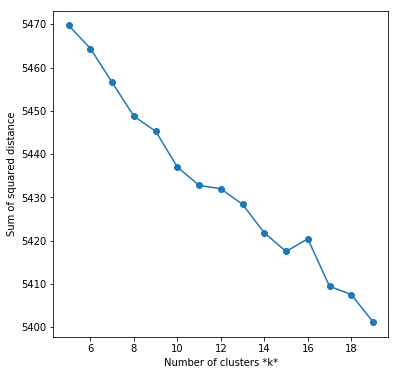

In [26]:
cc.intertia()

     k     score
0    5 -0.043435
1    6 -0.010111
2    7  0.031674
3    8 -0.092920
4    9 -0.123296
5   10 -0.072391
6   11 -0.032460
7   12 -0.090307
8   13 -0.025852
9   14 -0.045237
10  15  0.025841
11  16 -0.055592
12  17 -0.065829
13  18 -0.111630
14  19 -0.068696
With score=  0.03167359359512014
7


7

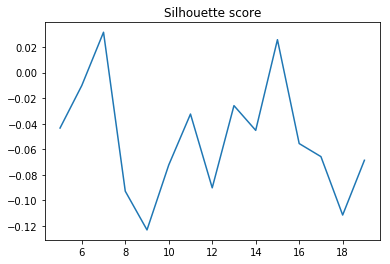

In [27]:
cc.silhouette_decision()

In [28]:
cc.final_model()

Initialization complete
Iteration  0, inertia 10672.142
Iteration  1, inertia 5478.433
Iteration  2, inertia 5471.496
Iteration  3, inertia 5467.809
Iteration  4, inertia 5465.700
Iteration  5, inertia 5464.047
Iteration  6, inertia 5462.843
Iteration  7, inertia 5461.882
Iteration  8, inertia 5461.145
Iteration  9, inertia 5460.638
Initialization complete
Iteration  0, inertia 10675.243
Iteration  1, inertia 5481.909
Iteration  2, inertia 5474.617
Iteration  3, inertia 5469.062
Iteration  4, inertia 5466.122
Iteration  5, inertia 5464.658
Iteration  6, inertia 5463.699
Iteration  7, inertia 5462.764
Iteration  8, inertia 5461.681
Iteration  9, inertia 5460.298
tiempo empleado: 1.782s

Mostramos los Clusters conformados
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=10,
    n_clusters=7, n_init=2, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=5)

In [29]:
cc.apply_model(content_df, 'plot_tokenized')

Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save 

Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 6: stori true tell base love life young set world inspir
Cluster 1: year old live ho

Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman 

Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academ

Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night

Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mys

Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set wo

Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili

Cluster 4: life man young live wife famili woman new turn love
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2:

Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili 

Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new

Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman n

Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famil

Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young 

Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night gro

Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 6

Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluste

Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day m

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri


Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic cr

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set wor

Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 1: year old live home famili fath

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife f

Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic cri

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 

Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili disc

Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: worl

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famil

Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night gr

Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 1: year old live home famili father son town return death
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night 

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili disco

Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famil

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 6: stori true tell bas

Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn

Cluster 3: world team war adventur fight power battl save forc time
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young frie

Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true t

Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov wom

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life you

Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend 

Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 4: life man young live wife famili woman new turn love
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife f

Cluster 4: life man young live wife famili woman new turn love
Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 1: year old live home famili father son town return death
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 4: life man young live wife famili woman new turn love
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect

Cluster 3: world team war adventur fight power battl save forc time
Cluster 1: year old live home famili father son town return death
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 1: year old live home famili father son town return death
Cluster 3: world team war adventur fight power battl save forc time
Cluster 6: stori true tell base love life young set world inspir
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 6: stori true tell base love life young set world inspir
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town ret

Cluster 3: world team war adventur fight power battl save forc time
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 3: world team war adventur fight power battl save forc time
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 3: world team war adventur fight power b

Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 2: new citi york tri detect polic make offic crime cop
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 6: stori true tell base love life young set world inspir
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 1: year old live home famili father son town return death
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
Cluster 5: star award academi comedi film director winner win thriller direct
Cluster 0: young friend famili discov woman night group love day mysteri
C

In [30]:
content_df.sample(20)

,movie_id,plot,rating_average,genre,genre_id,plot_tokenized,km_cluster
4845,60133,Work pressures cause a single mother to move t...,3.10,Kids & Family,259,work pressur caus singl mother move china youn...,2
1627,30068,The 24 hours of Le Mans is the most prestigiou...,5.00,,0,hour le man prestigi endur motorsport event wo...,3
110,23822,From Walt Disney Pictures comes the magical re...,4.00,,0,walt disney pictur come magic retel charl dick...,5
4465,56102,The Divide tells the story of 7 individuals st...,3.40,,0,divid tell stori individu strive better life m...,6
841,27398,After the unforgettable bachelor party in Las ...,4.00,,0,unforgett bachelor parti las vega stu take cha...,0
3273,42717,From producer and director Chris Lowenstein co...,5.00,,0,produc director chris lowenstein come intens a...,5
654,26351,Baptiste is a gifted primary school teacher. W...,4.00,,0,baptist gift primari school teacher left unwit...,0
3961,49821,Anwar Congo and his friends have been dancing ...,5.00,,0,anwar congo friend danc way music number twist...,0
4516,56632,Earth has fallen! A small team of humans are s...,2.15,,0,earth fallen small team human strand alien pla...,3
4315,54225,When young Lucas finds out he’s not really a h...,3.25,Animation,249,young luca find ’ realli human news rock world...,3


In [31]:
testSionpsis = "Neo is trying to find a way to kill all the machines and save the world."

cc.f_kmeans(testSionpsis)

Cluster 3: world team war adventur fight power battl save forc time


3

In [32]:
testSionpsis = "Boy meets Girl, as always, but in this case their love is being complicated by distance and parents."

cc.f_kmeans(testSionpsis)

Cluster 0: young friend famili discov woman night group love day mysteri


0

In [33]:
testSionpsis = "Dogs are the most beloved domestic animals, being part of many families."

cc.f_kmeans(testSionpsis)

Cluster 0: young friend famili discov woman night group love day mysteri


0

# Recommendations

In [34]:
class CollaborativeFiltering:
    
    MODEL_NAME = 'Collaborative Filtering'
    
    def __init__(self, cf_predictions_df, items_df=None):
        self.cf_predictions_df = cf_predictions_df
        self.items_df = items_df
        
    def get_model_name(self):
        return self.MODEL_NAME
        
    def recommend_items(self, user_id, items_to_ignore=[], topn=10, verbose=False):
        # Obtener predicciones y ordenar
        sorted_user_predictions = self.cf_predictions_df[user_id].sort_values(ascending=False) \
                                    .reset_index().rename(columns={user_id: 'recStrength'})

        # Recomendar películas que el usuario todavía no ha visto
        recommendations_df = sorted_user_predictions[~sorted_user_predictions['movie_id'].isin(items_to_ignore)] \
                               .sort_values('recStrength', ascending = False) \
                               .head(topn)

        if verbose:
            if self.items_df is None:
                raise Exception('"items_df" is required in verbose mode')

            recommendations_df = recommendations_df.merge(self.items_df, how = 'left', 
                                                          left_on = 'movie_id', 
                                                          right_on = 'movie_id')[['recStrength', 'movie_id']]


        return recommendations_df
    


In [35]:
cf_recommender_model = CollaborativeFiltering(cf_train_mdf, cf_train)


In [36]:
user_recommendations_df = cf_recommender_model.recommend_items(19024796, topn=10, verbose=True).drop_duplicates().reset_index()

In [37]:
# prueba con un usuario
user_recommendations_df

,index,recStrength,movie_id
0,0,0.860639,57749
1,37,0.686458,120762
2,132,0.518650,92285
3,156,0.487083,57010
4,174,0.444988,113975
5,221,0.410743,40730
6,238,0.390984,53580
7,262,0.384268,23929
8,276,0.368713,115862
9,333,0.367749,121581


In [38]:
user_recommendations_df.movie_id.unique()

array([ 57749, 120762,  92285,  57010, 113975,  40730,  53580,  23929,
       115862, 121581], dtype=int64)

In [39]:
cf_train_pred = cf_train.copy()

In [40]:
cf_train_pred['cf_pred'] = cf_train['user_id'].apply(lambda x: cf_recommender_model.recommend_items(x, topn=10, verbose=True)\
                                              .drop_duplicates().movie_id.unique())

In [41]:
# resultado por usuario

In [42]:
cf_train_pred = cf_train_pred.drop(columns='movie_id')
cf_train_pred.head()

,user_id,eventStrength,cf_pred
0,18133953,0.051530,"[120762, 111713, 23749, 27321, 113095, 50229, ..."
1,18521570,0.094637,"[57749, 117685, 119175, 115862, 27321, 121586,..."
2,18264855,2.258943,"[23923, 64988, 51412, 120762, 67304, 51414, 12..."
3,13665137,3.410019,"[23745, 57749, 23860, 44258, 23879, 23929, 502..."
4,18398248,3.178228,"[23923, 64988, 51412, 51424, 67304, 51414, 514..."


# Cosine similarity

In [43]:
# Configuración en la definición de la clase (películas a recomendar y usuarios similares)
# Dos tipos de cosine similarity - uno enfocado en películas y el otro en usuarios

In [44]:
class CosineSimilarity():
    
    def __init__(self, genres_df):
        
        self.categories = genres_df.genre.unique().tolist()
        self.max_movies = 10
        self.similar_users_plusone = 5
    

    def generate_recomendations(self, top_results=5):
        
        cat=self.categories
        
        print("User analysed: ", self.user_id, '\n')
        print("Movie analyzed: ", self.movie_id)
        ## Cosine Similarity para películas
        movie_based = self.item_based_recom()
        
#         display(movie_based[1:top_results+1])  ### Comentar para un volúmen grande de datos!!!

        print("--------------\n")
        print("User based recommendation: ")
        user_based = self.user_based_recom()[0:self.max_movies]

#         display(self.user_based_recom()[0:self.max_movies]) ### Comentar para un volúmen grande de datos!!!
    
        return movie_based, user_based
    
    
    
    def run_cosine_similarity(self, df, uid, mid, r_type):
        
        if mid is None:
            mid = df['movie_id'].values[0]
            
        if uid is None:
            uid = df['user_id'].values[0]
        
        movies_rated = df[df.user_id == uid][['movie_id', 'eventStrength']].copy()
        movies_rated = movies_rated.set_index('movie_id')
        movies_rated = movies_rated.drop_duplicates()
        
        df['movie_id'] = df['movie_id'].astype(str)
        df[df.user_id == uid]['movie_id']

        self.people_who_rated = {uid: "test_user"}
        self.input_films_rated = movies_rated.to_dict()

        self.movie_id = str(mid)
        self.user_id = uid
        self.input_dataframe = df
        self.r_type = r_type
        
        self.movie_based, self.user_based = self.generate_recomendations(5) ### df con recomendaciones
        preds = self.get_result_df()
        
        return preds
    
    
    def get_result_df(self):
        
        if self.r_type == 'user':
        
            user_based = self.user_based.reset_index()
            user_based['user_id'] = self.user_id
            user_based = user_based[['user_id', 'movie_id', 'Mean_score']]
            user_based = user_based[0:self.max_movies]

            m = user_based['movie_id'].unique().tolist()
            m = [int(i) for i in m]

            user_recommendations = user_based.groupby('user_id').agg({'Mean_score':'mean'}).reset_index()
            user_recommendations['cs_pred_user'] = str(m)
            user_recommendations = user_recommendations.rename(columns={'Mean_score':'score'})
            user_recommendations = user_recommendations.drop(columns=['user_id']) 
            recommendations = user_recommendations
        
        elif self.r_type == 'movie':
            
            self.movie_based['id'] = self.movie_id
            movie_based = self.movie_based[0:self.max_movies]
            mm = movie_based['movie_id'].tolist()
            mm = [int(i) for i in mm]
            movie_recommendations = movie_based.groupby('id').agg({'cosine_sim':'mean'}).reset_index()
            movie_recommendations = movie_recommendations.rename(columns={'cosine_sim':'score'})
            movie_recommendations['cs_pred_movie'] = str(mm)
            movie_recommendations = movie_recommendations.drop(columns=['id']) 
        
            recommendations = movie_recommendations
        
        else:
            recommendations = None
            
            
        return recommendations
        
    
    def item_based_recom(self):    
        pivot_item_based = pd.pivot_table(self.input_dataframe,
                                          index='movie_id',
                                          columns=['user_id'], values='eventStrength')  
        sparse_pivot = sparse.csr_matrix(pivot_item_based.fillna(0))
        recommender = pw.cosine_similarity(sparse_pivot)
        recommender_df = pd.DataFrame(recommender, 
                                      columns=pivot_item_based.index,
                                      index=pivot_item_based.index)
        ## Cosine Similarity
#         print(recommender_df)
        cosine_df = pd.DataFrame(recommender_df[self.movie_id].sort_values(ascending=False))
        cosine_df.reset_index(level=0, inplace=True)
        cosine_df.columns = ['movie_id','cosine_sim']
        return cosine_df
    

    def pairwise_row_diff(self, dataframe,row1, row2,column_names):
    #     display(dataframe)
         # 2 matrices para comparar Cosine Similarity
        matrix_row1 = [[dataframe.loc[row1,cat] for cat in column_names]] 
        matrix_row2 = [[dataframe.loc[row2,cat] for cat in column_names]] 
        return round(pw.cosine_similarity(matrix_row1,matrix_row2)[0][0],5)
    
    
    def user_based_recom(self):    
        pivot_user_based = pd.pivot_table(self.input_dataframe, index='movie_id', columns=['user_id'], values='eventStrength').T
        sparse_pivot_ub = sparse.csr_matrix(pivot_user_based.fillna(0))
        user_recomm = pw.cosine_similarity(sparse_pivot_ub)
        user_recomm_df = pd.DataFrame(user_recomm,columns=pivot_user_based.index.values,
                     index=pivot_user_based.index.values)
        ## Cosine Similarity
        usr_cosine_df = pd.DataFrame(user_recomm_df[self.user_id].sort_values(ascending=False))
        usr_cosine_df.reset_index(level=0, inplace=True)
        usr_cosine_df.columns = ['user_id','cosine_sim']
        return usr_cosine_df
    
    
    def insert_ratings(self, usr_rtg_dict,pivot_user_based):
        """
        Function to insert new row in pivot_user_based with event strength created by a new user 
        """
        # Iterar sobre los usuarios que han interactuado
        for person_id in usr_rtg_dict:
        # Iterar sobre películas vistas
            for movie in self.input_films_rated.get(person_id):
        # Insertar score en un dataframe
                  pivot_user_based.loc[person_id,movie] = usr_rtg_dict.get(person_id).get(movie)
    #               print("Score por id: ", person_id,movie,usr_rtg_dict.get(person_id).get(movie))
        return pivot_user_based

    def user_based_recom(self):    
        """
        Function to create user based recoomendations.
        """
        pivot_user_based = pd.pivot_table(self.input_dataframe, index='user_id', columns=['movie_id'], values='eventStrength')
        pivot_user_based = self.insert_ratings(self.input_films_rated,pivot_user_based)
        user_sparse_pivot = sparse.csr_matrix(pivot_user_based.fillna(0))
        user_recommender = pw.cosine_similarity(user_sparse_pivot)
        user_recommender_df = pd.DataFrame(user_recommender, columns=pivot_user_based.index.values,index = pivot_user_based.index.values)
        ## Cosine Similarity dataframe 
        usr_cosine_df = pd.DataFrame(user_recommender_df[self.user_id].sort_values(ascending=False))
        usr_cosine_df.reset_index(level=0, inplace=True)
        usr_cosine_df.columns = ['movie_id','cosine_sim']
        ## Los X usuarios más parecidos según configuración
        similar_usr = list(usr_cosine_df['movie_id'][1:self.similar_users_plusone].values)
        ## Comparar fuerzas de relaciones de usuarios similares
        similar_usr_df = pivot_user_based.T[[self.user_id] + similar_usr].fillna(0)
        similar_usr_df['mean_rev'] = similar_usr_df[similar_usr].mean(numeric_only=True,axis=1)
        similar_usr_df.sort_values('mean_rev', ascending=False,inplace = True)

        print(similar_usr_df)
        similar_usr_df = similar_usr_df.T.drop_duplicates().T
        
        return similar_usr_df[similar_usr_df[self.user_id]==0].rename({'mean_rev':'Mean_score'},axis=1)
        
          

In [45]:
cs = CosineSimilarity(content_df[['genre']])

In [46]:
cs_all = cf_all.copy()
cs_train = cf_train.copy()
cs_test = cf_test.copy()

In [47]:
cs_train.dtypes

user_id            int64
movie_id           int64
eventStrength    float64
dtype: object

In [48]:
# Iteramos sobre usuarios, cogiendo todo el dataframe y creamos resultados
# (un método muy poco eficiente en pandas pero para conservar el mismo dataframe no se me ocurre nada de estipo apply)
# para la muestra sólo 80 usuarios, sino tarda mucho tiempo por ser poco eficiente

In [49]:
cs_users = pd.DataFrame(columns=['user_id', 'score', 'cs_pred_user'])

for i in cs_train.user_id.values.tolist()[0:80]:
    print(i)
    try:
        user_pred = pd.DataFrame(columns=['user_id', 'score', 'cs_pred_user'])
        user_pred[['score', 'cs_pred_user']] = cs.run_cosine_similarity(cs_train, i, None, 'user')
        user_pred['user_id'] = i

        cs_users = pd.concat([cs_users, user_pred], axis = 0)
        
    except:
        print('failed')
    
    

18133953
User analysed:  18133953 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18133953  19065519  18176235  18518682  14411918  mean_rev
movie_id                                                            
111713    5.171527  5.419539  3.733354  3.744161  0.000000  3.224264
120762    4.030319  0.000000  4.863284  0.000000  6.049690  2.728244
113095    2.508612  0.000000  7.349640  0.000000  0.000000  1.837410
23923     0.000000  0.000000  0.000000  0.000000  4.392317  1.098079
114284    2.942775  4.333106  0.000000  0.000000  0.000000  1.083276
110163    0.000000  0.000000  3.856824  0.000000  0.000000  0.964206
23922     3.571201  0.000000  0.000000  0.000000  3.338271  0.834568
117685    2.565118  0.000000  0.023459  0.000000  2.623852  0.661828
23745     0.000000  0.000000  0.000000  0.000000  2.584963  0.646241
56363     0.000000  0.000000  0.000000  0.000000  2.573243  0.643311
53580     0.000000  0.000000  0.000000  0.000000  2.208657  0.552164

18264855
User analysed:  18264855 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18264855  eventStrength  18582176  18398248  18203089  mean_rev
movie_id                                                                 
51412     6.604313       6.604313  7.131952  5.304457  7.687797  6.682130
51424     0.000000       0.000000  0.000000  5.304457  8.432619  3.434269
51414     5.037903       5.037903  0.000000  0.000000  7.413158  3.112765
51421     0.000000       0.000000  0.000000  5.306387  7.087463  3.098463
23923     3.934112       3.934112  0.000000  5.804724  0.000000  2.434709
55057     0.000000       0.000000  0.000000  0.000000  8.064697  2.016174
26372     0.000000       0.000000  0.000000  7.502457  0.000000  1.875614
64988     0.000000       0.000000  0.000000  0.000000  7.422195  1.855549
23790     3.772132       3.772132  0.000000  3.178228  0.000000  1.737590
123151    3.732997       3.732997  0.000000  0.000000  2.838719  1.642929
111048  

18398248
User analysed:  18398248 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18398248  eventStrength  16253894  18264855  18203089  mean_rev
movie_id                                                                 
23923     5.804724       5.804724  7.541531  3.934112  0.000000  4.320092
51412     5.304457       0.000000  0.000000  6.604313  7.687797  3.573027
51424     5.304457       5.304457  0.000000  0.000000  8.432619  3.434269
51414     0.000000       0.000000  0.000000  5.037903  7.413158  3.112765
51421     5.306387       5.306387  0.000000  0.000000  7.087463  3.098463
55057     0.000000       0.000000  0.000000  0.000000  8.064697  2.016174
26372     7.502457       7.502457  0.000000  0.000000  0.000000  1.875614
64988     0.000000       0.000000  0.000000  0.000000  7.422195  1.855549
23790     3.178228       3.178228  0.000000  3.772132  0.000000  1.737590
123151    0.000000       0.000000  0.000000  3.732997  2.838719  1.642929
111048  

16044852
User analysed:  16044852 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16044852  eventStrength  16205635  12722474  14354616  mean_rev
movie_id                                                                 
113095    6.803765       6.803765  7.092376  4.849752  6.468865  6.303689
23745     7.398787       7.398787  6.234304  4.290677  6.634700  6.139617
117820    8.354147       8.354147  6.313912  0.000000  7.102152  5.442553
110163    9.043695       9.043695  6.873802  5.255852  0.000000  5.293337
23929     4.596935       4.596935  6.300124  3.827819  6.173927  5.224701
23860     4.943580       4.943580  5.626705  2.529253  3.459432  4.139742
48962     6.010741       6.010741  4.299805  2.462280  2.312488  3.771329
23914     8.346674       8.346674  0.000000  0.000000  6.272185  3.654715
87412     6.988886       6.988886  4.974643  0.000000  2.584963  3.637123
111713    7.442943       7.442943  0.000000  3.371559  2.700440  3.378736
23879   

13760811
User analysed:  13760811 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13760811  13760811  16457826  11030445  18292445  mean_rev
movie_id                                                            
10454     3.513070  3.513070  0.000000  5.224002  0.000000  2.450028
10072     5.430040  5.430040  0.000000  0.000000  0.000000  2.172016
98564     2.496702  2.496702  0.000000  0.000000  4.339310  1.866543
10070     4.393221  4.393221  0.000000  0.000000  0.000000  1.757288
121691    2.613739  2.613739  3.323513  0.000000  0.000000  1.710198
14206     0.000000  0.000000  0.000000  7.511188  0.000000  1.502238
60727     3.742109  3.742109  0.000000  0.000000  0.000000  1.496844
10071     3.690757  3.690757  0.000000  0.000000  0.000000  1.476303
51079     1.356304  1.356304  3.826954  0.000000  0.000000  1.307912
43755     0.000000  0.000000  0.000000  6.041207  0.000000  1.208241
13712     2.922143  2.922143  0.000000  0.000000  0.000000  1.168857

18203089
User analysed:  18203089 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18203089  eventStrength  16698464  18259020  14601125  mean_rev
movie_id                                                                 
51414     7.413158       7.413158  5.357552  0.000000  0.000000  3.192677
55057     8.064697       8.064697  0.000000  0.000000  4.376796  3.110373
51421     7.087463       7.087463  4.954196  0.000000  0.000000  3.010415
64988     7.422195       7.422195  0.000000  4.319695  0.000000  2.935473
67304     5.894240       5.894240  0.000000  5.825640  0.000000  2.929970
51424     8.432619       8.432619  0.000000  0.000000  0.000000  2.108155
51412     7.687797       7.687797  0.000000  0.000000  0.000000  1.921949
111048    6.477704       6.477704  0.000000  0.000000  0.000000  1.619426
27167     5.483816       5.483816  0.000000  0.000000  0.000000  1.370954
56058     5.286135       5.286135  0.000000  0.000000  0.069709  1.338961
23939   

18602028
User analysed:  18602028 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18602028  eventStrength  18295457  17551088  16609293  mean_rev
movie_id                                                                 
83801     6.284972       6.284972  5.127365  4.975681  4.275908  5.165981
117820    2.495484       2.495484  3.378798  3.251836  2.703868  2.957496
120762    3.812349       3.812349  2.505792  0.000000  0.000000  1.579535
123151    2.574354       2.574354  0.000000  3.659624  0.000000  1.558494
40692     5.570655       5.570655  0.000000  0.000000  0.000000  1.392664
55533     0.000000       0.000000  4.258484  0.000000  0.000000  1.064621
111713    4.197708       4.197708  0.000000  0.000000  0.000000  1.049427
65617     0.000000       0.000000  0.000000  4.178337  0.000000  1.044584
87412     0.000000       0.000000  4.081442  0.000000  0.000000  1.020361
99935     0.000000       0.000000  0.000000  3.737303  0.000000  0.934326
27403   

[1791 rows x 6 columns]
15582507
User analysed:  15582507 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   15582507  15582507  15878256  15686660  15711902  mean_rev
movie_id                                                            
102239    4.979543  4.979543  0.000000  0.000000  0.000000  1.991817
110163    0.000000  0.000000  3.978877  2.626303  0.000000  1.321036
111713    0.000000  0.000000  6.221104  0.000000  0.000000  1.244221
60728     2.764784  2.764784  0.000000  0.000000  0.000000  1.105913
92285     0.000000  0.000000  0.000000  5.164778  0.000000  1.032956
27453     0.000000  0.000000  0.000000  0.000000  4.706592  0.941318
27308     0.000000  0.000000  0.000000  4.419903  0.000000  0.883981
61101     0.000000  0.000000  0.000000  0.000000  4.209453  0.841891
102489    0.000000  0.000000  0.000000  0.000000  2.529253  0.505851
34757     0.000000  0.000000  0.000000  0.000000  2.515254  0.503051
34559     0.000000  0.000000  0.000000  0.00

19024796
User analysed:  19024796 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   19024796  19024796  17599773  16393118  17513096  mean_rev
movie_id                                                            
57749     6.167060  6.167060  0.000000  5.036043  4.418254  4.357683
57010     6.634441  6.634441  3.852658  0.000000  0.000000  3.424308
113975    4.412383  4.412383  6.672148  0.000000  0.000000  3.099383
110132    4.029062  4.029062  5.974081  0.000000  1.415037  3.089449
40730     6.226783  6.226783  0.000000  0.000000  0.000000  2.490713
23945     3.752012  3.752012  0.000000  0.000000  4.505918  2.401988
23929     5.971544  5.971544  0.000000  0.000000  0.000000  2.388617
92285     5.955786  5.955786  0.000000  0.000000  0.000000  2.382315
101755    5.765193  5.765193  0.000000  0.000000  0.000000  2.306077
34723     5.246647  5.246647  0.000000  0.000000  0.000000  2.098659
120762    4.007857  4.007857  2.447926  0.000000  0.000000  2.092728

18491141
User analysed:  18491141 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18491141  18491141  17713823  17396517  18995977  mean_rev
movie_id                                                            
110188    2.584963  2.584963  3.796241  4.145206  0.000000  2.622274
27403     2.541894  2.541894  2.524791  0.000000  3.222392  2.166194
117831    2.555579  2.555579  0.000000  0.000000  3.427347  1.707701
118554    2.610498  2.610498  3.146841  0.000000  0.000000  1.673567
118034    2.578836  2.578836  2.533099  0.000000  0.000000  1.538154
110187    0.000000  0.000000  5.991671  0.000000  0.000000  1.198334
118057    2.701607  2.701607  0.000000  0.000000  0.000000  1.080643
118750    2.560715  2.560715  0.000000  0.000000  0.000000  1.024286
114284    0.000000  0.000000  2.502500  0.000000  2.476814  0.995863
104505    0.000000  0.000000  0.000000  0.000000  4.801248  0.960250
113464    0.000000  0.000000  0.000000  0.000000  3.665210  0.733042

13212121
User analysed:  13212121 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13212121  eventStrength  18013056  13616244  18397252  mean_rev
movie_id                                                                 
118138    3.468675       3.468675  2.706034  3.290996  2.505070  2.992694
121586    0.000000       0.000000  2.657112  3.132450  3.016551  2.201528
115934    2.814285       2.814285  2.598408  0.000000  2.574115  1.996702
119175    0.000000       0.000000  2.629357  2.497852  2.638436  1.941411
120196    3.474849       3.474849  2.975197  0.000000  0.000000  1.612511
60075     0.000000       0.000000  0.000000  0.000000  5.916979  1.479245
115680    0.090908       0.090908  2.967379  2.545326  0.046170  1.412446
112336    0.000000       0.000000  0.000000  0.000000  4.333400  1.083350
38451     0.000000       0.000000  3.967645  0.000000  0.000000  0.991911
120664    0.000000       0.000000  3.862947  0.000000  0.000000  0.965737
118057  

15561532
User analysed:  15561532 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   15561532  15561532  15620121  12507424  18377691  mean_rev
movie_id                                                            
118881    3.941840  3.941840  0.000000  5.062372  5.047406  3.598692
120762    3.297918  3.297918  1.075051  3.254547  1.939208  2.572928
25004     4.654311  4.654311  0.000000  0.000000  0.000000  1.861724
23849     3.275331  3.275331  0.000000  0.000000  0.000000  1.310132
110163    0.000000  0.000000  0.000000  3.797737  1.854506  1.130449
44654     2.661720  2.661720  0.000000  0.000000  0.000000  1.064688
85625     2.597304  2.597304  0.000000  0.000000  0.000000  1.038922
23742     2.545650  2.545650  0.000000  0.000000  0.000000  1.018260
31980     2.536836  2.536836  0.000000  0.000000  0.000000  1.014734
112539    0.000000  0.000000  0.000000  0.000000  4.449393  0.889879
45520     0.000000  0.000000  0.000000  4.269001  0.000000  0.853800

16049485
User analysed:  16049485 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16049485  16049485  18778053  17530260  16441432  mean_rev
movie_id                                                            
27321     2.763300  2.763300  4.617806  4.729352  4.578621  3.890476
111713    4.722466  4.722466  0.000000  6.875289  0.000000  3.264044
27323     3.780990  3.780990  0.000000  3.075460  3.057267  2.738942
27555     2.522653  2.522653  2.610864  2.787808  2.718024  2.632400
27554     3.146841  3.146841  2.521116  1.621957  2.615857  2.610522
27322     3.371256  3.371256  5.479052  0.000000  0.000000  2.444313
61319     4.628556  4.628556  0.000000  0.000000  0.000000  1.851422
27347     2.868167  2.868167  0.000000  0.000000  2.560045  1.659276
23806     3.511785  3.511785  0.000000  0.000000  0.000000  1.404714
120734    2.785807  2.785807  0.000000  0.000000  0.000000  1.114323
115239    2.778973  2.778973  0.000000  0.000000  0.000000  1.111589

18561031
User analysed:  18561031 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18561031  18561031  15620121  13168765  18724656  mean_rev
movie_id                                                            
120762    5.615853  5.615853  1.075051  5.429193  6.489049  4.845000
121581    5.444156  5.444156  0.000000  3.986744  2.579086  3.490829
23865     5.005207  5.005207  0.000000  0.000000  0.000000  2.002083
60813     4.514043  4.514043  0.000000  0.000000  0.000000  1.805617
40730     4.441029  4.441029  0.000000  0.000000  0.000000  1.776412
27690     4.336878  4.336878  0.000000  0.000000  0.000000  1.734751
44212     4.036275  4.036275  0.000000  0.000000  0.000000  1.614510
79022     3.882423  3.882423  0.000000  0.000000  0.000000  1.552969
30935     3.664962  3.664962  0.000000  0.000000  0.000000  1.465985
85615     3.605829  3.605829  0.000000  0.000000  0.000000  1.442332
23929     0.000000  0.000000  0.000000  0.000000  6.635174  1.327035

17724104
User analysed:  17724104 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   17724104  eventStrength  13713197  17713823  18790032  mean_rev
movie_id                                                                 
110187    4.292523       4.292523  4.292523  5.991671  4.392317  4.742259
121586    2.837167       2.837167  3.232661  2.594181  0.000000  2.166002
118890    2.707722       2.707722  3.715691  0.000000  0.074001  1.624354
123090    2.512031       2.512031  3.632432  0.059706  0.000000  1.551042
114651    2.807355       2.807355  2.820411  0.000000  0.000000  1.406941
115239    2.560715       2.560715  2.688282  0.000000  0.101283  1.337570
122971    0.045804       0.045804  2.565440  2.484596  0.000000  1.273960
34795     0.000000       0.000000  0.000000  0.000000  4.717327  1.179332
106865    0.000000       0.000000  4.529066  0.000000  0.000000  1.132266
109653    0.000000       0.000000  4.423211  0.000000  0.000000  1.105803
109312  

18317505
User analysed:  18317505 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18317505  18317505  17239414  19065519  17713823  mean_rev
movie_id                                                            
114284    5.226680  5.226680  4.604862  4.333106  2.502500  4.378766
60102     6.310474  6.310474  0.000000  0.000000  0.000000  2.524189
110187    2.227806  2.227806  0.000000  0.000000  5.991671  2.089457
115690    3.853711  3.853711  0.000000  0.000000  0.000000  1.541484
61406     2.801873  2.801873  0.000000  0.000000  0.000000  1.120749
111713    0.000000  0.000000  0.000000  5.419539  0.000000  1.083908
44504     2.549162  2.549162  0.000000  0.000000  0.000000  1.019665
44567     2.540568  2.540568  0.000000  0.000000  0.000000  1.016227
24991     2.536545  2.536545  0.000000  0.000000  0.000000  1.014618
27690     2.533979  2.533979  0.000000  0.000000  0.000000  1.013591
109653    2.519755  2.519755  0.000000  0.000000  0.000000  1.007902

16417072
User analysed:  16417072 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16417072  16417072  18295457  18080816  18518682  mean_rev
movie_id                                                            
83801     6.072086  6.072086  5.127365  0.000000  0.000000  3.454307
30933     5.268867  5.268867  0.000000  5.325930  0.000000  3.172733
87412     5.511018  5.511018  4.081442  0.000000  0.000000  3.020696
61101     4.392317  4.392317  0.000000  6.120886  0.000000  2.981104
111713    5.307429  5.307429  0.000000  0.000000  3.744161  2.871804
123430    5.110002  5.110002  2.876455  0.000000  0.000000  2.619292
23850     5.357552  5.357552  0.000000  0.000000  0.000000  2.143021
23760     4.327720  4.327720  0.000000  0.000000  0.000000  1.731088
23925     3.673711  3.673711  0.000000  0.000000  0.000000  1.469484
23784     3.225650  3.225650  0.000000  0.000000  0.000000  1.290260
117820    0.000000  0.000000  3.378798  2.792405  0.000000  1.234240

15619541
User analysed:  15619541 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   15619541  15619541  17457260  17513096  12438461  mean_rev
movie_id                                                            
23945     4.519509  4.519509  6.005081  4.505918  0.000000  3.910004
60470     4.455053  4.455053  0.000000  0.000000  5.849666  2.951954
117685    3.194676  3.194676  2.734599  0.000000  3.814937  2.587778
52197     4.711071  4.711071  0.000000  0.000000  0.000000  1.884429
23764     3.529564  3.529564  0.000000  0.000000  0.000000  1.411826
115862    3.326769  3.326769  0.000000  0.047697  0.000000  1.340247
115767    3.330182  3.330182  0.000000  0.000000  0.000000  1.332073
56101     0.000000  0.000000  6.058092  0.000000  0.000000  1.211618
115239    2.750022  2.750022  0.000000  0.000000  0.000000  1.100009
117831    0.000000  0.000000  0.000000  0.000000  4.924621  0.984924
57749     0.000000  0.000000  0.000000  4.418254  0.000000  0.883651

15040009
User analysed:  15040009 

Movie analyzed:  115239
--------------

User based recommendation: 
failed
16468771
User analysed:  16468771 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16468771  eventStrength  18145403  18264461  14621888  mean_rev
movie_id                                                                 
110163    2.498548       2.498548  0.000000  7.639320  4.543841  3.670427
112066    4.517058       4.517058  2.553530  0.000000  2.723220  2.448452
27662     4.626994       4.626994  4.212717  0.000000  0.000000  2.209928
123151    0.000000       0.000000  0.000000  2.520111  3.025535  1.386412
113324    2.695535       2.695535  0.000000  2.600787  0.000000  1.324081
113095    0.000000       0.000000  0.000000  5.292630  0.000000  1.323157
32081     0.000000       0.000000  0.000000  0.000000  4.333273  1.083318
106866    0.000000       0.000000  4.145946  0.000000  0.000000  1.036487
27592     0.000000       0.000000  3.494924  

16049485
User analysed:  16049485 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16049485  16049485  18778053  17530260  16441432  mean_rev
movie_id                                                            
27321     2.763300  2.763300  4.617806  4.729352  4.578621  3.890476
111713    4.722466  4.722466  0.000000  6.875289  0.000000  3.264044
27323     3.780990  3.780990  0.000000  3.075460  3.057267  2.738942
27555     2.522653  2.522653  2.610864  2.787808  2.718024  2.632400
27554     3.146841  3.146841  2.521116  1.621957  2.615857  2.610522
27322     3.371256  3.371256  5.479052  0.000000  0.000000  2.444313
61319     4.628556  4.628556  0.000000  0.000000  0.000000  1.851422
27347     2.868167  2.868167  0.000000  0.000000  2.560045  1.659276
23806     3.511785  3.511785  0.000000  0.000000  0.000000  1.404714
120734    2.785807  2.785807  0.000000  0.000000  0.000000  1.114323
115239    2.778973  2.778973  0.000000  0.000000  0.000000  1.111589

18790032
User analysed:  18790032 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18790032  18790032  18621950  17713823  17090488  mean_rev
movie_id                                                            
110187    4.392317  4.392317  3.343283  5.991671  0.000000  3.623918
34795     4.717327  4.717327  0.000000  0.000000  7.251990  3.337329
111477    2.666263  2.666263  4.823838  0.000000  0.000000  2.031273
115862    2.580916  2.580916  3.440573  0.000000  0.000000  1.720481
45526     0.000000  0.000000  0.000000  0.000000  6.126025  1.225205
44299     2.951609  2.951609  0.039528  0.000000  0.000000  1.188549
44503     2.961932  2.961932  0.000000  0.000000  0.000000  1.184773
83801     0.000000  0.000000  0.000000  0.000000  5.828173  1.165635
34698     2.707150  2.707150  0.000000  0.000000  0.000000  1.082860
115680    0.112768  0.112768  2.539285  2.553341  0.000000  1.063632
56961     2.613532  2.613532  0.045443  0.000000  0.000000  1.054501

17287585
User analysed:  17287585 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   17287585  eventStrength  17194294  18074739  19065174  mean_rev
movie_id                                                                 
113324    3.782131       3.782131  4.832890  4.382179  2.739086  3.934071
117685    3.245436       3.245436  0.000000  0.000000  3.387805  1.658310
60614     0.000000       0.000000  0.000000  4.340016  0.000000  1.085004
56894     4.307940       4.307940  0.000000  0.000000  0.000000  1.076985
34697     4.199018       4.199018  0.000000  0.000000  0.000000  1.049754
27677     0.000000       0.000000  0.000000  0.000000  2.868247  0.717062
55822     0.000000       0.000000  0.000000  0.000000  2.860304  0.715076
61101     0.000000       0.000000  0.000000  0.000000  2.826548  0.706637
34839     0.000000       0.000000  0.000000  0.000000  2.818920  0.704730
34547     0.000000       0.000000  2.681824  0.000000  0.000000  0.670456
28774   

13200067
User analysed:  13200067 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13200067  13200067  16366113  15214482  16459660  mean_rev
movie_id                                                            
110132    4.381627  4.381627  5.710299  0.000000  0.000000  2.894711
78633     4.123382  4.123382  3.405749  0.000000  1.822002  2.694903
95339     4.272149  4.272149  4.197131  0.000000  0.000000  2.548286
55193     3.429540  3.429540  0.000000  4.957691  0.000000  2.363354
111477    4.267601  4.267601  0.000000  0.000000  0.000000  1.707040
115934    2.501546  2.501546  2.624929  0.000000  0.000000  1.525604
114249    2.524080  2.524080  0.000000  2.574992  0.000000  1.524631
32070     3.433987  3.433987  0.000000  0.000000  0.000000  1.373595
23747     3.342575  3.342575  0.000000  0.000000  0.000000  1.337030
115862    0.408963  0.408963  5.692491  0.000000  0.000000  1.302083
113975    0.711279  0.711279  4.949626  0.000000  0.000000  1.274437

18814652
User analysed:  18814652 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18814652  eventStrength  14401953  14136869  16253894  mean_rev
movie_id                                                                 
23923     6.843953       6.843953  5.846258  5.357552  7.541531  6.397324
50229     7.255922       7.255922  7.032353  0.000000  3.116016  4.351073
110163    8.334767       8.334767  0.000000  5.357552  0.000000  3.423080
55561     9.938109       9.938109  2.584963  0.000000  0.000000  3.130768
111713    6.251719       6.251719  3.169925  2.584963  0.000000  3.001652
40730     6.700040       6.700040  0.000000  4.253757  0.000000  2.738449
120762    4.238312       4.238312  3.503324  0.000000  2.450491  2.548032
48962     8.880249       8.880249  0.000000  0.000000  0.000000  2.220062
61406     6.025703       6.025703  0.000000  2.139823  0.000000  2.041382
30136     8.101326       8.101326  0.000000  0.000000  0.000000  2.025332
111607  

16205635
User analysed:  16205635 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   16205635  eventStrength  13887270  18264461  14354616  mean_rev
movie_id                                                                 
113095    7.092376       7.092376  7.195417  5.292630  6.468865  6.512322
110163    6.873802       6.873802  5.930737  7.639320  0.000000  5.110965
117820    6.313912       6.313912  5.504031  0.058299  7.102152  4.744598
120762    7.087875       7.087875  2.530245  2.703668  5.900574  4.555591
23929     6.300124       6.300124  3.666757  0.000000  6.173927  4.035202
23745     6.234304       6.234304  0.000000  0.000000  6.634700  3.217251
23879     6.315633       6.315633  2.164512  3.437156  0.000000  2.979325
118881    6.695008       6.695008  0.000000  0.000000  4.825599  2.880152
48962     4.299805       4.299805  4.331306  0.000000  2.312488  2.735900
23749     5.290019       5.290019  0.000000  0.000000  5.593702  2.720930
34785   

19024796
User analysed:  19024796 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   19024796  19024796  17599773  16393118  17513096  mean_rev
movie_id                                                            
57749     6.167060  6.167060  0.000000  5.036043  4.418254  4.357683
57010     6.634441  6.634441  3.852658  0.000000  0.000000  3.424308
113975    4.412383  4.412383  6.672148  0.000000  0.000000  3.099383
110132    4.029062  4.029062  5.974081  0.000000  1.415037  3.089449
40730     6.226783  6.226783  0.000000  0.000000  0.000000  2.490713
23945     3.752012  3.752012  0.000000  0.000000  4.505918  2.401988
23929     5.971544  5.971544  0.000000  0.000000  0.000000  2.388617
92285     5.955786  5.955786  0.000000  0.000000  0.000000  2.382315
101755    5.765193  5.765193  0.000000  0.000000  0.000000  2.306077
34723     5.246647  5.246647  0.000000  0.000000  0.000000  2.098659
120762    4.007857  4.007857  2.447926  0.000000  0.000000  2.092728

14387053
User analysed:  14387053 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   14387053  14387053  14714184  14129271  18264359  mean_rev
movie_id                                                            
101814    4.961683  4.961683  4.403356  4.939105  0.000000  3.853165
57029     4.357552  4.357552  0.000000  2.930737  4.709658  3.271100
78633     0.000000  0.000000  0.000000  4.277453  5.793487  2.014188
56961     0.000000  0.000000  4.416299  3.669027  0.000000  1.617065
106865    0.000000  0.000000  0.000000  5.986811  0.000000  1.197362
101755    0.000000  0.000000  0.000000  0.000000  5.930737  1.186147
39590     2.728992  2.728992  0.000000  0.000000  0.000000  1.091597
102467    0.000000  0.000000  0.000000  5.452427  0.000000  1.090485
111864    0.000000  0.000000  0.000000  4.845587  0.000000  0.969117
95340     0.000000  0.000000  0.000000  4.555662  0.000000  0.911132
59530     0.000000  0.000000  0.000000  4.127045  0.000000  0.825409

13833202
User analysed:  13833202 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13833202  13833202  15907282  15360739  18431174  mean_rev
movie_id                                                            
110163    5.165258  5.165258  4.965516  4.485127  6.826548  5.321541
44258     4.719667  4.719667  5.936227  0.000000  6.429188  4.360950
23923     0.000000  0.000000  0.000000  0.000000  8.966903  1.793381
112560    0.000000  0.000000  0.000000  0.000000  7.289237  1.457847
120762    0.000000  0.000000  0.000000  0.000000  5.497445  1.099489
92285     2.532647  2.532647  0.000000  0.095420  0.000000  1.032143
34777     2.571077  2.571077  0.000000  0.000000  0.000000  1.028431
119133    2.528600  2.528600  0.000000  0.000000  0.000000  1.011440
111048    0.000000  0.000000  0.000000  3.849891  0.000000  0.769978
23751     0.000000  0.000000  0.000000  0.000000  3.811031  0.762206
115862    0.000000  0.000000  0.000000  0.000000  3.177985  0.635597

13713197
User analysed:  13713197 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13713197  eventStrength  17483721  19131740  17248735  mean_rev
movie_id                                                                 
109653    4.423211       4.423211  4.982129  4.463401  0.000000  3.467185
111864    3.204306       3.204306  5.792298  2.584963  0.000000  2.895392
106865    4.529066       4.529066  4.487266  0.000000  1.405095  2.605357
102489    4.360747       4.360747  0.000000  0.000000  5.514027  2.468693
118041    3.507930       3.507930  0.000000  3.944218  0.000000  1.863037
123090    3.632432       3.632432  0.000000  2.712890  0.000000  1.586331
121586    3.232661       3.232661  0.000000  2.588657  0.000000  1.455329
118057    3.082989       3.082989  0.000000  2.713233  0.000000  1.449056
114249    2.614466       2.614466  0.366539  2.584963  0.000000  1.391492
123430    2.584963       2.584963  0.000000  2.565400  0.000000  1.287591
110187  

17249919
User analysed:  17249919 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   17249919  17249919  18998968  18322480  18259020  mean_rev
movie_id                                                            
53580     5.122960  5.122960  6.439555  3.479368  0.000000  4.032969
67304     3.978370  3.978370  0.000000  5.496426  5.825640  3.855761
59530     4.315764  4.315764  0.000000  0.000000  0.000000  1.726306
120762    2.697204  2.697204  2.957356  0.208317  0.000000  1.712016
64988     0.000000  0.000000  0.000000  3.627703  4.319695  1.589480
60470     3.715161  3.715161  0.000000  0.000000  0.000000  1.486064
110188    2.864135  2.864135  0.000000  0.000000  0.000000  1.145654
89866     2.517443  2.517443  0.000000  0.000000  0.000000  1.006977
23937     2.489385  2.489385  0.000000  0.000000  0.000000  0.995754
25676     2.417727  2.417727  0.000000  0.000000  0.000000  0.967091
27648     0.000000  0.000000  0.000000  4.699890  0.000000  0.939978

17343038
User analysed:  17343038 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   17343038  17343038  16552652  18258036  16547652  mean_rev
movie_id                                                            
111863    7.044180  7.044180  4.639323  3.267154  4.425607  5.284089
120762    3.230872  3.230872  4.153491  2.453051  0.000000  2.613657
117820    2.508612  2.508612  3.416895  0.000000  3.432133  2.373250
32285     3.688392  3.688392  0.000000  0.000000  0.000000  1.475357
115862    3.555362  3.555362  0.000000  0.000000  0.000000  1.422145
113975    3.099064  3.099064  0.000000  0.000000  0.000000  1.239626
34802     0.000000  0.000000  0.000000  0.000000  5.702778  1.140556
112560    0.000000  0.000000  0.000000  0.000000  5.461098  1.092220
118881    2.548578  2.548578  0.000000  0.000000  0.000000  1.019431
23873     2.130397  2.130397  0.000000  0.000000  0.000000  0.852159
113464    1.984983  1.984983  0.000000  0.000000  0.000000  0.793993

18133953
User analysed:  18133953 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739

19024796
User analysed:  19024796 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   19024796  19024796  17599773  16393118  17513096  mean_rev
movie_id                                                            
57749     6.167060  6.167060  0.000000  5.036043  4.418254  4.357683
57010     6.634441  6.634441  3.852658  0.000000  0.000000  3.424308
113975    4.412383  4.412383  6.672148  0.000000  0.000000  3.099383
110132    4.029062  4.029062  5.974081  0.000000  1.415037  3.089449
40730     6.226783  6.226783  0.000000  0.000000  0.000000  2.490713
23945     3.752012  3.752012  0.000000  0.000000  4.505918  2.401988
23929     5.971544  5.971544  0.000000  0.000000  0.000000  2.388617
92285     5.955786  5.955786  0.000000  0.000000  0.000000  2.382315
101755    5.765193  5.765193  0.000000  0.000000  0.000000  2.306077
34723     5.246647  5.246647  0.000000  0.000000  0.000000  2.098659
120762    4.007857  4.007857  2.447926  0.000000  0.000000  2.092728

18166495
User analysed:  18166495 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18166495  18166495  17606192  18002426  16586448  mean_rev
movie_id                                                            
117685    2.671033  2.671033  3.008842  2.723899  2.754011  2.765764
118041    2.506846  2.506846  4.177441  0.000000  2.580846  2.354396
121581    0.000000  0.000000  2.819037  0.000000  2.608232  1.085454
27403     0.000000  0.000000  0.000000  2.558796  2.728454  1.057450
102467    0.000000  0.000000  5.050116  0.000000  0.000000  1.010023
113324    0.000000  0.000000  4.382179  0.000000  0.000000  0.876436
119175    0.000000  0.000000  4.215533  0.000000  0.000000  0.843107
123036    0.000000  0.000000  3.429032  0.000000  0.000000  0.685806
124907    0.000000  0.000000  2.846933  0.000000  0.000000  0.569387
114082    0.000000  0.000000  0.000000  0.000000  2.838815  0.567763
123091    0.000000  0.000000  2.826780  0.000000  0.000000  0.565356

18203089
User analysed:  18203089 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18203089  eventStrength  16698464  18259020  14601125  mean_rev
movie_id                                                                 
51414     7.413158       7.413158  5.357552  0.000000  0.000000  3.192677
55057     8.064697       8.064697  0.000000  0.000000  4.376796  3.110373
51421     7.087463       7.087463  4.954196  0.000000  0.000000  3.010415
64988     7.422195       7.422195  0.000000  4.319695  0.000000  2.935473
67304     5.894240       5.894240  0.000000  5.825640  0.000000  2.929970
51424     8.432619       8.432619  0.000000  0.000000  0.000000  2.108155
51412     7.687797       7.687797  0.000000  0.000000  0.000000  1.921949
111048    6.477704       6.477704  0.000000  0.000000  0.000000  1.619426
27167     5.483816       5.483816  0.000000  0.000000  0.000000  1.370954
56058     5.286135       5.286135  0.000000  0.000000  0.069709  1.338961
23939   

17698556
User analysed:  17698556 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   17698556  17698556  16630574  16057249  13300462  mean_rev
movie_id                                                            
117820    3.402902  3.402902  6.561534  0.000000  3.068972  3.287262
34783     3.182821  3.182821  3.446123  3.841302  0.000000  2.730613
120485    2.625255  2.625255  0.000000  0.000000  2.735550  1.597212
111037    3.123131  3.123131  0.000000  0.000000  0.000000  1.249252
27434     3.071019  3.071019  0.000000  0.000000  0.000000  1.228408
118881    0.000000  0.000000  5.824721  0.000000  0.064851  1.177914
57384     2.934297  2.934297  0.000000  0.000000  0.000000  1.173719
120580    2.930907  2.930907  0.000000  0.000000  0.000000  1.172363
122973    2.825560  2.825560  0.000000  0.000000  0.000000  1.130224
40843     2.718446  2.718446  0.000000  0.000000  0.000000  1.087378
37581     2.647349  2.647349  0.000000  0.000000  0.000000  1.058940

13616244
User analysed:  13616244 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   13616244  13616244  13225398  18397252  16027098  mean_rev
movie_id                                                            
121586    3.132450  3.132450  2.560715  3.016551  2.612443  2.890922
115680    2.545326  2.545326  2.508697  0.046170  2.688663  2.066836
119175    2.497852  2.497852  2.491853  2.638436  0.000000  2.025199
113464    2.627027  2.627027  4.359425  0.000000  0.000000  1.922696
118138    3.290996  3.290996  0.000000  2.505070  0.000000  1.817412
60075     0.000000  0.000000  0.000000  5.916979  0.000000  1.183396
114082    0.000000  0.000000  2.199309  0.000000  2.719494  0.983761
23875     0.000000  0.000000  4.392317  0.000000  0.000000  0.878463
112336    0.000000  0.000000  0.000000  4.333400  0.000000  0.866680
23922     0.000000  0.000000  4.302624  0.000000  0.000000  0.860525
111864    1.592399  1.592399  0.000000  0.000000  0.000000  0.636960

14575903
User analysed:  14575903 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   14575903  14575903  14425232  13832192  13955962  mean_rev
movie_id                                                            
106866    3.731207  3.731207  4.330621  3.781071  5.615357  4.237893
79102     5.481814  5.481814  0.000000  0.000000  0.000000  2.192725
27403     2.975033  2.975033  0.000000  0.000000  0.000000  1.190013
60630     2.751321  2.751321  0.000000  0.000000  0.000000  1.100528
27607     2.715697  2.715697  0.000000  0.000000  0.000000  1.086279
27321     0.000000  0.000000  0.000000  0.000000  4.410284  0.882057
120580    1.388854  1.388854  0.000000  0.000000  0.000000  0.555541
50771     0.000000  0.000000  2.584963  0.000000  0.000000  0.516993
114651    0.000000  0.000000  0.000000  2.483083  0.000000  0.496617
61157     0.000000  0.000000  0.000000  0.628031  0.000000  0.125606
119175    0.000000  0.000000  0.000000  0.066089  0.000000  0.013218

In [50]:
# resultado por usuario

In [51]:
cs_users = cs_users.drop_duplicates().reset_index()
cs_users.head()

,index,user_id,score,cs_pred_user
0,0,18133953,0.469542,"[23923, 110163, 23745, 56363, 53580, 112539, 1..."
1,0,18521570,0.397598,"[23780, 112539, 23923, 48873, 25239, 43755, 43..."
2,0,18264855,1.950127,"[51424, 51421, 55057, 26372, 64988, 111048, 67..."
3,0,13665137,1.584277,"[23879, 34810, 32362, 27574, 23929, 58557, 489..."
4,0,18398248,1.750297,"[51414, 55057, 64988, 123151, 111048, 111360, ..."


In [52]:
# Lo mismo para películas, un muestra de sólo 20 películas

In [53]:
cs_movies = pd.DataFrame(columns=['movie_id', 'score', 'cs_pred_movie'])

for i in cs_train.movie_id.values.tolist()[0:20]:
    
    try:
        movie_pred = pd.DataFrame(columns=['movie_id', 'score', 'cs_pred_movie'])
        movie_pred[['score', 'cs_pred_movie']] = cs.run_cosine_similarity(cs_train, None, i, 'movie')
        movie_pred['movie_id'] = i

        cs_movies = pd.concat([cs_movies, movie_pred], axis = 0)
            
    except:
        print('failed')
    

User analysed:  18133953 

Movie analyzed:  115239
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  23936
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606    

User analysed:  18133953 

Movie analyzed:  23790
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606    

User analysed:  18133953 

Movie analyzed:  120734
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  46708
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606    

User analysed:  18133953 

Movie analyzed:  109385
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  117685
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  102239
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  118552
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606   

User analysed:  18133953 

Movie analyzed:  40692
--------------

User based recommendation: 
user_id   18133953  18133953  19065519  18176235  18518682  mean_rev
movie_id                                                            
111713    5.171527  5.171527  5.419539  3.733354  3.744161  4.648022
120762    4.030319  4.030319  0.000000  4.863284  0.000000  2.584784
50771     6.209453  6.209453  0.000000  0.000000  0.000000  2.483781
113095    2.508612  2.508612  0.000000  7.349640  0.000000  2.473373
111360    5.233841  5.233841  0.000000  0.000000  0.000000  2.093536
114284    2.942775  2.942775  4.333106  0.000000  0.000000  2.043731
23749     3.751544  3.751544  0.000000  0.000000  0.000000  1.500618
23922     3.571201  3.571201  0.000000  0.000000  0.000000  1.428480
115767    2.778346  2.778346  0.000000  0.000000  0.000000  1.111339
120997    2.774979  2.774979  0.000000  0.000000  0.000000  1.109992
117685    2.565118  2.565118  0.000000  0.023459  0.000000  1.030739
45606    

In [54]:
cs_movies = cs_movies.drop_duplicates().reset_index()
cs_movies.head()

,index,movie_id,score,cs_pred_movie
0,0,115239,0.417361,"[115239, 114651, 121615, 111716, 123138, 12086..."
1,0,118034,0.454464,"[118034, 61118, 39593, 26338, 32063, 27595, 37..."
2,0,23936,0.555843,"[23936, 32015, 34724, 56100, 111360, 51412, 11..."
3,0,23942,0.522669,"[23942, 23775, 83768, 51425, 57449, 23825, 237..."
4,0,23790,0.562236,"[23790, 111688, 34763, 34727, 44569, 23886, 23..."


# Análisis Factorial Spark

In [55]:
# cf_all.to_csv('cf_all.csv', header=True)
# cf_train.to_csv('cf_train.csv', header=True)
# cf_test.to_csv('cf_test.csv', header=True)

In [56]:
# !pip install pyspark

In [57]:
# para distribuir el dataset necesitamos leerlo con spark

In [58]:
import pyspark.sql.functions as sql_func
from pyspark.sql.types import *
from pyspark.ml.recommendation import ALS, ALSModel
from pyspark.context import SparkContext
from pyspark.sql.session import SparkSession
from pyspark.mllib.evaluation import RegressionMetrics, RankingMetrics
from pyspark.ml.evaluation import RegressionEvaluator


In [59]:
# Usando la librería ALS es al final sólo jugar con parámetros y se obitene bastante buena calidad y escalabilidad.

In [60]:
class FactorialAnalysisSpark():
    
    def __init__(self, sc_, csv_file):
        
        self.sc = SparkContext(sc_)
        self.spark = SparkSession(self.sc)
        
        self.df = self.spark.read \
                    .format('com.databricks.spark.csv') \
                    .csv(csv_file,
                         inferSchema='true',
                         nanValue="",
                         header='true',
                         mode='PERMISSIVE')
        
        print(self.df.dtypes)
        self.df.show()
        
        self.transactions = (self.df
                    .select(
                        'user_id',
                        'movie_id',
                        'eventStrength',
                                )
                            ).cache()
        
        
        self.transactions.show()
        self.rank = 20
        self.maxIter=2
        self.regParam=0.01
        self.implicitPrefs=True
        self.num_recommendations = 10
        
    def train_test_split(self):
        
        (self.training, self.test) = self.transactions.randomSplit([0.75, 0.25])
        
        
    def model(self):
        
        als = ALS(rank=self.rank, #10 por defecto?
                  maxIter=self.maxIter, regParam=self.regParam,
                  userCol="user_id", itemCol="movie_id", ratingCol="eventStrength",
                  coldStartStrategy="drop",
                  implicitPrefs=self.implicitPrefs)
        self.model = als.fit(self.training)

        # Evaluar el modelo
        predictions = self.model.transform(self.test)
        evaluator = RegressionEvaluator(metricName="rmse", labelCol="eventStrength",
                                        predictionCol="prediction")

        rmse = evaluator.evaluate(predictions)
        print("Root-mean-square error = " + str(rmse))
        
        
    def recommend(self, focus):
        
        if focus == 'user':
            
            # Recomendaciones de X películas para cada usuario
            userRecs = self.model.recommendForAllUsers(self.num_recommendations)

            userRecs_df = userRecs.toPandas()
            print(userRecs_df.shape)
            recommendations = userRecs_df
            
        elif focus == 'movie':   
            # Al revés - recomendación basada en películas
            movieRecs = self.model.recommendForAllItems(self.num_recommendations)

            movieRecs_df = movieRecs.toPandas()
            print(movieRecs_df.shape)
            recommendations = movieRecs_df
            
        else:
            None
        
        return recommendations


In [61]:
fas = FactorialAnalysisSpark('local', 'cf_all.csv')

[('_c0', 'int'), ('user_id', 'int'), ('movie_id', 'int'), ('eventStrength', 'double')]
+---+--------+--------+--------------------+
|_c0| user_id|movie_id|       eventStrength|
+---+--------+--------+--------------------+
|  0|11814320|   23923|    4.34963102367721|
|  1|11814320|   25041|0.060754031079096237|
|  2|11814320|   60438|  1.9475325801058643|
|  3|11867750|   44457|  4.6070809067058764|
|  4|11867750|  110163|   4.360004872946368|
|  5|11867750|  115680|  0.0232697793228473|
|  6|11867750|  117820|0.058298640564667166|
|  7|12353913|   23860|    6.93503107597302|
|  8|12353913|   23939|  0.2515387669959644|
|  9|12353913|   48962| 0.28379296600059134|
| 10|12353913|   54823| 0.08658768499609071|
| 11|12353913|  111713|   6.700439718141092|
| 12|12353913|  123090| 0.04007743937533512|
| 13|12438461|   27713|0.026717338375779418|
| 14|12438461|   46978|0.031026895620624637|
| 15|12438461|   60470|   4.142957953842044|
| 16|12438461|   61101|   4.027905996569885|
| 17|12438461

In [62]:
fas.train_test_split()

In [63]:
fas.model()

Root-mean-square error = 2.9641929909572653


In [64]:
cf_spark_user = fas.recommend('user')

(86, 2)


In [65]:
for j in range(2):
    cf_spark_user['scf_score'] = cf_spark_user['recommendations'].apply(lambda x: [i[j] for i in x])
    cf_spark_user['scf_pred'] = cf_spark_user['recommendations'].apply(lambda x: [i[j-1] for i in x])
    
cf_spark_user = cf_spark_user.drop(columns='recommendations')
cf_spark_user.scf_score = cf_spark_user.scf_score.apply(lambda x: np.mean(x))

In [66]:
# resultado por usuario

In [67]:
cf_spark_user.head()

,user_id,scf_score,scf_pred
0,16442429,0.706568,"[110163, 50229, 44258, 23879, 34716, 32109, 32..."
1,13441252,0.532276,"[83801, 23745, 23944, 23775, 115862, 23923, 55..."
2,12722474,0.206893,"[61136, 113464, 112560, 32019, 89866, 27554, 4..."
3,12828038,0.574665,"[57382, 123151, 101755, 27403, 34548, 83798, 4..."
4,13189253,0.455231,"[64988, 61406, 113054, 115680, 114284, 23944, ..."


In [68]:
### De momento para recomendar películas usaré sólo Cosine similarity así que esto lo dejaré comentado

In [69]:
# cf_spark_movies = fas.recommend('movie')

In [70]:
# for j in range(2):
#     cf_spark_movies['scf_score'] = cf_spark_movies['recommendations'].apply(lambda x: [i[j] for i in x])
#     cf_spark_movies['scf_pred'] = cf_spark_movies['recommendations'].apply(lambda x: [i[j-1] for i in x])
    
# cf_spark_movies = cf_spark_movies.drop(columns='recommendations')
# cf_spark_movies.scf_score = cf_spark_movies.scf_score.apply(lambda x: np.mean(x))

In [71]:
# cf_spark_movies.head()

# Creación de listas

### esto sería un .py de creación de listas ejecutado por el main que prácticamente sólo iteraría por mercados (países)

In [72]:
# Plan:
    
# Listas:
# 1) Recomendado a $usuario
# 2) Tendencias ahora (las más vistas la semana pasada pero no vistas por $usuario)
# 3) Porque has visto $película_con_la_mejor_prediccioón (no hace más de 1 semana o la última)
# 4) Nuevos lanzamientos

# Técnicas:
# 1) Matriz user_id / content_id por CF / CS (python)
# 2) Filtrar las más exitosas, luego recomendar basado en el usuario
# 3) Recomendador basado en contenido (python - nltk), capacitado en todas las películas vistas por todos los usuarios 
#     en todo momento, predicho para todas las películas vistas en la última semana o la última, si es que solo una. 
#     Aplicar CS basado en películas. Seleccionando sólo el mejor ajuste.
# 4) Películas más nuevas, luego basadas en el CF/CS del usuario



## 1) Recomendado a $usuario

In [73]:
cf_ = cf_train_pred.sort_values(by=['user_id','eventStrength'], ascending=False)
cf = cf_.drop_duplicates(subset='user_id', keep="first")

In [74]:
css = cs_users.drop_duplicates().reset_index()
css.drop(columns='index', inplace=True)
css.user_id = css.user_id.astype(int)

In [75]:
scf = cf_spark_user.sort_values(by=['user_id'], ascending=False)

In [76]:
df = cf.merge(css, on='user_id', how='inner')
df = df.merge(scf, on='user_id', how='inner')

In [77]:
df.head()

,user_id,eventStrength,cf_pred,level_0,score,cs_pred_user,scf_score,scf_pred
0,19024796,6.634441,"[57749, 120762, 92285, 57010, 113975, 40730, 5...",16,0.644299,"[27648, 110163, 111864, 41165, 123430, 50778, ...",0.574194,"[23860, 57749, 64988, 27347, 123877, 119175, 1..."
1,18814652,9.938109,"[110163, 23923, 55561, 50229, 48962, 120762, 6...",41,0.757336,"[111607, 25645, 23790, 115686, 23858, 32362, 2...",0.833906,"[50229, 23923, 55561, 110163, 48962, 120762, 3..."
2,18621950,4.823838,"[117685, 119175, 115934, 118041, 115862, 12158...",49,0.430917,"[34795, 56101, 44503, 34698, 60845, 92285, 118...",0.700902,"[111477, 112331, 34784, 114082, 114249, 120580..."
3,18521570,6.444127,"[57749, 117685, 119175, 115862, 27321, 121586,...",1,0.397598,"[23780, 112539, 23923, 48873, 25239, 43755, 43...",0.593469,"[104134, 27382, 120485, 120196, 115934, 120580..."
4,18398248,7.502457,"[23923, 64988, 51412, 51424, 67304, 51414, 514...",4,1.750297,"[51414, 55057, 64988, 123151, 111048, 111360, ...",0.339748,"[51414, 51424, 111713, 111360, 123151, 51421, ..."


In [78]:
import pandas as pd
from sklearn import preprocessing

x = df[['eventStrength', 'score', 'scf_score']].values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
compare = pd.DataFrame(x_scaled, columns=['collaborative_filtering', 'cosine_similarity', 'spark_CF'])

CF_score = compare.mean()[0]
CS_score = compare.mean()[1]
SCF_score = compare.mean()[2]

models = [CF_score, CS_score, SCF_score]
top = models.index(max(models))

if top == 0:
    model_selected = cf[['user_id','cf_pred']].copy()
    selection = 'CF'
elif top == 1:
    model_selected = css[['user_id','cs_pred_user']].copy()
    selection = 'CS'
elif top == 2:
    model_selected = scf[['user_id','scf_pred']].copy()
    selection = 'SCF'
else:
    print('error')


In [79]:
model_selected.columns=['user_id', 'user_recommended']
model_selected.head()

,user_id,user_recommended
6636,19140329,"[117685, 115934, 119175, 118041, 121586, 12303..."
352,19133474,"[113095, 112560, 111713, 48962, 110163, 54472,..."
2628,19131740,"[117685, 119175, 115934, 118041, 111864, 11782..."
4219,19131710,"[113095, 98670, 112560, 54472, 112067, 109385,..."
5886,19096118,"[23923, 23749, 112560, 120762, 23922, 23767, 6..."


## 2) Tendencias ahora 

In [80]:
def recommend_notseen(transactions_df, all_reference_df, base_df, uid):
    
    recommended=[]
    
    films = base_df['movie_id'].copy().values.tolist()

    for i in transactions_df[transactions_df['user_id'] == uid].movie_id.tolist():
        if i in films:
            films.remove(i)
        else:
            pass
        
    try:
        cs_pred = cs.run_cosine_similarity(all_reference_df, uid, None, 'user').cs_pred_user.values
    except:
        cs_pred = []
    
    ### asegurarse de que primero se le enseñen películas recomendadas y más vistas,
    ### y recién después las más vistas por los demás pero con bajo score de recomendación de CS
    
    for i in cs_pred:
        if i in films:
            recommended.append(i)
            
    for i in films:
        if len(recommended) < 10:
            recommended.append(i)
            
    print(recommended)
        

    return recommended[0:10]

In [81]:
most_seen = transactions[['movie_id', 'eventStrength']]\
                .groupby(by='movie_id')['eventStrength'].sum()\
                .reset_index()\
                .sort_values(by=['eventStrength'], ascending=False)


most_seen.head(10)

,movie_id,eventStrength
5206,120762,12294.446602
429,23923,9179.163265
5091,117685,7268.631148
4647,110163,6656.418605
3420,55561,6008.142857
5259,121581,5005.739837
3101,50229,4022.203883
5296,123151,3788.428571
5260,121586,3412.484615
5106,117820,3401.938144


In [82]:
import datetime 
today = datetime.datetime.strptime('2020-04-15', '%Y-%m-%d') # datetime.datetime.now()
d = datetime.timedelta(days = 7)
last_days_limit = today - d
print(last_days_limit)

2020-04-08 00:00:00


In [83]:
### Asegurarse de que sólo escojamos películas y usuarios que han tenido al menos un pedido y 3 transacciones en total
transactions['created_at'] = pd.to_datetime(transactions['created_at'], format="%Y-%m-%d %H:%M:%S")
trans = transactions[(transactions.type == 'order') &\
                     (transactions['user_id'].isin(cf_all['user_id'])) &\
                     (transactions['created_at'] > last_days_limit) ].copy()

In [84]:
trans.shape

(345, 9)

In [85]:
model_selected['tendencies_now'] = model_selected['user_id'].apply(lambda x: recommend_notseen(trans, cs_all, most_seen, x))

User analysed:  19140329 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19140329  17457260  18080816  18099459  15214482  mean_rev
movie_id                                                            
113464    2.629788  4.317225  3.474870  4.546392  0.000000  3.084622
56101     4.340510  6.058092  0.000000  4.726912  0.000000  2.696251
61101     4.392317  0.000000  6.120886  0.000000  0.000000  1.530221
23945     0.000000  6.005081  0.000000  0.000000  0.000000  1.501270
30933     0.000000  0.000000  5.325930  0.000000  0.000000  1.331483
55193     0.000000  0.000000  0.000000  0.000000  4.957691  1.239423
115862    0.070967  4.550714  0.000000  0.000000  0.000000  1.137679
79055     2.760812  0.000000  0.000000  0.000000  4.382104  1.095526
78821     0.000000  0.000000  0.000000  4.380320  0.000000  1.095080
119133    0.000000  0.064851  0.000000  3.411925  0.000000  0.869194
123151    0.000000  0.000000  0.000000  3.141462  0.000000  0.785365
117820   

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19131740 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19131740  eventStrength  17606192  18601459  12438461  mean_rev
movie_id                                                                 
113324    3.518017       3.518017  4.382179  5.369405  2.503124  3.943181
119175    2.812177       2.812177  4.215533  3.460456  3.290019  3.444546
118041    3.944218       3.944218  4.177441  0.048499  4.223713  3.098468
117685    2.553078       2.553078  3.008842  2.288431  3.814937  2.916322
123430    2.565400       2.565400  4.433364  3.669851  0.000000  2.667154
123090    2.712890       2.712890  3.202296  2.571352  0.000000  2.121635
121581    2.621635       2.621635  2.819037  2.638686  0.023270  2.025657
109653    4.463401       4.463401  0.000000  0.000000  3.498638  1.990510
111864    2.584963       2.584963  0.389652  0.000000  4.454849  1.857366
123036    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19096118 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19096118  19096118  16253894  16057249  18377410  mean_rev
movie_id                                                            
23923     5.595353  5.595353  7.541531  6.186594  8.082149  6.600196
34563     6.272596  6.272596  0.000000  0.000000  0.000000  2.509038
23780     4.392317  4.392317  0.000000  0.000000  0.000000  1.756927
32187     4.373319  4.373319  0.000000  0.000000  0.000000  1.749328
39574     3.194269  3.194269  0.000000  0.000000  0.000000  1.277708
64988     0.000000  0.000000  0.000000  0.000000  5.236532  1.047306
110163    0.000000  0.000000  0.000000  0.000000  5.174577  1.034915
51353     2.571236  2.571236  0.000000  0.000000  0.000000  1.028494
39575     2.533979  2.533979  0.000000  0.000000  0.000000  1.013591
23789     2.515921  2.515921  0.000000  0.000000  0.000000  1.006368


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19078947 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19078947  eventStrength  17685779  16630574  17287585  mean_rev
movie_id                                                                 
117820    3.011112       3.011112  4.333778  6.561534  0.000000  3.476606
113464    2.923301       2.923301  3.205526  0.000000  2.450870  2.144924
56894     3.099325       3.099325  0.000000  0.000000  4.307940  1.851816
102467    2.538904       2.538904  4.393443  0.000000  0.000000  1.733087
118881    0.000000       0.000000  0.000000  5.824721  0.000000  1.456180
102489    0.000000       0.000000  5.319741  0.000000  0.000000  1.329935
115934    2.632791       2.632791  0.000000  2.617024  0.000000  1.312454
101308    4.392317       4.392317  0.000000  0.000000  0.000000  1.098079
75557     4.363706       4.363706  0.000000  0.000000  0.000000  1.090926
34697     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19065174 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19065174  eventStrength  18002426  19140329  17287585  mean_rev
movie_id                                                                 
117685    3.387805       3.387805  2.723899  2.642910  3.245436  3.000012
61101     2.826548       2.826548  0.000000  4.392317  0.000000  1.804716
113324    2.739086       2.739086  0.000000  0.000000  3.782131  1.630304
27677     2.868247       2.868247  2.606148  0.000000  0.000000  1.368599
34839     2.818920       2.818920  0.000000  2.561059  0.000000  1.344995
113464    0.033749       0.033749  0.033749  2.629788  2.450870  1.287039
114249    0.157952       0.157952  0.000000  4.662808  0.000000  1.205190
56101     0.000000       0.000000  0.000000  4.340510  0.000000  1.085127
56894     0.000000       0.000000  0.000000  0.000000  4.307940  1.076985
34697     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19053497 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19053497  19053497  16253894  16057249  15121709  mean_rev
movie_id                                                            
23923     7.616961  7.616961  7.541531  6.186594  7.088545  7.210119
27167     5.636625  5.636625  0.000000  0.000000  6.888743  3.632398
120762    4.755406  4.755406  2.450491  2.549514  3.367425  3.575648
92285     7.068572  7.068572  0.000000  0.000000  0.000000  2.827429
50229     0.000000  0.000000  3.116016  0.000000  7.808043  2.184812
27276     4.732102  4.732102  0.000000  0.000000  0.000000  1.892841
23749     0.000000  0.000000  0.000000  0.000000  6.181566  1.236313
55561     0.000000  0.000000  0.000000  0.000000  5.574909  1.114982
23952     2.633218  2.633218  0.000000  0.000000  0.000000  1.053287
34783     0.000000  0.000000  0.000000  3.841302  0.000000  0.768260


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  19036219 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19036219  19036219  18076715  18635149  19053497  mean_rev
movie_id                                                            
56962     3.489543  3.489543  6.111866  0.000000  0.000000  2.618190
113095    2.865654  2.865654  0.000000  7.072844  0.000000  2.560830
23923     2.514573  2.514573  0.000000  0.000000  7.616961  2.529222
121581    2.535244  2.535244  4.042616  3.434696  0.046170  2.518794
92285     2.574650  2.574650  0.000000  0.000000  7.068572  2.443574
23931     2.923869  2.923869  5.867481  0.000000  0.000000  2.343044
23759     2.584963  2.584963  5.677559  0.000000  0.000000  2.169497
23918     2.574992  2.574992  4.425987  0.000000  0.000000  1.915194
123151    2.613739  2.613739  0.000000  4.207309  0.062061  1.899370
97728     4.457315  4.457315  0.000000  0.000000  0.000000  1.782926


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18998968 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18998968  18998968  16697239  13168765  16444365  mean_rev
movie_id                                                            
110163    4.258484  4.258484  5.381895  5.573735  3.611282  4.616776
120762    2.957356  2.957356  4.614424  5.429193  4.559052  4.103476
53580     6.439555  6.439555  2.922509  0.029146  4.294433  4.025040
123430    3.685793  3.685793  4.496057  3.536806  0.000000  3.080890
48962     2.034859  2.034859  5.395301  0.000000  3.437888  2.580581
117685    3.534829  3.534829  0.000000  0.069263  2.524590  1.932702
121581    2.627341  2.627341  0.000000  3.986744  0.023270  1.852939
109385    0.000000  0.000000  0.000000  3.001733  4.676228  1.535592
118881    0.000000  0.000000  3.669496  3.957936  0.000000  1.525486
123151    0.000000  0.000000  3.101384  0.000000  4.515267  1.523330


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18992562 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18992562  18992562  18491141  15214482  17396517  mean_rev
movie_id                                                            
79055     4.340510  4.340510  4.490665  4.382104  0.000000  3.510758
110188    2.584963  2.584963  2.584963  0.000000  4.145206  2.380019
79020     4.330390  4.330390  0.371969  0.000000  0.000000  1.806550
115767    0.000000  0.000000  3.459432  2.752257  0.000000  1.242338
23789     2.515921  2.515921  0.000000  0.000000  0.000000  1.006368
55193     0.000000  0.000000  0.000000  4.957691  0.000000  0.991538
75323     0.000000  0.000000  0.000000  0.000000  3.525883  0.705177
118057    0.000000  0.000000  2.701607  0.000000  0.000000  0.540321
118554    0.000000  0.000000  2.610498  0.000000  0.000000  0.522100
118584    0.000000  0.000000  2.590296  0.000000  0.000000  0.518059


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18953468 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18953468  18953468  15121709  18724656  18133953  mean_rev
movie_id                                                            
23923     8.000805  8.000805  7.088545  7.976228  5.959411  7.405159
23749     8.203348  8.203348  6.181566  6.422766  3.751544  6.552514
120762    5.050324  5.050324  3.367425  6.489049  4.030319  4.797488
50229     4.317017  4.317017  7.808043  6.213423  0.000000  4.531100
27167     7.164907  7.164907  6.888743  0.000000  0.584963  4.360704
111713    5.371559  5.371559  0.000000  0.000000  5.171527  3.182929
123430    5.227458  5.227458  0.000000  2.481779  0.000000  2.587339
50771     2.493040  2.493040  0.000000  0.000000  6.209453  2.239107
40730     4.785893  4.785893  0.000000  0.000000  0.000000  1.914357
113095    3.228224  3.228224  0.000000  0.000000  2.508612  1.793012


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18917787 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18917787  eventStrength  18561031  17606192  16712193  mean_rev
movie_id                                                                 
118041    2.670732       2.670732  0.000000  4.177441  2.601310  2.362371
121581    0.000000       0.000000  5.444156  2.819037  0.023270  2.071616
97614     2.661156       2.661156  4.293015  0.000000  0.000000  1.738543
38407     4.322642       4.322642  2.594454  0.000000  0.000000  1.729274
79022     2.549880       2.549880  3.882423  0.000000  0.000000  1.608076
123091    0.020909       0.020909  3.542213  2.826780  0.000000  1.597476
123036    0.000000       0.000000  2.678899  3.429032  0.051995  1.539981
120762    0.000000       0.000000  5.615853  0.000000  0.000000  1.403963
117685    0.000000       0.000000  0.000000  3.008842  2.559111  1.391988
124907    2.66

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18849129 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18849129  eventStrength  16547652  18978776  17621491  mean_rev
movie_id                                                                 
112560    4.494567       4.494567  5.461098  8.858719  6.453026  6.316853
115862    3.829696       3.829696  3.822002  0.047697  0.047697  1.936773
32058     6.632527       6.632527  0.000000  0.000000  0.000000  1.658132
120762    0.107915       0.107915  0.000000  5.908757  0.000000  1.504168
58557     5.793257       5.793257  0.000000  0.000000  0.000000  1.448314
34802     0.000000       0.000000  5.702778  0.000000  0.000000  1.425694
34783     5.506032       5.506032  0.000000  0.000000  0.000000  1.376508
113095    0.029444       0.029444  0.000000  0.000000  4.708995  1.184610
111863    0.000000       0.000000  4.425607  0.000000  0.000000  1.106402
23944     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18823812 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18823812  18823812  16253894  16057249  18574181  mean_rev
movie_id                                                            
23923     8.122854  8.122854  7.541531  6.186594  2.402098  6.475187
120762    7.096293  7.096293  2.450491  2.549514  0.662228  3.970964
50229     5.947630  5.947630  3.116016  0.000000  0.000000  3.002255
53580     6.051070  6.051070  0.000000  0.000000  0.000000  2.420428
34783     4.031531  4.031531  0.000000  3.841302  0.000000  2.380873
112560    4.258187  4.258187  0.000000  0.000000  2.793314  2.261937
25303     3.658963  3.658963  0.000000  0.000000  0.000000  1.463585
57010     2.980611  2.980611  0.000000  0.000000  0.000000  1.192244
114082    2.580503  2.580503  0.000000  0.000000  0.000000  1.032201
115767    2.565118  2.565118  0.000000  0.000000  0.000000  1.026047


[120762, 23923, 117685, 121581, 123151, 121586, 117820, 112560, 27403, 113095]
User analysed:  18790032 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18790032  eventStrength  18621950  18032766  18074739  mean_rev
movie_id                                                                 
110187    4.392317       4.392317  3.343283  5.221714  0.000000  3.239329
111477    2.666263       2.666263  4.823838  0.000000  3.141774  2.657969
113324    0.000000       0.000000  0.082462  2.558196  4.382179  1.755709
115862    2.580916       2.580916  3.440573  0.000000  0.000000  1.505372
118138    2.642106       2.642106  0.028855  0.057144  2.484386  1.303123
44641     4.854035       4.854035  0.000000  0.000000  0.000000  1.213509
34795     4.717327       4.717327  0.000000  0.000000  0.000000  1.179332
112331    0.000000       0.000000  4.677228  0.000000  0.000000  1.169307
114082    0.000000       0.000000  4.477134  0.000000  0.000000  1.119283
34784     0.0

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18783665 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18783665  18783665  15986222  13200067  14575903  mean_rev
movie_id                                                            
115934    2.601082  2.601082  2.681614  2.501546  2.762671  2.629599
23744     4.343216  4.343216  0.000000  2.324525  0.000000  2.202191
51350     4.295780  4.295780  0.000000  0.000000  0.000000  1.718312
79102     0.000000  0.000000  0.000000  0.000000  5.481814  1.096363
119175    0.000000  0.000000  2.548822  2.350939  0.000000  0.979952
110132    0.000000  0.000000  0.000000  4.381627  0.000000  0.876325
32071     0.000000  0.000000  0.000000  4.371023  0.000000  0.874205
57012     0.000000  0.000000  0.000000  4.342752  0.000000  0.868550
95339     0.000000  0.000000  0.000000  4.272149  0.000000  0.854430
111477    0.000000  0.000000  0.000000  4.267601  0.000000  0.853520


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18749482 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18749482  eventStrength  14871934  18479191  17036505  mean_rev
movie_id                                                                 
64988     7.116585       7.116585  3.418287  6.672863  5.414456  5.655548
44457     4.895499       4.895499  2.584963  0.000000  4.296581  2.944261
113095    6.950954       6.950954  4.304722  0.000000  0.000000  2.813919
110163    0.097297       0.097297  4.408206  5.316045  0.000000  2.455387
47935     7.070661       7.070661  2.542898  0.000000  0.000000  2.403390
23923     0.000000       0.000000  0.000000  0.000000  6.162134  1.540534
118881    3.119299       3.119299  2.704261  0.032790  0.000000  1.464088
34825     5.711612       5.711612  0.000000  0.000000  0.000000  1.427903
83801     0.000000       0.000000  5.519910  0.000000  0.000000  1.379978
34807     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18731627 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18731627  18731627  15620121  16444365  15120071  mean_rev
movie_id                                                            
120762    4.791764  4.791764  1.075051  4.559052  4.841465  4.011819
48962     2.487665  2.487665  0.000000  3.437888  7.640874  3.210818
109385    4.392317  4.392317  0.000000  4.676228  0.000000  2.692173
123151    2.943416  2.943416  0.206451  4.515267  0.062061  2.134122
53580     0.000000  0.000000  0.000000  4.294433  4.334387  1.725764
115862    0.000000  0.000000  0.000000  3.554331  4.532495  1.617365
25672     3.971192  3.971192  0.000000  0.000000  0.000000  1.588477
31981     3.038680  3.038680  0.000000  0.000000  0.000000  1.215472
61319     0.000000  0.000000  0.000000  0.000000  5.612119  1.122424
112560    0.000000  0.000000  0.000000  2.625152  2.862191  1.097468


[120762, 117685, 110163, 55561, 121581, 123151, 121586, 117820, 112560, 27403]
User analysed:  18635149 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18635149  18635149  17736746  19133474  13284403  mean_rev
movie_id                                                            
113975    7.469841  7.469841  4.509969  2.975033  4.556994  5.396336
113095    7.072844  7.072844  4.304722  4.457402  2.484896  5.078541
61101     5.622967  5.622967  0.000000  0.087463  0.000000  2.266679
123430    3.304334  3.304334  4.035091  0.000000  0.000000  2.128752
123151    4.207309  4.207309  0.062061  0.062061  0.000000  1.707748
121581    3.434696  3.434696  0.000000  0.000000  0.000000  1.373878
118881    3.308601  3.308601  0.000000  0.032790  0.000000  1.329998
111360    0.000000  0.000000  0.000000  5.903557  0.000000  1.180711
115862    2.809086  2.809086  0.000000  0.000000  0.000000  1.123634
110114    2.448204  2.448204  0.000000  0.000000  0.000000  0.979282

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18602028 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18602028  eventStrength  18176235  18786327  16881054  mean_rev
movie_id                                                                 
113095    4.409916       4.409916  7.349640  7.561140  0.000000  4.830174
50229     4.252344       4.252344  4.302894  3.833136  6.387474  4.693962
57749     5.350834       5.350834  0.000000  5.505226  6.140039  4.249025
111713    4.197708       4.197708  3.733354  4.307429  0.000000  3.059623
120762    3.812349       3.812349  4.863284  0.158990  0.000000  2.208656
110163    0.274175       0.274175  3.856824  3.620859  0.000000  1.937964
117820    2.495484       2.495484  0.000000  3.941184  0.000000  1.609167
83801     6.284972       6.284972  0.000000  0.000000  0.000000  1.571243
123151    2.574354       2.574354  1.106915  2.542054  0.000000  1.555831
40692     5.57

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18582176 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18582176  18582176  18264855  18749482  18398248  mean_rev
movie_id                                                            
51412     7.131952  7.131952  6.604313  5.005001  5.304457  6.235535
51414     0.000000  0.000000  5.037903  0.000000  5.840370  2.175655
51421     0.000000  0.000000  5.431050  0.000000  5.306387  2.147487
23923     0.000000  0.000000  3.934112  0.000000  5.804724  1.947767
23760     4.848803  4.848803  0.000000  0.000000  0.000000  1.939521
85850     0.000000  0.000000  3.459432  0.000000  4.340510  1.559988
118881    0.000000  0.000000  0.229482  3.119299  4.319439  1.533644
26372     0.000000  0.000000  0.000000  0.000000  7.502457  1.500491
64988     0.000000  0.000000  0.000000  7.116585  0.000000  1.423317
47935     0.000000  0.000000  0.000000  7.070661  0.000000  1.414132


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18574181 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18574181  18574181  18431174  18978776  16253894  mean_rev
movie_id                                                            
112560    2.793314  2.793314  7.289237  8.858719  0.000000  4.346917
23923     2.402098  2.402098  8.966903  0.000000  7.541531  4.262526
120762    0.662228  0.662228  5.497445  5.908757  2.450491  3.036230
110163    0.000000  0.000000  6.826548  0.065588  0.000000  1.378427
44258     0.000000  0.000000  6.429188  0.000000  0.000000  1.285838
50771     0.000000  0.000000  6.196397  0.000000  0.000000  1.239279
23944     0.000000  0.000000  0.000000  3.825426  0.000000  0.765085
23751     0.000000  0.000000  3.811031  0.000000  0.000000  0.762206
115862    0.000000  0.000000  3.177985  0.047697  0.000000  0.645136
51365     1.609416  1.609416  0.000000  0.000000  0.000000  0.643766


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18567527 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18567527  eventStrength  18099459  17685779  17343038  mean_rev
movie_id                                                                 
113464    6.346160       6.346160  4.546392  3.205526  1.984983  4.020765
119133    3.421243       3.421243  3.411925  3.441227  3.793071  3.516866
117820    2.455370       2.455370  0.058299  4.333778  2.508612  2.339014
111863    0.000000       0.000000  0.000000  0.000000  7.044180  1.761045
123100    3.462707       3.462707  0.035624  0.000000  2.894818  1.598287
113975    2.549162       2.549162  0.108934  0.000000  3.099064  1.439290
123151    2.558295       2.558295  3.141462  0.000000  0.000000  1.424939
102489    0.000000       0.000000  0.000000  5.319741  0.000000  1.329935
78633     5.088977       5.088977  0.000000  0.099536  0.000000  1.297128
113452    2.51

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18547685 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18547685  eventStrength  16712193  19140329  18080816  mean_rev
movie_id                                                                 
61101     5.018200       5.018200  0.000000  4.392317  6.120886  3.882851
117685    2.616157       2.616157  2.559111  2.642910  0.000000  1.954544
113464    0.000000       0.000000  0.000000  2.629788  3.474870  1.526164
115680    3.415037       3.415037  2.514866  0.046170  0.000000  1.494019
60438     5.832890       5.832890  0.000000  0.000000  0.000000  1.458223
30933     0.000000       0.000000  0.000000  0.000000  5.325930  1.331483
27427     2.472488       2.472488  0.000000  2.490570  0.000000  1.240764
118041    2.123989       2.123989  2.601310  0.000000  0.000000  1.181325
114249    0.000000       0.000000  0.000000  4.662808  0.000000  1.165702
56101     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18521570 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18521570  eventStrength  14583653  18332205  17704069  mean_rev
movie_id                                                                 
57749     5.397216       5.397216  3.107528  4.984893  4.392317  4.470489
104134    6.444127       6.444127  0.000000  4.618910  0.000000  2.765759
115680    2.664816       2.664816  2.545326  0.000000  2.559323  1.942366
111713    0.000000       0.000000  2.536053  4.867896  0.000000  1.850987
60470     2.881012       2.881012  4.277985  0.000000  0.000000  1.789749
23780     0.000000       0.000000  0.000000  5.523562  0.000000  1.380890
31527     5.433701       5.433701  0.000000  0.000000  0.000000  1.358425
112539    0.000000       0.000000  0.000000  5.284148  0.000000  1.321037
117685    2.582990       2.582990  2.573088  0.000000  0.000000  1.289020
117831    2.58

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18493472 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18493472  eventStrength  15839947  17036505  11867750  mean_rev
movie_id                                                                 
96893     7.119256       7.119256  3.443446  0.000000  5.830587  4.098322
44457     3.948433       3.948433  0.000000  4.296581  5.471538  3.429138
64988     3.938276       3.938276  0.000000  5.414456  4.076926  3.357415
120762    0.027745       0.027745  0.000000  4.625815  2.608120  1.815420
57749     0.000000       0.000000  3.369234  0.000000  3.321928  1.672790
23923     0.000000       0.000000  0.000000  6.162134  0.000000  1.540534
79312     0.000000       0.000000  0.000000  0.000000  5.343408  1.335852
110163    0.000000       0.000000  0.000000  0.000000  5.341092  1.335273
23761     0.000000       0.000000  0.000000  0.000000  5.321003  1.330251
23861     0.00

[2098 rows x 6 columns]
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18480491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18480491  eventStrength  16712193  16586448  19064789  mean_rev
movie_id                                                                 
114082    6.010537       6.010537  2.617252  2.838815  5.230480  4.174271
117685    3.800582       3.800582  2.559111  2.754011  0.000000  2.278426
100135    3.783782       3.783782  0.000000  2.710662  0.000000  1.623611
115934    3.449079       3.449079  0.032061  2.609075  0.000000  1.522554
27403     0.000000       0.000000  0.000000  2.728454  3.036658  1.441278
118041    0.024453       0.024453  2.601310  2.580846  0.000000  1.301652
114249    4.595358       4.595358  0.000000  0.000000  0.000000  1.148839
56101     0.000000       0.000000  0.000000  0.000000  4.402459  1.100615
27669     4.225987       4.225987  0.000000  0.000000  0.000000 

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18479042 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18479042  18479042  13300462  13832192  17621491  mean_rev
movie_id                                                            
112560    4.392317  4.392317  0.000000  0.000000  6.453026  3.047532
98670     5.006919  5.006919  4.793416  0.000000  0.000000  2.961451
106866    4.091188  4.091188  0.000000  3.781071  0.000000  2.392690
110132    4.534220  4.534220  0.000000  0.000000  0.000000  1.813688
117685    2.584963  2.584963  2.671033  0.000000  0.046543  1.577500
113095    0.000000  0.000000  0.000000  0.000000  4.708995  0.941799
57749     0.000000  0.000000  4.456306  0.000000  0.053939  0.902049
117820    0.000000  0.000000  3.068972  0.000000  0.000000  0.613794
34816     0.000000  0.000000  0.000000  0.000000  2.914883  0.582977
120485    0.000000  0.000000  2.735550  0.037233  0.000000  0.554557


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18431174 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18431174  eventStrength  13833202  18574181  16214106  mean_rev
movie_id                                                                 
23923     8.966903       8.966903  2.429684  2.402098  9.153733  5.738105
110163    6.826548       6.826548  5.165258  0.000000  5.930737  4.480636
120762    5.497445       5.497445  2.584963  0.662228  3.838041  3.145669
44258     6.429188       6.429188  4.719667  0.000000  0.000000  2.787214
112560    7.289237       7.289237  0.000000  2.793314  0.000000  2.520638
50771     6.196397       6.196397  0.000000  0.000000  0.000000  1.549099
87412     0.000000       0.000000  0.000000  0.000000  4.317453  1.079363
23749     0.029747       0.029747  0.000000  0.000000  4.180738  1.052621
23751     3.811031       3.811031  0.000000  0.000000  0.000000  0.952758
115862    3.17

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18417375 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18417375  18417375  17551088  18295457  16417072  mean_rev
movie_id                                                            
83801     5.229266  5.229266  4.975681  5.127365  6.072086  5.326733
123430    2.690316  2.690316  0.000000  2.876455  5.110002  2.673418
87412     0.000000  0.000000  0.000000  4.081442  5.511018  1.918492
118881    2.528600  2.528600  4.136372  0.064851  0.000000  1.851685
44735     4.356649  4.356649  0.000000  0.000000  0.000000  1.742660
23748     4.309855  4.309855  0.000000  0.000000  0.000000  1.723942
117685    2.680287  2.680287  0.000000  0.000000  2.524590  1.577033
47013     0.000000  0.000000  0.000000  0.000000  7.675494  1.535099
117820    0.000000  0.000000  3.251836  3.378798  0.000000  1.326127
23850     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18397252 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18397252  eventStrength  18013056  13713197  15986222  mean_rev
movie_id                                                                 
112336    4.333400       4.333400  4.503391  2.676935  0.000000  2.878432
119175    2.638436       2.638436  2.629357  2.946906  2.548822  2.690880
123036    2.549228       2.549228  2.670608  2.921814  2.510265  2.662979
115934    2.574115       2.574115  2.598408  2.650971  2.681614  2.626277
118041    2.716475       2.716475  2.672667  3.507930  0.095420  2.248123
121586    3.016551       3.016551  2.657112  3.232661  0.043721  2.237511
118138    2.505070       2.505070  2.706034  2.723790  0.000000  1.983723
124907    0.050186       0.050186  4.065517  3.567838  0.000000  1.920885
118057    0.059501       0.059501  3.522902  3.082989  0.000000  1.666348
79125     6.40

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18377691 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18377691  18377691  18518682  18347201  14136869  mean_rev
movie_id                                                            
111713    5.385431  5.385431  3.744161  4.392317  2.584963  4.298461
112539    4.449393  4.449393  1.892144  5.520902  0.000000  3.262367
25645     4.703700  4.703700  0.000000  0.000000  4.392317  2.759944
23923     3.834439  3.834439  0.000000  0.000000  5.357552  2.605286
118881    5.047406  5.047406  0.000000  0.000000  0.000000  2.018962
23790     2.880418  2.880418  0.000000  0.000000  4.319115  2.015990
110163    1.854506  1.854506  0.000000  0.000000  5.357552  1.813313
23944     3.801280  3.801280  0.000000  0.000000  0.000000  1.520512
120762    1.939208  1.939208  0.000000  0.000000  2.450491  1.265781
44843     2.596367  2.596367  0.000000  0.000000  0.000000  1.038547


[120762, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  18354845 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18354845  eventStrength  18778053  16441432  16444365  mean_rev
movie_id                                                                 
27322     4.392317       4.392317  5.479052  4.553635  4.110471  4.633869
27321     4.852735       4.852735  4.617806  4.578621  3.428911  4.369518
27323     5.564928       5.564928  3.422006  3.057267  3.482339  3.881635
27554     4.787818       4.787818  2.521116  2.615857  0.000000  2.481198
23944     3.577873       3.577873  0.000000  0.000000  5.365808  2.235920
120762    4.331004       4.331004  0.000000  0.000000  4.559052  2.222514
57749     0.000000       0.000000  0.000000  4.379172  4.392317  2.192872
110163    5.015123       5.015123  0.000000  0.000000  3.611282  2.156601
117685    2.623852       2.623852  0.000000  2.621932  2.524590  1.942593
123151    0.0

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18332205 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18332205  18332205  18518682  18347201  18377691  mean_rev
movie_id                                                            
111713    4.867896  4.867896  3.744161  4.392317  5.385431  4.651540
112539    5.284148  5.284148  1.892144  5.520902  4.449393  4.486147
23780     5.523562  5.523562  0.000000  0.000000  0.000000  2.209425
57749     4.984893  4.984893  0.000000  0.000000  0.000000  1.993957
104134    4.618910  4.618910  0.000000  0.000000  0.000000  1.847564
118881    0.000000  0.000000  0.000000  0.000000  5.047406  1.009481
25645     0.000000  0.000000  0.000000  0.000000  4.703700  0.940740
122970    0.000000  0.000000  0.000000  3.970529  0.000000  0.794106
23923     0.000000  0.000000  0.000000  0.000000  3.834439  0.766888
23944     0.000000  0.000000  0.000000  0.000000  3.801280  0.760256


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18329867 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18329867  18329867  18732647  18076715  16552652  mean_rev
movie_id                                                            
34778     4.956980  4.956980  0.000000  5.815815  0.000000  3.145955
53303     5.005806  5.005806  5.472068  0.000000  0.000000  3.096736
34800     4.453458  4.453458  0.000000  0.000000  0.000000  1.781383
120762    0.000000  0.000000  0.000000  3.880505  4.153491  1.606799
34646     2.705056  2.705056  0.000000  0.000000  2.453956  1.572814
75199     2.688056  2.688056  0.000000  0.000000  1.904752  1.456173
32100     3.227177  3.227177  0.000000  0.000000  0.000000  1.290871
23862     3.195862  3.195862  0.000000  0.000000  0.000000  1.278345
56962     0.000000  0.000000  0.000000  6.111866  0.000000  1.222373
34769     3.018285  3.018285  0.000000  0.000000  0.000000  1.207314


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18322480 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18322480  eventStrength  18259020  13284403  17188078  mean_rev
movie_id                                                                 
67304     5.496426       5.496426  5.825640  3.911463  5.169925  5.100864
64988     3.627703       3.627703  4.319695  4.553006  5.414456  4.478715
113975    4.496247       4.496247  0.000000  4.556994  0.000000  2.263310
27648     4.699890       4.699890  0.000000  0.000000  4.350917  2.262702
53580     3.479368       3.479368  0.000000  0.000000  5.245601  2.181242
34783     0.000000       0.000000  0.000000  0.000000  6.918863  1.729716
113095    0.000000       0.000000  0.000000  2.484896  4.378083  1.715745
50229     0.027745       0.027745  0.000000  0.000000  6.818194  1.711485
111360    0.000000       0.000000  0.000000  0.000000  5.641635  1.410409
59935     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18314348 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18314348  18314348  15878256  18518682  17908445  mean_rev
movie_id                                                            
92285     4.669279  4.669279  9.858526  0.000000  6.175566  5.074530
111713    4.307429  4.307429  6.221104  3.744161  0.000000  3.716024
79020     5.500315  5.500315  0.000000  0.000000  0.000000  2.200126
110163    0.000000  0.000000  3.978877  0.000000  6.916088  2.178993
31980     3.744331  3.744331  0.000000  0.000000  2.315096  1.960751
23873     4.801774  4.801774  0.000000  0.000000  0.000000  1.920710
61101     4.766115  4.766115  0.000000  0.000000  0.000000  1.906446
23742     3.430947  3.430947  0.000000  0.000000  0.000000  1.372379
23785     3.276733  3.276733  0.000000  0.000000  0.000000  1.310693
123430    3.095157  3.095157  0.000000  0.000000  0.000000  1.238063


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18292734 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18292734  18292734  18778053  17978845  16288681  mean_rev
movie_id                                                            
27322     4.538291  4.538291  5.479052  5.195827  4.417695  4.833831
27321     4.685763  4.685763  4.617806  4.199156  4.445559  4.526809
27323     0.000000  0.000000  3.422006  3.218759  0.000000  1.328153
121586    0.000000  0.000000  0.000000  3.444219  2.708951  1.230634
111048    0.000000  0.000000  0.000000  0.000000  4.036099  0.807220
78633     0.000000  0.000000  0.000000  3.025535  0.000000  0.605107
32043     0.000000  0.000000  0.000000  0.000000  2.681824  0.536365
27555     0.000000  0.000000  2.610864  0.000000  0.000000  0.522173
123151    0.000000  0.000000  2.598114  0.000000  0.000000  0.519623
27324     0.000000  0.000000  2.580361  0.000000  0.000000  0.516072


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18290600 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18290600  18290600  17633437  16722047  13384682  mean_rev
movie_id                                                            
23751     2.840104  2.840104  0.000000  5.848176  5.111508  3.327978
59383     6.183033  6.183033  3.139064  0.000000  0.000000  3.101026
51363     6.204157  6.204157  0.000000  0.000000  0.000000  2.481663
23925     4.132091  4.132091  0.000000  0.000000  0.000000  1.652836
32353     3.339137  3.339137  0.000000  0.000000  0.000000  1.335655
114082    0.017702  0.017702  0.000000  4.474732  0.000000  0.902027
28246     0.000000  0.000000  0.000000  0.000000  4.479560  0.895912
83581     0.000000  0.000000  4.364001  0.000000  0.000000  0.872800
27599     0.000000  0.000000  3.939289  0.000000  0.000000  0.787858
115862    0.000000  0.000000  3.431612  0.000000  0.000000  0.686322


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18264916 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18264916  18264916  16253894  18377410  14401953  mean_rev
movie_id                                                            
23923     6.799711  6.799711  7.541531  8.082149  5.846258  7.013872
50229     5.371153  5.371153  3.116016  0.000000  7.032353  4.178135
23860     7.587692  7.587692  0.000000  0.000000  0.000000  3.035077
23790     5.348383  5.348383  0.000000  0.000000  3.013984  2.742150
64988     3.466176  3.466176  0.000000  5.236532  0.000000  2.433777
23767     3.832629  3.832629  0.000000  4.378083  0.000000  2.408668
120762    1.675443  1.675443  2.450491  0.000000  3.503324  1.860940
23876     4.373629  4.373629  0.000000  0.000000  0.000000  1.749452
23929     2.847997  2.847997  0.000000  0.000000  0.000000  1.139199
109496    2.617752  2.617752  0.000000  0.000000  0.000000  1.047101


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18264461 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18264461  eventStrength  18176235  16697239  14871934  mean_rev
movie_id                                                                 
110163    7.639320       7.639320  3.856824  5.381895  4.408206  5.321561
113095    5.292630       5.292630  7.349640  2.357189  4.304722  4.826045
120762    2.703668       2.703668  4.863284  4.614424  0.000000  3.045344
123151    2.520111       2.520111  1.106915  3.101384  3.769493  2.624476
99935     5.930737       5.930737  0.000000  0.000000  4.313137  2.560969
111688    4.620586       4.620586  0.000000  5.602884  0.000000  2.555868
48962     0.000000       0.000000  0.000000  5.395301  4.283793  2.419774
50229     0.000000       0.000000  4.302894  4.786698  0.000000  2.272398
123430    4.429312       4.429312  0.000000  4.496057  0.000000  2.231342
64988     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18262694 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18262694  18262694  15040009  15620121  19064789  mean_rev
movie_id                                                            
114249    4.250435  4.250435  5.094808  0.000000  0.000000  2.719136
120762    3.521734  3.521734  3.710104  1.075051  0.000000  2.365725
114082    2.655917  2.655917  0.017702  0.000000  5.230480  2.112003
113975    2.608345  2.608345  4.641591  0.000000  0.000000  1.971656
113477    4.360747  4.360747  0.000000  0.000000  0.000000  1.744299
27850     4.319695  4.319695  0.000000  0.000000  0.000000  1.727878
27403     2.582603  2.582603  0.000000  0.000000  3.036658  1.640373
51524     3.941010  3.941010  0.000000  0.000000  0.000000  1.576404
32006     2.566769  2.566769  0.000000  0.000000  0.000000  1.026708
115239    2.499411  2.499411  0.000000  0.000000  0.000000  0.999764


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18258036 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18258036  18258036  16552652  17343038  19041503  mean_rev
movie_id                                                            
111863    3.267154  3.267154  4.639323  7.044180  5.227687  4.689099
120762    2.453051  2.453051  4.153491  3.230872  2.522953  2.962683
23780     3.280569  3.280569  0.000000  0.000000  0.000000  1.312228
117820    0.000000  0.000000  3.416895  2.508612  0.058299  1.196761
83771     2.923869  2.923869  0.000000  0.000000  0.000000  1.169548
27100     2.711495  2.711495  0.000000  0.000000  0.000000  1.084598
57010     2.642174  2.642174  0.000000  0.000000  0.000000  1.056870
109313    2.562733  2.562733  0.000000  0.000000  0.000000  1.025093
79312     0.000000  0.000000  0.000000  4.596935  0.000000  0.919387
86413     0.000000  0.000000  0.000000  0.000000  4.340116  0.868023


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18220535 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18220535  eventStrength  16776810  16441432  18292734  mean_rev
movie_id                                                                 
27321     4.032263       4.032263  4.289291  4.578621  4.685763  4.396485
27322     3.584216       3.584216  3.837128  4.553635  4.538291  4.128318
27555     2.733826       2.733826  4.289150  2.718024  0.000000  2.435250
27347     2.491414       2.491414  4.168827  2.560045  0.000000  2.305071
27397     4.439112       4.439112  4.360256  0.000000  0.000000  2.199842
27556     3.351985       3.351985  0.000000  4.530150  0.000000  1.970534
27324     2.607754       2.607754  0.000000  2.592600  0.000000  1.300089
57749     0.000000       0.000000  0.000000  4.379172  0.000000  1.094793
27167     4.209453       4.209453  0.000000  0.000000  0.000000  1.052363
75199     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18203089 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18203089  eventStrength  18398248  18264855  14601125  mean_rev
movie_id                                                                 
51412     7.687797       7.687797  5.304457  6.604313  0.000000  4.899142
51414     7.413158       7.413158  5.840370  5.037903  0.000000  4.572858
51421     7.087463       7.087463  5.306387  5.431050  0.000000  4.456225
85850     6.689610       6.689610  4.340510  3.459432  0.000000  3.622388
118881    6.881659       6.881659  4.319439  0.229482  2.639206  3.517446
51424     8.432619       8.432619  5.304457  0.000000  0.000000  3.434269
55057     8.064697       8.064697  0.000000  0.000000  4.376796  3.110373
23790     4.117997       4.117997  3.178228  3.772132  0.000000  2.767089
23923     0.000000       0.000000  5.804724  3.934112  0.000000  2.434709
55561     9.07

[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  18171245 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18171245  eventStrength  18347201  14982659  18024376  mean_rev
movie_id                                                                 
112539    4.667142       4.667142  5.520902  0.000000  4.380626  3.642167
60813     4.371383       4.371383  0.000000  3.918162  0.000000  2.072386
50229     2.781105       2.781105  0.000000  0.000000  4.482798  1.815976
60470     2.992768       2.992768  0.000000  2.887525  0.000000  1.470073
57382     0.024045       0.024045  0.000000  0.000000  5.188329  1.303094
113975    0.000000       0.000000  0.000000  0.000000  4.684027  1.171007
111864    0.065588       0.065588  0.000000  4.609451  0.000000  1.168760
87412     0.000000       0.000000  0.025311  0.000000  4.627421  1.163183
111713    0.000000       0.000000  4.392317  0.000000  0.000000  1.098079
106865    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18145403 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18145403  18145403  17927027  16468771  13832192  mean_rev
movie_id                                                            
106866    4.145946  4.145946  4.473059  0.000000  3.781071  3.309205
112066    2.553530  2.553530  3.726982  4.517058  0.000000  2.670220
27662     4.212717  4.212717  0.000000  4.626994  0.000000  2.610486
27673     4.376252  4.376252  2.925779  0.000000  0.000000  2.335656
30320     4.533912  4.533912  0.000000  2.086922  0.000000  2.230949
27592     3.494924  3.494924  4.038593  0.000000  0.000000  2.205688
120485    2.998821  2.998821  0.000000  0.000000  0.037233  1.206975
26329     2.573890  2.573890  0.000000  0.000000  0.000000  1.029556
115934    2.457957  2.457957  0.000000  0.000000  0.000000  0.983183
27323     0.000000  0.000000  4.046855  0.000000  0.000000  0.809371


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18099459 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18099459  eventStrength  17457260  18567527  19140329  mean_rev
movie_id                                                                 
113464    4.546392       4.546392  4.317225  6.346160  2.629788  4.459891
56101     4.726912       4.726912  6.058092  0.000000  4.340510  3.781378
119133    3.411925       3.411925  0.064851  3.421243  0.000000  1.724505
23945     0.000000       0.000000  6.005081  0.000000  0.000000  1.501270
123151    3.141462       3.141462  0.000000  2.558295  0.000000  1.424939
117685    0.023459       0.023459  2.734599  0.135352  2.642910  1.384080
78633     0.000000       0.000000  0.000000  5.088977  0.000000  1.272244
113452    2.542898       2.542898  0.000000  2.514159  0.000000  1.264264
114249    0.000000       0.000000  0.000000  0.046921  4.662808  1.177432
115862    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18079264 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18079264  18079264  19131710  18601459  14202001  mean_rev
movie_id                                                            
109385    5.656012  5.656012  4.392317  4.554589  4.478847  4.947556
123430    3.326293  3.326293  0.000000  3.669851  4.079727  2.880433
112560    3.153531  3.153531  0.048094  4.346176  0.000000  2.140266
92285     2.862651  2.862651  0.000000  0.000000  3.994595  1.943979
112067    2.618515  2.618515  4.379327  0.000000  0.000000  1.923272
45606     4.363970  4.363970  0.000000  0.000000  0.000000  1.745588
114249    2.157952  2.157952  0.092364  2.854276  0.000000  1.452509
111864    3.402401  3.402401  0.000000  0.000000  0.000000  1.360960
27323     3.377730  3.377730  0.000000  0.000000  0.000000  1.351092
117820    0.000000  0.000000  3.459432  2.490200  0.000000  1.189926


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18074739 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18074739  18074739  17194294  13616244  16796193  mean_rev
movie_id                                                            
113324    4.382179  4.382179  4.832890  2.611242  4.898379  4.221374
60470     0.000000  0.000000  4.674310  0.000000  4.196397  1.774141
60614     4.340016  4.340016  0.000000  0.000000  0.000000  1.736007
118138    2.484386  2.484386  0.000000  3.290996  0.000000  1.651953
111477    3.141774  3.141774  0.000000  0.000000  0.000000  1.256710
101814    0.000000  0.000000  0.000000  4.392317  0.000000  0.878463
32071     0.000000  0.000000  0.000000  0.000000  4.024074  0.804815
56962     0.000000  0.000000  0.000000  0.000000  3.819668  0.763934
57012     0.000000  0.000000  0.000000  0.000000  3.249542  0.649908
121586    0.000000  0.000000  0.000000  3.132450  0.000000  0.626490


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18040621 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18040621  eventStrength  18292445  16457826  13760811  mean_rev
movie_id                                                                 
54439     0.000000       0.000000  5.050917  0.000000  3.887890  2.234702
115333    2.829723       2.829723  4.078818  0.087463  0.000000  1.749001
111564    0.000000       0.000000  0.000000  3.776002  3.093219  1.717305
98564     0.000000       0.000000  4.339310  0.000000  2.496702  1.709003
121691    0.000000       0.000000  0.000000  3.323513  2.613739  1.484313
101637    5.611137       5.611137  0.000000  0.000000  0.000000  1.402784
14647     0.000000       0.000000  5.471394  0.000000  0.000000  1.367848
10072     0.000000       0.000000  0.000000  0.000000  5.430040  1.357510
51079     0.000000       0.000000  0.000000  3.826954  1.356304  1.295814
79281     4.80

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18027268 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18027268  18027268  15360739  17908445  13939170  mean_rev
movie_id                                                            
110163    6.177825  6.177825  4.485127  6.916088  6.830239  6.117421
54640     2.914958  2.914958  0.000000  0.000000  4.196642  2.005312
27713     2.201048  2.201048  0.000000  0.000000  4.786987  1.837816
45606     4.362462  4.362462  0.000000  0.000000  0.000000  1.744985
92285     0.000000  0.000000  0.095420  6.175566  0.000000  1.254197
64988     0.000000  0.000000  0.000000  0.000000  5.749092  1.149818
83801     0.000000  0.000000  0.000000  0.000000  5.341092  1.068218
45458     2.584963  2.584963  0.000000  0.000000  0.000000  1.033985
79312     0.000000  0.000000  0.000000  0.000000  4.678072  0.935614
57382     0.000000  0.000000  0.000000  0.000000  4.448923  0.889785


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  18013056 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18013056  eventStrength  19131740  15891261  18397252  mean_rev
movie_id                                                                 
118041    2.672667       2.672667  3.944218  2.599277  2.716475  2.983159
119175    2.629357       2.629357  2.812177  3.470659  2.638436  2.887657
115934    2.598408       2.598408  2.563186  2.656124  2.574115  2.597958
112336    4.503391       4.503391  0.024045  0.000000  4.333400  2.215209
118057    3.522902       3.522902  2.713233  2.543887  0.059501  2.209880
121586    2.657112       2.657112  2.588657  0.065095  3.016551  2.081854
115862    2.843274       2.843274  2.750841  2.570749  0.047697  2.053140
115680    2.967379       2.967379  2.653675  2.512813  0.046170  2.045009
117685    2.793777       2.793777  2.553078  2.590863  0.177787  2.028876
123036    2.67

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17978845 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17978845  17978845  18292734  18778053  16288681  mean_rev
movie_id                                                            
27322     5.195827  5.195827  4.538291  5.479052  4.417695  4.965339
27321     4.199156  4.199156  4.685763  4.617806  4.445559  4.429488
27323     3.218759  3.218759  0.000000  3.422006  0.000000  1.971905
121586    3.444219  3.444219  0.000000  0.000000  2.708951  1.919478
78633     3.025535  3.025535  0.000000  0.000000  0.000000  1.210214
102489    2.529253  2.529253  0.000000  0.000000  0.000000  1.011701
56046     2.516576  2.516576  0.000000  0.000000  0.000000  1.006630
34795     2.415957  2.415957  0.000000  0.000000  0.000000  0.966383
111048    0.000000  0.000000  0.000000  0.000000  4.036099  0.807220
32043     0.000000  0.000000  0.000000  0.000000  2.681824  0.536365


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17920783 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17920783  17920783  16393118  18579895  13730098  mean_rev
movie_id                                                            
57749     4.135160  4.135160  5.036043  4.379172  5.580662  4.653239
27592     4.465706  4.465706  0.000000  0.000000  0.000000  1.786282
23923     0.000000  0.000000  0.000000  0.000000  5.010086  1.002017
79319     0.000000  0.000000  4.319254  0.000000  0.000000  0.863851
79312     0.000000  0.000000  0.000000  4.292782  0.000000  0.858556
34725     0.000000  0.000000  0.000000  0.000000  3.272440  0.654488
121581    0.000000  0.000000  0.000000  0.023270  2.627341  0.530122
113489    0.057715  0.057715  0.000000  0.000000  0.000000  0.023086
120997    0.000000  0.000000  0.000000  0.081684  0.000000  0.016337
119133    0.000000  0.000000  0.000000  0.064851  0.000000  0.012970


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  17906806 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17906806  17906806  13189253  18330549  18601459  mean_rev
movie_id                                                            
111864    4.454849  4.454849  3.543362  5.713500  0.000000  3.633312
120762    2.905957  2.905957  4.591368  0.000000  4.950577  3.070772
55561     5.357552  5.357552  4.255141  0.000000  0.000000  2.994049
111688    4.459432  4.459432  0.000000  5.897240  0.000000  2.963221
117820    2.779466  2.779466  2.722015  3.287308  2.490200  2.811691
123430    2.548063  2.548063  2.494765  0.000000  3.669851  2.252148
117685    2.623852  2.623852  2.998521  0.000000  2.288431  2.106931
61406     0.000000  0.000000  3.106117  7.356072  0.000000  2.092438
121581    2.583006  2.583006  2.502500  0.000000  2.638686  2.061440
119133    3.549995  3.549995  0.064851  0.000000  2.910203  2.015009


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17789807 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17789807  eventStrength  15121709  14136869  13441252  mean_rev
movie_id                                                                 
23923     7.400531       7.400531  7.088545  5.357552  4.503582  6.087553
110163    6.735812       6.735812  0.000000  5.357552  7.792450  4.971453
27167     4.768184       4.768184  6.888743  0.000000  5.823367  4.370074
55561     5.996776       5.996776  5.574909  0.000000  5.658892  4.307644
23749     7.534303       7.534303  6.181566  0.000000  3.014950  4.182705
23790     5.967133       5.967133  0.000000  4.319115  5.761465  4.011928
120762    4.896112       4.896112  3.367425  2.450491  4.987692  3.925430
50229     0.000000       0.000000  7.808043  0.000000  4.121659  2.982425
44258     6.005755       6.005755  0.000000  0.000000  5.343160  2.837229
79101     5.78

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17724104 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17724104  eventStrength  15619541  13713197  17713823  mean_rev
movie_id                                                                 
110187    4.292523       4.292523  0.000000  4.292523  5.991671  3.644179
115680    2.543315       2.543315  3.853525  0.046170  2.553341  2.249088
121586    2.837167       2.837167  0.022026  3.232661  2.594181  2.171509
117685    3.445388       3.445388  3.194676  1.608421  0.000000  2.062121
115239    2.560715       2.560715  2.750022  2.688282  0.000000  1.999755
111864    0.000000       0.000000  0.000000  3.204306  4.392317  1.899156
115767    3.429012       3.429012  3.330182  0.000000  0.000000  1.689799
118890    2.707722       2.707722  0.000000  3.715691  0.000000  1.605853
124907    0.098684       0.098684  0.000000  3.567838  2.561364  1.556972
123090    2.51

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17704069 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17704069  17704069  16393118  18579895  17920783  mean_rev
movie_id                                                            
57749     4.392317  4.392317  5.036043  4.379172  4.135160  4.467002
120196    2.773229  2.773229  0.000000  0.051530  0.000000  1.119598
83800     2.746088  2.746088  0.000000  0.000000  0.000000  1.098435
114082    2.631694  2.631694  0.000000  0.000000  0.000000  1.052677
120997    2.563798  2.563798  0.000000  0.081684  0.000000  1.041856
115680    2.559323  2.559323  0.000000  0.046170  0.000000  1.032963
115767    2.534829  2.534829  0.000000  0.046543  0.000000  1.023240
27592     0.000000  0.000000  0.000000  0.000000  4.465706  0.893141
79319     0.000000  0.000000  4.319254  0.000000  0.000000  0.863851
79312     0.000000  0.000000  0.000000  4.292782  0.000000  0.858556


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17685779 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17685779  eventStrength  16165349  17248735  17606192  mean_rev
movie_id                                                                 
102489    5.319741       5.319741  3.334984  5.514027  0.000000  3.542188
119175    3.482808       3.482808  2.583083  0.000000  4.215533  2.570356
102467    4.393443       4.393443  0.000000  0.000000  5.050116  2.360890
117820    4.333778       4.333778  2.490200  0.000000  0.000000  1.705994
121581    2.498355       2.498355  0.000000  0.000000  2.819037  1.329348
122971    2.712915       2.712915  0.000000  0.000000  2.505235  1.304538
110187    2.495785       2.495785  2.542149  0.000000  0.000000  1.259484
105502    0.049753       0.049753  4.780899  0.000000  0.000000  1.207663
123430    0.057144       0.057144  0.000000  0.000000  4.433364  1.122627
113324    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17633437 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17633437  17633437  18290600  17457260  16547652  mean_rev
movie_id                                                            
115862    3.431612  3.431612  0.000000  4.550714  3.822002  3.047188
59383     3.139064  3.139064  6.183033  0.000000  0.000000  2.492232
83581     4.364001  4.364001  0.000000  0.000000  0.000000  1.745600
27599     3.939289  3.939289  0.000000  0.000000  0.000000  1.575715
51363     0.000000  0.000000  6.204157  0.000000  0.000000  1.240831
56101     0.000000  0.000000  0.000000  6.058092  0.000000  1.211618
23945     0.000000  0.000000  0.000000  6.005081  0.000000  1.201016
34802     0.000000  0.000000  0.000000  0.000000  5.702778  1.140556
112560    0.000000  0.000000  0.000000  0.000000  5.461098  1.092220
117685    0.000000  0.000000  0.023459  2.734599  2.584963  1.068604


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17621491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17621491  eventStrength  18978776  18574181  17736746  mean_rev
movie_id                                                                 
112560    6.453026       6.453026  8.858719  2.793314  3.653604  5.439666
120762    0.000000       0.000000  5.908757  0.662228  4.592530  2.790879
113095    4.708995       4.708995  0.000000  0.000000  4.304722  2.253429
113975    0.000000       0.000000  0.055495  0.000000  4.509969  1.141366
111713    0.000000       0.000000  0.000000  0.000000  4.232661  1.058165
123430    0.000000       0.000000  0.000000  0.000000  4.035091  1.008773
23944     0.000000       0.000000  3.825426  0.000000  0.000000  0.956357
34816     2.914883       2.914883  0.000000  0.000000  0.000000  0.728721
98670     0.000000       0.000000  0.000000  0.000000  2.630477  0.657619
120485    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17611874 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17611874  17611874  13262946  17713823  16586448  mean_rev
movie_id                                                            
27403     3.584963  3.584963  2.687324  2.524791  2.728454  3.022099
115934    2.855183  2.855183  3.201986  0.000000  2.609075  2.304286
60170     5.463925  5.463925  0.000000  0.000000  0.000000  2.185570
112066    4.913508  4.913508  0.000000  0.601451  0.000000  2.085694
114284    2.951090  2.951090  0.000000  2.502500  0.000000  1.680936
34612     2.793314  2.793314  2.766613  0.000000  0.000000  1.670648
118034    2.784468  2.784468  0.000000  2.533099  0.094637  1.639335
123425    2.679480  2.679480  0.000000  0.000000  2.624491  1.596690
124907    2.707298  2.707298  0.000000  2.561364  0.000000  1.595192
110995    0.000000  0.000000  0.000000  4.323342  2.878321  1.440333


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17602632 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17602632  17602632  18724656  18133953  16214106  mean_rev
movie_id                                                            
23923     8.010885  8.010885  7.976228  5.959411  9.153733  7.822228
23749     9.135068  9.135068  6.422766  3.751544  4.180738  6.525037
120762    6.347267  6.347267  6.489049  4.030319  3.838041  5.410388
50771     7.601014  7.601014  0.000000  6.209453  0.000000  4.282296
83801     5.930737  5.930737  4.975681  0.000000  0.000000  3.367431
123430    3.588601  3.588601  2.481779  0.000000  2.667560  2.465308
123151    3.247093  3.247093  3.627915  0.000000  0.000000  2.024420
113464    4.556585  4.556585  0.000000  0.000000  0.000000  1.822634
59530     4.454849  4.454849  0.000000  0.000000  0.000000  1.781940
115934    4.395402  4.395402  0.063425  0.000000  0.000000  1.770846


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17551088 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17551088  17551088  14871934  16630574  18417375  mean_rev
movie_id                                                            
83801     4.975681  4.975681  5.519910  0.000000  5.229266  4.140108
118881    4.136372  4.136372  2.704261  5.824721  2.528600  3.866065
117820    3.251836  3.251836  3.888932  6.561534  0.000000  3.390828
99935     3.737303  3.737303  4.313137  0.000000  0.000000  2.357549
123151    3.659624  3.659624  3.769493  0.000000  0.000000  2.217748
113095    2.597304  2.597304  4.304722  0.000000  0.000000  1.899866
65617     4.178337  4.178337  0.000000  0.000000  0.000000  1.671335
57748     3.030303  3.030303  0.000000  0.000000  0.000000  1.212121
34807     0.000000  0.000000  5.350125  0.000000  0.000000  1.070025
120733    2.603143  2.603143  0.000000  0.000000  0.000000  1.041257


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17513096 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17513096  eventStrength  13730098  16393118  18579895  mean_rev
movie_id                                                                 
57749     4.418254       4.418254  5.580662  5.036043  4.379172  4.853533
121581    2.523052       2.523052  2.627341  0.000000  0.023270  1.293416
23923     0.000000       0.000000  5.010086  0.000000  0.000000  1.252521
23945     4.505918       4.505918  0.000000  0.000000  0.000000  1.126480
79319     0.000000       0.000000  0.000000  4.319254  0.000000  1.079813
79312     0.000000       0.000000  0.000000  0.000000  4.292782  1.073195
34725     0.000000       0.000000  3.272440  0.000000  0.000000  0.818110
112496    2.662965       2.662965  0.000000  0.000000  0.000000  0.665741
27543     2.651810       2.651810  0.000000  0.000000  0.000000  0.662953
57382     2.53

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17483721 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17483721  17483721  14982659  14120259  15797319  mean_rev
movie_id                                                            
111864    5.792298  5.792298  4.609451  3.909870  4.465013  4.913786
106865    4.487266  4.487266  4.014787  4.831499  0.000000  3.564163
109653    4.982129  4.982129  0.000000  0.000000  0.000000  1.992852
27103     3.200926  3.200926  0.000000  0.000000  0.000000  1.280371
121581    0.000000  0.000000  2.697730  2.633025  0.000000  1.066151
115862    2.614957  2.614957  0.000000  0.000000  0.000000  1.045983
45706     2.498602  2.498602  0.000000  0.000000  0.000000  0.999441
92285     0.000000  0.000000  0.000000  4.472266  0.000000  0.894453
55193     0.000000  0.000000  0.000000  4.371506  0.021533  0.878608
61406     0.000000  0.000000  0.000000  4.342842  0.000000  0.868568


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17457260 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17457260  17457260  19064789  18099459  15619541  mean_rev
movie_id                                                            
56101     6.058092  6.058092  4.402459  4.726912  0.000000  4.249111
23945     6.005081  6.005081  0.000000  0.000000  4.519509  3.305934
113464    4.317225  4.317225  0.000000  4.546392  0.000000  2.636169
115862    4.550714  4.550714  0.000000  0.000000  3.326769  2.485640
114082    2.726239  2.726239  5.230480  0.000000  0.000000  2.136592
117685    2.734599  2.734599  0.000000  0.023459  3.194676  1.737466
52197     0.000000  0.000000  0.000000  0.000000  4.711071  0.942214
60470     0.000000  0.000000  0.000000  0.000000  4.455053  0.891011
78821     0.000000  0.000000  0.000000  4.380320  0.000000  0.876064
115680    0.000000  0.000000  0.000000  0.000000  3.853525  0.770705


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17433052 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17433052  eventStrength  19091691  14136869  16044852  mean_rev
movie_id                                                                 
23790     3.407406       3.407406  4.599720  4.319115  9.075323  5.350391
111713    4.757557       4.757557  5.900867  2.584963  7.442943  5.171582
23923     5.298928       5.298928  4.903452  5.357552  4.551453  5.027846
32064     2.037475       2.037475  5.664962  2.546488  8.908630  4.789389
23879     4.130672       4.130672  4.535494  2.571390  7.027223  4.566195
110163    0.000000       0.000000  2.584963  5.357552  9.043695  4.246552
23745     0.000000       0.000000  4.440573  2.547681  7.398787  3.596760
32177     2.584963       2.584963  3.986132  0.000000  7.704257  3.568838
120762    0.000000       0.000000  4.470215  2.450491  5.384627  3.076333
34715     3.43

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17354363 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17354363  17354363  17239414  16649746  17551088  mean_rev
movie_id                                                            
61157     5.363936  5.363936  0.000000  9.221587  0.000000  3.989892
65617     4.485653  4.485653  4.330760  0.000000  4.178337  3.496080
110188    2.753562  2.753562  0.000000  5.119027  0.000000  2.125230
114284    2.571542  2.571542  4.604862  0.000000  0.000000  1.949589
123151    2.598114  2.598114  0.000000  0.000000  3.659624  1.771170
117820    2.537078  2.537078  0.000000  0.000000  3.251836  1.665199
109359    0.000000  0.000000  0.000000  6.452950  0.000000  1.290590
57010     0.000000  0.000000  0.000000  6.103644  0.000000  1.220729
25303     2.740757  2.740757  0.000000  0.000000  0.000000  1.096303
79101     2.674781  2.674781  0.000000  0.000000  0.000000  1.069912


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17326103 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17326103  17326103  14308284  13441252  18002426  mean_rev
movie_id                                                            
32017     7.083758  7.083758  4.423922  5.117734  0.000000  4.741834
53580     0.000000  0.000000  4.560216  6.977864  0.000000  2.307616
34825     0.000000  0.000000  7.838399  0.000000  0.000000  1.567680
110163    0.000000  0.000000  0.000000  7.792450  0.000000  1.558490
27403     2.537028  2.537028  0.000000  0.000000  2.558796  1.526570
66650     0.000000  0.000000  7.215982  0.000000  0.000000  1.443196
66637     0.000000  0.000000  6.922126  0.000000  0.000000  1.384425
83801     0.000000  0.000000  0.000000  6.870938  0.000000  1.374188
23745     0.000000  0.000000  0.000000  6.658211  0.000000  1.331642
118881    0.000000  0.000000  6.500487  0.000000  0.000000  1.300097


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17287585 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17287585  eventStrength  16712193  13616244  16027098  mean_rev
movie_id                                                                 
115680    2.477446       2.477446  2.514866  2.545326  2.688663  2.556575
113324    3.782131       3.782131  0.000000  2.611242  2.611242  2.251154
117685    3.245436       3.245436  2.559111  0.000000  0.000000  1.451137
121586    0.000000       0.000000  0.000000  3.132450  2.612443  1.436223
114082    0.000000       0.000000  2.617252  0.000000  2.719494  1.334187
119175    0.000000       0.000000  0.000000  2.497852  2.647458  1.286328
113464    2.450870       2.450870  0.000000  2.627027  0.033749  1.277911
101814    0.000000       0.000000  0.000000  4.392317  0.000000  1.098079
56894     4.307940       4.307940  0.000000  0.000000  0.000000  1.076985
34697     4.19

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17272613 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17272613  17272613  14982659  14583653  14457540  mean_rev
movie_id                                                            
60470     4.620586  4.620586  2.887525  4.277985  4.299635  4.141264
106865    4.917946  4.917946  4.014787  4.378664  0.015767  3.649022
75323     3.210897  3.210897  0.000000  0.000000  0.000000  1.284359
113464    1.532811  1.532811  0.000000  2.613141  0.000000  1.135753
25666     2.768760  2.768760  0.000000  0.000000  0.000000  1.107504
121581    0.000000  0.000000  2.697730  2.525091  0.000000  1.044564
111864    0.000000  0.000000  4.609451  0.000000  0.000000  0.921890
44212     0.000000  0.000000  0.000000  0.000000  4.286772  0.857354
27311     2.142958  2.142958  0.000000  0.000000  0.000000  0.857183
60813     0.000000  0.000000  3.918162  0.000000  0.000000  0.783632


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17255371 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17255371  eventStrength  16722047  16546773  18978776  mean_rev
movie_id                                                                 
112560    4.320705       4.320705  0.000000  2.673863  8.858719  3.963322
114082    4.392317       4.392317  4.474732  0.017702  0.017702  2.225613
113975    2.594361       2.594361  0.000000  3.380143  0.055495  1.507500
120762    0.000000       0.000000  0.000000  0.000000  5.908757  1.477189
23751     0.000000       0.000000  5.848176  0.000000  0.000000  1.462044
123090    3.025179       3.025179  2.667237  0.000000  0.040077  1.433123
23944     0.000000       0.000000  0.000000  0.000000  3.825426  0.956357
114254    0.000000       0.000000  0.000000  3.437029  0.000000  0.859257
121586    0.000000       0.000000  0.000000  2.729176  0.000000  0.682294
111864    2.63

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17248735 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17248735  17248735  17685779  16165349  15902690  mean_rev
movie_id                                                            
102489    5.514027  5.514027  5.319741  3.334984  4.381871  4.812930
117820    0.000000  0.000000  4.333778  2.490200  0.000000  1.364795
119175    0.000000  0.000000  3.482808  2.583083  0.000000  1.213178
95340     0.000000  0.000000  0.000000  0.000000  5.352622  1.070524
27682     2.655156  2.655156  0.000000  0.000000  0.000000  1.062062
110187    0.000000  0.000000  2.495785  2.542149  0.000000  1.007587
121581    0.000000  0.000000  2.498355  0.000000  2.525091  1.004689
105502    0.000000  0.000000  0.049753  4.780899  0.000000  0.966130
60614     0.000000  0.000000  0.000000  0.000000  4.661012  0.932202
102467    0.000000  0.000000  4.393443  0.000000  0.000000  0.878689


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17201091 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17201091  17201091  18547685  13447012  12438461  mean_rev
movie_id                                                            
106590    4.568098  4.568098  3.817832  0.000000  0.000000  2.590806
45134     2.750972  2.750972  0.000000  1.778585  2.633025  1.982711
83238     4.543424  4.543424  0.000000  0.000000  0.000000  1.817370
61101     0.000000  0.000000  5.018200  0.000000  4.027906  1.809221
44708     0.000000  0.000000  2.583167  2.566906  3.590336  1.748082
117685    0.000000  0.000000  2.616157  0.000000  3.814937  1.286219
115680    0.000000  0.000000  3.415037  0.000000  2.982298  1.279467
118041    0.000000  0.000000  2.123989  0.000000  4.223713  1.269540
60470     0.000000  0.000000  0.000000  0.000000  5.849666  1.169933
60438     0.000000  0.000000  5.832890  0.000000  0.000000  1.166578


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17188078 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17188078  eventStrength  16697239  14484843  18322480  mean_rev
movie_id                                                                 
64988     5.414456       5.414456  5.087025  2.597304  3.627703  4.181622
53580     5.245601       5.245601  2.922509  4.260272  3.479368  3.976937
50229     6.818194       6.818194  4.786698  0.054966  0.027745  2.921901
120762    3.719704       3.719704  4.614424  2.513172  0.208317  2.763904
67304     5.169925       5.169925  0.000000  0.000000  5.496426  2.666588
113491    4.446791       4.446791  5.353993  0.000000  0.000000  2.450196
27648     4.350917       4.350917  0.000000  0.000000  4.699890  2.262702
57749     4.440573       4.440573  0.000000  4.468769  0.000000  2.227336
48962     3.211148       3.211148  5.395301  0.000000  0.000000  2.151612
118881    3.89

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17138352 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17138352  17138352  17606192  19064789  17255371  mean_rev
movie_id                                                            
114082    3.902133  3.902133  0.000000  5.230480  4.392317  3.485413
102467    4.346550  4.346550  5.050116  0.000000  0.000000  2.748643
123036    2.493911  2.493911  3.429032  0.000000  0.026232  1.688617
120664    2.596935  2.596935  2.620586  0.000000  0.000000  1.562891
111864    2.089435  2.089435  0.389652  0.000000  2.639824  1.441669
123090    0.000000  0.000000  3.202296  0.000000  3.025179  1.245495
101755    2.958693  2.958693  0.000000  0.000000  0.000000  1.183477
95339     2.452997  2.452997  0.000000  0.000000  0.000000  0.981199
123430    0.000000  0.000000  4.433364  0.000000  0.000000  0.886673
113324    0.000000  0.000000  4.382179  0.000000  0.041820  0.884800


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17090488 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17090488  eventStrength  16163438  18724656  18295457  mean_rev
movie_id                                                                 
83801     5.828173       5.828173  0.000000  4.975681  5.127365  3.982805
120762    5.108321       5.108321  0.000000  6.489049  2.505792  3.525791
98670     6.397592       6.397592  6.543924  0.000000  0.000000  3.235379
34795     7.251990       7.251990  4.519716  0.000000  0.000000  2.942927
23749     4.318919       4.318919  0.000000  6.422766  0.000000  2.685421
117820    5.416199       5.416199  0.000000  0.000000  3.378798  2.198749
50229     2.384962       2.384962  0.000000  6.213423  0.000000  2.149596
23923     0.000000       0.000000  0.000000  7.976228  0.000000  1.994057
23929     0.000000       0.000000  0.000000  6.635174  0.000000  1.658793
87412     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  17036505 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17036505  17036505  16253894  16057249  18377410  mean_rev
movie_id                                                            
23923     6.162134  6.162134  7.541531  6.186594  8.082149  6.826909
64988     5.414456  5.414456  0.000000  0.000000  5.236532  3.213089
120762    4.625815  4.625815  2.450491  2.549514  0.000000  2.850327
44457     4.296581  4.296581  0.000000  0.000000  0.000000  1.718632
23745     2.941796  2.941796  0.000000  0.000000  0.000000  1.176718
110163    0.000000  0.000000  0.000000  0.000000  5.174577  1.034915
23767     0.000000  0.000000  0.000000  0.000000  4.378083  0.875617
34783     0.000000  0.000000  0.000000  3.841302  0.000000  0.768260
114082    0.000000  0.000000  0.000000  0.000000  3.173878  0.634776
50229     0.000000  0.000000  3.116016  0.000000  0.000000  0.623203


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16881054 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16881054  16881054  13730098  16066948  16253894  mean_rev
movie_id                                                            
57749     6.140039  6.140039  5.580662  7.228361  0.000000  5.017820
50229     6.387474  6.387474  0.000000  4.351733  3.116016  4.048539
23923     3.776534  3.776534  5.010086  0.000000  7.541531  4.020937
34519     2.539733  2.539733  0.000000  0.000000  0.000000  1.015893
121581    0.000000  0.000000  2.627341  2.430351  0.000000  1.011538
25671     0.000000  0.000000  0.000000  4.235216  0.000000  0.847043
27397     0.000000  0.000000  0.000000  3.387023  0.000000  0.677405
34725     0.000000  0.000000  3.272440  0.000000  0.000000  0.654488
27347     0.000000  0.000000  0.000000  2.703477  0.000000  0.540695
86627     0.000000  0.000000  0.000000  2.584963  0.000000  0.516993


[120762, 23923, 117685, 110163, 55561, 121581, 123151, 121586, 117820, 112560]
User analysed:  16796193 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16796193  16796193  17194294  18074739  13200067  mean_rev
movie_id                                                            
113324    4.898379  4.898379  4.832890  4.382179  2.455569  4.293479
60470     4.196397  4.196397  4.674310  0.000000  0.000000  2.613421
32071     4.024074  4.024074  0.000000  0.000000  4.371023  2.483834
57012     3.249542  3.249542  0.000000  0.000000  4.342752  2.168367
115934    2.701686  2.701686  0.000000  0.000000  2.501546  1.580984
56962     3.819668  3.819668  0.000000  0.000000  0.000000  1.527867
111477    0.000000  0.000000  0.000000  3.141774  4.267601  1.481875
114249    1.865772  1.865772  0.000000  0.000000  2.524080  1.251125
32162     2.775294  2.775294  0.000000  0.000000  0.000000  1.110117
118138    0.000000  0.000000  0.000000  2.484386  2.961230  1.089123

[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  16722047 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16722047  16722047  13384682  17255371  19064789  mean_rev
movie_id                                                            
114082    4.474732  4.474732  0.000000  4.392317  5.230480  3.714452
23751     5.848176  5.848176  5.111508  0.000000  0.000000  3.361572
123090    2.667237  2.667237  0.000000  3.025179  0.000000  1.671930
118138    2.589812  2.589812  0.000000  0.000000  0.000000  1.035925
28246     0.000000  0.000000  4.479560  0.000000  0.000000  0.895912
56101     0.000000  0.000000  0.000000  0.000000  4.402459  0.880492
112560    0.000000  0.000000  0.000000  4.320705  0.000000  0.864141
27403     0.000000  0.000000  0.000000  0.055495  3.036658  0.618431
44708     0.000000  0.000000  2.760459  0.000000  0.000000  0.552092
111864    0.000000  0.000000  0.000000  2.639824  0.000000  0.527965


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16698464 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16698464  16698464  18398248  18264855  18518682  mean_rev
movie_id                                                            
51414     5.357552  5.357552  5.840370  5.037903  0.000000  4.318675
51421     4.954196  4.954196  5.306387  5.431050  0.000000  4.129166
111713    2.972693  2.972693  4.405992  0.000000  3.744161  2.819108
51412     0.000000  0.000000  5.304457  6.604313  0.000000  2.381754
23923     0.000000  0.000000  5.804724  3.934112  0.000000  1.947767
85850     0.000000  0.000000  4.340510  3.459432  0.000000  1.559988
26372     0.000000  0.000000  7.502457  0.000000  0.000000  1.500491
23790     0.000000  0.000000  3.178228  3.772132  0.000000  1.390072
111360    0.000000  0.000000  0.000000  6.398908  0.000000  1.279782
66646     0.000000  0.000000  5.709437  0.000000  0.000000  1.141887


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16697239 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16697239  16697239  18176235  18479191  17188078  mean_rev
movie_id                                                            
64988     5.087025  5.087025  0.000000  6.672863  5.414456  4.452274
50229     4.786698  4.786698  4.302894  0.000000  6.818194  4.138897
110163    5.381895  5.381895  3.856824  5.316045  0.000000  3.987332
120762    4.614424  4.614424  4.863284  0.000000  3.719704  3.562367
113095    2.357189  2.357189  7.349640  0.000000  4.378083  3.288420
113491    5.353993  5.353993  0.000000  0.000000  4.446791  3.030956
48962     5.395301  5.395301  0.000000  0.000000  3.211148  2.800350
123430    4.496057  4.496057  0.000000  0.000000  2.494765  2.297376
118881    3.669496  3.669496  0.000000  0.032790  3.898019  2.253960
111688    5.602884  5.602884  0.000000  0.000000  0.000000  2.241154


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  16649746 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16649746  16649746  17354363  17396517  13183891  mean_rev
movie_id                                                            
61157     9.221587  9.221587  5.363936  0.000000  0.000000  4.761422
110188    5.119027  5.119027  2.753562  4.145206  0.000000  3.427364
57010     6.103644  6.103644  0.000000  0.000000  4.378916  3.317241
109359    6.452950  6.452950  0.000000  0.000000  0.000000  2.581180
120485    4.233463  4.233463  0.000000  0.000000  2.577083  2.208802
65471     5.310256  5.310256  0.000000  0.000000  0.000000  2.124102
55162     4.303977  4.303977  0.000000  0.000000  0.000000  1.721591
43099     3.943621  3.943621  0.000000  0.000000  0.000000  1.577448
120580    2.514054  2.514054  0.000000  0.000000  0.000000  1.005622
65617     0.000000  0.000000  4.485653  0.000000  0.000000  0.897131


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16609293 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16609293  16609293  16253894  18724656  16881054  mean_rev
movie_id                                                            
23923     3.404881  3.404881  7.541531  7.976228  3.776534  5.220811
50229     5.071306  5.071306  3.116016  6.213423  6.387474  5.171905
83801     4.275908  4.275908  0.000000  4.975681  0.000000  2.705499
120762    0.000000  0.000000  2.450491  6.489049  0.000000  1.787908
23929     0.000000  0.000000  0.000000  6.635174  0.000000  1.327035
23749     0.000000  0.000000  0.000000  6.422766  0.000000  1.284553
57749     0.000000  0.000000  0.000000  0.000000  6.140039  1.228008
44635     3.049631  3.049631  0.000000  0.000000  0.000000  1.219852
39741     3.033423  3.033423  0.000000  0.000000  0.000000  1.213369
117820    2.703868  2.703868  0.000000  0.000000  0.000000  1.081547


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16586448 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16586448  eventStrength  16712193  18480491  19064789  mean_rev
movie_id                                                                 
114082    2.838815       2.838815  2.617252  6.010537  5.230480  4.174271
117685    2.754011       2.754011  2.559111  3.800582  0.000000  2.278426
100135    2.710662       2.710662  0.000000  3.783782  0.000000  1.623611
115934    2.609075       2.609075  0.032061  3.449079  0.000000  1.522554
27403     2.728454       2.728454  0.000000  0.000000  3.036658  1.441278
118041    2.580846       2.580846  2.601310  0.024453  0.000000  1.301652
114249    0.000000       0.000000  0.000000  4.595358  0.000000  1.148839
56101     0.000000       0.000000  0.000000  0.000000  4.402459  1.100615
27669     0.000000       0.000000  0.000000  4.225987  0.000000  1.056497
25105     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16547652 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16547652  16547652  17343038  18978776  17621491  mean_rev
movie_id                                                            
112560    5.461098  5.461098  0.000000  8.858719  6.453026  5.246788
111863    4.425607  4.425607  7.044180  0.000000  0.000000  3.179079
34802     5.702778  5.702778  0.000000  0.000000  0.000000  2.281111
115862    3.822002  3.822002  3.555362  0.047697  0.047697  2.258952
117820    3.432133  3.432133  2.508612  0.114333  0.000000  1.897442
120762    0.000000  0.000000  3.230872  5.908757  0.000000  1.827926
27713     3.067497  3.067497  0.000000  0.000000  0.000000  1.226999
117685    2.584963  2.584963  0.000000  0.069263  0.046543  1.057146
113095    0.000000  0.000000  0.000000  0.000000  4.708995  0.941799
79312     0.000000  0.000000  4.596935  0.000000  0.000000  0.919387


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16521497 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16521497  eventStrength  18207967  16067597  16600523  mean_rev
movie_id                                                                 
77280     0.000000       0.000000  4.698066  4.283820  0.000000  2.245472
114948    3.089531       3.089531  0.000000  2.557331  0.000000  1.411716
111608    2.652345       2.652345  2.734599  0.000000  0.000000  1.346736
113416    0.107915       0.107915  0.000000  4.937381  0.000000  1.261324
111614    0.000000       0.000000  0.000000  4.806156  0.000000  1.201539
111014    4.680271       4.680271  0.000000  0.000000  0.000000  1.170068
53367     0.000000       0.000000  0.000000  4.606522  0.000000  1.151630
105506    0.000000       0.000000  0.000000  4.447893  0.000000  1.111973
101123    0.046170       0.046170  0.000000  4.396779  0.000000  1.110737
111864    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16459660 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16459660  16459660  18264359  16165349  18567527  mean_rev
movie_id                                                            
78633     1.822002  1.822002  5.793487  3.572023  5.088977  3.619698
113464    0.000000  0.000000  0.000000  0.000000  6.346160  1.269232
101755    0.000000  0.000000  5.930737  0.000000  0.000000  1.186147
56961     0.000000  0.000000  5.439623  0.000000  0.000000  1.087925
117820    0.000000  0.000000  0.000000  2.490200  2.455370  0.989114
105502    0.000000  0.000000  0.000000  4.780899  0.000000  0.956180
57029     0.000000  0.000000  4.709658  0.000000  0.000000  0.941932
59742     2.237039  2.237039  0.000000  0.000000  0.000000  0.894816
123100    0.000000  0.000000  0.000000  0.000000  3.462707  0.692541
119133    0.000000  0.000000  0.000000  0.000000  3.421243  0.684249


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16457826 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16457826  eventStrength  13760811  11030445  18040621  mean_rev
movie_id                                                                 
121691    3.323513       3.323513  2.613739  3.479469  0.000000  2.354180
10454     0.000000       0.000000  3.513070  5.224002  0.000000  2.184268
14206     0.000000       0.000000  0.000000  7.511188  0.000000  1.877797
111564    3.776002       3.776002  3.093219  0.000000  0.000000  1.717305
43755     0.000000       0.000000  0.000000  6.041207  0.000000  1.510302
101637    0.000000       0.000000  0.000000  0.000000  5.611137  1.402784
48638     0.000000       0.000000  0.000000  5.583949  0.000000  1.395987
10072     0.000000       0.000000  5.430040  0.000000  0.000000  1.357510
51079     3.826954       3.826954  1.356304  0.000000  0.000000  1.295814
79281     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16450107 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16450107  16450107  16066948  13730098  16393118  mean_rev
movie_id                                                            
57749     6.428659  6.428659  7.228361  5.580662  5.036043  6.140477
65617     6.373819  6.373819  2.509185  0.000000  0.000000  3.051365
31982     6.381722  6.381722  0.939175  0.000000  0.000000  2.740524
121581    2.884034  2.884034  2.430351  2.627341  0.000000  2.165152
44739     5.315549  5.315549  0.000000  0.000000  0.000000  2.126220
23923     0.000000  0.000000  0.000000  5.010086  0.000000  1.002017
50229     0.000000  0.000000  4.351733  0.000000  0.000000  0.870347
79319     0.000000  0.000000  0.000000  0.000000  4.319254  0.863851
25671     0.000000  0.000000  4.235216  0.000000  0.000000  0.847043
27397     0.000000  0.000000  3.387023  0.000000  0.000000  0.677405


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16444365 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16444365  16444365  18731627  14484843  15120071  mean_rev
movie_id                                                            
120762    4.559052  4.559052  4.791764  2.513172  4.841465  4.252901
53580     4.294433  4.294433  0.000000  4.260272  4.334387  3.436705
48962     3.437888  3.437888  2.487665  0.000000  7.640874  3.400863
109385    4.676228  4.676228  4.392317  0.000000  0.000000  2.748955
57749     4.392317  4.392317  0.000000  4.468769  0.000000  2.650681
123151    4.515267  4.515267  2.943416  0.000000  0.062061  2.407202
117820    4.504686  4.504686  0.000000  2.669214  0.000000  2.335717
115862    3.554331  3.554331  0.000000  0.000000  4.532495  2.328231
23944     5.365808  5.365808  0.000000  0.000000  0.000000  2.146323
27322     4.110471  4.110471  0.000000  0.000000  0.000000  1.644188


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  16441432 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16441432  16441432  18778053  18292734  16122147  mean_rev
movie_id                                                            
27322     4.553635  4.553635  5.479052  4.538291  4.304348  4.685792
27321     4.578621  4.578621  4.617806  4.685763  4.562644  4.604691
27323     3.057267  3.057267  3.422006  0.000000  4.322944  2.771897
27555     2.718024  2.718024  2.610864  0.000000  2.540732  2.117529
27324     2.592600  2.592600  2.580361  0.000000  2.607754  2.074663
27554     2.615857  2.615857  2.521116  0.000000  2.504703  2.051506
27556     4.530150  4.530150  0.000000  0.000000  0.000000  1.812060
57749     4.379172  4.379172  0.000000  0.000000  0.000000  1.751669
27347     2.560045  2.560045  0.000000  0.000000  2.584963  1.541010
115680    2.633025  2.633025  0.000000  0.000000  0.000000  1.053210


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16427986 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16427986  16427986  11814320  18480491  18099459  mean_rev
movie_id                                                            
23881     6.655169  6.655169  0.000000  0.000000  0.000000  2.662068
25041     4.532974  4.532974  2.773724  0.000000  0.119053  2.391745
25105     2.709118  2.709118  0.000000  3.496247  0.000000  1.782896
32049     4.004840  4.004840  0.000000  0.000000  0.000000  1.601936
60072     3.259957  3.259957  0.000000  0.000000  0.000000  1.303983
115934    0.000000  0.000000  2.726390  3.449079  0.032061  1.241506
114082    0.000000  0.000000  0.017702  6.010537  0.000000  1.205648
27428     2.762859  2.762859  0.000000  0.000000  0.000000  1.105144
24968     2.654004  2.654004  0.000000  0.000000  0.000000  1.061602
39588     2.633412  2.633412  0.000000  0.000000  0.000000  1.053365


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16395491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16395491  16395491  18418420  17630360  18377691  mean_rev
movie_id                                                            
111713    2.887525  2.887525  6.281698  5.137504  5.385431  4.515937
118881    2.475920  2.475920  3.733230  3.540050  5.047406  3.454505
110163    2.562420  2.562420  0.000000  7.532379  1.854506  2.902345
57748     3.342200  3.342200  0.000000  6.352397  0.000000  2.607360
112539    0.000000  0.000000  0.000000  8.355836  4.449393  2.561046
26366     4.786374  4.786374  0.000000  0.000000  0.000000  1.914550
44258     0.000000  0.000000  0.000000  8.044521  0.000000  1.608904
123430    2.597056  2.597056  2.594645  0.000000  0.000000  1.557751
79125     3.822002  3.822002  0.000000  0.000000  0.000000  1.528801
50771     0.000000  0.000000  0.000000  7.231310  0.000000  1.446262


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16366113 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16366113  eventStrength  18278408  14411918  16253894  mean_rev
movie_id                                                                 
23923     7.286346       7.286346  5.276314  4.392317  7.541531  6.124127
120762    6.360453       6.360453  3.715446  6.049690  2.450491  4.644020
55561     4.392317       4.392317  7.313747  0.000000  0.000000  2.926516
23922     4.703947       4.703947  2.522768  3.338271  0.000000  2.641247
110132    5.710299       5.710299  3.417133  0.000000  0.000000  2.281858
115862    5.692491       5.692491  3.189991  0.000000  0.000000  2.220620
50229     0.000000       0.000000  4.252344  0.000000  3.116016  1.842090
104134    4.611025       4.611025  2.574188  0.000000  0.000000  1.796303
113975    4.949626       4.949626  1.931201  0.000000  0.000000  1.720207
23764     3.96

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16328128 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16328128  16328128  15906321  19131710  16630574  mean_rev
movie_id                                                            
117820    3.418287  3.418287  0.000000  3.459432  6.561534  3.371508
85624     5.802563  5.802563  3.879146  0.000000  0.000000  3.096854
85665     5.101538  5.101538  3.973625  0.000000  0.000000  2.835340
85670     5.617610  5.617610  2.775065  0.000000  0.000000  2.802057
109385    4.469485  4.469485  0.000000  4.392317  0.000000  2.666258
118881    2.499571  2.499571  2.454902  0.000000  5.824721  2.655753
85631     5.029747  5.029747  2.804808  0.000000  0.000000  2.572861
27586     3.821030  3.821030  4.704134  0.000000  0.000000  2.469239
85652     3.506353  3.506353  4.150670  0.000000  0.000000  2.232675
56234     5.482878  5.482878  0.000000  0.000000  0.000000  2.193151


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16313101 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16313101  16313101  14601125  15686660  15878256  mean_rev
movie_id                                                            
92285     4.344561  4.344561  0.000000  5.164778  9.858526  4.742485
55057     4.884565  4.884565  4.376796  0.000000  0.000000  2.829185
111864    4.338054  4.338054  0.000000  2.448204  0.000000  2.224862
56058     4.159572  4.159572  0.069709  0.000000  0.000000  1.677770
110163    0.000000  0.000000  0.000000  2.626303  3.978877  1.321036
111713    0.189034  0.189034  0.000000  0.000000  6.221104  1.319834
27308     0.000000  0.000000  0.000000  4.419903  0.000000  0.883981
32269     0.000000  0.000000  0.000000  3.778973  0.000000  0.755795
118881    0.032790  0.032790  2.639206  0.000000  0.000000  0.540957
54472     0.000000  0.000000  0.000000  2.039528  0.000000  0.407906


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16253894 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16253894  16253894  16057249  18823812  18724656  mean_rev
movie_id                                                            
23923     7.541531  7.541531  6.186594  8.122854  7.976228  7.473748
120762    2.450491  2.450491  2.549514  7.096293  6.489049  4.207167
50229     3.116016  3.116016  0.000000  5.947630  6.213423  3.678617
34783     0.000000  0.000000  3.841302  4.031531  0.000000  1.574567
23929     0.000000  0.000000  0.000000  0.000000  6.635174  1.327035
23749     0.000000  0.000000  0.000000  0.000000  6.422766  1.284553
53580     0.000000  0.000000  0.000000  6.051070  0.000000  1.210214
83801     0.000000  0.000000  0.000000  0.000000  4.975681  0.995136
112560    0.000000  0.000000  0.000000  4.258187  0.000000  0.851637
25303     0.000000  0.000000  0.000000  3.658963  0.000000  0.731793


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16205635 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16205635  eventStrength  14354616  13441252  18724656  mean_rev
movie_id                                                                 
23923     7.180721       7.180721  9.108578  4.503582  7.976228  7.192277
50229     7.621483       7.621483  6.754109  4.121659  6.213423  6.177669
120762    7.087875       7.087875  5.900574  4.987692  6.489049  6.116297
110163    6.873802       6.873802  9.545952  7.792450  0.000000  6.053051
23749     5.290019       5.290019  5.593702  3.014950  6.422766  5.080359
23745     6.234304       6.234304  6.634700  6.658211  0.000000  4.881804
117820    6.313912       6.313912  7.102152  5.748262  0.000000  4.791081
23929     6.300124       6.300124  6.173927  0.000000  6.635174  4.777306
83801     6.318989       6.318989  0.000000  6.870938  4.975681  4.541402
27167     5.52

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16163438 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16163438  eventStrength  13168765  17090488  13300462  mean_rev
movie_id                                                                 
98670     6.543924       6.543924  5.511449  6.397592  4.793416  5.811595
34795     4.519716       4.519716  0.000000  7.251990  0.000000  2.942927
120762    0.000000       0.000000  5.429193  5.108321  0.000000  2.634379
106865    4.576349       4.576349  5.376757  0.000000  0.000000  2.488277
117820    0.000000       0.000000  0.000000  5.416199  3.068972  2.121293
110163    2.539520       2.539520  5.573735  0.000000  0.000000  2.028314
121581    2.498355       2.498355  3.986744  0.000000  0.023270  1.627092
45526     0.059501       0.059501  0.000000  6.126025  0.000000  1.546382
83801     0.000000       0.000000  0.000000  5.828173  0.000000  1.457043
56114     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16122147 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16122147  eventStrength  18778053  16776810  16441432  mean_rev
movie_id                                                                 
27322     4.304348       4.304348  5.479052  3.837128  4.553635  4.543541
27321     4.562644       4.562644  4.617806  4.289291  4.578621  4.512090
27555     2.540732       2.540732  2.610864  4.289150  2.718024  3.039693
27323     4.322944       4.322944  3.422006  0.000000  3.057267  2.700554
27347     2.584963       2.584963  0.000000  4.168827  2.560045  2.328459
27324     2.607754       2.607754  2.580361  0.000000  2.592600  1.945179
27554     2.504703       2.504703  2.521116  0.000000  2.615857  1.910419
27397     2.479469       2.479469  0.000000  4.360256  0.000000  1.709931
27556     0.000000       0.000000  0.000000  0.000000  4.530150  1.132537
57749     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16066948 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16066948  16066948  16881054  16450107  18329463  mean_rev
movie_id                                                            
57749     7.228361  7.228361  6.140039  6.428659  4.379172  6.280918
50229     4.351733  4.351733  6.387474  0.000000  0.000000  3.018188
65617     2.509185  2.509185  0.000000  6.373819  0.000000  2.278438
25671     4.235216  4.235216  0.000000  0.000000  0.000000  1.694087
27555     2.558587  2.558587  0.000000  0.000000  3.211148  1.665664
31982     0.939175  0.939175  0.000000  6.381722  0.000000  1.652014
121581    2.430351  2.430351  0.000000  2.884034  0.000000  1.548947
27397     3.387023  3.387023  0.000000  0.000000  0.000000  1.354809
27347     2.703477  2.703477  0.000000  0.000000  0.000000  1.081391
44739     0.000000  0.000000  0.000000  5.315549  0.000000  1.063110


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16064419 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16064419  16064419  15113141  17920783  17927027  mean_rev
movie_id                                                            
113054    4.315642  4.315642  7.822952  0.000000  0.000000  3.290847
27592     1.468387  1.468387  0.000000  4.465706  4.038593  2.288215
23950     4.263420  4.263420  0.000000  0.000000  0.000000  1.705368
38198     2.552201  2.552201  0.000000  0.000000  3.017645  1.624409
23884     3.486500  3.486500  0.000000  0.000000  0.000000  1.394600
55057     0.000000  0.000000  6.390966  0.000000  0.000000  1.278193
44712     0.000000  0.000000  6.339850  0.000000  0.000000  1.267970
111048    0.000000  0.000000  6.158507  0.000000  0.000000  1.231701
64988     0.000000  0.000000  6.060529  0.000000  0.000000  1.212106
87412     0.000000  0.000000  5.679916  0.000000  0.000000  1.135983


[120762, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  16057249 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16057249  16057249  16253894  18823812  17036505  mean_rev
movie_id                                                            
23923     6.186594  6.186594  7.541531  8.122854  6.162134  6.839942
120762    2.549514  2.549514  2.450491  7.096293  4.625815  3.854325
34783     3.841302  3.841302  0.000000  4.031531  0.000000  2.342827
50229     0.000000  0.000000  3.116016  5.947630  0.000000  1.812729
53580     0.000000  0.000000  0.000000  6.051070  0.000000  1.210214
64988     0.000000  0.000000  0.000000  0.000000  5.414456  1.082891
44457     0.000000  0.000000  0.000000  0.000000  4.296581  0.859316
112560    0.000000  0.000000  0.000000  4.258187  0.000000  0.851637
25303     0.000000  0.000000  0.000000  3.658963  0.000000  0.731793
57010     0.000000  0.000000  0.000000  2.980611  0.000000  0.596122

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  16044852 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16044852  eventStrength  12353913  16205635  14354616  mean_rev
movie_id                                                                 
110163    9.043695       9.043695  5.093371  6.873802  9.545952  7.639205
23745     7.398787       7.398787  6.825900  6.234304  6.634700  6.773423
23923     4.551453       4.551453  4.349631  7.180721  9.108578  6.297596
23929     4.596935       4.596935  7.376342  6.300124  6.173927  6.111832
23860     4.943580       4.943580  9.358551  5.626705  3.459432  5.847067
117820    8.354147       8.354147  0.000000  6.313912  7.102152  5.442553
123151    5.484790       5.484790  3.307589  7.243122  4.605948  5.160362
44258     5.413726       5.413726  5.379882  5.281957  4.554589  5.157539
113095    6.803765       6.803765  0.000000  7.092376  6.468865  5.091252
23879     7.02

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15986222 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15986222  15986222  18080816  12438461  15711902  mean_rev
movie_id                                                            
61101     3.479780  3.479780  6.120886  4.027906  4.209453  4.263561
123036    2.510265  2.510265  0.000000  3.881072  0.000000  1.780320
115934    2.681614  2.681614  0.000000  3.114854  0.000000  1.695616
119175    2.548822  2.548822  0.000000  3.290019  0.000000  1.677533
60470     0.000000  0.000000  0.037968  5.849666  0.000000  1.177527
30933     0.000000  0.000000  5.325930  0.000000  0.000000  1.065186
109313    2.580544  2.580544  0.000000  0.000000  0.000000  1.032218
117831    0.000000  0.000000  0.000000  4.924621  0.000000  0.984924
27453     0.000000  0.000000  0.000000  0.000000  4.706592  0.941318
111864    0.000000  0.000000  0.000000  4.454849  0.000000  0.890970


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15907282 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15907282  15907282  13833202  16662968  18431174  mean_rev
movie_id                                                            
44258     5.936227  5.936227  4.719667  8.927227  6.429188  6.389707
110163    4.965516  4.965516  5.165258  8.708883  6.826548  6.126344
23923     0.000000  0.000000  2.429684  3.792558  8.966903  3.037829
120762    0.000000  0.000000  2.584963  2.258943  5.497445  2.068270
111360    0.000000  0.000000  0.000000  7.512300  0.043721  1.511204
112560    0.000000  0.000000  0.000000  0.000000  7.289237  1.457847
59935     3.169925  3.169925  0.000000  0.000000  0.000000  1.267970
50771     0.026472  0.026472  0.000000  0.000000  6.196397  1.249868
113095    0.000000  0.000000  0.000000  5.865909  0.029444  1.179070
55057     0.000000  0.000000  0.000000  5.357552  0.000000  1.071510


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  15902690 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15902690  eventStrength  17248735  18074739  17685779  mean_rev
movie_id                                                                 
102489    4.381871       4.381871  5.514027  0.000000  5.319741  3.803909
60614     4.661012       4.661012  0.000000  4.340016  0.000000  2.250257
95340     5.352622       5.352622  0.000000  0.000000  0.000000  1.338156
121581    2.525091       2.525091  0.000000  0.000000  2.498355  1.255861
102467    0.000000       0.000000  0.000000  0.000000  4.393443  1.098361
113324    0.000000       0.000000  0.000000  4.382179  0.000000  1.095545
117820    0.000000       0.000000  0.000000  0.000000  4.333778  1.083444
119175    0.000000       0.000000  0.000000  0.000000  3.482808  0.870702
119133    0.000000       0.000000  0.000000  0.000000  3.441227  0.860307
85677     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15878256 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15878256  15878256  17908445  15686660  14349918  mean_rev
movie_id                                                            
92285     9.858526  9.858526  6.175566  5.164778  4.380526  7.087584
110163    3.978877  3.978877  6.916088  2.626303  0.000000  3.500029
111713    6.221104  6.221104  0.000000  0.000000  0.000000  2.488441
27308     0.000000  0.000000  0.000000  4.419903  0.000000  0.883981
32269     0.000000  0.000000  0.000000  3.778973  0.000000  0.755795
27648     0.000000  0.000000  3.504180  0.000000  0.000000  0.700836
106865    0.000000  0.000000  0.000000  0.000000  2.747234  0.549447
55193     0.000000  0.000000  0.000000  0.000000  2.584963  0.516993
23860     0.000000  0.000000  2.514983  0.000000  0.000000  0.502997
34645     0.000000  0.000000  0.000000  0.000000  2.491508  0.498302


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15820419 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15820419  eventStrength  18978776  14499806  15120071  mean_rev
movie_id                                                                 
120762    3.374195       3.374195  5.908757  5.354132  4.841465  4.869637
48962     2.462280       2.462280  0.000000  4.915230  7.640874  3.754596
112560    2.554068       2.554068  8.858719  0.000000  2.862191  3.568744
23760     4.311109       4.311109  0.000000  6.070537  0.000000  2.595412
23923     0.000000       0.000000  0.000000  7.464442  0.000000  1.866110
23749     0.000000       0.000000  0.000000  6.263660  0.000000  1.565915
23922     0.000000       0.000000  0.000000  5.697276  0.000000  1.424319
61319     0.000000       0.000000  0.000000  0.000000  5.612119  1.403030
120485    0.000000       0.000000  2.625255  2.683660  0.000000  1.327229
118881    2.81

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15727296 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15727296  eventStrength  16253894  16214106  16057249  mean_rev
movie_id                                                                 
23923     6.321560       6.321560  7.541531  9.153733  6.186594  7.300855
120762    2.437621       2.437621  2.450491  3.838041  2.549514  2.818917
25672     8.513687       8.513687  0.000000  0.000000  0.000000  2.128422
123430    4.935745       4.935745  0.000000  2.667560  0.000000  1.900826
110163    0.000000       0.000000  0.000000  5.930737  0.000000  1.482684
45526     2.619969       2.619969  0.000000  2.520257  0.000000  1.285056
87412     0.000000       0.000000  0.000000  4.317453  0.000000  1.079363
23749     0.000000       0.000000  0.000000  4.180738  0.000000  1.045184
34783     0.000000       0.000000  0.000000  0.000000  3.841302  0.960326
23945     3.58

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15711902 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15711902  15711902  18080816  15986222  17248735  mean_rev
movie_id                                                            
61101     4.209453  4.209453  6.120886  3.479780  0.000000  3.603915
102489    2.529253  2.529253  0.000000  0.000000  5.514027  2.114507
27453     4.706592  4.706592  0.000000  0.000000  0.000000  1.882637
30933     0.000000  0.000000  5.325930  0.000000  0.000000  1.065186
34757     2.515254  2.515254  0.000000  0.000000  0.000000  1.006101
34559     2.501787  2.501787  0.000000  0.000000  0.000000  1.000715
61406     2.439564  2.439564  0.000000  0.000000  0.000000  0.975826
113464    0.000000  0.000000  3.474870  0.033749  0.000000  0.701724
117820    0.000000  0.000000  2.792405  0.000000  0.000000  0.558481
27648     0.000000  0.000000  2.774330  0.000000  0.000000  0.554866


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15664143 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15664143  eventStrength  14411918  16457894  18823812  mean_rev
movie_id                                                                 
120762    4.266968       4.266968  6.049690  4.395649  7.096293  5.452150
23923     0.000000       0.000000  4.392317  0.000000  8.122854  3.128793
57010     6.638664       6.638664  0.000000  0.000000  2.980611  2.404819
23944     4.309142       4.309142  5.298400  0.000000  0.000000  2.401885
44258     4.343573       4.343573  0.000000  4.293124  0.000000  2.159174
25303     4.726487       4.726487  0.000000  0.000000  3.658963  2.096363
53580     0.000000       0.000000  2.208657  0.000000  6.051070  2.064932
50229     0.000000       0.000000  0.000000  0.000000  5.947630  1.486907
30166     5.423407       5.423407  0.000000  0.000000  0.000000  1.355852
111360    5.35

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15620121 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15620121  15620121  18176235  13168765  18731627  mean_rev
movie_id                                                            
120762    1.075051  1.075051  4.863284  5.429193  4.791764  3.446868
110163    0.551015  0.551015  3.856824  5.573735  0.000000  2.106518
109385    0.000000  0.000000  0.000000  3.001733  4.392317  1.478810
113095    0.000000  0.000000  7.349640  0.000000  0.000000  1.469928
98670     0.000000  0.000000  0.000000  5.511449  0.000000  1.102290
106865    0.000000  0.000000  0.000000  5.376757  0.000000  1.075351
123151    0.206451  0.206451  1.106915  0.000000  2.943416  0.892647
50229     0.000000  0.000000  4.302894  0.000000  0.000000  0.860579
121581    0.000000  0.000000  0.000000  3.986744  0.000000  0.797349
25672     0.000000  0.000000  0.000000  0.000000  3.971192  0.794238


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15611026 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15611026  eventStrength  18099459  16313101  14437736  mean_rev
movie_id                                                                 
119133    2.525723       2.525723  3.411925  0.000000  4.457923  2.598893
92285     2.198414       2.198414  0.048499  4.344561  3.402265  2.498435
113464    2.640780       2.640780  4.546392  0.000000  0.000000  1.796793
111864    2.584963       0.000000  0.000000  4.338054  0.551015  1.222267
55057     0.000000       0.000000  0.000000  4.884565  0.000000  1.221141
56101     0.083056       0.083056  4.726912  0.000000  0.000000  1.202492
103744    4.609921       4.609921  0.000000  0.000000  0.000000  1.152480
23873     1.627649       1.627649  2.574091  0.000000  0.345135  1.136719
57384     0.038994       0.038994  0.000000  0.000000  4.420278  1.114818
78821     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15602033 

Movie analyzed:  10454
--------------

User based recommendation: 
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15582507 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15582507  15582507  13760811  15878256  15686660  mean_rev
movie_id                                                            
92285     0.000000  0.000000  0.000000  9.858526  5.164778  3.004661
75819     4.320077  4.320077  2.541146  0.000000  0.000000  2.236260
102239    4.979543  4.979543  0.000000  0.000000  0.000000  1.991817
110163    0.000000  0.000000  0.000000  3.978877  2.626303  1.321036
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
60728     2.764784  2.764784  0.000000  0.000000  0.000000  1.105913
10072     0.000000  0.000000  5.430040  0.000000  0.000000  1.086008
27308     0.000000  0.000000  0.000

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15554415 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15554415  15554415  17613584  15986222  16027098  mean_rev
movie_id                                                            
75218     4.455135  4.455135  2.629220  0.000000  0.000000  2.307898
119175    2.727920  2.727920  0.000000  2.548822  2.647458  2.130424
79128     2.875231  2.875231  0.000000  0.000000  0.000000  1.150093
123877    2.701457  2.701457  0.000000  0.000000  0.000000  1.080583
44704     0.000000  0.000000  4.676207  0.000000  0.000000  0.935241
61101     0.000000  0.000000  0.000000  3.479780  0.000000  0.695956
114082    0.000000  0.000000  0.000000  0.017702  2.719494  0.547439
115680    0.000000  0.000000  0.000000  0.000000  2.688663  0.537733
115934    0.000000  0.000000  0.000000  2.681614  0.000000  0.536323
121586    0.000000  0.000000  0.000000  0.043721  2.612443  0.531233


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15472897 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15472897  eventStrength  14583653  17272613  17267648  mean_rev
movie_id                                                                 
106865    5.245004       5.245004  4.378664  4.917946  3.570356  4.527993
119175    4.439831       4.439831  2.583083  0.000000  2.702173  2.431272
113464    4.997864       4.997864  2.613141  1.532811  0.000000  2.285954
60470     0.000000       0.000000  4.277985  4.620586  0.000000  2.224643
123090    3.548958       3.548958  3.018925  0.000000  0.000000  1.641971
27554     6.141809       6.141809  0.000000  0.000000  0.000000  1.535452
121581    2.623540       2.623540  2.525091  0.000000  0.000000  1.287158
32369     0.000000       0.000000  0.000000  0.000000  4.607241  1.151810
32282     0.000000       0.000000  0.000000  0.000000  4.375254  1.093814
34694     3.52

[120762, 117685, 110163, 121581, 50229, 123151, 121586, 117820, 112560, 27403]
User analysed:  15407112 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15407112  15407112  14490931  18573832  18932408  mean_rev
movie_id                                                            
79066     4.264703  4.264703  5.317915  0.000000  0.000000  2.769464
27556     3.765395  3.765395  0.000000  4.436821  0.000000  2.393522
78634     3.590676  3.590676  4.379172  0.000000  0.000000  2.312105
44429     2.557377  2.557377  0.000000  0.000000  4.964735  2.015898
44436     4.378916  4.378916  0.000000  0.000000  0.000000  1.751566
118138    2.458106  2.458106  0.000000  0.000000  3.421852  1.667613
112560    0.000000  0.000000  2.564440  0.000000  5.399287  1.592745
120485    0.000000  0.000000  0.000000  3.696081  3.747535  1.488723
56363     0.000000  0.000000  7.200815  0.000000  0.000000  1.440163
58557     0.000000  0.000000  6.991943  0.000000  0.000000  1.398389

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15285136 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15285136  15285136  17343038  14055879  16444365  mean_rev
movie_id                                                            
120762    2.437621  2.437621  3.230872  2.898462  4.559052  3.112725
119133    2.525723  2.525723  3.793071  3.635207  2.528600  3.001665
123151    2.805088  2.805088  0.000000  3.393072  4.515267  2.703703
23922     4.374819  4.374819  0.000000  4.426689  0.000000  2.635266
111863    2.882164  2.882164  7.044180  0.000000  0.000000  2.561701
115862    2.510324  2.510324  3.555362  0.000000  3.554331  2.426068
117820    0.029444  0.029444  2.508612  3.956593  4.504686  2.205756
32195     4.430511  4.430511  0.000000  0.000000  0.000000  1.772205
57749     2.000000  2.000000  0.000000  0.000000  4.392317  1.678463
79020     2.628499  2.628499  0.000000  0.000000  2.759595  1.603319


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15155232 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15155232  15155232  15797319  18166495  16600523  mean_rev
movie_id                                                            
111864    4.246750  4.246750  4.465013  5.171477  4.434305  4.512859
27662     5.531425  5.531425  0.000000  0.000000  0.000000  2.212570
32046     2.629632  2.629632  0.000000  0.000000  0.000000  1.051853
34714     0.000000  0.000000  0.000000  0.000000  4.381011  0.876202
25678     0.000000  0.000000  0.000000  3.693541  0.000000  0.738708
120762    0.000000  0.000000  0.000000  0.000000  3.433737  0.686747
117685    0.000000  0.000000  0.000000  2.671033  0.000000  0.534207
25083     0.000000  0.000000  0.000000  0.000000  2.656046  0.531209
34692     0.000000  0.000000  2.638512  0.000000  0.000000  0.527702
121581    0.000000  0.000000  0.000000  2.598582  0.000000  0.519716


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15120071 

Movie analyzed:  10454
--------------

User based recommendation: 
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15113141 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15113141  eventStrength  18479191  15360739  14601125  mean_rev
movie_id                                                                 
110163    4.376252       4.376252  5.316045  4.485127  0.000000  3.544356
64988     6.060529       6.060529  6.672863  0.000000  0.000000  3.183348
55057     6.390966       6.390966  0.000000  0.000000  4.376796  2.691941
111048    6.158507       6.158507  0.000000  3.849891  0.000000  2.502100
113054    7.822952       7.822952  0.000000  0.000000  0.000000  1.955738
44712     6.339850       6.339850  0.000000  0.000000  0.000000  1.584963
87412     5.679916       5.679916  0.000000  0.000000  0.000000 

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  15040009 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15040009  15040009  18262694  17736746  16366113  mean_rev
movie_id                                                            
120762    3.710104  3.710104  3.521734  4.592530  6.360453  4.378985
113975    4.641591  4.641591  2.608345  4.509969  4.949626  4.270225
114249    5.094808  5.094808  4.250435  0.000000  0.000000  2.888010
115862    2.458329  2.458329  0.000000  0.000000  5.692491  2.121830
119175    2.495855  2.495855  0.000000  0.000000  2.903882  1.579118
118041    2.532647  2.532647  0.024453  0.000000  2.615465  1.541042
23923     0.000000  0.000000  0.000000  0.000000  7.286346  1.457269
110132    0.000000  0.000000  0.000000  0.000000  5.710299  1.142060
27372     0.000000  0.000000  0.000000  0.000000  5.305302  1.061060
27403     0.000000  0.000000  2.582603  0.000000  2.654004  1.047321


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14891476 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14891476  eventStrength  18330549  18518682  17354363  mean_rev
movie_id                                                                 
61406     4.882427       4.882427  7.356072  0.000000  0.000000  3.059625
61157     4.884864       4.884864  0.000000  0.000000  5.363936  2.562200
117820    2.531944       2.531944  3.287308  0.000000  2.537078  2.089083
111713    3.405992       3.405992  0.000000  3.744161  0.000000  1.787538
111688    0.000000       0.000000  5.897240  0.000000  0.000000  1.474310
111864    0.000000       0.000000  5.713500  0.000000  0.000000  1.428375
65617     0.000000       0.000000  0.000000  0.000000  4.485653  1.121413
48021     4.376969       4.376969  0.000000  0.000000  0.000000  1.094242
106923    4.362315       4.362315  0.000000  0.000000  0.000000  1.090579
37873     4.23

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14714184 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14714184  14714184  14387053  13616244  18264359  mean_rev
movie_id                                                            
101814    4.403356  4.403356  4.961683  4.392317  0.000000  3.632142
56961     4.416299  4.416299  0.000000  0.000000  5.439623  2.854444
57029     0.000000  0.000000  4.357552  0.000000  4.709658  1.813442
101755    0.000000  0.000000  0.000000  0.000000  5.930737  1.186147
78633     0.000000  0.000000  0.000000  0.000000  5.793487  1.158697
114082    2.712718  2.712718  0.000000  0.000000  0.000000  1.085087
112169    2.641635  2.641635  0.000000  0.000000  0.000000  1.056654
118138    0.000000  0.000000  0.000000  3.290996  0.000000  0.658199
121586    0.000000  0.000000  0.000000  3.132450  0.043721  0.635234
39590     0.000000  0.000000  2.728992  0.000000  0.000000  0.545798


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  14621888 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14621888  14621888  15620121  13833202  14871934  mean_rev
movie_id                                                            
110163    4.543841  4.543841  0.551015  5.165258  4.408206  3.842432
83801     3.856824  3.856824  0.000000  0.000000  5.519910  2.646712
120762    3.305021  3.305021  1.075051  2.584963  0.000000  2.054011
123151    3.025535  3.025535  0.206451  0.000000  3.769493  2.005403
118881    3.405679  3.405679  0.000000  0.080618  2.704261  1.919248
119133    3.388364  3.388364  0.000000  2.528600  0.000000  1.861066
32081     4.333273  4.333273  0.000000  0.000000  0.000000  1.733309
23891     2.756234  2.756234  0.000000  0.000000  0.000000  1.102494
112066    2.723220  2.723220  0.000000  0.000000  0.000000  1.089288
34807     0.000000  0.000000  0.000000  0.000000  5.350125  1.070025


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14583653 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14583653  14583653  17272613  15472897  14325753  mean_rev
movie_id                                                            
106865    4.378664  4.378664  4.917946  5.245004  5.240818  4.832219
60470     4.277985  4.277985  4.620586  0.000000  0.000000  2.635311
113464    2.613141  2.613141  1.532811  4.997864  0.000000  2.351392
119175    2.583083  2.583083  0.000000  4.439831  0.000000  1.921199
123090    3.018925  3.018925  0.000000  3.548958  0.000000  1.917362
121581    2.525091  2.525091  0.000000  2.623540  0.000000  1.534744
120762    2.617280  2.617280  0.000000  0.000000  2.437621  1.534436
117685    2.573088  2.573088  0.000000  0.000000  2.514278  1.532091
115862    2.467126  2.467126  0.000000  0.000000  2.501787  1.487208
57749     3.107528  3.107528  0.000000  0.000000  0.000000  1.243011


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14499806 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14499806  14499806  18724656  16214106  16253894  mean_rev
movie_id                                                            
23923     7.464442  7.464442  7.976228  9.153733  7.541531  7.920075
120762    5.354132  5.354132  6.489049  3.838041  2.450491  4.697169
23749     6.263660  6.263660  6.422766  4.180738  0.000000  4.626165
23760     6.070537  6.070537  0.000000  0.000000  0.000000  2.428215
23922     5.697276  5.697276  0.000000  0.000000  0.000000  2.278910
48962     4.915230  4.915230  0.000000  0.000000  0.000000  1.966092
50229     0.000000  0.000000  6.213423  0.000000  3.116016  1.865888
123151    2.634312  2.634312  3.627915  0.000000  0.000000  1.779308
51524     4.438543  4.438543  0.000000  0.000000  0.000000  1.775417
23941     3.394224  3.394224  0.000000  0.000000  0.000000  1.357690


[120762, 23923, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  14484843 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14484843  14484843  16725852  16444365  16393118  mean_rev
movie_id                                                            
57749     4.468769  4.468769  8.231793  4.392317  5.036043  5.319538
53580     4.260272  4.260272  4.500334  4.294433  0.000000  3.463062
120762    2.513172  2.513172  5.068804  4.559052  0.000000  2.930840
64988     2.597304  2.597304  5.911593  0.000000  0.000000  2.221240
117820    2.669214  2.669214  0.000000  4.504686  0.000000  1.968623
110163    0.000000  0.000000  5.584263  3.611282  0.000000  1.839109
123425    3.985842  3.985842  0.000000  0.000000  0.000000  1.594337
92285     0.000000  0.000000  6.968938  0.000000  0.000000  1.393788
34810     0.000000  0.000000  5.853451  0.000000  0.000000  1.170690
113452    2.709341  2.709341  0.000000  0.000000  0.000000  1.083737


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14437736 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14437736  14437736  17908445  15878256  18264916  mean_rev
movie_id                                                            
92285     3.402265  3.402265  6.175566  9.858526  0.000000  4.567724
23860     3.772989  3.772989  2.514983  0.000000  7.587692  3.529731
110163    0.000000  0.000000  6.916088  3.978877  0.000000  2.178993
23767     3.134797  3.134797  0.000000  0.000000  3.832629  2.020445
119133    4.457923  4.457923  0.000000  0.000000  0.000000  1.783169
57384     4.420278  4.420278  0.000000  0.000000  0.000000  1.768111
23785     3.752388  3.752388  0.000000  0.000000  0.000000  1.500955
23923     0.000000  0.000000  0.000000  0.000000  6.799711  1.359942
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
117685    2.786939  2.786939  0.000000  0.000000  0.000000  1.114776


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14411918 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14411918  14411918  18133953  17036505  18823812  mean_rev
movie_id                                                            
23923     4.392317  4.392317  5.959411  6.162134  8.122854  5.805807
120762    6.049690  6.049690  4.030319  4.625815  7.096293  5.570361
50771     3.365350  3.365350  6.209453  0.000000  0.000000  2.588031
23944     5.298400  5.298400  0.000000  0.000000  0.000000  2.119360
53580     2.208657  2.208657  0.000000  0.000000  6.051070  2.093677
23922     3.338271  3.338271  3.571201  0.000000  0.000000  2.049548
23745     2.584963  2.584963  0.000000  2.941796  0.000000  1.622344
117685    2.623852  2.623852  2.565118  0.000000  0.023459  1.567256
50229     0.000000  0.000000  0.000000  0.000000  5.947630  1.189526
64988     0.000000  0.000000  0.000000  5.414456  0.000000  1.082891


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14387053 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14387053  14387053  14714184  13616244  14129271  mean_rev
movie_id                                                            
101814    4.961683  4.961683  4.403356  4.392317  4.939105  4.731629
57029     4.357552  4.357552  0.000000  0.000000  2.930737  2.329168
56961     0.000000  0.000000  4.416299  0.000000  3.669027  1.617065
111864    0.000000  0.000000  0.000000  1.592399  4.845587  1.287597
106865    0.000000  0.000000  0.000000  0.000000  5.986811  1.197362
39590     2.728992  2.728992  0.000000  0.000000  0.000000  1.091597
102467    0.000000  0.000000  0.000000  0.000000  5.452427  1.090485
95340     0.000000  0.000000  0.000000  0.000000  4.555662  0.911132
23921     0.000000  0.000000  0.000000  0.000000  4.446256  0.889251
78633     0.000000  0.000000  0.000000  0.000000  4.277453  0.855491


[120762, 117685, 55561, 121581, 50229, 123151, 121586, 117820, 112560, 27403]
User analysed:  14349918 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14349918  14349918  14120259  15878256  17908445  mean_rev
movie_id                                                            
92285     4.380526  4.380526  4.472266  9.858526  6.175566  5.853482
110163    0.000000  0.000000  0.000000  3.978877  6.916088  2.178993
106865    2.747234  2.747234  4.831499  0.000000  0.000000  2.065193
55193     2.584963  2.584963  4.371506  0.000000  0.000000  1.908286
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
34645     2.491508  2.491508  0.000000  0.000000  0.000000  0.996603
117820    2.482236  2.482236  0.000000  0.000000  0.000000  0.992894
61406     0.000000  0.000000  4.342842  0.000000  0.000000  0.868568
111864    0.000000  0.000000  3.909870  0.000000  0.000000  0.781974
27648     0.000000  0.000000  0.000000  0.000000  3.504180  0.700836


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14324258 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14324258  eventStrength  16444365  15360739  18027268  mean_rev
movie_id                                                                 
110163    5.834067       5.834067  3.611282  4.485127  6.177825  5.027075
23944     5.340897       5.340897  5.365808  0.000000  0.000000  2.676676
117820    3.752131       3.752131  4.504686  0.000000  0.000000  2.064204
27321     2.752072       2.752072  3.428911  0.000000  0.000000  1.545246
34796     5.714246       5.714246  0.000000  0.000000  0.000000  1.428561
34608     5.012398       5.012398  0.000000  0.000000  0.000000  1.253100
55056     4.880895       4.880895  0.000000  0.000000  0.000000  1.220224
109385    0.000000       0.000000  4.676228  0.000000  0.000000  1.169057
120762    0.000000       0.000000  4.559052  0.000000  0.000000  1.139763
123151    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14202001 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14202001  eventStrength  16327954  13133395  18079264  mean_rev
movie_id                                                                 
83801     5.357552       5.357552  0.000000  6.565611  0.000000  2.980791
123430    4.079727       4.079727  0.000000  4.496057  3.326293  2.975519
40730     4.612443       4.612443  6.035962  0.000000  0.000000  2.662101
109385    4.478847       4.478847  0.000000  0.000000  5.656012  2.533715
111688    4.990955       4.990955  0.000000  4.201634  0.000000  2.298147
57010     2.437621       2.437621  0.000000  4.745519  0.000000  1.795785
44258     2.718393       2.718393  4.275908  0.000000  0.000000  1.748575
92285     3.994595       3.994595  0.000000  0.000000  2.862651  1.714311
64988     0.000000       0.000000  0.000000  5.997441  0.000000  1.499360
59935     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14170006 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14170006  eventStrength  17396517  15797319  18166495  mean_rev
movie_id                                                                 
111864    4.338054       4.338054  0.000000  4.465013  5.171477  3.493636
110188    4.334393       4.334393  4.145206  0.000000  0.000000  2.119900
57012     5.083545       5.083545  0.000000  0.000000  0.000000  1.270886
38444     4.943549       4.943549  0.000000  0.000000  0.000000  1.235887
75199     4.801619       4.801619  0.000000  0.000000  0.000000  1.200405
44217     4.362416       4.362416  0.000000  0.000000  0.000000  1.090604
86637     4.313891       4.313891  0.000000  0.000000  0.000000  1.078473
38455     4.264107       4.264107  0.000000  0.000000  0.000000  1.066027
65617     4.077003       4.077003  0.000000  0.000000  0.000000  1.019251
109392    4.04

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14129615 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14129615  14129615  16776810  16049485  16122147  mean_rev
movie_id                                                            
27321     2.616259  2.616259  4.289291  2.763300  4.562644  3.369550
27347     3.511482  3.511482  4.168827  2.868167  2.584963  3.328984
27397     3.479469  3.479469  4.360256  2.537965  2.479469  3.267326
27555     2.795357  2.795357  4.289150  2.522653  2.540732  2.988650
27323     2.524445  2.524445  0.000000  3.780990  4.322944  2.630565
27324     3.658120  3.658120  0.000000  3.001148  2.607754  2.585029
27554     3.530064  3.530064  0.000000  3.146841  2.504703  2.542335
27322     0.000000  0.000000  3.837128  3.371256  4.304348  2.302546
39439     5.680803  5.680803  0.000000  0.000000  0.000000  2.272321
56962     4.715893  4.715893  0.000000  0.000000  0.000000  1.886357


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14120259 

Movie analyzed:  10454
--------------

User based recommendation: 
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14116691 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14116691  14116691  18535378  19024796  14677795  mean_rev
movie_id                                                            
110163    4.293124  4.293124  3.459432  6.214206  7.967528  5.245483
57010     2.549514  2.549514  3.283605  6.634441  4.978391  3.999093
23860     2.571236  2.571236  0.000000  8.928855  4.464639  3.707193
59935     4.271709  4.271709  6.888423  0.000000  0.000000  3.086368
120762    2.498375  2.498375  3.871920  4.007857  0.000000  2.575305
23914     4.381654  4.381654  3.923649  0.000000  0.000000  2.537392
23929     3.343408  3.343408  0.000000  5.971544  0.000000  2.531672
117820    2.666874  2.666874  3.452

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  14055879 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14055879  eventStrength  16630574  14499806  13189253  mean_rev
movie_id                                                                 
117820    3.956593       3.956593  6.561534  0.000000  2.722015  3.310036
120762    2.898462       2.898462  0.000000  5.354132  4.591368  3.210990
118881    2.514159       2.514159  5.824721  1.842459  0.064851  2.561547
23922     4.426689       4.426689  0.000000  5.697276  0.000000  2.530991
117685    2.534829       2.534829  0.000000  2.680287  2.998521  2.053409
115934    2.478463       2.478463  2.617024  0.000000  3.041936  2.034356
23923     0.000000       0.000000  0.000000  7.464442  0.000000  1.866110
113975    3.600204       3.600204  0.000000  0.000000  3.538246  1.784613
23749     0.000000       0.000000  0.000000  6.263660  0.000000  1.565915
123151    3.39

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13939170 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13939170  13939170  18479191  18027268  14871934  mean_rev
movie_id                                                            
110163    6.830239  6.830239  5.316045  6.177825  4.408206  5.912511
64988     5.749092  5.749092  6.672863  0.000000  3.418287  4.317867
83801     5.341092  5.341092  0.000000  0.000000  5.519910  3.240419
27713     4.786987  4.786987  0.000000  2.201048  0.000000  2.355004
54640     4.196642  4.196642  0.000000  2.914958  0.000000  2.261649
79312     4.678072  4.678072  0.000000  0.000000  0.000000  1.871229
57382     4.448923  4.448923  0.000000  0.000000  0.000000  1.779569
123151    2.472345  2.472345  0.000000  0.000000  3.769493  1.742837
23806     4.248545  4.248545  0.000000  0.000000  0.000000  1.699418
115862    3.542934  3.542934  0.000000  0.000000  0.000000  1.417174


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13887270 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13887270  eventStrength  16205635  14354616  18814652  mean_rev
movie_id                                                                 
110163    5.930737       5.930737  6.873802  9.545952  8.334767  7.671315
23923     7.040150       7.040150  7.180721  9.108578  6.843953  7.543350
50229     0.000000       0.000000  7.621483  6.754109  7.255922  5.407879
113095    7.195417       7.195417  7.092376  6.468865  0.000000  5.189164
55561     0.000000       0.000000  4.392317  6.144901  9.938109  5.118832
48962     4.331306       4.331306  4.299805  2.312488  8.880249  4.955962
120762    2.530245       2.530245  7.087875  5.900574  4.238312  4.939251
117820    5.504031       5.504031  6.313912  7.102152  0.220266  4.785090
64988     5.635204       5.635204  4.162469  8.318065  0.000000  4.528935
23929     3.66

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13848473 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13848473  13848473  18166495  13189253  18635149  mean_rev
movie_id                                                            
113975    3.082462  3.082462  0.000000  3.538246  7.469841  3.434602
111864    2.648769  2.648769  5.171477  3.543362  0.000000  2.802475
121581    2.494197  2.494197  2.598582  2.502500  3.434696  2.704835
117685    2.971638  2.971638  2.671033  2.998521  0.046543  2.331875
113095    0.000000  0.000000  0.000000  0.029444  7.072844  1.420458
123430    0.000000  0.000000  0.000000  2.494765  3.304334  1.159820
61101     0.000000  0.000000  0.000000  0.000000  5.622967  1.124593
122970    2.751741  2.751741  0.000000  0.000000  0.000000  1.100696
120762    0.000000  0.000000  0.000000  4.591368  0.000000  0.918274
123151    0.000000  0.000000  0.000000  0.062061  4.207309  0.853874


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13832192 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13832192  13832192  13955962  14425232  13767951  mean_rev
movie_id                                                            
106866    3.781071  3.781071  5.615357  4.330621  4.034270  4.308478
114651    2.483083  2.483083  0.000000  0.000000  0.000000  0.993233
27620     0.000000  0.000000  0.000000  0.000000  4.785207  0.957041
27321     0.000000  0.000000  4.410284  0.000000  0.000000  0.882057
27677     0.000000  0.000000  0.000000  0.000000  4.282554  0.856511
57384     0.000000  0.000000  0.000000  3.093264  0.000000  0.618653
50771     0.000000  0.000000  0.000000  2.584963  0.000000  0.516993
61157     0.628031  0.628031  0.000000  0.000000  0.000000  0.251212
119175    0.066089  0.066089  0.000000  0.000000  0.000000  0.026436
122973    0.062736  0.062736  0.000000  0.000000  0.000000  0.025094


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13767951 

Movie analyzed:  10454
--------------

User based recommendation: 
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13760811 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13760811  13760811  16457826  18292445  11030445  mean_rev
movie_id                                                            
54439     3.887890  3.887890  0.000000  5.050917  0.000000  2.565339
10454     3.513070  3.513070  0.000000  0.000000  5.224002  2.450028
121691    2.613739  2.613739  3.323513  0.000000  3.479469  2.406092
10072     5.430040  5.430040  0.000000  0.000000  0.000000  2.172016
111564    3.093219  3.093219  3.776002  0.000000  0.000000  1.992488
98564     2.496702  2.496702  0.000000  4.339310  0.000000  1.866543
10070     4.393221  4.393221  0.000000  0.000000  0.000000  1.757288
57954     4.313891  4.313891  0.000

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13730098 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13730098  13730098  16881054  16253894  16393118  mean_rev
movie_id                                                            
57749     5.580662  5.580662  6.140039  0.000000  5.036043  4.467481
23923     5.010086  5.010086  3.776534  7.541531  0.000000  4.267647
50229     0.000000  0.000000  6.387474  3.116016  0.000000  1.900698
34725     3.272440  3.272440  0.000000  0.000000  0.000000  1.308976
121581    2.627341  2.627341  0.000000  0.000000  0.000000  1.050936
79319     0.000000  0.000000  0.000000  0.000000  4.319254  0.863851
34519     0.000000  0.000000  2.539733  0.000000  0.000000  0.507947
120762    0.000000  0.000000  0.000000  2.450491  0.000000  0.490098
54840     0.000000  0.000000  0.000000  1.614406  0.000000  0.322881
48873     0.000000  0.000000  0.000000  0.000000  0.052949  0.010590


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13677380 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13677380  13677380  13284403  18535378  13133395  mean_rev
movie_id                                                            
64988     3.888932  3.888932  4.553006  4.357915  5.997441  4.537245
59935     4.140090  4.140090  0.000000  6.888423  5.591276  4.151976
113975    3.028014  3.028014  4.556994  0.000000  0.000000  2.122605
123430    2.620942  2.620942  0.000000  0.138828  4.496057  1.975354
23945     0.000000  0.000000  0.000000  5.017826  3.780513  1.759668
23802     4.175778  4.175778  0.000000  0.000000  0.000000  1.670311
57010     0.000000  0.000000  0.000000  3.283605  4.745519  1.605825
120762    0.000000  0.000000  0.000000  3.871920  3.058333  1.386051
83801     0.000000  0.000000  0.000000  0.000000  6.565611  1.313122
113095    0.000000  0.000000  2.484896  3.952756  0.000000  1.287530


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13616244 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13616244  13616244  16027098  14387053  13225398  mean_rev
movie_id                                                            
101814    4.392317  4.392317  0.000000  4.961683  0.000000  2.749264
121586    3.132450  3.132450  2.612443  0.000000  2.560715  2.287612
115680    2.545326  2.545326  2.688663  0.000000  2.508697  2.057602
119175    2.497852  2.497852  2.647458  0.000000  2.491853  2.027003
113464    2.627027  2.627027  0.033749  0.000000  4.359425  1.929445
113324    2.611242  2.611242  2.611242  0.000000  0.000000  1.566745
118138    3.290996  3.290996  0.000000  0.000000  0.000000  1.316398
114082    0.000000  0.000000  2.719494  0.000000  2.199309  0.983761
23875     0.000000  0.000000  0.000000  0.000000  4.392317  0.878463
57029     0.000000  0.000000  0.000000  4.357552  0.000000  0.871510


[120762, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820, 112560]
User analysed:  13520825 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13520825  13520825  18573832  16442429  14170006  mean_rev
movie_id                                                            
57012     2.820451  2.820451  0.000000  0.000000  5.083545  2.144889
32109     2.584963  2.584963  0.000000  5.107244  0.000000  2.055434
23719     2.670608  2.670608  4.353997  0.000000  0.000000  1.939042
32110     2.573467  2.573467  0.000000  4.119435  0.000000  1.853274
48001     4.425715  4.425715  0.000000  0.000000  0.000000  1.770286
28734     4.352516  4.352516  0.000000  0.000000  0.000000  1.741007
110163    0.000000  0.000000  0.000000  6.991851  0.000000  1.398370
34716     0.000000  0.000000  0.000000  6.949398  0.000000  1.389880
23745     0.000000  0.000000  0.000000  6.807618  0.000000  1.361524
65617     0.000000  0.000000  2.634716  0.000000  4.077003  1.342344

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13441252 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13441252  13441252  16205635  17789807  13833202  mean_rev
movie_id                                                            
110163    7.792450  7.792450  6.873802  6.735812  5.165258  6.871954
44258     5.343160  5.343160  5.281957  6.005755  4.719667  5.338740
23923     4.503582  4.503582  7.180721  7.400531  2.429684  5.203620
120762    4.987692  4.987692  7.087875  4.896112  2.584963  4.908867
27167     5.823367  5.823367  5.523562  4.768184  0.000000  4.387696
55561     5.658892  5.658892  4.392317  5.996776  0.000000  4.341375
83801     6.870938  6.870938  6.318989  0.000000  0.000000  4.012173
23745     6.658211  6.658211  6.234304  0.000000  0.000000  3.910145
53580     6.977864  6.977864  5.081388  0.000000  0.000000  3.807423
23749     3.014950  3.014950  5.290019  7.534303  0.000000  3.770844


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13425613 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13425613  13425613  18259020  17621491  13231603  mean_rev
movie_id                                                            
34816     5.487572  5.487572  0.000000  2.914883  4.574909  3.692987
67304     3.029747  3.029747  5.825640  0.000000  2.541373  2.885302
37581     3.794810  3.794810  0.000000  0.000000  0.000000  1.517924
112560    0.000000  0.000000  0.000000  6.453026  0.000000  1.290605
27592     0.000000  0.000000  0.000000  0.000000  4.880073  0.976015
113095    0.029444  0.029444  0.000000  4.708995  0.000000  0.953577
120485    0.000000  0.000000  0.000000  0.000000  4.635155  0.927031
31980     0.000000  0.000000  0.000000  0.000000  4.476371  0.895274
25302     0.000000  0.000000  0.000000  0.000000  4.462280  0.892456
78634     0.000000  0.000000  0.000000  0.000000  4.431050  0.886210


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13384682 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13384682  13384682  16722047  16698082  18290600  mean_rev
movie_id                                                            
23751     5.111508  5.111508  5.848176  3.146841  2.840104  4.411627
28246     4.479560  4.479560  0.000000  0.000000  0.000000  1.791824
51363     0.000000  0.000000  0.000000  0.000000  6.204157  1.240831
59383     0.000000  0.000000  0.000000  0.000000  6.183033  1.236607
44708     2.760459  2.760459  0.000000  0.000000  0.000000  1.104184
23775     0.000000  0.000000  0.000000  5.294232  0.000000  1.058846
23923     0.000000  0.000000  0.000000  5.245601  0.000000  1.049120
25052     2.251539  2.251539  0.000000  0.000000  0.000000  0.900616
114082    0.000000  0.000000  4.474732  0.000000  0.017702  0.898487
23942     0.000000  0.000000  0.000000  4.340510  0.000000  0.868102


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13300462 

Movie analyzed:  10454
--------------

User based recommendation: 
[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13297238 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13297238  13297238  16057249  18823812  14411918  mean_rev
movie_id                                                            
23923     5.198270  5.198270  6.186594  8.122854  4.392317  5.819661
120762    3.982384  3.982384  2.549514  7.096293  6.049690  4.732053
34783     2.723790  2.723790  3.841302  4.031531  0.000000  2.664083
50771     4.313891  4.313891  0.000000  0.000000  3.365350  2.398626
59935     5.544863  5.544863  0.000000  0.000000  0.000000  2.217945
25303     2.533432  2.533432  0.000000  3.658963  0.000000  1.745165
34659     4.327720  4.327720  0.000000  0.000000  0.000000  1.731088
53580     0.000000  0.000000  0.000

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13231603 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13231603  13231603  18778053  16441432  17978845  mean_rev
movie_id                                                            
27322     3.824534  3.824534  5.479052  4.553635  5.195827  4.575516
27321     2.552972  2.552972  4.617806  4.578621  4.199156  3.700305
27323     4.083273  4.083273  3.422006  3.057267  3.218759  3.572916
27324     3.917268  3.917268  2.580361  2.592600  0.000000  2.601499
121586    4.126109  4.126109  0.000000  0.000000  3.444219  2.339287
27554     2.697554  2.697554  2.521116  2.615857  0.000000  2.106416
27555     2.593648  2.593648  2.610864  2.718024  0.000000  2.103237
27592     4.880073  4.880073  0.000000  0.000000  0.000000  1.952029
57749     2.490326  2.490326  0.000000  4.379172  0.000000  1.871965
120485    4.635155  4.635155  0.000000  0.000000  0.000000  1.854062


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13212121 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13212121  eventStrength  18518682  19131740  19065519  mean_rev
movie_id                                                                 
111713    4.395063       4.395063  3.744161  0.000000  5.419539  3.389691
109653    4.328471       4.328471  0.000000  4.463401  0.000000  2.197968
119175    3.508785       3.508785  0.000000  2.812177  0.000000  1.580241
117685    3.646691       3.646691  0.046543  2.553078  0.000000  1.561578
115934    2.814285       2.814285  0.000000  2.563186  0.000000  1.344368
118057    2.644464       2.644464  0.000000  2.713233  0.000000  1.339424
114284    0.000000       0.000000  0.000000  0.093109  4.333106  1.106554
110132    0.000000       0.000000  0.000000  4.381627  0.000000  1.095407
118041    0.000000       0.000000  0.000000  3.944218  0.000000  0.986054
113324    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13189253 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13189253  eventStrength  17906806  13848473  18953468  mean_rev
movie_id                                                                 
120762    4.591368       4.591368  2.905957  0.000000  5.050324  3.136912
27167     4.209453       4.209453  0.000000  0.000000  7.164907  2.843590
111864    3.543362       3.543362  4.454849  2.648769  0.000000  2.661745
123430    2.494765       2.494765  2.548063  0.000000  5.227458  2.567571
121581    2.502500       2.502500  2.583006  2.494197  2.535244  2.528737
55561     4.255141       4.255141  5.357552  0.000000  0.000000  2.403173
117820    2.722015       2.722015  2.779466  0.058299  3.563737  2.280879
117685    2.998521       2.998521  2.623852  2.971638  0.000000  2.148503
23749     0.000000       0.000000  0.000000  0.000000  8.203348  2.050837
23923     0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13168765 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13168765  13168765  16163438  15620121  12507424  mean_rev
movie_id                                                            
110163    5.573735  5.573735  2.539520  0.551015  3.797737  3.607148
98670     5.511449  5.511449  6.543924  0.000000  0.000000  3.513364
106865    5.376757  5.376757  4.576349  0.000000  0.000000  3.065973
120762    5.429193  5.429193  0.000000  1.075051  3.254547  3.037597
118881    3.957936  3.957936  0.000000  0.000000  5.062372  2.595649
121581    3.986744  3.986744  2.498355  0.000000  0.000000  2.094368
109713    3.601037  3.601037  0.000000  0.000000  0.000000  1.440415
34547     3.544321  3.544321  0.000000  0.000000  0.000000  1.417728
123430    3.536806  3.536806  0.000000  0.000000  0.000000  1.414723
109385    3.001733  3.001733  0.054448  0.000000  0.000000  1.211583


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  13030313 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13030313  eventStrength  17249919  18998968  18417375  mean_rev
movie_id                                                                 
53580     3.349631       3.349631  5.122960  6.439555  0.000000  3.728037
44735     4.307678       4.307678  0.000000  0.000000  4.356649  2.166082
120762    2.554291       2.554291  2.697204  2.957356  0.000000  2.052213
117685    0.208814       0.208814  0.000000  3.534829  2.680287  1.605983
123430    2.584963       0.000000  0.000000  3.685793  2.690316  1.594027
89866     3.704363       3.704363  2.517443  0.000000  0.000000  1.555451
110188    3.048363       3.048363  2.864135  0.000000  0.000000  1.478124
83801     0.000000       0.000000  0.000000  0.000000  5.229266  1.307316
121581    0.000000       0.000000  2.483750  2.627341  0.000000  1.277773
111864    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  12722474 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12722474  eventStrength  14354616  17188078  16044852  mean_rev
movie_id                                                                 
110163    5.255852       5.255852  9.545952  0.000000  9.043695  5.961375
113095    4.849752       4.849752  6.468865  4.378083  6.803765  5.625116
64988     3.225046       3.225046  8.318065  5.414456  3.390191  5.086940
23745     4.290677       4.290677  6.634700  0.000000  7.398787  4.581041
117820    0.000000       0.000000  7.102152  0.086588  8.354147  3.885722
34810     4.360747       4.360747  0.000000  2.526410  8.411704  3.824715
120762    0.000000       0.000000  5.900574  3.719704  5.384627  3.751226
111688    0.000000       0.000000  7.407693  0.000000  7.321928  3.682405
23914     0.000000       0.000000  6.272185  0.000000  8.346674  3.654715
23929     3.82

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  12451639 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12451639  12451639  18778053  16457894  19064789  mean_rev
movie_id                                                            
27324     4.230411  4.230411  2.580361  4.264278  0.000000  3.061092
56101     3.449684  3.449684  0.000000  0.000000  4.402459  2.260365
27322     2.278262  2.278262  5.479052  0.000000  0.000000  2.007115
38455     4.903452  4.903452  0.000000  0.000000  0.000000  1.961381
60114     4.344143  4.344143  0.000000  0.000000  0.000000  1.737657
46971     3.718199  3.718199  0.000000  0.000000  0.000000  1.487280
114082    0.000000  0.000000  0.000000  0.000000  5.230480  1.046096
27555     0.000000  0.000000  2.610864  2.584963  0.000000  1.039165
32147     2.584963  2.584963  0.000000  0.000000  0.000000  1.033985
123430    2.471306  2.471306  0.000000  0.000000  0.000000  0.988522


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  12437414 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12437414  eventStrength  18479191  18749482  13887270  mean_rev
movie_id                                                                 
64988     3.888932       3.888932  6.672863  7.116585  5.635204  5.828396
113095    0.000000       0.000000  0.000000  6.950954  7.195417  3.536593
47935     2.584963       2.584963  0.000000  7.070661  4.000000  3.413906
66651     3.330071       3.330071  0.000000  0.000000  9.114283  3.111088
110163    0.000000       0.000000  5.316045  0.097297  5.930737  2.836020
34825     0.000000       0.000000  0.000000  5.711612  1.645083  1.839174
34695     0.000000       0.000000  0.000000  0.000000  7.330917  1.832729
23923     0.000000       0.000000  0.000000  0.000000  7.040150  1.760037
26359     0.000000       0.000000  0.000000  0.000000  6.575795  1.643949
113452    0.00

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  11867750 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11867750  eventStrength  14354616  18493472  14871934  mean_rev
movie_id                                                                 
44457     5.471538       5.471538  8.438138  3.948433  2.584963  5.110768
64988     4.076926       4.076926  8.318065  3.938276  3.418287  4.937889
110163    5.341092       5.341092  9.545952  0.000000  4.408206  4.823813
117820    3.416895       3.416895  7.102152  0.000000  3.888932  3.601995
96893     5.830587       5.830587  0.000000  7.119256  0.000000  3.237461
123151    3.110591       3.110591  4.605948  0.000000  3.769493  2.871508
113095    0.000000       0.000000  6.468865  0.000000  4.304722  2.693397
89866     4.404426       4.404426  5.853351  0.000000  0.000000  2.564444
23923     0.000000       0.000000  9.108578  0.000000  0.000000  2.277144
48962     2.37

[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  11814320 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11814320  11814320  16253894  16057249  16366113  mean_rev
movie_id                                                            
23923     4.349631  4.349631  7.541531  6.186594  7.286346  5.942747
120762    0.000000  0.000000  2.450491  2.549514  6.360453  2.272091
115862    2.574824  2.574824  0.000000  0.000000  5.692491  2.168428
59935     4.978485  4.978485  0.000000  0.000000  0.000000  1.991394
78633     2.747234  2.747234  0.000000  0.000000  3.405749  1.780043
27325     4.402385  4.402385  0.000000  0.000000  0.000000  1.760954
119175    2.786270  2.786270  0.000000  0.000000  2.903882  1.695284
115934    2.726390  2.726390  0.000000  0.000000  2.624929  1.615542
123090    3.436154  3.436154  0.000000  0.000000  0.000000  1.374462
110132    0.000000  0.000000  0.000000  0.000000  5.710299  1.142060


[120762, 23923, 117685, 110163, 55561, 121581, 50229, 123151, 121586, 117820]
User analysed:  11030445 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11030445  eventStrength  13760811  16457826  18040621  mean_rev
movie_id                                                                 
121691    3.479469       3.479469  2.613739  3.323513  0.000000  2.354180
10454     5.224002       5.224002  3.513070  0.000000  0.000000  2.184268
14206     7.511188       7.511188  0.000000  0.000000  0.000000  1.877797
111564    0.000000       0.000000  3.093219  3.776002  0.000000  1.717305
43755     6.041207       6.041207  0.000000  0.000000  0.000000  1.510302
101637    0.000000       0.000000  0.000000  0.000000  5.611137  1.402784
48638     5.583949       5.583949  0.000000  0.000000  0.000000  1.395987
10072     0.000000       0.000000  5.430040  0.000000  0.000000  1.357510
51079     0.000000       0.000000  1.356304  3.826954  0.000000  1.295814
79281     0.00

In [86]:
model_selected.head()

,user_id,user_recommended,tendencies_now
6636,19140329,"[117685, 115934, 119175, 118041, 121586, 12303...","[120762, 23923, 117685, 110163, 55561, 121581,..."
352,19133474,"[113095, 112560, 111713, 48962, 110163, 54472,...","[120762, 23923, 117685, 110163, 55561, 121581,..."
2628,19131740,"[117685, 119175, 115934, 118041, 111864, 11782...","[120762, 23923, 117685, 110163, 55561, 121581,..."
4219,19131710,"[113095, 98670, 112560, 54472, 112067, 109385,...","[120762, 23923, 117685, 110163, 55561, 121581,..."
5886,19096118,"[23923, 23749, 112560, 120762, 23922, 23767, 6...","[120762, 23923, 117685, 110163, 55561, 121581,..."


## 3) porque has visto $pelicula

In [87]:
import datetime 
today = datetime.datetime.strptime('2020-04-15', '%Y-%m-%d') # datetime.datetime.now() # en realidad se ejecutaría cada día
d = datetime.timedelta(days = 30)
last_days_limit = today - d
print(last_days_limit)

2020-03-16 00:00:00


In [88]:
### Escogemos las últimas 3 películas de cada usuario (sólo pedidos) en último mes
### Asegurarse de que sólo escojamos películas y usuarios que han tenido al menos un pedido y 3 transacciones en total
transactions['created_at'] = pd.to_datetime(transactions['created_at'], format="%Y-%m-%d %H:%M:%S")
last_seen = transactions[(transactions.type == 'order') &\
                     (transactions['user_id'].isin(cf_all['user_id'])) &\
                     (transactions['created_at'] > last_days_limit) ].copy()

last_seen = last_seen.sort_values(by=['user_id','created_at'], ascending=False)
last_seen = last_seen.groupby('user_id').head(3)
last_seen = last_seen[['user_id', 'movie_id', 'eventStrength']]

In [89]:
last_seen.head()

,user_id,movie_id,eventStrength
68926,19096118,34563,76.310680
67057,19065174,61101,6.093750
67038,19064789,114082,36.543210
65937,19053497,92285,133.162393
65933,19053497,23923,195.306122


In [90]:
# test = last_seen.head(20)
last_seen['because_you_saw_movie'] = pd.Series() 
last_seen['because_you_saw_recommendation'] = pd.Series()

In [91]:
last_seen.shape

(459, 5)

In [92]:
def because_you_saw(uid, df):
    for m in df[df.user_id == uid].movie_id.values:

        print('RECOMENDACIÓN PARA: ',m)
        
        try:
            cluster = content_df[content_df.movie_id == m].km_cluster.values[0]
            print(cluster)
            similar_movies = content_df[content_df.km_cluster == cluster].movie_id.values
            similar_movies = [str(x) for x in similar_movies]
        #     print(similar_movies)

            ref_df = cs_all[cs_all.movie_id.isin(similar_movies)]

            try:
                movie_pred = pd.DataFrame(columns=['movie_id', 'score', 'cs_pred_movie'])
                movie_pred[['score', 'cs_pred_movie']] = cs.run_cosine_similarity(ref_df, None, m, 'movie')
                movie_pred['movie_id'] = m

                print(movie_pred)

            except:
                print('failed')

            try:
                selected_list = movie_pred.sort_values(by='score', ascending=False)[:1].cs_pred_movie.values[0]
            except:
                selected_list = similar_movies[0:10] ### si no hay nada recomendado al menos coger 10 películas del mismo clúster

            print('selected_list: ',selected_list)
            

            base_movie = m

            print('base_movie: ',base_movie)
            
            
        except:
            selected_list = ['invalid_movie_id'] ### a veces por N/A eliminados durante el clustering falla
                                                    # en tal caso no se produciría esta lista en Backend
            base_movie = 'invalid_movie_id'
            
        return_series = pd.Series({'base_movie': base_movie, 'selected_list': selected_list})
        
    
    return return_series #base_movie, selected_list

In [93]:
last_seen[['because_you_saw_movie', 'because_you_saw_recommendation']] = last_seen.user_id.apply(lambda x: because_you_saw(x, last_seen))

RECOMENDACIÓN PARA:  34563
4
User analysed:  11769159 

Movie analyzed:  34563
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000 

C:\Users\Admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
51412     0.000000  0.000000  0.000000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  111863
RECOMENDACIÓN PARA:  23860
3
User analysed:  11769159 

Movie analyzed:  23860
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23860
RECOMENDACIÓN PARA:  27099
2
User analysed:  11814877 

Movie analyzed:  27099
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0

--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013     0.000000  0.000000   0.00000  0.000000  0.000000 

   movie_id     score                                      cs_pred_movie
0     53580  0.260774  [53580, 44275, 98526, 79054, 45702, 55562, 320...
selected_list:  [53580, 44275, 98526, 79054, 45702, 55562, 32091, 23766, 60139, 30136]
base_movie:  53580
RECOMENDACIÓN PARA:  39755
4
User analysed:  11769159 

Movie analyzed:  39755
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
5447


User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248     0.000000  0.000000  0.155278  0.000000  0.000000  0.031056
32064

   movie_id     score                                      cs_pred_movie
0     79055  0.135749  [79055, 44739, 97728, 98526, 29978, 31542, 315...
selected_list:  [79055, 44739, 97728, 98526, 29978, 31542, 31525, 30136, 30015, 30005]
base_movie:  79055
RECOMENDACIÓN PARA:  79020
0
User analysed:  11769159 

Movie analyzed:  79020
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  27167
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     27167  0.377709  [27167, 23749, 23914, 28572, 34744, 34607, 263...
selected_list:  [27167, 23749, 23914, 28572, 34744, 34607, 26315, 37650, 34722, 60154]
base_movie:  27167
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  23749
0
User analysed:  11769159 

Movie analyzed:  23749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     27167  0.377709  [27167, 23749, 23914, 28572, 34744, 34607, 263...
selected_list:  [27167, 23749, 23914, 28572, 34744, 34607, 26315, 37650, 34722, 60154]
base_movie:  27167
RECOMENDACIÓN PARA:  112560
RECOMENDACIÓN PARA:  32058
4
User analysed:  11769159 

Movie analyzed:  32058
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024

User analysed:  11769159 

Movie analyzed:  34783
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  113095
RECOMENDACIÓN PARA:  27321
3
User analysed:  11769159 

Movie analyzed:  27321
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27321
RECOMENDACIÓN PARA:  34825
3
User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  113095
RECOMENDACIÓN PARA:  34825
3
User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723

   movie_id     score                                      cs_pred_movie
0     83801  0.289151  [83801, 23825, 57748, 23939, 58555, 34649, 784...
selected_list:  [83801, 23825, 57748, 23939, 58555, 34649, 78436, 23775, 71578, 23920]
base_movie:  83801
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  50229
3
User analysed:  11769159 

Movie analyzed:  50229
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50229
RECOMENDACIÓN PARA:  83801
6
User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                    

User analysed:  11769159 

Movie analyzed:  26359
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  26359
RECOMENDACIÓN PARA:  113324
RECOMENDACIÓN PARA:  26359
3
User analysed:  11769159 

Movie analyzed:  26359
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  26359
RECOMENDACIÓN PARA:  51412
4
User analysed:  11769159 

Movie analyzed:  51412
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0

   movie_id     score                                      cs_pred_movie
0     60813  0.493681  [60813, 44615, 24999, 60040, 34811, 53480, 238...
selected_list:  [60813, 44615, 24999, 60040, 34811, 53480, 23893, 39515, 30935, 34832]
base_movie:  60813
RECOMENDACIÓN PARA:  61101
3
User analysed:  11769159 

Movie analyzed:  61101
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  61101
RECOMENDACIÓN PARA:  60438
5
User analysed:  11769159 

Movie analyzed:  60438
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     60438  0.363098  [60438, 41164, 23830, 44024, 39503, 56237, 322...
selected_list:  [60438, 41164, 23830, 44024, 39503, 56237, 32255, 25157, 50778, 51422]
base_movie:  60438
RECOMENDACIÓN PARA:  59935
5
User analysed:  11769159 

Movie analyzed:  59935
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
3198

User analysed:  11769159 

Movie analyzed:  23945
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id  score                                      cs_pred_movie
0     44448    0.2  [44448, 44722, 98526, 30005, 31542, 31525, 301...
selected_list:  [44448, 44722, 98526, 30005, 31542, 31525, 30136, 30015, 29978, 31981]
base_movie:  44448
RECOMENDACIÓN PARA:  32085
3
User analysed:  11769159 

Movie analyzed:  32085
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  32085
RECOMENDACIÓN PARA:  114082
RECOMENDACIÓN PARA:  44448
1
User analysed:  11769159 

Movie analyzed:  44448
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27

   movie_id  score                                      cs_pred_movie
0     44448    0.2  [44448, 44722, 98526, 30005, 31542, 31525, 301...
selected_list:  [44448, 44722, 98526, 30005, 31542, 31525, 30136, 30015, 29978, 31981]
base_movie:  44448
RECOMENDACIÓN PARA:  64988
3
User analysed:  11769159 

Movie analyzed:  64988
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  64988
RECOMENDACIÓN PARA:  98670
5
User analysed:  11769159 

Movie analyzed:  98670
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  

user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.000000  0.030697  0.000000  0.006139
42714     0.000000  0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     32019  0.302611  [32019, 32039, 27584, 27626, 61314, 38407, 790...
selected_list:  [32019, 32039, 27584, 27626, 61314, 38407, 79022, 98499, 32043, 31992]
base_movie:  32019
RECOMENDACIÓN PARA:  41557
5
User analysed:  11769159 

Movie analyzed:  41557
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
3198

[145 rows x 6 columns]
   movie_id    score                                      cs_pred_movie
0     41557  0.13412  [41557, 31553, 59935, 34839, 47181, 59474, 239...
selected_list:  [41557, 31553, 59935, 34839, 47181, 59474, 23912, 44024, 44212, 34662]
base_movie:  41557
RECOMENDACIÓN PARA:  44424
RECOMENDACIÓN PARA:  32019
0
User analysed:  11769159 

Movie analyzed:  32019
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  23751
4
User analysed:  11769159 

Movie analyzed:  23751
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.00

User analysed:  11769159 

Movie analyzed:  51421
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

User analysed:  11769159 

Movie analyzed:  51421
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     85850  0.271048  [85850, 23822, 59935, 34724, 51422, 66650, 238...
selected_list:  [85850, 23822, 59935, 34724, 51422, 66650, 23850, 98670, 31528, 31994]
base_movie:  85850
RECOMENDACIÓN PARA:  51414
6
User analysed:  11769159 

Movie analyzed:  51414
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
5774

   movie_id     score                                      cs_pred_movie
0     51421  0.378398  [51421, 30179, 26372, 66646, 55057, 27372, 561...
selected_list:  [51421, 30179, 26372, 66646, 55057, 27372, 56100, 27713, 25645, 23945]
base_movie:  51421
RECOMENDACIÓN PARA:  85850
5
User analysed:  11769159 

Movie analyzed:  85850
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
3198

User analysed:  11769159 

Movie analyzed:  23760
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  23760
3
User analysed:  11769159 

Movie analyzed:  23760
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  23944
0
User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            


User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    


User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
43065

   movie_id     score                                      cs_pred_movie
0     27099  0.212542  [27099, 34784, 56894, 40730, 27322, 34803, 323...
selected_list:  [27099, 34784, 56894, 40730, 27322, 34803, 32383, 23785, 40692, 79125]
base_movie:  27099
RECOMENDACIÓN PARA:  27321
3
User analysed:  11769159 

Movie analyzed:  27321
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27321
RECOMENDACIÓN PARA:  34783
0
User analysed:  11769159 

Movie analyzed:  34783
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.00

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27321
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  111713
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  111713
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  61406
4
User analysed:  11769159 

Movie analyzed:  61406
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565   

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60102
RECOMENDACIÓN PARA:  110187
RECOMENDACIÓN PARA:  114284
RECOMENDACIÓN PARA:  60102
3
User analysed:  11769159 

Movie analyzed:  60102
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60102
RECOMENDACIÓN PARA:  110187
RECOMENDACIÓN PARA:  114284
RECOMENDACIÓN PARA:  60102
3
User analysed:  11769159 

Movie analyzed:  60102
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60102
RECOMENDACIÓN PARA:  110187
RECOMENDACIÓN PARA:  92285
4
User analysed:  11769159 

Movie analyzed:  92285
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id               

   movie_id     score                                      cs_pred_movie
0     79020  0.411574  [79020, 23855, 25037, 28572, 34607, 26315, 347...
selected_list:  [79020, 23855, 25037, 28572, 34607, 26315, 34744, 37650, 34722, 27560]
base_movie:  79020
RECOMENDACIÓN PARA:  92285
4
User analysed:  11769159 

Movie analyzed:  92285
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
5447

3
User analysed:  11769159 

Movie analyzed:  87412
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  87412
RECOMENDACIÓN PARA:  55533
3
User analysed:  11769159 

Movie analyzed:  55533
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  55533
RECOMENDACIÓN PARA:  83801
6
User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.36012

User analysed:  11769159 

Movie analyzed:  87412
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  87412
RECOMENDACIÓN PARA:  55533
3
User analysed:  11769159 

Movie analyzed:  55533
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  55533
RECOMENDACIÓN PARA:  98564
RECOMENDACIÓN PARA:  54439
RECOMENDACIÓN PARA:  106558
RECOMENDACIÓN PARA:  98564
RECOMENDACIÓN PARA:  54439
RECOMENDACIÓN PARA:  106558
RECOMENDACIÓN PARA:  98564
RECOMENDACIÓN PARA:  54439
RECOMENDACIÓN PARA:  106558
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN P

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  99935
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  50771
3
User analysed:  11769159 

Movie analyzed:  50771
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  99935
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  50771
3
User analysed:  11769159 

Movie analyzed:  50771
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  99935
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  56961
3
User analysed:  11769159 

Movie analyzed:  56961
--------------

User based recommendation: 
failed
selected_list:  

   movie_id     score                                      cs_pred_movie
0     78633  0.308344  [78633, 23765, 32034, 25089, 23886, 44024, 534...
selected_list:  [78633, 23765, 32034, 25089, 23886, 44024, 53488, 23921, 32071, 27437]
base_movie:  78633
RECOMENDACIÓN PARA:  67304
3
User analysed:  11769159 

Movie analyzed:  67304
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  67304
RECOMENDACIÓN PARA:  23944
0
User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.00

User analysed:  11769159 

Movie analyzed:  51412
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
51412    

   movie_id    score                                      cs_pred_movie
0     55057  0.39211  [55057, 30179, 38654, 32264, 27560, 51421, 323...
selected_list:  [55057, 30179, 38654, 32264, 27560, 51421, 32362, 25037, 37650, 34722]
base_movie:  55057
RECOMENDACIÓN PARA:  51424
6
User analysed:  11769159 

Movie analyzed:  51424
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748 

   movie_id    score                                      cs_pred_movie
0     55057  0.39211  [55057, 30179, 38654, 32264, 27560, 51421, 323...
selected_list:  [55057, 30179, 38654, 32264, 27560, 51421, 32362, 25037, 37650, 34722]
base_movie:  55057
RECOMENDACIÓN PARA:  51424
6
User analysed:  11769159 

Movie analyzed:  51424
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748 

   movie_id    score                                      cs_pred_movie
0     55057  0.39211  [55057, 30179, 38654, 32264, 27560, 51421, 323...
selected_list:  [55057, 30179, 38654, 32264, 27560, 51421, 32362, 25037, 37650, 34722]
base_movie:  55057
RECOMENDACIÓN PARA:  51424
6
User analysed:  11769159 

Movie analyzed:  51424
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748 

User analysed:  11769159 

Movie analyzed:  60813
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248     0.000000  0.000000  0.155278  0.000000  0.000000 

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  111713
RECOMENDACIÓN PARA:  45606
0
User analysed:  11769159 

Movie analyzed:  45606
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.0000

[433 rows x 6 columns]
   movie_id     score                                      cs_pred_movie
0     45606  0.311411  [45606, 44580, 34613, 54640, 27713, 23942, 479...
selected_list:  [45606, 44580, 34613, 54640, 27713, 23942, 47935, 23749, 27167, 44258]
base_movie:  45606
RECOMENDACIÓN PARA:  50771
3
User analysed:  11769159 

Movie analyzed:  50771
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  56101
5
User analysed:  11769159 

Movie analyzed:  56101
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
5

--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013     0.000000  0.000000   0.00000  0.000000  0.000000 

   movie_id     score                                      cs_pred_movie
0     44690  0.458302  [44690, 34753, 27625, 23885, 23866, 34644, 324...
selected_list:  [44690, 34753, 27625, 23885, 23866, 34644, 32442, 34583, 25654, 40692]
base_movie:  44690
RECOMENDACIÓN PARA:  83269
0
User analysed:  11769159 

Movie analyzed:  83269
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11814877 

Movie analyzed:  44690
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724    

0     23716  0.533269  [23716, 83770, 60150, 38452, 83766, 27567, 336...
selected_list:  [23716, 83770, 60150, 38452, 83766, 27567, 33605, 34697, 27720, 28564]
base_movie:  23716
RECOMENDACIÓN PARA:  44690
2
User analysed:  11814877 

Movie analyzed:  44690
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490   

User analysed:  11769159 

Movie analyzed:  27691
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27691
RECOMENDACIÓN PARA:  53307
3
User analysed:  11769159 

Movie analyzed:  53307
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  53307
RECOMENDACIÓN PARA:  27691
3
User analysed:  11769159 

Movie analyzed:  27691
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27691
RECOMENDACIÓN PARA:  27592
3
User analysed:  11769159 

Movie analyzed:  27592
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27592
RECOM

User analysed:  11769159 

Movie analyzed:  23879
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  23879
0
User analysed:  11769159 

Movie analyzed:  23879
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  23879
0
User analysed:  11769159 

Movie analyzed:  23879
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  98670
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

RECOMENDACIÓN PARA:  111713
RECOMENDACIÓN PARA:  109312
RECOMENDACIÓN PARA:  27682
2
User analysed:  11814877 

Movie analyzed:  27682
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.

Movie analyzed:  60438
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.0000

selected_list:  [34649, 57748, 78436, 28704, 23828, 23939, 83801, 28742, 28762, 30166]
base_movie:  34649
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  60438
5
User analysed:  11769159 

Movie analyzed:  60438
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.0

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
43065 

User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918    

User analysed:  11769159 

Movie analyzed:  32248
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    


User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248     0.000000  0.000000  0.155278  0.000000  0.000000  0.031056
32064

[131 rows x 6 columns]
   movie_id  score                                      cs_pred_movie
0     27720    0.2  [27720, 23898, 29978, 31545, 31542, 31525, 301...
selected_list:  [27720, 23898, 29978, 31545, 31542, 31525, 30136, 30015, 30005, 29860]
base_movie:  27720
RECOMENDACIÓN PARA:  59530
3
User analysed:  11769159 

Movie analyzed:  59530
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  59530
RECOMENDACIÓN PARA:  32362
0
User analysed:  11769159 

Movie analyzed:  32362
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635  

User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  83801
6
User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  109652
RECOMENDACIÓN PARA:  75323
6
User analysed:  11769159 

Movie analyzed:  75323
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
5

0     75323  0.100616  [75323, 23876, 95340, 56046, 28729, 28742, 287...
selected_list:  [75323, 23876, 95340, 56046, 28729, 28742, 28762, 30166, 32294, 30939]
base_movie:  75323
RECOMENDACIÓN PARA:  110188
RECOMENDACIÓN PARA:  61157
2
User analysed:  11814877 

Movie analyzed:  61157
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000 

base_movie:  61157
RECOMENDACIÓN PARA:  65617
1
User analysed:  11769159 

Movie analyzed:  65617
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000  

   movie_id     score                                      cs_pred_movie
0     23944  0.313649  [23944, 85581, 23942, 31986, 27167, 30061, 239...
selected_list:  [23944, 85581, 23942, 31986, 27167, 30061, 23935, 23767, 23761, 23941]
base_movie:  23944
RECOMENDACIÓN PARA:  32017
6
User analysed:  11769159 

Movie analyzed:  32017
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
5774

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  44212
5
User analysed:  11769159 

Movie analyzed:  44212
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
3198

0     44212  0.255543  [44212, 26280, 32034, 32071, 47181, 59474, 239...
selected_list:  [44212, 26280, 32034, 32071, 47181, 59474, 23912, 39464, 78633, 34839]
base_movie:  44212
RECOMENDACIÓN PARA:  32369
5
User analysed:  11769159 

Movie analyzed:  32369
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655   

User analysed:  11769159 

Movie analyzed:  32213
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOMENDACIÓN PARA:  113324
RECOMENDACIÓN PARA:  60470
3
User analysed:  11769159 

Movie analyzed:  60470
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOMENDACIÓN PARA:  59935
5
User analysed:  11769159 

Movie analyzed:  59935
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32

User analysed:  11769159 

Movie analyzed:  59935
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

   movie_id     score                                      cs_pred_movie
0     34783  0.431323  [34783, 32113, 47634, 34764, 23935, 23764, 669...
selected_list:  [34783, 32113, 47634, 34764, 23935, 23764, 66985, 23767, 40843, 85636]
base_movie:  34783
RECOMENDACIÓN PARA:  111360
RECOMENDACIÓN PARA:  59935
5
User analysed:  11769159 

Movie analyzed:  59935
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351

   movie_id    score                                      cs_pred_movie
0     40730  0.36683  [40730, 59874, 27606, 29816, 27329, 39004, 614...
selected_list:  [40730, 59874, 27606, 29816, 27329, 39004, 61405, 23745, 44874, 23865]
base_movie:  40730
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  48962
3
User analysed:  11769159 

Movie analyzed:  48962
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  40730
2
User analysed:  11814877 

Movie analyzed:  40730
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.01030

   movie_id    score                                      cs_pred_movie
0     40730  0.36683  [40730, 59874, 27606, 29816, 27329, 39004, 614...
selected_list:  [40730, 59874, 27606, 29816, 27329, 39004, 61405, 23745, 44874, 23865]
base_movie:  40730
RECOMENDACIÓN PARA:  112539
RECOMENDACIÓN PARA:  48962
3
User analysed:  11769159 

Movie analyzed:  48962
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  30005
1
User analysed:  11769159 

Movie analyzed:  30005
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.02355

--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013     0.000000  0.000000   0.00000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  23749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     98670  0.202767  [98670, 27586, 32251, 60109, 85662, 40727, 514...
selected_list:  [98670, 27586, 32251, 60109, 85662, 40727, 51422, 23919, 23822, 32071]
base_movie:  98670
RECOMENDACIÓN PARA:  34795
3
User analysed:  11769159 

Movie analyzed:  34795
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34795
RECOMENDACIÓN PARA:  23749
0
User analysed:  11769159 

Movie analyzed:  23749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.00

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34795
RECOMENDACIÓN PARA:  23749
0
User analysed:  11769159 

Movie analyzed:  23749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     


User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34795
RECOMENDACIÓN PARA:  32341
1
User analysed:  11769159 

Movie analyzed:  32341
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000

--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013     0.000000  0.000000   0.00000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  59984
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     28701  0.275815  [32341, 28701, 27103, 29978, 31542, 31525, 301...
selected_list:  [32341, 28701, 27103, 29978, 31542, 31525, 30136, 30015, 30005, 98526]
base_movie:  28701
RECOMENDACIÓN PARA:  32341
1
User analysed:  11769159 

Movie analyzed:  32341
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
5212


User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  64988
3
User analysed:  11769159 

Movie analyzed:  64988
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  64988
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  64988
3
User analysed:  11769159 

Movie analyzed:  64988
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  64988
RECOMENDACIÓN PARA:  78581
3
User analysed:  11769159 

Movie analyzed

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  50229
3
User analysed:  11769159 

Movie analyzed:  50229
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50229
RECOMENDACIÓN PARA:  65617
1
User analysed:  11769159 

Movie analyzed:  65617
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.03

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50229
RECOMENDACIÓN PARA:  65617
1
User analysed:  11769159 

Movie analyzed:  65617
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     

--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013     0.000000  0.000000   0.00000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  59530
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  59530
RECOMENDACIÓN PARA:  60470
3
User analysed:  11769159 

Movie analyzed:  60470
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOMENDACIÓN PARA:  59530
3
User analysed:  11769159 

Movie analyzed:  59530
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  59530
RECOMENDACIÓN PARA:  60470
3
User analysed:  11769159 

Movie analyzed:  60470
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOM

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  92285
4
User analysed:  11769159 

Movie analyzed:  92285
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
5447

   movie_id     score                                      cs_pred_movie
0     92285  0.219421  [92285, 65012, 44602, 55193, 54472, 29822, 527...
selected_list:  [92285, 65012, 44602, 55193, 54472, 29822, 52728, 30933, 23742, 45524]
base_movie:  92285
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  23751
4
User analysed:  11769159 

Movie analyzed:  23751
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  54994
4
User analysed:  11769159 

Movie analyzed:  54994
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
5447

   movie_id     score                                      cs_pred_movie
0     54994  0.306745  [54994, 34726, 32177, 34718, 30933, 23751, 614...
selected_list:  [54994, 34726, 32177, 34718, 30933, 23751, 61406, 34716, 28711, 50714]
base_movie:  54994
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  44258
0
User analysed:  11769159 

Movie analyzed:  44258
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000

   movie_id     score                                      cs_pred_movie
0     65471  0.256703  [55162, 65471, 57010, 79020, 32044, 30155, 301...
selected_list:  [55162, 65471, 57010, 79020, 32044, 30155, 30179, 30935, 30938, 31550]
base_movie:  65471
RECOMENDACIÓN PARA:  109359
RECOMENDACIÓN PARA:  61157
2
User analysed:  11814877 

Movie analyzed:  61157
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000

User analysed:  11814877 

Movie analyzed:  61157
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724    

   movie_id     score                                      cs_pred_movie
0     65471  0.256703  [55162, 65471, 57010, 79020, 32044, 30155, 301...
selected_list:  [55162, 65471, 57010, 79020, 32044, 30155, 30179, 30935, 30938, 31550]
base_movie:  65471
RECOMENDACIÓN PARA:  109359
RECOMENDACIÓN PARA:  61157
2
User analysed:  11814877 

Movie analyzed:  61157
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000

User analysed:  11769159 

Movie analyzed:  34714
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

RECOMENDACIÓN PARA:  58557
6
User analysed:  11769159 

Movie analyzed:  58557
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000 

[131 rows x 6 columns]
   movie_id  score                                      cs_pred_movie
0     34802    0.1  [34802, 27658, 28564, 28605, 28695, 28701, 298...
selected_list:  [34802, 27658, 28564, 28605, 28695, 28701, 29846, 29860, 29978, 30005]
base_movie:  34802
RECOMENDACIÓN PARA:  78633
5
User analysed:  11769159 

Movie analyzed:  78633
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.0000

--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.000000  0.030697  0.000000 

   movie_id     score                                      cs_pred_movie
0     78633  0.308344  [78633, 23765, 32034, 25089, 23886, 44024, 534...
selected_list:  [78633, 23765, 32034, 25089, 23886, 44024, 53488, 23921, 32071, 27437]
base_movie:  78633
RECOMENDACIÓN PARA:  34519
3
User analysed:  11769159 

Movie analyzed:  34519
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34519
RECOMENDACIÓN PARA:  59742
2
User analysed:  11814877 

Movie analyzed:  59742
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     54840  0.355537  [54840, 64985, 32903, 55560, 23861, 23929, 546...
selected_list:  [54840, 64985, 32903, 55560, 23861, 23929, 54640, 23802, 27713, 23914]
base_movie:  54840
RECOMENDACIÓN PARA:  39437
2
User analysed:  11814877 

Movie analyzed:  39437
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
4448

   movie_id  score                                      cs_pred_movie
0     39437    0.1  [39437, 97400, 32259, 32110, 32082, 32021, 319...
selected_list:  [39437, 97400, 32259, 32110, 32082, 32021, 31989, 30181, 30162, 29941]
base_movie:  39437
RECOMENDACIÓN PARA:  31982
1
User analysed:  11769159 

Movie analyzed:  31982
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  31982
1
User analysed:  11769159 

Movie analyzed:  31982
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
5212

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  31982
1
User analysed:  11769159 

Movie analyzed:  31982
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
5212

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  23944
0
User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

RECOMENDACIÓN PARA:  23944
0
User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000 

   movie_id     score                                      cs_pred_movie
0     32110  0.173837  [32110, 26360, 23745, 29941, 32138, 32082, 320...
selected_list:  [32110, 26360, 23745, 29941, 32138, 32082, 32021, 31989, 30181, 30162]
base_movie:  32110
RECOMENDACIÓN PARA:  104134
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  32110
2
User analysed:  11814877 

Movie analyzed:  32110
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.00000

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  27556
3
User analysed:  11769159 

Movie analyzed:  27556
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27556
RECOMENDACIÓN PARA:  57749
0
User analysed:  11769159 

Movie analyzed:  57749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     23881  0.585266  [25044, 59779, 25226, 23881, 39588, 25041, 285...
selected_list:  [25044, 59779, 25226, 23881, 39588, 25041, 28580, 32067, 31986, 31992]
base_movie:  23881
RECOMENDACIÓN PARA:  25041
0
User analysed:  11769159 

Movie analyzed:  25041
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248     0.000000  0.000000  0.155278  0.000000  0.000000  0.031056
32064     0.000000  0.000000  0.14

   movie_id     score                                      cs_pred_movie
0     25041  0.534657  [25041, 25044, 23881, 59779, 39588, 25226, 788...
selected_list:  [25041, 25044, 23881, 59779, 39588, 25226, 78821, 45523, 54620, 34610]
base_movie:  25041
RECOMENDACIÓN PARA:  59779
0
User analysed:  11769159 

Movie analyzed:  59779
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

[433 rows x 6 columns]
   movie_id     score                                      cs_pred_movie
0     25041  0.534657  [25041, 25044, 23881, 59779, 39588, 25226, 788...
selected_list:  [25041, 25044, 23881, 59779, 39588, 25226, 78821, 45523, 54620, 34610]
base_movie:  25041
RECOMENDACIÓN PARA:  59779
0
User analysed:  11769159 

Movie analyzed:  59779
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  

--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.000000  0.030697  0.000000 

User analysed:  11769159 

Movie analyzed:  23760
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  47013
1
User analysed:  11769159 

Movie analyzed:  47013
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000 

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  79319
1
User analysed:  11769159 

Movie analyzed:  79319
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.00

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  23922
4
User analysed:  11769159 

Movie analyzed:  23922
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.00

User analysed:  11769159 

Movie analyzed:  56234
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
44722     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
49822     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
47013    

0     40730  0.36683  [40730, 59874, 27606, 29816, 27329, 39004, 614...
selected_list:  [40730, 59874, 27606, 29816, 27329, 39004, 61405, 23745, 44874, 23865]
base_movie:  40730
RECOMENDACIÓN PARA:  44258
0
User analysed:  11769159 

Movie analyzed:  44258
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057    

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  27322
2
User analysed:  11814877 

Movie analyzed:  27322
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
4448

User analysed:  11769159 

Movie analyzed:  27321
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27321
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  87412
3
User analysed:  11769159 

Movie analyzed:  87412
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  87412
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOM

[433 rows x 6 columns]
   movie_id     score                                      cs_pred_movie
0     78635  0.451767  [78635, 50895, 52198, 59998, 27482, 37651, 251...
selected_list:  [78635, 50895, 52198, 59998, 27482, 37651, 25147, 64957, 34646, 60148]
base_movie:  78635
RECOMENDACIÓN PARA:  50895
0
User analysed:  11769159 

Movie analyzed:  50895
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  

   movie_id     score                                      cs_pred_movie
0     78635  0.451767  [78635, 50895, 52198, 59998, 27482, 37651, 251...
selected_list:  [78635, 50895, 52198, 59998, 27482, 37651, 25147, 64957, 34646, 60148]
base_movie:  78635
RECOMENDACIÓN PARA:  50895
0
User analysed:  11769159 

Movie analyzed:  50895
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  50895
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

User analysed:  11769159 

Movie analyzed:  23790
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23790
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  23879
0
User analysed:  11769159 

Movie analyzed:  23879
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000 

   movie_id     score                                      cs_pred_movie
0     23879  0.445927  [23879, 32362, 32064, 44258, 23929, 28572, 346...
selected_list:  [23879, 32362, 32064, 44258, 23929, 28572, 34607, 26315, 34744, 37650]
base_movie:  23879
RECOMENDACIÓN PARA:  23790
3
User analysed:  11769159 

Movie analyzed:  23790
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23790
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  61319
3
User analysed:  11769159 

Movie analyzed:  61319
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']

user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
54633     0.000000  0.000000  0.00

0     98670  0.202767  [98670, 27586, 32251, 60109, 85662, 40727, 514...
selected_list:  [98670, 27586, 32251, 60109, 85662, 40727, 51422, 23919, 23822, 32071]
base_movie:  98670
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  54472
4
User analysed:  11769159 

Movie analyzed:  54472
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507 

base_movie:  54472
RECOMENDACIÓN PARA:  98670
5
User analysed:  11769159 

Movie analyzed:  98670
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  

User analysed:  11769159 

Movie analyzed:  44258
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  110132
RECOMENDACIÓN PARA:  54472
4
User analysed:  11769159 

Movie analyzed:  54472
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024

   movie_id     score                                      cs_pred_movie
0     54472  0.378807  [54472, 32177, 61163, 38450, 39616, 27706, 347...
selected_list:  [54472, 32177, 61163, 38450, 39616, 27706, 34718, 61406, 92285, 30933]
base_movie:  54472
RECOMENDACIÓN PARA:  60127
0
User analysed:  11769159 

Movie analyzed:  60127
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

0     59935  0.3156  [59935, 85850, 34713, 25089, 23886, 23822, 273...
selected_list:  [59935, 85850, 34713, 25089, 23886, 23822, 27325, 66650, 34662, 27437]
base_movie:  59935
RECOMENDACIÓN PARA:  23923
3
User analysed:  11769159 

Movie analyzed:  23923
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  25672
2
User analysed:  11814877 

Movie analyzed:  25672
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23923
RECOMENDACIÓN PARA:  25672
2
User analysed:  11814877 

Movie analyzed:  25672
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.00

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  61101
RECOMENDACIÓN PARA:  27453
1
User analysed:  11769159 

Movie analyzed:  27453
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554     

Movie analyzed:  27308
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248     0.000000  0.000000  0.1552

   movie_id     score                                      cs_pred_movie
0     92285  0.219421  [92285, 65012, 44602, 55193, 54472, 29822, 527...
selected_list:  [92285, 65012, 44602, 55193, 54472, 29822, 52728, 30933, 23742, 45524]
base_movie:  92285
RECOMENDACIÓN PARA:  27308
0
User analysed:  11769159 

Movie analyzed:  27308
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  57010
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     57010  0.341294  [57010, 79317, 55162, 65471, 58554, 23945, 320...
selected_list:  [57010, 79317, 55162, 65471, 58554, 23945, 32006, 34728, 66628, 60814]
base_movie:  57010
RECOMENDACIÓN PARA:  111360
RECOMENDACIÓN PARA:  30166
6
User analysed:  11769159 

Movie analyzed:  30166
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  67304
3
User analysed:  11769159 

Movie analyzed:  67304
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  67304
RECOMENDACIÓN PARA:  48962
3
User analysed:  11769159 

Movie analyzed:  48962
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  67304
3
User analysed:  11769159 

Movie analyzed:  67304
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  67304
RECOMENDACIÓN PARA:  34825
3
User analysed:  11769159 

Movie analyzed:  34825
--------------

User

selected_list:  [27575, 28548, 34606, 34715, 23745, 23785, 40730, 27322, 45697, 30181]
base_movie:  27575
RECOMENDACIÓN PARA:  102239
RECOMENDACIÓN PARA:  25004
5
User analysed:  11769159 

Movie analyzed:  25004
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.0

   movie_id     score                                      cs_pred_movie
0     96893  0.393951  [96893, 23814, 38459, 45525, 23761, 32248, 237...
selected_list:  [96893, 23814, 38459, 45525, 23761, 32248, 23764, 23941, 34645, 23861]
base_movie:  96893
RECOMENDACIÓN PARA:  55057
0
User analysed:  11769159 

Movie analyzed:  55057
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

   movie_id     score                                      cs_pred_movie
0     96893  0.393951  [96893, 23814, 38459, 45525, 23761, 32248, 237...
selected_list:  [96893, 23814, 38459, 45525, 23761, 32248, 23764, 23941, 34645, 23861]
base_movie:  96893
RECOMENDACIÓN PARA:  55057
0
User analysed:  11769159 

Movie analyzed:  55057
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

   movie_id     score                                      cs_pred_movie
0     96893  0.393951  [96893, 23814, 38459, 45525, 23761, 32248, 237...
selected_list:  [96893, 23814, 38459, 45525, 23761, 32248, 23764, 23941, 34645, 23861]
base_movie:  96893
RECOMENDACIÓN PARA:  55057
0
User analysed:  11769159 

Movie analyzed:  55057
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  56989
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     56989  0.470485  [56989, 27356, 32882, 48384, 30016, 37662, 530...
selected_list:  [56989, 27356, 32882, 48384, 30016, 37662, 53080, 44259, 26323, 48993]
base_movie:  56989
RECOMENDACIÓN PARA:  27554
3
User analysed:  11769159 

Movie analyzed:  27554
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27554
RECOMENDACIÓN PARA:  106865
RECOMENDACIÓN PARA:  55561
3
User analysed:  11769159 

Movie analyzed:  55561
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  55561
RECOMENDACIÓN PARA:  31528
5
User analysed:  11769159 

Movie analyzed:  31528
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id        

   movie_id     score                                      cs_pred_movie
0     27167  0.377709  [27167, 23749, 23914, 28572, 34744, 34607, 263...
selected_list:  [27167, 23749, 23914, 28572, 34744, 34607, 26315, 37650, 34722, 60154]
base_movie:  27167
RECOMENDACIÓN PARA:  55561
3
User analysed:  11769159 

Movie analyzed:  55561
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  55561
RECOMENDACIÓN PARA:  31528
5
User analysed:  11769159 

Movie analyzed:  31528
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.00

User analysed:  11769159 

Movie analyzed:  55561
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  55561
RECOMENDACIÓN PARA:  31528
5
User analysed:  11769159 

Movie analyzed:  31528
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000 

0     23855  0.73766  [23855, 85632, 27524, 44573, 34792, 28580, 856...
selected_list:  [23855, 85632, 27524, 44573, 34792, 28580, 85684, 34744, 26315, 34607]
base_movie:  23855
RECOMENDACIÓN PARA:  55193
4
User analysed:  11769159 

Movie analyzed:  55193
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459    

--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724     0.000000  0.000000  0.000000  0.000000  0.000000 

2
User analysed:  11814877 

Movie analyzed:  48021
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724  

--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918     0.000000  0.000000  0.000000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918    

base_movie:  34807
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  112560
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  112560
RECOMENDACIÓN PARA:  32081
0
User analysed:  11769159 

Movie analyzed:  32081
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.0000

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  79066
0
User analysed:  11769159 

Movie analyzed:  79066
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.0000

   movie_id     score                                      cs_pred_movie
0     79066  0.512216  [79066, 32107, 44666, 66648, 37556, 28639, 375...
selected_list:  [79066, 32107, 44666, 66648, 37556, 28639, 37560, 48809, 28745, 33606]
base_movie:  79066
RECOMENDACIÓN PARA:  23760
3
User analysed:  11769159 

Movie analyzed:  23760
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23760
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  79066
0
User analysed:  11769159 

Movie analyzed:  79066
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528

[131 rows x 6 columns]
   movie_id     score                                      cs_pred_movie
0     53580  0.260774  [53580, 44275, 98526, 79054, 45702, 55562, 320...
selected_list:  [53580, 44275, 98526, 79054, 45702, 55562, 32091, 23766, 60139, 30136]
base_movie:  53580
RECOMENDACIÓN PARA:  57749
0
User analysed:  11769159 

Movie analyzed:  57749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOMENDACIÓN PARA:  23944
0
User analysed:  11769159 

Movie analyzed:  23944
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     

   movie_id     score                                      cs_pred_movie
0     45606  0.311411  [45606, 44580, 34613, 54640, 27713, 23942, 479...
selected_list:  [45606, 44580, 34613, 54640, 27713, 23942, 47935, 23749, 27167, 44258]
base_movie:  45606
RECOMENDACIÓN PARA:  92285
4
User analysed:  11769159 

Movie analyzed:  92285
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
5447

[136 rows x 6 columns]
   movie_id     score                                      cs_pred_movie
0     92285  0.219421  [92285, 65012, 44602, 55193, 54472, 29822, 527...
selected_list:  [92285, 65012, 44602, 55193, 54472, 29822, 52728, 30933, 23742, 45524]
base_movie:  92285
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  34825
3
User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  66650
5
User analysed:  11769159 

Movie analyzed:  66650
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.

User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  66650
5
User analysed:  11769159 

Movie analyzed:  66650
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000 

failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  66650
5
User analysed:  11769159 

Movie analyzed:  66650
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.00

--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724     0.000000  0.000000  0.000000  0.000000  0.000000 

RECOMENDACIÓN PARA:  106865
RECOMENDACIÓN PARA:  111864
RECOMENDACIÓN PARA:  78633
5
User analysed:  11769159 

Movie analyzed:  78633
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.

base_movie:  78633
RECOMENDACIÓN PARA:  106865
RECOMENDACIÓN PARA:  92285
4
User analysed:  11769159 

Movie analyzed:  92285
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51

0     92285  0.219421  [92285, 65012, 44602, 55193, 54472, 29822, 527...
selected_list:  [92285, 65012, 44602, 55193, 54472, 29822, 52728, 30933, 23742, 45524]
base_movie:  92285
RECOMENDACIÓN PARA:  61406
4
User analysed:  11769159 

Movie analyzed:  61406
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459   

0     61406  0.300803  [61406, 44620, 27568, 61163, 38450, 65012, 417...
selected_list:  [61406, 44620, 27568, 61163, 38450, 65012, 41780, 23751, 23722, 34716]
base_movie:  61406
RECOMENDACIÓN PARA:  34715
2
User analysed:  11814877 

Movie analyzed:  34715
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490   

User analysed:  11814877 

Movie analyzed:  34715
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724    

User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918    

0     34715  0.599124  [34715, 34763, 85604, 27313, 44490, 34606, 505...
selected_list:  [34715, 34763, 85604, 27313, 44490, 34606, 50559, 34785, 23785, 25672]
base_movie:  34715
RECOMENDACIÓN PARA:  55562
1
User analysed:  11769159 

Movie analyzed:  55562
--------------

User based recommendation: 
user_id   11769159  11769159  18731627  18841478  18203089  mean_rev
movie_id                                                            
31981     2.574470  2.574470   3.03868  2.605721  2.743225  2.707313
34618     2.573890  2.573890   0.00000  0.000000  0.000000  1.029556
27269     0.058894  0.058894   0.00000  0.000000  0.000000  0.023557
27461     0.032790  0.032790   0.00000  0.000000  0.000000  0.013116
56234     0.000000  0.000000   0.00000  0.000000  0.033167  0.006633
54144     0.000000  0.000000   0.00000  0.000000  0.023084  0.004617
50880     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
52126     0.000000  0.000000   0.00000  0.000000  0.000000  0.000000
50554   

RECOMENDACIÓN PARA:  60813
0
User analysed:  11769159 

Movie analyzed:  60813
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000 

User analysed:  11769159 

Movie analyzed:  25023
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918    

0     66651  0.463216  [66651, 25023, 57687, 23843, 23920, 32017, 577...
selected_list:  [66651, 25023, 57687, 23843, 23920, 32017, 57748, 34817, 23939, 58555]
base_movie:  66651
RECOMENDACIÓN PARA:  113095
RECOMENDACIÓN PARA:  25023
6
User analysed:  11769159 

Movie analyzed:  25023
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000 

RECOMENDACIÓN PARA:  34717
3
User analysed:  11769159 

Movie analyzed:  34717
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34717
RECOMENDACIÓN PARA:  23879
0
User analysed:  11769159 

Movie analyzed:  23879
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790


--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
51412     0.000000  0.000000  0.000000  0.000000  0.000000 

User analysed:  11814877 

Movie analyzed:  61157
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724    

User analysed:  11814877 

Movie analyzed:  34715
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724    

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  60711
3
User analysed:  11769159 

Movie analyzed:  60711
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60711
RECOMENDACIÓN PARA:  34715
2
User analysed:  11814877 

Movie analyzed:  34715
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.00

   movie_id     score                                      cs_pred_movie
0     44258  0.405038  [44258, 32362, 23879, 32064, 32264, 23929, 239...
selected_list:  [44258, 32362, 23879, 32064, 32264, 23929, 23914, 38248, 27167, 32254]
base_movie:  44258
RECOMENDACIÓN PARA:  60711
3
User analysed:  11769159 

Movie analyzed:  60711
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60711
RECOMENDACIÓN PARA:  34715
2
User analysed:  11814877 

Movie analyzed:  34715
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.00

User analysed:  11769159 

Movie analyzed:  60711
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60711
RECOMENDACIÓN PARA:  57749
0
User analysed:  11769159 

Movie analyzed:  57749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000 

RECOMENDACIÓN PARA:  23922
4
User analysed:  11769159 

Movie analyzed:  23922
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000 

--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
51412     0.000000  0.000000  0.000000  0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  27648
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27648
RECOMENDACIÓN PARA:  23922
4
User analysed:  11769159 

Movie analyzed:  23922
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000 

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  23806
0
User analysed:  11769159 

Movie analyzed:  23806
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     

base_movie:  23923
RECOMENDACIÓN PARA:  48962
3
User analysed:  11769159 

Movie analyzed:  48962
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  48962
RECOMENDACIÓN PARA:  23806
0
User analysed:  11769159 

Movie analyzed:  23806
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  

   movie_id     score                                      cs_pred_movie
0     28734  0.252284  [48001, 28734, 23719, 98499, 32046, 30938, 315...
selected_list:  [48001, 28734, 23719, 98499, 32046, 30938, 31550, 31986, 31992, 32006]
base_movie:  28734
RECOMENDACIÓN PARA:  48001
0
User analysed:  11769159 

Movie analyzed:  48001
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

User analysed:  11769159 

Movie analyzed:  48001
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     79055  0.135749  [79055, 44739, 97728, 98526, 29978, 31542, 315...
selected_list:  [79055, 44739, 97728, 98526, 29978, 31542, 31525, 30136, 30015, 30005]
base_movie:  79055
RECOMENDACIÓN PARA:  57449
2
User analysed:  11814877 

Movie analyzed:  57449
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
4448

   movie_id    score                                      cs_pred_movie
0     57449  0.24951  [57449, 23783, 23745, 40730, 23785, 30162, 321...
selected_list:  [57449, 23783, 23745, 40730, 23785, 30162, 32138, 32110, 32082, 32021]
base_movie:  57449
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  23745
2
User analysed:  11814877 

Movie analyzed:  23745
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.00000

0     23745  0.384323  [23745, 34606, 26360, 85604, 44490, 27313, 347...
selected_list:  [23745, 34606, 26360, 85604, 44490, 27313, 34785, 23783, 57449, 34715]
base_movie:  23745
RECOMENDACIÓN PARA:  23780
0
User analysed:  11769159 

Movie analyzed:  23780
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057   

   movie_id    score                                      cs_pred_movie
0     23780  0.46171  [23780, 60715, 25036, 24993, 32187, 58556, 237...
selected_list:  [23780, 60715, 25036, 24993, 32187, 58556, 23756, 83771, 23755, 23789]
base_movie:  23780
RECOMENDACIÓN PARA:  61406
4
User analysed:  11769159 

Movie analyzed:  61406
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472 

   movie_id     score                                      cs_pred_movie
0     34816  0.298361  [34816, 44684, 23766, 78634, 27567, 34659, 273...
selected_list:  [34816, 44684, 23766, 78634, 27567, 34659, 27323, 25674, 27421, 85690]
base_movie:  34816
RECOMENDACIÓN PARA:  67304
3
User analysed:  11769159 

Movie analyzed:  67304
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  67304
RECOMENDACIÓN PARA:  106856
RECOMENDACIÓN PARA:  32255
5
User analysed:  11769159 

Movie analyzed:  32255
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701

User analysed:  11769159 

Movie analyzed:  32255
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

base_movie:  23751
RECOMENDACIÓN PARA:  40692
2
User analysed:  11814877 

Movie analyzed:  40692
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  

--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.000000  0.030697  0.000000 

User analysed:  11769159 

Movie analyzed:  50771
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  59935
5
User analysed:  11769159 

Movie analyzed:  59935
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  31980
5
User analysed:  11769159 

Movie analyzed:  31980
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000 

User analysed:  11769159 

Movie analyzed:  31980
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

selected_list:  [78634, 44684, 23766, 34816, 27567, 27323, 44569, 34727, 27450, 32098]
base_movie:  78634
RECOMENDACIÓN PARA:  34825
3
User analysed:  11769159 

Movie analyzed:  34825
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  34825
RECOMENDACIÓN PARA:  31980
5
User analysed:  11769159 

Movie analyzed:  31980
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.

User analysed:  11769159 

Movie analyzed:  83801
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.770906
26368     0.068713  0.068713  0.068713  3.360124  0.000000  0.713253
27272     0.038994  0.038994  0.000000  0.000000  0.038994  0.023396
23792     0.000000  0.000000  0.062736  0.000000  0.000000  0.012547
23876     0.000000  0.000000  0.038474  0.000000  0.000000  0.007695
57748     0.000000  0.000000  0.026967  0.000000  0.000000  0.005393
57687     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57328     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
57295     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
56918    

User analysed:  11769159 

Movie analyzed:  64988
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  64988
RECOMENDACIÓN PARA:  23745
2
User analysed:  11814877 

Movie analyzed:  23745
--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000 

--------------

User based recommendation: 
user_id   11814877  18493472  15891261  11814877  17287585  mean_rev
movie_id                                                            
56894     2.605902  0.025091  0.049753  2.605902  4.307940  1.918917
28562     0.000000  0.000000  0.000000  0.000000  0.093109  0.018622
27487     0.000000  0.000000  0.000000  0.000000  0.051530  0.010306
33767     0.000000  0.000000  0.000000  0.000000  0.050626  0.010125
39530     0.000000  0.000000  0.000000  0.000000  0.046170  0.009234
44661     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44480     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44484     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44490     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44533     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
44654     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
23724     0.000000  0.000000  0.000000  0.000000  0.000000 

   movie_id     score                                      cs_pred_movie
0     89866  0.334859  [89866, 48808, 45524, 23752, 34716, 45699, 237...
selected_list:  [89866, 48808, 45524, 23752, 34716, 45699, 23751, 25303, 54472, 23922]
base_movie:  89866
RECOMENDACIÓN PARA:  78635
0
User analysed:  11769159 

Movie analyzed:  78635
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
3464

   movie_id     score                                      cs_pred_movie
0     78635  0.451767  [78635, 50895, 52198, 59998, 27482, 37651, 251...
selected_list:  [78635, 50895, 52198, 59998, 27482, 37651, 25147, 64957, 34646, 60148]
base_movie:  78635
RECOMENDACIÓN PARA:  110114
RECOMENDACIÓN PARA:  109385
RECOMENDACIÓN PARA:  110114
RECOMENDACIÓN PARA:  109385
RECOMENDACIÓN PARA:  23758
3
User analysed:  11769159 

Movie analyzed:  23758
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  23758
RECOMENDACIÓN PARA:  27321
3
User analysed:  11769159 

Movie analyzed:  27321
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  27321
RECOMENDACIÓN PARA:  34777
3
User analysed:  11769159 

Movie analyzed:  34777
--------------

User based recommendation: 
f

User analysed:  11769159 

Movie analyzed:  38455
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.000000  0.000000  0.000000  0.034352  0.000000  0.006870
51425     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
51412    

selected_list:  [60114, 38455, 98689, 29761, 32079, 32058, 32026, 30933, 29822, 28739]
base_movie:  60114
RECOMENDACIÓN PARA:  38455
4
User analysed:  11769159 

Movie analyzed:  38455
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855
54472     0.000000  0.000000  0.000000  1.289507  0.000000  0.257901
27459     0.000000  0.000000  0.000000  0.046543  0.000000  0.009309
27380     0.

--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  60470
RECOMENDACIÓN PARA:  111864
RECOMENDACIÓN PARA:  78635
0
User analysed:  11769159 

Movie analyzed:  78635
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0

0
User analysed:  11769159 

Movie analyzed:  78635
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248  

0     66651  0.463216  [66651, 25023, 57687, 23843, 23920, 32017, 577...
selected_list:  [66651, 25023, 57687, 23843, 23920, 32017, 57748, 34817, 23939, 58555]
base_movie:  66651
RECOMENDACIÓN PARA:  78635
0
User analysed:  11769159 

Movie analyzed:  78635
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057   

User analysed:  11769159 

Movie analyzed:  57749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528221
78635     0.000000  0.000000  0.000000  0.000000  1.595729  0.319146
34725     0.000000  0.000000  0.551015  0.000000  0.000000  0.110203
37650     0.000000  0.000000  0.387023  0.000000  0.000000  0.077405
23914     0.000000  0.000000  0.318950  0.000000  0.000000  0.063790
34645     0.000000  0.000000  0.306331  0.000000  0.000000  0.061266
55057     0.000000  0.000000  0.265734  0.000000  0.000000  0.053147
34624     0.000000  0.000000  0.206451  0.000000  0.000000  0.041290
34646     0.000000  0.000000  0.196397  0.000000  0.000000  0.039279
38248    

   movie_id     score                                      cs_pred_movie
0     57749  0.280202  [57749, 54823, 60018, 79317, 34725, 27382, 237...
selected_list:  [57749, 54823, 60018, 79317, 34725, 27382, 23780, 34645, 47634, 34764]
base_movie:  57749
RECOMENDACIÓN PARA:  111713
RECOMENDACIÓN PARA:  50771
3
User analysed:  11769159 

Movie analyzed:  50771
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  50771
RECOMENDACIÓN PARA:  57749
0
User analysed:  11769159 

Movie analyzed:  57749
--------------

User based recommendation: 
user_id   11769159  11769159  19133474  15561532  15986222  mean_rev
movie_id                                                            
54475     0.000000  0.000000  0.547488  6.283979  0.000000  1.366293
23849     0.000000  0.000000  0.000000  3.275331  0.000000  0.655066
57749     0.000000  0.000000  0.000000  2.641106  0.000000  0.528

   movie_id    score                                      cs_pred_movie
0     23939  0.45085  [23939, 23920, 23843, 34817, 23792, 44597, 514...
selected_list:  [23939, 23920, 23843, 34817, 23792, 44597, 51424, 66651, 58555, 51414]
base_movie:  23939
RECOMENDACIÓN PARA:  44457
3
User analysed:  11769159 

Movie analyzed:  44457
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  44457
RECOMENDACIÓN PARA:  110163
RECOMENDACIÓN PARA:  23939
6
User analysed:  11769159 

Movie analyzed:  23939
--------------

User based recommendation: 
user_id   11769159  11769159  14677795  18227028  14202001  mean_rev
movie_id                                                            
83801     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
27294     0.000000  0.000000  0.000000  4.367571  0.000000  0.873514
58555     0.000000  0.000000  0.000000  0.000000  3.854529  0.77090

   movie_id    score                                      cs_pred_movie
0     23939  0.45085  [23939, 23920, 23843, 34817, 23792, 44597, 514...
selected_list:  [23939, 23920, 23843, 34817, 23792, 44597, 51424, 66651, 58555, 51414]
base_movie:  23939
RECOMENDACIÓN PARA:  44457
3
User analysed:  11769159 

Movie analyzed:  44457
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  44457
RECOMENDACIÓN PARA:  61406
4
User analysed:  11769159 

Movie analyzed:  61406
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.0000

3
User analysed:  11769159 

Movie analyzed:  26359
--------------

User based recommendation: 
failed
selected_list:  ['23713', '23714', '23715', '23723', '23726', '23731', '23738', '23741', '23744', '23747']
base_movie:  26359
RECOMENDACIÓN PARA:  111864
RECOMENDACIÓN PARA:  61406
4
User analysed:  11769159 

Movie analyzed:  61406
--------------

User based recommendation: 
user_id   11769159  11769159  17461991  18220535  15121709  mean_rev
movie_id                                                            
23748     0.000000  0.000000  2.718818  0.000000  0.000000  0.543764
53074     0.000000  0.000000  2.598716  0.000000  0.000000  0.519743
26338     0.000000  0.000000  2.595268  0.000000  0.000000  0.519054
23742     0.000000  0.000000  0.000000  0.000000  2.518833  0.503767
25018     0.000000  0.000000  0.000000  2.506107  0.000000  0.501221
83752     0.000000  0.000000  0.000000  2.377235  0.000000  0.475447
44565     0.024875  0.024875  2.134650  0.024875  0.000000  0.441855

--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049     0.000000  0.000000  0.000000  0.030697  0.000000 

   movie_id     score                                      cs_pred_movie
0     27325  0.228764  [27325, 34713, 27677, 59935, 78633, 60438, 320...
selected_list:  [27325, 34713, 27677, 59935, 78633, 60438, 32065, 30409, 23765, 51422]
base_movie:  27325
RECOMENDACIÓN PARA:  60438
5
User analysed:  11769159 

Movie analyzed:  60438
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
3198

User analysed:  11769159 

Movie analyzed:  60438
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

User analysed:  11769159 

Movie analyzed:  27325
--------------

User based recommendation: 
user_id   11769159  11769159  17908445  13231603  18314348  mean_rev
movie_id                                                            
31980     0.210988  0.210988  2.315096  4.476371  3.744331  2.191555
23873     0.000000  0.000000  0.000000  0.000000  4.801774  0.960355
31994     0.000000  0.000000  0.000000  3.508601  0.000000  0.701720
57384     0.000000  0.000000  0.000000  3.472844  0.000000  0.694569
32099     0.000000  0.000000  0.000000  0.000000  3.030432  0.606086
27379     0.000000  0.000000  0.000000  2.748461  0.000000  0.549692
59935     0.000000  0.000000  0.000000  2.351985  0.000000  0.470397
31983     0.000000  0.000000  0.000000  1.274622  0.000000  0.254924
44655     0.000000  0.000000  0.000000  0.679822  0.000000  0.135964
27423     0.033947  0.033947  0.000000  0.000000  0.000000  0.013579
51422     0.027221  0.027221  0.000000  0.000000  0.000000  0.010889
32049    

0     31980  0.550052  [31980, 31983, 44655, 27379, 31994, 32099, 856...
selected_list:  [31980, 31983, 44655, 27379, 31994, 32099, 85625, 25004, 57384, 23873]
base_movie:  31980
RECOMENDACIÓN PARA:  14206


In [94]:
last_seen = last_seen.drop_duplicates(subset='user_id', keep="first")
last_seen = last_seen[['user_id','because_you_saw_movie','because_you_saw_recommendation']]

In [95]:
last_seen.head()

,user_id,because_you_saw_movie,because_you_saw_recommendation
68926,19096118,34563,"[34563, 39575, 39574, 38455, 28739, 32079, 320..."
67057,19065174,61101,"[23713, 23714, 23715, 23723, 23726, 23731, 237..."
67038,19064789,invalid_movie_id,[invalid_movie_id]
65937,19053497,23923,"[23713, 23714, 23715, 23723, 23726, 23731, 237..."
65062,19041503,invalid_movie_id,[invalid_movie_id]


In [96]:
model_selected = model_selected.merge(last_seen, on='user_id', how='left')

## 4) New Releases

In [97]:
import datetime 
today = datetime.datetime.strptime('2020-04-15', '%Y-%m-%d') # datetime.datetime.now()
d = datetime.timedelta(days = 360)
last_days_limit = today - d
print(last_days_limit)

2019-04-21 00:00:00


In [98]:
query = qb.select(table='V_MOVIES_PUBLISHED', limit=None, market_id = 7)
new_releases = execute_query(qb.conn_string, query, 'select')

In [99]:
# # En caso de no tener construida la base de datos:
# new_releases = pd.read_csv('new_releases.csv')

In [100]:

new_releases = new_releases[['movie_id', 'published_at']]\
                .sort_values(by=['published_at'], ascending=False)

new_releases = new_releases[new_releases['published_at'] > last_days_limit].head(10)

In [101]:
new_releases.shape

(10, 2)

In [102]:
model_selected['new_releases'] = model_selected['user_id'].apply(lambda x: recommend_notseen(trans, cs_all, new_releases, x))

User analysed:  19140329 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19140329  19140329  17457260  18080816  18099459  mean_rev
movie_id                                                            
56101     4.340510  4.340510  6.058092  0.000000  4.726912  3.893205
113464    2.629788  2.629788  4.317225  3.474870  4.546392  3.519613
61101     4.392317  4.392317  0.000000  6.120886  0.000000  2.981104
114249    4.662808  4.662808  0.000000  0.000000  0.000000  1.865123
117685    2.642910  2.642910  2.734599  0.000000  0.023459  1.608775
23945     0.000000  0.000000  6.005081  0.000000  0.000000  1.201016
79055     2.760812  2.760812  0.000000  0.000000  0.000000  1.104325
30933     0.000000  0.000000  0.000000  5.325930  0.000000  1.065186
97728     2.649430  2.649430  0.000000  0.000000  0.000000  1.059772
112066    2.635874  2.635874  0.000000  0.000000  0.000000  1.054350
23730     2.598875  2.598875  0.000000  0.000000  0.000000  1.039550
110188   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19131740 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19131740  eventStrength  17606192  18601459  12438461  mean_rev
movie_id                                                                 
113324    3.518017       3.518017  4.382179  5.369405  2.503124  3.943181
119175    2.812177       2.812177  4.215533  3.460456  3.290019  3.444546
118041    3.944218       3.944218  4.177441  0.048499  4.223713  3.098468
117685    2.553078       2.553078  3.008842  2.288431  3.814937  2.916322
123430    2.565400       2.565400  4.433364  3.669851  0.000000  2.667154
123090    2.712890       2.712890  3.202296  2.571352  0.000000  2.121635
121581    2.621635       2.621635  2.819037  2.638686  0.023270  2.025657
109653    4.463401       4.463401  0.000000  0.000000  3.498638  1.990510
111864    2.584963       2.584963  0.389652  0.000000  4.454849  1.857366
123036    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19096118 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19096118  19096118  16253894  16057249  18377410  mean_rev
movie_id                                                            
23923     5.595353  5.595353  7.541531  6.186594  8.082149  6.600196
34563     6.272596  6.272596  0.000000  0.000000  0.000000  2.509038
23780     4.392317  4.392317  0.000000  0.000000  0.000000  1.756927
32187     4.373319  4.373319  0.000000  0.000000  0.000000  1.749328
39574     3.194269  3.194269  0.000000  0.000000  0.000000  1.277708
64988     0.000000  0.000000  0.000000  0.000000  5.236532  1.047306
110163    0.000000  0.000000  0.000000  0.000000  5.174577  1.034915
51353     2.571236  2.571236  0.000000  0.000000  0.000000  1.028494
39575     2.533979  2.533979  0.000000  0.000000  0.000000  1.013591
23789     2.515921  2.515921  0.000000  0.000000  0.000000  1.006368
120762 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19078947 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19078947  eventStrength  17685779  16630574  17287585  mean_rev
movie_id                                                                 
117820    3.011112       3.011112  4.333778  6.561534  0.000000  3.476606
113464    2.923301       2.923301  3.205526  0.000000  2.450870  2.144924
56894     3.099325       3.099325  0.000000  0.000000  4.307940  1.851816
102467    2.538904       2.538904  4.393443  0.000000  0.000000  1.733087
118881    0.000000       0.000000  0.000000  5.824721  0.000000  1.456180
102489    0.000000       0.000000  5.319741  0.000000  0.000000  1.329935
115934    2.632791       2.632791  0.000000  2.617024  0.000000  1.312454
101308    4.392317       4.392317  0.000000  0.000000  0.000000  1.098079
75557     4.363706       4.363706  0.000000  0.000000  0.000000  1.090926
34697     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19065174 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19065174  eventStrength  18002426  19140329  17287585  mean_rev
movie_id                                                                 
117685    3.387805       3.387805  2.723899  2.642910  3.245436  3.000012
61101     2.826548       2.826548  0.000000  4.392317  0.000000  1.804716
113324    2.739086       2.739086  0.000000  0.000000  3.782131  1.630304
27677     2.868247       2.868247  2.606148  0.000000  0.000000  1.368599
34839     2.818920       2.818920  0.000000  2.561059  0.000000  1.344995
113464    0.033749       0.033749  0.033749  2.629788  2.450870  1.287039
114249    0.157952       0.157952  0.000000  4.662808  0.000000  1.205190
56101     0.000000       0.000000  0.000000  4.340510  0.000000  1.085127
56894     0.000000       0.000000  0.000000  0.000000  4.307940  1.076985
34697     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19053497 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19053497  19053497  16253894  16057249  15121709  mean_rev
movie_id                                                            
23923     7.616961  7.616961  7.541531  6.186594  7.088545  7.210119
27167     5.636625  5.636625  0.000000  0.000000  6.888743  3.632398
120762    4.755406  4.755406  2.450491  2.549514  3.367425  3.575648
92285     7.068572  7.068572  0.000000  0.000000  0.000000  2.827429
50229     0.000000  0.000000  3.116016  0.000000  7.808043  2.184812
27276     4.732102  4.732102  0.000000  0.000000  0.000000  1.892841
23749     0.000000  0.000000  0.000000  0.000000  6.181566  1.236313
55561     0.000000  0.000000  0.000000  0.000000  5.574909  1.114982
23952     2.633218  2.633218  0.000000  0.000000  0.000000  1.053287
34783     0.000000  0.000000  0.000000  3.841302  0.000000  0.768260
23742  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  19036219 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   19036219  19036219  18076715  18635149  19053497  mean_rev
movie_id                                                            
56962     3.489543  3.489543  6.111866  0.000000  0.000000  2.618190
113095    2.865654  2.865654  0.000000  7.072844  0.000000  2.560830
23923     2.514573  2.514573  0.000000  0.000000  7.616961  2.529222
121581    2.535244  2.535244  4.042616  3.434696  0.046170  2.518794
92285     2.574650  2.574650  0.000000  0.000000  7.068572  2.443574
23931     2.923869  2.923869  5.867481  0.000000  0.000000  2.343044
23759     2.584963  2.584963  5.677559  0.000000  0.000000  2.169497
23918     2.574992  2.574992  4.425987  0.000000  0.000000  1.915194
123151    2.613739  2.613739  0.000000  4.207309  0.062061  1.899370
97728     4.457315  4.457315  0.000000  0.000000  0.000000  1.782926
120762 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18998968 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18998968  18998968  16697239  13168765  16444365  mean_rev
movie_id                                                            
110163    4.258484  4.258484  5.381895  5.573735  3.611282  4.616776
120762    2.957356  2.957356  4.614424  5.429193  4.559052  4.103476
53580     6.439555  6.439555  2.922509  0.029146  4.294433  4.025040
123430    3.685793  3.685793  4.496057  3.536806  0.000000  3.080890
48962     2.034859  2.034859  5.395301  0.000000  3.437888  2.580581
117685    3.534829  3.534829  0.000000  0.069263  2.524590  1.932702
121581    2.627341  2.627341  0.000000  3.986744  0.023270  1.852939
109385    0.000000  0.000000  0.000000  3.001733  4.676228  1.535592
118881    0.000000  0.000000  3.669496  3.957936  0.000000  1.525486
123151    0.000000  0.000000  3.101384  0.000000  4.515267  1.523330
39491  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18992562 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18992562  18992562  18491141  15214482  17396517  mean_rev
movie_id                                                            
79055     4.340510  4.340510  4.490665  4.382104  0.000000  3.510758
110188    2.584963  2.584963  2.584963  0.000000  4.145206  2.380019
79020     4.330390  4.330390  0.371969  0.000000  0.000000  1.806550
115767    0.000000  0.000000  3.459432  2.752257  0.000000  1.242338
23789     2.515921  2.515921  0.000000  0.000000  0.000000  1.006368
55193     0.000000  0.000000  0.000000  4.957691  0.000000  0.991538
75323     0.000000  0.000000  0.000000  0.000000  3.525883  0.705177
118057    0.000000  0.000000  2.701607  0.000000  0.000000  0.540321
118554    0.000000  0.000000  2.610498  0.000000  0.000000  0.522100
118584    0.000000  0.000000  2.590296  0.000000  0.000000  0.518059
118034 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18953468 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18953468  18953468  15121709  18724656  18133953  mean_rev
movie_id                                                            
23923     8.000805  8.000805  7.088545  7.976228  5.959411  7.405159
23749     8.203348  8.203348  6.181566  6.422766  3.751544  6.552514
120762    5.050324  5.050324  3.367425  6.489049  4.030319  4.797488
50229     4.317017  4.317017  7.808043  6.213423  0.000000  4.531100
27167     7.164907  7.164907  6.888743  0.000000  0.584963  4.360704
111713    5.371559  5.371559  0.000000  0.000000  5.171527  3.182929
123430    5.227458  5.227458  0.000000  2.481779  0.000000  2.587339
50771     2.493040  2.493040  0.000000  0.000000  6.209453  2.239107
40730     4.785893  4.785893  0.000000  0.000000  0.000000  1.914357
113095    3.228224  3.228224  0.000000  0.000000  2.508612  1.793012
123151 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18917787 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18917787  eventStrength  18561031  17606192  16712193  mean_rev
movie_id                                                                 
118041    2.670732       2.670732  0.000000  4.177441  2.601310  2.362371
121581    0.000000       0.000000  5.444156  2.819037  0.023270  2.071616
97614     2.661156       2.661156  4.293015  0.000000  0.000000  1.738543
38407     4.322642       4.322642  2.594454  0.000000  0.000000  1.729274
79022     2.549880       2.549880  3.882423  0.000000  0.000000  1.608076
123091    0.020909       0.020909  3.542213  2.826780  0.000000  1.597476
123036    0.000000       0.000000  2.678899  3.429032  0.051995  1.539981
120762    0.000000       0.000000  5.615853  0.000000  0.000000  1.403963
117685    0.000000       0.000000  0.000000  3.008842  2.559111  1.391988
124907    2.665650   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18849129 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18849129  eventStrength  16547652  18978776  17621491  mean_rev
movie_id                                                                 
112560    4.494567       4.494567  5.461098  8.858719  6.453026  6.316853
115862    3.829696       3.829696  3.822002  0.047697  0.047697  1.936773
32058     6.632527       6.632527  0.000000  0.000000  0.000000  1.658132
120762    0.107915       0.107915  0.000000  5.908757  0.000000  1.504168
58557     5.793257       5.793257  0.000000  0.000000  0.000000  1.448314
34802     0.000000       0.000000  5.702778  0.000000  0.000000  1.425694
34783     5.506032       5.506032  0.000000  0.000000  0.000000  1.376508
113095    0.029444       0.029444  0.000000  0.000000  4.708995  1.184610
111863    0.000000       0.000000  4.425607  0.000000  0.000000  1.106402
23944     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18823812 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18823812  18823812  16253894  16057249  18574181  mean_rev
movie_id                                                            
23923     8.122854  8.122854  7.541531  6.186594  2.402098  6.475187
120762    7.096293  7.096293  2.450491  2.549514  0.662228  3.970964
50229     5.947630  5.947630  3.116016  0.000000  0.000000  3.002255
53580     6.051070  6.051070  0.000000  0.000000  0.000000  2.420428
34783     4.031531  4.031531  0.000000  3.841302  0.000000  2.380873
112560    4.258187  4.258187  0.000000  0.000000  2.793314  2.261937
25303     3.658963  3.658963  0.000000  0.000000  0.000000  1.463585
57010     2.980611  2.980611  0.000000  0.000000  0.000000  1.192244
114082    2.580503  2.580503  0.000000  0.000000  0.000000  1.032201
115767    2.565118  2.565118  0.000000  0.000000  0.000000  1.026047
85555  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18790032 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18790032  eventStrength  18621950  18032766  18074739  mean_rev
movie_id                                                                 
110187    4.392317       4.392317  3.343283  5.221714  0.000000  3.239329
111477    2.666263       2.666263  4.823838  0.000000  3.141774  2.657969
113324    0.000000       0.000000  0.082462  2.558196  4.382179  1.755709
115862    2.580916       2.580916  3.440573  0.000000  0.000000  1.505372
118138    2.642106       2.642106  0.028855  0.057144  2.484386  1.303123
44641     4.854035       4.854035  0.000000  0.000000  0.000000  1.213509
34795     4.717327       4.717327  0.000000  0.000000  0.000000  1.179332
112331    0.000000       0.000000  4.677228  0.000000  0.000000  1.169307
114082    0.000000       0.000000  4.477134  0.000000  0.000000  1.119283
34784     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18783665 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18783665  18783665  15986222  13200067  14575903  mean_rev
movie_id                                                            
115934    2.601082  2.601082  2.681614  2.501546  2.762671  2.629599
23744     4.343216  4.343216  0.000000  2.324525  0.000000  2.202191
51350     4.295780  4.295780  0.000000  0.000000  0.000000  1.718312
79102     0.000000  0.000000  0.000000  0.000000  5.481814  1.096363
119175    0.000000  0.000000  2.548822  2.350939  0.000000  0.979952
110132    0.000000  0.000000  0.000000  4.381627  0.000000  0.876325
32071     0.000000  0.000000  0.000000  4.371023  0.000000  0.874205
57012     0.000000  0.000000  0.000000  4.342752  0.000000  0.868550
95339     0.000000  0.000000  0.000000  4.272149  0.000000  0.854430
111477    0.000000  0.000000  0.000000  4.267601  0.000000  0.853520
111864 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18749482 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18749482  eventStrength  14871934  18479191  17036505  mean_rev
movie_id                                                                 
64988     7.116585       7.116585  3.418287  6.672863  5.414456  5.655548
44457     4.895499       4.895499  2.584963  0.000000  4.296581  2.944261
113095    6.950954       6.950954  4.304722  0.000000  0.000000  2.813919
110163    0.097297       0.097297  4.408206  5.316045  0.000000  2.455387
47935     7.070661       7.070661  2.542898  0.000000  0.000000  2.403390
23923     0.000000       0.000000  0.000000  0.000000  6.162134  1.540534
118881    3.119299       3.119299  2.704261  0.032790  0.000000  1.464088
34825     5.711612       5.711612  0.000000  0.000000  0.000000  1.427903
83801     0.000000       0.000000  5.519910  0.000000  0.000000  1.379978
34807     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18731627 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18731627  18731627  15620121  16444365  15120071  mean_rev
movie_id                                                            
120762    4.791764  4.791764  1.075051  4.559052  4.841465  4.011819
48962     2.487665  2.487665  0.000000  3.437888  7.640874  3.210818
109385    4.392317  4.392317  0.000000  4.676228  0.000000  2.692173
123151    2.943416  2.943416  0.206451  4.515267  0.062061  2.134122
53580     0.000000  0.000000  0.000000  4.294433  4.334387  1.725764
115862    0.000000  0.000000  0.000000  3.554331  4.532495  1.617365
25672     3.971192  3.971192  0.000000  0.000000  0.000000  1.588477
31981     3.038680  3.038680  0.000000  0.000000  0.000000  1.215472
61319     0.000000  0.000000  0.000000  0.000000  5.612119  1.122424
112560    0.000000  0.000000  0.000000  2.625152  2.862191  1.097468
23944  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18635149 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18635149  18635149  17736746  19133474  13284403  mean_rev
movie_id                                                            
113975    7.469841  7.469841  4.509969  2.975033  4.556994  5.396336
113095    7.072844  7.072844  4.304722  4.457402  2.484896  5.078541
61101     5.622967  5.622967  0.000000  0.087463  0.000000  2.266679
123430    3.304334  3.304334  4.035091  0.000000  0.000000  2.128752
123151    4.207309  4.207309  0.062061  0.062061  0.000000  1.707748
121581    3.434696  3.434696  0.000000  0.000000  0.000000  1.373878
118881    3.308601  3.308601  0.000000  0.032790  0.000000  1.329998
111360    0.000000  0.000000  0.000000  5.903557  0.000000  1.180711
115862    2.809086  2.809086  0.000000  0.000000  0.000000  1.123634
110114    2.448204  2.448204  0.000000  0.000000  0.000000  0.979282
111713 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18602028 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18602028  eventStrength  18176235  18786327  16881054  mean_rev
movie_id                                                                 
113095    4.409916       4.409916  7.349640  7.561140  0.000000  4.830174
50229     4.252344       4.252344  4.302894  3.833136  6.387474  4.693962
57749     5.350834       5.350834  0.000000  5.505226  6.140039  4.249025
111713    4.197708       4.197708  3.733354  4.307429  0.000000  3.059623
120762    3.812349       3.812349  4.863284  0.158990  0.000000  2.208656
110163    0.274175       0.274175  3.856824  3.620859  0.000000  1.937964
117820    2.495484       2.495484  0.000000  3.941184  0.000000  1.609167
83801     6.284972       6.284972  0.000000  0.000000  0.000000  1.571243
123151    2.574354       2.574354  1.106915  2.542054  0.000000  1.555831
40692     5.570655   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18582176 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18582176  18582176  18264855  18749482  18398248  mean_rev
movie_id                                                            
51412     7.131952  7.131952  6.604313  5.005001  5.304457  6.235535
51414     0.000000  0.000000  5.037903  0.000000  5.840370  2.175655
51421     0.000000  0.000000  5.431050  0.000000  5.306387  2.147487
23923     0.000000  0.000000  3.934112  0.000000  5.804724  1.947767
23760     4.848803  4.848803  0.000000  0.000000  0.000000  1.939521
85850     0.000000  0.000000  3.459432  0.000000  4.340510  1.559988
118881    0.000000  0.000000  0.229482  3.119299  4.319439  1.533644
26372     0.000000  0.000000  0.000000  0.000000  7.502457  1.500491
64988     0.000000  0.000000  0.000000  7.116585  0.000000  1.423317
47935     0.000000  0.000000  0.000000  7.070661  0.000000  1.414132
113095 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18574181 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18574181  18574181  18431174  18978776  16253894  mean_rev
movie_id                                                            
112560    2.793314  2.793314  7.289237  8.858719  0.000000  4.346917
23923     2.402098  2.402098  8.966903  0.000000  7.541531  4.262526
120762    0.662228  0.662228  5.497445  5.908757  2.450491  3.036230
110163    0.000000  0.000000  6.826548  0.065588  0.000000  1.378427
44258     0.000000  0.000000  6.429188  0.000000  0.000000  1.285838
50771     0.000000  0.000000  6.196397  0.000000  0.000000  1.239279
23944     0.000000  0.000000  0.000000  3.825426  0.000000  0.765085
23751     0.000000  0.000000  3.811031  0.000000  0.000000  0.762206
115862    0.000000  0.000000  3.177985  0.047697  0.000000  0.645136
51365     1.609416  1.609416  0.000000  0.000000  0.000000  0.643766
50229  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18567527 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18567527  eventStrength  18099459  17685779  17343038  mean_rev
movie_id                                                                 
113464    6.346160       6.346160  4.546392  3.205526  1.984983  4.020765
119133    3.421243       3.421243  3.411925  3.441227  3.793071  3.516866
117820    2.455370       2.455370  0.058299  4.333778  2.508612  2.339014
111863    0.000000       0.000000  0.000000  0.000000  7.044180  1.761045
123100    3.462707       3.462707  0.035624  0.000000  2.894818  1.598287
113975    2.549162       2.549162  0.108934  0.000000  3.099064  1.439290
123151    2.558295       2.558295  3.141462  0.000000  0.000000  1.424939
102489    0.000000       0.000000  0.000000  5.319741  0.000000  1.329935
78633     5.088977       5.088977  0.000000  0.099536  0.000000  1.297128
113452    2.514159   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18547685 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18547685  eventStrength  16712193  19140329  18080816  mean_rev
movie_id                                                                 
61101     5.018200       5.018200  0.000000  4.392317  6.120886  3.882851
117685    2.616157       2.616157  2.559111  2.642910  0.000000  1.954544
113464    0.000000       0.000000  0.000000  2.629788  3.474870  1.526164
115680    3.415037       3.415037  2.514866  0.046170  0.000000  1.494019
60438     5.832890       5.832890  0.000000  0.000000  0.000000  1.458223
30933     0.000000       0.000000  0.000000  0.000000  5.325930  1.331483
27427     2.472488       2.472488  0.000000  2.490570  0.000000  1.240764
118041    2.123989       2.123989  2.601310  0.000000  0.000000  1.181325
114249    0.000000       0.000000  0.000000  4.662808  0.000000  1.165702
56101     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18521570 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18521570  eventStrength  14583653  18332205  17704069  mean_rev
movie_id                                                                 
57749     5.397216       5.397216  3.107528  4.984893  4.392317  4.470489
104134    6.444127       6.444127  0.000000  4.618910  0.000000  2.765759
115680    2.664816       2.664816  2.545326  0.000000  2.559323  1.942366
111713    0.000000       0.000000  2.536053  4.867896  0.000000  1.850987
60470     2.881012       2.881012  4.277985  0.000000  0.000000  1.789749
23780     0.000000       0.000000  0.000000  5.523562  0.000000  1.380890
31527     5.433701       5.433701  0.000000  0.000000  0.000000  1.358425
112539    0.000000       0.000000  0.000000  5.284148  0.000000  1.321037
117685    2.582990       2.582990  2.573088  0.000000  0.000000  1.289020
117831    2.588836   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18493472 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18493472  eventStrength  15839947  17036505  11867750  mean_rev
movie_id                                                                 
96893     7.119256       7.119256  3.443446  0.000000  5.830587  4.098322
44457     3.948433       3.948433  0.000000  4.296581  5.471538  3.429138
64988     3.938276       3.938276  0.000000  5.414456  4.076926  3.357415
120762    0.027745       0.027745  0.000000  4.625815  2.608120  1.815420
57749     0.000000       0.000000  3.369234  0.000000  3.321928  1.672790
23923     0.000000       0.000000  0.000000  6.162134  0.000000  1.540534
79312     0.000000       0.000000  0.000000  0.000000  5.343408  1.335852
110163    0.000000       0.000000  0.000000  0.000000  5.341092  1.335273
23761     0.000000       0.000000  0.000000  0.000000  5.321003  1.330251
23861     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18480491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18480491  eventStrength  16712193  16586448  19064789  mean_rev
movie_id                                                                 
114082    6.010537       6.010537  2.617252  2.838815  5.230480  4.174271
117685    3.800582       3.800582  2.559111  2.754011  0.000000  2.278426
100135    3.783782       3.783782  0.000000  2.710662  0.000000  1.623611
115934    3.449079       3.449079  0.032061  2.609075  0.000000  1.522554
27403     0.000000       0.000000  0.000000  2.728454  3.036658  1.441278
118041    0.024453       0.024453  2.601310  2.580846  0.000000  1.301652
114249    4.595358       4.595358  0.000000  0.000000  0.000000  1.148839
56101     0.000000       0.000000  0.000000  0.000000  4.402459  1.100615
27669     4.225987       4.225987  0.000000  0.000000  0.000000  1.056497
25105     3.496247   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18479042 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18479042  18479042  13300462  13832192  17621491  mean_rev
movie_id                                                            
112560    4.392317  4.392317  0.000000  0.000000  6.453026  3.047532
98670     5.006919  5.006919  4.793416  0.000000  0.000000  2.961451
106866    4.091188  4.091188  0.000000  3.781071  0.000000  2.392690
110132    4.534220  4.534220  0.000000  0.000000  0.000000  1.813688
117685    2.584963  2.584963  2.671033  0.000000  0.046543  1.577500
113095    0.000000  0.000000  0.000000  0.000000  4.708995  0.941799
57749     0.000000  0.000000  4.456306  0.000000  0.053939  0.902049
117820    0.000000  0.000000  3.068972  0.000000  0.000000  0.613794
34816     0.000000  0.000000  0.000000  0.000000  2.914883  0.582977
120485    0.000000  0.000000  2.735550  0.037233  0.000000  0.554557
124907 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18431174 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18431174  eventStrength  13833202  18574181  16214106  mean_rev
movie_id                                                                 
23923     8.966903       8.966903  2.429684  2.402098  9.153733  5.738105
110163    6.826548       6.826548  5.165258  0.000000  5.930737  4.480636
120762    5.497445       5.497445  2.584963  0.662228  3.838041  3.145669
44258     6.429188       6.429188  4.719667  0.000000  0.000000  2.787214
112560    7.289237       7.289237  0.000000  2.793314  0.000000  2.520638
50771     6.196397       6.196397  0.000000  0.000000  0.000000  1.549099
87412     0.000000       0.000000  0.000000  0.000000  4.317453  1.079363
23749     0.029747       0.029747  0.000000  0.000000  4.180738  1.052621
23751     3.811031       3.811031  0.000000  0.000000  0.000000  0.952758
115862    3.177985   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18417375 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18417375  18417375  17551088  18295457  16417072  mean_rev
movie_id                                                            
83801     5.229266  5.229266  4.975681  5.127365  6.072086  5.326733
123430    2.690316  2.690316  0.000000  2.876455  5.110002  2.673418
87412     0.000000  0.000000  0.000000  4.081442  5.511018  1.918492
118881    2.528600  2.528600  4.136372  0.064851  0.000000  1.851685
44735     4.356649  4.356649  0.000000  0.000000  0.000000  1.742660
23748     4.309855  4.309855  0.000000  0.000000  0.000000  1.723942
117685    2.680287  2.680287  0.000000  0.000000  2.524590  1.577033
47013     0.000000  0.000000  0.000000  0.000000  7.675494  1.535099
117820    0.000000  0.000000  3.251836  3.378798  0.000000  1.326127
23850     0.000000  0.000000  0.000000  0.000000  5.357552  1.071510
111713 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18397252 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18397252  eventStrength  18013056  13713197  15986222  mean_rev
movie_id                                                                 
112336    4.333400       4.333400  4.503391  2.676935  0.000000  2.878432
119175    2.638436       2.638436  2.629357  2.946906  2.548822  2.690880
123036    2.549228       2.549228  2.670608  2.921814  2.510265  2.662979
115934    2.574115       2.574115  2.598408  2.650971  2.681614  2.626277
118041    2.716475       2.716475  2.672667  3.507930  0.095420  2.248123
121586    3.016551       3.016551  2.657112  3.232661  0.043721  2.237511
118138    2.505070       2.505070  2.706034  2.723790  0.000000  1.983723
124907    0.050186       0.050186  4.065517  3.567838  0.000000  1.920885
118057    0.059501       0.059501  3.522902  3.082989  0.000000  1.666348
79125     6.402911   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18377691 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18377691  18377691  18518682  18347201  14136869  mean_rev
movie_id                                                            
111713    5.385431  5.385431  3.744161  4.392317  2.584963  4.298461
112539    4.449393  4.449393  1.892144  5.520902  0.000000  3.262367
25645     4.703700  4.703700  0.000000  0.000000  4.392317  2.759944
23923     3.834439  3.834439  0.000000  0.000000  5.357552  2.605286
118881    5.047406  5.047406  0.000000  0.000000  0.000000  2.018962
23790     2.880418  2.880418  0.000000  0.000000  4.319115  2.015990
110163    1.854506  1.854506  0.000000  0.000000  5.357552  1.813313
23944     3.801280  3.801280  0.000000  0.000000  0.000000  1.520512
120762    1.939208  1.939208  0.000000  0.000000  2.450491  1.265781
44843     2.596367  2.596367  0.000000  0.000000  0.000000  1.038547
23850  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18354845 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18354845  eventStrength  18778053  16441432  16444365  mean_rev
movie_id                                                                 
27322     4.392317       4.392317  5.479052  4.553635  4.110471  4.633869
27321     4.852735       4.852735  4.617806  4.578621  3.428911  4.369518
27323     5.564928       5.564928  3.422006  3.057267  3.482339  3.881635
27554     4.787818       4.787818  2.521116  2.615857  0.000000  2.481198
23944     3.577873       3.577873  0.000000  0.000000  5.365808  2.235920
120762    4.331004       4.331004  0.000000  0.000000  4.559052  2.222514
57749     0.000000       0.000000  0.000000  4.379172  4.392317  2.192872
110163    5.015123       5.015123  0.000000  0.000000  3.611282  2.156601
117685    2.623852       2.623852  0.000000  2.621932  2.524590  1.942593
123151    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18332205 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18332205  18332205  18518682  18347201  18377691  mean_rev
movie_id                                                            
111713    4.867896  4.867896  3.744161  4.392317  5.385431  4.651540
112539    5.284148  5.284148  1.892144  5.520902  4.449393  4.486147
23780     5.523562  5.523562  0.000000  0.000000  0.000000  2.209425
57749     4.984893  4.984893  0.000000  0.000000  0.000000  1.993957
104134    4.618910  4.618910  0.000000  0.000000  0.000000  1.847564
118881    0.000000  0.000000  0.000000  0.000000  5.047406  1.009481
25645     0.000000  0.000000  0.000000  0.000000  4.703700  0.940740
122970    0.000000  0.000000  0.000000  3.970529  0.000000  0.794106
23923     0.000000  0.000000  0.000000  0.000000  3.834439  0.766888
23944     0.000000  0.000000  0.000000  0.000000  3.801280  0.760256
109385 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18329867 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18329867  18329867  18732647  18076715  16552652  mean_rev
movie_id                                                            
34778     4.956980  4.956980  0.000000  5.815815  0.000000  3.145955
53303     5.005806  5.005806  5.472068  0.000000  0.000000  3.096736
34800     4.453458  4.453458  0.000000  0.000000  0.000000  1.781383
120762    0.000000  0.000000  0.000000  3.880505  4.153491  1.606799
34646     2.705056  2.705056  0.000000  0.000000  2.453956  1.572814
75199     2.688056  2.688056  0.000000  0.000000  1.904752  1.456173
32100     3.227177  3.227177  0.000000  0.000000  0.000000  1.290871
23862     3.195862  3.195862  0.000000  0.000000  0.000000  1.278345
56962     0.000000  0.000000  0.000000  6.111866  0.000000  1.222373
34769     3.018285  3.018285  0.000000  0.000000  0.000000  1.207314
23931  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18322480 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18322480  eventStrength  18259020  13284403  17188078  mean_rev
movie_id                                                                 
67304     5.496426       5.496426  5.825640  3.911463  5.169925  5.100864
64988     3.627703       3.627703  4.319695  4.553006  5.414456  4.478715
113975    4.496247       4.496247  0.000000  4.556994  0.000000  2.263310
27648     4.699890       4.699890  0.000000  0.000000  4.350917  2.262702
53580     3.479368       3.479368  0.000000  0.000000  5.245601  2.181242
34783     0.000000       0.000000  0.000000  0.000000  6.918863  1.729716
113095    0.000000       0.000000  0.000000  2.484896  4.378083  1.715745
50229     0.027745       0.027745  0.000000  0.000000  6.818194  1.711485
111360    0.000000       0.000000  0.000000  0.000000  5.641635  1.410409
59935     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18314348 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18314348  18314348  15878256  18518682  17908445  mean_rev
movie_id                                                            
92285     4.669279  4.669279  9.858526  0.000000  6.175566  5.074530
111713    4.307429  4.307429  6.221104  3.744161  0.000000  3.716024
79020     5.500315  5.500315  0.000000  0.000000  0.000000  2.200126
110163    0.000000  0.000000  3.978877  0.000000  6.916088  2.178993
31980     3.744331  3.744331  0.000000  0.000000  2.315096  1.960751
23873     4.801774  4.801774  0.000000  0.000000  0.000000  1.920710
61101     4.766115  4.766115  0.000000  0.000000  0.000000  1.906446
23742     3.430947  3.430947  0.000000  0.000000  0.000000  1.372379
23785     3.276733  3.276733  0.000000  0.000000  0.000000  1.310693
123430    3.095157  3.095157  0.000000  0.000000  0.000000  1.238063
32099  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18292734 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18292734  18292734  18778053  17978845  16288681  mean_rev
movie_id                                                            
27322     4.538291  4.538291  5.479052  5.195827  4.417695  4.833831
27321     4.685763  4.685763  4.617806  4.199156  4.445559  4.526809
27323     0.000000  0.000000  3.422006  3.218759  0.000000  1.328153
121586    0.000000  0.000000  0.000000  3.444219  2.708951  1.230634
111048    0.000000  0.000000  0.000000  0.000000  4.036099  0.807220
78633     0.000000  0.000000  0.000000  3.025535  0.000000  0.605107
32043     0.000000  0.000000  0.000000  0.000000  2.681824  0.536365
27555     0.000000  0.000000  2.610864  0.000000  0.000000  0.522173
123151    0.000000  0.000000  2.598114  0.000000  0.000000  0.519623
27324     0.000000  0.000000  2.580361  0.000000  0.000000  0.516072
26360  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18290600 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18290600  18290600  17633437  16722047  13384682  mean_rev
movie_id                                                            
23751     2.840104  2.840104  0.000000  5.848176  5.111508  3.327978
59383     6.183033  6.183033  3.139064  0.000000  0.000000  3.101026
51363     6.204157  6.204157  0.000000  0.000000  0.000000  2.481663
23925     4.132091  4.132091  0.000000  0.000000  0.000000  1.652836
32353     3.339137  3.339137  0.000000  0.000000  0.000000  1.335655
114082    0.017702  0.017702  0.000000  4.474732  0.000000  0.902027
28246     0.000000  0.000000  0.000000  0.000000  4.479560  0.895912
83581     0.000000  0.000000  4.364001  0.000000  0.000000  0.872800
27599     0.000000  0.000000  3.939289  0.000000  0.000000  0.787858
115862    0.000000  0.000000  3.431612  0.000000  0.000000  0.686322
44708  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18264916 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18264916  18264916  16253894  18377410  14401953  mean_rev
movie_id                                                            
23923     6.799711  6.799711  7.541531  8.082149  5.846258  7.013872
50229     5.371153  5.371153  3.116016  0.000000  7.032353  4.178135
23860     7.587692  7.587692  0.000000  0.000000  0.000000  3.035077
23790     5.348383  5.348383  0.000000  0.000000  3.013984  2.742150
64988     3.466176  3.466176  0.000000  5.236532  0.000000  2.433777
23767     3.832629  3.832629  0.000000  4.378083  0.000000  2.408668
120762    1.675443  1.675443  2.450491  0.000000  3.503324  1.860940
23876     4.373629  4.373629  0.000000  0.000000  0.000000  1.749452
23929     2.847997  2.847997  0.000000  0.000000  0.000000  1.139199
109496    2.617752  2.617752  0.000000  0.000000  0.000000  1.047101
110163 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18264461 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18264461  eventStrength  18176235  16697239  14871934  mean_rev
movie_id                                                                 
110163    7.639320       7.639320  3.856824  5.381895  4.408206  5.321561
113095    5.292630       5.292630  7.349640  2.357189  4.304722  4.826045
120762    2.703668       2.703668  4.863284  4.614424  0.000000  3.045344
123151    2.520111       2.520111  1.106915  3.101384  3.769493  2.624476
99935     5.930737       5.930737  0.000000  0.000000  4.313137  2.560969
111688    4.620586       4.620586  0.000000  5.602884  0.000000  2.555868
48962     0.000000       0.000000  0.000000  5.395301  4.283793  2.419774
50229     0.000000       0.000000  4.302894  4.786698  0.000000  2.272398
123430    4.429312       4.429312  0.000000  4.496057  0.000000  2.231342
64988     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18262694 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18262694  18262694  15040009  15620121  19064789  mean_rev
movie_id                                                            
114249    4.250435  4.250435  5.094808  0.000000  0.000000  2.719136
120762    3.521734  3.521734  3.710104  1.075051  0.000000  2.365725
114082    2.655917  2.655917  0.017702  0.000000  5.230480  2.112003
113975    2.608345  2.608345  4.641591  0.000000  0.000000  1.971656
113477    4.360747  4.360747  0.000000  0.000000  0.000000  1.744299
27850     4.319695  4.319695  0.000000  0.000000  0.000000  1.727878
27403     2.582603  2.582603  0.000000  0.000000  3.036658  1.640373
51524     3.941010  3.941010  0.000000  0.000000  0.000000  1.576404
32006     2.566769  2.566769  0.000000  0.000000  0.000000  1.026708
115239    2.499411  2.499411  0.000000  0.000000  0.000000  0.999764
56101  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18258036 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18258036  18258036  16552652  17343038  19041503  mean_rev
movie_id                                                            
111863    3.267154  3.267154  4.639323  7.044180  5.227687  4.689099
120762    2.453051  2.453051  4.153491  3.230872  2.522953  2.962683
23780     3.280569  3.280569  0.000000  0.000000  0.000000  1.312228
117820    0.000000  0.000000  3.416895  2.508612  0.058299  1.196761
83771     2.923869  2.923869  0.000000  0.000000  0.000000  1.169548
27100     2.711495  2.711495  0.000000  0.000000  0.000000  1.084598
57010     2.642174  2.642174  0.000000  0.000000  0.000000  1.056870
109313    2.562733  2.562733  0.000000  0.000000  0.000000  1.025093
79312     0.000000  0.000000  0.000000  4.596935  0.000000  0.919387
86413     0.000000  0.000000  0.000000  0.000000  4.340116  0.868023
115767 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18220535 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18220535  eventStrength  16776810  16441432  18292734  mean_rev
movie_id                                                                 
27321     4.032263       4.032263  4.289291  4.578621  4.685763  4.396485
27322     3.584216       3.584216  3.837128  4.553635  4.538291  4.128318
27555     2.733826       2.733826  4.289150  2.718024  0.000000  2.435250
27347     2.491414       2.491414  4.168827  2.560045  0.000000  2.305071
27397     4.439112       4.439112  4.360256  0.000000  0.000000  2.199842
27556     3.351985       3.351985  0.000000  4.530150  0.000000  1.970534
27324     2.607754       2.607754  0.000000  2.592600  0.000000  1.300089
57749     0.000000       0.000000  0.000000  4.379172  0.000000  1.094793
27167     4.209453       4.209453  0.000000  0.000000  0.000000  1.052363
75199     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18203089 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18203089  eventStrength  18398248  18264855  14601125  mean_rev
movie_id                                                                 
51412     7.687797       7.687797  5.304457  6.604313  0.000000  4.899142
51414     7.413158       7.413158  5.840370  5.037903  0.000000  4.572858
51421     7.087463       7.087463  5.306387  5.431050  0.000000  4.456225
85850     6.689610       6.689610  4.340510  3.459432  0.000000  3.622388
118881    6.881659       6.881659  4.319439  0.229482  2.639206  3.517446
51424     8.432619       8.432619  5.304457  0.000000  0.000000  3.434269
55057     8.064697       8.064697  0.000000  0.000000  4.376796  3.110373
23790     4.117997       4.117997  3.178228  3.772132  0.000000  2.767089
23923     0.000000       0.000000  5.804724  3.934112  0.000000  2.434709
55561     9.071845   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18171245 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18171245  eventStrength  18347201  14982659  18024376  mean_rev
movie_id                                                                 
112539    4.667142       4.667142  5.520902  0.000000  4.380626  3.642167
60813     4.371383       4.371383  0.000000  3.918162  0.000000  2.072386
50229     2.781105       2.781105  0.000000  0.000000  4.482798  1.815976
60470     2.992768       2.992768  0.000000  2.887525  0.000000  1.470073
57382     0.024045       0.024045  0.000000  0.000000  5.188329  1.303094
113975    0.000000       0.000000  0.000000  0.000000  4.684027  1.171007
111864    0.065588       0.065588  0.000000  4.609451  0.000000  1.168760
87412     0.000000       0.000000  0.025311  0.000000  4.627421  1.163183
111713    0.000000       0.000000  4.392317  0.000000  0.000000  1.098079
106865    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18145403 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18145403  18145403  17927027  16468771  13832192  mean_rev
movie_id                                                            
106866    4.145946  4.145946  4.473059  0.000000  3.781071  3.309205
112066    2.553530  2.553530  3.726982  4.517058  0.000000  2.670220
27662     4.212717  4.212717  0.000000  4.626994  0.000000  2.610486
27673     4.376252  4.376252  2.925779  0.000000  0.000000  2.335656
30320     4.533912  4.533912  0.000000  2.086922  0.000000  2.230949
27592     3.494924  3.494924  4.038593  0.000000  0.000000  2.205688
120485    2.998821  2.998821  0.000000  0.000000  0.037233  1.206975
26329     2.573890  2.573890  0.000000  0.000000  0.000000  1.029556
115934    2.457957  2.457957  0.000000  0.000000  0.000000  0.983183
27323     0.000000  0.000000  4.046855  0.000000  0.000000  0.809371
27632  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18099459 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18099459  eventStrength  17457260  18567527  19140329  mean_rev
movie_id                                                                 
113464    4.546392       4.546392  4.317225  6.346160  2.629788  4.459891
56101     4.726912       4.726912  6.058092  0.000000  4.340510  3.781378
119133    3.411925       3.411925  0.064851  3.421243  0.000000  1.724505
23945     0.000000       0.000000  6.005081  0.000000  0.000000  1.501270
123151    3.141462       3.141462  0.000000  2.558295  0.000000  1.424939
117685    0.023459       0.023459  2.734599  0.135352  2.642910  1.384080
78633     0.000000       0.000000  0.000000  5.088977  0.000000  1.272244
113452    2.542898       2.542898  0.000000  2.514159  0.000000  1.264264
114249    0.000000       0.000000  0.000000  0.046921  4.662808  1.177432
115862    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18079264 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18079264  18079264  19131710  18601459  14202001  mean_rev
movie_id                                                            
109385    5.656012  5.656012  4.392317  4.554589  4.478847  4.947556
123430    3.326293  3.326293  0.000000  3.669851  4.079727  2.880433
112560    3.153531  3.153531  0.048094  4.346176  0.000000  2.140266
92285     2.862651  2.862651  0.000000  0.000000  3.994595  1.943979
112067    2.618515  2.618515  4.379327  0.000000  0.000000  1.923272
45606     4.363970  4.363970  0.000000  0.000000  0.000000  1.745588
114249    2.157952  2.157952  0.092364  2.854276  0.000000  1.452509
111864    3.402401  3.402401  0.000000  0.000000  0.000000  1.360960
27323     3.377730  3.377730  0.000000  0.000000  0.000000  1.351092
117820    0.000000  0.000000  3.459432  2.490200  0.000000  1.189926
113324 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18074739 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18074739  18074739  17194294  13616244  16796193  mean_rev
movie_id                                                            
113324    4.382179  4.382179  4.832890  2.611242  4.898379  4.221374
60470     0.000000  0.000000  4.674310  0.000000  4.196397  1.774141
60614     4.340016  4.340016  0.000000  0.000000  0.000000  1.736007
118138    2.484386  2.484386  0.000000  3.290996  0.000000  1.651953
111477    3.141774  3.141774  0.000000  0.000000  0.000000  1.256710
101814    0.000000  0.000000  0.000000  4.392317  0.000000  0.878463
32071     0.000000  0.000000  0.000000  0.000000  4.024074  0.804815
56962     0.000000  0.000000  0.000000  0.000000  3.819668  0.763934
57012     0.000000  0.000000  0.000000  0.000000  3.249542  0.649908
121586    0.000000  0.000000  0.000000  3.132450  0.000000  0.626490
32162  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18040621 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18040621  eventStrength  18292445  16457826  13760811  mean_rev
movie_id                                                                 
54439     0.000000       0.000000  5.050917  0.000000  3.887890  2.234702
115333    2.829723       2.829723  4.078818  0.087463  0.000000  1.749001
111564    0.000000       0.000000  0.000000  3.776002  3.093219  1.717305
98564     0.000000       0.000000  4.339310  0.000000  2.496702  1.709003
121691    0.000000       0.000000  0.000000  3.323513  2.613739  1.484313
101637    5.611137       5.611137  0.000000  0.000000  0.000000  1.402784
14647     0.000000       0.000000  5.471394  0.000000  0.000000  1.367848
10072     0.000000       0.000000  0.000000  0.000000  5.430040  1.357510
51079     0.000000       0.000000  0.000000  3.826954  1.356304  1.295814
79281     4.809053   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18027268 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18027268  18027268  15360739  17908445  13939170  mean_rev
movie_id                                                            
110163    6.177825  6.177825  4.485127  6.916088  6.830239  6.117421
54640     2.914958  2.914958  0.000000  0.000000  4.196642  2.005312
27713     2.201048  2.201048  0.000000  0.000000  4.786987  1.837816
45606     4.362462  4.362462  0.000000  0.000000  0.000000  1.744985
92285     0.000000  0.000000  0.095420  6.175566  0.000000  1.254197
64988     0.000000  0.000000  0.000000  0.000000  5.749092  1.149818
83801     0.000000  0.000000  0.000000  0.000000  5.341092  1.068218
45458     2.584963  2.584963  0.000000  0.000000  0.000000  1.033985
79312     0.000000  0.000000  0.000000  0.000000  4.678072  0.935614
57382     0.000000  0.000000  0.000000  0.000000  4.448923  0.889785
50771  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  18013056 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   18013056  eventStrength  19131740  15891261  18397252  mean_rev
movie_id                                                                 
118041    2.672667       2.672667  3.944218  2.599277  2.716475  2.983159
119175    2.629357       2.629357  2.812177  3.470659  2.638436  2.887657
115934    2.598408       2.598408  2.563186  2.656124  2.574115  2.597958
112336    4.503391       4.503391  0.024045  0.000000  4.333400  2.215209
118057    3.522902       3.522902  2.713233  2.543887  0.059501  2.209880
121586    2.657112       2.657112  2.588657  0.065095  3.016551  2.081854
115862    2.843274       2.843274  2.750841  2.570749  0.047697  2.053140
115680    2.967379       2.967379  2.653675  2.512813  0.046170  2.045009
117685    2.793777       2.793777  2.553078  2.590863  0.177787  2.028876
123036    2.670608   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17978845 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17978845  17978845  18292734  18778053  16288681  mean_rev
movie_id                                                            
27322     5.195827  5.195827  4.538291  5.479052  4.417695  4.965339
27321     4.199156  4.199156  4.685763  4.617806  4.445559  4.429488
27323     3.218759  3.218759  0.000000  3.422006  0.000000  1.971905
121586    3.444219  3.444219  0.000000  0.000000  2.708951  1.919478
78633     3.025535  3.025535  0.000000  0.000000  0.000000  1.210214
102489    2.529253  2.529253  0.000000  0.000000  0.000000  1.011701
56046     2.516576  2.516576  0.000000  0.000000  0.000000  1.006630
34795     2.415957  2.415957  0.000000  0.000000  0.000000  0.966383
111048    0.000000  0.000000  0.000000  0.000000  4.036099  0.807220
32043     0.000000  0.000000  0.000000  0.000000  2.681824  0.536365
27555  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17920783 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17920783  17920783  16393118  18579895  13730098  mean_rev
movie_id                                                            
57749     4.135160  4.135160  5.036043  4.379172  5.580662  4.653239
27592     4.465706  4.465706  0.000000  0.000000  0.000000  1.786282
23923     0.000000  0.000000  0.000000  0.000000  5.010086  1.002017
79319     0.000000  0.000000  4.319254  0.000000  0.000000  0.863851
79312     0.000000  0.000000  0.000000  4.292782  0.000000  0.858556
34725     0.000000  0.000000  0.000000  0.000000  3.272440  0.654488
121581    0.000000  0.000000  0.000000  0.023270  2.627341  0.530122
113489    0.057715  0.057715  0.000000  0.000000  0.000000  0.023086
120997    0.000000  0.000000  0.000000  0.081684  0.000000  0.016337
119133    0.000000  0.000000  0.000000  0.064851  0.000000  0.012970
38469  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17906806 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17906806  17906806  13189253  18330549  18601459  mean_rev
movie_id                                                            
111864    4.454849  4.454849  3.543362  5.713500  0.000000  3.633312
120762    2.905957  2.905957  4.591368  0.000000  4.950577  3.070772
55561     5.357552  5.357552  4.255141  0.000000  0.000000  2.994049
111688    4.459432  4.459432  0.000000  5.897240  0.000000  2.963221
117820    2.779466  2.779466  2.722015  3.287308  2.490200  2.811691
123430    2.548063  2.548063  2.494765  0.000000  3.669851  2.252148
117685    2.623852  2.623852  2.998521  0.000000  2.288431  2.106931
61406     0.000000  0.000000  3.106117  7.356072  0.000000  2.092438
121581    2.583006  2.583006  2.502500  0.000000  2.638686  2.061440
119133    3.549995  3.549995  0.064851  0.000000  2.910203  2.015009
27708  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17789807 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17789807  eventStrength  15121709  14136869  13441252  mean_rev
movie_id                                                                 
23923     7.400531       7.400531  7.088545  5.357552  4.503582  6.087553
110163    6.735812       6.735812  0.000000  5.357552  7.792450  4.971453
27167     4.768184       4.768184  6.888743  0.000000  5.823367  4.370074
55561     5.996776       5.996776  5.574909  0.000000  5.658892  4.307644
23749     7.534303       7.534303  6.181566  0.000000  3.014950  4.182705
23790     5.967133       5.967133  0.000000  4.319115  5.761465  4.011928
120762    4.896112       4.896112  3.367425  2.450491  4.987692  3.925430
50229     0.000000       0.000000  7.808043  0.000000  4.121659  2.982425
44258     6.005755       6.005755  0.000000  0.000000  5.343160  2.837229
79101     5.780266   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17724104 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17724104  eventStrength  15619541  13713197  17713823  mean_rev
movie_id                                                                 
110187    4.292523       4.292523  0.000000  4.292523  5.991671  3.644179
115680    2.543315       2.543315  3.853525  0.046170  2.553341  2.249088
121586    2.837167       2.837167  0.022026  3.232661  2.594181  2.171509
117685    3.445388       3.445388  3.194676  1.608421  0.000000  2.062121
115239    2.560715       2.560715  2.750022  2.688282  0.000000  1.999755
111864    0.000000       0.000000  0.000000  3.204306  4.392317  1.899156
115767    3.429012       3.429012  3.330182  0.000000  0.000000  1.689799
118890    2.707722       2.707722  0.000000  3.715691  0.000000  1.605853
124907    0.098684       0.098684  0.000000  3.567838  2.561364  1.556972
123090    2.512031   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17704069 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17704069  17704069  16393118  18579895  17920783  mean_rev
movie_id                                                            
57749     4.392317  4.392317  5.036043  4.379172  4.135160  4.467002
120196    2.773229  2.773229  0.000000  0.051530  0.000000  1.119598
83800     2.746088  2.746088  0.000000  0.000000  0.000000  1.098435
114082    2.631694  2.631694  0.000000  0.000000  0.000000  1.052677
120997    2.563798  2.563798  0.000000  0.081684  0.000000  1.041856
115680    2.559323  2.559323  0.000000  0.046170  0.000000  1.032963
115767    2.534829  2.534829  0.000000  0.046543  0.000000  1.023240
27592     0.000000  0.000000  0.000000  0.000000  4.465706  0.893141
79319     0.000000  0.000000  4.319254  0.000000  0.000000  0.863851
79312     0.000000  0.000000  0.000000  4.292782  0.000000  0.858556
79020  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17685779 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17685779  eventStrength  16165349  17248735  17606192  mean_rev
movie_id                                                                 
102489    5.319741       5.319741  3.334984  5.514027  0.000000  3.542188
119175    3.482808       3.482808  2.583083  0.000000  4.215533  2.570356
102467    4.393443       4.393443  0.000000  0.000000  5.050116  2.360890
117820    4.333778       4.333778  2.490200  0.000000  0.000000  1.705994
121581    2.498355       2.498355  0.000000  0.000000  2.819037  1.329348
122971    2.712915       2.712915  0.000000  0.000000  2.505235  1.304538
110187    2.495785       2.495785  2.542149  0.000000  0.000000  1.259484
105502    0.049753       0.049753  4.780899  0.000000  0.000000  1.207663
123430    0.057144       0.057144  0.000000  0.000000  4.433364  1.122627
113324    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17633437 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17633437  17633437  18290600  17457260  16547652  mean_rev
movie_id                                                            
115862    3.431612  3.431612  0.000000  4.550714  3.822002  3.047188
59383     3.139064  3.139064  6.183033  0.000000  0.000000  2.492232
83581     4.364001  4.364001  0.000000  0.000000  0.000000  1.745600
27599     3.939289  3.939289  0.000000  0.000000  0.000000  1.575715
51363     0.000000  0.000000  6.204157  0.000000  0.000000  1.240831
56101     0.000000  0.000000  0.000000  6.058092  0.000000  1.211618
23945     0.000000  0.000000  0.000000  6.005081  0.000000  1.201016
34802     0.000000  0.000000  0.000000  0.000000  5.702778  1.140556
112560    0.000000  0.000000  0.000000  0.000000  5.461098  1.092220
117685    0.000000  0.000000  0.023459  2.734599  2.584963  1.068604
25102  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17621491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17621491  eventStrength  18978776  18574181  17736746  mean_rev
movie_id                                                                 
112560    6.453026       6.453026  8.858719  2.793314  3.653604  5.439666
120762    0.000000       0.000000  5.908757  0.662228  4.592530  2.790879
113095    4.708995       4.708995  0.000000  0.000000  4.304722  2.253429
113975    0.000000       0.000000  0.055495  0.000000  4.509969  1.141366
111713    0.000000       0.000000  0.000000  0.000000  4.232661  1.058165
123430    0.000000       0.000000  0.000000  0.000000  4.035091  1.008773
23944     0.000000       0.000000  3.825426  0.000000  0.000000  0.956357
34816     2.914883       2.914883  0.000000  0.000000  0.000000  0.728721
98670     0.000000       0.000000  0.000000  0.000000  2.630477  0.657619
120485    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17611874 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17611874  17611874  13262946  17713823  16586448  mean_rev
movie_id                                                            
27403     3.584963  3.584963  2.687324  2.524791  2.728454  3.022099
115934    2.855183  2.855183  3.201986  0.000000  2.609075  2.304286
60170     5.463925  5.463925  0.000000  0.000000  0.000000  2.185570
112066    4.913508  4.913508  0.000000  0.601451  0.000000  2.085694
114284    2.951090  2.951090  0.000000  2.502500  0.000000  1.680936
34612     2.793314  2.793314  2.766613  0.000000  0.000000  1.670648
118034    2.784468  2.784468  0.000000  2.533099  0.094637  1.639335
123425    2.679480  2.679480  0.000000  0.000000  2.624491  1.596690
124907    2.707298  2.707298  0.000000  2.561364  0.000000  1.595192
110995    0.000000  0.000000  0.000000  4.323342  2.878321  1.440333
31979  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17602632 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17602632  17602632  18724656  18133953  16214106  mean_rev
movie_id                                                            
23923     8.010885  8.010885  7.976228  5.959411  9.153733  7.822228
23749     9.135068  9.135068  6.422766  3.751544  4.180738  6.525037
120762    6.347267  6.347267  6.489049  4.030319  3.838041  5.410388
50771     7.601014  7.601014  0.000000  6.209453  0.000000  4.282296
83801     5.930737  5.930737  4.975681  0.000000  0.000000  3.367431
123430    3.588601  3.588601  2.481779  0.000000  2.667560  2.465308
123151    3.247093  3.247093  3.627915  0.000000  0.000000  2.024420
113464    4.556585  4.556585  0.000000  0.000000  0.000000  1.822634
59530     4.454849  4.454849  0.000000  0.000000  0.000000  1.781940
115934    4.395402  4.395402  0.063425  0.000000  0.000000  1.770846
39574  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17551088 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17551088  17551088  14871934  16630574  18417375  mean_rev
movie_id                                                            
83801     4.975681  4.975681  5.519910  0.000000  5.229266  4.140108
118881    4.136372  4.136372  2.704261  5.824721  2.528600  3.866065
117820    3.251836  3.251836  3.888932  6.561534  0.000000  3.390828
99935     3.737303  3.737303  4.313137  0.000000  0.000000  2.357549
123151    3.659624  3.659624  3.769493  0.000000  0.000000  2.217748
113095    2.597304  2.597304  4.304722  0.000000  0.000000  1.899866
65617     4.178337  4.178337  0.000000  0.000000  0.000000  1.671335
57748     3.030303  3.030303  0.000000  0.000000  0.000000  1.212121
34807     0.000000  0.000000  5.350125  0.000000  0.000000  1.070025
120733    2.603143  2.603143  0.000000  0.000000  0.000000  1.041257
27471  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17513096 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17513096  eventStrength  13730098  16393118  18579895  mean_rev
movie_id                                                                 
57749     4.418254       4.418254  5.580662  5.036043  4.379172  4.853533
121581    2.523052       2.523052  2.627341  0.000000  0.023270  1.293416
23923     0.000000       0.000000  5.010086  0.000000  0.000000  1.252521
23945     4.505918       4.505918  0.000000  0.000000  0.000000  1.126480
79319     0.000000       0.000000  0.000000  4.319254  0.000000  1.079813
79312     0.000000       0.000000  0.000000  0.000000  4.292782  1.073195
34725     0.000000       0.000000  3.272440  0.000000  0.000000  0.818110
112496    2.662965       2.662965  0.000000  0.000000  0.000000  0.665741
27543     2.651810       2.651810  0.000000  0.000000  0.000000  0.662953
57382     2.535635   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17483721 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17483721  17483721  14982659  14120259  15797319  mean_rev
movie_id                                                            
111864    5.792298  5.792298  4.609451  3.909870  4.465013  4.913786
106865    4.487266  4.487266  4.014787  4.831499  0.000000  3.564163
109653    4.982129  4.982129  0.000000  0.000000  0.000000  1.992852
27103     3.200926  3.200926  0.000000  0.000000  0.000000  1.280371
121581    0.000000  0.000000  2.697730  2.633025  0.000000  1.066151
115862    2.614957  2.614957  0.000000  0.000000  0.000000  1.045983
45706     2.498602  2.498602  0.000000  0.000000  0.000000  0.999441
92285     0.000000  0.000000  0.000000  4.472266  0.000000  0.894453
55193     0.000000  0.000000  0.000000  4.371506  0.021533  0.878608
61406     0.000000  0.000000  0.000000  4.342842  0.000000  0.868568
60813  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17457260 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17457260  17457260  19064789  18099459  15619541  mean_rev
movie_id                                                            
56101     6.058092  6.058092  4.402459  4.726912  0.000000  4.249111
23945     6.005081  6.005081  0.000000  0.000000  4.519509  3.305934
113464    4.317225  4.317225  0.000000  4.546392  0.000000  2.636169
115862    4.550714  4.550714  0.000000  0.000000  3.326769  2.485640
114082    2.726239  2.726239  5.230480  0.000000  0.000000  2.136592
117685    2.734599  2.734599  0.000000  0.023459  3.194676  1.737466
52197     0.000000  0.000000  0.000000  0.000000  4.711071  0.942214
60470     0.000000  0.000000  0.000000  0.000000  4.455053  0.891011
78821     0.000000  0.000000  0.000000  4.380320  0.000000  0.876064
115680    0.000000  0.000000  0.000000  0.000000  3.853525  0.770705
119133 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17433052 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17433052  eventStrength  19091691  14136869  16044852  mean_rev
movie_id                                                                 
23790     3.407406       3.407406  4.599720  4.319115  9.075323  5.350391
111713    4.757557       4.757557  5.900867  2.584963  7.442943  5.171582
23923     5.298928       5.298928  4.903452  5.357552  4.551453  5.027846
32064     2.037475       2.037475  5.664962  2.546488  8.908630  4.789389
23879     4.130672       4.130672  4.535494  2.571390  7.027223  4.566195
110163    0.000000       0.000000  2.584963  5.357552  9.043695  4.246552
23745     0.000000       0.000000  4.440573  2.547681  7.398787  3.596760
32177     2.584963       2.584963  3.986132  0.000000  7.704257  3.568838
120762    0.000000       0.000000  4.470215  2.450491  5.384627  3.076333
34715     3.437649   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17354363 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17354363  17354363  17239414  16649746  17551088  mean_rev
movie_id                                                            
61157     5.363936  5.363936  0.000000  9.221587  0.000000  3.989892
65617     4.485653  4.485653  4.330760  0.000000  4.178337  3.496080
110188    2.753562  2.753562  0.000000  5.119027  0.000000  2.125230
114284    2.571542  2.571542  4.604862  0.000000  0.000000  1.949589
123151    2.598114  2.598114  0.000000  0.000000  3.659624  1.771170
117820    2.537078  2.537078  0.000000  0.000000  3.251836  1.665199
109359    0.000000  0.000000  0.000000  6.452950  0.000000  1.290590
57010     0.000000  0.000000  0.000000  6.103644  0.000000  1.220729
25303     2.740757  2.740757  0.000000  0.000000  0.000000  1.096303
79101     2.674781  2.674781  0.000000  0.000000  0.000000  1.069912
34554  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17326103 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17326103  17326103  14308284  13441252  18002426  mean_rev
movie_id                                                            
32017     7.083758  7.083758  4.423922  5.117734  0.000000  4.741834
53580     0.000000  0.000000  4.560216  6.977864  0.000000  2.307616
34825     0.000000  0.000000  7.838399  0.000000  0.000000  1.567680
110163    0.000000  0.000000  0.000000  7.792450  0.000000  1.558490
27403     2.537028  2.537028  0.000000  0.000000  2.558796  1.526570
66650     0.000000  0.000000  7.215982  0.000000  0.000000  1.443196
66637     0.000000  0.000000  6.922126  0.000000  0.000000  1.384425
83801     0.000000  0.000000  0.000000  6.870938  0.000000  1.374188
23745     0.000000  0.000000  0.000000  6.658211  0.000000  1.331642
118881    0.000000  0.000000  6.500487  0.000000  0.000000  1.300097
27167  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17287585 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17287585  eventStrength  16712193  13616244  16027098  mean_rev
movie_id                                                                 
115680    2.477446       2.477446  2.514866  2.545326  2.688663  2.556575
113324    3.782131       3.782131  0.000000  2.611242  2.611242  2.251154
117685    3.245436       3.245436  2.559111  0.000000  0.000000  1.451137
121586    0.000000       0.000000  0.000000  3.132450  2.612443  1.436223
114082    0.000000       0.000000  2.617252  0.000000  2.719494  1.334187
119175    0.000000       0.000000  0.000000  2.497852  2.647458  1.286328
113464    2.450870       2.450870  0.000000  2.627027  0.033749  1.277911
101814    0.000000       0.000000  0.000000  4.392317  0.000000  1.098079
56894     4.307940       4.307940  0.000000  0.000000  0.000000  1.076985
34697     4.199018   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17272613 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17272613  17272613  14982659  14583653  14457540  mean_rev
movie_id                                                            
60470     4.620586  4.620586  2.887525  4.277985  4.299635  4.141264
106865    4.917946  4.917946  4.014787  4.378664  0.015767  3.649022
75323     3.210897  3.210897  0.000000  0.000000  0.000000  1.284359
113464    1.532811  1.532811  0.000000  2.613141  0.000000  1.135753
25666     2.768760  2.768760  0.000000  0.000000  0.000000  1.107504
121581    0.000000  0.000000  2.697730  2.525091  0.000000  1.044564
111864    0.000000  0.000000  4.609451  0.000000  0.000000  0.921890
44212     0.000000  0.000000  0.000000  0.000000  4.286772  0.857354
27311     2.142958  2.142958  0.000000  0.000000  0.000000  0.857183
60813     0.000000  0.000000  3.918162  0.000000  0.000000  0.783632
57029  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17255371 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17255371  eventStrength  16722047  16546773  18978776  mean_rev
movie_id                                                                 
112560    4.320705       4.320705  0.000000  2.673863  8.858719  3.963322
114082    4.392317       4.392317  4.474732  0.017702  0.017702  2.225613
113975    2.594361       2.594361  0.000000  3.380143  0.055495  1.507500
120762    0.000000       0.000000  0.000000  0.000000  5.908757  1.477189
23751     0.000000       0.000000  5.848176  0.000000  0.000000  1.462044
123090    3.025179       3.025179  2.667237  0.000000  0.040077  1.433123
23944     0.000000       0.000000  0.000000  0.000000  3.825426  0.956357
114254    0.000000       0.000000  0.000000  3.437029  0.000000  0.859257
121586    0.000000       0.000000  0.000000  2.729176  0.000000  0.682294
111864    2.639824   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17248735 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17248735  17248735  17685779  16165349  15902690  mean_rev
movie_id                                                            
102489    5.514027  5.514027  5.319741  3.334984  4.381871  4.812930
117820    0.000000  0.000000  4.333778  2.490200  0.000000  1.364795
119175    0.000000  0.000000  3.482808  2.583083  0.000000  1.213178
95340     0.000000  0.000000  0.000000  0.000000  5.352622  1.070524
27682     2.655156  2.655156  0.000000  0.000000  0.000000  1.062062
110187    0.000000  0.000000  2.495785  2.542149  0.000000  1.007587
121581    0.000000  0.000000  2.498355  0.000000  2.525091  1.004689
105502    0.000000  0.000000  0.049753  4.780899  0.000000  0.966130
60614     0.000000  0.000000  0.000000  0.000000  4.661012  0.932202
102467    0.000000  0.000000  4.393443  0.000000  0.000000  0.878689
78633  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17201091 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17201091  17201091  18547685  13447012  12438461  mean_rev
movie_id                                                            
106590    4.568098  4.568098  3.817832  0.000000  0.000000  2.590806
45134     2.750972  2.750972  0.000000  1.778585  2.633025  1.982711
83238     4.543424  4.543424  0.000000  0.000000  0.000000  1.817370
61101     0.000000  0.000000  5.018200  0.000000  4.027906  1.809221
44708     0.000000  0.000000  2.583167  2.566906  3.590336  1.748082
117685    0.000000  0.000000  2.616157  0.000000  3.814937  1.286219
115680    0.000000  0.000000  3.415037  0.000000  2.982298  1.279467
118041    0.000000  0.000000  2.123989  0.000000  4.223713  1.269540
60470     0.000000  0.000000  0.000000  0.000000  5.849666  1.169933
60438     0.000000  0.000000  5.832890  0.000000  0.000000  1.166578
44217  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17188078 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17188078  eventStrength  16697239  14484843  18322480  mean_rev
movie_id                                                                 
64988     5.414456       5.414456  5.087025  2.597304  3.627703  4.181622
53580     5.245601       5.245601  2.922509  4.260272  3.479368  3.976937
50229     6.818194       6.818194  4.786698  0.054966  0.027745  2.921901
120762    3.719704       3.719704  4.614424  2.513172  0.208317  2.763904
67304     5.169925       5.169925  0.000000  0.000000  5.496426  2.666588
113491    4.446791       4.446791  5.353993  0.000000  0.000000  2.450196
27648     4.350917       4.350917  0.000000  0.000000  4.699890  2.262702
57749     4.440573       4.440573  0.000000  4.468769  0.000000  2.227336
48962     3.211148       3.211148  5.395301  0.000000  0.000000  2.151612
118881    3.898019   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17138352 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17138352  17138352  17606192  19064789  17255371  mean_rev
movie_id                                                            
114082    3.902133  3.902133  0.000000  5.230480  4.392317  3.485413
102467    4.346550  4.346550  5.050116  0.000000  0.000000  2.748643
123036    2.493911  2.493911  3.429032  0.000000  0.026232  1.688617
120664    2.596935  2.596935  2.620586  0.000000  0.000000  1.562891
111864    2.089435  2.089435  0.389652  0.000000  2.639824  1.441669
123090    0.000000  0.000000  3.202296  0.000000  3.025179  1.245495
101755    2.958693  2.958693  0.000000  0.000000  0.000000  1.183477
95339     2.452997  2.452997  0.000000  0.000000  0.000000  0.981199
123430    0.000000  0.000000  4.433364  0.000000  0.000000  0.886673
113324    0.000000  0.000000  4.382179  0.000000  0.041820  0.884800
56101  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17090488 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17090488  eventStrength  16163438  18724656  18295457  mean_rev
movie_id                                                                 
83801     5.828173       5.828173  0.000000  4.975681  5.127365  3.982805
120762    5.108321       5.108321  0.000000  6.489049  2.505792  3.525791
98670     6.397592       6.397592  6.543924  0.000000  0.000000  3.235379
34795     7.251990       7.251990  4.519716  0.000000  0.000000  2.942927
23749     4.318919       4.318919  0.000000  6.422766  0.000000  2.685421
117820    5.416199       5.416199  0.000000  0.000000  3.378798  2.198749
50229     2.384962       2.384962  0.000000  6.213423  0.000000  2.149596
23923     0.000000       0.000000  0.000000  7.976228  0.000000  1.994057
23929     0.000000       0.000000  0.000000  6.635174  0.000000  1.658793
87412     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  17036505 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   17036505  17036505  16253894  16057249  18377410  mean_rev
movie_id                                                            
23923     6.162134  6.162134  7.541531  6.186594  8.082149  6.826909
64988     5.414456  5.414456  0.000000  0.000000  5.236532  3.213089
120762    4.625815  4.625815  2.450491  2.549514  0.000000  2.850327
44457     4.296581  4.296581  0.000000  0.000000  0.000000  1.718632
23745     2.941796  2.941796  0.000000  0.000000  0.000000  1.176718
110163    0.000000  0.000000  0.000000  0.000000  5.174577  1.034915
23767     0.000000  0.000000  0.000000  0.000000  4.378083  0.875617
34783     0.000000  0.000000  0.000000  3.841302  0.000000  0.768260
114082    0.000000  0.000000  0.000000  0.000000  3.173878  0.634776
50229     0.000000  0.000000  3.116016  0.000000  0.000000  0.623203
54840  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16881054 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16881054  16881054  13730098  16066948  16253894  mean_rev
movie_id                                                            
57749     6.140039  6.140039  5.580662  7.228361  0.000000  5.017820
50229     6.387474  6.387474  0.000000  4.351733  3.116016  4.048539
23923     3.776534  3.776534  5.010086  0.000000  7.541531  4.020937
34519     2.539733  2.539733  0.000000  0.000000  0.000000  1.015893
121581    0.000000  0.000000  2.627341  2.430351  0.000000  1.011538
25671     0.000000  0.000000  0.000000  4.235216  0.000000  0.847043
27397     0.000000  0.000000  0.000000  3.387023  0.000000  0.677405
34725     0.000000  0.000000  3.272440  0.000000  0.000000  0.654488
27347     0.000000  0.000000  0.000000  2.703477  0.000000  0.540695
86627     0.000000  0.000000  0.000000  2.584963  0.000000  0.516993
27555  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16796193 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16796193  16796193  17194294  18074739  13200067  mean_rev
movie_id                                                            
113324    4.898379  4.898379  4.832890  4.382179  2.455569  4.293479
60470     4.196397  4.196397  4.674310  0.000000  0.000000  2.613421
32071     4.024074  4.024074  0.000000  0.000000  4.371023  2.483834
57012     3.249542  3.249542  0.000000  0.000000  4.342752  2.168367
115934    2.701686  2.701686  0.000000  0.000000  2.501546  1.580984
56962     3.819668  3.819668  0.000000  0.000000  0.000000  1.527867
111477    0.000000  0.000000  0.000000  3.141774  4.267601  1.481875
114249    1.865772  1.865772  0.000000  0.000000  2.524080  1.251125
32162     2.775294  2.775294  0.000000  0.000000  0.000000  1.110117
118138    0.000000  0.000000  0.000000  2.484386  2.961230  1.089123
59530  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16722047 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16722047  16722047  13384682  17255371  19064789  mean_rev
movie_id                                                            
114082    4.474732  4.474732  0.000000  4.392317  5.230480  3.714452
23751     5.848176  5.848176  5.111508  0.000000  0.000000  3.361572
123090    2.667237  2.667237  0.000000  3.025179  0.000000  1.671930
118138    2.589812  2.589812  0.000000  0.000000  0.000000  1.035925
28246     0.000000  0.000000  4.479560  0.000000  0.000000  0.895912
56101     0.000000  0.000000  0.000000  0.000000  4.402459  0.880492
112560    0.000000  0.000000  0.000000  4.320705  0.000000  0.864141
27403     0.000000  0.000000  0.000000  0.055495  3.036658  0.618431
44708     0.000000  0.000000  2.760459  0.000000  0.000000  0.552092
111864    0.000000  0.000000  0.000000  2.639824  0.000000  0.527965
23943  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16698464 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16698464  16698464  18398248  18264855  18518682  mean_rev
movie_id                                                            
51414     5.357552  5.357552  5.840370  5.037903  0.000000  4.318675
51421     4.954196  4.954196  5.306387  5.431050  0.000000  4.129166
111713    2.972693  2.972693  4.405992  0.000000  3.744161  2.819108
51412     0.000000  0.000000  5.304457  6.604313  0.000000  2.381754
23923     0.000000  0.000000  5.804724  3.934112  0.000000  1.947767
85850     0.000000  0.000000  4.340510  3.459432  0.000000  1.559988
26372     0.000000  0.000000  7.502457  0.000000  0.000000  1.500491
23790     0.000000  0.000000  3.178228  3.772132  0.000000  1.390072
111360    0.000000  0.000000  0.000000  6.398908  0.000000  1.279782
66646     0.000000  0.000000  5.709437  0.000000  0.000000  1.141887
114082 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16697239 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16697239  16697239  18176235  18479191  17188078  mean_rev
movie_id                                                            
64988     5.087025  5.087025  0.000000  6.672863  5.414456  4.452274
50229     4.786698  4.786698  4.302894  0.000000  6.818194  4.138897
110163    5.381895  5.381895  3.856824  5.316045  0.000000  3.987332
120762    4.614424  4.614424  4.863284  0.000000  3.719704  3.562367
113095    2.357189  2.357189  7.349640  0.000000  4.378083  3.288420
113491    5.353993  5.353993  0.000000  0.000000  4.446791  3.030956
48962     5.395301  5.395301  0.000000  0.000000  3.211148  2.800350
123430    4.496057  4.496057  0.000000  0.000000  2.494765  2.297376
118881    3.669496  3.669496  0.000000  0.032790  3.898019  2.253960
111688    5.602884  5.602884  0.000000  0.000000  0.000000  2.241154
123151 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16649746 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16649746  16649746  17354363  17396517  13183891  mean_rev
movie_id                                                            
61157     9.221587  9.221587  5.363936  0.000000  0.000000  4.761422
110188    5.119027  5.119027  2.753562  4.145206  0.000000  3.427364
57010     6.103644  6.103644  0.000000  0.000000  4.378916  3.317241
109359    6.452950  6.452950  0.000000  0.000000  0.000000  2.581180
120485    4.233463  4.233463  0.000000  0.000000  2.577083  2.208802
65471     5.310256  5.310256  0.000000  0.000000  0.000000  2.124102
55162     4.303977  4.303977  0.000000  0.000000  0.000000  1.721591
43099     3.943621  3.943621  0.000000  0.000000  0.000000  1.577448
120580    2.514054  2.514054  0.000000  0.000000  0.000000  1.005622
65617     0.000000  0.000000  4.485653  0.000000  0.000000  0.897131
26324  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16609293 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16609293  16609293  16253894  18724656  16881054  mean_rev
movie_id                                                            
23923     3.404881  3.404881  7.541531  7.976228  3.776534  5.220811
50229     5.071306  5.071306  3.116016  6.213423  6.387474  5.171905
83801     4.275908  4.275908  0.000000  4.975681  0.000000  2.705499
120762    0.000000  0.000000  2.450491  6.489049  0.000000  1.787908
23929     0.000000  0.000000  0.000000  6.635174  0.000000  1.327035
23749     0.000000  0.000000  0.000000  6.422766  0.000000  1.284553
57749     0.000000  0.000000  0.000000  0.000000  6.140039  1.228008
44635     3.049631  3.049631  0.000000  0.000000  0.000000  1.219852
39741     3.033423  3.033423  0.000000  0.000000  0.000000  1.213369
117820    2.703868  2.703868  0.000000  0.000000  0.000000  1.081547
23765  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16586448 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16586448  eventStrength  16712193  18480491  19064789  mean_rev
movie_id                                                                 
114082    2.838815       2.838815  2.617252  6.010537  5.230480  4.174271
117685    2.754011       2.754011  2.559111  3.800582  0.000000  2.278426
100135    2.710662       2.710662  0.000000  3.783782  0.000000  1.623611
115934    2.609075       2.609075  0.032061  3.449079  0.000000  1.522554
27403     2.728454       2.728454  0.000000  0.000000  3.036658  1.441278
118041    2.580846       2.580846  2.601310  0.024453  0.000000  1.301652
114249    0.000000       0.000000  0.000000  4.595358  0.000000  1.148839
56101     0.000000       0.000000  0.000000  0.000000  4.402459  1.100615
27669     0.000000       0.000000  0.000000  4.225987  0.000000  1.056497
25105     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16547652 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16547652  16547652  17343038  18978776  17621491  mean_rev
movie_id                                                            
112560    5.461098  5.461098  0.000000  8.858719  6.453026  5.246788
111863    4.425607  4.425607  7.044180  0.000000  0.000000  3.179079
34802     5.702778  5.702778  0.000000  0.000000  0.000000  2.281111
115862    3.822002  3.822002  3.555362  0.047697  0.047697  2.258952
117820    3.432133  3.432133  2.508612  0.114333  0.000000  1.897442
120762    0.000000  0.000000  3.230872  5.908757  0.000000  1.827926
27713     3.067497  3.067497  0.000000  0.000000  0.000000  1.226999
117685    2.584963  2.584963  0.000000  0.069263  0.046543  1.057146
113095    0.000000  0.000000  0.000000  0.000000  4.708995  0.941799
79312     0.000000  0.000000  4.596935  0.000000  0.000000  0.919387
119133 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16521497 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16521497  eventStrength  18207967  16067597  16600523  mean_rev
movie_id                                                                 
77280     0.000000       0.000000  4.698066  4.283820  0.000000  2.245472
114948    3.089531       3.089531  0.000000  2.557331  0.000000  1.411716
111608    2.652345       2.652345  2.734599  0.000000  0.000000  1.346736
113416    0.107915       0.107915  0.000000  4.937381  0.000000  1.261324
111614    0.000000       0.000000  0.000000  4.806156  0.000000  1.201539
111014    4.680271       4.680271  0.000000  0.000000  0.000000  1.170068
53367     0.000000       0.000000  0.000000  4.606522  0.000000  1.151630
105506    0.000000       0.000000  0.000000  4.447893  0.000000  1.111973
101123    0.046170       0.046170  0.000000  4.396779  0.000000  1.110737
111864    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16459660 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16459660  16459660  18264359  16165349  18567527  mean_rev
movie_id                                                            
78633     1.822002  1.822002  5.793487  3.572023  5.088977  3.619698
113464    0.000000  0.000000  0.000000  0.000000  6.346160  1.269232
101755    0.000000  0.000000  5.930737  0.000000  0.000000  1.186147
56961     0.000000  0.000000  5.439623  0.000000  0.000000  1.087925
117820    0.000000  0.000000  0.000000  2.490200  2.455370  0.989114
105502    0.000000  0.000000  0.000000  4.780899  0.000000  0.956180
57029     0.000000  0.000000  4.709658  0.000000  0.000000  0.941932
59742     2.237039  2.237039  0.000000  0.000000  0.000000  0.894816
123100    0.000000  0.000000  0.000000  0.000000  3.462707  0.692541
119133    0.000000  0.000000  0.000000  0.000000  3.421243  0.684249
102489 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16457826 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16457826  eventStrength  13760811  11030445  18040621  mean_rev
movie_id                                                                 
121691    3.323513       3.323513  2.613739  3.479469  0.000000  2.354180
10454     0.000000       0.000000  3.513070  5.224002  0.000000  2.184268
14206     0.000000       0.000000  0.000000  7.511188  0.000000  1.877797
111564    3.776002       3.776002  3.093219  0.000000  0.000000  1.717305
43755     0.000000       0.000000  0.000000  6.041207  0.000000  1.510302
101637    0.000000       0.000000  0.000000  0.000000  5.611137  1.402784
48638     0.000000       0.000000  0.000000  5.583949  0.000000  1.395987
10072     0.000000       0.000000  5.430040  0.000000  0.000000  1.357510
51079     3.826954       3.826954  1.356304  0.000000  0.000000  1.295814
79281     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16450107 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16450107  16450107  16066948  13730098  16393118  mean_rev
movie_id                                                            
57749     6.428659  6.428659  7.228361  5.580662  5.036043  6.140477
65617     6.373819  6.373819  2.509185  0.000000  0.000000  3.051365
31982     6.381722  6.381722  0.939175  0.000000  0.000000  2.740524
121581    2.884034  2.884034  2.430351  2.627341  0.000000  2.165152
44739     5.315549  5.315549  0.000000  0.000000  0.000000  2.126220
23923     0.000000  0.000000  0.000000  5.010086  0.000000  1.002017
50229     0.000000  0.000000  4.351733  0.000000  0.000000  0.870347
79319     0.000000  0.000000  0.000000  0.000000  4.319254  0.863851
25671     0.000000  0.000000  4.235216  0.000000  0.000000  0.847043
27397     0.000000  0.000000  3.387023  0.000000  0.000000  0.677405
34725  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16444365 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16444365  16444365  18731627  14484843  15120071  mean_rev
movie_id                                                            
120762    4.559052  4.559052  4.791764  2.513172  4.841465  4.252901
53580     4.294433  4.294433  0.000000  4.260272  4.334387  3.436705
48962     3.437888  3.437888  2.487665  0.000000  7.640874  3.400863
109385    4.676228  4.676228  4.392317  0.000000  0.000000  2.748955
57749     4.392317  4.392317  0.000000  4.468769  0.000000  2.650681
123151    4.515267  4.515267  2.943416  0.000000  0.062061  2.407202
117820    4.504686  4.504686  0.000000  2.669214  0.000000  2.335717
115862    3.554331  3.554331  0.000000  0.000000  4.532495  2.328231
23944     5.365808  5.365808  0.000000  0.000000  0.000000  2.146323
27322     4.110471  4.110471  0.000000  0.000000  0.000000  1.644188
112560 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16441432 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16441432  16441432  18778053  18292734  16122147  mean_rev
movie_id                                                            
27322     4.553635  4.553635  5.479052  4.538291  4.304348  4.685792
27321     4.578621  4.578621  4.617806  4.685763  4.562644  4.604691
27323     3.057267  3.057267  3.422006  0.000000  4.322944  2.771897
27555     2.718024  2.718024  2.610864  0.000000  2.540732  2.117529
27324     2.592600  2.592600  2.580361  0.000000  2.607754  2.074663
27554     2.615857  2.615857  2.521116  0.000000  2.504703  2.051506
27556     4.530150  4.530150  0.000000  0.000000  0.000000  1.812060
57749     4.379172  4.379172  0.000000  0.000000  0.000000  1.751669
27347     2.560045  2.560045  0.000000  0.000000  2.584963  1.541010
115680    2.633025  2.633025  0.000000  0.000000  0.000000  1.053210
117685 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16427986 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16427986  16427986  11814320  18480491  18099459  mean_rev
movie_id                                                            
23881     6.655169  6.655169  0.000000  0.000000  0.000000  2.662068
25041     4.532974  4.532974  2.773724  0.000000  0.119053  2.391745
25105     2.709118  2.709118  0.000000  3.496247  0.000000  1.782896
32049     4.004840  4.004840  0.000000  0.000000  0.000000  1.601936
60072     3.259957  3.259957  0.000000  0.000000  0.000000  1.303983
115934    0.000000  0.000000  2.726390  3.449079  0.032061  1.241506
114082    0.000000  0.000000  0.017702  6.010537  0.000000  1.205648
27428     2.762859  2.762859  0.000000  0.000000  0.000000  1.105144
24968     2.654004  2.654004  0.000000  0.000000  0.000000  1.061602
39588     2.633412  2.633412  0.000000  0.000000  0.000000  1.053365
39024  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16395491 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16395491  16395491  18418420  17630360  18377691  mean_rev
movie_id                                                            
111713    2.887525  2.887525  6.281698  5.137504  5.385431  4.515937
118881    2.475920  2.475920  3.733230  3.540050  5.047406  3.454505
110163    2.562420  2.562420  0.000000  7.532379  1.854506  2.902345
57748     3.342200  3.342200  0.000000  6.352397  0.000000  2.607360
112539    0.000000  0.000000  0.000000  8.355836  4.449393  2.561046
26366     4.786374  4.786374  0.000000  0.000000  0.000000  1.914550
44258     0.000000  0.000000  0.000000  8.044521  0.000000  1.608904
123430    2.597056  2.597056  2.594645  0.000000  0.000000  1.557751
79125     3.822002  3.822002  0.000000  0.000000  0.000000  1.528801
50771     0.000000  0.000000  0.000000  7.231310  0.000000  1.446262
34649  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16366113 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16366113  eventStrength  18278408  14411918  16253894  mean_rev
movie_id                                                                 
23923     7.286346       7.286346  5.276314  4.392317  7.541531  6.124127
120762    6.360453       6.360453  3.715446  6.049690  2.450491  4.644020
55561     4.392317       4.392317  7.313747  0.000000  0.000000  2.926516
23922     4.703947       4.703947  2.522768  3.338271  0.000000  2.641247
110132    5.710299       5.710299  3.417133  0.000000  0.000000  2.281858
115862    5.692491       5.692491  3.189991  0.000000  0.000000  2.220620
50229     0.000000       0.000000  4.252344  0.000000  3.116016  1.842090
104134    4.611025       4.611025  2.574188  0.000000  0.000000  1.796303
113975    4.949626       4.949626  1.931201  0.000000  0.000000  1.720207
23764     3.962460   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16328128 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16328128  16328128  15906321  19131710  16630574  mean_rev
movie_id                                                            
117820    3.418287  3.418287  0.000000  3.459432  6.561534  3.371508
85624     5.802563  5.802563  3.879146  0.000000  0.000000  3.096854
85665     5.101538  5.101538  3.973625  0.000000  0.000000  2.835340
85670     5.617610  5.617610  2.775065  0.000000  0.000000  2.802057
109385    4.469485  4.469485  0.000000  4.392317  0.000000  2.666258
118881    2.499571  2.499571  2.454902  0.000000  5.824721  2.655753
85631     5.029747  5.029747  2.804808  0.000000  0.000000  2.572861
27586     3.821030  3.821030  4.704134  0.000000  0.000000  2.469239
85652     3.506353  3.506353  4.150670  0.000000  0.000000  2.232675
56234     5.482878  5.482878  0.000000  0.000000  0.000000  2.193151
27358  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16313101 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16313101  16313101  14601125  15686660  15878256  mean_rev
movie_id                                                            
92285     4.344561  4.344561  0.000000  5.164778  9.858526  4.742485
55057     4.884565  4.884565  4.376796  0.000000  0.000000  2.829185
111864    4.338054  4.338054  0.000000  2.448204  0.000000  2.224862
56058     4.159572  4.159572  0.069709  0.000000  0.000000  1.677770
110163    0.000000  0.000000  0.000000  2.626303  3.978877  1.321036
111713    0.189034  0.189034  0.000000  0.000000  6.221104  1.319834
27308     0.000000  0.000000  0.000000  4.419903  0.000000  0.883981
32269     0.000000  0.000000  0.000000  3.778973  0.000000  0.755795
118881    0.032790  0.032790  2.639206  0.000000  0.000000  0.540957
54472     0.000000  0.000000  0.000000  2.039528  0.000000  0.407906
34796  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16253894 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16253894  16253894  16057249  18823812  18724656  mean_rev
movie_id                                                            
23923     7.541531  7.541531  6.186594  8.122854  7.976228  7.473748
120762    2.450491  2.450491  2.549514  7.096293  6.489049  4.207167
50229     3.116016  3.116016  0.000000  5.947630  6.213423  3.678617
34783     0.000000  0.000000  3.841302  4.031531  0.000000  1.574567
23929     0.000000  0.000000  0.000000  0.000000  6.635174  1.327035
23749     0.000000  0.000000  0.000000  0.000000  6.422766  1.284553
53580     0.000000  0.000000  0.000000  6.051070  0.000000  1.210214
83801     0.000000  0.000000  0.000000  0.000000  4.975681  0.995136
112560    0.000000  0.000000  0.000000  4.258187  0.000000  0.851637
25303     0.000000  0.000000  0.000000  3.658963  0.000000  0.731793
123151 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16205635 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16205635  eventStrength  14354616  13441252  18724656  mean_rev
movie_id                                                                 
23923     7.180721       7.180721  9.108578  4.503582  7.976228  7.192277
50229     7.621483       7.621483  6.754109  4.121659  6.213423  6.177669
120762    7.087875       7.087875  5.900574  4.987692  6.489049  6.116297
110163    6.873802       6.873802  9.545952  7.792450  0.000000  6.053051
23749     5.290019       5.290019  5.593702  3.014950  6.422766  5.080359
23745     6.234304       6.234304  6.634700  6.658211  0.000000  4.881804
117820    6.313912       6.313912  7.102152  5.748262  0.000000  4.791081
23929     6.300124       6.300124  6.173927  0.000000  6.635174  4.777306
83801     6.318989       6.318989  0.000000  6.870938  4.975681  4.541402
27167     5.523562   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16163438 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16163438  eventStrength  13168765  17090488  13300462  mean_rev
movie_id                                                                 
98670     6.543924       6.543924  5.511449  6.397592  4.793416  5.811595
34795     4.519716       4.519716  0.000000  7.251990  0.000000  2.942927
120762    0.000000       0.000000  5.429193  5.108321  0.000000  2.634379
106865    4.576349       4.576349  5.376757  0.000000  0.000000  2.488277
117820    0.000000       0.000000  0.000000  5.416199  3.068972  2.121293
110163    2.539520       2.539520  5.573735  0.000000  0.000000  2.028314
121581    2.498355       2.498355  3.986744  0.000000  0.023270  1.627092
45526     0.059501       0.059501  0.000000  6.126025  0.000000  1.546382
83801     0.000000       0.000000  0.000000  5.828173  0.000000  1.457043
56114     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16122147 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16122147  eventStrength  18778053  16776810  16441432  mean_rev
movie_id                                                                 
27322     4.304348       4.304348  5.479052  3.837128  4.553635  4.543541
27321     4.562644       4.562644  4.617806  4.289291  4.578621  4.512090
27555     2.540732       2.540732  2.610864  4.289150  2.718024  3.039693
27323     4.322944       4.322944  3.422006  0.000000  3.057267  2.700554
27347     2.584963       2.584963  0.000000  4.168827  2.560045  2.328459
27324     2.607754       2.607754  2.580361  0.000000  2.592600  1.945179
27554     2.504703       2.504703  2.521116  0.000000  2.615857  1.910419
27397     2.479469       2.479469  0.000000  4.360256  0.000000  1.709931
27556     0.000000       0.000000  0.000000  0.000000  4.530150  1.132537
57749     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16066948 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16066948  16066948  16881054  16450107  18329463  mean_rev
movie_id                                                            
57749     7.228361  7.228361  6.140039  6.428659  4.379172  6.280918
50229     4.351733  4.351733  6.387474  0.000000  0.000000  3.018188
65617     2.509185  2.509185  0.000000  6.373819  0.000000  2.278438
25671     4.235216  4.235216  0.000000  0.000000  0.000000  1.694087
27555     2.558587  2.558587  0.000000  0.000000  3.211148  1.665664
31982     0.939175  0.939175  0.000000  6.381722  0.000000  1.652014
121581    2.430351  2.430351  0.000000  2.884034  0.000000  1.548947
27397     3.387023  3.387023  0.000000  0.000000  0.000000  1.354809
27347     2.703477  2.703477  0.000000  0.000000  0.000000  1.081391
44739     0.000000  0.000000  0.000000  5.315549  0.000000  1.063110
86627  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16064419 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16064419  16064419  15113141  17920783  17927027  mean_rev
movie_id                                                            
113054    4.315642  4.315642  7.822952  0.000000  0.000000  3.290847
27592     1.468387  1.468387  0.000000  4.465706  4.038593  2.288215
23950     4.263420  4.263420  0.000000  0.000000  0.000000  1.705368
38198     2.552201  2.552201  0.000000  0.000000  3.017645  1.624409
23884     3.486500  3.486500  0.000000  0.000000  0.000000  1.394600
55057     0.000000  0.000000  6.390966  0.000000  0.000000  1.278193
44712     0.000000  0.000000  6.339850  0.000000  0.000000  1.267970
111048    0.000000  0.000000  6.158507  0.000000  0.000000  1.231701
64988     0.000000  0.000000  6.060529  0.000000  0.000000  1.212106
87412     0.000000  0.000000  5.679916  0.000000  0.000000  1.135983
106856 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16057249 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16057249  16057249  16253894  18823812  17036505  mean_rev
movie_id                                                            
23923     6.186594  6.186594  7.541531  8.122854  6.162134  6.839942
120762    2.549514  2.549514  2.450491  7.096293  4.625815  3.854325
34783     3.841302  3.841302  0.000000  4.031531  0.000000  2.342827
50229     0.000000  0.000000  3.116016  5.947630  0.000000  1.812729
53580     0.000000  0.000000  0.000000  6.051070  0.000000  1.210214
64988     0.000000  0.000000  0.000000  0.000000  5.414456  1.082891
44457     0.000000  0.000000  0.000000  0.000000  4.296581  0.859316
112560    0.000000  0.000000  0.000000  4.258187  0.000000  0.851637
25303     0.000000  0.000000  0.000000  3.658963  0.000000  0.731793
57010     0.000000  0.000000  0.000000  2.980611  0.000000  0.596122
23745  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  16044852 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   16044852  eventStrength  12353913  16205635  14354616  mean_rev
movie_id                                                                 
110163    9.043695       9.043695  5.093371  6.873802  9.545952  7.639205
23745     7.398787       7.398787  6.825900  6.234304  6.634700  6.773423
23923     4.551453       4.551453  4.349631  7.180721  9.108578  6.297596
23929     4.596935       4.596935  7.376342  6.300124  6.173927  6.111832
23860     4.943580       4.943580  9.358551  5.626705  3.459432  5.847067
117820    8.354147       8.354147  0.000000  6.313912  7.102152  5.442553
123151    5.484790       5.484790  3.307589  7.243122  4.605948  5.160362
44258     5.413726       5.413726  5.379882  5.281957  4.554589  5.157539
113095    6.803765       6.803765  0.000000  7.092376  6.468865  5.091252
23879     7.027223   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15986222 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15986222  15986222  18080816  12438461  15711902  mean_rev
movie_id                                                            
61101     3.479780  3.479780  6.120886  4.027906  4.209453  4.263561
123036    2.510265  2.510265  0.000000  3.881072  0.000000  1.780320
115934    2.681614  2.681614  0.000000  3.114854  0.000000  1.695616
119175    2.548822  2.548822  0.000000  3.290019  0.000000  1.677533
60470     0.000000  0.000000  0.037968  5.849666  0.000000  1.177527
30933     0.000000  0.000000  5.325930  0.000000  0.000000  1.065186
109313    2.580544  2.580544  0.000000  0.000000  0.000000  1.032218
117831    0.000000  0.000000  0.000000  4.924621  0.000000  0.984924
27453     0.000000  0.000000  0.000000  0.000000  4.706592  0.941318
111864    0.000000  0.000000  0.000000  4.454849  0.000000  0.890970
95339  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15907282 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15907282  15907282  13833202  16662968  18431174  mean_rev
movie_id                                                            
44258     5.936227  5.936227  4.719667  8.927227  6.429188  6.389707
110163    4.965516  4.965516  5.165258  8.708883  6.826548  6.126344
23923     0.000000  0.000000  2.429684  3.792558  8.966903  3.037829
120762    0.000000  0.000000  2.584963  2.258943  5.497445  2.068270
111360    0.000000  0.000000  0.000000  7.512300  0.043721  1.511204
112560    0.000000  0.000000  0.000000  0.000000  7.289237  1.457847
59935     3.169925  3.169925  0.000000  0.000000  0.000000  1.267970
50771     0.026472  0.026472  0.000000  0.000000  6.196397  1.249868
113095    0.000000  0.000000  0.000000  5.865909  0.029444  1.179070
55057     0.000000  0.000000  0.000000  5.357552  0.000000  1.071510
48962  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15902690 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15902690  eventStrength  17248735  18074739  17685779  mean_rev
movie_id                                                                 
102489    4.381871       4.381871  5.514027  0.000000  5.319741  3.803909
60614     4.661012       4.661012  0.000000  4.340016  0.000000  2.250257
95340     5.352622       5.352622  0.000000  0.000000  0.000000  1.338156
121581    2.525091       2.525091  0.000000  0.000000  2.498355  1.255861
102467    0.000000       0.000000  0.000000  0.000000  4.393443  1.098361
113324    0.000000       0.000000  0.000000  4.382179  0.000000  1.095545
117820    0.000000       0.000000  0.000000  0.000000  4.333778  1.083444
119175    0.000000       0.000000  0.000000  0.000000  3.482808  0.870702
119133    0.000000       0.000000  0.000000  0.000000  3.441227  0.860307
85677     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15878256 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15878256  15878256  17908445  15686660  14349918  mean_rev
movie_id                                                            
92285     9.858526  9.858526  6.175566  5.164778  4.380526  7.087584
110163    3.978877  3.978877  6.916088  2.626303  0.000000  3.500029
111713    6.221104  6.221104  0.000000  0.000000  0.000000  2.488441
27308     0.000000  0.000000  0.000000  4.419903  0.000000  0.883981
32269     0.000000  0.000000  0.000000  3.778973  0.000000  0.755795
27648     0.000000  0.000000  3.504180  0.000000  0.000000  0.700836
106865    0.000000  0.000000  0.000000  0.000000  2.747234  0.549447
55193     0.000000  0.000000  0.000000  0.000000  2.584963  0.516993
23860     0.000000  0.000000  2.514983  0.000000  0.000000  0.502997
34645     0.000000  0.000000  0.000000  0.000000  2.491508  0.498302
117820 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15820419 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15820419  eventStrength  18978776  14499806  15120071  mean_rev
movie_id                                                                 
120762    3.374195       3.374195  5.908757  5.354132  4.841465  4.869637
48962     2.462280       2.462280  0.000000  4.915230  7.640874  3.754596
112560    2.554068       2.554068  8.858719  0.000000  2.862191  3.568744
23760     4.311109       4.311109  0.000000  6.070537  0.000000  2.595412
23923     0.000000       0.000000  0.000000  7.464442  0.000000  1.866110
23749     0.000000       0.000000  0.000000  6.263660  0.000000  1.565915
23922     0.000000       0.000000  0.000000  5.697276  0.000000  1.424319
61319     0.000000       0.000000  0.000000  0.000000  5.612119  1.403030
120485    0.000000       0.000000  2.625255  2.683660  0.000000  1.327229
118881    2.819151   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15727296 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15727296  eventStrength  16253894  16214106  16057249  mean_rev
movie_id                                                                 
23923     6.321560       6.321560  7.541531  9.153733  6.186594  7.300855
120762    2.437621       2.437621  2.450491  3.838041  2.549514  2.818917
25672     8.513687       8.513687  0.000000  0.000000  0.000000  2.128422
123430    4.935745       4.935745  0.000000  2.667560  0.000000  1.900826
110163    0.000000       0.000000  0.000000  5.930737  0.000000  1.482684
45526     2.619969       2.619969  0.000000  2.520257  0.000000  1.285056
87412     0.000000       0.000000  0.000000  4.317453  0.000000  1.079363
23749     0.000000       0.000000  0.000000  4.180738  0.000000  1.045184
34783     0.000000       0.000000  0.000000  0.000000  3.841302  0.960326
23945     3.581079   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15711902 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15711902  15711902  18080816  15986222  17248735  mean_rev
movie_id                                                            
61101     4.209453  4.209453  6.120886  3.479780  0.000000  3.603915
102489    2.529253  2.529253  0.000000  0.000000  5.514027  2.114507
27453     4.706592  4.706592  0.000000  0.000000  0.000000  1.882637
30933     0.000000  0.000000  5.325930  0.000000  0.000000  1.065186
34757     2.515254  2.515254  0.000000  0.000000  0.000000  1.006101
34559     2.501787  2.501787  0.000000  0.000000  0.000000  1.000715
61406     2.439564  2.439564  0.000000  0.000000  0.000000  0.975826
113464    0.000000  0.000000  3.474870  0.033749  0.000000  0.701724
117820    0.000000  0.000000  2.792405  0.000000  0.000000  0.558481
27648     0.000000  0.000000  2.774330  0.000000  0.000000  0.554866
115934 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15664143 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15664143  eventStrength  14411918  16457894  18823812  mean_rev
movie_id                                                                 
120762    4.266968       4.266968  6.049690  4.395649  7.096293  5.452150
23923     0.000000       0.000000  4.392317  0.000000  8.122854  3.128793
57010     6.638664       6.638664  0.000000  0.000000  2.980611  2.404819
23944     4.309142       4.309142  5.298400  0.000000  0.000000  2.401885
44258     4.343573       4.343573  0.000000  4.293124  0.000000  2.159174
25303     4.726487       4.726487  0.000000  0.000000  3.658963  2.096363
53580     0.000000       0.000000  2.208657  0.000000  6.051070  2.064932
50229     0.000000       0.000000  0.000000  0.000000  5.947630  1.486907
30166     5.423407       5.423407  0.000000  0.000000  0.000000  1.355852
111360    5.357552   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15620121 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15620121  15620121  18176235  13168765  18731627  mean_rev
movie_id                                                            
120762    1.075051  1.075051  4.863284  5.429193  4.791764  3.446868
110163    0.551015  0.551015  3.856824  5.573735  0.000000  2.106518
109385    0.000000  0.000000  0.000000  3.001733  4.392317  1.478810
113095    0.000000  0.000000  7.349640  0.000000  0.000000  1.469928
98670     0.000000  0.000000  0.000000  5.511449  0.000000  1.102290
106865    0.000000  0.000000  0.000000  5.376757  0.000000  1.075351
123151    0.206451  0.206451  1.106915  0.000000  2.943416  0.892647
50229     0.000000  0.000000  4.302894  0.000000  0.000000  0.860579
121581    0.000000  0.000000  0.000000  3.986744  0.000000  0.797349
25672     0.000000  0.000000  0.000000  0.000000  3.971192  0.794238
118881 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15611026 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15611026  eventStrength  18099459  16313101  14437736  mean_rev
movie_id                                                                 
119133    2.525723       2.525723  3.411925  0.000000  4.457923  2.598893
92285     2.198414       2.198414  0.048499  4.344561  3.402265  2.498435
113464    2.640780       2.640780  4.546392  0.000000  0.000000  1.796793
111864    2.584963       0.000000  0.000000  4.338054  0.551015  1.222267
55057     0.000000       0.000000  0.000000  4.884565  0.000000  1.221141
56101     0.083056       0.083056  4.726912  0.000000  0.000000  1.202492
103744    4.609921       4.609921  0.000000  0.000000  0.000000  1.152480
23873     1.627649       1.627649  2.574091  0.000000  0.345135  1.136719
57384     0.038994       0.038994  0.000000  0.000000  4.420278  1.114818
78821     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15602033 

Movie analyzed:  10454
--------------

User based recommendation: 
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15582507 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15582507  15582507  13760811  15878256  15686660  mean_rev
movie_id                                                            
92285     0.000000  0.000000  0.000000  9.858526  5.164778  3.004661
75819     4.320077  4.320077  2.541146  0.000000  0.000000  2.236260
102239    4.979543  4.979543  0.000000  0.000000  0.000000  1.991817
110163    0.000000  0.000000  0.000000  3.978877  2.626303  1.321036
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
60728     2.764784  2.764784  0.000000  0.000000  0.000000  1.105913
10072     0.000000  0.000000  5.430040  0.000000  0.000000  1.086008
27308     0.000000  0.000000  0.000000  0.000000 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15554415 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15554415  15554415  17613584  15986222  16027098  mean_rev
movie_id                                                            
75218     4.455135  4.455135  2.629220  0.000000  0.000000  2.307898
119175    2.727920  2.727920  0.000000  2.548822  2.647458  2.130424
79128     2.875231  2.875231  0.000000  0.000000  0.000000  1.150093
123877    2.701457  2.701457  0.000000  0.000000  0.000000  1.080583
44704     0.000000  0.000000  4.676207  0.000000  0.000000  0.935241
61101     0.000000  0.000000  0.000000  3.479780  0.000000  0.695956
114082    0.000000  0.000000  0.000000  0.017702  2.719494  0.547439
115680    0.000000  0.000000  0.000000  0.000000  2.688663  0.537733
115934    0.000000  0.000000  0.000000  2.681614  0.000000  0.536323
121586    0.000000  0.000000  0.000000  0.043721  2.612443  0.531233
110188 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15472897 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15472897  eventStrength  14583653  17272613  17267648  mean_rev
movie_id                                                                 
106865    5.245004       5.245004  4.378664  4.917946  3.570356  4.527993
119175    4.439831       4.439831  2.583083  0.000000  2.702173  2.431272
113464    4.997864       4.997864  2.613141  1.532811  0.000000  2.285954
60470     0.000000       0.000000  4.277985  4.620586  0.000000  2.224643
123090    3.548958       3.548958  3.018925  0.000000  0.000000  1.641971
27554     6.141809       6.141809  0.000000  0.000000  0.000000  1.535452
121581    2.623540       2.623540  2.525091  0.000000  0.000000  1.287158
32369     0.000000       0.000000  0.000000  0.000000  4.607241  1.151810
32282     0.000000       0.000000  0.000000  0.000000  4.375254  1.093814
34694     3.522332   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15407112 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15407112  15407112  14490931  18573832  18932408  mean_rev
movie_id                                                            
79066     4.264703  4.264703  5.317915  0.000000  0.000000  2.769464
27556     3.765395  3.765395  0.000000  4.436821  0.000000  2.393522
78634     3.590676  3.590676  4.379172  0.000000  0.000000  2.312105
44429     2.557377  2.557377  0.000000  0.000000  4.964735  2.015898
44436     4.378916  4.378916  0.000000  0.000000  0.000000  1.751566
118138    2.458106  2.458106  0.000000  0.000000  3.421852  1.667613
112560    0.000000  0.000000  2.564440  0.000000  5.399287  1.592745
120485    0.000000  0.000000  0.000000  3.696081  3.747535  1.488723
56363     0.000000  0.000000  7.200815  0.000000  0.000000  1.440163
58557     0.000000  0.000000  6.991943  0.000000  0.000000  1.398389
110163 

[2098 rows x 6 columns]
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15285136 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15285136  15285136  17343038  14055879  16444365  mean_rev
movie_id                                                            
120762    2.437621  2.437621  3.230872  2.898462  4.559052  3.112725
119133    2.525723  2.525723  3.793071  3.635207  2.528600  3.001665
123151    2.805088  2.805088  0.000000  3.393072  4.515267  2.703703
23922     4.374819  4.374819  0.000000  4.426689  0.000000  2.635266
111863    2.882164  2.882164  7.044180  0.000000  0.000000  2.561701
115862    2.510324  2.510324  3.555362  0.000000  3.554331  2.426068
117820    0.029444  0.029444  2.508612  3.956593  4.504686  2.205756
32195     4.430511  4.430511  0.000000  0.000000  0.000000  1.772205
57749     2.000000  2.000000  0.000000  0.000000  4.392317  1.678463
79020     2.628499  2.628499  0.000000  0.000000  2.

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15155232 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15155232  15155232  15797319  18166495  16600523  mean_rev
movie_id                                                            
111864    4.246750  4.246750  4.465013  5.171477  4.434305  4.512859
27662     5.531425  5.531425  0.000000  0.000000  0.000000  2.212570
32046     2.629632  2.629632  0.000000  0.000000  0.000000  1.051853
34714     0.000000  0.000000  0.000000  0.000000  4.381011  0.876202
25678     0.000000  0.000000  0.000000  3.693541  0.000000  0.738708
120762    0.000000  0.000000  0.000000  0.000000  3.433737  0.686747
117685    0.000000  0.000000  0.000000  2.671033  0.000000  0.534207
25083     0.000000  0.000000  0.000000  0.000000  2.656046  0.531209
34692     0.000000  0.000000  2.638512  0.000000  0.000000  0.527702
121581    0.000000  0.000000  0.000000  2.598582  0.000000  0.519716
23918  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15120071 

Movie analyzed:  10454
--------------

User based recommendation: 
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15113141 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15113141  eventStrength  18479191  15360739  14601125  mean_rev
movie_id                                                                 
110163    4.376252       4.376252  5.316045  4.485127  0.000000  3.544356
64988     6.060529       6.060529  6.672863  0.000000  0.000000  3.183348
55057     6.390966       6.390966  0.000000  0.000000  4.376796  2.691941
111048    6.158507       6.158507  0.000000  3.849891  0.000000  2.502100
113054    7.822952       7.822952  0.000000  0.000000  0.000000  1.955738
44712     6.339850       6.339850  0.000000  0.000000  0.000000  1.584963
87412     5.679916       5.679916  0.000000  0.000000  0.000000  1.419979
1068

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  15040009 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   15040009  15040009  18262694  17736746  16366113  mean_rev
movie_id                                                            
120762    3.710104  3.710104  3.521734  4.592530  6.360453  4.378985
113975    4.641591  4.641591  2.608345  4.509969  4.949626  4.270225
114249    5.094808  5.094808  4.250435  0.000000  0.000000  2.888010
115862    2.458329  2.458329  0.000000  0.000000  5.692491  2.121830
119175    2.495855  2.495855  0.000000  0.000000  2.903882  1.579118
118041    2.532647  2.532647  0.024453  0.000000  2.615465  1.541042
23923     0.000000  0.000000  0.000000  0.000000  7.286346  1.457269
110132    0.000000  0.000000  0.000000  0.000000  5.710299  1.142060
27372     0.000000  0.000000  0.000000  0.000000  5.305302  1.061060
27403     0.000000  0.000000  2.582603  0.000000  2.654004  1.047321
55062  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14891476 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14891476  eventStrength  18330549  18518682  17354363  mean_rev
movie_id                                                                 
61406     4.882427       4.882427  7.356072  0.000000  0.000000  3.059625
61157     4.884864       4.884864  0.000000  0.000000  5.363936  2.562200
117820    2.531944       2.531944  3.287308  0.000000  2.537078  2.089083
111713    3.405992       3.405992  0.000000  3.744161  0.000000  1.787538
111688    0.000000       0.000000  5.897240  0.000000  0.000000  1.474310
111864    0.000000       0.000000  5.713500  0.000000  0.000000  1.428375
65617     0.000000       0.000000  0.000000  0.000000  4.485653  1.121413
48021     4.376969       4.376969  0.000000  0.000000  0.000000  1.094242
106923    4.362315       4.362315  0.000000  0.000000  0.000000  1.090579
37873     4.239913   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14714184 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14714184  14714184  14387053  13616244  18264359  mean_rev
movie_id                                                            
101814    4.403356  4.403356  4.961683  4.392317  0.000000  3.632142
56961     4.416299  4.416299  0.000000  0.000000  5.439623  2.854444
57029     0.000000  0.000000  4.357552  0.000000  4.709658  1.813442
101755    0.000000  0.000000  0.000000  0.000000  5.930737  1.186147
78633     0.000000  0.000000  0.000000  0.000000  5.793487  1.158697
114082    2.712718  2.712718  0.000000  0.000000  0.000000  1.085087
112169    2.641635  2.641635  0.000000  0.000000  0.000000  1.056654
118138    0.000000  0.000000  0.000000  3.290996  0.000000  0.658199
121586    0.000000  0.000000  0.000000  3.132450  0.043721  0.635234
39590     0.000000  0.000000  2.728992  0.000000  0.000000  0.545798
113464 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14621888 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14621888  14621888  15620121  13833202  14871934  mean_rev
movie_id                                                            
110163    4.543841  4.543841  0.551015  5.165258  4.408206  3.842432
83801     3.856824  3.856824  0.000000  0.000000  5.519910  2.646712
120762    3.305021  3.305021  1.075051  2.584963  0.000000  2.054011
123151    3.025535  3.025535  0.206451  0.000000  3.769493  2.005403
118881    3.405679  3.405679  0.000000  0.080618  2.704261  1.919248
119133    3.388364  3.388364  0.000000  2.528600  0.000000  1.861066
32081     4.333273  4.333273  0.000000  0.000000  0.000000  1.733309
23891     2.756234  2.756234  0.000000  0.000000  0.000000  1.102494
112066    2.723220  2.723220  0.000000  0.000000  0.000000  1.089288
34807     0.000000  0.000000  0.000000  0.000000  5.350125  1.070025
112067 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14583653 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14583653  14583653  17272613  15472897  14325753  mean_rev
movie_id                                                            
106865    4.378664  4.378664  4.917946  5.245004  5.240818  4.832219
60470     4.277985  4.277985  4.620586  0.000000  0.000000  2.635311
113464    2.613141  2.613141  1.532811  4.997864  0.000000  2.351392
119175    2.583083  2.583083  0.000000  4.439831  0.000000  1.921199
123090    3.018925  3.018925  0.000000  3.548958  0.000000  1.917362
121581    2.525091  2.525091  0.000000  2.623540  0.000000  1.534744
120762    2.617280  2.617280  0.000000  0.000000  2.437621  1.534436
117685    2.573088  2.573088  0.000000  0.000000  2.514278  1.532091
115862    2.467126  2.467126  0.000000  0.000000  2.501787  1.487208
57749     3.107528  3.107528  0.000000  0.000000  0.000000  1.243011
27554  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14499806 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14499806  14499806  18724656  16214106  16253894  mean_rev
movie_id                                                            
23923     7.464442  7.464442  7.976228  9.153733  7.541531  7.920075
120762    5.354132  5.354132  6.489049  3.838041  2.450491  4.697169
23749     6.263660  6.263660  6.422766  4.180738  0.000000  4.626165
23760     6.070537  6.070537  0.000000  0.000000  0.000000  2.428215
23922     5.697276  5.697276  0.000000  0.000000  0.000000  2.278910
48962     4.915230  4.915230  0.000000  0.000000  0.000000  1.966092
50229     0.000000  0.000000  6.213423  0.000000  3.116016  1.865888
123151    2.634312  2.634312  3.627915  0.000000  0.000000  1.779308
51524     4.438543  4.438543  0.000000  0.000000  0.000000  1.775417
23941     3.394224  3.394224  0.000000  0.000000  0.000000  1.357690
23929  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14484843 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14484843  14484843  16725852  16444365  16393118  mean_rev
movie_id                                                            
57749     4.468769  4.468769  8.231793  4.392317  5.036043  5.319538
53580     4.260272  4.260272  4.500334  4.294433  0.000000  3.463062
120762    2.513172  2.513172  5.068804  4.559052  0.000000  2.930840
64988     2.597304  2.597304  5.911593  0.000000  0.000000  2.221240
117820    2.669214  2.669214  0.000000  4.504686  0.000000  1.968623
110163    0.000000  0.000000  5.584263  3.611282  0.000000  1.839109
123425    3.985842  3.985842  0.000000  0.000000  0.000000  1.594337
92285     0.000000  0.000000  6.968938  0.000000  0.000000  1.393788
34810     0.000000  0.000000  5.853451  0.000000  0.000000  1.170690
113452    2.709341  2.709341  0.000000  0.000000  0.000000  1.083737
23944  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14437736 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14437736  14437736  17908445  15878256  18264916  mean_rev
movie_id                                                            
92285     3.402265  3.402265  6.175566  9.858526  0.000000  4.567724
23860     3.772989  3.772989  2.514983  0.000000  7.587692  3.529731
110163    0.000000  0.000000  6.916088  3.978877  0.000000  2.178993
23767     3.134797  3.134797  0.000000  0.000000  3.832629  2.020445
119133    4.457923  4.457923  0.000000  0.000000  0.000000  1.783169
57384     4.420278  4.420278  0.000000  0.000000  0.000000  1.768111
23785     3.752388  3.752388  0.000000  0.000000  0.000000  1.500955
23923     0.000000  0.000000  0.000000  0.000000  6.799711  1.359942
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
117685    2.786939  2.786939  0.000000  0.000000  0.000000  1.114776
50229  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14411918 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14411918  14411918  18133953  17036505  18823812  mean_rev
movie_id                                                            
23923     4.392317  4.392317  5.959411  6.162134  8.122854  5.805807
120762    6.049690  6.049690  4.030319  4.625815  7.096293  5.570361
50771     3.365350  3.365350  6.209453  0.000000  0.000000  2.588031
23944     5.298400  5.298400  0.000000  0.000000  0.000000  2.119360
53580     2.208657  2.208657  0.000000  0.000000  6.051070  2.093677
23922     3.338271  3.338271  3.571201  0.000000  0.000000  2.049548
23745     2.584963  2.584963  0.000000  2.941796  0.000000  1.622344
117685    2.623852  2.623852  2.565118  0.000000  0.023459  1.567256
50229     0.000000  0.000000  0.000000  0.000000  5.947630  1.189526
64988     0.000000  0.000000  0.000000  5.414456  0.000000  1.082891
115767 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14387053 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14387053  14387053  14714184  13616244  14129271  mean_rev
movie_id                                                            
101814    4.961683  4.961683  4.403356  4.392317  4.939105  4.731629
57029     4.357552  4.357552  0.000000  0.000000  2.930737  2.329168
56961     0.000000  0.000000  4.416299  0.000000  3.669027  1.617065
111864    0.000000  0.000000  0.000000  1.592399  4.845587  1.287597
106865    0.000000  0.000000  0.000000  0.000000  5.986811  1.197362
39590     2.728992  2.728992  0.000000  0.000000  0.000000  1.091597
102467    0.000000  0.000000  0.000000  0.000000  5.452427  1.090485
95340     0.000000  0.000000  0.000000  0.000000  4.555662  0.911132
23921     0.000000  0.000000  0.000000  0.000000  4.446256  0.889251
78633     0.000000  0.000000  0.000000  0.000000  4.277453  0.855491
59530  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14349918 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14349918  14349918  14120259  15878256  17908445  mean_rev
movie_id                                                            
92285     4.380526  4.380526  4.472266  9.858526  6.175566  5.853482
110163    0.000000  0.000000  0.000000  3.978877  6.916088  2.178993
106865    2.747234  2.747234  4.831499  0.000000  0.000000  2.065193
55193     2.584963  2.584963  4.371506  0.000000  0.000000  1.908286
111713    0.000000  0.000000  0.000000  6.221104  0.000000  1.244221
34645     2.491508  2.491508  0.000000  0.000000  0.000000  0.996603
117820    2.482236  2.482236  0.000000  0.000000  0.000000  0.992894
61406     0.000000  0.000000  4.342842  0.000000  0.000000  0.868568
111864    0.000000  0.000000  3.909870  0.000000  0.000000  0.781974
27648     0.000000  0.000000  0.000000  0.000000  3.504180  0.700836
121581 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14324258 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14324258  eventStrength  16444365  15360739  18027268  mean_rev
movie_id                                                                 
110163    5.834067       5.834067  3.611282  4.485127  6.177825  5.027075
23944     5.340897       5.340897  5.365808  0.000000  0.000000  2.676676
117820    3.752131       3.752131  4.504686  0.000000  0.000000  2.064204
27321     2.752072       2.752072  3.428911  0.000000  0.000000  1.545246
34796     5.714246       5.714246  0.000000  0.000000  0.000000  1.428561
34608     5.012398       5.012398  0.000000  0.000000  0.000000  1.253100
55056     4.880895       4.880895  0.000000  0.000000  0.000000  1.220224
109385    0.000000       0.000000  4.676228  0.000000  0.000000  1.169057
120762    0.000000       0.000000  4.559052  0.000000  0.000000  1.139763
123151    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14202001 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14202001  eventStrength  16327954  13133395  18079264  mean_rev
movie_id                                                                 
83801     5.357552       5.357552  0.000000  6.565611  0.000000  2.980791
123430    4.079727       4.079727  0.000000  4.496057  3.326293  2.975519
40730     4.612443       4.612443  6.035962  0.000000  0.000000  2.662101
109385    4.478847       4.478847  0.000000  0.000000  5.656012  2.533715
111688    4.990955       4.990955  0.000000  4.201634  0.000000  2.298147
57010     2.437621       2.437621  0.000000  4.745519  0.000000  1.795785
44258     2.718393       2.718393  4.275908  0.000000  0.000000  1.748575
92285     3.994595       3.994595  0.000000  0.000000  2.862651  1.714311
64988     0.000000       0.000000  0.000000  5.997441  0.000000  1.499360
59935     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14170006 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14170006  eventStrength  17396517  15797319  18166495  mean_rev
movie_id                                                                 
111864    4.338054       4.338054  0.000000  4.465013  5.171477  3.493636
110188    4.334393       4.334393  4.145206  0.000000  0.000000  2.119900
57012     5.083545       5.083545  0.000000  0.000000  0.000000  1.270886
38444     4.943549       4.943549  0.000000  0.000000  0.000000  1.235887
75199     4.801619       4.801619  0.000000  0.000000  0.000000  1.200405
44217     4.362416       4.362416  0.000000  0.000000  0.000000  1.090604
86637     4.313891       4.313891  0.000000  0.000000  0.000000  1.078473
38455     4.264107       4.264107  0.000000  0.000000  0.000000  1.066027
65617     4.077003       4.077003  0.000000  0.000000  0.000000  1.019251
109392    4.047182   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14129615 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14129615  14129615  16776810  16049485  16122147  mean_rev
movie_id                                                            
27321     2.616259  2.616259  4.289291  2.763300  4.562644  3.369550
27347     3.511482  3.511482  4.168827  2.868167  2.584963  3.328984
27397     3.479469  3.479469  4.360256  2.537965  2.479469  3.267326
27555     2.795357  2.795357  4.289150  2.522653  2.540732  2.988650
27323     2.524445  2.524445  0.000000  3.780990  4.322944  2.630565
27324     3.658120  3.658120  0.000000  3.001148  2.607754  2.585029
27554     3.530064  3.530064  0.000000  3.146841  2.504703  2.542335
27322     0.000000  0.000000  3.837128  3.371256  4.304348  2.302546
39439     5.680803  5.680803  0.000000  0.000000  0.000000  2.272321
56962     4.715893  4.715893  0.000000  0.000000  0.000000  1.886357
111864 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14120259 

Movie analyzed:  10454
--------------

User based recommendation: 
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14116691 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14116691  14116691  18535378  19024796  14677795  mean_rev
movie_id                                                            
110163    4.293124  4.293124  3.459432  6.214206  7.967528  5.245483
57010     2.549514  2.549514  3.283605  6.634441  4.978391  3.999093
23860     2.571236  2.571236  0.000000  8.928855  4.464639  3.707193
59935     4.271709  4.271709  6.888423  0.000000  0.000000  3.086368
120762    2.498375  2.498375  3.871920  4.007857  0.000000  2.575305
23914     4.381654  4.381654  3.923649  0.000000  0.000000  2.537392
23929     3.343408  3.343408  0.000000  5.971544  0.000000  2.531672
117820    2.666874  2.666874  3.452655  0.168271 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  14055879 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   14055879  eventStrength  16630574  14499806  13189253  mean_rev
movie_id                                                                 
117820    3.956593       3.956593  6.561534  0.000000  2.722015  3.310036
120762    2.898462       2.898462  0.000000  5.354132  4.591368  3.210990
118881    2.514159       2.514159  5.824721  1.842459  0.064851  2.561547
23922     4.426689       4.426689  0.000000  5.697276  0.000000  2.530991
117685    2.534829       2.534829  0.000000  2.680287  2.998521  2.053409
115934    2.478463       2.478463  2.617024  0.000000  3.041936  2.034356
23923     0.000000       0.000000  0.000000  7.464442  0.000000  1.866110
113975    3.600204       3.600204  0.000000  0.000000  3.538246  1.784613
23749     0.000000       0.000000  0.000000  6.263660  0.000000  1.565915
123151    3.393072   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13939170 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13939170  13939170  18479191  18027268  14871934  mean_rev
movie_id                                                            
110163    6.830239  6.830239  5.316045  6.177825  4.408206  5.912511
64988     5.749092  5.749092  6.672863  0.000000  3.418287  4.317867
83801     5.341092  5.341092  0.000000  0.000000  5.519910  3.240419
27713     4.786987  4.786987  0.000000  2.201048  0.000000  2.355004
54640     4.196642  4.196642  0.000000  2.914958  0.000000  2.261649
79312     4.678072  4.678072  0.000000  0.000000  0.000000  1.871229
57382     4.448923  4.448923  0.000000  0.000000  0.000000  1.779569
123151    2.472345  2.472345  0.000000  0.000000  3.769493  1.742837
23806     4.248545  4.248545  0.000000  0.000000  0.000000  1.699418
115862    3.542934  3.542934  0.000000  0.000000  0.000000  1.417174
50765  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13887270 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13887270  eventStrength  16205635  14354616  18814652  mean_rev
movie_id                                                                 
110163    5.930737       5.930737  6.873802  9.545952  8.334767  7.671315
23923     7.040150       7.040150  7.180721  9.108578  6.843953  7.543350
50229     0.000000       0.000000  7.621483  6.754109  7.255922  5.407879
113095    7.195417       7.195417  7.092376  6.468865  0.000000  5.189164
55561     0.000000       0.000000  4.392317  6.144901  9.938109  5.118832
48962     4.331306       4.331306  4.299805  2.312488  8.880249  4.955962
120762    2.530245       2.530245  7.087875  5.900574  4.238312  4.939251
117820    5.504031       5.504031  6.313912  7.102152  0.220266  4.785090
64988     5.635204       5.635204  4.162469  8.318065  0.000000  4.528935
23929     3.666757   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13848473 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13848473  13848473  18166495  13189253  18635149  mean_rev
movie_id                                                            
113975    3.082462  3.082462  0.000000  3.538246  7.469841  3.434602
111864    2.648769  2.648769  5.171477  3.543362  0.000000  2.802475
121581    2.494197  2.494197  2.598582  2.502500  3.434696  2.704835
117685    2.971638  2.971638  2.671033  2.998521  0.046543  2.331875
113095    0.000000  0.000000  0.000000  0.029444  7.072844  1.420458
123430    0.000000  0.000000  0.000000  2.494765  3.304334  1.159820
61101     0.000000  0.000000  0.000000  0.000000  5.622967  1.124593
122970    2.751741  2.751741  0.000000  0.000000  0.000000  1.100696
120762    0.000000  0.000000  0.000000  4.591368  0.000000  0.918274
123151    0.000000  0.000000  0.000000  0.062061  4.207309  0.853874
55561  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13832192 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13832192  13832192  13955962  14425232  13767951  mean_rev
movie_id                                                            
106866    3.781071  3.781071  5.615357  4.330621  4.034270  4.308478
114651    2.483083  2.483083  0.000000  0.000000  0.000000  0.993233
27620     0.000000  0.000000  0.000000  0.000000  4.785207  0.957041
27321     0.000000  0.000000  4.410284  0.000000  0.000000  0.882057
27677     0.000000  0.000000  0.000000  0.000000  4.282554  0.856511
57384     0.000000  0.000000  0.000000  3.093264  0.000000  0.618653
50771     0.000000  0.000000  0.000000  2.584963  0.000000  0.516993
61157     0.628031  0.628031  0.000000  0.000000  0.000000  0.251212
119175    0.066089  0.066089  0.000000  0.000000  0.000000  0.026436
122973    0.062736  0.062736  0.000000  0.000000  0.000000  0.025094
123151 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13767951 

Movie analyzed:  10454
--------------

User based recommendation: 
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13760811 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13760811  13760811  16457826  18292445  11030445  mean_rev
movie_id                                                            
54439     3.887890  3.887890  0.000000  5.050917  0.000000  2.565339
10454     3.513070  3.513070  0.000000  0.000000  5.224002  2.450028
121691    2.613739  2.613739  3.323513  0.000000  3.479469  2.406092
10072     5.430040  5.430040  0.000000  0.000000  0.000000  2.172016
111564    3.093219  3.093219  3.776002  0.000000  0.000000  1.992488
98564     2.496702  2.496702  0.000000  4.339310  0.000000  1.866543
10070     4.393221  4.393221  0.000000  0.000000  0.000000  1.757288
57954     4.313891  4.313891  0.000000  0.000000 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13730098 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13730098  13730098  16881054  16253894  16393118  mean_rev
movie_id                                                            
57749     5.580662  5.580662  6.140039  0.000000  5.036043  4.467481
23923     5.010086  5.010086  3.776534  7.541531  0.000000  4.267647
50229     0.000000  0.000000  6.387474  3.116016  0.000000  1.900698
34725     3.272440  3.272440  0.000000  0.000000  0.000000  1.308976
121581    2.627341  2.627341  0.000000  0.000000  0.000000  1.050936
79319     0.000000  0.000000  0.000000  0.000000  4.319254  0.863851
34519     0.000000  0.000000  2.539733  0.000000  0.000000  0.507947
120762    0.000000  0.000000  0.000000  2.450491  0.000000  0.490098
54840     0.000000  0.000000  0.000000  1.614406  0.000000  0.322881
48873     0.000000  0.000000  0.000000  0.000000  0.052949  0.010590
25239  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13677380 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13677380  13677380  13284403  18535378  13133395  mean_rev
movie_id                                                            
64988     3.888932  3.888932  4.553006  4.357915  5.997441  4.537245
59935     4.140090  4.140090  0.000000  6.888423  5.591276  4.151976
113975    3.028014  3.028014  4.556994  0.000000  0.000000  2.122605
123430    2.620942  2.620942  0.000000  0.138828  4.496057  1.975354
23945     0.000000  0.000000  0.000000  5.017826  3.780513  1.759668
23802     4.175778  4.175778  0.000000  0.000000  0.000000  1.670311
57010     0.000000  0.000000  0.000000  3.283605  4.745519  1.605825
120762    0.000000  0.000000  0.000000  3.871920  3.058333  1.386051
83801     0.000000  0.000000  0.000000  0.000000  6.565611  1.313122
113095    0.000000  0.000000  2.484896  3.952756  0.000000  1.287530
23745  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13616244 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13616244  13616244  16027098  14387053  13225398  mean_rev
movie_id                                                            
101814    4.392317  4.392317  0.000000  4.961683  0.000000  2.749264
121586    3.132450  3.132450  2.612443  0.000000  2.560715  2.287612
115680    2.545326  2.545326  2.688663  0.000000  2.508697  2.057602
119175    2.497852  2.497852  2.647458  0.000000  2.491853  2.027003
113464    2.627027  2.627027  0.033749  0.000000  4.359425  1.929445
113324    2.611242  2.611242  2.611242  0.000000  0.000000  1.566745
118138    3.290996  3.290996  0.000000  0.000000  0.000000  1.316398
114082    0.000000  0.000000  2.719494  0.000000  2.199309  0.983761
23875     0.000000  0.000000  0.000000  0.000000  4.392317  0.878463
57029     0.000000  0.000000  0.000000  4.357552  0.000000  0.871510
23922  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13520825 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13520825  13520825  18573832  16442429  14170006  mean_rev
movie_id                                                            
57012     2.820451  2.820451  0.000000  0.000000  5.083545  2.144889
32109     2.584963  2.584963  0.000000  5.107244  0.000000  2.055434
23719     2.670608  2.670608  4.353997  0.000000  0.000000  1.939042
32110     2.573467  2.573467  0.000000  4.119435  0.000000  1.853274
48001     4.425715  4.425715  0.000000  0.000000  0.000000  1.770286
28734     4.352516  4.352516  0.000000  0.000000  0.000000  1.741007
110163    0.000000  0.000000  0.000000  6.991851  0.000000  1.398370
34716     0.000000  0.000000  0.000000  6.949398  0.000000  1.389880
23745     0.000000  0.000000  0.000000  6.807618  0.000000  1.361524
65617     0.000000  0.000000  2.634716  0.000000  4.077003  1.342344
23790  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13441252 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13441252  13441252  16205635  17789807  13833202  mean_rev
movie_id                                                            
110163    7.792450  7.792450  6.873802  6.735812  5.165258  6.871954
44258     5.343160  5.343160  5.281957  6.005755  4.719667  5.338740
23923     4.503582  4.503582  7.180721  7.400531  2.429684  5.203620
120762    4.987692  4.987692  7.087875  4.896112  2.584963  4.908867
27167     5.823367  5.823367  5.523562  4.768184  0.000000  4.387696
55561     5.658892  5.658892  4.392317  5.996776  0.000000  4.341375
83801     6.870938  6.870938  6.318989  0.000000  0.000000  4.012173
23745     6.658211  6.658211  6.234304  0.000000  0.000000  3.910145
53580     6.977864  6.977864  5.081388  0.000000  0.000000  3.807423
23749     3.014950  3.014950  5.290019  7.534303  0.000000  3.770844
117820 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13425613 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13425613  13425613  18259020  17621491  13231603  mean_rev
movie_id                                                            
34816     5.487572  5.487572  0.000000  2.914883  4.574909  3.692987
67304     3.029747  3.029747  5.825640  0.000000  2.541373  2.885302
37581     3.794810  3.794810  0.000000  0.000000  0.000000  1.517924
112560    0.000000  0.000000  0.000000  6.453026  0.000000  1.290605
27592     0.000000  0.000000  0.000000  0.000000  4.880073  0.976015
113095    0.029444  0.029444  0.000000  4.708995  0.000000  0.953577
120485    0.000000  0.000000  0.000000  0.000000  4.635155  0.927031
31980     0.000000  0.000000  0.000000  0.000000  4.476371  0.895274
25302     0.000000  0.000000  0.000000  0.000000  4.462280  0.892456
78634     0.000000  0.000000  0.000000  0.000000  4.431050  0.886210
64988  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13384682 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13384682  13384682  16722047  16698082  18290600  mean_rev
movie_id                                                            
23751     5.111508  5.111508  5.848176  3.146841  2.840104  4.411627
28246     4.479560  4.479560  0.000000  0.000000  0.000000  1.791824
51363     0.000000  0.000000  0.000000  0.000000  6.204157  1.240831
59383     0.000000  0.000000  0.000000  0.000000  6.183033  1.236607
44708     2.760459  2.760459  0.000000  0.000000  0.000000  1.104184
23775     0.000000  0.000000  0.000000  5.294232  0.000000  1.058846
23923     0.000000  0.000000  0.000000  5.245601  0.000000  1.049120
25052     2.251539  2.251539  0.000000  0.000000  0.000000  0.900616
114082    0.000000  0.000000  4.474732  0.000000  0.017702  0.898487
23942     0.000000  0.000000  0.000000  4.340510  0.000000  0.868102
34626  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13300462 

Movie analyzed:  10454
--------------

User based recommendation: 
[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13297238 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13297238  13297238  16057249  18823812  14411918  mean_rev
movie_id                                                            
23923     5.198270  5.198270  6.186594  8.122854  4.392317  5.819661
120762    3.982384  3.982384  2.549514  7.096293  6.049690  4.732053
34783     2.723790  2.723790  3.841302  4.031531  0.000000  2.664083
50771     4.313891  4.313891  0.000000  0.000000  3.365350  2.398626
59935     5.544863  5.544863  0.000000  0.000000  0.000000  2.217945
25303     2.533432  2.533432  0.000000  3.658963  0.000000  1.745165
34659     4.327720  4.327720  0.000000  0.000000  0.000000  1.731088
53580     0.000000  0.000000  0.000000  6.051070 

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13231603 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13231603  13231603  18778053  16441432  17978845  mean_rev
movie_id                                                            
27322     3.824534  3.824534  5.479052  4.553635  5.195827  4.575516
27321     2.552972  2.552972  4.617806  4.578621  4.199156  3.700305
27323     4.083273  4.083273  3.422006  3.057267  3.218759  3.572916
27324     3.917268  3.917268  2.580361  2.592600  0.000000  2.601499
121586    4.126109  4.126109  0.000000  0.000000  3.444219  2.339287
27554     2.697554  2.697554  2.521116  2.615857  0.000000  2.106416
27555     2.593648  2.593648  2.610864  2.718024  0.000000  2.103237
27592     4.880073  4.880073  0.000000  0.000000  0.000000  1.952029
57749     2.490326  2.490326  0.000000  4.379172  0.000000  1.871965
120485    4.635155  4.635155  0.000000  0.000000  0.000000  1.854062
34816  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13212121 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13212121  eventStrength  18518682  19131740  19065519  mean_rev
movie_id                                                                 
111713    4.395063       4.395063  3.744161  0.000000  5.419539  3.389691
109653    4.328471       4.328471  0.000000  4.463401  0.000000  2.197968
119175    3.508785       3.508785  0.000000  2.812177  0.000000  1.580241
117685    3.646691       3.646691  0.046543  2.553078  0.000000  1.561578
115934    2.814285       2.814285  0.000000  2.563186  0.000000  1.344368
118057    2.644464       2.644464  0.000000  2.713233  0.000000  1.339424
114284    0.000000       0.000000  0.000000  0.093109  4.333106  1.106554
110132    0.000000       0.000000  0.000000  4.381627  0.000000  1.095407
118041    0.000000       0.000000  0.000000  3.944218  0.000000  0.986054
113324    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13189253 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13189253  eventStrength  17906806  13848473  18953468  mean_rev
movie_id                                                                 
120762    4.591368       4.591368  2.905957  0.000000  5.050324  3.136912
27167     4.209453       4.209453  0.000000  0.000000  7.164907  2.843590
111864    3.543362       3.543362  4.454849  2.648769  0.000000  2.661745
123430    2.494765       2.494765  2.548063  0.000000  5.227458  2.567571
121581    2.502500       2.502500  2.583006  2.494197  2.535244  2.528737
55561     4.255141       4.255141  5.357552  0.000000  0.000000  2.403173
117820    2.722015       2.722015  2.779466  0.058299  3.563737  2.280879
117685    2.998521       2.998521  2.623852  2.971638  0.000000  2.148503
23749     0.000000       0.000000  0.000000  0.000000  8.203348  2.050837
23923     0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13168765 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13168765  13168765  16163438  15620121  12507424  mean_rev
movie_id                                                            
110163    5.573735  5.573735  2.539520  0.551015  3.797737  3.607148
98670     5.511449  5.511449  6.543924  0.000000  0.000000  3.513364
106865    5.376757  5.376757  4.576349  0.000000  0.000000  3.065973
120762    5.429193  5.429193  0.000000  1.075051  3.254547  3.037597
118881    3.957936  3.957936  0.000000  0.000000  5.062372  2.595649
121581    3.986744  3.986744  2.498355  0.000000  0.000000  2.094368
109713    3.601037  3.601037  0.000000  0.000000  0.000000  1.440415
34547     3.544321  3.544321  0.000000  0.000000  0.000000  1.417728
123430    3.536806  3.536806  0.000000  0.000000  0.000000  1.414723
109385    3.001733  3.001733  0.054448  0.000000  0.000000  1.211583
34795  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  13030313 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   13030313  eventStrength  17249919  18998968  18417375  mean_rev
movie_id                                                                 
53580     3.349631       3.349631  5.122960  6.439555  0.000000  3.728037
44735     4.307678       4.307678  0.000000  0.000000  4.356649  2.166082
120762    2.554291       2.554291  2.697204  2.957356  0.000000  2.052213
117685    0.208814       0.208814  0.000000  3.534829  2.680287  1.605983
123430    2.584963       0.000000  0.000000  3.685793  2.690316  1.594027
89866     3.704363       3.704363  2.517443  0.000000  0.000000  1.555451
110188    3.048363       3.048363  2.864135  0.000000  0.000000  1.478124
83801     0.000000       0.000000  0.000000  0.000000  5.229266  1.307316
121581    0.000000       0.000000  2.483750  2.627341  0.000000  1.277773
111864    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  12722474 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12722474  eventStrength  14354616  17188078  16044852  mean_rev
movie_id                                                                 
110163    5.255852       5.255852  9.545952  0.000000  9.043695  5.961375
113095    4.849752       4.849752  6.468865  4.378083  6.803765  5.625116
64988     3.225046       3.225046  8.318065  5.414456  3.390191  5.086940
23745     4.290677       4.290677  6.634700  0.000000  7.398787  4.581041
117820    0.000000       0.000000  7.102152  0.086588  8.354147  3.885722
34810     4.360747       4.360747  0.000000  2.526410  8.411704  3.824715
120762    0.000000       0.000000  5.900574  3.719704  5.384627  3.751226
111688    0.000000       0.000000  7.407693  0.000000  7.321928  3.682405
23914     0.000000       0.000000  6.272185  0.000000  8.346674  3.654715
23929     3.827819   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  12451639 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12451639  12451639  18778053  16457894  19064789  mean_rev
movie_id                                                            
27324     4.230411  4.230411  2.580361  4.264278  0.000000  3.061092
56101     3.449684  3.449684  0.000000  0.000000  4.402459  2.260365
27322     2.278262  2.278262  5.479052  0.000000  0.000000  2.007115
38455     4.903452  4.903452  0.000000  0.000000  0.000000  1.961381
60114     4.344143  4.344143  0.000000  0.000000  0.000000  1.737657
46971     3.718199  3.718199  0.000000  0.000000  0.000000  1.487280
114082    0.000000  0.000000  0.000000  0.000000  5.230480  1.046096
27555     0.000000  0.000000  2.610864  2.584963  0.000000  1.039165
32147     2.584963  2.584963  0.000000  0.000000  0.000000  1.033985
123430    2.471306  2.471306  0.000000  0.000000  0.000000  0.988522
27321  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  12437414 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   12437414  eventStrength  18479191  18749482  13887270  mean_rev
movie_id                                                                 
64988     3.888932       3.888932  6.672863  7.116585  5.635204  5.828396
113095    0.000000       0.000000  0.000000  6.950954  7.195417  3.536593
47935     2.584963       2.584963  0.000000  7.070661  4.000000  3.413906
66651     3.330071       3.330071  0.000000  0.000000  9.114283  3.111088
110163    0.000000       0.000000  5.316045  0.097297  5.930737  2.836020
34825     0.000000       0.000000  0.000000  5.711612  1.645083  1.839174
34695     0.000000       0.000000  0.000000  0.000000  7.330917  1.832729
23923     0.000000       0.000000  0.000000  0.000000  7.040150  1.760037
26359     0.000000       0.000000  0.000000  0.000000  6.575795  1.643949
113452    0.000000   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  11867750 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11867750  eventStrength  14354616  18493472  14871934  mean_rev
movie_id                                                                 
44457     5.471538       5.471538  8.438138  3.948433  2.584963  5.110768
64988     4.076926       4.076926  8.318065  3.938276  3.418287  4.937889
110163    5.341092       5.341092  9.545952  0.000000  4.408206  4.823813
117820    3.416895       3.416895  7.102152  0.000000  3.888932  3.601995
96893     5.830587       5.830587  0.000000  7.119256  0.000000  3.237461
123151    3.110591       3.110591  4.605948  0.000000  3.769493  2.871508
113095    0.000000       0.000000  6.468865  0.000000  4.304722  2.693397
89866     4.404426       4.404426  5.853351  0.000000  0.000000  2.564444
23923     0.000000       0.000000  9.108578  0.000000  0.000000  2.277144
48962     2.374283   

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  11814320 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11814320  11814320  16253894  16057249  16366113  mean_rev
movie_id                                                            
23923     4.349631  4.349631  7.541531  6.186594  7.286346  5.942747
120762    0.000000  0.000000  2.450491  2.549514  6.360453  2.272091
115862    2.574824  2.574824  0.000000  0.000000  5.692491  2.168428
59935     4.978485  4.978485  0.000000  0.000000  0.000000  1.991394
78633     2.747234  2.747234  0.000000  0.000000  3.405749  1.780043
27325     4.402385  4.402385  0.000000  0.000000  0.000000  1.760954
119175    2.786270  2.786270  0.000000  0.000000  2.903882  1.695284
115934    2.726390  2.726390  0.000000  0.000000  2.624929  1.615542
123090    3.436154  3.436154  0.000000  0.000000  0.000000  1.374462
110132    0.000000  0.000000  0.000000  0.000000  5.710299  1.142060
34556  

[43066, 47637, 48019, 85514, 95531, 85556, 85799, 85565, 85558, 85541]
User analysed:  11030445 

Movie analyzed:  10454
--------------

User based recommendation: 
user_id   11030445  eventStrength  13760811  16457826  18040621  mean_rev
movie_id                                                                 
121691    3.479469       3.479469  2.613739  3.323513  0.000000  2.354180
10454     5.224002       5.224002  3.513070  0.000000  0.000000  2.184268
14206     7.511188       7.511188  0.000000  0.000000  0.000000  1.877797
111564    0.000000       0.000000  3.093219  3.776002  0.000000  1.717305
43755     6.041207       6.041207  0.000000  0.000000  0.000000  1.510302
101637    0.000000       0.000000  0.000000  0.000000  5.611137  1.402784
48638     5.583949       5.583949  0.000000  0.000000  0.000000  1.395987
10072     0.000000       0.000000  5.430040  0.000000  0.000000  1.357510
51079     0.000000       0.000000  1.356304  3.826954  0.000000  1.295814
79281     0.000000   

## Fichero final para mandar a Backend

In [103]:
model_selected.sample(10)

,user_id,user_recommended,tendencies_now,because_you_saw_movie,because_you_saw_recommendation,new_releases
127,17530260,"[111713, 27167, 27321, 27322, 27323, 55561, 23...","[120762, 23923, 117685, 110163, 55561, 121581,...",invalid_movie_id,[invalid_movie_id],"[43066, 47637, 48019, 85514, 95531, 85556, 857..."
327,12722474,"[110163, 113095, 48962, 64988, 111713, 23745, ...","[120762, 23923, 117685, 110163, 55561, 121581,...",34777,"[23713, 23714, 23715, 23723, 23726, 23731, 237...","[43066, 47637, 48019, 85514, 95531, 85556, 857..."
228,15711902,"[112560, 121581, 115934, 118041, 111713, 12343...","[120762, 23923, 117685, 110163, 55561, 121581,...",27453,"[27453, 25274, 97730, 32327, 55562, 25247, 251...","[43066, 47637, 48019, 85514, 95531, 85556, 857..."
234,15611026,"[83801, 111713, 57749, 113095, 119133, 27167, ...","[120762, 23923, 117685, 110163, 55561, 121581,...",92285,"[92285, 65012, 44602, 55193, 54472, 29822, 527...","[43066, 47637, 48019, 85514, 95531, 85556, 857..."
296,13767951,"[117685, 115934, 119175, 118041, 121586, 11586...","[120762, 23923, 117685, 110163, 55561, 121581,...",27677,"[27677, 34839, 27325, 26280, 34713, 25262, 599...","[43066, 47637, 48019, 85514, 95531, 85556, 857..."
67,18329463,"[57749, 27321, 92285, 53580, 57010, 27323, 113...","[120762, 23923, 117685, 110163, 55561, 121581,...",NaN,NaN,"[43066, 47637, 48019, 85514, 95531, 85556, 857..."
16,18992562,"[57749, 112560, 23923, 111713, 113975, 121586,...","[120762, 23923, 117685, 110163, 55561, 121581,...",79020,"[79020, 23855, 25037, 28572, 34607, 26315, 347...","[43066, 47637, 48019, 85514, 95531, 85556, 857..."
279,14170006,"[112560, 113095, 121581, 23923, 117820, 113975...","[120762, 23923, 117685, 110163, 55561, 121581,...",invalid_movie_id,[invalid_movie_id],"[43066, 47637, 48019, 85514, 95531, 85556, 857..."
98,18040621,"[124908, 122971, 124906, 124301, 123877, 12386...","[120762, 23923, 117685, 110163, 55561, 121581,...",invalid_movie_id,[invalid_movie_id],"[43066, 47637, 48019, 85514, 95531, 85556, 857..."
21,18904144,"[27321, 111713, 27322, 57749, 27323, 121586, 1...","[120762, 23923, 117685, 110163, 55561, 121581,...",NaN,NaN,"[43066, 47637, 48019, 85514, 95531, 85556, 857..."


In [104]:
now = datetime.datetime.now()
execution_timestamp = datetime.datetime.strftime(now, '%Y%m%d%H%M%S')
market = 7

In [105]:
model_selected.to_csv('movie_ecommendations_'+ str(market) +'_' + str(execution_timestamp) +'.csv', header=True, index=False)